In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
def csv(df):
    return pd.read_csv(df,sep=";")

In [3]:
df = pd.read_csv("divorce_data.csv",sep=";")

In [4]:
df

,Q1,Q2,Q3,Q4,Q5,Q6,Q7,Q8,Q9,Q10,...,Q46,Q47,Q48,Q49,Q50,Q51,Q52,Q53,Q54,Divorce
0,2,2,4,1,0,0,0,0,0,0,...,2,1,3,3,3,2,3,2,1,1
1,4,4,4,4,4,0,0,4,4,4,...,2,2,3,4,4,4,4,2,2,1
2,2,2,2,2,1,3,2,1,1,2,...,3,2,3,1,1,1,2,2,2,1
3,3,2,3,2,3,3,3,3,3,3,...,2,2,3,3,3,3,2,2,2,1
4,2,2,1,1,1,1,0,0,0,0,...,2,1,2,3,2,2,2,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165,0,0,0,0,0,0,0,0,0,0,...,1,0,4,1,1,4,2,2,2,0
166,0,0,0,0,0,0,0,0,0,0,...,4,1,2,2,2,2,3,2,2,0
167,1,1,0,0,0,0,0,0,0,1,...,3,0,2,0,1,1,3,0,0,0
168,0,0,0,0,0,0,0,0,0,0,...,3,3,2,2,3,2,4,3,1,0


### EDA

In [5]:
df["Divorce"].value_counts()

0    86
1    84
Name: Divorce, dtype: int64

In [6]:
df.corr()["Divorce"]

Q1         0.861324
Q2         0.820774
Q3         0.806709
Q4         0.819583
Q5         0.893180
Q6         0.420913
Q7         0.544835
Q8         0.869569
Q9         0.912368
Q10        0.834897
Q11        0.918386
Q12        0.868983
Q13        0.844743
Q14        0.864316
Q15        0.901220
Q16        0.886260
Q17        0.929346
Q18        0.923208
Q19        0.928627
Q20        0.907008
Q21        0.864519
Q22        0.825938
Q23        0.837504
Q24        0.839392
Q25        0.857052
Q26        0.872868
Q27        0.869788
Q28        0.846606
Q29        0.892954
Q30        0.874531
Q31        0.792607
Q32        0.829056
Q33        0.861328
Q34        0.835167
Q35        0.862624
Q36        0.886497
Q37        0.863597
Q38        0.883311
Q39        0.896180
Q40        0.938684
Q41        0.894356
Q42        0.739629
Q43        0.566242
Q44        0.847336
Q45        0.546450
Q46        0.443465
Q47        0.656409
Q48        0.619830
Q49        0.740704
Q50        0.755248


In [7]:
max(df["Q1"].unique())

4

In [8]:
cols = df.columns

In [9]:
max_val = []

In [10]:
for i in cols:
    max_val.append(max(df[i].unique()))

In [11]:
len(max_val)

55

In [12]:
len(cols)

55

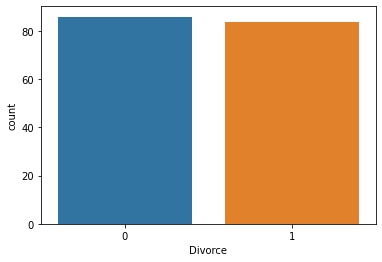

In [13]:
sns.countplot(x=df["Divorce"])
plt.show()

In [14]:
df.isna().sum().any()

False

In [15]:
df.duplicated().sum()

20

In [16]:
x = df.drop(columns=["Divorce"])
y = df["Divorce"]

In [17]:
from sklearn.model_selection import train_test_split, StratifiedKFold, RepeatedStratifiedKFold
import catboost as ctb
from catboost import Pool
from sklearn.metrics import log_loss
from sklearn.metrics import accuracy_score

In [18]:
x_train, x_val, y_train, y_val = train_test_split(x,y,test_size = 0.1,stratify= y,random_state = 42)

In [19]:
(x_train.shape,y_train.shape,x_val.shape,y_val.shape)

((153, 54), (153,), (17, 54), (17,))

In [20]:
skf = RepeatedStratifiedKFold(n_splits=5, random_state=None)

### Baseline Model

In [21]:
test_score=[]
train_score=[]

test_acc_score = []
train_acc_score = []

In [22]:
for train_index, test_index in skf.split(x_train,y_train):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = x_train.iloc[train_index], x_train.iloc[test_index]
    Y_train, Y_test = y_train.iloc[train_index], y_train.iloc[test_index]
    
    
    model = ctb.CatBoostClassifier(custom_metric=['Logloss'],eval_metric='Logloss')# 
    train_dataset = Pool(X_train, Y_train, feature_names=list(X_train.columns)) #0.210295
    eval_dataset = Pool(x_val, y_val)
    
    
    model.fit(train_dataset,eval_set=eval_dataset,early_stopping_rounds= 30)
    train_preds = model.predict_proba(X_train)
    train_ = model.predict(X_train)
    print("Train log_loss score: ",log_loss(Y_train,train_preds))
    train_score.append(np.mean(log_loss(Y_train,train_preds)))
    train_acc_score.append(np.mean(accuracy_score(Y_train,train_)))
    
    test_preds = model.predict_proba(X_test)
    test_ = model.predict(X_test)
    print("Test log_loss score: ", log_loss(Y_test,test_preds))
    test_score.append(np.mean(log_loss(Y_test,test_preds)))
    test_acc_score.append(np.mean(accuracy_score(Y_test,test_)))
    

Learning rate set to 0.018847
0:	learn: 0.6619667	test: 0.6598115	best: 0.6598115 (0)	total: 221ms	remaining: 3m 40s
1:	learn: 0.6302464	test: 0.6309564	best: 0.6309564 (1)	total: 224ms	remaining: 1m 51s
2:	learn: 0.6024739	test: 0.6020072	best: 0.6020072 (2)	total: 229ms	remaining: 1m 16s
3:	learn: 0.5756134	test: 0.5740211	best: 0.5740211 (3)	total: 232ms	remaining: 57.9s
4:	learn: 0.5519880	test: 0.5521724	best: 0.5521724 (4)	total: 236ms	remaining: 46.9s
5:	learn: 0.5323639	test: 0.5316013	best: 0.5316013 (5)	total: 239ms	remaining: 39.6s
6:	learn: 0.5072363	test: 0.5054673	best: 0.5054673 (6)	total: 243ms	remaining: 34.5s
7:	learn: 0.4886487	test: 0.4853953	best: 0.4853953 (7)	total: 246ms	remaining: 30.5s
8:	learn: 0.4677687	test: 0.4609633	best: 0.4609633 (8)	total: 248ms	remaining: 27.3s
9:	learn: 0.4504366	test: 0.4451559	best: 0.4451559 (9)	total: 250ms	remaining: 24.8s
10:	learn: 0.4305321	test: 0.4238016	best: 0.4238016 (10)	total: 252ms	remaining: 22.7s
11:	learn: 0.412139

159:	learn: 0.0199129	test: 0.0231188	best: 0.0231188 (159)	total: 549ms	remaining: 2.88s
160:	learn: 0.0197925	test: 0.0230158	best: 0.0230158 (160)	total: 551ms	remaining: 2.87s
161:	learn: 0.0195935	test: 0.0227805	best: 0.0227805 (161)	total: 554ms	remaining: 2.86s
162:	learn: 0.0193689	test: 0.0225393	best: 0.0225393 (162)	total: 556ms	remaining: 2.85s
163:	learn: 0.0191791	test: 0.0223378	best: 0.0223378 (163)	total: 559ms	remaining: 2.85s
164:	learn: 0.0189794	test: 0.0222588	best: 0.0222588 (164)	total: 561ms	remaining: 2.84s
165:	learn: 0.0188526	test: 0.0221789	best: 0.0221789 (165)	total: 564ms	remaining: 2.83s
166:	learn: 0.0185779	test: 0.0218807	best: 0.0218807 (166)	total: 567ms	remaining: 2.83s
167:	learn: 0.0184018	test: 0.0217305	best: 0.0217305 (167)	total: 569ms	remaining: 2.82s
168:	learn: 0.0182602	test: 0.0216138	best: 0.0216138 (168)	total: 572ms	remaining: 2.81s
169:	learn: 0.0181204	test: 0.0215257	best: 0.0215257 (169)	total: 574ms	remaining: 2.8s
170:	learn:

312:	learn: 0.0074945	test: 0.0111756	best: 0.0111756 (312)	total: 877ms	remaining: 1.93s
313:	learn: 0.0074540	test: 0.0111232	best: 0.0111232 (313)	total: 880ms	remaining: 1.92s
314:	learn: 0.0074111	test: 0.0110661	best: 0.0110661 (314)	total: 882ms	remaining: 1.92s
315:	learn: 0.0073620	test: 0.0110048	best: 0.0110048 (315)	total: 885ms	remaining: 1.92s
316:	learn: 0.0073299	test: 0.0109506	best: 0.0109506 (316)	total: 887ms	remaining: 1.91s
317:	learn: 0.0073005	test: 0.0108942	best: 0.0108942 (317)	total: 890ms	remaining: 1.91s
318:	learn: 0.0072533	test: 0.0108308	best: 0.0108308 (318)	total: 893ms	remaining: 1.91s
319:	learn: 0.0072290	test: 0.0108106	best: 0.0108106 (319)	total: 895ms	remaining: 1.9s
320:	learn: 0.0072015	test: 0.0107822	best: 0.0107822 (320)	total: 897ms	remaining: 1.9s
321:	learn: 0.0071739	test: 0.0107717	best: 0.0107717 (321)	total: 901ms	remaining: 1.9s
322:	learn: 0.0071393	test: 0.0107388	best: 0.0107388 (322)	total: 903ms	remaining: 1.89s
323:	learn: 0

453:	learn: 0.0044660	test: 0.0074480	best: 0.0074480 (453)	total: 1.21s	remaining: 1.45s
454:	learn: 0.0044537	test: 0.0074306	best: 0.0074306 (454)	total: 1.21s	remaining: 1.45s
455:	learn: 0.0044418	test: 0.0074153	best: 0.0074153 (455)	total: 1.21s	remaining: 1.45s
456:	learn: 0.0044306	test: 0.0074001	best: 0.0074001 (456)	total: 1.21s	remaining: 1.44s
457:	learn: 0.0044191	test: 0.0073849	best: 0.0073849 (457)	total: 1.22s	remaining: 1.44s
458:	learn: 0.0044071	test: 0.0073680	best: 0.0073680 (458)	total: 1.22s	remaining: 1.44s
459:	learn: 0.0043917	test: 0.0073436	best: 0.0073436 (459)	total: 1.22s	remaining: 1.43s
460:	learn: 0.0043806	test: 0.0073287	best: 0.0073287 (460)	total: 1.22s	remaining: 1.43s
461:	learn: 0.0043696	test: 0.0073159	best: 0.0073159 (461)	total: 1.23s	remaining: 1.43s
462:	learn: 0.0043600	test: 0.0073148	best: 0.0073148 (462)	total: 1.23s	remaining: 1.42s
463:	learn: 0.0043485	test: 0.0072983	best: 0.0072983 (463)	total: 1.23s	remaining: 1.42s
464:	learn

607:	learn: 0.0031678	test: 0.0059891	best: 0.0059891 (607)	total: 1.54s	remaining: 993ms
608:	learn: 0.0031623	test: 0.0059869	best: 0.0059869 (608)	total: 1.54s	remaining: 991ms
609:	learn: 0.0031563	test: 0.0059778	best: 0.0059778 (609)	total: 1.54s	remaining: 988ms
610:	learn: 0.0031510	test: 0.0059776	best: 0.0059776 (610)	total: 1.55s	remaining: 986ms
611:	learn: 0.0031454	test: 0.0059758	best: 0.0059758 (611)	total: 1.55s	remaining: 983ms
612:	learn: 0.0031399	test: 0.0059739	best: 0.0059739 (612)	total: 1.55s	remaining: 981ms
613:	learn: 0.0031340	test: 0.0059650	best: 0.0059650 (613)	total: 1.55s	remaining: 978ms
614:	learn: 0.0031282	test: 0.0059561	best: 0.0059561 (614)	total: 1.56s	remaining: 975ms
615:	learn: 0.0031227	test: 0.0059472	best: 0.0059472 (615)	total: 1.56s	remaining: 972ms
616:	learn: 0.0031171	test: 0.0059453	best: 0.0059453 (616)	total: 1.56s	remaining: 970ms
617:	learn: 0.0031113	test: 0.0059365	best: 0.0059365 (617)	total: 1.56s	remaining: 967ms
618:	learn

744:	learn: 0.0025441	test: 0.0054571	best: 0.0054571 (744)	total: 1.87s	remaining: 639ms
745:	learn: 0.0025402	test: 0.0054504	best: 0.0054504 (745)	total: 1.87s	remaining: 637ms
746:	learn: 0.0025364	test: 0.0054439	best: 0.0054439 (746)	total: 1.87s	remaining: 635ms
747:	learn: 0.0025329	test: 0.0054353	best: 0.0054353 (747)	total: 1.88s	remaining: 633ms
748:	learn: 0.0025288	test: 0.0054288	best: 0.0054288 (748)	total: 1.88s	remaining: 630ms
749:	learn: 0.0025256	test: 0.0054203	best: 0.0054203 (749)	total: 1.88s	remaining: 628ms
750:	learn: 0.0025218	test: 0.0054138	best: 0.0054138 (750)	total: 1.89s	remaining: 625ms
751:	learn: 0.0025183	test: 0.0054126	best: 0.0054126 (751)	total: 1.89s	remaining: 623ms
752:	learn: 0.0025145	test: 0.0054114	best: 0.0054114 (752)	total: 1.89s	remaining: 620ms
753:	learn: 0.0025111	test: 0.0054103	best: 0.0054103 (753)	total: 1.9s	remaining: 618ms
754:	learn: 0.0025076	test: 0.0054038	best: 0.0054038 (754)	total: 1.9s	remaining: 616ms
755:	learn: 

844:	learn: 0.0022241	test: 0.0050093	best: 0.0050093 (844)	total: 2.19s	remaining: 402ms
845:	learn: 0.0022211	test: 0.0050041	best: 0.0050041 (845)	total: 2.2s	remaining: 400ms
846:	learn: 0.0022183	test: 0.0050032	best: 0.0050032 (846)	total: 2.2s	remaining: 397ms
847:	learn: 0.0022155	test: 0.0049963	best: 0.0049963 (847)	total: 2.2s	remaining: 395ms
848:	learn: 0.0022130	test: 0.0049894	best: 0.0049894 (848)	total: 2.21s	remaining: 392ms
849:	learn: 0.0022103	test: 0.0049885	best: 0.0049885 (849)	total: 2.21s	remaining: 390ms
850:	learn: 0.0022075	test: 0.0049875	best: 0.0049875 (850)	total: 2.21s	remaining: 387ms
851:	learn: 0.0022049	test: 0.0049866	best: 0.0049866 (851)	total: 2.21s	remaining: 384ms
852:	learn: 0.0022022	test: 0.0049798	best: 0.0049798 (852)	total: 2.21s	remaining: 382ms
853:	learn: 0.0021998	test: 0.0049788	best: 0.0049788 (853)	total: 2.22s	remaining: 379ms
854:	learn: 0.0021971	test: 0.0049736	best: 0.0049736 (854)	total: 2.22s	remaining: 377ms
855:	learn: 0

Train log_loss score:  0.0018715601897561602
Test log_loss score:  0.004839739464775375
Learning rate set to 0.018847
0:	learn: 0.6621514	test: 0.6626287	best: 0.6626287 (0)	total: 2.05ms	remaining: 2.05s
1:	learn: 0.6273325	test: 0.6276950	best: 0.6276950 (1)	total: 3.49ms	remaining: 1.74s
2:	learn: 0.5983404	test: 0.6012294	best: 0.6012294 (2)	total: 5.23ms	remaining: 1.74s
3:	learn: 0.5721373	test: 0.5759067	best: 0.5759067 (3)	total: 6.94ms	remaining: 1.73s
4:	learn: 0.5503225	test: 0.5531241	best: 0.5531241 (4)	total: 8.69ms	remaining: 1.73s
5:	learn: 0.5229756	test: 0.5269252	best: 0.5269252 (5)	total: 10.5ms	remaining: 1.74s
6:	learn: 0.5013290	test: 0.5048218	best: 0.5048218 (6)	total: 12.3ms	remaining: 1.75s
7:	learn: 0.4779816	test: 0.4821000	best: 0.4821000 (7)	total: 14ms	remaining: 1.74s
8:	learn: 0.4539938	test: 0.4577996	best: 0.4577996 (8)	total: 15.6ms	remaining: 1.72s
9:	learn: 0.4339732	test: 0.4378420	best: 0.4378420 (9)	total: 17.4ms	remaining: 1.73s
10:	learn: 0.4

125:	learn: 0.0234186	test: 0.0307806	best: 0.0307806 (125)	total: 243ms	remaining: 1.69s
126:	learn: 0.0231756	test: 0.0306969	best: 0.0306969 (126)	total: 246ms	remaining: 1.69s
127:	learn: 0.0229225	test: 0.0304823	best: 0.0304823 (127)	total: 249ms	remaining: 1.69s
128:	learn: 0.0227051	test: 0.0303115	best: 0.0303115 (128)	total: 251ms	remaining: 1.69s
129:	learn: 0.0223476	test: 0.0300167	best: 0.0300167 (129)	total: 253ms	remaining: 1.69s
130:	learn: 0.0221347	test: 0.0297082	best: 0.0297082 (130)	total: 256ms	remaining: 1.7s
131:	learn: 0.0218856	test: 0.0293652	best: 0.0293652 (131)	total: 260ms	remaining: 1.71s
132:	learn: 0.0216023	test: 0.0290694	best: 0.0290694 (132)	total: 262ms	remaining: 1.71s
133:	learn: 0.0213813	test: 0.0287794	best: 0.0287794 (133)	total: 264ms	remaining: 1.71s
134:	learn: 0.0210787	test: 0.0282914	best: 0.0282914 (134)	total: 267ms	remaining: 1.71s
135:	learn: 0.0208400	test: 0.0280736	best: 0.0280736 (135)	total: 269ms	remaining: 1.71s
136:	learn:

258:	learn: 0.0081452	test: 0.0145676	best: 0.0145657 (257)	total: 570ms	remaining: 1.63s
259:	learn: 0.0080989	test: 0.0144973	best: 0.0144973 (259)	total: 573ms	remaining: 1.63s
260:	learn: 0.0080464	test: 0.0144690	best: 0.0144690 (260)	total: 576ms	remaining: 1.63s
261:	learn: 0.0080021	test: 0.0144175	best: 0.0144175 (261)	total: 578ms	remaining: 1.63s
262:	learn: 0.0079624	test: 0.0143676	best: 0.0143676 (262)	total: 581ms	remaining: 1.63s
263:	learn: 0.0079213	test: 0.0143366	best: 0.0143366 (263)	total: 583ms	remaining: 1.62s
264:	learn: 0.0078789	test: 0.0143359	best: 0.0143359 (264)	total: 585ms	remaining: 1.62s
265:	learn: 0.0078169	test: 0.0142677	best: 0.0142677 (265)	total: 587ms	remaining: 1.62s
266:	learn: 0.0077788	test: 0.0142107	best: 0.0142107 (266)	total: 589ms	remaining: 1.62s
267:	learn: 0.0077440	test: 0.0141663	best: 0.0141663 (267)	total: 592ms	remaining: 1.62s
268:	learn: 0.0077098	test: 0.0141265	best: 0.0141265 (268)	total: 595ms	remaining: 1.62s
269:	learn

393:	learn: 0.0047743	test: 0.0105258	best: 0.0105258 (393)	total: 884ms	remaining: 1.36s
394:	learn: 0.0047605	test: 0.0105209	best: 0.0105209 (394)	total: 886ms	remaining: 1.36s
395:	learn: 0.0047447	test: 0.0105011	best: 0.0105011 (395)	total: 888ms	remaining: 1.35s
396:	learn: 0.0047345	test: 0.0104963	best: 0.0104963 (396)	total: 894ms	remaining: 1.36s
397:	learn: 0.0047245	test: 0.0104917	best: 0.0104917 (397)	total: 896ms	remaining: 1.35s
398:	learn: 0.0047027	test: 0.0104709	best: 0.0104709 (398)	total: 898ms	remaining: 1.35s
399:	learn: 0.0046921	test: 0.0104664	best: 0.0104664 (399)	total: 901ms	remaining: 1.35s
400:	learn: 0.0046811	test: 0.0104532	best: 0.0104532 (400)	total: 903ms	remaining: 1.35s
401:	learn: 0.0046710	test: 0.0104363	best: 0.0104363 (401)	total: 905ms	remaining: 1.35s
402:	learn: 0.0046599	test: 0.0104313	best: 0.0104313 (402)	total: 907ms	remaining: 1.34s
403:	learn: 0.0046425	test: 0.0104121	best: 0.0104121 (403)	total: 910ms	remaining: 1.34s
404:	learn

524:	learn: 0.0036221	test: 0.0093216	best: 0.0093216 (524)	total: 1.21s	remaining: 1.09s
525:	learn: 0.0036166	test: 0.0093192	best: 0.0093192 (525)	total: 1.21s	remaining: 1.09s
526:	learn: 0.0036106	test: 0.0093147	best: 0.0093147 (526)	total: 1.21s	remaining: 1.09s
527:	learn: 0.0036045	test: 0.0093137	best: 0.0093137 (527)	total: 1.22s	remaining: 1.09s
528:	learn: 0.0035987	test: 0.0093092	best: 0.0093092 (528)	total: 1.22s	remaining: 1.08s
529:	learn: 0.0035922	test: 0.0093080	best: 0.0093080 (529)	total: 1.22s	remaining: 1.08s
530:	learn: 0.0035866	test: 0.0093056	best: 0.0093056 (530)	total: 1.22s	remaining: 1.08s
531:	learn: 0.0035807	test: 0.0093012	best: 0.0093012 (531)	total: 1.23s	remaining: 1.08s
532:	learn: 0.0035752	test: 0.0092988	best: 0.0092988 (532)	total: 1.23s	remaining: 1.07s
533:	learn: 0.0035687	test: 0.0092976	best: 0.0092976 (533)	total: 1.23s	remaining: 1.07s
534:	learn: 0.0035633	test: 0.0092951	best: 0.0092951 (534)	total: 1.23s	remaining: 1.07s
535:	learn

672:	learn: 0.0027664	test: 0.0083536	best: 0.0083536 (672)	total: 1.54s	remaining: 749ms
673:	learn: 0.0027625	test: 0.0083477	best: 0.0083477 (673)	total: 1.54s	remaining: 747ms
674:	learn: 0.0027583	test: 0.0083418	best: 0.0083418 (674)	total: 1.55s	remaining: 745ms
675:	learn: 0.0027533	test: 0.0083351	best: 0.0083351 (675)	total: 1.55s	remaining: 743ms
676:	learn: 0.0027476	test: 0.0083255	best: 0.0083255 (676)	total: 1.55s	remaining: 740ms
677:	learn: 0.0027430	test: 0.0083132	best: 0.0083132 (677)	total: 1.55s	remaining: 738ms
678:	learn: 0.0027377	test: 0.0082938	best: 0.0082938 (678)	total: 1.56s	remaining: 736ms
679:	learn: 0.0027335	test: 0.0082880	best: 0.0082880 (679)	total: 1.56s	remaining: 734ms
680:	learn: 0.0027276	test: 0.0082794	best: 0.0082794 (680)	total: 1.56s	remaining: 731ms
681:	learn: 0.0027215	test: 0.0082699	best: 0.0082699 (681)	total: 1.56s	remaining: 729ms
682:	learn: 0.0027166	test: 0.0082529	best: 0.0082529 (682)	total: 1.57s	remaining: 727ms
683:	learn

823:	learn: 0.0021741	test: 0.0071337	best: 0.0071337 (823)	total: 1.87s	remaining: 399ms
824:	learn: 0.0021718	test: 0.0071299	best: 0.0071299 (824)	total: 1.87s	remaining: 397ms
825:	learn: 0.0021681	test: 0.0071219	best: 0.0071219 (825)	total: 1.87s	remaining: 395ms
826:	learn: 0.0021656	test: 0.0071181	best: 0.0071181 (826)	total: 1.88s	remaining: 393ms
827:	learn: 0.0021631	test: 0.0071143	best: 0.0071143 (827)	total: 1.88s	remaining: 390ms
828:	learn: 0.0021595	test: 0.0071063	best: 0.0071063 (828)	total: 1.88s	remaining: 388ms
829:	learn: 0.0021566	test: 0.0070981	best: 0.0070981 (829)	total: 1.88s	remaining: 386ms
830:	learn: 0.0021528	test: 0.0070902	best: 0.0070902 (830)	total: 1.89s	remaining: 383ms
831:	learn: 0.0021500	test: 0.0070820	best: 0.0070820 (831)	total: 1.89s	remaining: 381ms
832:	learn: 0.0021478	test: 0.0070782	best: 0.0070782 (832)	total: 1.89s	remaining: 379ms
833:	learn: 0.0021448	test: 0.0070691	best: 0.0070691 (833)	total: 1.89s	remaining: 377ms
834:	learn

981:	learn: 0.0017993	test: 0.0062068	best: 0.0062068 (981)	total: 2.2s	remaining: 40.3ms
982:	learn: 0.0017978	test: 0.0062041	best: 0.0062041 (982)	total: 2.2s	remaining: 38.1ms
983:	learn: 0.0017948	test: 0.0061999	best: 0.0061999 (983)	total: 2.2s	remaining: 35.8ms
984:	learn: 0.0017930	test: 0.0061934	best: 0.0061934 (984)	total: 2.21s	remaining: 33.6ms
985:	learn: 0.0017909	test: 0.0061838	best: 0.0061838 (985)	total: 2.21s	remaining: 31.4ms
986:	learn: 0.0017889	test: 0.0061772	best: 0.0061772 (986)	total: 2.21s	remaining: 29.1ms
987:	learn: 0.0017871	test: 0.0061745	best: 0.0061745 (987)	total: 2.21s	remaining: 26.9ms
988:	learn: 0.0017853	test: 0.0061685	best: 0.0061685 (988)	total: 2.22s	remaining: 24.6ms
989:	learn: 0.0017835	test: 0.0061658	best: 0.0061658 (989)	total: 2.22s	remaining: 22.4ms
990:	learn: 0.0017817	test: 0.0061632	best: 0.0061632 (990)	total: 2.22s	remaining: 20.2ms
991:	learn: 0.0017796	test: 0.0061566	best: 0.0061566 (991)	total: 2.22s	remaining: 17.9ms
99

83:	learn: 0.0469260	test: 0.0549062	best: 0.0549062 (83)	total: 158ms	remaining: 1.72s
84:	learn: 0.0462084	test: 0.0541107	best: 0.0541107 (84)	total: 160ms	remaining: 1.72s
85:	learn: 0.0450602	test: 0.0527390	best: 0.0527390 (85)	total: 162ms	remaining: 1.73s
86:	learn: 0.0443091	test: 0.0519671	best: 0.0519671 (86)	total: 165ms	remaining: 1.73s
87:	learn: 0.0433279	test: 0.0508379	best: 0.0508379 (87)	total: 166ms	remaining: 1.72s
88:	learn: 0.0427077	test: 0.0503450	best: 0.0503450 (88)	total: 168ms	remaining: 1.72s
89:	learn: 0.0421851	test: 0.0498250	best: 0.0498250 (89)	total: 171ms	remaining: 1.72s
90:	learn: 0.0413809	test: 0.0492184	best: 0.0492184 (90)	total: 173ms	remaining: 1.72s
91:	learn: 0.0407374	test: 0.0486894	best: 0.0486894 (91)	total: 175ms	remaining: 1.73s
92:	learn: 0.0400182	test: 0.0478305	best: 0.0478305 (92)	total: 177ms	remaining: 1.72s
93:	learn: 0.0394702	test: 0.0472645	best: 0.0472645 (93)	total: 180ms	remaining: 1.74s
94:	learn: 0.0389281	test: 0.046

236:	learn: 0.0095262	test: 0.0172379	best: 0.0172379 (236)	total: 454ms	remaining: 1.46s
237:	learn: 0.0094755	test: 0.0171956	best: 0.0171956 (237)	total: 457ms	remaining: 1.46s
238:	learn: 0.0094202	test: 0.0171737	best: 0.0171737 (238)	total: 458ms	remaining: 1.46s
239:	learn: 0.0093698	test: 0.0171474	best: 0.0171474 (239)	total: 461ms	remaining: 1.46s
240:	learn: 0.0092895	test: 0.0169819	best: 0.0169819 (240)	total: 462ms	remaining: 1.46s
241:	learn: 0.0092328	test: 0.0169519	best: 0.0169519 (241)	total: 465ms	remaining: 1.46s
242:	learn: 0.0091824	test: 0.0169194	best: 0.0169194 (242)	total: 467ms	remaining: 1.45s
243:	learn: 0.0091226	test: 0.0168201	best: 0.0168201 (243)	total: 469ms	remaining: 1.45s
244:	learn: 0.0090720	test: 0.0167981	best: 0.0167981 (244)	total: 471ms	remaining: 1.45s
245:	learn: 0.0090203	test: 0.0167355	best: 0.0167355 (245)	total: 473ms	remaining: 1.45s
246:	learn: 0.0089631	test: 0.0166902	best: 0.0166902 (246)	total: 475ms	remaining: 1.45s
247:	learn

386:	learn: 0.0049168	test: 0.0126416	best: 0.0126416 (386)	total: 778ms	remaining: 1.23s
387:	learn: 0.0049054	test: 0.0126349	best: 0.0126349 (387)	total: 781ms	remaining: 1.23s
388:	learn: 0.0048895	test: 0.0126092	best: 0.0126092 (388)	total: 783ms	remaining: 1.23s
389:	learn: 0.0048724	test: 0.0125920	best: 0.0125920 (389)	total: 786ms	remaining: 1.23s
390:	learn: 0.0048542	test: 0.0125759	best: 0.0125759 (390)	total: 789ms	remaining: 1.23s
391:	learn: 0.0048386	test: 0.0125596	best: 0.0125596 (391)	total: 791ms	remaining: 1.23s
392:	learn: 0.0048218	test: 0.0125431	best: 0.0125431 (392)	total: 794ms	remaining: 1.23s
393:	learn: 0.0048058	test: 0.0125211	best: 0.0125211 (393)	total: 796ms	remaining: 1.22s
394:	learn: 0.0047882	test: 0.0125000	best: 0.0125000 (394)	total: 798ms	remaining: 1.22s
395:	learn: 0.0047662	test: 0.0124765	best: 0.0124765 (395)	total: 801ms	remaining: 1.22s
396:	learn: 0.0047546	test: 0.0124506	best: 0.0124506 (396)	total: 804ms	remaining: 1.22s
397:	learn

538:	learn: 0.0033257	test: 0.0100349	best: 0.0100349 (538)	total: 1.11s	remaining: 947ms
539:	learn: 0.0033197	test: 0.0100166	best: 0.0100166 (539)	total: 1.11s	remaining: 945ms
540:	learn: 0.0033134	test: 0.0099984	best: 0.0099984 (540)	total: 1.11s	remaining: 944ms
541:	learn: 0.0033080	test: 0.0099858	best: 0.0099858 (541)	total: 1.11s	remaining: 942ms
542:	learn: 0.0033026	test: 0.0099732	best: 0.0099732 (542)	total: 1.12s	remaining: 940ms
543:	learn: 0.0032963	test: 0.0099551	best: 0.0099551 (543)	total: 1.12s	remaining: 938ms
544:	learn: 0.0032915	test: 0.0099429	best: 0.0099429 (544)	total: 1.12s	remaining: 936ms
545:	learn: 0.0032860	test: 0.0099304	best: 0.0099304 (545)	total: 1.12s	remaining: 934ms
546:	learn: 0.0032805	test: 0.0099180	best: 0.0099180 (546)	total: 1.13s	remaining: 933ms
547:	learn: 0.0032745	test: 0.0099002	best: 0.0099002 (547)	total: 1.13s	remaining: 932ms
548:	learn: 0.0032692	test: 0.0098879	best: 0.0098879 (548)	total: 1.13s	remaining: 930ms
549:	learn

704:	learn: 0.0025487	test: 0.0082306	best: 0.0082306 (704)	total: 1.44s	remaining: 603ms
705:	learn: 0.0025447	test: 0.0082139	best: 0.0082139 (705)	total: 1.44s	remaining: 601ms
706:	learn: 0.0025406	test: 0.0082067	best: 0.0082067 (706)	total: 1.45s	remaining: 599ms
707:	learn: 0.0025363	test: 0.0081987	best: 0.0081987 (707)	total: 1.45s	remaining: 597ms
708:	learn: 0.0025326	test: 0.0081907	best: 0.0081907 (708)	total: 1.45s	remaining: 595ms
709:	learn: 0.0025269	test: 0.0081872	best: 0.0081872 (709)	total: 1.45s	remaining: 593ms
710:	learn: 0.0025224	test: 0.0081806	best: 0.0081806 (710)	total: 1.45s	remaining: 591ms
711:	learn: 0.0025184	test: 0.0081727	best: 0.0081727 (711)	total: 1.46s	remaining: 589ms
712:	learn: 0.0025141	test: 0.0081563	best: 0.0081563 (712)	total: 1.46s	remaining: 587ms
713:	learn: 0.0025103	test: 0.0081400	best: 0.0081400 (713)	total: 1.46s	remaining: 585ms
714:	learn: 0.0025068	test: 0.0081329	best: 0.0081329 (714)	total: 1.46s	remaining: 583ms
715:	learn

867:	learn: 0.0020166	test: 0.0071902	best: 0.0071902 (867)	total: 1.77s	remaining: 269ms
868:	learn: 0.0020139	test: 0.0071845	best: 0.0071845 (868)	total: 1.77s	remaining: 267ms
869:	learn: 0.0020118	test: 0.0071830	best: 0.0071830 (869)	total: 1.77s	remaining: 265ms
870:	learn: 0.0020095	test: 0.0071778	best: 0.0071778 (870)	total: 1.77s	remaining: 263ms
871:	learn: 0.0020067	test: 0.0071731	best: 0.0071731 (871)	total: 1.78s	remaining: 261ms
872:	learn: 0.0020042	test: 0.0071679	best: 0.0071679 (872)	total: 1.78s	remaining: 259ms
873:	learn: 0.0020013	test: 0.0071633	best: 0.0071633 (873)	total: 1.78s	remaining: 257ms
874:	learn: 0.0019990	test: 0.0071617	best: 0.0071617 (874)	total: 1.78s	remaining: 255ms
875:	learn: 0.0019966	test: 0.0071602	best: 0.0071602 (875)	total: 1.79s	remaining: 253ms
876:	learn: 0.0019943	test: 0.0071586	best: 0.0071586 (876)	total: 1.79s	remaining: 251ms
877:	learn: 0.0019914	test: 0.0071540	best: 0.0071540 (877)	total: 1.79s	remaining: 249ms
878:	learn

Train log_loss score:  0.0017343155038065466
Test log_loss score:  0.1165888735781261
Learning rate set to 0.018885
0:	learn: 0.6610872	test: 0.6623201	best: 0.6623201 (0)	total: 2.14ms	remaining: 2.14s
1:	learn: 0.6267435	test: 0.6318787	best: 0.6318787 (1)	total: 4.08ms	remaining: 2.04s
2:	learn: 0.5961462	test: 0.6054211	best: 0.6054211 (2)	total: 6.04ms	remaining: 2.01s
3:	learn: 0.5685152	test: 0.5770415	best: 0.5770415 (3)	total: 7.86ms	remaining: 1.96s
4:	learn: 0.5444688	test: 0.5546543	best: 0.5546543 (4)	total: 9.73ms	remaining: 1.94s
5:	learn: 0.5225645	test: 0.5338145	best: 0.5338145 (5)	total: 11.5ms	remaining: 1.91s
6:	learn: 0.4962156	test: 0.5080807	best: 0.5080807 (6)	total: 13.3ms	remaining: 1.89s
7:	learn: 0.4771557	test: 0.4879772	best: 0.4879772 (7)	total: 15ms	remaining: 1.86s
8:	learn: 0.4574449	test: 0.4653829	best: 0.4653829 (8)	total: 16.9ms	remaining: 1.86s
9:	learn: 0.4375708	test: 0.4475585	best: 0.4475585 (9)	total: 19ms	remaining: 1.88s
10:	learn: 0.42014

120:	learn: 0.0262269	test: 0.0275596	best: 0.0275596 (120)	total: 238ms	remaining: 1.73s
121:	learn: 0.0257340	test: 0.0270330	best: 0.0270330 (121)	total: 240ms	remaining: 1.73s
122:	learn: 0.0253888	test: 0.0268266	best: 0.0268266 (122)	total: 242ms	remaining: 1.73s
123:	learn: 0.0250652	test: 0.0265523	best: 0.0265523 (123)	total: 245ms	remaining: 1.73s
124:	learn: 0.0248512	test: 0.0264614	best: 0.0264614 (124)	total: 247ms	remaining: 1.73s
125:	learn: 0.0245414	test: 0.0261063	best: 0.0261063 (125)	total: 250ms	remaining: 1.73s
126:	learn: 0.0242127	test: 0.0257741	best: 0.0257741 (126)	total: 252ms	remaining: 1.73s
127:	learn: 0.0239368	test: 0.0256967	best: 0.0256967 (127)	total: 255ms	remaining: 1.73s
128:	learn: 0.0237097	test: 0.0254814	best: 0.0254814 (128)	total: 257ms	remaining: 1.74s
129:	learn: 0.0234441	test: 0.0252088	best: 0.0252088 (129)	total: 259ms	remaining: 1.73s
130:	learn: 0.0231236	test: 0.0249128	best: 0.0249128 (130)	total: 262ms	remaining: 1.74s
131:	learn

283:	learn: 0.0074559	test: 0.0099490	best: 0.0099490 (283)	total: 571ms	remaining: 1.44s
284:	learn: 0.0074268	test: 0.0099332	best: 0.0099332 (284)	total: 573ms	remaining: 1.44s
285:	learn: 0.0073933	test: 0.0099000	best: 0.0099000 (285)	total: 575ms	remaining: 1.44s
286:	learn: 0.0073560	test: 0.0098632	best: 0.0098632 (286)	total: 578ms	remaining: 1.44s
287:	learn: 0.0073266	test: 0.0098196	best: 0.0098196 (287)	total: 580ms	remaining: 1.43s
288:	learn: 0.0072962	test: 0.0097744	best: 0.0097744 (288)	total: 583ms	remaining: 1.43s
289:	learn: 0.0072654	test: 0.0097485	best: 0.0097485 (289)	total: 586ms	remaining: 1.43s
290:	learn: 0.0072445	test: 0.0097188	best: 0.0097188 (290)	total: 588ms	remaining: 1.43s
291:	learn: 0.0072125	test: 0.0097017	best: 0.0097017 (291)	total: 590ms	remaining: 1.43s
292:	learn: 0.0071804	test: 0.0096624	best: 0.0096624 (292)	total: 593ms	remaining: 1.43s
293:	learn: 0.0071500	test: 0.0096442	best: 0.0096442 (293)	total: 596ms	remaining: 1.43s
294:	learn

446:	learn: 0.0044484	test: 0.0063270	best: 0.0063270 (446)	total: 908ms	remaining: 1.12s
447:	learn: 0.0044387	test: 0.0063134	best: 0.0063134 (447)	total: 911ms	remaining: 1.12s
448:	learn: 0.0044294	test: 0.0062994	best: 0.0062994 (448)	total: 913ms	remaining: 1.12s
449:	learn: 0.0044198	test: 0.0062854	best: 0.0062854 (449)	total: 917ms	remaining: 1.12s
450:	learn: 0.0044104	test: 0.0062721	best: 0.0062721 (450)	total: 919ms	remaining: 1.12s
451:	learn: 0.0044008	test: 0.0062588	best: 0.0062588 (451)	total: 923ms	remaining: 1.12s
452:	learn: 0.0043915	test: 0.0062456	best: 0.0062456 (452)	total: 926ms	remaining: 1.12s
453:	learn: 0.0043820	test: 0.0062324	best: 0.0062324 (453)	total: 929ms	remaining: 1.12s
454:	learn: 0.0043731	test: 0.0062188	best: 0.0062188 (454)	total: 934ms	remaining: 1.12s
455:	learn: 0.0043641	test: 0.0062052	best: 0.0062052 (455)	total: 938ms	remaining: 1.12s
456:	learn: 0.0043548	test: 0.0061923	best: 0.0061923 (456)	total: 941ms	remaining: 1.12s
457:	learn

602:	learn: 0.0033759	test: 0.0047349	best: 0.0047349 (602)	total: 1.24s	remaining: 814ms
603:	learn: 0.0033710	test: 0.0047274	best: 0.0047274 (603)	total: 1.24s	remaining: 813ms
604:	learn: 0.0033660	test: 0.0047200	best: 0.0047200 (604)	total: 1.24s	remaining: 811ms
605:	learn: 0.0033611	test: 0.0047125	best: 0.0047125 (605)	total: 1.25s	remaining: 810ms
606:	learn: 0.0033564	test: 0.0047051	best: 0.0047051 (606)	total: 1.25s	remaining: 808ms
607:	learn: 0.0033511	test: 0.0046978	best: 0.0046978 (607)	total: 1.25s	remaining: 806ms
608:	learn: 0.0033464	test: 0.0046904	best: 0.0046904 (608)	total: 1.25s	remaining: 804ms
609:	learn: 0.0033415	test: 0.0046831	best: 0.0046831 (609)	total: 1.25s	remaining: 802ms
610:	learn: 0.0033363	test: 0.0046758	best: 0.0046758 (610)	total: 1.26s	remaining: 801ms
611:	learn: 0.0033316	test: 0.0046685	best: 0.0046685 (611)	total: 1.26s	remaining: 799ms
612:	learn: 0.0033269	test: 0.0046612	best: 0.0046612 (612)	total: 1.26s	remaining: 798ms
613:	learn

756:	learn: 0.0027433	test: 0.0039662	best: 0.0039662 (756)	total: 1.57s	remaining: 504ms
757:	learn: 0.0027400	test: 0.0039648	best: 0.0039648 (757)	total: 1.57s	remaining: 502ms
758:	learn: 0.0027366	test: 0.0039604	best: 0.0039604 (758)	total: 1.57s	remaining: 500ms
759:	learn: 0.0027332	test: 0.0039590	best: 0.0039590 (759)	total: 1.58s	remaining: 498ms
760:	learn: 0.0027301	test: 0.0039540	best: 0.0039540 (760)	total: 1.58s	remaining: 496ms
761:	learn: 0.0027267	test: 0.0039525	best: 0.0039525 (761)	total: 1.58s	remaining: 495ms
762:	learn: 0.0027228	test: 0.0039513	best: 0.0039513 (762)	total: 1.58s	remaining: 493ms
763:	learn: 0.0027191	test: 0.0039499	best: 0.0039499 (763)	total: 1.59s	remaining: 491ms
764:	learn: 0.0027160	test: 0.0039484	best: 0.0039484 (764)	total: 1.59s	remaining: 489ms
765:	learn: 0.0027125	test: 0.0039435	best: 0.0039435 (765)	total: 1.59s	remaining: 487ms
766:	learn: 0.0027095	test: 0.0039387	best: 0.0039387 (766)	total: 1.59s	remaining: 485ms
767:	learn

913:	learn: 0.0022957	test: 0.0035855	best: 0.0035855 (913)	total: 1.9s	remaining: 179ms
914:	learn: 0.0022932	test: 0.0035844	best: 0.0035844 (914)	total: 1.9s	remaining: 177ms
915:	learn: 0.0022912	test: 0.0035811	best: 0.0035811 (915)	total: 1.9s	remaining: 175ms
916:	learn: 0.0022890	test: 0.0035802	best: 0.0035802 (916)	total: 1.91s	remaining: 173ms
917:	learn: 0.0022865	test: 0.0035792	best: 0.0035792 (917)	total: 1.91s	remaining: 171ms
918:	learn: 0.0022840	test: 0.0035740	best: 0.0035740 (918)	total: 1.91s	remaining: 169ms
919:	learn: 0.0022817	test: 0.0035730	best: 0.0035730 (919)	total: 1.91s	remaining: 166ms
920:	learn: 0.0022790	test: 0.0035719	best: 0.0035719 (920)	total: 1.92s	remaining: 164ms
921:	learn: 0.0022764	test: 0.0035689	best: 0.0035689 (921)	total: 1.92s	remaining: 162ms
922:	learn: 0.0022744	test: 0.0035652	best: 0.0035652 (922)	total: 1.92s	remaining: 160ms
923:	learn: 0.0022723	test: 0.0035614	best: 0.0035614 (923)	total: 1.92s	remaining: 158ms
924:	learn: 0

74:	learn: 0.0626365	test: 0.0676054	best: 0.0676054 (74)	total: 160ms	remaining: 1.98s
75:	learn: 0.0615813	test: 0.0665054	best: 0.0665054 (75)	total: 163ms	remaining: 1.98s
76:	learn: 0.0604704	test: 0.0651106	best: 0.0651106 (76)	total: 164ms	remaining: 1.97s
77:	learn: 0.0591389	test: 0.0639292	best: 0.0639292 (77)	total: 167ms	remaining: 1.98s
78:	learn: 0.0577248	test: 0.0627410	best: 0.0627410 (78)	total: 169ms	remaining: 1.98s
79:	learn: 0.0563095	test: 0.0610687	best: 0.0610687 (79)	total: 171ms	remaining: 1.97s
80:	learn: 0.0555459	test: 0.0601710	best: 0.0601710 (80)	total: 173ms	remaining: 1.96s
81:	learn: 0.0546762	test: 0.0597997	best: 0.0597997 (81)	total: 175ms	remaining: 1.95s
82:	learn: 0.0534995	test: 0.0584798	best: 0.0584798 (82)	total: 176ms	remaining: 1.95s
83:	learn: 0.0522384	test: 0.0575100	best: 0.0575100 (83)	total: 178ms	remaining: 1.94s
84:	learn: 0.0512578	test: 0.0570581	best: 0.0570581 (84)	total: 180ms	remaining: 1.93s
85:	learn: 0.0501854	test: 0.056

243:	learn: 0.0101980	test: 0.0165440	best: 0.0165440 (243)	total: 496ms	remaining: 1.54s
244:	learn: 0.0101351	test: 0.0165428	best: 0.0165428 (244)	total: 499ms	remaining: 1.54s
245:	learn: 0.0100808	test: 0.0164587	best: 0.0164587 (245)	total: 500ms	remaining: 1.53s
246:	learn: 0.0100264	test: 0.0163888	best: 0.0163888 (246)	total: 503ms	remaining: 1.53s
247:	learn: 0.0099398	test: 0.0162277	best: 0.0162277 (247)	total: 505ms	remaining: 1.53s
248:	learn: 0.0098993	test: 0.0161858	best: 0.0161858 (248)	total: 507ms	remaining: 1.53s
249:	learn: 0.0098410	test: 0.0161329	best: 0.0161329 (249)	total: 509ms	remaining: 1.53s
250:	learn: 0.0097864	test: 0.0160221	best: 0.0160221 (250)	total: 511ms	remaining: 1.52s
251:	learn: 0.0097418	test: 0.0159511	best: 0.0159511 (251)	total: 512ms	remaining: 1.52s
252:	learn: 0.0096797	test: 0.0159092	best: 0.0159092 (252)	total: 514ms	remaining: 1.52s
253:	learn: 0.0096026	test: 0.0157783	best: 0.0157783 (253)	total: 516ms	remaining: 1.51s
254:	learn

339:	learn: 0.0064031	test: 0.0121589	best: 0.0121589 (339)	total: 663ms	remaining: 1.29s
340:	learn: 0.0063788	test: 0.0121266	best: 0.0121266 (340)	total: 665ms	remaining: 1.28s
341:	learn: 0.0063584	test: 0.0121109	best: 0.0121109 (341)	total: 667ms	remaining: 1.28s
342:	learn: 0.0063351	test: 0.0120868	best: 0.0120868 (342)	total: 669ms	remaining: 1.28s
343:	learn: 0.0063052	test: 0.0120305	best: 0.0120305 (343)	total: 671ms	remaining: 1.28s
344:	learn: 0.0062769	test: 0.0119936	best: 0.0119936 (344)	total: 674ms	remaining: 1.28s
345:	learn: 0.0062551	test: 0.0119900	best: 0.0119900 (345)	total: 675ms	remaining: 1.28s
346:	learn: 0.0062339	test: 0.0119728	best: 0.0119728 (346)	total: 677ms	remaining: 1.27s
347:	learn: 0.0062096	test: 0.0119714	best: 0.0119714 (347)	total: 679ms	remaining: 1.27s
348:	learn: 0.0061873	test: 0.0119811	best: 0.0119714 (347)	total: 681ms	remaining: 1.27s
349:	learn: 0.0061589	test: 0.0119313	best: 0.0119313 (349)	total: 684ms	remaining: 1.27s
350:	learn

500:	learn: 0.0039983	test: 0.0092940	best: 0.0092940 (500)	total: 999ms	remaining: 995ms
501:	learn: 0.0039902	test: 0.0092831	best: 0.0092831 (501)	total: 1s	remaining: 993ms
502:	learn: 0.0039774	test: 0.0092760	best: 0.0092760 (502)	total: 1s	remaining: 991ms
503:	learn: 0.0039685	test: 0.0092550	best: 0.0092550 (503)	total: 1s	remaining: 989ms
504:	learn: 0.0039564	test: 0.0092481	best: 0.0092481 (504)	total: 1.01s	remaining: 987ms
505:	learn: 0.0039474	test: 0.0092434	best: 0.0092434 (505)	total: 1.01s	remaining: 986ms
506:	learn: 0.0039368	test: 0.0092388	best: 0.0092388 (506)	total: 1.01s	remaining: 984ms
507:	learn: 0.0039278	test: 0.0092268	best: 0.0092268 (507)	total: 1.01s	remaining: 982ms
508:	learn: 0.0039190	test: 0.0092062	best: 0.0092062 (508)	total: 1.02s	remaining: 980ms
509:	learn: 0.0039112	test: 0.0091896	best: 0.0091896 (509)	total: 1.02s	remaining: 978ms
510:	learn: 0.0039025	test: 0.0091692	best: 0.0091692 (510)	total: 1.02s	remaining: 976ms
511:	learn: 0.00389

594:	learn: 0.0033178	test: 0.0080398	best: 0.0080398 (594)	total: 1.17s	remaining: 795ms
595:	learn: 0.0033118	test: 0.0080244	best: 0.0080244 (595)	total: 1.17s	remaining: 793ms
596:	learn: 0.0033060	test: 0.0080124	best: 0.0080124 (596)	total: 1.17s	remaining: 792ms
597:	learn: 0.0033007	test: 0.0080004	best: 0.0080004 (597)	total: 1.17s	remaining: 790ms
598:	learn: 0.0032919	test: 0.0079954	best: 0.0079954 (598)	total: 1.18s	remaining: 788ms
599:	learn: 0.0032865	test: 0.0079836	best: 0.0079836 (599)	total: 1.18s	remaining: 786ms
600:	learn: 0.0032814	test: 0.0079717	best: 0.0079717 (600)	total: 1.18s	remaining: 784ms
601:	learn: 0.0032757	test: 0.0079599	best: 0.0079599 (601)	total: 1.18s	remaining: 782ms
602:	learn: 0.0032673	test: 0.0079550	best: 0.0079550 (602)	total: 1.18s	remaining: 780ms
603:	learn: 0.0032621	test: 0.0079432	best: 0.0079432 (603)	total: 1.19s	remaining: 778ms
604:	learn: 0.0032567	test: 0.0079316	best: 0.0079316 (604)	total: 1.19s	remaining: 776ms
605:	learn

689:	learn: 0.0028624	test: 0.0071356	best: 0.0071356 (689)	total: 1.34s	remaining: 601ms
690:	learn: 0.0028581	test: 0.0071294	best: 0.0071294 (690)	total: 1.34s	remaining: 599ms
691:	learn: 0.0028541	test: 0.0071203	best: 0.0071203 (691)	total: 1.35s	remaining: 601ms
692:	learn: 0.0028501	test: 0.0071141	best: 0.0071141 (692)	total: 1.35s	remaining: 599ms
693:	learn: 0.0028463	test: 0.0071080	best: 0.0071080 (693)	total: 1.35s	remaining: 597ms
694:	learn: 0.0028426	test: 0.0071019	best: 0.0071019 (694)	total: 1.36s	remaining: 595ms
695:	learn: 0.0028387	test: 0.0070958	best: 0.0070958 (695)	total: 1.36s	remaining: 593ms
696:	learn: 0.0028347	test: 0.0070897	best: 0.0070897 (696)	total: 1.36s	remaining: 591ms
697:	learn: 0.0028311	test: 0.0070836	best: 0.0070836 (697)	total: 1.36s	remaining: 589ms
698:	learn: 0.0028270	test: 0.0070776	best: 0.0070776 (698)	total: 1.36s	remaining: 587ms
699:	learn: 0.0028232	test: 0.0070687	best: 0.0070687 (699)	total: 1.36s	remaining: 585ms
700:	learn

873:	learn: 0.0022807	test: 0.0062304	best: 0.0062304 (873)	total: 1.67s	remaining: 240ms
874:	learn: 0.0022785	test: 0.0062269	best: 0.0062269 (874)	total: 1.67s	remaining: 239ms
875:	learn: 0.0022746	test: 0.0062243	best: 0.0062243 (875)	total: 1.67s	remaining: 237ms
876:	learn: 0.0022724	test: 0.0062208	best: 0.0062208 (876)	total: 1.67s	remaining: 235ms
877:	learn: 0.0022692	test: 0.0062136	best: 0.0062136 (877)	total: 1.68s	remaining: 233ms
878:	learn: 0.0022667	test: 0.0062101	best: 0.0062101 (878)	total: 1.68s	remaining: 231ms
879:	learn: 0.0022642	test: 0.0062067	best: 0.0062067 (879)	total: 1.68s	remaining: 229ms
880:	learn: 0.0022618	test: 0.0062032	best: 0.0062032 (880)	total: 1.68s	remaining: 227ms
881:	learn: 0.0022589	test: 0.0061960	best: 0.0061960 (881)	total: 1.68s	remaining: 225ms
882:	learn: 0.0022566	test: 0.0061926	best: 0.0061926 (882)	total: 1.69s	remaining: 223ms
883:	learn: 0.0022540	test: 0.0061892	best: 0.0061892 (883)	total: 1.69s	remaining: 222ms
884:	learn

Train log_loss score:  0.00199417619418074
Test log_loss score:  0.007756516137372991
Learning rate set to 0.018847
0:	learn: 0.6636520	test: 0.6641732	best: 0.6641732 (0)	total: 6.43ms	remaining: 6.43s
1:	learn: 0.6306778	test: 0.6356732	best: 0.6356732 (1)	total: 13.4ms	remaining: 6.67s
2:	learn: 0.6010437	test: 0.6090683	best: 0.6090683 (2)	total: 16.3ms	remaining: 5.43s
3:	learn: 0.5737331	test: 0.5808491	best: 0.5808491 (3)	total: 18.9ms	remaining: 4.71s
4:	learn: 0.5503510	test: 0.5586592	best: 0.5586592 (4)	total: 21.4ms	remaining: 4.26s
5:	learn: 0.5277759	test: 0.5334044	best: 0.5334044 (5)	total: 24.2ms	remaining: 4.01s
6:	learn: 0.5033953	test: 0.5086439	best: 0.5086439 (6)	total: 26.8ms	remaining: 3.8s
7:	learn: 0.4844092	test: 0.4881240	best: 0.4881240 (7)	total: 29.2ms	remaining: 3.62s
8:	learn: 0.4634992	test: 0.4643833	best: 0.4643833 (8)	total: 31.7ms	remaining: 3.49s
9:	learn: 0.4451954	test: 0.4473986	best: 0.4473986 (9)	total: 34.2ms	remaining: 3.38s
10:	learn: 0.42

118:	learn: 0.0289663	test: 0.0358969	best: 0.0358969 (118)	total: 247ms	remaining: 1.83s
119:	learn: 0.0286410	test: 0.0355118	best: 0.0355118 (119)	total: 250ms	remaining: 1.83s
120:	learn: 0.0282564	test: 0.0351617	best: 0.0351617 (120)	total: 253ms	remaining: 1.83s
121:	learn: 0.0278998	test: 0.0346699	best: 0.0346699 (121)	total: 255ms	remaining: 1.83s
122:	learn: 0.0275967	test: 0.0343282	best: 0.0343282 (122)	total: 257ms	remaining: 1.83s
123:	learn: 0.0273034	test: 0.0342000	best: 0.0342000 (123)	total: 259ms	remaining: 1.83s
124:	learn: 0.0269792	test: 0.0340769	best: 0.0340769 (124)	total: 261ms	remaining: 1.83s
125:	learn: 0.0265980	test: 0.0337306	best: 0.0337306 (125)	total: 264ms	remaining: 1.83s
126:	learn: 0.0260357	test: 0.0333423	best: 0.0333423 (126)	total: 265ms	remaining: 1.82s
127:	learn: 0.0257571	test: 0.0331754	best: 0.0331754 (127)	total: 267ms	remaining: 1.82s
128:	learn: 0.0254258	test: 0.0329797	best: 0.0329797 (128)	total: 269ms	remaining: 1.82s
129:	learn

275:	learn: 0.0081442	test: 0.0157522	best: 0.0157522 (275)	total: 574ms	remaining: 1.5s
276:	learn: 0.0081096	test: 0.0157003	best: 0.0157003 (276)	total: 577ms	remaining: 1.51s
277:	learn: 0.0080486	test: 0.0156321	best: 0.0156321 (277)	total: 580ms	remaining: 1.5s
278:	learn: 0.0080161	test: 0.0156301	best: 0.0156301 (278)	total: 582ms	remaining: 1.5s
279:	learn: 0.0079842	test: 0.0156197	best: 0.0156197 (279)	total: 584ms	remaining: 1.5s
280:	learn: 0.0079328	test: 0.0155983	best: 0.0155983 (280)	total: 586ms	remaining: 1.5s
281:	learn: 0.0078948	test: 0.0155069	best: 0.0155069 (281)	total: 589ms	remaining: 1.5s
282:	learn: 0.0078523	test: 0.0154527	best: 0.0154527 (282)	total: 591ms	remaining: 1.5s
283:	learn: 0.0078066	test: 0.0154010	best: 0.0154010 (283)	total: 593ms	remaining: 1.49s
284:	learn: 0.0077674	test: 0.0153849	best: 0.0153849 (284)	total: 595ms	remaining: 1.49s
285:	learn: 0.0077416	test: 0.0153578	best: 0.0153578 (285)	total: 599ms	remaining: 1.5s
286:	learn: 0.0077

439:	learn: 0.0045135	test: 0.0106829	best: 0.0106829 (439)	total: 909ms	remaining: 1.16s
440:	learn: 0.0044994	test: 0.0106487	best: 0.0106487 (440)	total: 911ms	remaining: 1.16s
441:	learn: 0.0044866	test: 0.0106219	best: 0.0106219 (441)	total: 913ms	remaining: 1.15s
442:	learn: 0.0044750	test: 0.0106069	best: 0.0106069 (442)	total: 916ms	remaining: 1.15s
443:	learn: 0.0044653	test: 0.0105829	best: 0.0105829 (443)	total: 918ms	remaining: 1.15s
444:	learn: 0.0044538	test: 0.0105680	best: 0.0105680 (444)	total: 920ms	remaining: 1.15s
445:	learn: 0.0044422	test: 0.0105331	best: 0.0105331 (445)	total: 922ms	remaining: 1.15s
446:	learn: 0.0044318	test: 0.0105253	best: 0.0105253 (446)	total: 924ms	remaining: 1.14s
447:	learn: 0.0044207	test: 0.0105106	best: 0.0105106 (447)	total: 926ms	remaining: 1.14s
448:	learn: 0.0044104	test: 0.0105029	best: 0.0105029 (448)	total: 929ms	remaining: 1.14s
449:	learn: 0.0043996	test: 0.0104698	best: 0.0104698 (449)	total: 931ms	remaining: 1.14s
450:	learn

615:	learn: 0.0031338	test: 0.0081624	best: 0.0081624 (615)	total: 1.23s	remaining: 770ms
616:	learn: 0.0031286	test: 0.0081555	best: 0.0081555 (616)	total: 1.24s	remaining: 768ms
617:	learn: 0.0031230	test: 0.0081365	best: 0.0081365 (617)	total: 1.24s	remaining: 766ms
618:	learn: 0.0031178	test: 0.0081297	best: 0.0081297 (618)	total: 1.24s	remaining: 764ms
619:	learn: 0.0031126	test: 0.0081228	best: 0.0081228 (619)	total: 1.24s	remaining: 762ms
620:	learn: 0.0031071	test: 0.0081160	best: 0.0081160 (620)	total: 1.24s	remaining: 759ms
621:	learn: 0.0031017	test: 0.0081092	best: 0.0081092 (621)	total: 1.25s	remaining: 757ms
622:	learn: 0.0030964	test: 0.0081025	best: 0.0081025 (622)	total: 1.25s	remaining: 755ms
623:	learn: 0.0030914	test: 0.0080957	best: 0.0080957 (623)	total: 1.25s	remaining: 753ms
624:	learn: 0.0030859	test: 0.0080890	best: 0.0080890 (624)	total: 1.25s	remaining: 751ms
625:	learn: 0.0030805	test: 0.0080696	best: 0.0080696 (625)	total: 1.25s	remaining: 749ms
626:	learn

714:	learn: 0.0026798	test: 0.0073075	best: 0.0073075 (714)	total: 1.4s	remaining: 560ms
715:	learn: 0.0026758	test: 0.0073026	best: 0.0073026 (715)	total: 1.41s	remaining: 558ms
716:	learn: 0.0026723	test: 0.0073003	best: 0.0073003 (716)	total: 1.41s	remaining: 556ms
717:	learn: 0.0026683	test: 0.0072849	best: 0.0072849 (717)	total: 1.41s	remaining: 554ms
718:	learn: 0.0026646	test: 0.0072750	best: 0.0072750 (718)	total: 1.41s	remaining: 552ms
719:	learn: 0.0026611	test: 0.0072701	best: 0.0072701 (719)	total: 1.41s	remaining: 550ms
720:	learn: 0.0026574	test: 0.0072603	best: 0.0072603 (720)	total: 1.42s	remaining: 548ms
721:	learn: 0.0026536	test: 0.0072554	best: 0.0072554 (721)	total: 1.42s	remaining: 546ms
722:	learn: 0.0026494	test: 0.0072402	best: 0.0072402 (722)	total: 1.42s	remaining: 544ms
723:	learn: 0.0026457	test: 0.0072353	best: 0.0072353 (723)	total: 1.42s	remaining: 542ms
724:	learn: 0.0026418	test: 0.0072202	best: 0.0072202 (724)	total: 1.42s	remaining: 540ms
725:	learn:

811:	learn: 0.0023625	test: 0.0067133	best: 0.0067133 (811)	total: 1.57s	remaining: 365ms
812:	learn: 0.0023596	test: 0.0067116	best: 0.0067116 (812)	total: 1.58s	remaining: 363ms
813:	learn: 0.0023567	test: 0.0067076	best: 0.0067076 (813)	total: 1.58s	remaining: 361ms
814:	learn: 0.0023540	test: 0.0067058	best: 0.0067058 (814)	total: 1.58s	remaining: 359ms
815:	learn: 0.0023515	test: 0.0067040	best: 0.0067040 (815)	total: 1.58s	remaining: 357ms
816:	learn: 0.0023485	test: 0.0067001	best: 0.0067001 (816)	total: 1.58s	remaining: 355ms
817:	learn: 0.0023455	test: 0.0066877	best: 0.0066877 (817)	total: 1.59s	remaining: 353ms
818:	learn: 0.0023423	test: 0.0066753	best: 0.0066753 (818)	total: 1.59s	remaining: 351ms
819:	learn: 0.0023394	test: 0.0066714	best: 0.0066714 (819)	total: 1.59s	remaining: 349ms
820:	learn: 0.0023364	test: 0.0066675	best: 0.0066675 (820)	total: 1.59s	remaining: 347ms
821:	learn: 0.0023339	test: 0.0066657	best: 0.0066657 (821)	total: 1.59s	remaining: 346ms
822:	learn

903:	learn: 0.0021170	test: 0.0061693	best: 0.0061693 (903)	total: 1.74s	remaining: 184ms
904:	learn: 0.0021144	test: 0.0061590	best: 0.0061590 (904)	total: 1.74s	remaining: 182ms
905:	learn: 0.0021121	test: 0.0061565	best: 0.0061565 (905)	total: 1.74s	remaining: 181ms
906:	learn: 0.0021098	test: 0.0061462	best: 0.0061462 (906)	total: 1.74s	remaining: 179ms
907:	learn: 0.0021073	test: 0.0061359	best: 0.0061359 (907)	total: 1.74s	remaining: 177ms
908:	learn: 0.0021047	test: 0.0061305	best: 0.0061305 (908)	total: 1.75s	remaining: 175ms
909:	learn: 0.0021022	test: 0.0061204	best: 0.0061204 (909)	total: 1.75s	remaining: 173ms
910:	learn: 0.0021000	test: 0.0061178	best: 0.0061178 (910)	total: 1.75s	remaining: 171ms
911:	learn: 0.0020980	test: 0.0061137	best: 0.0061137 (911)	total: 1.75s	remaining: 169ms
912:	learn: 0.0020959	test: 0.0061097	best: 0.0061097 (912)	total: 1.75s	remaining: 167ms
913:	learn: 0.0020937	test: 0.0061029	best: 0.0061029 (913)	total: 1.76s	remaining: 165ms
914:	learn

996:	learn: 0.0019219	test: 0.0057172	best: 0.0057172 (996)	total: 1.9s	remaining: 5.73ms
997:	learn: 0.0019199	test: 0.0057137	best: 0.0057137 (997)	total: 1.91s	remaining: 3.82ms
998:	learn: 0.0019178	test: 0.0057092	best: 0.0057092 (998)	total: 1.91s	remaining: 1.91ms
999:	learn: 0.0019162	test: 0.0057057	best: 0.0057057 (999)	total: 1.91s	remaining: 0us

bestTest = 0.005705743904
bestIteration = 999

Train log_loss score:  0.001918941481017439
Test log_loss score:  0.13645568999135876
Learning rate set to 0.018847
0:	learn: 0.6635662	test: 0.6631655	best: 0.6631655 (0)	total: 7.2ms	remaining: 7.2s
1:	learn: 0.6317424	test: 0.6344983	best: 0.6344983 (1)	total: 12.2ms	remaining: 6.09s
2:	learn: 0.6037386	test: 0.6055668	best: 0.6055668 (2)	total: 16ms	remaining: 5.33s
3:	learn: 0.5771684	test: 0.5772165	best: 0.5772165 (3)	total: 22ms	remaining: 5.47s
4:	learn: 0.5528762	test: 0.5552378	best: 0.5552378 (4)	total: 25.8ms	remaining: 5.12s
5:	learn: 0.5330625	test: 0.5357414	best: 0.535

168:	learn: 0.0181547	test: 0.0254702	best: 0.0254702 (168)	total: 346ms	remaining: 1.7s
169:	learn: 0.0179850	test: 0.0253617	best: 0.0253617 (169)	total: 349ms	remaining: 1.7s
170:	learn: 0.0178294	test: 0.0250890	best: 0.0250890 (170)	total: 351ms	remaining: 1.7s
171:	learn: 0.0176372	test: 0.0249387	best: 0.0249387 (171)	total: 352ms	remaining: 1.7s
172:	learn: 0.0174919	test: 0.0248604	best: 0.0248604 (172)	total: 354ms	remaining: 1.69s
173:	learn: 0.0173488	test: 0.0247493	best: 0.0247493 (173)	total: 356ms	remaining: 1.69s
174:	learn: 0.0171995	test: 0.0246425	best: 0.0246425 (174)	total: 358ms	remaining: 1.69s
175:	learn: 0.0170521	test: 0.0243965	best: 0.0243965 (175)	total: 359ms	remaining: 1.68s
176:	learn: 0.0169544	test: 0.0243353	best: 0.0243353 (176)	total: 361ms	remaining: 1.68s
177:	learn: 0.0168198	test: 0.0241708	best: 0.0241708 (177)	total: 363ms	remaining: 1.68s
178:	learn: 0.0166747	test: 0.0239485	best: 0.0239485 (178)	total: 365ms	remaining: 1.67s
179:	learn: 0.

342:	learn: 0.0065696	test: 0.0137955	best: 0.0137955 (342)	total: 674ms	remaining: 1.29s
343:	learn: 0.0065433	test: 0.0137674	best: 0.0137674 (343)	total: 676ms	remaining: 1.29s
344:	learn: 0.0065148	test: 0.0137350	best: 0.0137350 (344)	total: 680ms	remaining: 1.29s
345:	learn: 0.0064871	test: 0.0137064	best: 0.0137064 (345)	total: 682ms	remaining: 1.29s
346:	learn: 0.0064590	test: 0.0137135	best: 0.0137064 (345)	total: 684ms	remaining: 1.29s
347:	learn: 0.0064273	test: 0.0136832	best: 0.0136832 (347)	total: 686ms	remaining: 1.28s
348:	learn: 0.0064032	test: 0.0136390	best: 0.0136390 (348)	total: 688ms	remaining: 1.28s
349:	learn: 0.0063753	test: 0.0135936	best: 0.0135936 (349)	total: 691ms	remaining: 1.28s
350:	learn: 0.0063487	test: 0.0135450	best: 0.0135450 (350)	total: 693ms	remaining: 1.28s
351:	learn: 0.0063297	test: 0.0135418	best: 0.0135418 (351)	total: 695ms	remaining: 1.28s
352:	learn: 0.0063074	test: 0.0135206	best: 0.0135206 (352)	total: 697ms	remaining: 1.28s
353:	learn

512:	learn: 0.0040341	test: 0.0099754	best: 0.0099754 (512)	total: 1.01s	remaining: 961ms
513:	learn: 0.0040260	test: 0.0099704	best: 0.0099704 (513)	total: 1.01s	remaining: 960ms
514:	learn: 0.0040156	test: 0.0099622	best: 0.0099622 (514)	total: 1.02s	remaining: 958ms
515:	learn: 0.0040074	test: 0.0099569	best: 0.0099569 (515)	total: 1.02s	remaining: 956ms
516:	learn: 0.0039981	test: 0.0099264	best: 0.0099264 (516)	total: 1.02s	remaining: 954ms
517:	learn: 0.0039892	test: 0.0098960	best: 0.0098960 (517)	total: 1.02s	remaining: 952ms
518:	learn: 0.0039819	test: 0.0098799	best: 0.0098799 (518)	total: 1.02s	remaining: 949ms
519:	learn: 0.0039730	test: 0.0098498	best: 0.0098498 (519)	total: 1.03s	remaining: 947ms
520:	learn: 0.0039629	test: 0.0098419	best: 0.0098419 (520)	total: 1.03s	remaining: 945ms
521:	learn: 0.0039540	test: 0.0098121	best: 0.0098121 (521)	total: 1.03s	remaining: 943ms
522:	learn: 0.0039454	test: 0.0097825	best: 0.0097825 (522)	total: 1.03s	remaining: 941ms
523:	learn

604:	learn: 0.0033481	test: 0.0085500	best: 0.0085500 (604)	total: 1.17s	remaining: 765ms
605:	learn: 0.0033422	test: 0.0085466	best: 0.0085466 (605)	total: 1.17s	remaining: 763ms
606:	learn: 0.0033363	test: 0.0085432	best: 0.0085432 (606)	total: 1.18s	remaining: 762ms
607:	learn: 0.0033305	test: 0.0085398	best: 0.0085398 (607)	total: 1.18s	remaining: 760ms
608:	learn: 0.0033244	test: 0.0085185	best: 0.0085185 (608)	total: 1.18s	remaining: 758ms
609:	learn: 0.0033184	test: 0.0084973	best: 0.0084973 (609)	total: 1.18s	remaining: 756ms
610:	learn: 0.0033124	test: 0.0084763	best: 0.0084763 (610)	total: 1.18s	remaining: 754ms
611:	learn: 0.0033066	test: 0.0084729	best: 0.0084729 (611)	total: 1.19s	remaining: 752ms
612:	learn: 0.0033007	test: 0.0084520	best: 0.0084520 (612)	total: 1.19s	remaining: 750ms
613:	learn: 0.0032947	test: 0.0084487	best: 0.0084487 (613)	total: 1.19s	remaining: 748ms
614:	learn: 0.0032889	test: 0.0084279	best: 0.0084279 (614)	total: 1.19s	remaining: 746ms
615:	learn

699:	learn: 0.0028613	test: 0.0075602	best: 0.0075602 (699)	total: 1.34s	remaining: 574ms
700:	learn: 0.0028570	test: 0.0075442	best: 0.0075442 (700)	total: 1.34s	remaining: 572ms
701:	learn: 0.0028526	test: 0.0075419	best: 0.0075419 (701)	total: 1.34s	remaining: 571ms
702:	learn: 0.0028483	test: 0.0075260	best: 0.0075260 (702)	total: 1.35s	remaining: 569ms
703:	learn: 0.0028438	test: 0.0075103	best: 0.0075103 (703)	total: 1.35s	remaining: 567ms
704:	learn: 0.0028396	test: 0.0075080	best: 0.0075080 (704)	total: 1.35s	remaining: 565ms
705:	learn: 0.0028352	test: 0.0075056	best: 0.0075056 (705)	total: 1.35s	remaining: 563ms
706:	learn: 0.0028308	test: 0.0075033	best: 0.0075033 (706)	total: 1.35s	remaining: 561ms
707:	learn: 0.0028266	test: 0.0074877	best: 0.0074877 (707)	total: 1.36s	remaining: 559ms
708:	learn: 0.0028222	test: 0.0074721	best: 0.0074721 (708)	total: 1.36s	remaining: 557ms
709:	learn: 0.0028182	test: 0.0074699	best: 0.0074699 (709)	total: 1.36s	remaining: 556ms
710:	learn

798:	learn: 0.0024873	test: 0.0068103	best: 0.0068103 (798)	total: 1.51s	remaining: 381ms
799:	learn: 0.0024842	test: 0.0067980	best: 0.0067980 (799)	total: 1.51s	remaining: 379ms
800:	learn: 0.0024808	test: 0.0067857	best: 0.0067857 (800)	total: 1.52s	remaining: 377ms
801:	learn: 0.0024774	test: 0.0067840	best: 0.0067840 (801)	total: 1.52s	remaining: 375ms
802:	learn: 0.0024745	test: 0.0067823	best: 0.0067823 (802)	total: 1.52s	remaining: 373ms
803:	learn: 0.0024714	test: 0.0067701	best: 0.0067701 (803)	total: 1.52s	remaining: 371ms
804:	learn: 0.0024682	test: 0.0067684	best: 0.0067684 (804)	total: 1.52s	remaining: 369ms
805:	learn: 0.0024649	test: 0.0067667	best: 0.0067667 (805)	total: 1.53s	remaining: 367ms
806:	learn: 0.0024617	test: 0.0067545	best: 0.0067545 (806)	total: 1.53s	remaining: 366ms
807:	learn: 0.0024582	test: 0.0067424	best: 0.0067424 (807)	total: 1.53s	remaining: 364ms
808:	learn: 0.0024554	test: 0.0067408	best: 0.0067408 (808)	total: 1.53s	remaining: 362ms
809:	learn

894:	learn: 0.0022101	test: 0.0062651	best: 0.0062651 (894)	total: 1.68s	remaining: 197ms
895:	learn: 0.0022075	test: 0.0062637	best: 0.0062637 (895)	total: 1.68s	remaining: 195ms
896:	learn: 0.0022047	test: 0.0062602	best: 0.0062602 (896)	total: 1.68s	remaining: 193ms
897:	learn: 0.0022024	test: 0.0062589	best: 0.0062589 (897)	total: 1.69s	remaining: 192ms
898:	learn: 0.0021997	test: 0.0062575	best: 0.0062575 (898)	total: 1.69s	remaining: 190ms
899:	learn: 0.0021973	test: 0.0062562	best: 0.0062562 (899)	total: 1.69s	remaining: 188ms
900:	learn: 0.0021948	test: 0.0062462	best: 0.0062462 (900)	total: 1.69s	remaining: 186ms
901:	learn: 0.0021923	test: 0.0062363	best: 0.0062363 (901)	total: 1.7s	remaining: 184ms
902:	learn: 0.0021897	test: 0.0062264	best: 0.0062264 (902)	total: 1.7s	remaining: 182ms
903:	learn: 0.0021872	test: 0.0062165	best: 0.0062165 (903)	total: 1.7s	remaining: 180ms
904:	learn: 0.0021847	test: 0.0062066	best: 0.0062066 (904)	total: 1.7s	remaining: 179ms
905:	learn: 0.

985:	learn: 0.0020003	test: 0.0058422	best: 0.0058422 (985)	total: 1.84s	remaining: 26.1ms
986:	learn: 0.0019980	test: 0.0058411	best: 0.0058411 (986)	total: 1.84s	remaining: 24.3ms
987:	learn: 0.0019959	test: 0.0058400	best: 0.0058400 (987)	total: 1.84s	remaining: 22.4ms
988:	learn: 0.0019942	test: 0.0058316	best: 0.0058316 (988)	total: 1.85s	remaining: 20.5ms
989:	learn: 0.0019919	test: 0.0058232	best: 0.0058232 (989)	total: 1.85s	remaining: 18.7ms
990:	learn: 0.0019900	test: 0.0058222	best: 0.0058222 (990)	total: 1.85s	remaining: 16.8ms
991:	learn: 0.0019879	test: 0.0058138	best: 0.0058138 (991)	total: 1.85s	remaining: 14.9ms
992:	learn: 0.0019858	test: 0.0058055	best: 0.0058055 (992)	total: 1.85s	remaining: 13.1ms
993:	learn: 0.0019837	test: 0.0058044	best: 0.0058044 (993)	total: 1.86s	remaining: 11.2ms
994:	learn: 0.0019819	test: 0.0057961	best: 0.0057961 (994)	total: 1.86s	remaining: 9.34ms
995:	learn: 0.0019798	test: 0.0057951	best: 0.0057951 (995)	total: 1.86s	remaining: 7.47ms

158:	learn: 0.0168945	test: 0.0239857	best: 0.0239857 (158)	total: 344ms	remaining: 1.82s
159:	learn: 0.0167484	test: 0.0240095	best: 0.0239857 (158)	total: 346ms	remaining: 1.82s
160:	learn: 0.0166257	test: 0.0238262	best: 0.0238262 (160)	total: 349ms	remaining: 1.82s
161:	learn: 0.0165068	test: 0.0236786	best: 0.0236786 (161)	total: 351ms	remaining: 1.81s
162:	learn: 0.0163902	test: 0.0236539	best: 0.0236539 (162)	total: 353ms	remaining: 1.81s
163:	learn: 0.0162479	test: 0.0236011	best: 0.0236011 (163)	total: 355ms	remaining: 1.81s
164:	learn: 0.0160458	test: 0.0233565	best: 0.0233565 (164)	total: 356ms	remaining: 1.8s
165:	learn: 0.0159284	test: 0.0233059	best: 0.0233059 (165)	total: 359ms	remaining: 1.8s
166:	learn: 0.0157726	test: 0.0232170	best: 0.0232170 (166)	total: 360ms	remaining: 1.8s
167:	learn: 0.0155983	test: 0.0229610	best: 0.0229610 (167)	total: 363ms	remaining: 1.8s
168:	learn: 0.0154520	test: 0.0228164	best: 0.0228164 (168)	total: 365ms	remaining: 1.79s
169:	learn: 0.

252:	learn: 0.0086059	test: 0.0155432	best: 0.0155432 (252)	total: 512ms	remaining: 1.51s
253:	learn: 0.0085663	test: 0.0154923	best: 0.0154923 (253)	total: 515ms	remaining: 1.51s
254:	learn: 0.0085105	test: 0.0154315	best: 0.0154315 (254)	total: 517ms	remaining: 1.51s
255:	learn: 0.0084724	test: 0.0153625	best: 0.0153625 (255)	total: 518ms	remaining: 1.51s
256:	learn: 0.0084340	test: 0.0152744	best: 0.0152744 (256)	total: 521ms	remaining: 1.5s
257:	learn: 0.0083848	test: 0.0152396	best: 0.0152396 (257)	total: 522ms	remaining: 1.5s
258:	learn: 0.0083432	test: 0.0152034	best: 0.0152034 (258)	total: 524ms	remaining: 1.5s
259:	learn: 0.0083082	test: 0.0151980	best: 0.0151980 (259)	total: 526ms	remaining: 1.5s
260:	learn: 0.0082744	test: 0.0151606	best: 0.0151606 (260)	total: 528ms	remaining: 1.5s
261:	learn: 0.0082380	test: 0.0150935	best: 0.0150935 (261)	total: 530ms	remaining: 1.49s
262:	learn: 0.0081982	test: 0.0150318	best: 0.0150318 (262)	total: 532ms	remaining: 1.49s
263:	learn: 0.0

353:	learn: 0.0055494	test: 0.0119395	best: 0.0119395 (353)	total: 682ms	remaining: 1.25s
354:	learn: 0.0055279	test: 0.0119481	best: 0.0119395 (353)	total: 685ms	remaining: 1.24s
355:	learn: 0.0055073	test: 0.0119026	best: 0.0119026 (355)	total: 687ms	remaining: 1.24s
356:	learn: 0.0054834	test: 0.0118503	best: 0.0118503 (356)	total: 688ms	remaining: 1.24s
357:	learn: 0.0054644	test: 0.0118444	best: 0.0118444 (357)	total: 690ms	remaining: 1.24s
358:	learn: 0.0054484	test: 0.0118352	best: 0.0118352 (358)	total: 692ms	remaining: 1.24s
359:	learn: 0.0054329	test: 0.0118339	best: 0.0118339 (359)	total: 694ms	remaining: 1.23s
360:	learn: 0.0054096	test: 0.0117831	best: 0.0117831 (360)	total: 695ms	remaining: 1.23s
361:	learn: 0.0053947	test: 0.0117609	best: 0.0117609 (361)	total: 697ms	remaining: 1.23s
362:	learn: 0.0053785	test: 0.0117613	best: 0.0117609 (361)	total: 699ms	remaining: 1.23s
363:	learn: 0.0053573	test: 0.0117146	best: 0.0117146 (363)	total: 701ms	remaining: 1.23s
364:	learn

445:	learn: 0.0043134	test: 0.0102864	best: 0.0102864 (445)	total: 842ms	remaining: 1.05s
446:	learn: 0.0043048	test: 0.0102708	best: 0.0102708 (446)	total: 845ms	remaining: 1.04s
447:	learn: 0.0042961	test: 0.0102552	best: 0.0102552 (447)	total: 847ms	remaining: 1.04s
448:	learn: 0.0042875	test: 0.0102397	best: 0.0102397 (448)	total: 849ms	remaining: 1.04s
449:	learn: 0.0042788	test: 0.0102242	best: 0.0102242 (449)	total: 850ms	remaining: 1.04s
450:	learn: 0.0042702	test: 0.0102089	best: 0.0102089 (450)	total: 853ms	remaining: 1.04s
451:	learn: 0.0042615	test: 0.0101935	best: 0.0101935 (451)	total: 855ms	remaining: 1.03s
452:	learn: 0.0042529	test: 0.0101783	best: 0.0101783 (452)	total: 857ms	remaining: 1.03s
453:	learn: 0.0042449	test: 0.0101631	best: 0.0101631 (453)	total: 859ms	remaining: 1.03s
454:	learn: 0.0042364	test: 0.0101479	best: 0.0101479 (454)	total: 861ms	remaining: 1.03s
455:	learn: 0.0042282	test: 0.0101328	best: 0.0101328 (455)	total: 863ms	remaining: 1.03s
456:	learn

541:	learn: 0.0036243	test: 0.0090210	best: 0.0090210 (541)	total: 1.01s	remaining: 855ms
542:	learn: 0.0036182	test: 0.0090099	best: 0.0090099 (542)	total: 1.01s	remaining: 853ms
543:	learn: 0.0036125	test: 0.0089989	best: 0.0089989 (543)	total: 1.01s	remaining: 851ms
544:	learn: 0.0036067	test: 0.0089879	best: 0.0089879 (544)	total: 1.02s	remaining: 850ms
545:	learn: 0.0036006	test: 0.0089769	best: 0.0089769 (545)	total: 1.02s	remaining: 848ms
546:	learn: 0.0035949	test: 0.0089660	best: 0.0089660 (546)	total: 1.02s	remaining: 846ms
547:	learn: 0.0035893	test: 0.0089551	best: 0.0089551 (547)	total: 1.02s	remaining: 844ms
548:	learn: 0.0035833	test: 0.0089442	best: 0.0089442 (548)	total: 1.02s	remaining: 842ms
549:	learn: 0.0035776	test: 0.0089334	best: 0.0089334 (549)	total: 1.03s	remaining: 840ms
550:	learn: 0.0035717	test: 0.0089226	best: 0.0089226 (550)	total: 1.03s	remaining: 838ms
551:	learn: 0.0035661	test: 0.0089118	best: 0.0089118 (551)	total: 1.03s	remaining: 836ms
552:	learn

726:	learn: 0.0027929	test: 0.0074451	best: 0.0074451 (726)	total: 1.35s	remaining: 507ms
727:	learn: 0.0027894	test: 0.0074386	best: 0.0074386 (727)	total: 1.35s	remaining: 506ms
728:	learn: 0.0027859	test: 0.0074321	best: 0.0074321 (728)	total: 1.35s	remaining: 504ms
729:	learn: 0.0027826	test: 0.0074256	best: 0.0074256 (729)	total: 1.36s	remaining: 502ms
730:	learn: 0.0027789	test: 0.0074191	best: 0.0074191 (730)	total: 1.36s	remaining: 500ms
731:	learn: 0.0027757	test: 0.0074126	best: 0.0074126 (731)	total: 1.36s	remaining: 498ms
732:	learn: 0.0027724	test: 0.0074061	best: 0.0074061 (732)	total: 1.36s	remaining: 496ms
733:	learn: 0.0027691	test: 0.0073997	best: 0.0073997 (733)	total: 1.36s	remaining: 494ms
734:	learn: 0.0027656	test: 0.0073933	best: 0.0073933 (734)	total: 1.36s	remaining: 492ms
735:	learn: 0.0027622	test: 0.0073869	best: 0.0073869 (735)	total: 1.37s	remaining: 491ms
736:	learn: 0.0027589	test: 0.0073805	best: 0.0073805 (736)	total: 1.37s	remaining: 489ms
737:	learn

819:	learn: 0.0025095	test: 0.0068997	best: 0.0068997 (819)	total: 1.51s	remaining: 332ms
820:	learn: 0.0025066	test: 0.0068945	best: 0.0068945 (820)	total: 1.51s	remaining: 330ms
821:	learn: 0.0025041	test: 0.0068892	best: 0.0068892 (821)	total: 1.51s	remaining: 328ms
822:	learn: 0.0025014	test: 0.0068840	best: 0.0068840 (822)	total: 1.52s	remaining: 326ms
823:	learn: 0.0024986	test: 0.0068788	best: 0.0068788 (823)	total: 1.52s	remaining: 325ms
824:	learn: 0.0024960	test: 0.0068736	best: 0.0068736 (824)	total: 1.52s	remaining: 323ms
825:	learn: 0.0024932	test: 0.0068684	best: 0.0068684 (825)	total: 1.52s	remaining: 321ms
826:	learn: 0.0024905	test: 0.0068632	best: 0.0068632 (826)	total: 1.52s	remaining: 319ms
827:	learn: 0.0024879	test: 0.0068581	best: 0.0068581 (827)	total: 1.53s	remaining: 317ms
828:	learn: 0.0024854	test: 0.0068529	best: 0.0068529 (828)	total: 1.53s	remaining: 315ms
829:	learn: 0.0024828	test: 0.0068478	best: 0.0068478 (829)	total: 1.53s	remaining: 314ms
830:	learn

917:	learn: 0.0022699	test: 0.0064353	best: 0.0064353 (917)	total: 1.68s	remaining: 150ms
918:	learn: 0.0022679	test: 0.0064310	best: 0.0064310 (918)	total: 1.68s	remaining: 148ms
919:	learn: 0.0022655	test: 0.0064267	best: 0.0064267 (919)	total: 1.69s	remaining: 147ms
920:	learn: 0.0022634	test: 0.0064225	best: 0.0064225 (920)	total: 1.69s	remaining: 145ms
921:	learn: 0.0022613	test: 0.0064182	best: 0.0064182 (921)	total: 1.69s	remaining: 143ms
922:	learn: 0.0022590	test: 0.0064140	best: 0.0064140 (922)	total: 1.69s	remaining: 141ms
923:	learn: 0.0022571	test: 0.0064098	best: 0.0064098 (923)	total: 1.69s	remaining: 139ms
924:	learn: 0.0022545	test: 0.0064055	best: 0.0064055 (924)	total: 1.69s	remaining: 137ms
925:	learn: 0.0022524	test: 0.0064013	best: 0.0064013 (925)	total: 1.7s	remaining: 136ms
926:	learn: 0.0022503	test: 0.0063971	best: 0.0063971 (926)	total: 1.7s	remaining: 134ms
927:	learn: 0.0022481	test: 0.0063929	best: 0.0063929 (927)	total: 1.7s	remaining: 132ms
928:	learn: 0

90:	learn: 0.0440159	test: 0.0486095	best: 0.0486095 (90)	total: 157ms	remaining: 1.57s
91:	learn: 0.0433160	test: 0.0476943	best: 0.0476943 (91)	total: 159ms	remaining: 1.57s
92:	learn: 0.0425880	test: 0.0469509	best: 0.0469509 (92)	total: 162ms	remaining: 1.58s
93:	learn: 0.0419084	test: 0.0466082	best: 0.0466082 (93)	total: 164ms	remaining: 1.57s
94:	learn: 0.0413025	test: 0.0460405	best: 0.0460405 (94)	total: 165ms	remaining: 1.57s
95:	learn: 0.0403029	test: 0.0449516	best: 0.0449516 (95)	total: 167ms	remaining: 1.57s
96:	learn: 0.0396588	test: 0.0443791	best: 0.0443791 (96)	total: 169ms	remaining: 1.57s
97:	learn: 0.0390998	test: 0.0438534	best: 0.0438534 (97)	total: 171ms	remaining: 1.57s
98:	learn: 0.0384192	test: 0.0431313	best: 0.0431313 (98)	total: 172ms	remaining: 1.57s
99:	learn: 0.0378224	test: 0.0424853	best: 0.0424853 (99)	total: 175ms	remaining: 1.57s
100:	learn: 0.0372185	test: 0.0420112	best: 0.0420112 (100)	total: 177ms	remaining: 1.58s
101:	learn: 0.0366650	test: 0.

187:	learn: 0.0141201	test: 0.0195350	best: 0.0195350 (187)	total: 326ms	remaining: 1.41s
188:	learn: 0.0140266	test: 0.0194612	best: 0.0194612 (188)	total: 328ms	remaining: 1.41s
189:	learn: 0.0138665	test: 0.0193189	best: 0.0193189 (189)	total: 330ms	remaining: 1.41s
190:	learn: 0.0137589	test: 0.0192442	best: 0.0192442 (190)	total: 332ms	remaining: 1.41s
191:	learn: 0.0136304	test: 0.0190976	best: 0.0190976 (191)	total: 334ms	remaining: 1.41s
192:	learn: 0.0135198	test: 0.0190281	best: 0.0190281 (192)	total: 336ms	remaining: 1.41s
193:	learn: 0.0134188	test: 0.0188701	best: 0.0188701 (193)	total: 338ms	remaining: 1.4s
194:	learn: 0.0133061	test: 0.0186817	best: 0.0186817 (194)	total: 340ms	remaining: 1.4s
195:	learn: 0.0132069	test: 0.0186345	best: 0.0186345 (195)	total: 343ms	remaining: 1.41s
196:	learn: 0.0131176	test: 0.0185854	best: 0.0185854 (196)	total: 345ms	remaining: 1.4s
197:	learn: 0.0130108	test: 0.0185107	best: 0.0185107 (197)	total: 347ms	remaining: 1.4s
198:	learn: 0.

281:	learn: 0.0078066	test: 0.0126765	best: 0.0126765 (281)	total: 495ms	remaining: 1.26s
282:	learn: 0.0077678	test: 0.0125891	best: 0.0125891 (282)	total: 498ms	remaining: 1.26s
283:	learn: 0.0077342	test: 0.0125342	best: 0.0125342 (283)	total: 499ms	remaining: 1.26s
284:	learn: 0.0076953	test: 0.0125158	best: 0.0125158 (284)	total: 502ms	remaining: 1.26s
285:	learn: 0.0076616	test: 0.0125017	best: 0.0125017 (285)	total: 504ms	remaining: 1.26s
286:	learn: 0.0076153	test: 0.0124324	best: 0.0124324 (286)	total: 507ms	remaining: 1.26s
287:	learn: 0.0075853	test: 0.0124246	best: 0.0124246 (287)	total: 508ms	remaining: 1.26s
288:	learn: 0.0075313	test: 0.0123471	best: 0.0123471 (288)	total: 510ms	remaining: 1.25s
289:	learn: 0.0074906	test: 0.0122702	best: 0.0122702 (289)	total: 512ms	remaining: 1.25s
290:	learn: 0.0074633	test: 0.0122100	best: 0.0122100 (290)	total: 514ms	remaining: 1.25s
291:	learn: 0.0074208	test: 0.0121783	best: 0.0121783 (291)	total: 516ms	remaining: 1.25s
292:	learn

465:	learn: 0.0040784	test: 0.0075054	best: 0.0075054 (465)	total: 822ms	remaining: 942ms
466:	learn: 0.0040659	test: 0.0074867	best: 0.0074867 (466)	total: 824ms	remaining: 941ms
467:	learn: 0.0040536	test: 0.0074681	best: 0.0074681 (467)	total: 826ms	remaining: 939ms
468:	learn: 0.0040440	test: 0.0074480	best: 0.0074480 (468)	total: 828ms	remaining: 938ms
469:	learn: 0.0040319	test: 0.0074285	best: 0.0074285 (469)	total: 830ms	remaining: 936ms
470:	learn: 0.0040200	test: 0.0074157	best: 0.0074157 (470)	total: 832ms	remaining: 934ms
471:	learn: 0.0040092	test: 0.0074011	best: 0.0074011 (471)	total: 833ms	remaining: 932ms
472:	learn: 0.0039973	test: 0.0073831	best: 0.0073831 (472)	total: 835ms	remaining: 930ms
473:	learn: 0.0039870	test: 0.0073614	best: 0.0073614 (473)	total: 837ms	remaining: 929ms
474:	learn: 0.0039752	test: 0.0073436	best: 0.0073436 (474)	total: 838ms	remaining: 927ms
475:	learn: 0.0039642	test: 0.0073293	best: 0.0073293 (475)	total: 840ms	remaining: 925ms
476:	learn

561:	learn: 0.0031816	test: 0.0061098	best: 0.0061098 (561)	total: 992ms	remaining: 773ms
562:	learn: 0.0031753	test: 0.0060959	best: 0.0060959 (562)	total: 994ms	remaining: 772ms
563:	learn: 0.0031678	test: 0.0060853	best: 0.0060853 (563)	total: 996ms	remaining: 770ms
564:	learn: 0.0031610	test: 0.0060748	best: 0.0060748 (564)	total: 998ms	remaining: 769ms
565:	learn: 0.0031539	test: 0.0060643	best: 0.0060643 (565)	total: 1s	remaining: 767ms
566:	learn: 0.0031469	test: 0.0060539	best: 0.0060539 (566)	total: 1s	remaining: 765ms
567:	learn: 0.0031399	test: 0.0060435	best: 0.0060435 (567)	total: 1s	remaining: 764ms
568:	learn: 0.0031330	test: 0.0060332	best: 0.0060332 (568)	total: 1s	remaining: 762ms
569:	learn: 0.0031269	test: 0.0060197	best: 0.0060197 (569)	total: 1.01s	remaining: 760ms
570:	learn: 0.0031201	test: 0.0060094	best: 0.0060094 (570)	total: 1.01s	remaining: 758ms
571:	learn: 0.0031128	test: 0.0059993	best: 0.0059993 (571)	total: 1.01s	remaining: 757ms
572:	learn: 0.0031062	

747:	learn: 0.0022678	test: 0.0042075	best: 0.0042075 (747)	total: 1.33s	remaining: 447ms
748:	learn: 0.0022643	test: 0.0041988	best: 0.0041988 (748)	total: 1.33s	remaining: 446ms
749:	learn: 0.0022612	test: 0.0041923	best: 0.0041923 (749)	total: 1.33s	remaining: 444ms
750:	learn: 0.0022574	test: 0.0041837	best: 0.0041837 (750)	total: 1.33s	remaining: 442ms
751:	learn: 0.0022542	test: 0.0041751	best: 0.0041751 (751)	total: 1.33s	remaining: 440ms
752:	learn: 0.0022508	test: 0.0041665	best: 0.0041665 (752)	total: 1.34s	remaining: 439ms
753:	learn: 0.0022475	test: 0.0041601	best: 0.0041601 (753)	total: 1.34s	remaining: 437ms
754:	learn: 0.0022439	test: 0.0041516	best: 0.0041516 (754)	total: 1.34s	remaining: 436ms
755:	learn: 0.0022407	test: 0.0041432	best: 0.0041432 (755)	total: 1.34s	remaining: 434ms
756:	learn: 0.0022370	test: 0.0041348	best: 0.0041348 (756)	total: 1.35s	remaining: 432ms
757:	learn: 0.0022339	test: 0.0041264	best: 0.0041264 (757)	total: 1.35s	remaining: 430ms
758:	learn

909:	learn: 0.0018215	test: 0.0031806	best: 0.0031806 (909)	total: 1.64s	remaining: 162ms
910:	learn: 0.0018193	test: 0.0031756	best: 0.0031756 (910)	total: 1.64s	remaining: 160ms
911:	learn: 0.0018172	test: 0.0031707	best: 0.0031707 (911)	total: 1.64s	remaining: 158ms
912:	learn: 0.0018152	test: 0.0031658	best: 0.0031658 (912)	total: 1.64s	remaining: 156ms
913:	learn: 0.0018128	test: 0.0031609	best: 0.0031609 (913)	total: 1.64s	remaining: 155ms
914:	learn: 0.0018107	test: 0.0031561	best: 0.0031561 (914)	total: 1.65s	remaining: 153ms
915:	learn: 0.0018085	test: 0.0031512	best: 0.0031512 (915)	total: 1.65s	remaining: 151ms
916:	learn: 0.0018063	test: 0.0031464	best: 0.0031464 (916)	total: 1.65s	remaining: 149ms
917:	learn: 0.0018043	test: 0.0031415	best: 0.0031415 (917)	total: 1.65s	remaining: 148ms
918:	learn: 0.0018019	test: 0.0031367	best: 0.0031367 (918)	total: 1.65s	remaining: 146ms
919:	learn: 0.0017998	test: 0.0031319	best: 0.0031319 (919)	total: 1.66s	remaining: 144ms
920:	learn

Train log_loss score:  0.0016476735468400304
Test log_loss score:  0.11277826268626162
Learning rate set to 0.018885
0:	learn: 0.6585811	test: 0.6608269	best: 0.6608269 (0)	total: 7.79ms	remaining: 7.78s
1:	learn: 0.6266650	test: 0.6284865	best: 0.6284865 (1)	total: 12ms	remaining: 6s
2:	learn: 0.5969551	test: 0.6011502	best: 0.6011502 (2)	total: 15.5ms	remaining: 5.15s
3:	learn: 0.5722595	test: 0.5771980	best: 0.5771980 (3)	total: 19.4ms	remaining: 4.83s
4:	learn: 0.5475098	test: 0.5516011	best: 0.5516011 (4)	total: 23ms	remaining: 4.58s
5:	learn: 0.5208042	test: 0.5242440	best: 0.5242440 (5)	total: 26.7ms	remaining: 4.43s
6:	learn: 0.4937233	test: 0.4970452	best: 0.4970452 (6)	total: 30ms	remaining: 4.25s
7:	learn: 0.4701509	test: 0.4723400	best: 0.4723400 (7)	total: 33ms	remaining: 4.09s
8:	learn: 0.4499299	test: 0.4515178	best: 0.4515178 (8)	total: 35.8ms	remaining: 3.95s
9:	learn: 0.4354433	test: 0.4345564	best: 0.4345564 (9)	total: 38.4ms	remaining: 3.8s
10:	learn: 0.4165735	test

169:	learn: 0.0159904	test: 0.0181141	best: 0.0181141 (169)	total: 315ms	remaining: 1.54s
170:	learn: 0.0158179	test: 0.0178969	best: 0.0178969 (170)	total: 318ms	remaining: 1.54s
171:	learn: 0.0156903	test: 0.0177562	best: 0.0177562 (171)	total: 320ms	remaining: 1.54s
172:	learn: 0.0155799	test: 0.0175953	best: 0.0175953 (172)	total: 322ms	remaining: 1.54s
173:	learn: 0.0154320	test: 0.0174474	best: 0.0174474 (173)	total: 324ms	remaining: 1.54s
174:	learn: 0.0152993	test: 0.0173759	best: 0.0173759 (174)	total: 326ms	remaining: 1.53s
175:	learn: 0.0151815	test: 0.0172482	best: 0.0172482 (175)	total: 328ms	remaining: 1.54s
176:	learn: 0.0149976	test: 0.0170374	best: 0.0170374 (176)	total: 330ms	remaining: 1.53s
177:	learn: 0.0148520	test: 0.0168839	best: 0.0168839 (177)	total: 332ms	remaining: 1.53s
178:	learn: 0.0147225	test: 0.0167378	best: 0.0167378 (178)	total: 335ms	remaining: 1.54s
179:	learn: 0.0146165	test: 0.0165971	best: 0.0165971 (179)	total: 337ms	remaining: 1.54s
180:	learn

347:	learn: 0.0058466	test: 0.0080323	best: 0.0080323 (347)	total: 643ms	remaining: 1.2s
348:	learn: 0.0058277	test: 0.0080067	best: 0.0080067 (348)	total: 645ms	remaining: 1.2s
349:	learn: 0.0058096	test: 0.0079911	best: 0.0079911 (349)	total: 647ms	remaining: 1.2s
350:	learn: 0.0057900	test: 0.0079726	best: 0.0079726 (350)	total: 649ms	remaining: 1.2s
351:	learn: 0.0057679	test: 0.0079550	best: 0.0079550 (351)	total: 651ms	remaining: 1.2s
352:	learn: 0.0057499	test: 0.0079227	best: 0.0079227 (352)	total: 653ms	remaining: 1.2s
353:	learn: 0.0057311	test: 0.0078989	best: 0.0078989 (353)	total: 654ms	remaining: 1.19s
354:	learn: 0.0057124	test: 0.0078753	best: 0.0078753 (354)	total: 656ms	remaining: 1.19s
355:	learn: 0.0056956	test: 0.0078653	best: 0.0078653 (355)	total: 658ms	remaining: 1.19s
356:	learn: 0.0056753	test: 0.0078436	best: 0.0078436 (356)	total: 660ms	remaining: 1.19s
357:	learn: 0.0056585	test: 0.0078316	best: 0.0078316 (357)	total: 662ms	remaining: 1.19s
358:	learn: 0.00

439:	learn: 0.0045533	test: 0.0066593	best: 0.0066593 (439)	total: 807ms	remaining: 1.03s
440:	learn: 0.0045437	test: 0.0066423	best: 0.0066423 (440)	total: 809ms	remaining: 1.02s
441:	learn: 0.0045337	test: 0.0066393	best: 0.0066393 (441)	total: 812ms	remaining: 1.02s
442:	learn: 0.0045239	test: 0.0066365	best: 0.0066365 (442)	total: 813ms	remaining: 1.02s
443:	learn: 0.0045137	test: 0.0066336	best: 0.0066336 (443)	total: 815ms	remaining: 1.02s
444:	learn: 0.0045042	test: 0.0066307	best: 0.0066307 (444)	total: 818ms	remaining: 1.02s
445:	learn: 0.0044933	test: 0.0066159	best: 0.0066159 (445)	total: 820ms	remaining: 1.02s
446:	learn: 0.0044843	test: 0.0066130	best: 0.0066130 (446)	total: 822ms	remaining: 1.02s
447:	learn: 0.0044744	test: 0.0066023	best: 0.0066023 (447)	total: 824ms	remaining: 1.01s
448:	learn: 0.0044640	test: 0.0065962	best: 0.0065962 (448)	total: 826ms	remaining: 1.01s
449:	learn: 0.0044530	test: 0.0065822	best: 0.0065822 (449)	total: 829ms	remaining: 1.01s
450:	learn

631:	learn: 0.0032429	test: 0.0050877	best: 0.0050877 (631)	total: 1.15s	remaining: 668ms
632:	learn: 0.0032381	test: 0.0050791	best: 0.0050791 (632)	total: 1.15s	remaining: 667ms
633:	learn: 0.0032335	test: 0.0050705	best: 0.0050705 (633)	total: 1.15s	remaining: 665ms
634:	learn: 0.0032292	test: 0.0050620	best: 0.0050620 (634)	total: 1.15s	remaining: 664ms
635:	learn: 0.0032243	test: 0.0050535	best: 0.0050535 (635)	total: 1.16s	remaining: 662ms
636:	learn: 0.0032201	test: 0.0050451	best: 0.0050451 (636)	total: 1.16s	remaining: 661ms
637:	learn: 0.0032154	test: 0.0050367	best: 0.0050367 (637)	total: 1.16s	remaining: 659ms
638:	learn: 0.0032106	test: 0.0050283	best: 0.0050283 (638)	total: 1.16s	remaining: 657ms
639:	learn: 0.0032057	test: 0.0050211	best: 0.0050211 (639)	total: 1.17s	remaining: 656ms
640:	learn: 0.0032011	test: 0.0050197	best: 0.0050197 (640)	total: 1.17s	remaining: 654ms
641:	learn: 0.0031967	test: 0.0050114	best: 0.0050114 (641)	total: 1.17s	remaining: 652ms
642:	learn

798:	learn: 0.0025252	test: 0.0039725	best: 0.0039725 (798)	total: 1.47s	remaining: 370ms
799:	learn: 0.0025216	test: 0.0039681	best: 0.0039681 (799)	total: 1.47s	remaining: 368ms
800:	learn: 0.0025173	test: 0.0039594	best: 0.0039594 (800)	total: 1.47s	remaining: 366ms
801:	learn: 0.0025142	test: 0.0039549	best: 0.0039549 (801)	total: 1.48s	remaining: 364ms
802:	learn: 0.0025092	test: 0.0039463	best: 0.0039463 (802)	total: 1.48s	remaining: 363ms
803:	learn: 0.0025049	test: 0.0039410	best: 0.0039410 (803)	total: 1.48s	remaining: 361ms
804:	learn: 0.0024977	test: 0.0039277	best: 0.0039277 (804)	total: 1.48s	remaining: 359ms
805:	learn: 0.0024946	test: 0.0039234	best: 0.0039234 (805)	total: 1.49s	remaining: 358ms
806:	learn: 0.0024904	test: 0.0039182	best: 0.0039182 (806)	total: 1.49s	remaining: 356ms
807:	learn: 0.0024858	test: 0.0039097	best: 0.0039097 (807)	total: 1.49s	remaining: 354ms
808:	learn: 0.0024812	test: 0.0039012	best: 0.0039012 (808)	total: 1.49s	remaining: 352ms
809:	learn

983:	learn: 0.0018993	test: 0.0030829	best: 0.0030829 (983)	total: 1.8s	remaining: 29.3ms
984:	learn: 0.0018972	test: 0.0030800	best: 0.0030800 (984)	total: 1.81s	remaining: 27.5ms
985:	learn: 0.0018948	test: 0.0030772	best: 0.0030772 (985)	total: 1.81s	remaining: 25.7ms
986:	learn: 0.0018925	test: 0.0030744	best: 0.0030744 (986)	total: 1.81s	remaining: 23.9ms
987:	learn: 0.0018904	test: 0.0030718	best: 0.0030718 (987)	total: 1.81s	remaining: 22ms
988:	learn: 0.0018879	test: 0.0030690	best: 0.0030690 (988)	total: 1.81s	remaining: 20.2ms
989:	learn: 0.0018862	test: 0.0030663	best: 0.0030663 (989)	total: 1.82s	remaining: 18.4ms
990:	learn: 0.0018840	test: 0.0030623	best: 0.0030623 (990)	total: 1.82s	remaining: 16.5ms
991:	learn: 0.0018819	test: 0.0030583	best: 0.0030583 (991)	total: 1.82s	remaining: 14.7ms
992:	learn: 0.0018801	test: 0.0030553	best: 0.0030553 (992)	total: 1.82s	remaining: 12.8ms
993:	learn: 0.0018783	test: 0.0030527	best: 0.0030527 (993)	total: 1.82s	remaining: 11ms
994:

81:	learn: 0.0498636	test: 0.0581792	best: 0.0581792 (81)	total: 159ms	remaining: 1.77s
82:	learn: 0.0487340	test: 0.0566862	best: 0.0566862 (82)	total: 160ms	remaining: 1.77s
83:	learn: 0.0479070	test: 0.0556688	best: 0.0556688 (83)	total: 162ms	remaining: 1.77s
84:	learn: 0.0471110	test: 0.0548956	best: 0.0548956 (84)	total: 166ms	remaining: 1.78s
85:	learn: 0.0459637	test: 0.0542208	best: 0.0542208 (85)	total: 167ms	remaining: 1.78s
86:	learn: 0.0451056	test: 0.0532899	best: 0.0532899 (86)	total: 169ms	remaining: 1.78s
87:	learn: 0.0445784	test: 0.0528959	best: 0.0528959 (87)	total: 171ms	remaining: 1.77s
88:	learn: 0.0436857	test: 0.0519616	best: 0.0519616 (88)	total: 173ms	remaining: 1.77s
89:	learn: 0.0428825	test: 0.0512333	best: 0.0512333 (89)	total: 175ms	remaining: 1.77s
90:	learn: 0.0419792	test: 0.0501104	best: 0.0501104 (90)	total: 177ms	remaining: 1.77s
91:	learn: 0.0410584	test: 0.0488850	best: 0.0488850 (91)	total: 179ms	remaining: 1.76s
92:	learn: 0.0402863	test: 0.048

179:	learn: 0.0141642	test: 0.0200795	best: 0.0200795 (179)	total: 329ms	remaining: 1.5s
180:	learn: 0.0140255	test: 0.0198349	best: 0.0198349 (180)	total: 331ms	remaining: 1.5s
181:	learn: 0.0139039	test: 0.0197204	best: 0.0197204 (181)	total: 334ms	remaining: 1.5s
182:	learn: 0.0138043	test: 0.0195699	best: 0.0195699 (182)	total: 337ms	remaining: 1.5s
183:	learn: 0.0137051	test: 0.0194767	best: 0.0194767 (183)	total: 339ms	remaining: 1.5s
184:	learn: 0.0136247	test: 0.0193765	best: 0.0193765 (184)	total: 340ms	remaining: 1.5s
185:	learn: 0.0135163	test: 0.0193219	best: 0.0193219 (185)	total: 342ms	remaining: 1.5s
186:	learn: 0.0134178	test: 0.0191736	best: 0.0191736 (186)	total: 344ms	remaining: 1.49s
187:	learn: 0.0133084	test: 0.0190057	best: 0.0190057 (187)	total: 346ms	remaining: 1.49s
188:	learn: 0.0132139	test: 0.0189542	best: 0.0189542 (188)	total: 347ms	remaining: 1.49s
189:	learn: 0.0131269	test: 0.0187987	best: 0.0187987 (189)	total: 350ms	remaining: 1.49s
190:	learn: 0.013

365:	learn: 0.0053183	test: 0.0098718	best: 0.0098718 (365)	total: 655ms	remaining: 1.13s
366:	learn: 0.0053017	test: 0.0098374	best: 0.0098374 (366)	total: 657ms	remaining: 1.13s
367:	learn: 0.0052849	test: 0.0098123	best: 0.0098123 (367)	total: 659ms	remaining: 1.13s
368:	learn: 0.0052665	test: 0.0098002	best: 0.0098002 (368)	total: 661ms	remaining: 1.13s
369:	learn: 0.0052497	test: 0.0097693	best: 0.0097693 (369)	total: 664ms	remaining: 1.13s
370:	learn: 0.0052360	test: 0.0097515	best: 0.0097515 (370)	total: 666ms	remaining: 1.13s
371:	learn: 0.0052195	test: 0.0097289	best: 0.0097289 (371)	total: 667ms	remaining: 1.13s
372:	learn: 0.0052023	test: 0.0096988	best: 0.0096988 (372)	total: 669ms	remaining: 1.12s
373:	learn: 0.0051808	test: 0.0096864	best: 0.0096864 (373)	total: 671ms	remaining: 1.12s
374:	learn: 0.0051648	test: 0.0096641	best: 0.0096641 (374)	total: 673ms	remaining: 1.12s
375:	learn: 0.0051495	test: 0.0096515	best: 0.0096515 (375)	total: 675ms	remaining: 1.12s
376:	learn

542:	learn: 0.0033629	test: 0.0067337	best: 0.0067337 (542)	total: 991ms	remaining: 834ms
543:	learn: 0.0033552	test: 0.0067189	best: 0.0067189 (543)	total: 993ms	remaining: 833ms
544:	learn: 0.0033487	test: 0.0067073	best: 0.0067073 (544)	total: 996ms	remaining: 832ms
545:	learn: 0.0033411	test: 0.0066925	best: 0.0066925 (545)	total: 999ms	remaining: 831ms
546:	learn: 0.0033343	test: 0.0066772	best: 0.0066772 (546)	total: 1s	remaining: 829ms
547:	learn: 0.0033280	test: 0.0066645	best: 0.0066645 (547)	total: 1s	remaining: 828ms
548:	learn: 0.0033218	test: 0.0066505	best: 0.0066505 (548)	total: 1s	remaining: 826ms
549:	learn: 0.0033153	test: 0.0066366	best: 0.0066366 (549)	total: 1.01s	remaining: 825ms
550:	learn: 0.0033089	test: 0.0066215	best: 0.0066215 (550)	total: 1.01s	remaining: 823ms
551:	learn: 0.0033021	test: 0.0066065	best: 0.0066065 (551)	total: 1.01s	remaining: 822ms
552:	learn: 0.0032956	test: 0.0065916	best: 0.0065916 (552)	total: 1.01s	remaining: 820ms
553:	learn: 0.00328

710:	learn: 0.0025287	test: 0.0050492	best: 0.0050492 (710)	total: 1.31s	remaining: 534ms
711:	learn: 0.0025251	test: 0.0050420	best: 0.0050420 (711)	total: 1.32s	remaining: 532ms
712:	learn: 0.0025214	test: 0.0050349	best: 0.0050349 (712)	total: 1.32s	remaining: 531ms
713:	learn: 0.0025179	test: 0.0050279	best: 0.0050279 (713)	total: 1.32s	remaining: 529ms
714:	learn: 0.0025143	test: 0.0050208	best: 0.0050208 (714)	total: 1.32s	remaining: 527ms
715:	learn: 0.0025105	test: 0.0050138	best: 0.0050138 (715)	total: 1.32s	remaining: 525ms
716:	learn: 0.0025068	test: 0.0050068	best: 0.0050068 (716)	total: 1.32s	remaining: 523ms
717:	learn: 0.0025034	test: 0.0049998	best: 0.0049998 (717)	total: 1.33s	remaining: 521ms
718:	learn: 0.0024998	test: 0.0049928	best: 0.0049928 (718)	total: 1.33s	remaining: 520ms
719:	learn: 0.0024961	test: 0.0049859	best: 0.0049859 (719)	total: 1.33s	remaining: 518ms
720:	learn: 0.0024926	test: 0.0049789	best: 0.0049789 (720)	total: 1.33s	remaining: 516ms
721:	learn

803:	learn: 0.0022301	test: 0.0044643	best: 0.0044643 (803)	total: 1.48s	remaining: 362ms
804:	learn: 0.0022274	test: 0.0044588	best: 0.0044588 (804)	total: 1.49s	remaining: 360ms
805:	learn: 0.0022245	test: 0.0044532	best: 0.0044532 (805)	total: 1.49s	remaining: 358ms
806:	learn: 0.0022217	test: 0.0044477	best: 0.0044477 (806)	total: 1.49s	remaining: 357ms
807:	learn: 0.0022188	test: 0.0044422	best: 0.0044422 (807)	total: 1.49s	remaining: 355ms
808:	learn: 0.0022164	test: 0.0044367	best: 0.0044367 (808)	total: 1.49s	remaining: 353ms
809:	learn: 0.0022137	test: 0.0044313	best: 0.0044313 (809)	total: 1.5s	remaining: 351ms
810:	learn: 0.0022107	test: 0.0044257	best: 0.0044257 (810)	total: 1.5s	remaining: 349ms
811:	learn: 0.0022079	test: 0.0044203	best: 0.0044203 (811)	total: 1.5s	remaining: 348ms
812:	learn: 0.0022053	test: 0.0044149	best: 0.0044149 (812)	total: 1.5s	remaining: 346ms
813:	learn: 0.0022026	test: 0.0044097	best: 0.0044097 (813)	total: 1.5s	remaining: 344ms
814:	learn: 0.0

967:	learn: 0.0018639	test: 0.0037150	best: 0.0037150 (967)	total: 1.81s	remaining: 59.8ms
968:	learn: 0.0018620	test: 0.0037114	best: 0.0037114 (968)	total: 1.81s	remaining: 58ms
969:	learn: 0.0018601	test: 0.0037079	best: 0.0037079 (969)	total: 1.81s	remaining: 56.1ms
970:	learn: 0.0018583	test: 0.0037043	best: 0.0037043 (970)	total: 1.82s	remaining: 54.3ms
971:	learn: 0.0018565	test: 0.0037008	best: 0.0037008 (971)	total: 1.82s	remaining: 52.4ms
972:	learn: 0.0018548	test: 0.0036970	best: 0.0036970 (972)	total: 1.82s	remaining: 50.6ms
973:	learn: 0.0018529	test: 0.0036935	best: 0.0036935 (973)	total: 1.82s	remaining: 48.7ms
974:	learn: 0.0018513	test: 0.0036898	best: 0.0036898 (974)	total: 1.83s	remaining: 46.8ms
975:	learn: 0.0018494	test: 0.0036861	best: 0.0036861 (975)	total: 1.83s	remaining: 45ms
976:	learn: 0.0018479	test: 0.0036826	best: 0.0036826 (976)	total: 1.83s	remaining: 43.1ms
977:	learn: 0.0018461	test: 0.0036790	best: 0.0036790 (977)	total: 1.83s	remaining: 41.2ms
978

89:	learn: 0.0443966	test: 0.0511381	best: 0.0511381 (89)	total: 166ms	remaining: 1.68s
90:	learn: 0.0435220	test: 0.0505283	best: 0.0505283 (90)	total: 169ms	remaining: 1.69s
91:	learn: 0.0427798	test: 0.0498884	best: 0.0498884 (91)	total: 171ms	remaining: 1.68s
92:	learn: 0.0420982	test: 0.0493486	best: 0.0493486 (92)	total: 173ms	remaining: 1.69s
93:	learn: 0.0412646	test: 0.0484005	best: 0.0484005 (93)	total: 175ms	remaining: 1.68s
94:	learn: 0.0406199	test: 0.0477332	best: 0.0477332 (94)	total: 176ms	remaining: 1.68s
95:	learn: 0.0400645	test: 0.0470224	best: 0.0470224 (95)	total: 178ms	remaining: 1.68s
96:	learn: 0.0394179	test: 0.0462953	best: 0.0462953 (96)	total: 180ms	remaining: 1.67s
97:	learn: 0.0387390	test: 0.0457511	best: 0.0457511 (97)	total: 182ms	remaining: 1.67s
98:	learn: 0.0380800	test: 0.0449368	best: 0.0449368 (98)	total: 184ms	remaining: 1.67s
99:	learn: 0.0374686	test: 0.0442053	best: 0.0442053 (99)	total: 186ms	remaining: 1.67s
100:	learn: 0.0370813	test: 0.04

191:	learn: 0.0132900	test: 0.0175807	best: 0.0175807 (191)	total: 337ms	remaining: 1.42s
192:	learn: 0.0131737	test: 0.0174267	best: 0.0174267 (192)	total: 339ms	remaining: 1.42s
193:	learn: 0.0130847	test: 0.0173537	best: 0.0173537 (193)	total: 341ms	remaining: 1.42s
194:	learn: 0.0129369	test: 0.0172441	best: 0.0172441 (194)	total: 343ms	remaining: 1.42s
195:	learn: 0.0128262	test: 0.0171291	best: 0.0171291 (195)	total: 345ms	remaining: 1.42s
196:	learn: 0.0127355	test: 0.0170452	best: 0.0170452 (196)	total: 347ms	remaining: 1.41s
197:	learn: 0.0126586	test: 0.0169409	best: 0.0169409 (197)	total: 348ms	remaining: 1.41s
198:	learn: 0.0125805	test: 0.0168412	best: 0.0168412 (198)	total: 350ms	remaining: 1.41s
199:	learn: 0.0124652	test: 0.0166850	best: 0.0166850 (199)	total: 352ms	remaining: 1.41s
200:	learn: 0.0123827	test: 0.0165814	best: 0.0165814 (200)	total: 354ms	remaining: 1.41s
201:	learn: 0.0122789	test: 0.0164530	best: 0.0164530 (201)	total: 356ms	remaining: 1.41s
202:	learn

374:	learn: 0.0052696	test: 0.0092395	best: 0.0092384 (373)	total: 667ms	remaining: 1.11s
375:	learn: 0.0052514	test: 0.0092405	best: 0.0092384 (373)	total: 669ms	remaining: 1.11s
376:	learn: 0.0052330	test: 0.0092315	best: 0.0092315 (376)	total: 671ms	remaining: 1.11s
377:	learn: 0.0052147	test: 0.0092132	best: 0.0092132 (377)	total: 673ms	remaining: 1.11s
378:	learn: 0.0051933	test: 0.0091827	best: 0.0091827 (378)	total: 674ms	remaining: 1.1s
379:	learn: 0.0051785	test: 0.0091761	best: 0.0091761 (379)	total: 676ms	remaining: 1.1s
380:	learn: 0.0051659	test: 0.0091541	best: 0.0091541 (380)	total: 679ms	remaining: 1.1s
381:	learn: 0.0051518	test: 0.0091462	best: 0.0091462 (381)	total: 680ms	remaining: 1.1s
382:	learn: 0.0051350	test: 0.0091093	best: 0.0091093 (382)	total: 682ms	remaining: 1.1s
383:	learn: 0.0051198	test: 0.0091012	best: 0.0091012 (383)	total: 684ms	remaining: 1.1s
384:	learn: 0.0051034	test: 0.0091017	best: 0.0091012 (383)	total: 686ms	remaining: 1.09s
385:	learn: 0.00

468:	learn: 0.0039406	test: 0.0079666	best: 0.0079666 (468)	total: 835ms	remaining: 945ms
469:	learn: 0.0039272	test: 0.0079440	best: 0.0079440 (469)	total: 837ms	remaining: 944ms
470:	learn: 0.0039144	test: 0.0079209	best: 0.0079209 (470)	total: 840ms	remaining: 943ms
471:	learn: 0.0039013	test: 0.0078953	best: 0.0078953 (471)	total: 842ms	remaining: 942ms
472:	learn: 0.0038907	test: 0.0078862	best: 0.0078862 (472)	total: 844ms	remaining: 940ms
473:	learn: 0.0038813	test: 0.0078710	best: 0.0078710 (473)	total: 845ms	remaining: 938ms
474:	learn: 0.0038687	test: 0.0078485	best: 0.0078485 (474)	total: 847ms	remaining: 936ms
475:	learn: 0.0038565	test: 0.0078266	best: 0.0078266 (475)	total: 849ms	remaining: 935ms
476:	learn: 0.0038445	test: 0.0078044	best: 0.0078044 (476)	total: 851ms	remaining: 933ms
477:	learn: 0.0038323	test: 0.0077824	best: 0.0077824 (477)	total: 853ms	remaining: 932ms
478:	learn: 0.0038215	test: 0.0077733	best: 0.0077733 (478)	total: 855ms	remaining: 930ms
479:	learn

565:	learn: 0.0030698	test: 0.0060554	best: 0.0060554 (565)	total: 1s	remaining: 770ms
566:	learn: 0.0030638	test: 0.0060475	best: 0.0060475 (566)	total: 1.01s	remaining: 769ms
567:	learn: 0.0030572	test: 0.0060306	best: 0.0060306 (567)	total: 1.01s	remaining: 767ms
568:	learn: 0.0030504	test: 0.0060138	best: 0.0060138 (568)	total: 1.01s	remaining: 766ms
569:	learn: 0.0030446	test: 0.0060060	best: 0.0060060 (569)	total: 1.01s	remaining: 764ms
570:	learn: 0.0030387	test: 0.0059982	best: 0.0059982 (570)	total: 1.01s	remaining: 762ms
571:	learn: 0.0030319	test: 0.0059816	best: 0.0059816 (571)	total: 1.02s	remaining: 761ms
572:	learn: 0.0030254	test: 0.0059652	best: 0.0059652 (572)	total: 1.02s	remaining: 759ms
573:	learn: 0.0030189	test: 0.0059488	best: 0.0059488 (573)	total: 1.02s	remaining: 757ms
574:	learn: 0.0030126	test: 0.0059325	best: 0.0059325 (574)	total: 1.02s	remaining: 756ms
575:	learn: 0.0030068	test: 0.0059250	best: 0.0059250 (575)	total: 1.02s	remaining: 754ms
576:	learn: 0

663:	learn: 0.0025665	test: 0.0051717	best: 0.0051717 (663)	total: 1.17s	remaining: 594ms
664:	learn: 0.0025624	test: 0.0051671	best: 0.0051671 (664)	total: 1.18s	remaining: 592ms
665:	learn: 0.0025584	test: 0.0051625	best: 0.0051625 (665)	total: 1.18s	remaining: 590ms
666:	learn: 0.0025545	test: 0.0051579	best: 0.0051579 (666)	total: 1.18s	remaining: 589ms
667:	learn: 0.0025498	test: 0.0051465	best: 0.0051465 (667)	total: 1.18s	remaining: 587ms
668:	learn: 0.0025461	test: 0.0051419	best: 0.0051419 (668)	total: 1.18s	remaining: 585ms
669:	learn: 0.0025415	test: 0.0051305	best: 0.0051305 (669)	total: 1.19s	remaining: 584ms
670:	learn: 0.0025374	test: 0.0051260	best: 0.0051260 (670)	total: 1.19s	remaining: 582ms
671:	learn: 0.0025331	test: 0.0051147	best: 0.0051147 (671)	total: 1.19s	remaining: 580ms
672:	learn: 0.0025291	test: 0.0051102	best: 0.0051102 (672)	total: 1.19s	remaining: 579ms
673:	learn: 0.0025253	test: 0.0051058	best: 0.0051058 (673)	total: 1.19s	remaining: 577ms
674:	learn

755:	learn: 0.0022359	test: 0.0046586	best: 0.0046586 (755)	total: 1.33s	remaining: 430ms
756:	learn: 0.0022325	test: 0.0046497	best: 0.0046497 (756)	total: 1.33s	remaining: 429ms
757:	learn: 0.0022290	test: 0.0046408	best: 0.0046408 (757)	total: 1.34s	remaining: 427ms
758:	learn: 0.0022255	test: 0.0046320	best: 0.0046320 (758)	total: 1.34s	remaining: 425ms
759:	learn: 0.0022227	test: 0.0046290	best: 0.0046290 (759)	total: 1.34s	remaining: 424ms
760:	learn: 0.0022199	test: 0.0046260	best: 0.0046260 (760)	total: 1.34s	remaining: 422ms
761:	learn: 0.0022164	test: 0.0046172	best: 0.0046172 (761)	total: 1.34s	remaining: 420ms
762:	learn: 0.0022131	test: 0.0046085	best: 0.0046085 (762)	total: 1.35s	remaining: 418ms
763:	learn: 0.0022100	test: 0.0045998	best: 0.0045998 (763)	total: 1.35s	remaining: 417ms
764:	learn: 0.0022068	test: 0.0045969	best: 0.0045969 (764)	total: 1.35s	remaining: 415ms
765:	learn: 0.0022040	test: 0.0045939	best: 0.0045939 (765)	total: 1.35s	remaining: 413ms
766:	learn

849:	learn: 0.0019784	test: 0.0042045	best: 0.0042045 (849)	total: 1.5s	remaining: 265ms
850:	learn: 0.0019762	test: 0.0042024	best: 0.0042024 (850)	total: 1.5s	remaining: 263ms
851:	learn: 0.0019740	test: 0.0042002	best: 0.0042002 (851)	total: 1.51s	remaining: 262ms
852:	learn: 0.0019716	test: 0.0041980	best: 0.0041980 (852)	total: 1.51s	remaining: 260ms
853:	learn: 0.0019693	test: 0.0041958	best: 0.0041958 (853)	total: 1.51s	remaining: 258ms
854:	learn: 0.0019667	test: 0.0041889	best: 0.0041889 (854)	total: 1.51s	remaining: 256ms
855:	learn: 0.0019641	test: 0.0041839	best: 0.0041839 (855)	total: 1.51s	remaining: 255ms
856:	learn: 0.0019617	test: 0.0041770	best: 0.0041770 (856)	total: 1.51s	remaining: 253ms
857:	learn: 0.0019591	test: 0.0041701	best: 0.0041701 (857)	total: 1.52s	remaining: 251ms
858:	learn: 0.0019570	test: 0.0041680	best: 0.0041680 (858)	total: 1.52s	remaining: 249ms
859:	learn: 0.0019545	test: 0.0041659	best: 0.0041659 (859)	total: 1.52s	remaining: 248ms
860:	learn: 

943:	learn: 0.0017747	test: 0.0038441	best: 0.0038441 (943)	total: 1.67s	remaining: 99ms
944:	learn: 0.0017731	test: 0.0038425	best: 0.0038425 (944)	total: 1.67s	remaining: 97.3ms
945:	learn: 0.0017708	test: 0.0038368	best: 0.0038368 (945)	total: 1.67s	remaining: 95.5ms
946:	learn: 0.0017688	test: 0.0038326	best: 0.0038326 (946)	total: 1.68s	remaining: 93.8ms
947:	learn: 0.0017668	test: 0.0038285	best: 0.0038285 (947)	total: 1.68s	remaining: 92ms
948:	learn: 0.0017649	test: 0.0038273	best: 0.0038273 (948)	total: 1.68s	remaining: 90.2ms
949:	learn: 0.0017631	test: 0.0038232	best: 0.0038232 (949)	total: 1.68s	remaining: 88.5ms
950:	learn: 0.0017610	test: 0.0038176	best: 0.0038176 (950)	total: 1.68s	remaining: 86.7ms
951:	learn: 0.0017588	test: 0.0038160	best: 0.0038160 (951)	total: 1.68s	remaining: 84.9ms
952:	learn: 0.0017573	test: 0.0038144	best: 0.0038144 (952)	total: 1.69s	remaining: 83.2ms
953:	learn: 0.0017556	test: 0.0038128	best: 0.0038128 (953)	total: 1.69s	remaining: 81.4ms
954

104:	learn: 0.0317725	test: 0.0331593	best: 0.0331593 (104)	total: 225ms	remaining: 1.92s
105:	learn: 0.0313781	test: 0.0329342	best: 0.0329342 (105)	total: 228ms	remaining: 1.92s
106:	learn: 0.0308830	test: 0.0324263	best: 0.0324263 (106)	total: 230ms	remaining: 1.92s
107:	learn: 0.0303789	test: 0.0319254	best: 0.0319254 (107)	total: 232ms	remaining: 1.92s
108:	learn: 0.0299532	test: 0.0315890	best: 0.0315890 (108)	total: 235ms	remaining: 1.92s
109:	learn: 0.0295767	test: 0.0311113	best: 0.0311113 (109)	total: 237ms	remaining: 1.92s
110:	learn: 0.0291674	test: 0.0307608	best: 0.0307608 (110)	total: 239ms	remaining: 1.91s
111:	learn: 0.0288204	test: 0.0304247	best: 0.0304247 (111)	total: 241ms	remaining: 1.91s
112:	learn: 0.0284753	test: 0.0301825	best: 0.0301825 (112)	total: 243ms	remaining: 1.91s
113:	learn: 0.0280465	test: 0.0297377	best: 0.0297377 (113)	total: 245ms	remaining: 1.91s
114:	learn: 0.0275518	test: 0.0291157	best: 0.0291157 (114)	total: 247ms	remaining: 1.9s
115:	learn:

283:	learn: 0.0072375	test: 0.0093131	best: 0.0093131 (283)	total: 552ms	remaining: 1.39s
284:	learn: 0.0072074	test: 0.0092973	best: 0.0092973 (284)	total: 555ms	remaining: 1.39s
285:	learn: 0.0071686	test: 0.0092506	best: 0.0092506 (285)	total: 558ms	remaining: 1.39s
286:	learn: 0.0071331	test: 0.0092031	best: 0.0092031 (286)	total: 560ms	remaining: 1.39s
287:	learn: 0.0071021	test: 0.0091927	best: 0.0091927 (287)	total: 562ms	remaining: 1.39s
288:	learn: 0.0070728	test: 0.0091843	best: 0.0091843 (288)	total: 564ms	remaining: 1.39s
289:	learn: 0.0070429	test: 0.0091366	best: 0.0091366 (289)	total: 566ms	remaining: 1.39s
290:	learn: 0.0070153	test: 0.0090962	best: 0.0090962 (290)	total: 568ms	remaining: 1.38s
291:	learn: 0.0069851	test: 0.0090780	best: 0.0090780 (291)	total: 570ms	remaining: 1.38s
292:	learn: 0.0069592	test: 0.0090761	best: 0.0090761 (292)	total: 572ms	remaining: 1.38s
293:	learn: 0.0069237	test: 0.0090543	best: 0.0090543 (293)	total: 574ms	remaining: 1.38s
294:	learn

376:	learn: 0.0049164	test: 0.0067339	best: 0.0067339 (376)	total: 720ms	remaining: 1.19s
377:	learn: 0.0048981	test: 0.0067033	best: 0.0067033 (377)	total: 722ms	remaining: 1.19s
378:	learn: 0.0048776	test: 0.0066816	best: 0.0066816 (378)	total: 724ms	remaining: 1.19s
379:	learn: 0.0048646	test: 0.0066609	best: 0.0066609 (379)	total: 726ms	remaining: 1.18s
380:	learn: 0.0048476	test: 0.0066307	best: 0.0066307 (380)	total: 728ms	remaining: 1.18s
381:	learn: 0.0048301	test: 0.0066120	best: 0.0066120 (381)	total: 730ms	remaining: 1.18s
382:	learn: 0.0048129	test: 0.0065876	best: 0.0065876 (382)	total: 731ms	remaining: 1.18s
383:	learn: 0.0047941	test: 0.0065684	best: 0.0065684 (383)	total: 733ms	remaining: 1.18s
384:	learn: 0.0047759	test: 0.0065461	best: 0.0065461 (384)	total: 736ms	remaining: 1.18s
385:	learn: 0.0047583	test: 0.0065251	best: 0.0065251 (385)	total: 738ms	remaining: 1.17s
386:	learn: 0.0047448	test: 0.0065120	best: 0.0065120 (386)	total: 740ms	remaining: 1.17s
387:	learn

471:	learn: 0.0036206	test: 0.0049711	best: 0.0049711 (471)	total: 888ms	remaining: 994ms
472:	learn: 0.0036100	test: 0.0049539	best: 0.0049539 (472)	total: 891ms	remaining: 993ms
473:	learn: 0.0036021	test: 0.0049451	best: 0.0049451 (473)	total: 893ms	remaining: 991ms
474:	learn: 0.0035938	test: 0.0049306	best: 0.0049306 (474)	total: 895ms	remaining: 989ms
475:	learn: 0.0035857	test: 0.0049219	best: 0.0049219 (475)	total: 897ms	remaining: 988ms
476:	learn: 0.0035755	test: 0.0049051	best: 0.0049051 (476)	total: 900ms	remaining: 986ms
477:	learn: 0.0035655	test: 0.0048884	best: 0.0048884 (477)	total: 902ms	remaining: 985ms
478:	learn: 0.0035557	test: 0.0048718	best: 0.0048718 (478)	total: 904ms	remaining: 983ms
479:	learn: 0.0035465	test: 0.0048597	best: 0.0048597 (479)	total: 906ms	remaining: 982ms
480:	learn: 0.0035369	test: 0.0048421	best: 0.0048421 (480)	total: 908ms	remaining: 980ms
481:	learn: 0.0035276	test: 0.0048301	best: 0.0048301 (481)	total: 910ms	remaining: 978ms
482:	learn

648:	learn: 0.0025482	test: 0.0035666	best: 0.0035666 (648)	total: 1.22s	remaining: 658ms
649:	learn: 0.0025431	test: 0.0035637	best: 0.0035637 (649)	total: 1.22s	remaining: 658ms
650:	learn: 0.0025388	test: 0.0035586	best: 0.0035586 (650)	total: 1.22s	remaining: 656ms
651:	learn: 0.0025346	test: 0.0035536	best: 0.0035536 (651)	total: 1.23s	remaining: 655ms
652:	learn: 0.0025305	test: 0.0035508	best: 0.0035508 (652)	total: 1.23s	remaining: 654ms
653:	learn: 0.0025267	test: 0.0035468	best: 0.0035468 (653)	total: 1.23s	remaining: 653ms
654:	learn: 0.0025224	test: 0.0035440	best: 0.0035440 (654)	total: 1.24s	remaining: 651ms
655:	learn: 0.0025188	test: 0.0035400	best: 0.0035400 (655)	total: 1.24s	remaining: 650ms
656:	learn: 0.0025139	test: 0.0035371	best: 0.0035371 (656)	total: 1.24s	remaining: 648ms
657:	learn: 0.0025105	test: 0.0035355	best: 0.0035355 (657)	total: 1.24s	remaining: 646ms
658:	learn: 0.0025056	test: 0.0035326	best: 0.0035326 (658)	total: 1.25s	remaining: 644ms
659:	learn

825:	learn: 0.0019609	test: 0.0029758	best: 0.0029758 (825)	total: 1.55s	remaining: 327ms
826:	learn: 0.0019578	test: 0.0029723	best: 0.0029723 (826)	total: 1.55s	remaining: 325ms
827:	learn: 0.0019548	test: 0.0029689	best: 0.0029689 (827)	total: 1.56s	remaining: 323ms
828:	learn: 0.0019517	test: 0.0029655	best: 0.0029655 (828)	total: 1.56s	remaining: 321ms
829:	learn: 0.0019486	test: 0.0029621	best: 0.0029621 (829)	total: 1.56s	remaining: 320ms
830:	learn: 0.0019459	test: 0.0029564	best: 0.0029564 (830)	total: 1.56s	remaining: 318ms
831:	learn: 0.0019438	test: 0.0029526	best: 0.0029526 (831)	total: 1.56s	remaining: 316ms
832:	learn: 0.0019408	test: 0.0029492	best: 0.0029492 (832)	total: 1.56s	remaining: 314ms
833:	learn: 0.0019381	test: 0.0029435	best: 0.0029435 (833)	total: 1.57s	remaining: 312ms
834:	learn: 0.0019360	test: 0.0029410	best: 0.0029410 (834)	total: 1.57s	remaining: 310ms
835:	learn: 0.0019335	test: 0.0029354	best: 0.0029354 (835)	total: 1.57s	remaining: 308ms
836:	learn

921:	learn: 0.0017309	test: 0.0026364	best: 0.0026364 (921)	total: 1.72s	remaining: 146ms
922:	learn: 0.0017289	test: 0.0026319	best: 0.0026319 (922)	total: 1.72s	remaining: 144ms
923:	learn: 0.0017265	test: 0.0026292	best: 0.0026292 (923)	total: 1.72s	remaining: 142ms
924:	learn: 0.0017240	test: 0.0026265	best: 0.0026265 (924)	total: 1.73s	remaining: 140ms
925:	learn: 0.0017225	test: 0.0026236	best: 0.0026236 (925)	total: 1.73s	remaining: 138ms
926:	learn: 0.0017210	test: 0.0026216	best: 0.0026216 (926)	total: 1.73s	remaining: 136ms
927:	learn: 0.0017186	test: 0.0026172	best: 0.0026172 (927)	total: 1.73s	remaining: 134ms
928:	learn: 0.0017165	test: 0.0026160	best: 0.0026160 (928)	total: 1.73s	remaining: 133ms
929:	learn: 0.0017142	test: 0.0026134	best: 0.0026134 (929)	total: 1.74s	remaining: 131ms
930:	learn: 0.0017119	test: 0.0026107	best: 0.0026107 (930)	total: 1.74s	remaining: 129ms
931:	learn: 0.0017098	test: 0.0026063	best: 0.0026063 (931)	total: 1.74s	remaining: 127ms
932:	learn

31:	learn: 0.1967507	test: 0.1844660	best: 0.1844660 (31)	total: 64.6ms	remaining: 1.96s
32:	learn: 0.1902761	test: 0.1790333	best: 0.1790333 (32)	total: 67ms	remaining: 1.96s
33:	learn: 0.1844199	test: 0.1730841	best: 0.1730841 (33)	total: 69.3ms	remaining: 1.97s
34:	learn: 0.1785385	test: 0.1686547	best: 0.1686547 (34)	total: 71.3ms	remaining: 1.97s
35:	learn: 0.1724981	test: 0.1631621	best: 0.1631621 (35)	total: 73.3ms	remaining: 1.96s
36:	learn: 0.1673118	test: 0.1581626	best: 0.1581626 (36)	total: 75.3ms	remaining: 1.96s
37:	learn: 0.1618263	test: 0.1538029	best: 0.1538029 (37)	total: 77.1ms	remaining: 1.95s
38:	learn: 0.1571081	test: 0.1493625	best: 0.1493625 (38)	total: 79.1ms	remaining: 1.95s
39:	learn: 0.1541188	test: 0.1463902	best: 0.1463902 (39)	total: 80.8ms	remaining: 1.94s
40:	learn: 0.1494832	test: 0.1415508	best: 0.1415508 (40)	total: 82.7ms	remaining: 1.93s
41:	learn: 0.1453515	test: 0.1378108	best: 0.1378108 (41)	total: 84.7ms	remaining: 1.93s
42:	learn: 0.1415997	te

128:	learn: 0.0274923	test: 0.0298009	best: 0.0298009 (128)	total: 232ms	remaining: 1.57s
129:	learn: 0.0272274	test: 0.0294511	best: 0.0294511 (129)	total: 235ms	remaining: 1.57s
130:	learn: 0.0268540	test: 0.0292258	best: 0.0292258 (130)	total: 237ms	remaining: 1.57s
131:	learn: 0.0265916	test: 0.0288955	best: 0.0288955 (131)	total: 238ms	remaining: 1.57s
132:	learn: 0.0263103	test: 0.0285895	best: 0.0285895 (132)	total: 240ms	remaining: 1.57s
133:	learn: 0.0260074	test: 0.0281900	best: 0.0281900 (133)	total: 242ms	remaining: 1.56s
134:	learn: 0.0257303	test: 0.0279023	best: 0.0279023 (134)	total: 244ms	remaining: 1.56s
135:	learn: 0.0253903	test: 0.0275127	best: 0.0275127 (135)	total: 246ms	remaining: 1.56s
136:	learn: 0.0250741	test: 0.0273588	best: 0.0273588 (136)	total: 248ms	remaining: 1.56s
137:	learn: 0.0248596	test: 0.0271003	best: 0.0271003 (137)	total: 250ms	remaining: 1.56s
138:	learn: 0.0245313	test: 0.0267995	best: 0.0267995 (138)	total: 252ms	remaining: 1.56s
139:	learn

313:	learn: 0.0073163	test: 0.0117641	best: 0.0117601 (310)	total: 561ms	remaining: 1.23s
314:	learn: 0.0072942	test: 0.0117638	best: 0.0117601 (310)	total: 563ms	remaining: 1.23s
315:	learn: 0.0072625	test: 0.0117126	best: 0.0117126 (315)	total: 565ms	remaining: 1.22s
316:	learn: 0.0072292	test: 0.0116843	best: 0.0116843 (316)	total: 567ms	remaining: 1.22s
317:	learn: 0.0072003	test: 0.0116785	best: 0.0116785 (317)	total: 569ms	remaining: 1.22s
318:	learn: 0.0071693	test: 0.0116267	best: 0.0116267 (318)	total: 571ms	remaining: 1.22s
319:	learn: 0.0071411	test: 0.0116127	best: 0.0116127 (319)	total: 573ms	remaining: 1.22s
320:	learn: 0.0071068	test: 0.0116043	best: 0.0116043 (320)	total: 575ms	remaining: 1.22s
321:	learn: 0.0070831	test: 0.0116033	best: 0.0116033 (321)	total: 576ms	remaining: 1.21s
322:	learn: 0.0070594	test: 0.0115698	best: 0.0115698 (322)	total: 578ms	remaining: 1.21s
323:	learn: 0.0070278	test: 0.0115692	best: 0.0115692 (323)	total: 580ms	remaining: 1.21s
324:	learn

496:	learn: 0.0041804	test: 0.0087483	best: 0.0087483 (496)	total: 900ms	remaining: 911ms
497:	learn: 0.0041719	test: 0.0087321	best: 0.0087321 (497)	total: 903ms	remaining: 910ms
498:	learn: 0.0041644	test: 0.0087174	best: 0.0087174 (498)	total: 905ms	remaining: 908ms
499:	learn: 0.0041560	test: 0.0087013	best: 0.0087013 (499)	total: 906ms	remaining: 906ms
500:	learn: 0.0041479	test: 0.0086853	best: 0.0086853 (500)	total: 909ms	remaining: 905ms
501:	learn: 0.0041400	test: 0.0086694	best: 0.0086694 (501)	total: 910ms	remaining: 903ms
502:	learn: 0.0041322	test: 0.0086549	best: 0.0086549 (502)	total: 912ms	remaining: 901ms
503:	learn: 0.0041245	test: 0.0086406	best: 0.0086406 (503)	total: 914ms	remaining: 900ms
504:	learn: 0.0041163	test: 0.0086249	best: 0.0086249 (504)	total: 916ms	remaining: 898ms
505:	learn: 0.0041092	test: 0.0086105	best: 0.0086105 (505)	total: 918ms	remaining: 896ms
506:	learn: 0.0041011	test: 0.0085948	best: 0.0085948 (506)	total: 920ms	remaining: 895ms
507:	learn

682:	learn: 0.0030845	test: 0.0066228	best: 0.0066228 (682)	total: 1.23s	remaining: 571ms
683:	learn: 0.0030803	test: 0.0066146	best: 0.0066146 (683)	total: 1.23s	remaining: 569ms
684:	learn: 0.0030764	test: 0.0066064	best: 0.0066064 (684)	total: 1.23s	remaining: 568ms
685:	learn: 0.0030724	test: 0.0065982	best: 0.0065982 (685)	total: 1.24s	remaining: 566ms
686:	learn: 0.0030683	test: 0.0065900	best: 0.0065900 (686)	total: 1.24s	remaining: 564ms
687:	learn: 0.0030643	test: 0.0065819	best: 0.0065819 (687)	total: 1.24s	remaining: 562ms
688:	learn: 0.0030576	test: 0.0065694	best: 0.0065694 (688)	total: 1.24s	remaining: 561ms
689:	learn: 0.0030536	test: 0.0065613	best: 0.0065613 (689)	total: 1.24s	remaining: 559ms
690:	learn: 0.0030495	test: 0.0065532	best: 0.0065532 (690)	total: 1.25s	remaining: 557ms
691:	learn: 0.0030453	test: 0.0065452	best: 0.0065452 (691)	total: 1.25s	remaining: 555ms
692:	learn: 0.0030412	test: 0.0065372	best: 0.0065372 (692)	total: 1.25s	remaining: 554ms
693:	learn

779:	learn: 0.0027319	test: 0.0059086	best: 0.0059086 (779)	total: 1.4s	remaining: 395ms
780:	learn: 0.0027290	test: 0.0059021	best: 0.0059021 (780)	total: 1.4s	remaining: 393ms
781:	learn: 0.0027258	test: 0.0058956	best: 0.0058956 (781)	total: 1.4s	remaining: 391ms
782:	learn: 0.0027226	test: 0.0058892	best: 0.0058892 (782)	total: 1.41s	remaining: 389ms
783:	learn: 0.0027195	test: 0.0058827	best: 0.0058827 (783)	total: 1.41s	remaining: 388ms
784:	learn: 0.0027165	test: 0.0058763	best: 0.0058763 (784)	total: 1.41s	remaining: 386ms
785:	learn: 0.0027132	test: 0.0058698	best: 0.0058698 (785)	total: 1.41s	remaining: 384ms
786:	learn: 0.0027100	test: 0.0058634	best: 0.0058634 (786)	total: 1.41s	remaining: 383ms
787:	learn: 0.0027071	test: 0.0058570	best: 0.0058570 (787)	total: 1.42s	remaining: 381ms
788:	learn: 0.0027037	test: 0.0058507	best: 0.0058507 (788)	total: 1.42s	remaining: 379ms
789:	learn: 0.0027008	test: 0.0058443	best: 0.0058443 (789)	total: 1.42s	remaining: 378ms
790:	learn: 0

875:	learn: 0.0024587	test: 0.0053460	best: 0.0053460 (875)	total: 1.57s	remaining: 222ms
876:	learn: 0.0024561	test: 0.0053407	best: 0.0053407 (876)	total: 1.57s	remaining: 220ms
877:	learn: 0.0024536	test: 0.0053354	best: 0.0053354 (877)	total: 1.57s	remaining: 218ms
878:	learn: 0.0024509	test: 0.0053301	best: 0.0053301 (878)	total: 1.57s	remaining: 217ms
879:	learn: 0.0024485	test: 0.0053249	best: 0.0053249 (879)	total: 1.57s	remaining: 215ms
880:	learn: 0.0024460	test: 0.0053197	best: 0.0053197 (880)	total: 1.58s	remaining: 213ms
881:	learn: 0.0024434	test: 0.0053144	best: 0.0053144 (881)	total: 1.58s	remaining: 211ms
882:	learn: 0.0024411	test: 0.0053092	best: 0.0053092 (882)	total: 1.58s	remaining: 210ms
883:	learn: 0.0024386	test: 0.0053040	best: 0.0053040 (883)	total: 1.58s	remaining: 208ms
884:	learn: 0.0024362	test: 0.0052988	best: 0.0052988 (884)	total: 1.59s	remaining: 206ms
885:	learn: 0.0024337	test: 0.0052936	best: 0.0052936 (885)	total: 1.59s	remaining: 205ms
886:	learn

Train log_loss score:  0.0021416076140508915
Test log_loss score:  0.002179743438913151
Learning rate set to 0.018885
0:	learn: 0.6625494	test: 0.6631201	best: 0.6631201 (0)	total: 7.84ms	remaining: 7.83s
1:	learn: 0.6284134	test: 0.6331917	best: 0.6331917 (1)	total: 15.5ms	remaining: 7.72s
2:	learn: 0.5978588	test: 0.6070015	best: 0.6070015 (2)	total: 21.7ms	remaining: 7.22s
3:	learn: 0.5714133	test: 0.5790281	best: 0.5790281 (3)	total: 27.1ms	remaining: 6.74s
4:	learn: 0.5475269	test: 0.5570522	best: 0.5570522 (4)	total: 30.2ms	remaining: 6s
5:	learn: 0.5275151	test: 0.5369028	best: 0.5369028 (5)	total: 33.3ms	remaining: 5.51s
6:	learn: 0.5040498	test: 0.5152673	best: 0.5152673 (6)	total: 36ms	remaining: 5.11s
7:	learn: 0.4851820	test: 0.4944970	best: 0.4944970 (7)	total: 38.4ms	remaining: 4.77s
8:	learn: 0.4650789	test: 0.4722084	best: 0.4722084 (8)	total: 41.1ms	remaining: 4.52s
9:	learn: 0.4473177	test: 0.4559663	best: 0.4559663 (9)	total: 43.5ms	remaining: 4.3s
10:	learn: 0.42675

152:	learn: 0.0184912	test: 0.0296328	best: 0.0296328 (152)	total: 332ms	remaining: 1.84s
153:	learn: 0.0182945	test: 0.0295385	best: 0.0295385 (153)	total: 334ms	remaining: 1.84s
154:	learn: 0.0181315	test: 0.0294314	best: 0.0294314 (154)	total: 336ms	remaining: 1.83s
155:	learn: 0.0179530	test: 0.0293787	best: 0.0293787 (155)	total: 339ms	remaining: 1.83s
156:	learn: 0.0177922	test: 0.0291123	best: 0.0291123 (156)	total: 341ms	remaining: 1.83s
157:	learn: 0.0176332	test: 0.0288731	best: 0.0288731 (157)	total: 343ms	remaining: 1.83s
158:	learn: 0.0174513	test: 0.0285765	best: 0.0285765 (158)	total: 346ms	remaining: 1.83s
159:	learn: 0.0173439	test: 0.0283453	best: 0.0283453 (159)	total: 349ms	remaining: 1.83s
160:	learn: 0.0171822	test: 0.0281986	best: 0.0281986 (160)	total: 351ms	remaining: 1.83s
161:	learn: 0.0170124	test: 0.0279653	best: 0.0279653 (161)	total: 353ms	remaining: 1.83s
162:	learn: 0.0168345	test: 0.0277991	best: 0.0277991 (162)	total: 356ms	remaining: 1.83s
163:	learn

339:	learn: 0.0057777	test: 0.0171433	best: 0.0171433 (339)	total: 674ms	remaining: 1.31s
340:	learn: 0.0057546	test: 0.0171391	best: 0.0171391 (340)	total: 677ms	remaining: 1.31s
341:	learn: 0.0057267	test: 0.0171326	best: 0.0171326 (341)	total: 679ms	remaining: 1.31s
342:	learn: 0.0057042	test: 0.0171111	best: 0.0171111 (342)	total: 681ms	remaining: 1.3s
343:	learn: 0.0056843	test: 0.0170662	best: 0.0170662 (343)	total: 683ms	remaining: 1.3s
344:	learn: 0.0056558	test: 0.0170370	best: 0.0170370 (344)	total: 686ms	remaining: 1.3s
345:	learn: 0.0056396	test: 0.0170391	best: 0.0170370 (344)	total: 688ms	remaining: 1.3s
346:	learn: 0.0056217	test: 0.0170234	best: 0.0170234 (346)	total: 691ms	remaining: 1.3s
347:	learn: 0.0055983	test: 0.0169988	best: 0.0169988 (347)	total: 693ms	remaining: 1.3s
348:	learn: 0.0055712	test: 0.0169573	best: 0.0169573 (348)	total: 695ms	remaining: 1.3s
349:	learn: 0.0055521	test: 0.0169343	best: 0.0169343 (349)	total: 697ms	remaining: 1.29s
350:	learn: 0.005

501:	learn: 0.0035770	test: 0.0151786	best: 0.0151786 (501)	total: 1.01s	remaining: 998ms
502:	learn: 0.0035699	test: 0.0151675	best: 0.0151675 (502)	total: 1.01s	remaining: 996ms
503:	learn: 0.0035630	test: 0.0151641	best: 0.0151641 (503)	total: 1.01s	remaining: 994ms
504:	learn: 0.0035559	test: 0.0151532	best: 0.0151532 (504)	total: 1.01s	remaining: 993ms
505:	learn: 0.0035492	test: 0.0151422	best: 0.0151422 (505)	total: 1.01s	remaining: 991ms
506:	learn: 0.0035423	test: 0.0151314	best: 0.0151314 (506)	total: 1.02s	remaining: 989ms
507:	learn: 0.0035355	test: 0.0151206	best: 0.0151206 (507)	total: 1.02s	remaining: 987ms
508:	learn: 0.0035273	test: 0.0151117	best: 0.0151117 (508)	total: 1.02s	remaining: 985ms
509:	learn: 0.0035207	test: 0.0151084	best: 0.0151084 (509)	total: 1.02s	remaining: 983ms
510:	learn: 0.0035139	test: 0.0150977	best: 0.0150977 (510)	total: 1.02s	remaining: 981ms
511:	learn: 0.0035075	test: 0.0150944	best: 0.0150944 (511)	total: 1.03s	remaining: 979ms
512:	learn

676:	learn: 0.0026189	test: 0.0136035	best: 0.0136035 (676)	total: 1.34s	remaining: 641ms
677:	learn: 0.0026136	test: 0.0135951	best: 0.0135951 (677)	total: 1.35s	remaining: 639ms
678:	learn: 0.0026101	test: 0.0135895	best: 0.0135895 (678)	total: 1.35s	remaining: 637ms
679:	learn: 0.0026049	test: 0.0135811	best: 0.0135811 (679)	total: 1.35s	remaining: 636ms
680:	learn: 0.0026011	test: 0.0135756	best: 0.0135756 (680)	total: 1.35s	remaining: 634ms
681:	learn: 0.0025975	test: 0.0135800	best: 0.0135756 (680)	total: 1.35s	remaining: 632ms
682:	learn: 0.0025925	test: 0.0135521	best: 0.0135521 (682)	total: 1.36s	remaining: 630ms
683:	learn: 0.0025887	test: 0.0135466	best: 0.0135466 (683)	total: 1.36s	remaining: 628ms
684:	learn: 0.0025850	test: 0.0135411	best: 0.0135411 (684)	total: 1.36s	remaining: 626ms
685:	learn: 0.0025801	test: 0.0135134	best: 0.0135134 (685)	total: 1.36s	remaining: 624ms
686:	learn: 0.0025768	test: 0.0135081	best: 0.0135081 (686)	total: 1.36s	remaining: 622ms
687:	learn

856:	learn: 0.0020425	test: 0.0123454	best: 0.0123454 (856)	total: 1.67s	remaining: 279ms
857:	learn: 0.0020396	test: 0.0123247	best: 0.0123247 (857)	total: 1.68s	remaining: 277ms
858:	learn: 0.0020375	test: 0.0123214	best: 0.0123214 (858)	total: 1.68s	remaining: 276ms
859:	learn: 0.0020350	test: 0.0123258	best: 0.0123214 (858)	total: 1.68s	remaining: 274ms
860:	learn: 0.0020328	test: 0.0123226	best: 0.0123214 (858)	total: 1.68s	remaining: 272ms
861:	learn: 0.0020305	test: 0.0123194	best: 0.0123194 (861)	total: 1.69s	remaining: 270ms
862:	learn: 0.0020277	test: 0.0122989	best: 0.0122989 (862)	total: 1.69s	remaining: 268ms
863:	learn: 0.0020255	test: 0.0122957	best: 0.0122957 (863)	total: 1.69s	remaining: 267ms
864:	learn: 0.0020233	test: 0.0122925	best: 0.0122925 (864)	total: 1.7s	remaining: 265ms
865:	learn: 0.0020211	test: 0.0122969	best: 0.0122925 (864)	total: 1.7s	remaining: 263ms
866:	learn: 0.0020186	test: 0.0123012	best: 0.0122925 (864)	total: 1.7s	remaining: 261ms
867:	learn: 0

Train log_loss score:  0.0017468764337898932
Test log_loss score:  0.1256119013360327
Learning rate set to 0.018847
0:	learn: 0.6628303	test: 0.6635521	best: 0.6635521 (0)	total: 3.72ms	remaining: 3.72s
1:	learn: 0.6305581	test: 0.6356945	best: 0.6356945 (1)	total: 7.2ms	remaining: 3.59s
2:	learn: 0.6002515	test: 0.6100151	best: 0.6100151 (2)	total: 11.5ms	remaining: 3.81s
3:	learn: 0.5731779	test: 0.5820792	best: 0.5820792 (3)	total: 15.9ms	remaining: 3.95s
4:	learn: 0.5497540	test: 0.5600914	best: 0.5600914 (4)	total: 19.5ms	remaining: 3.88s
5:	learn: 0.5296591	test: 0.5408260	best: 0.5408260 (5)	total: 25ms	remaining: 4.14s
6:	learn: 0.5048124	test: 0.5143939	best: 0.5143939 (6)	total: 27.6ms	remaining: 3.92s
7:	learn: 0.4867785	test: 0.4947905	best: 0.4947905 (7)	total: 29.7ms	remaining: 3.69s
8:	learn: 0.4666584	test: 0.4707603	best: 0.4707603 (8)	total: 36.3ms	remaining: 3.99s
9:	learn: 0.4488587	test: 0.4533308	best: 0.4533308 (9)	total: 38.2ms	remaining: 3.79s
10:	learn: 0.4296

181:	learn: 0.0161049	test: 0.0229480	best: 0.0229480 (181)	total: 335ms	remaining: 1.51s
182:	learn: 0.0158937	test: 0.0226263	best: 0.0226263 (182)	total: 338ms	remaining: 1.51s
183:	learn: 0.0157387	test: 0.0225616	best: 0.0225616 (183)	total: 339ms	remaining: 1.5s
184:	learn: 0.0156007	test: 0.0223139	best: 0.0223139 (184)	total: 342ms	remaining: 1.5s
185:	learn: 0.0154975	test: 0.0222583	best: 0.0222583 (185)	total: 343ms	remaining: 1.5s
186:	learn: 0.0153577	test: 0.0221922	best: 0.0221922 (186)	total: 345ms	remaining: 1.5s
187:	learn: 0.0152106	test: 0.0219720	best: 0.0219720 (187)	total: 347ms	remaining: 1.5s
188:	learn: 0.0151171	test: 0.0219519	best: 0.0219519 (188)	total: 349ms	remaining: 1.5s
189:	learn: 0.0149896	test: 0.0218214	best: 0.0218214 (189)	total: 351ms	remaining: 1.49s
190:	learn: 0.0148302	test: 0.0216254	best: 0.0216254 (190)	total: 352ms	remaining: 1.49s
191:	learn: 0.0147244	test: 0.0216057	best: 0.0216057 (191)	total: 354ms	remaining: 1.49s
192:	learn: 0.01

276:	learn: 0.0085797	test: 0.0147916	best: 0.0147916 (276)	total: 503ms	remaining: 1.31s
277:	learn: 0.0085433	test: 0.0147728	best: 0.0147728 (277)	total: 505ms	remaining: 1.31s
278:	learn: 0.0084974	test: 0.0147506	best: 0.0147506 (278)	total: 507ms	remaining: 1.31s
279:	learn: 0.0084528	test: 0.0147378	best: 0.0147378 (279)	total: 509ms	remaining: 1.31s
280:	learn: 0.0084046	test: 0.0146546	best: 0.0146546 (280)	total: 511ms	remaining: 1.31s
281:	learn: 0.0083714	test: 0.0145840	best: 0.0145840 (281)	total: 513ms	remaining: 1.3s
282:	learn: 0.0083283	test: 0.0145627	best: 0.0145627 (282)	total: 514ms	remaining: 1.3s
283:	learn: 0.0082974	test: 0.0145524	best: 0.0145524 (283)	total: 516ms	remaining: 1.3s
284:	learn: 0.0082583	test: 0.0145429	best: 0.0145429 (284)	total: 518ms	remaining: 1.3s
285:	learn: 0.0082260	test: 0.0145080	best: 0.0145080 (285)	total: 520ms	remaining: 1.3s
286:	learn: 0.0081863	test: 0.0144890	best: 0.0144890 (286)	total: 522ms	remaining: 1.3s
287:	learn: 0.00

459:	learn: 0.0045117	test: 0.0103461	best: 0.0103461 (459)	total: 831ms	remaining: 975ms
460:	learn: 0.0045013	test: 0.0103335	best: 0.0103335 (460)	total: 833ms	remaining: 974ms
461:	learn: 0.0044905	test: 0.0103275	best: 0.0103275 (461)	total: 835ms	remaining: 973ms
462:	learn: 0.0044789	test: 0.0103206	best: 0.0103206 (462)	total: 838ms	remaining: 972ms
463:	learn: 0.0044673	test: 0.0102903	best: 0.0102903 (463)	total: 840ms	remaining: 971ms
464:	learn: 0.0044563	test: 0.0102834	best: 0.0102834 (464)	total: 842ms	remaining: 969ms
465:	learn: 0.0044443	test: 0.0102735	best: 0.0102735 (465)	total: 844ms	remaining: 967ms
466:	learn: 0.0044326	test: 0.0102676	best: 0.0102676 (466)	total: 846ms	remaining: 965ms
467:	learn: 0.0044223	test: 0.0102553	best: 0.0102553 (467)	total: 848ms	remaining: 964ms
468:	learn: 0.0044120	test: 0.0102432	best: 0.0102432 (468)	total: 850ms	remaining: 962ms
469:	learn: 0.0044014	test: 0.0102365	best: 0.0102365 (469)	total: 852ms	remaining: 960ms
470:	learn

644:	learn: 0.0030988	test: 0.0087865	best: 0.0087865 (644)	total: 1.17s	remaining: 642ms
645:	learn: 0.0030921	test: 0.0087724	best: 0.0087724 (645)	total: 1.17s	remaining: 640ms
646:	learn: 0.0030853	test: 0.0087583	best: 0.0087583 (646)	total: 1.17s	remaining: 639ms
647:	learn: 0.0030795	test: 0.0087372	best: 0.0087372 (647)	total: 1.17s	remaining: 637ms
648:	learn: 0.0030740	test: 0.0087338	best: 0.0087338 (648)	total: 1.17s	remaining: 635ms
649:	learn: 0.0030675	test: 0.0087199	best: 0.0087199 (649)	total: 1.18s	remaining: 634ms
650:	learn: 0.0030610	test: 0.0087062	best: 0.0087062 (650)	total: 1.18s	remaining: 632ms
651:	learn: 0.0030555	test: 0.0086984	best: 0.0086984 (651)	total: 1.18s	remaining: 631ms
652:	learn: 0.0030488	test: 0.0086835	best: 0.0086835 (652)	total: 1.18s	remaining: 629ms
653:	learn: 0.0030421	test: 0.0086686	best: 0.0086686 (653)	total: 1.19s	remaining: 628ms
654:	learn: 0.0030359	test: 0.0086551	best: 0.0086551 (654)	total: 1.19s	remaining: 626ms
655:	learn

831:	learn: 0.0023500	test: 0.0072561	best: 0.0072561 (831)	total: 1.5s	remaining: 302ms
832:	learn: 0.0023473	test: 0.0072503	best: 0.0072503 (832)	total: 1.5s	remaining: 300ms
833:	learn: 0.0023442	test: 0.0072432	best: 0.0072432 (833)	total: 1.5s	remaining: 299ms
834:	learn: 0.0023414	test: 0.0072374	best: 0.0072374 (834)	total: 1.5s	remaining: 297ms
835:	learn: 0.0023382	test: 0.0072304	best: 0.0072304 (835)	total: 1.5s	remaining: 295ms
836:	learn: 0.0023347	test: 0.0072225	best: 0.0072225 (836)	total: 1.5s	remaining: 293ms
837:	learn: 0.0023320	test: 0.0072168	best: 0.0072168 (837)	total: 1.51s	remaining: 291ms
838:	learn: 0.0023283	test: 0.0072090	best: 0.0072090 (838)	total: 1.51s	remaining: 290ms
839:	learn: 0.0023256	test: 0.0072033	best: 0.0072033 (839)	total: 1.51s	remaining: 288ms
840:	learn: 0.0023221	test: 0.0071955	best: 0.0071955 (840)	total: 1.51s	remaining: 286ms
841:	learn: 0.0023193	test: 0.0071899	best: 0.0071899 (841)	total: 1.51s	remaining: 284ms
842:	learn: 0.00

930:	learn: 0.0020765	test: 0.0065841	best: 0.0065841 (930)	total: 1.66s	remaining: 123ms
931:	learn: 0.0020732	test: 0.0065719	best: 0.0065719 (931)	total: 1.67s	remaining: 122ms
932:	learn: 0.0020700	test: 0.0065701	best: 0.0065701 (932)	total: 1.67s	remaining: 120ms
933:	learn: 0.0020679	test: 0.0065655	best: 0.0065655 (933)	total: 1.67s	remaining: 118ms
934:	learn: 0.0020657	test: 0.0065609	best: 0.0065609 (934)	total: 1.67s	remaining: 116ms
935:	learn: 0.0020632	test: 0.0065626	best: 0.0065609 (934)	total: 1.67s	remaining: 114ms
936:	learn: 0.0020614	test: 0.0065581	best: 0.0065581 (936)	total: 1.68s	remaining: 113ms
937:	learn: 0.0020589	test: 0.0065598	best: 0.0065581 (936)	total: 1.68s	remaining: 111ms
938:	learn: 0.0020554	test: 0.0065478	best: 0.0065478 (938)	total: 1.68s	remaining: 109ms
939:	learn: 0.0020533	test: 0.0065432	best: 0.0065432 (939)	total: 1.68s	remaining: 107ms
940:	learn: 0.0020512	test: 0.0065387	best: 0.0065387 (940)	total: 1.68s	remaining: 106ms
941:	learn

84:	learn: 0.0472144	test: 0.0466218	best: 0.0466218 (84)	total: 163ms	remaining: 1.76s
85:	learn: 0.0462293	test: 0.0456192	best: 0.0456192 (85)	total: 166ms	remaining: 1.76s
86:	learn: 0.0453680	test: 0.0446658	best: 0.0446658 (86)	total: 168ms	remaining: 1.76s
87:	learn: 0.0445608	test: 0.0442046	best: 0.0442046 (87)	total: 170ms	remaining: 1.77s
88:	learn: 0.0438350	test: 0.0436440	best: 0.0436440 (88)	total: 173ms	remaining: 1.77s
89:	learn: 0.0432109	test: 0.0431382	best: 0.0431382 (89)	total: 176ms	remaining: 1.78s
90:	learn: 0.0423011	test: 0.0423249	best: 0.0423249 (90)	total: 179ms	remaining: 1.79s
91:	learn: 0.0416257	test: 0.0415850	best: 0.0415850 (91)	total: 181ms	remaining: 1.79s
92:	learn: 0.0410005	test: 0.0410504	best: 0.0410504 (92)	total: 183ms	remaining: 1.79s
93:	learn: 0.0402937	test: 0.0401620	best: 0.0401620 (93)	total: 185ms	remaining: 1.79s
94:	learn: 0.0397393	test: 0.0396429	best: 0.0396429 (94)	total: 188ms	remaining: 1.79s
95:	learn: 0.0389904	test: 0.039

268:	learn: 0.0083154	test: 0.0102143	best: 0.0102143 (268)	total: 492ms	remaining: 1.34s
269:	learn: 0.0082763	test: 0.0101719	best: 0.0101719 (269)	total: 494ms	remaining: 1.34s
270:	learn: 0.0082249	test: 0.0101081	best: 0.0101081 (270)	total: 496ms	remaining: 1.33s
271:	learn: 0.0081813	test: 0.0100665	best: 0.0100665 (271)	total: 498ms	remaining: 1.33s
272:	learn: 0.0081435	test: 0.0100101	best: 0.0100101 (272)	total: 501ms	remaining: 1.33s
273:	learn: 0.0080993	test: 0.0099466	best: 0.0099466 (273)	total: 503ms	remaining: 1.33s
274:	learn: 0.0080611	test: 0.0098911	best: 0.0098911 (274)	total: 505ms	remaining: 1.33s
275:	learn: 0.0080280	test: 0.0098533	best: 0.0098533 (275)	total: 506ms	remaining: 1.33s
276:	learn: 0.0079879	test: 0.0098124	best: 0.0098124 (276)	total: 508ms	remaining: 1.33s
277:	learn: 0.0079488	test: 0.0097621	best: 0.0097621 (277)	total: 510ms	remaining: 1.32s
278:	learn: 0.0079115	test: 0.0097207	best: 0.0097207 (278)	total: 512ms	remaining: 1.32s
279:	learn

362:	learn: 0.0056113	test: 0.0072788	best: 0.0072788 (362)	total: 660ms	remaining: 1.16s
363:	learn: 0.0055941	test: 0.0072628	best: 0.0072628 (363)	total: 663ms	remaining: 1.16s
364:	learn: 0.0055774	test: 0.0072604	best: 0.0072604 (364)	total: 664ms	remaining: 1.16s
365:	learn: 0.0055604	test: 0.0072284	best: 0.0072284 (365)	total: 666ms	remaining: 1.15s
366:	learn: 0.0055399	test: 0.0071875	best: 0.0071875 (366)	total: 668ms	remaining: 1.15s
367:	learn: 0.0055249	test: 0.0071719	best: 0.0071719 (367)	total: 669ms	remaining: 1.15s
368:	learn: 0.0055087	test: 0.0071569	best: 0.0071569 (368)	total: 671ms	remaining: 1.15s
369:	learn: 0.0054890	test: 0.0071387	best: 0.0071387 (369)	total: 673ms	remaining: 1.15s
370:	learn: 0.0054722	test: 0.0071273	best: 0.0071273 (370)	total: 674ms	remaining: 1.14s
371:	learn: 0.0054571	test: 0.0071108	best: 0.0071108 (371)	total: 676ms	remaining: 1.14s
372:	learn: 0.0054404	test: 0.0070908	best: 0.0070908 (372)	total: 678ms	remaining: 1.14s
373:	learn

538:	learn: 0.0036733	test: 0.0051608	best: 0.0051608 (538)	total: 990ms	remaining: 846ms
539:	learn: 0.0036665	test: 0.0051520	best: 0.0051520 (539)	total: 992ms	remaining: 845ms
540:	learn: 0.0036595	test: 0.0051433	best: 0.0051433 (540)	total: 994ms	remaining: 843ms
541:	learn: 0.0036523	test: 0.0051299	best: 0.0051299 (541)	total: 996ms	remaining: 841ms
542:	learn: 0.0036455	test: 0.0051225	best: 0.0051225 (542)	total: 998ms	remaining: 840ms
543:	learn: 0.0036387	test: 0.0051146	best: 0.0051146 (543)	total: 1s	remaining: 838ms
544:	learn: 0.0036321	test: 0.0051060	best: 0.0051060 (544)	total: 1s	remaining: 837ms
545:	learn: 0.0036252	test: 0.0050974	best: 0.0050974 (545)	total: 1s	remaining: 835ms
546:	learn: 0.0036186	test: 0.0050902	best: 0.0050902 (546)	total: 1.01s	remaining: 833ms
547:	learn: 0.0036119	test: 0.0050827	best: 0.0050827 (547)	total: 1.01s	remaining: 832ms
548:	learn: 0.0036055	test: 0.0050750	best: 0.0050750 (548)	total: 1.01s	remaining: 830ms
549:	learn: 0.00359

698:	learn: 0.0028612	test: 0.0041480	best: 0.0041478 (697)	total: 1.32s	remaining: 570ms
699:	learn: 0.0028567	test: 0.0041425	best: 0.0041425 (699)	total: 1.32s	remaining: 568ms
700:	learn: 0.0028531	test: 0.0041374	best: 0.0041374 (700)	total: 1.33s	remaining: 566ms
701:	learn: 0.0028494	test: 0.0041319	best: 0.0041319 (701)	total: 1.33s	remaining: 565ms
702:	learn: 0.0028459	test: 0.0041269	best: 0.0041269 (702)	total: 1.33s	remaining: 563ms
703:	learn: 0.0028415	test: 0.0041215	best: 0.0041215 (703)	total: 1.33s	remaining: 561ms
704:	learn: 0.0028376	test: 0.0041160	best: 0.0041160 (704)	total: 1.34s	remaining: 559ms
705:	learn: 0.0028336	test: 0.0041111	best: 0.0041111 (705)	total: 1.34s	remaining: 558ms
706:	learn: 0.0028296	test: 0.0041062	best: 0.0041062 (706)	total: 1.34s	remaining: 556ms
707:	learn: 0.0028255	test: 0.0041008	best: 0.0041008 (707)	total: 1.34s	remaining: 554ms
708:	learn: 0.0028220	test: 0.0041003	best: 0.0041003 (708)	total: 1.34s	remaining: 552ms
709:	learn

852:	learn: 0.0023323	test: 0.0035816	best: 0.0035816 (852)	total: 1.65s	remaining: 284ms
853:	learn: 0.0023296	test: 0.0035813	best: 0.0035813 (853)	total: 1.65s	remaining: 282ms
854:	learn: 0.0023262	test: 0.0035758	best: 0.0035758 (854)	total: 1.65s	remaining: 280ms
855:	learn: 0.0023237	test: 0.0035756	best: 0.0035756 (855)	total: 1.65s	remaining: 278ms
856:	learn: 0.0023214	test: 0.0035753	best: 0.0035753 (856)	total: 1.66s	remaining: 276ms
857:	learn: 0.0023178	test: 0.0035698	best: 0.0035698 (857)	total: 1.66s	remaining: 274ms
858:	learn: 0.0023151	test: 0.0035659	best: 0.0035659 (858)	total: 1.66s	remaining: 273ms
859:	learn: 0.0023131	test: 0.0035618	best: 0.0035618 (859)	total: 1.66s	remaining: 271ms
860:	learn: 0.0023108	test: 0.0035616	best: 0.0035616 (860)	total: 1.66s	remaining: 269ms
861:	learn: 0.0023079	test: 0.0035581	best: 0.0035581 (861)	total: 1.67s	remaining: 267ms
862:	learn: 0.0023047	test: 0.0035527	best: 0.0035527 (862)	total: 1.67s	remaining: 265ms
863:	learn

Train log_loss score:  0.0019621957476914547
Test log_loss score:  0.13077914108201863
Learning rate set to 0.018847
0:	learn: 0.6629884	test: 0.6628580	best: 0.6628580 (0)	total: 7.08ms	remaining: 7.07s
1:	learn: 0.6315047	test: 0.6312334	best: 0.6312334 (1)	total: 12.2ms	remaining: 6.09s
2:	learn: 0.6028988	test: 0.6050277	best: 0.6050277 (2)	total: 19ms	remaining: 6.31s
3:	learn: 0.5777208	test: 0.5809282	best: 0.5809282 (3)	total: 24.1ms	remaining: 5.99s
4:	learn: 0.5515437	test: 0.5551608	best: 0.5551608 (4)	total: 26.8ms	remaining: 5.33s
5:	learn: 0.5251914	test: 0.5272292	best: 0.5272292 (5)	total: 29.5ms	remaining: 4.88s
6:	learn: 0.5055297	test: 0.5064628	best: 0.5064628 (6)	total: 31.9ms	remaining: 4.52s
7:	learn: 0.4809573	test: 0.4825969	best: 0.4825969 (7)	total: 34.3ms	remaining: 4.25s
8:	learn: 0.4584898	test: 0.4585562	best: 0.4585562 (8)	total: 36.8ms	remaining: 4.05s
9:	learn: 0.4435671	test: 0.4413663	best: 0.4413663 (9)	total: 39.1ms	remaining: 3.87s
10:	learn: 0.42

170:	learn: 0.0159369	test: 0.0195310	best: 0.0195310 (170)	total: 328ms	remaining: 1.59s
171:	learn: 0.0157955	test: 0.0193644	best: 0.0193644 (171)	total: 331ms	remaining: 1.59s
172:	learn: 0.0156734	test: 0.0192196	best: 0.0192196 (172)	total: 333ms	remaining: 1.59s
173:	learn: 0.0155768	test: 0.0191179	best: 0.0191179 (173)	total: 336ms	remaining: 1.6s
174:	learn: 0.0154488	test: 0.0189492	best: 0.0189492 (174)	total: 339ms	remaining: 1.6s
175:	learn: 0.0153303	test: 0.0187884	best: 0.0187884 (175)	total: 342ms	remaining: 1.6s
176:	learn: 0.0152048	test: 0.0187275	best: 0.0187275 (176)	total: 345ms	remaining: 1.6s
177:	learn: 0.0150134	test: 0.0185660	best: 0.0185660 (177)	total: 346ms	remaining: 1.6s
178:	learn: 0.0149263	test: 0.0184660	best: 0.0184660 (178)	total: 348ms	remaining: 1.6s
179:	learn: 0.0148058	test: 0.0184038	best: 0.0184038 (179)	total: 350ms	remaining: 1.6s
180:	learn: 0.0146692	test: 0.0183172	best: 0.0183172 (180)	total: 353ms	remaining: 1.6s
181:	learn: 0.0145

326:	learn: 0.0063897	test: 0.0096798	best: 0.0096798 (326)	total: 658ms	remaining: 1.35s
327:	learn: 0.0063656	test: 0.0096493	best: 0.0096493 (327)	total: 660ms	remaining: 1.35s
328:	learn: 0.0063460	test: 0.0096297	best: 0.0096297 (328)	total: 662ms	remaining: 1.35s
329:	learn: 0.0063204	test: 0.0095920	best: 0.0095920 (329)	total: 664ms	remaining: 1.35s
330:	learn: 0.0062969	test: 0.0095821	best: 0.0095821 (330)	total: 666ms	remaining: 1.35s
331:	learn: 0.0062703	test: 0.0095514	best: 0.0095514 (331)	total: 668ms	remaining: 1.34s
332:	learn: 0.0062478	test: 0.0095520	best: 0.0095514 (331)	total: 671ms	remaining: 1.34s
333:	learn: 0.0062228	test: 0.0095060	best: 0.0095060 (333)	total: 673ms	remaining: 1.34s
334:	learn: 0.0062036	test: 0.0094974	best: 0.0094974 (334)	total: 675ms	remaining: 1.34s
335:	learn: 0.0061817	test: 0.0094831	best: 0.0094831 (335)	total: 677ms	remaining: 1.34s
336:	learn: 0.0061536	test: 0.0094429	best: 0.0094429 (336)	total: 679ms	remaining: 1.33s
337:	learn

419:	learn: 0.0046735	test: 0.0074110	best: 0.0074110 (419)	total: 827ms	remaining: 1.14s
420:	learn: 0.0046617	test: 0.0073894	best: 0.0073894 (420)	total: 830ms	remaining: 1.14s
421:	learn: 0.0046458	test: 0.0073645	best: 0.0073645 (421)	total: 832ms	remaining: 1.14s
422:	learn: 0.0046309	test: 0.0073395	best: 0.0073395 (422)	total: 834ms	remaining: 1.14s
423:	learn: 0.0046150	test: 0.0073099	best: 0.0073099 (423)	total: 836ms	remaining: 1.14s
424:	learn: 0.0045981	test: 0.0072931	best: 0.0072931 (424)	total: 838ms	remaining: 1.13s
425:	learn: 0.0045867	test: 0.0072732	best: 0.0072732 (425)	total: 840ms	remaining: 1.13s
426:	learn: 0.0045728	test: 0.0072488	best: 0.0072488 (426)	total: 842ms	remaining: 1.13s
427:	learn: 0.0045573	test: 0.0072217	best: 0.0072217 (427)	total: 844ms	remaining: 1.13s
428:	learn: 0.0045411	test: 0.0072011	best: 0.0072011 (428)	total: 846ms	remaining: 1.13s
429:	learn: 0.0045299	test: 0.0071795	best: 0.0071795 (429)	total: 848ms	remaining: 1.12s
430:	learn

606:	learn: 0.0029685	test: 0.0045045	best: 0.0045045 (606)	total: 1.16s	remaining: 754ms
607:	learn: 0.0029638	test: 0.0044968	best: 0.0044968 (607)	total: 1.17s	remaining: 752ms
608:	learn: 0.0029573	test: 0.0044857	best: 0.0044857 (608)	total: 1.17s	remaining: 750ms
609:	learn: 0.0029506	test: 0.0044746	best: 0.0044746 (609)	total: 1.17s	remaining: 748ms
610:	learn: 0.0029443	test: 0.0044637	best: 0.0044637 (610)	total: 1.17s	remaining: 747ms
611:	learn: 0.0029378	test: 0.0044528	best: 0.0044528 (611)	total: 1.18s	remaining: 745ms
612:	learn: 0.0029334	test: 0.0044451	best: 0.0044451 (612)	total: 1.18s	remaining: 743ms
613:	learn: 0.0029288	test: 0.0044376	best: 0.0044376 (613)	total: 1.18s	remaining: 741ms
614:	learn: 0.0029243	test: 0.0044296	best: 0.0044296 (614)	total: 1.18s	remaining: 740ms
615:	learn: 0.0029195	test: 0.0044217	best: 0.0044217 (615)	total: 1.18s	remaining: 738ms
616:	learn: 0.0029131	test: 0.0044110	best: 0.0044110 (616)	total: 1.19s	remaining: 736ms
617:	learn

772:	learn: 0.0022532	test: 0.0033398	best: 0.0033398 (772)	total: 1.49s	remaining: 438ms
773:	learn: 0.0022505	test: 0.0033353	best: 0.0033353 (773)	total: 1.49s	remaining: 436ms
774:	learn: 0.0022473	test: 0.0033335	best: 0.0033335 (774)	total: 1.5s	remaining: 435ms
775:	learn: 0.0022448	test: 0.0033291	best: 0.0033291 (775)	total: 1.5s	remaining: 433ms
776:	learn: 0.0022423	test: 0.0033247	best: 0.0033247 (776)	total: 1.5s	remaining: 431ms
777:	learn: 0.0022394	test: 0.0033203	best: 0.0033203 (777)	total: 1.5s	remaining: 429ms
778:	learn: 0.0022362	test: 0.0033164	best: 0.0033164 (778)	total: 1.5s	remaining: 427ms
779:	learn: 0.0022333	test: 0.0033133	best: 0.0033133 (779)	total: 1.51s	remaining: 425ms
780:	learn: 0.0022306	test: 0.0033093	best: 0.0033093 (780)	total: 1.51s	remaining: 423ms
781:	learn: 0.0022281	test: 0.0033049	best: 0.0033049 (781)	total: 1.51s	remaining: 422ms
782:	learn: 0.0022253	test: 0.0033006	best: 0.0033006 (782)	total: 1.51s	remaining: 420ms
783:	learn: 0.0

952:	learn: 0.0017999	test: 0.0027717	best: 0.0027717 (952)	total: 1.83s	remaining: 90.3ms
953:	learn: 0.0017982	test: 0.0027698	best: 0.0027698 (953)	total: 1.83s	remaining: 88.4ms
954:	learn: 0.0017959	test: 0.0027660	best: 0.0027660 (954)	total: 1.83s	remaining: 86.5ms
955:	learn: 0.0017935	test: 0.0027622	best: 0.0027622 (955)	total: 1.84s	remaining: 84.6ms
956:	learn: 0.0017917	test: 0.0027603	best: 0.0027603 (956)	total: 1.84s	remaining: 82.6ms
957:	learn: 0.0017894	test: 0.0027572	best: 0.0027572 (957)	total: 1.84s	remaining: 80.7ms
958:	learn: 0.0017867	test: 0.0027541	best: 0.0027541 (958)	total: 1.84s	remaining: 78.8ms
959:	learn: 0.0017847	test: 0.0027523	best: 0.0027523 (959)	total: 1.84s	remaining: 76.8ms
960:	learn: 0.0017829	test: 0.0027490	best: 0.0027490 (960)	total: 1.85s	remaining: 74.9ms
961:	learn: 0.0017812	test: 0.0027472	best: 0.0027472 (961)	total: 1.85s	remaining: 73ms
962:	learn: 0.0017790	test: 0.0027434	best: 0.0027434 (962)	total: 1.85s	remaining: 71.1ms
9

124:	learn: 0.0268206	test: 0.0327350	best: 0.0327350 (124)	total: 257ms	remaining: 1.8s
125:	learn: 0.0265204	test: 0.0324224	best: 0.0324224 (125)	total: 260ms	remaining: 1.8s
126:	learn: 0.0261956	test: 0.0320934	best: 0.0320934 (126)	total: 262ms	remaining: 1.8s
127:	learn: 0.0258573	test: 0.0317445	best: 0.0317445 (127)	total: 263ms	remaining: 1.79s
128:	learn: 0.0255683	test: 0.0315526	best: 0.0315526 (128)	total: 266ms	remaining: 1.79s
129:	learn: 0.0252848	test: 0.0313864	best: 0.0313864 (129)	total: 268ms	remaining: 1.79s
130:	learn: 0.0249400	test: 0.0309843	best: 0.0309843 (130)	total: 269ms	remaining: 1.79s
131:	learn: 0.0247083	test: 0.0306914	best: 0.0306914 (131)	total: 271ms	remaining: 1.78s
132:	learn: 0.0244199	test: 0.0305108	best: 0.0305108 (132)	total: 273ms	remaining: 1.78s
133:	learn: 0.0241174	test: 0.0302965	best: 0.0302965 (133)	total: 275ms	remaining: 1.78s
134:	learn: 0.0237268	test: 0.0298829	best: 0.0298829 (134)	total: 277ms	remaining: 1.77s
135:	learn: 0

294:	learn: 0.0074722	test: 0.0121634	best: 0.0121634 (294)	total: 583ms	remaining: 1.39s
295:	learn: 0.0074424	test: 0.0121487	best: 0.0121487 (295)	total: 585ms	remaining: 1.39s
296:	learn: 0.0074065	test: 0.0121115	best: 0.0121115 (296)	total: 587ms	remaining: 1.39s
297:	learn: 0.0073700	test: 0.0120802	best: 0.0120802 (297)	total: 589ms	remaining: 1.39s
298:	learn: 0.0073323	test: 0.0120288	best: 0.0120288 (298)	total: 591ms	remaining: 1.38s
299:	learn: 0.0073004	test: 0.0119609	best: 0.0119609 (299)	total: 592ms	remaining: 1.38s
300:	learn: 0.0072741	test: 0.0119480	best: 0.0119480 (300)	total: 595ms	remaining: 1.38s
301:	learn: 0.0072480	test: 0.0119285	best: 0.0119285 (301)	total: 597ms	remaining: 1.38s
302:	learn: 0.0072130	test: 0.0118676	best: 0.0118676 (302)	total: 599ms	remaining: 1.38s
303:	learn: 0.0071681	test: 0.0118134	best: 0.0118134 (303)	total: 601ms	remaining: 1.38s
304:	learn: 0.0071379	test: 0.0117662	best: 0.0117662 (304)	total: 603ms	remaining: 1.37s
305:	learn

388:	learn: 0.0052053	test: 0.0094335	best: 0.0094335 (388)	total: 751ms	remaining: 1.18s
389:	learn: 0.0051882	test: 0.0094293	best: 0.0094293 (389)	total: 754ms	remaining: 1.18s
390:	learn: 0.0051709	test: 0.0094017	best: 0.0094017 (390)	total: 756ms	remaining: 1.18s
391:	learn: 0.0051471	test: 0.0093676	best: 0.0093676 (391)	total: 758ms	remaining: 1.18s
392:	learn: 0.0051357	test: 0.0093585	best: 0.0093585 (392)	total: 760ms	remaining: 1.17s
393:	learn: 0.0051231	test: 0.0093525	best: 0.0093525 (393)	total: 762ms	remaining: 1.17s
394:	learn: 0.0051087	test: 0.0093312	best: 0.0093312 (394)	total: 764ms	remaining: 1.17s
395:	learn: 0.0050942	test: 0.0093100	best: 0.0093100 (395)	total: 766ms	remaining: 1.17s
396:	learn: 0.0050743	test: 0.0092787	best: 0.0092787 (396)	total: 768ms	remaining: 1.17s
397:	learn: 0.0050626	test: 0.0092682	best: 0.0092682 (397)	total: 770ms	remaining: 1.16s
398:	learn: 0.0050390	test: 0.0092524	best: 0.0092524 (398)	total: 772ms	remaining: 1.16s
399:	learn

480:	learn: 0.0038991	test: 0.0075999	best: 0.0075999 (480)	total: 918ms	remaining: 990ms
481:	learn: 0.0038889	test: 0.0075953	best: 0.0075953 (481)	total: 921ms	remaining: 989ms
482:	learn: 0.0038776	test: 0.0075757	best: 0.0075757 (482)	total: 923ms	remaining: 988ms
483:	learn: 0.0038672	test: 0.0075555	best: 0.0075555 (483)	total: 924ms	remaining: 985ms
484:	learn: 0.0038559	test: 0.0075362	best: 0.0075362 (484)	total: 926ms	remaining: 983ms
485:	learn: 0.0038460	test: 0.0075266	best: 0.0075266 (485)	total: 928ms	remaining: 981ms
486:	learn: 0.0038336	test: 0.0075068	best: 0.0075068 (486)	total: 930ms	remaining: 979ms
487:	learn: 0.0038229	test: 0.0074878	best: 0.0074878 (487)	total: 932ms	remaining: 978ms
488:	learn: 0.0038122	test: 0.0074682	best: 0.0074682 (488)	total: 934ms	remaining: 976ms
489:	learn: 0.0038021	test: 0.0074487	best: 0.0074487 (489)	total: 937ms	remaining: 975ms
490:	learn: 0.0037950	test: 0.0074310	best: 0.0074310 (490)	total: 939ms	remaining: 974ms
491:	learn

658:	learn: 0.0027968	test: 0.0055991	best: 0.0055991 (658)	total: 1.25s	remaining: 646ms
659:	learn: 0.0027935	test: 0.0055898	best: 0.0055898 (659)	total: 1.25s	remaining: 646ms
660:	learn: 0.0027899	test: 0.0055806	best: 0.0055806 (660)	total: 1.26s	remaining: 644ms
661:	learn: 0.0027864	test: 0.0055714	best: 0.0055714 (661)	total: 1.26s	remaining: 642ms
662:	learn: 0.0027828	test: 0.0055621	best: 0.0055621 (662)	total: 1.26s	remaining: 641ms
663:	learn: 0.0027789	test: 0.0055529	best: 0.0055529 (663)	total: 1.26s	remaining: 639ms
664:	learn: 0.0027754	test: 0.0055437	best: 0.0055437 (664)	total: 1.26s	remaining: 637ms
665:	learn: 0.0027719	test: 0.0055347	best: 0.0055347 (665)	total: 1.27s	remaining: 635ms
666:	learn: 0.0027685	test: 0.0055257	best: 0.0055257 (666)	total: 1.27s	remaining: 634ms
667:	learn: 0.0027634	test: 0.0055211	best: 0.0055211 (667)	total: 1.27s	remaining: 632ms
668:	learn: 0.0027601	test: 0.0055122	best: 0.0055122 (668)	total: 1.27s	remaining: 630ms
669:	learn

837:	learn: 0.0021905	test: 0.0042374	best: 0.0042374 (837)	total: 1.58s	remaining: 306ms
838:	learn: 0.0021877	test: 0.0042360	best: 0.0042360 (838)	total: 1.59s	remaining: 305ms
839:	learn: 0.0021846	test: 0.0042278	best: 0.0042278 (839)	total: 1.59s	remaining: 303ms
840:	learn: 0.0021823	test: 0.0042235	best: 0.0042235 (840)	total: 1.59s	remaining: 301ms
841:	learn: 0.0021800	test: 0.0042221	best: 0.0042221 (841)	total: 1.59s	remaining: 299ms
842:	learn: 0.0021775	test: 0.0042178	best: 0.0042178 (842)	total: 1.59s	remaining: 297ms
843:	learn: 0.0021744	test: 0.0042098	best: 0.0042098 (843)	total: 1.6s	remaining: 295ms
844:	learn: 0.0021715	test: 0.0042018	best: 0.0042018 (844)	total: 1.6s	remaining: 293ms
845:	learn: 0.0021690	test: 0.0041975	best: 0.0041975 (845)	total: 1.6s	remaining: 291ms
846:	learn: 0.0021663	test: 0.0041961	best: 0.0041961 (846)	total: 1.6s	remaining: 290ms
847:	learn: 0.0021641	test: 0.0041947	best: 0.0041947 (847)	total: 1.6s	remaining: 288ms
848:	learn: 0.0

Train log_loss score:  0.0018272365278784862
Test log_loss score:  0.11389776520845447
Learning rate set to 0.018885
0:	learn: 0.6625035	test: 0.6634505	best: 0.6634505 (0)	total: 6.29ms	remaining: 6.29s
1:	learn: 0.6277565	test: 0.6337817	best: 0.6337817 (1)	total: 13.1ms	remaining: 6.51s
2:	learn: 0.5973461	test: 0.6062728	best: 0.6062728 (2)	total: 21.1ms	remaining: 7s
3:	learn: 0.5699073	test: 0.5777059	best: 0.5777059 (3)	total: 25.1ms	remaining: 6.25s
4:	learn: 0.5462231	test: 0.5554803	best: 0.5554803 (4)	total: 28ms	remaining: 5.58s
5:	learn: 0.5242285	test: 0.5331223	best: 0.5331223 (5)	total: 31.5ms	remaining: 5.22s
6:	learn: 0.4987186	test: 0.5070711	best: 0.5070711 (6)	total: 34.2ms	remaining: 4.85s
7:	learn: 0.4797637	test: 0.4864495	best: 0.4864495 (7)	total: 37.5ms	remaining: 4.65s
8:	learn: 0.4583093	test: 0.4623738	best: 0.4623738 (8)	total: 40.3ms	remaining: 4.43s
9:	learn: 0.4407335	test: 0.4463569	best: 0.4463569 (9)	total: 45.3ms	remaining: 4.49s
10:	learn: 0.42285

181:	learn: 0.0142209	test: 0.0219712	best: 0.0219712 (181)	total: 350ms	remaining: 1.57s
182:	learn: 0.0140814	test: 0.0217120	best: 0.0217120 (182)	total: 353ms	remaining: 1.58s
183:	learn: 0.0140013	test: 0.0216535	best: 0.0216535 (183)	total: 356ms	remaining: 1.58s
184:	learn: 0.0138878	test: 0.0216759	best: 0.0216535 (183)	total: 358ms	remaining: 1.58s
185:	learn: 0.0137511	test: 0.0214395	best: 0.0214395 (185)	total: 360ms	remaining: 1.58s
186:	learn: 0.0136737	test: 0.0213885	best: 0.0213885 (186)	total: 362ms	remaining: 1.57s
187:	learn: 0.0135496	test: 0.0213058	best: 0.0213058 (187)	total: 364ms	remaining: 1.57s
188:	learn: 0.0134330	test: 0.0211211	best: 0.0211211 (188)	total: 366ms	remaining: 1.57s
189:	learn: 0.0133537	test: 0.0211014	best: 0.0211014 (189)	total: 369ms	remaining: 1.57s
190:	learn: 0.0132338	test: 0.0210067	best: 0.0210067 (190)	total: 372ms	remaining: 1.58s
191:	learn: 0.0131372	test: 0.0209324	best: 0.0209324 (191)	total: 376ms	remaining: 1.58s
192:	learn

349:	learn: 0.0054461	test: 0.0139628	best: 0.0139628 (349)	total: 678ms	remaining: 1.26s
350:	learn: 0.0054254	test: 0.0139151	best: 0.0139151 (350)	total: 680ms	remaining: 1.26s
351:	learn: 0.0054062	test: 0.0139140	best: 0.0139140 (351)	total: 683ms	remaining: 1.26s
352:	learn: 0.0053798	test: 0.0138966	best: 0.0138966 (352)	total: 685ms	remaining: 1.25s
353:	learn: 0.0053622	test: 0.0138835	best: 0.0138835 (353)	total: 687ms	remaining: 1.25s
354:	learn: 0.0053451	test: 0.0138506	best: 0.0138506 (354)	total: 689ms	remaining: 1.25s
355:	learn: 0.0053260	test: 0.0138142	best: 0.0138142 (355)	total: 692ms	remaining: 1.25s
356:	learn: 0.0053048	test: 0.0137878	best: 0.0137878 (356)	total: 694ms	remaining: 1.25s
357:	learn: 0.0052846	test: 0.0137777	best: 0.0137777 (357)	total: 696ms	remaining: 1.25s
358:	learn: 0.0052660	test: 0.0137786	best: 0.0137777 (357)	total: 698ms	remaining: 1.25s
359:	learn: 0.0052510	test: 0.0137625	best: 0.0137625 (359)	total: 701ms	remaining: 1.25s
360:	learn

485:	learn: 0.0037940	test: 0.0116554	best: 0.0116554 (485)	total: 1s	remaining: 1.06s
486:	learn: 0.0037871	test: 0.0116336	best: 0.0116336 (486)	total: 1.01s	remaining: 1.06s
487:	learn: 0.0037790	test: 0.0116274	best: 0.0116274 (487)	total: 1.01s	remaining: 1.06s
488:	learn: 0.0037704	test: 0.0116202	best: 0.0116202 (488)	total: 1.01s	remaining: 1.06s
489:	learn: 0.0037615	test: 0.0116132	best: 0.0116132 (489)	total: 1.01s	remaining: 1.05s
490:	learn: 0.0037528	test: 0.0116061	best: 0.0116061 (490)	total: 1.02s	remaining: 1.05s
491:	learn: 0.0037439	test: 0.0115991	best: 0.0115991 (491)	total: 1.02s	remaining: 1.05s
492:	learn: 0.0037352	test: 0.0115921	best: 0.0115921 (492)	total: 1.02s	remaining: 1.05s
493:	learn: 0.0037287	test: 0.0115730	best: 0.0115730 (493)	total: 1.02s	remaining: 1.05s
494:	learn: 0.0037199	test: 0.0115660	best: 0.0115660 (494)	total: 1.03s	remaining: 1.05s
495:	learn: 0.0037131	test: 0.0115470	best: 0.0115470 (495)	total: 1.03s	remaining: 1.04s
496:	learn: 0

638:	learn: 0.0028402	test: 0.0104372	best: 0.0104372 (638)	total: 1.33s	remaining: 755ms
639:	learn: 0.0028351	test: 0.0104330	best: 0.0104330 (639)	total: 1.34s	remaining: 753ms
640:	learn: 0.0028299	test: 0.0104225	best: 0.0104225 (640)	total: 1.34s	remaining: 752ms
641:	learn: 0.0028250	test: 0.0104119	best: 0.0104119 (641)	total: 1.34s	remaining: 750ms
642:	learn: 0.0028203	test: 0.0104078	best: 0.0104078 (642)	total: 1.35s	remaining: 748ms
643:	learn: 0.0028155	test: 0.0104047	best: 0.0104047 (643)	total: 1.35s	remaining: 745ms
644:	learn: 0.0028105	test: 0.0103942	best: 0.0103942 (644)	total: 1.35s	remaining: 743ms
645:	learn: 0.0028059	test: 0.0103910	best: 0.0103910 (645)	total: 1.35s	remaining: 741ms
646:	learn: 0.0028022	test: 0.0103778	best: 0.0103778 (646)	total: 1.35s	remaining: 739ms
647:	learn: 0.0027983	test: 0.0103648	best: 0.0103648 (647)	total: 1.36s	remaining: 738ms
648:	learn: 0.0027932	test: 0.0103545	best: 0.0103545 (648)	total: 1.36s	remaining: 737ms
649:	learn

789:	learn: 0.0022863	test: 0.0093678	best: 0.0093678 (789)	total: 1.67s	remaining: 445ms
790:	learn: 0.0022828	test: 0.0093574	best: 0.0093574 (790)	total: 1.68s	remaining: 443ms
791:	learn: 0.0022805	test: 0.0093480	best: 0.0093480 (791)	total: 1.68s	remaining: 441ms
792:	learn: 0.0022765	test: 0.0093455	best: 0.0093455 (792)	total: 1.68s	remaining: 439ms
793:	learn: 0.0022738	test: 0.0093440	best: 0.0093440 (793)	total: 1.69s	remaining: 437ms
794:	learn: 0.0022712	test: 0.0093346	best: 0.0093346 (794)	total: 1.69s	remaining: 435ms
795:	learn: 0.0022688	test: 0.0093253	best: 0.0093253 (795)	total: 1.69s	remaining: 433ms
796:	learn: 0.0022656	test: 0.0093205	best: 0.0093205 (796)	total: 1.69s	remaining: 431ms
797:	learn: 0.0022632	test: 0.0093112	best: 0.0093112 (797)	total: 1.69s	remaining: 429ms
798:	learn: 0.0022602	test: 0.0093098	best: 0.0093098 (798)	total: 1.7s	remaining: 427ms
799:	learn: 0.0022569	test: 0.0093078	best: 0.0093078 (799)	total: 1.7s	remaining: 425ms
800:	learn: 

937:	learn: 0.0019213	test: 0.0086494	best: 0.0086494 (937)	total: 1.99s	remaining: 132ms
938:	learn: 0.0019197	test: 0.0086422	best: 0.0086422 (938)	total: 2s	remaining: 130ms
939:	learn: 0.0019175	test: 0.0086413	best: 0.0086413 (939)	total: 2s	remaining: 128ms
940:	learn: 0.0019154	test: 0.0086404	best: 0.0086404 (940)	total: 2s	remaining: 125ms
941:	learn: 0.0019135	test: 0.0086394	best: 0.0086394 (941)	total: 2s	remaining: 123ms
942:	learn: 0.0019115	test: 0.0086323	best: 0.0086323 (942)	total: 2s	remaining: 121ms
943:	learn: 0.0019096	test: 0.0086252	best: 0.0086252 (943)	total: 2.01s	remaining: 119ms
944:	learn: 0.0019080	test: 0.0086181	best: 0.0086181 (944)	total: 2.01s	remaining: 117ms
945:	learn: 0.0019064	test: 0.0086110	best: 0.0086110 (945)	total: 2.01s	remaining: 115ms
946:	learn: 0.0019048	test: 0.0086039	best: 0.0086039 (946)	total: 2.02s	remaining: 113ms
947:	learn: 0.0019030	test: 0.0085968	best: 0.0085968 (947)	total: 2.02s	remaining: 111ms
948:	learn: 0.0019010	tes

85:	learn: 0.0518758	test: 0.0533300	best: 0.0533300 (85)	total: 171ms	remaining: 1.81s
86:	learn: 0.0510520	test: 0.0525520	best: 0.0525520 (86)	total: 173ms	remaining: 1.82s
87:	learn: 0.0499127	test: 0.0512484	best: 0.0512484 (87)	total: 175ms	remaining: 1.81s
88:	learn: 0.0492344	test: 0.0503021	best: 0.0503021 (88)	total: 177ms	remaining: 1.81s
89:	learn: 0.0482562	test: 0.0498444	best: 0.0498444 (89)	total: 180ms	remaining: 1.82s
90:	learn: 0.0475480	test: 0.0490207	best: 0.0490207 (90)	total: 182ms	remaining: 1.82s
91:	learn: 0.0464792	test: 0.0480588	best: 0.0480588 (91)	total: 184ms	remaining: 1.82s
92:	learn: 0.0457498	test: 0.0474165	best: 0.0474165 (92)	total: 186ms	remaining: 1.82s
93:	learn: 0.0449498	test: 0.0465777	best: 0.0465777 (93)	total: 189ms	remaining: 1.82s
94:	learn: 0.0443933	test: 0.0459803	best: 0.0459803 (94)	total: 192ms	remaining: 1.83s
95:	learn: 0.0437727	test: 0.0453753	best: 0.0453753 (95)	total: 196ms	remaining: 1.84s
96:	learn: 0.0430077	test: 0.044

238:	learn: 0.0109099	test: 0.0149844	best: 0.0149844 (238)	total: 502ms	remaining: 1.6s
239:	learn: 0.0108412	test: 0.0149002	best: 0.0149002 (239)	total: 505ms	remaining: 1.6s
240:	learn: 0.0107683	test: 0.0148690	best: 0.0148690 (240)	total: 508ms	remaining: 1.6s
241:	learn: 0.0107275	test: 0.0148180	best: 0.0148180 (241)	total: 510ms	remaining: 1.6s
242:	learn: 0.0106592	test: 0.0147162	best: 0.0147162 (242)	total: 512ms	remaining: 1.59s
243:	learn: 0.0106009	test: 0.0146515	best: 0.0146515 (243)	total: 514ms	remaining: 1.59s
244:	learn: 0.0105248	test: 0.0145476	best: 0.0145476 (244)	total: 516ms	remaining: 1.59s
245:	learn: 0.0104543	test: 0.0144941	best: 0.0144941 (245)	total: 518ms	remaining: 1.59s
246:	learn: 0.0103926	test: 0.0144381	best: 0.0144381 (246)	total: 521ms	remaining: 1.59s
247:	learn: 0.0103116	test: 0.0143386	best: 0.0143386 (247)	total: 524ms	remaining: 1.59s
248:	learn: 0.0102511	test: 0.0142710	best: 0.0142710 (248)	total: 526ms	remaining: 1.59s
249:	learn: 0.

390:	learn: 0.0056080	test: 0.0089561	best: 0.0089561 (390)	total: 833ms	remaining: 1.3s
391:	learn: 0.0055903	test: 0.0089388	best: 0.0089388 (391)	total: 836ms	remaining: 1.3s
392:	learn: 0.0055712	test: 0.0089045	best: 0.0089045 (392)	total: 839ms	remaining: 1.29s
393:	learn: 0.0055515	test: 0.0088866	best: 0.0088866 (393)	total: 841ms	remaining: 1.29s
394:	learn: 0.0055356	test: 0.0088601	best: 0.0088601 (394)	total: 843ms	remaining: 1.29s
395:	learn: 0.0055202	test: 0.0088286	best: 0.0088286 (395)	total: 845ms	remaining: 1.29s
396:	learn: 0.0055036	test: 0.0087963	best: 0.0087963 (396)	total: 848ms	remaining: 1.29s
397:	learn: 0.0054874	test: 0.0087832	best: 0.0087832 (397)	total: 851ms	remaining: 1.29s
398:	learn: 0.0054730	test: 0.0087574	best: 0.0087574 (398)	total: 853ms	remaining: 1.28s
399:	learn: 0.0054565	test: 0.0087424	best: 0.0087424 (399)	total: 857ms	remaining: 1.28s
400:	learn: 0.0054404	test: 0.0087265	best: 0.0087265 (400)	total: 860ms	remaining: 1.28s
401:	learn: 

534:	learn: 0.0039319	test: 0.0066696	best: 0.0066696 (534)	total: 1.16s	remaining: 1.01s
535:	learn: 0.0039241	test: 0.0066543	best: 0.0066543 (535)	total: 1.17s	remaining: 1.01s
536:	learn: 0.0039172	test: 0.0066483	best: 0.0066483 (536)	total: 1.17s	remaining: 1.01s
537:	learn: 0.0039109	test: 0.0066326	best: 0.0066326 (537)	total: 1.17s	remaining: 1s
538:	learn: 0.0039024	test: 0.0066265	best: 0.0066265 (538)	total: 1.17s	remaining: 1s
539:	learn: 0.0038955	test: 0.0066231	best: 0.0066231 (539)	total: 1.18s	remaining: 1s
540:	learn: 0.0038882	test: 0.0066160	best: 0.0066160 (540)	total: 1.18s	remaining: 999ms
541:	learn: 0.0038808	test: 0.0066010	best: 0.0066010 (541)	total: 1.18s	remaining: 998ms
542:	learn: 0.0038731	test: 0.0065860	best: 0.0065860 (542)	total: 1.18s	remaining: 996ms
543:	learn: 0.0038657	test: 0.0065712	best: 0.0065712 (543)	total: 1.19s	remaining: 994ms
544:	learn: 0.0038587	test: 0.0065678	best: 0.0065678 (544)	total: 1.19s	remaining: 992ms
545:	learn: 0.00385

687:	learn: 0.0030047	test: 0.0051607	best: 0.0051607 (687)	total: 1.5s	remaining: 678ms
688:	learn: 0.0029994	test: 0.0051570	best: 0.0051570 (688)	total: 1.5s	remaining: 676ms
689:	learn: 0.0029956	test: 0.0051503	best: 0.0051503 (689)	total: 1.5s	remaining: 674ms
690:	learn: 0.0029899	test: 0.0051397	best: 0.0051397 (690)	total: 1.5s	remaining: 673ms
691:	learn: 0.0029860	test: 0.0051330	best: 0.0051330 (691)	total: 1.51s	remaining: 671ms
692:	learn: 0.0029805	test: 0.0051232	best: 0.0051232 (692)	total: 1.51s	remaining: 668ms
693:	learn: 0.0029754	test: 0.0051196	best: 0.0051196 (693)	total: 1.51s	remaining: 666ms
694:	learn: 0.0029702	test: 0.0051161	best: 0.0051161 (694)	total: 1.51s	remaining: 664ms
695:	learn: 0.0029656	test: 0.0051128	best: 0.0051128 (695)	total: 1.51s	remaining: 662ms
696:	learn: 0.0029606	test: 0.0051092	best: 0.0051092 (696)	total: 1.52s	remaining: 660ms
697:	learn: 0.0029561	test: 0.0051060	best: 0.0051060 (697)	total: 1.52s	remaining: 658ms
698:	learn: 0.

842:	learn: 0.0024124	test: 0.0045632	best: 0.0045632 (842)	total: 1.83s	remaining: 340ms
843:	learn: 0.0024097	test: 0.0045608	best: 0.0045608 (843)	total: 1.83s	remaining: 338ms
844:	learn: 0.0024066	test: 0.0045585	best: 0.0045585 (844)	total: 1.83s	remaining: 336ms
845:	learn: 0.0024040	test: 0.0045561	best: 0.0045561 (845)	total: 1.83s	remaining: 334ms
846:	learn: 0.0024009	test: 0.0045538	best: 0.0045538 (846)	total: 1.84s	remaining: 332ms
847:	learn: 0.0023975	test: 0.0045515	best: 0.0045515 (847)	total: 1.84s	remaining: 330ms
848:	learn: 0.0023949	test: 0.0045491	best: 0.0045491 (848)	total: 1.84s	remaining: 327ms
849:	learn: 0.0023923	test: 0.0045468	best: 0.0045468 (849)	total: 1.84s	remaining: 325ms
850:	learn: 0.0023889	test: 0.0045405	best: 0.0045405 (850)	total: 1.84s	remaining: 323ms
851:	learn: 0.0023862	test: 0.0045382	best: 0.0045382 (851)	total: 1.85s	remaining: 321ms
852:	learn: 0.0023832	test: 0.0045332	best: 0.0045332 (852)	total: 1.85s	remaining: 319ms
853:	learn

987:	learn: 0.0020432	test: 0.0042015	best: 0.0042015 (987)	total: 2.16s	remaining: 26.2ms
988:	learn: 0.0020408	test: 0.0041998	best: 0.0041998 (988)	total: 2.16s	remaining: 24ms
989:	learn: 0.0020384	test: 0.0041948	best: 0.0041948 (989)	total: 2.16s	remaining: 21.9ms
990:	learn: 0.0020366	test: 0.0041931	best: 0.0041931 (990)	total: 2.17s	remaining: 19.7ms
991:	learn: 0.0020347	test: 0.0041914	best: 0.0041914 (991)	total: 2.17s	remaining: 17.5ms
992:	learn: 0.0020326	test: 0.0041897	best: 0.0041897 (992)	total: 2.17s	remaining: 15.3ms
993:	learn: 0.0020302	test: 0.0041881	best: 0.0041881 (993)	total: 2.17s	remaining: 13.1ms
994:	learn: 0.0020281	test: 0.0041864	best: 0.0041864 (994)	total: 2.17s	remaining: 10.9ms
995:	learn: 0.0020264	test: 0.0041847	best: 0.0041847 (995)	total: 2.18s	remaining: 8.75ms
996:	learn: 0.0020242	test: 0.0041830	best: 0.0041830 (996)	total: 2.18s	remaining: 6.56ms
997:	learn: 0.0020220	test: 0.0041814	best: 0.0041814 (997)	total: 2.18s	remaining: 4.37ms
9

90:	learn: 0.0355836	test: 0.0480426	best: 0.0480426 (90)	total: 166ms	remaining: 1.66s
91:	learn: 0.0349977	test: 0.0475623	best: 0.0475623 (91)	total: 169ms	remaining: 1.67s
92:	learn: 0.0343333	test: 0.0468663	best: 0.0468663 (92)	total: 172ms	remaining: 1.67s
93:	learn: 0.0338229	test: 0.0465287	best: 0.0465287 (93)	total: 174ms	remaining: 1.67s
94:	learn: 0.0333087	test: 0.0461055	best: 0.0461055 (94)	total: 176ms	remaining: 1.68s
95:	learn: 0.0328493	test: 0.0455501	best: 0.0455501 (95)	total: 178ms	remaining: 1.68s
96:	learn: 0.0321898	test: 0.0449742	best: 0.0449742 (96)	total: 181ms	remaining: 1.68s
97:	learn: 0.0317121	test: 0.0446443	best: 0.0446443 (97)	total: 183ms	remaining: 1.68s
98:	learn: 0.0312390	test: 0.0443270	best: 0.0443270 (98)	total: 185ms	remaining: 1.69s
99:	learn: 0.0307749	test: 0.0437754	best: 0.0437754 (99)	total: 187ms	remaining: 1.69s
100:	learn: 0.0302665	test: 0.0429525	best: 0.0429525 (100)	total: 190ms	remaining: 1.69s
101:	learn: 0.0297500	test: 0.

253:	learn: 0.0075073	test: 0.0204900	best: 0.0204900 (253)	total: 496ms	remaining: 1.46s
254:	learn: 0.0074708	test: 0.0204100	best: 0.0204100 (254)	total: 498ms	remaining: 1.46s
255:	learn: 0.0074333	test: 0.0204161	best: 0.0204100 (254)	total: 501ms	remaining: 1.45s
256:	learn: 0.0073933	test: 0.0203430	best: 0.0203430 (256)	total: 503ms	remaining: 1.45s
257:	learn: 0.0073518	test: 0.0203274	best: 0.0203274 (257)	total: 506ms	remaining: 1.45s
258:	learn: 0.0073149	test: 0.0202590	best: 0.0202590 (258)	total: 508ms	remaining: 1.45s
259:	learn: 0.0072841	test: 0.0202374	best: 0.0202374 (259)	total: 510ms	remaining: 1.45s
260:	learn: 0.0072575	test: 0.0201691	best: 0.0201691 (260)	total: 512ms	remaining: 1.45s
261:	learn: 0.0072162	test: 0.0201399	best: 0.0201399 (261)	total: 514ms	remaining: 1.45s
262:	learn: 0.0071848	test: 0.0200242	best: 0.0200242 (262)	total: 516ms	remaining: 1.45s
263:	learn: 0.0071515	test: 0.0200313	best: 0.0200242 (262)	total: 518ms	remaining: 1.45s
264:	learn

407:	learn: 0.0042134	test: 0.0157357	best: 0.0157357 (407)	total: 822ms	remaining: 1.19s
408:	learn: 0.0042033	test: 0.0157208	best: 0.0157208 (408)	total: 825ms	remaining: 1.19s
409:	learn: 0.0041938	test: 0.0156691	best: 0.0156691 (409)	total: 827ms	remaining: 1.19s
410:	learn: 0.0041834	test: 0.0156175	best: 0.0156175 (410)	total: 829ms	remaining: 1.19s
411:	learn: 0.0041743	test: 0.0156023	best: 0.0156023 (411)	total: 832ms	remaining: 1.19s
412:	learn: 0.0041649	test: 0.0156003	best: 0.0156003 (412)	total: 834ms	remaining: 1.19s
413:	learn: 0.0041544	test: 0.0155739	best: 0.0155739 (413)	total: 836ms	remaining: 1.18s
414:	learn: 0.0041438	test: 0.0155659	best: 0.0155659 (414)	total: 838ms	remaining: 1.18s
415:	learn: 0.0041345	test: 0.0155498	best: 0.0155498 (415)	total: 840ms	remaining: 1.18s
416:	learn: 0.0041265	test: 0.0155350	best: 0.0155350 (416)	total: 843ms	remaining: 1.18s
417:	learn: 0.0041182	test: 0.0154860	best: 0.0154860 (417)	total: 846ms	remaining: 1.18s
418:	learn

548:	learn: 0.0032069	test: 0.0118468	best: 0.0118468 (548)	total: 1.15s	remaining: 945ms
549:	learn: 0.0032019	test: 0.0118208	best: 0.0118208 (549)	total: 1.15s	remaining: 944ms
550:	learn: 0.0031956	test: 0.0118186	best: 0.0118186 (550)	total: 1.16s	remaining: 943ms
551:	learn: 0.0031904	test: 0.0117928	best: 0.0117928 (551)	total: 1.16s	remaining: 941ms
552:	learn: 0.0031842	test: 0.0117906	best: 0.0117906 (552)	total: 1.16s	remaining: 939ms
553:	learn: 0.0031787	test: 0.0117600	best: 0.0117600 (553)	total: 1.16s	remaining: 937ms
554:	learn: 0.0031735	test: 0.0117344	best: 0.0117344 (554)	total: 1.17s	remaining: 935ms
555:	learn: 0.0031680	test: 0.0117309	best: 0.0117309 (555)	total: 1.17s	remaining: 933ms
556:	learn: 0.0031622	test: 0.0117002	best: 0.0117002 (556)	total: 1.17s	remaining: 931ms
557:	learn: 0.0031573	test: 0.0116749	best: 0.0116749 (557)	total: 1.17s	remaining: 929ms
558:	learn: 0.0031524	test: 0.0116498	best: 0.0116498 (558)	total: 1.18s	remaining: 928ms
559:	learn

689:	learn: 0.0025485	test: 0.0109226	best: 0.0109173 (670)	total: 1.48s	remaining: 665ms
690:	learn: 0.0025450	test: 0.0109214	best: 0.0109173 (670)	total: 1.48s	remaining: 664ms
691:	learn: 0.0025415	test: 0.0109203	best: 0.0109173 (670)	total: 1.49s	remaining: 661ms
692:	learn: 0.0025379	test: 0.0109192	best: 0.0109173 (670)	total: 1.49s	remaining: 660ms
693:	learn: 0.0025343	test: 0.0109180	best: 0.0109173 (670)	total: 1.49s	remaining: 658ms
694:	learn: 0.0025309	test: 0.0109169	best: 0.0109169 (694)	total: 1.5s	remaining: 656ms
695:	learn: 0.0025276	test: 0.0109158	best: 0.0109158 (695)	total: 1.5s	remaining: 655ms
696:	learn: 0.0025227	test: 0.0109119	best: 0.0109119 (696)	total: 1.5s	remaining: 653ms
697:	learn: 0.0025192	test: 0.0109108	best: 0.0109108 (697)	total: 1.5s	remaining: 651ms
698:	learn: 0.0025157	test: 0.0109097	best: 0.0109097 (698)	total: 1.5s	remaining: 648ms
699:	learn: 0.0025116	test: 0.0109058	best: 0.0109058 (699)	total: 1.51s	remaining: 647ms
700:	learn: 0.0

841:	learn: 0.0020733	test: 0.0107140	best: 0.0107140 (841)	total: 1.82s	remaining: 341ms
842:	learn: 0.0020710	test: 0.0107133	best: 0.0107133 (842)	total: 1.82s	remaining: 339ms
843:	learn: 0.0020679	test: 0.0107105	best: 0.0107105 (843)	total: 1.82s	remaining: 337ms
844:	learn: 0.0020657	test: 0.0107098	best: 0.0107098 (844)	total: 1.82s	remaining: 335ms
845:	learn: 0.0020631	test: 0.0107070	best: 0.0107070 (845)	total: 1.83s	remaining: 333ms
846:	learn: 0.0020601	test: 0.0107041	best: 0.0107041 (846)	total: 1.83s	remaining: 330ms
847:	learn: 0.0020577	test: 0.0107034	best: 0.0107034 (847)	total: 1.83s	remaining: 328ms
848:	learn: 0.0020555	test: 0.0107027	best: 0.0107027 (848)	total: 1.83s	remaining: 326ms
849:	learn: 0.0020525	test: 0.0106999	best: 0.0106999 (849)	total: 1.84s	remaining: 324ms
850:	learn: 0.0020496	test: 0.0106972	best: 0.0106972 (850)	total: 1.84s	remaining: 322ms
851:	learn: 0.0020473	test: 0.0106965	best: 0.0106965 (851)	total: 1.84s	remaining: 320ms
852:	learn

Train log_loss score:  0.0017277827988240724
Test log_loss score:  0.2492391109812233
Learning rate set to 0.018847
0:	learn: 0.6635321	test: 0.6643924	best: 0.6643924 (0)	total: 2.03ms	remaining: 2.02s
1:	learn: 0.6309164	test: 0.6353946	best: 0.6353946 (1)	total: 3.7ms	remaining: 1.85s
2:	learn: 0.6009944	test: 0.6096351	best: 0.6096351 (2)	total: 5.48ms	remaining: 1.82s
3:	learn: 0.5744641	test: 0.5810675	best: 0.5810675 (3)	total: 7.26ms	remaining: 1.81s
4:	learn: 0.5509657	test: 0.5593464	best: 0.5593464 (4)	total: 8.91ms	remaining: 1.77s
5:	learn: 0.5295799	test: 0.5382843	best: 0.5382843 (5)	total: 10.8ms	remaining: 1.78s
6:	learn: 0.5054195	test: 0.5154863	best: 0.5154863 (6)	total: 12.5ms	remaining: 1.77s
7:	learn: 0.4869781	test: 0.4957108	best: 0.4957108 (7)	total: 14.4ms	remaining: 1.78s
8:	learn: 0.4620230	test: 0.4669050	best: 0.4669050 (8)	total: 16.1ms	remaining: 1.77s
9:	learn: 0.4443648	test: 0.4493788	best: 0.4493788 (9)	total: 18ms	remaining: 1.78s
10:	learn: 0.4235

121:	learn: 0.0280939	test: 0.0324981	best: 0.0324981 (121)	total: 251ms	remaining: 1.8s
122:	learn: 0.0277499	test: 0.0323411	best: 0.0323411 (122)	total: 253ms	remaining: 1.8s
123:	learn: 0.0273134	test: 0.0318238	best: 0.0318238 (123)	total: 256ms	remaining: 1.81s
124:	learn: 0.0270961	test: 0.0316259	best: 0.0316259 (124)	total: 258ms	remaining: 1.81s
125:	learn: 0.0268137	test: 0.0312942	best: 0.0312942 (125)	total: 260ms	remaining: 1.81s
126:	learn: 0.0264767	test: 0.0308712	best: 0.0308712 (126)	total: 263ms	remaining: 1.8s
127:	learn: 0.0261568	test: 0.0306652	best: 0.0306652 (127)	total: 266ms	remaining: 1.81s
128:	learn: 0.0258624	test: 0.0304654	best: 0.0304654 (128)	total: 269ms	remaining: 1.82s
129:	learn: 0.0255392	test: 0.0301530	best: 0.0301530 (129)	total: 272ms	remaining: 1.82s
130:	learn: 0.0251135	test: 0.0296886	best: 0.0296886 (130)	total: 274ms	remaining: 1.82s
131:	learn: 0.0248289	test: 0.0295373	best: 0.0295373 (131)	total: 276ms	remaining: 1.82s
132:	learn: 0

271:	learn: 0.0084626	test: 0.0125578	best: 0.0125578 (271)	total: 576ms	remaining: 1.54s
272:	learn: 0.0084238	test: 0.0125412	best: 0.0125412 (272)	total: 579ms	remaining: 1.54s
273:	learn: 0.0083816	test: 0.0125266	best: 0.0125266 (273)	total: 581ms	remaining: 1.54s
274:	learn: 0.0083498	test: 0.0125028	best: 0.0125028 (274)	total: 584ms	remaining: 1.54s
275:	learn: 0.0083084	test: 0.0124611	best: 0.0124611 (275)	total: 586ms	remaining: 1.54s
276:	learn: 0.0082667	test: 0.0123905	best: 0.0123905 (276)	total: 589ms	remaining: 1.54s
277:	learn: 0.0082339	test: 0.0123528	best: 0.0123528 (277)	total: 591ms	remaining: 1.54s
278:	learn: 0.0081875	test: 0.0123263	best: 0.0123263 (278)	total: 594ms	remaining: 1.53s
279:	learn: 0.0081475	test: 0.0123133	best: 0.0123133 (279)	total: 596ms	remaining: 1.53s
280:	learn: 0.0081141	test: 0.0122860	best: 0.0122860 (280)	total: 598ms	remaining: 1.53s
281:	learn: 0.0080778	test: 0.0122360	best: 0.0122360 (281)	total: 600ms	remaining: 1.53s
282:	learn

426:	learn: 0.0047461	test: 0.0094218	best: 0.0094206 (425)	total: 906ms	remaining: 1.22s
427:	learn: 0.0047292	test: 0.0093979	best: 0.0093979 (427)	total: 909ms	remaining: 1.22s
428:	learn: 0.0047132	test: 0.0093702	best: 0.0093702 (428)	total: 912ms	remaining: 1.21s
429:	learn: 0.0047032	test: 0.0093652	best: 0.0093652 (429)	total: 914ms	remaining: 1.21s
430:	learn: 0.0046851	test: 0.0093315	best: 0.0093315 (430)	total: 917ms	remaining: 1.21s
431:	learn: 0.0046668	test: 0.0092980	best: 0.0092980 (431)	total: 919ms	remaining: 1.21s
432:	learn: 0.0046516	test: 0.0092646	best: 0.0092646 (432)	total: 921ms	remaining: 1.21s
433:	learn: 0.0046322	test: 0.0092298	best: 0.0092298 (433)	total: 924ms	remaining: 1.2s
434:	learn: 0.0046207	test: 0.0092226	best: 0.0092226 (434)	total: 926ms	remaining: 1.2s
435:	learn: 0.0046055	test: 0.0091925	best: 0.0091925 (435)	total: 928ms	remaining: 1.2s
436:	learn: 0.0045896	test: 0.0091700	best: 0.0091700 (436)	total: 932ms	remaining: 1.2s
437:	learn: 0.

566:	learn: 0.0032945	test: 0.0067729	best: 0.0067729 (566)	total: 1.24s	remaining: 947ms
567:	learn: 0.0032883	test: 0.0067579	best: 0.0067579 (567)	total: 1.24s	remaining: 946ms
568:	learn: 0.0032822	test: 0.0067430	best: 0.0067430 (568)	total: 1.25s	remaining: 944ms
569:	learn: 0.0032763	test: 0.0067308	best: 0.0067308 (569)	total: 1.25s	remaining: 943ms
570:	learn: 0.0032704	test: 0.0067160	best: 0.0067160 (570)	total: 1.25s	remaining: 941ms
571:	learn: 0.0032643	test: 0.0067013	best: 0.0067013 (571)	total: 1.26s	remaining: 940ms
572:	learn: 0.0032589	test: 0.0066892	best: 0.0066892 (572)	total: 1.26s	remaining: 938ms
573:	learn: 0.0032531	test: 0.0066772	best: 0.0066772 (573)	total: 1.26s	remaining: 937ms
574:	learn: 0.0032472	test: 0.0066627	best: 0.0066627 (574)	total: 1.27s	remaining: 936ms
575:	learn: 0.0032413	test: 0.0066482	best: 0.0066482 (575)	total: 1.27s	remaining: 934ms
576:	learn: 0.0032356	test: 0.0066338	best: 0.0066338 (576)	total: 1.27s	remaining: 933ms
577:	learn

701:	learn: 0.0025849	test: 0.0051207	best: 0.0051207 (701)	total: 1.57s	remaining: 667ms
702:	learn: 0.0025798	test: 0.0051085	best: 0.0051085 (702)	total: 1.57s	remaining: 665ms
703:	learn: 0.0025764	test: 0.0051001	best: 0.0051001 (703)	total: 1.58s	remaining: 663ms
704:	learn: 0.0025725	test: 0.0050917	best: 0.0050917 (704)	total: 1.58s	remaining: 661ms
705:	learn: 0.0025691	test: 0.0050833	best: 0.0050833 (705)	total: 1.58s	remaining: 659ms
706:	learn: 0.0025640	test: 0.0050713	best: 0.0050713 (706)	total: 1.58s	remaining: 657ms
707:	learn: 0.0025605	test: 0.0050630	best: 0.0050630 (707)	total: 1.59s	remaining: 654ms
708:	learn: 0.0025568	test: 0.0050547	best: 0.0050547 (708)	total: 1.59s	remaining: 652ms
709:	learn: 0.0025537	test: 0.0050465	best: 0.0050465 (709)	total: 1.59s	remaining: 650ms
710:	learn: 0.0025485	test: 0.0050346	best: 0.0050346 (710)	total: 1.59s	remaining: 648ms
711:	learn: 0.0025436	test: 0.0050228	best: 0.0050228 (711)	total: 1.6s	remaining: 646ms
712:	learn:

845:	learn: 0.0021004	test: 0.0039926	best: 0.0039926 (845)	total: 1.9s	remaining: 347ms
846:	learn: 0.0020973	test: 0.0039852	best: 0.0039852 (846)	total: 1.91s	remaining: 345ms
847:	learn: 0.0020941	test: 0.0039778	best: 0.0039778 (847)	total: 1.91s	remaining: 343ms
848:	learn: 0.0020916	test: 0.0039726	best: 0.0039726 (848)	total: 1.91s	remaining: 341ms
849:	learn: 0.0020886	test: 0.0039652	best: 0.0039652 (849)	total: 1.92s	remaining: 338ms
850:	learn: 0.0020853	test: 0.0039579	best: 0.0039579 (850)	total: 1.92s	remaining: 336ms
851:	learn: 0.0020821	test: 0.0039506	best: 0.0039506 (851)	total: 1.92s	remaining: 334ms
852:	learn: 0.0020791	test: 0.0039433	best: 0.0039433 (852)	total: 1.93s	remaining: 332ms
853:	learn: 0.0020757	test: 0.0039360	best: 0.0039360 (853)	total: 1.93s	remaining: 330ms
854:	learn: 0.0020738	test: 0.0039313	best: 0.0039313 (854)	total: 1.93s	remaining: 328ms
855:	learn: 0.0020705	test: 0.0039241	best: 0.0039241 (855)	total: 1.93s	remaining: 325ms
856:	learn:

992:	learn: 0.0017735	test: 0.0032906	best: 0.0032906 (992)	total: 2.24s	remaining: 15.8ms
993:	learn: 0.0017725	test: 0.0032875	best: 0.0032875 (993)	total: 2.24s	remaining: 13.5ms
994:	learn: 0.0017704	test: 0.0032844	best: 0.0032844 (994)	total: 2.25s	remaining: 11.3ms
995:	learn: 0.0017686	test: 0.0032808	best: 0.0032808 (995)	total: 2.25s	remaining: 9.03ms
996:	learn: 0.0017674	test: 0.0032777	best: 0.0032777 (996)	total: 2.25s	remaining: 6.77ms
997:	learn: 0.0017650	test: 0.0032726	best: 0.0032726 (997)	total: 2.25s	remaining: 4.51ms
998:	learn: 0.0017635	test: 0.0032691	best: 0.0032691 (998)	total: 2.25s	remaining: 2.26ms
999:	learn: 0.0017622	test: 0.0032660	best: 0.0032660 (999)	total: 2.26s	remaining: 0us

bestTest = 0.003265973322
bestIteration = 999

Train log_loss score:  0.0017641907397767313
Test log_loss score:  0.11133291537159848
Learning rate set to 0.018885
0:	learn: 0.6613312	test: 0.6597171	best: 0.6597171 (0)	total: 2.79ms	remaining: 2.78s
1:	learn: 0.6270342	tes

153:	learn: 0.0179139	test: 0.0258171	best: 0.0258171 (153)	total: 332ms	remaining: 1.82s
154:	learn: 0.0177151	test: 0.0256739	best: 0.0256739 (154)	total: 335ms	remaining: 1.82s
155:	learn: 0.0175266	test: 0.0254821	best: 0.0254821 (155)	total: 337ms	remaining: 1.82s
156:	learn: 0.0173473	test: 0.0251681	best: 0.0251681 (156)	total: 339ms	remaining: 1.82s
157:	learn: 0.0171826	test: 0.0250929	best: 0.0250929 (157)	total: 342ms	remaining: 1.82s
158:	learn: 0.0170504	test: 0.0248776	best: 0.0248776 (158)	total: 344ms	remaining: 1.82s
159:	learn: 0.0169288	test: 0.0247428	best: 0.0247428 (159)	total: 346ms	remaining: 1.82s
160:	learn: 0.0167972	test: 0.0246927	best: 0.0246927 (160)	total: 349ms	remaining: 1.82s
161:	learn: 0.0166524	test: 0.0246260	best: 0.0246260 (161)	total: 351ms	remaining: 1.81s
162:	learn: 0.0164485	test: 0.0242802	best: 0.0242802 (162)	total: 353ms	remaining: 1.81s
163:	learn: 0.0163222	test: 0.0242745	best: 0.0242745 (163)	total: 355ms	remaining: 1.81s
164:	learn

297:	learn: 0.0071104	test: 0.0131166	best: 0.0131166 (297)	total: 666ms	remaining: 1.57s
298:	learn: 0.0070862	test: 0.0130808	best: 0.0130808 (298)	total: 669ms	remaining: 1.57s
299:	learn: 0.0070453	test: 0.0130031	best: 0.0130031 (299)	total: 672ms	remaining: 1.57s
300:	learn: 0.0070123	test: 0.0129790	best: 0.0129790 (300)	total: 675ms	remaining: 1.57s
301:	learn: 0.0069828	test: 0.0129710	best: 0.0129710 (301)	total: 678ms	remaining: 1.57s
302:	learn: 0.0069548	test: 0.0129507	best: 0.0129507 (302)	total: 682ms	remaining: 1.57s
303:	learn: 0.0069201	test: 0.0129072	best: 0.0129072 (303)	total: 685ms	remaining: 1.57s
304:	learn: 0.0068913	test: 0.0128573	best: 0.0128573 (304)	total: 688ms	remaining: 1.57s
305:	learn: 0.0068497	test: 0.0127920	best: 0.0127920 (305)	total: 691ms	remaining: 1.57s
306:	learn: 0.0068165	test: 0.0127248	best: 0.0127248 (306)	total: 695ms	remaining: 1.57s
307:	learn: 0.0067811	test: 0.0126751	best: 0.0126751 (307)	total: 698ms	remaining: 1.57s
308:	learn

446:	learn: 0.0042083	test: 0.0097836	best: 0.0097836 (446)	total: 989ms	remaining: 1.22s
447:	learn: 0.0041981	test: 0.0097673	best: 0.0097673 (447)	total: 992ms	remaining: 1.22s
448:	learn: 0.0041867	test: 0.0097540	best: 0.0097540 (448)	total: 995ms	remaining: 1.22s
449:	learn: 0.0041754	test: 0.0097406	best: 0.0097406 (449)	total: 998ms	remaining: 1.22s
450:	learn: 0.0041648	test: 0.0097274	best: 0.0097274 (450)	total: 1s	remaining: 1.22s
451:	learn: 0.0041528	test: 0.0097178	best: 0.0097178 (451)	total: 1s	remaining: 1.22s
452:	learn: 0.0041407	test: 0.0096885	best: 0.0096885 (452)	total: 1.01s	remaining: 1.22s
453:	learn: 0.0041305	test: 0.0096670	best: 0.0096670 (453)	total: 1.01s	remaining: 1.21s
454:	learn: 0.0041195	test: 0.0096546	best: 0.0096546 (454)	total: 1.01s	remaining: 1.21s
455:	learn: 0.0041079	test: 0.0096409	best: 0.0096409 (455)	total: 1.01s	remaining: 1.21s
456:	learn: 0.0040972	test: 0.0096265	best: 0.0096265 (456)	total: 1.01s	remaining: 1.21s
457:	learn: 0.00

604:	learn: 0.0029518	test: 0.0081811	best: 0.0081811 (604)	total: 1.33s	remaining: 868ms
605:	learn: 0.0029463	test: 0.0081732	best: 0.0081732 (605)	total: 1.33s	remaining: 866ms
606:	learn: 0.0029417	test: 0.0081654	best: 0.0081654 (606)	total: 1.33s	remaining: 865ms
607:	learn: 0.0029360	test: 0.0081576	best: 0.0081576 (607)	total: 1.34s	remaining: 862ms
608:	learn: 0.0029308	test: 0.0081498	best: 0.0081498 (608)	total: 1.34s	remaining: 861ms
609:	learn: 0.0029249	test: 0.0081563	best: 0.0081498 (608)	total: 1.34s	remaining: 859ms
610:	learn: 0.0029190	test: 0.0081628	best: 0.0081498 (608)	total: 1.35s	remaining: 857ms
611:	learn: 0.0029132	test: 0.0081620	best: 0.0081498 (608)	total: 1.35s	remaining: 855ms
612:	learn: 0.0029081	test: 0.0081543	best: 0.0081498 (608)	total: 1.35s	remaining: 853ms
613:	learn: 0.0029030	test: 0.0081466	best: 0.0081466 (613)	total: 1.35s	remaining: 851ms
614:	learn: 0.0028958	test: 0.0081442	best: 0.0081442 (614)	total: 1.35s	remaining: 849ms
615:	learn

755:	learn: 0.0022820	test: 0.0076324	best: 0.0076259 (754)	total: 1.66s	remaining: 534ms
756:	learn: 0.0022782	test: 0.0076389	best: 0.0076259 (754)	total: 1.66s	remaining: 532ms
757:	learn: 0.0022753	test: 0.0076376	best: 0.0076259 (754)	total: 1.66s	remaining: 530ms
758:	learn: 0.0022726	test: 0.0076363	best: 0.0076259 (754)	total: 1.66s	remaining: 528ms
759:	learn: 0.0022694	test: 0.0076428	best: 0.0076259 (754)	total: 1.66s	remaining: 526ms
760:	learn: 0.0022653	test: 0.0076318	best: 0.0076259 (754)	total: 1.67s	remaining: 524ms
761:	learn: 0.0022607	test: 0.0076167	best: 0.0076167 (761)	total: 1.67s	remaining: 521ms
762:	learn: 0.0022573	test: 0.0076174	best: 0.0076167 (761)	total: 1.67s	remaining: 519ms
763:	learn: 0.0022544	test: 0.0076232	best: 0.0076167 (761)	total: 1.67s	remaining: 517ms
764:	learn: 0.0022503	test: 0.0076123	best: 0.0076123 (764)	total: 1.68s	remaining: 515ms
765:	learn: 0.0022461	test: 0.0076015	best: 0.0076015 (765)	total: 1.68s	remaining: 512ms
766:	learn

918:	learn: 0.0017929	test: 0.0067256	best: 0.0067256 (918)	total: 1.99s	remaining: 175ms
919:	learn: 0.0017897	test: 0.0067077	best: 0.0067077 (919)	total: 1.99s	remaining: 173ms
920:	learn: 0.0017876	test: 0.0067084	best: 0.0067077 (919)	total: 2s	remaining: 171ms
921:	learn: 0.0017857	test: 0.0067091	best: 0.0067077 (919)	total: 2s	remaining: 169ms
922:	learn: 0.0017823	test: 0.0066914	best: 0.0066914 (922)	total: 2s	remaining: 167ms
923:	learn: 0.0017807	test: 0.0066866	best: 0.0066866 (923)	total: 2s	remaining: 165ms
924:	learn: 0.0017778	test: 0.0066690	best: 0.0066690 (924)	total: 2s	remaining: 163ms
925:	learn: 0.0017757	test: 0.0066697	best: 0.0066690 (924)	total: 2.01s	remaining: 160ms
926:	learn: 0.0017735	test: 0.0066648	best: 0.0066648 (926)	total: 2.01s	remaining: 158ms
927:	learn: 0.0017706	test: 0.0066474	best: 0.0066474 (927)	total: 2.01s	remaining: 156ms
928:	learn: 0.0017673	test: 0.0066300	best: 0.0066300 (928)	total: 2.01s	remaining: 154ms
929:	learn: 0.0017655	tes

73:	learn: 0.0668198	test: 0.0701778	best: 0.0701778 (73)	total: 152ms	remaining: 1.9s
74:	learn: 0.0656723	test: 0.0686590	best: 0.0686590 (74)	total: 154ms	remaining: 1.9s
75:	learn: 0.0645171	test: 0.0674792	best: 0.0674792 (75)	total: 157ms	remaining: 1.91s
76:	learn: 0.0630177	test: 0.0661318	best: 0.0661318 (76)	total: 159ms	remaining: 1.91s
77:	learn: 0.0614884	test: 0.0643007	best: 0.0643007 (77)	total: 162ms	remaining: 1.91s
78:	learn: 0.0602708	test: 0.0630378	best: 0.0630378 (78)	total: 164ms	remaining: 1.91s
79:	learn: 0.0594106	test: 0.0623493	best: 0.0623493 (79)	total: 166ms	remaining: 1.91s
80:	learn: 0.0583127	test: 0.0613455	best: 0.0613455 (80)	total: 168ms	remaining: 1.91s
81:	learn: 0.0573275	test: 0.0603513	best: 0.0603513 (81)	total: 170ms	remaining: 1.91s
82:	learn: 0.0561396	test: 0.0596353	best: 0.0596353 (82)	total: 172ms	remaining: 1.91s
83:	learn: 0.0551361	test: 0.0586050	best: 0.0586050 (83)	total: 175ms	remaining: 1.9s
84:	learn: 0.0541651	test: 0.057983

225:	learn: 0.0121433	test: 0.0191540	best: 0.0191540 (225)	total: 484ms	remaining: 1.66s
226:	learn: 0.0120726	test: 0.0191153	best: 0.0191153 (226)	total: 487ms	remaining: 1.66s
227:	learn: 0.0119896	test: 0.0190441	best: 0.0190441 (227)	total: 490ms	remaining: 1.66s
228:	learn: 0.0119328	test: 0.0189378	best: 0.0189378 (228)	total: 492ms	remaining: 1.66s
229:	learn: 0.0118501	test: 0.0188844	best: 0.0188844 (229)	total: 494ms	remaining: 1.65s
230:	learn: 0.0117670	test: 0.0188118	best: 0.0188118 (230)	total: 496ms	remaining: 1.65s
231:	learn: 0.0116994	test: 0.0187609	best: 0.0187609 (231)	total: 498ms	remaining: 1.65s
232:	learn: 0.0116400	test: 0.0187680	best: 0.0187609 (231)	total: 500ms	remaining: 1.65s
233:	learn: 0.0115848	test: 0.0186954	best: 0.0186954 (233)	total: 503ms	remaining: 1.65s
234:	learn: 0.0115091	test: 0.0186424	best: 0.0186424 (234)	total: 505ms	remaining: 1.64s
235:	learn: 0.0114200	test: 0.0185637	best: 0.0185637 (235)	total: 508ms	remaining: 1.64s
236:	learn

401:	learn: 0.0055250	test: 0.0122745	best: 0.0122745 (401)	total: 816ms	remaining: 1.21s
402:	learn: 0.0055101	test: 0.0122693	best: 0.0122693 (402)	total: 818ms	remaining: 1.21s
403:	learn: 0.0054949	test: 0.0122483	best: 0.0122483 (403)	total: 820ms	remaining: 1.21s
404:	learn: 0.0054783	test: 0.0122158	best: 0.0122158 (404)	total: 822ms	remaining: 1.21s
405:	learn: 0.0054645	test: 0.0121887	best: 0.0121887 (405)	total: 824ms	remaining: 1.21s
406:	learn: 0.0054472	test: 0.0121503	best: 0.0121503 (406)	total: 826ms	remaining: 1.2s
407:	learn: 0.0054312	test: 0.0121202	best: 0.0121202 (407)	total: 828ms	remaining: 1.2s
408:	learn: 0.0054168	test: 0.0121114	best: 0.0121114 (408)	total: 829ms	remaining: 1.2s
409:	learn: 0.0053975	test: 0.0120924	best: 0.0120924 (409)	total: 831ms	remaining: 1.2s
410:	learn: 0.0053834	test: 0.0120872	best: 0.0120872 (410)	total: 833ms	remaining: 1.19s
411:	learn: 0.0053680	test: 0.0120558	best: 0.0120558 (411)	total: 835ms	remaining: 1.19s
412:	learn: 0.

539:	learn: 0.0037672	test: 0.0094683	best: 0.0094683 (539)	total: 1.15s	remaining: 978ms
540:	learn: 0.0037598	test: 0.0094655	best: 0.0094655 (540)	total: 1.15s	remaining: 976ms
541:	learn: 0.0037533	test: 0.0094542	best: 0.0094542 (541)	total: 1.15s	remaining: 975ms
542:	learn: 0.0037423	test: 0.0094328	best: 0.0094328 (542)	total: 1.16s	remaining: 973ms
543:	learn: 0.0037312	test: 0.0094116	best: 0.0094116 (543)	total: 1.16s	remaining: 971ms
544:	learn: 0.0037239	test: 0.0094088	best: 0.0094088 (544)	total: 1.16s	remaining: 969ms
545:	learn: 0.0037132	test: 0.0093878	best: 0.0093878 (545)	total: 1.16s	remaining: 967ms
546:	learn: 0.0037026	test: 0.0093670	best: 0.0093670 (546)	total: 1.17s	remaining: 966ms
547:	learn: 0.0036969	test: 0.0093608	best: 0.0093608 (547)	total: 1.17s	remaining: 964ms
548:	learn: 0.0036908	test: 0.0093445	best: 0.0093445 (548)	total: 1.17s	remaining: 963ms
549:	learn: 0.0036801	test: 0.0093240	best: 0.0093240 (549)	total: 1.17s	remaining: 961ms
550:	learn

688:	learn: 0.0028115	test: 0.0076971	best: 0.0076971 (688)	total: 1.48s	remaining: 668ms
689:	learn: 0.0028079	test: 0.0076956	best: 0.0076956 (689)	total: 1.48s	remaining: 666ms
690:	learn: 0.0028039	test: 0.0076838	best: 0.0076838 (690)	total: 1.49s	remaining: 664ms
691:	learn: 0.0027999	test: 0.0076720	best: 0.0076720 (691)	total: 1.49s	remaining: 662ms
692:	learn: 0.0027940	test: 0.0076614	best: 0.0076614 (692)	total: 1.49s	remaining: 660ms
693:	learn: 0.0027903	test: 0.0076523	best: 0.0076523 (693)	total: 1.49s	remaining: 658ms
694:	learn: 0.0027845	test: 0.0076417	best: 0.0076417 (694)	total: 1.49s	remaining: 656ms
695:	learn: 0.0027807	test: 0.0076301	best: 0.0076301 (695)	total: 1.5s	remaining: 654ms
696:	learn: 0.0027765	test: 0.0076185	best: 0.0076185 (696)	total: 1.5s	remaining: 652ms
697:	learn: 0.0027724	test: 0.0076115	best: 0.0076115 (697)	total: 1.5s	remaining: 650ms
698:	learn: 0.0027691	test: 0.0076015	best: 0.0076015 (698)	total: 1.5s	remaining: 647ms
699:	learn: 0.

863:	learn: 0.0022475	test: 0.0062518	best: 0.0062518 (863)	total: 1.82s	remaining: 286ms
864:	learn: 0.0022452	test: 0.0062442	best: 0.0062442 (864)	total: 1.82s	remaining: 284ms
865:	learn: 0.0022421	test: 0.0062384	best: 0.0062384 (865)	total: 1.82s	remaining: 282ms
866:	learn: 0.0022399	test: 0.0062390	best: 0.0062384 (865)	total: 1.82s	remaining: 280ms
867:	learn: 0.0022377	test: 0.0062330	best: 0.0062330 (867)	total: 1.83s	remaining: 278ms
868:	learn: 0.0022355	test: 0.0062270	best: 0.0062270 (868)	total: 1.83s	remaining: 276ms
869:	learn: 0.0022323	test: 0.0062213	best: 0.0062213 (869)	total: 1.83s	remaining: 274ms
870:	learn: 0.0022303	test: 0.0062153	best: 0.0062153 (870)	total: 1.83s	remaining: 271ms
871:	learn: 0.0022282	test: 0.0062094	best: 0.0062094 (871)	total: 1.83s	remaining: 269ms
872:	learn: 0.0022261	test: 0.0062035	best: 0.0062035 (872)	total: 1.84s	remaining: 267ms
873:	learn: 0.0022237	test: 0.0061976	best: 0.0061976 (873)	total: 1.84s	remaining: 265ms
874:	learn

955:	learn: 0.0020346	test: 0.0058175	best: 0.0058175 (955)	total: 1.99s	remaining: 91.5ms
956:	learn: 0.0020325	test: 0.0058180	best: 0.0058175 (955)	total: 1.99s	remaining: 89.4ms
957:	learn: 0.0020304	test: 0.0058116	best: 0.0058116 (957)	total: 1.99s	remaining: 87.3ms
958:	learn: 0.0020281	test: 0.0058107	best: 0.0058107 (958)	total: 1.99s	remaining: 85.2ms
959:	learn: 0.0020260	test: 0.0058118	best: 0.0058107 (958)	total: 2s	remaining: 83.2ms
960:	learn: 0.0020238	test: 0.0058053	best: 0.0058053 (960)	total: 2s	remaining: 81.1ms
961:	learn: 0.0020217	test: 0.0058044	best: 0.0058044 (961)	total: 2s	remaining: 79ms
962:	learn: 0.0020197	test: 0.0057999	best: 0.0057999 (962)	total: 2s	remaining: 76.9ms
963:	learn: 0.0020172	test: 0.0057990	best: 0.0057990 (963)	total: 2s	remaining: 74.8ms
964:	learn: 0.0020147	test: 0.0057981	best: 0.0057981 (964)	total: 2s	remaining: 72.7ms
965:	learn: 0.0020127	test: 0.0057936	best: 0.0057936 (965)	total: 2.01s	remaining: 70.6ms
966:	learn: 0.00201

86:	learn: 0.0426837	test: 0.0432970	best: 0.0432970 (86)	total: 169ms	remaining: 1.77s
87:	learn: 0.0419400	test: 0.0424129	best: 0.0424129 (87)	total: 171ms	remaining: 1.77s
88:	learn: 0.0412573	test: 0.0417863	best: 0.0417863 (88)	total: 174ms	remaining: 1.78s
89:	learn: 0.0405239	test: 0.0409421	best: 0.0409421 (89)	total: 176ms	remaining: 1.78s
90:	learn: 0.0398124	test: 0.0400264	best: 0.0400264 (90)	total: 178ms	remaining: 1.78s
91:	learn: 0.0389508	test: 0.0391680	best: 0.0391680 (91)	total: 180ms	remaining: 1.78s
92:	learn: 0.0382805	test: 0.0385944	best: 0.0385944 (92)	total: 182ms	remaining: 1.78s
93:	learn: 0.0376450	test: 0.0378658	best: 0.0378658 (93)	total: 184ms	remaining: 1.77s
94:	learn: 0.0369998	test: 0.0372919	best: 0.0372919 (94)	total: 186ms	remaining: 1.77s
95:	learn: 0.0361170	test: 0.0365869	best: 0.0365869 (95)	total: 187ms	remaining: 1.76s
96:	learn: 0.0353631	test: 0.0358858	best: 0.0358858 (96)	total: 189ms	remaining: 1.76s
97:	learn: 0.0346490	test: 0.035

273:	learn: 0.0071454	test: 0.0092294	best: 0.0092294 (273)	total: 506ms	remaining: 1.34s
274:	learn: 0.0071111	test: 0.0092017	best: 0.0092017 (274)	total: 509ms	remaining: 1.34s
275:	learn: 0.0070623	test: 0.0091180	best: 0.0091180 (275)	total: 511ms	remaining: 1.34s
276:	learn: 0.0070324	test: 0.0091015	best: 0.0091015 (276)	total: 513ms	remaining: 1.34s
277:	learn: 0.0070047	test: 0.0090805	best: 0.0090805 (277)	total: 514ms	remaining: 1.33s
278:	learn: 0.0069734	test: 0.0090728	best: 0.0090728 (278)	total: 516ms	remaining: 1.33s
279:	learn: 0.0069426	test: 0.0090288	best: 0.0090288 (279)	total: 518ms	remaining: 1.33s
280:	learn: 0.0069118	test: 0.0089806	best: 0.0089806 (280)	total: 519ms	remaining: 1.33s
281:	learn: 0.0068745	test: 0.0089178	best: 0.0089178 (281)	total: 522ms	remaining: 1.33s
282:	learn: 0.0068384	test: 0.0088905	best: 0.0088905 (282)	total: 524ms	remaining: 1.33s
283:	learn: 0.0068103	test: 0.0088681	best: 0.0088681 (283)	total: 525ms	remaining: 1.32s
284:	learn

438:	learn: 0.0039174	test: 0.0058301	best: 0.0058301 (438)	total: 833ms	remaining: 1.06s
439:	learn: 0.0039093	test: 0.0058170	best: 0.0058170 (439)	total: 836ms	remaining: 1.06s
440:	learn: 0.0039001	test: 0.0058038	best: 0.0058038 (440)	total: 838ms	remaining: 1.06s
441:	learn: 0.0038914	test: 0.0057906	best: 0.0057906 (441)	total: 840ms	remaining: 1.06s
442:	learn: 0.0038832	test: 0.0057779	best: 0.0057779 (442)	total: 841ms	remaining: 1.06s
443:	learn: 0.0038741	test: 0.0057677	best: 0.0057677 (443)	total: 844ms	remaining: 1.06s
444:	learn: 0.0038656	test: 0.0057570	best: 0.0057570 (444)	total: 846ms	remaining: 1.05s
445:	learn: 0.0038556	test: 0.0057437	best: 0.0057437 (445)	total: 847ms	remaining: 1.05s
446:	learn: 0.0038460	test: 0.0057364	best: 0.0057364 (446)	total: 849ms	remaining: 1.05s
447:	learn: 0.0038355	test: 0.0057274	best: 0.0057274 (447)	total: 851ms	remaining: 1.05s
448:	learn: 0.0038270	test: 0.0057146	best: 0.0057146 (448)	total: 853ms	remaining: 1.05s
449:	learn

615:	learn: 0.0027810	test: 0.0042843	best: 0.0042843 (615)	total: 1.16s	remaining: 723ms
616:	learn: 0.0027776	test: 0.0042772	best: 0.0042772 (616)	total: 1.16s	remaining: 722ms
617:	learn: 0.0027741	test: 0.0042722	best: 0.0042722 (617)	total: 1.16s	remaining: 720ms
618:	learn: 0.0027706	test: 0.0042669	best: 0.0042669 (618)	total: 1.17s	remaining: 718ms
619:	learn: 0.0027661	test: 0.0042582	best: 0.0042582 (619)	total: 1.17s	remaining: 716ms
620:	learn: 0.0027617	test: 0.0042496	best: 0.0042496 (620)	total: 1.17s	remaining: 714ms
621:	learn: 0.0027573	test: 0.0042470	best: 0.0042470 (621)	total: 1.17s	remaining: 712ms
622:	learn: 0.0027530	test: 0.0042444	best: 0.0042444 (622)	total: 1.17s	remaining: 710ms
623:	learn: 0.0027485	test: 0.0042359	best: 0.0042359 (623)	total: 1.18s	remaining: 708ms
624:	learn: 0.0027441	test: 0.0042333	best: 0.0042333 (624)	total: 1.18s	remaining: 706ms
625:	learn: 0.0027407	test: 0.0042281	best: 0.0042281 (625)	total: 1.18s	remaining: 704ms
626:	learn

780:	learn: 0.0022840	test: 0.0035602	best: 0.0035602 (780)	total: 1.5s	remaining: 420ms
781:	learn: 0.0022819	test: 0.0035571	best: 0.0035571 (781)	total: 1.5s	remaining: 419ms
782:	learn: 0.0022794	test: 0.0035539	best: 0.0035539 (782)	total: 1.5s	remaining: 417ms
783:	learn: 0.0022771	test: 0.0035508	best: 0.0035508 (783)	total: 1.5s	remaining: 415ms
784:	learn: 0.0022751	test: 0.0035476	best: 0.0035476 (784)	total: 1.51s	remaining: 413ms
785:	learn: 0.0022729	test: 0.0035445	best: 0.0035445 (785)	total: 1.51s	remaining: 411ms
786:	learn: 0.0022705	test: 0.0035414	best: 0.0035414 (786)	total: 1.51s	remaining: 409ms
787:	learn: 0.0022683	test: 0.0035383	best: 0.0035383 (787)	total: 1.51s	remaining: 407ms
788:	learn: 0.0022659	test: 0.0035352	best: 0.0035352 (788)	total: 1.51s	remaining: 405ms
789:	learn: 0.0022638	test: 0.0035321	best: 0.0035321 (789)	total: 1.52s	remaining: 403ms
790:	learn: 0.0022617	test: 0.0035290	best: 0.0035290 (790)	total: 1.52s	remaining: 402ms
791:	learn: 0.

872:	learn: 0.0020946	test: 0.0032966	best: 0.0032966 (872)	total: 1.67s	remaining: 243ms
873:	learn: 0.0020929	test: 0.0032940	best: 0.0032940 (873)	total: 1.67s	remaining: 241ms
874:	learn: 0.0020909	test: 0.0032910	best: 0.0032910 (874)	total: 1.67s	remaining: 239ms
875:	learn: 0.0020888	test: 0.0032899	best: 0.0032899 (875)	total: 1.68s	remaining: 237ms
876:	learn: 0.0020870	test: 0.0032873	best: 0.0032873 (876)	total: 1.68s	remaining: 235ms
877:	learn: 0.0020852	test: 0.0032847	best: 0.0032847 (877)	total: 1.68s	remaining: 233ms
878:	learn: 0.0020834	test: 0.0032821	best: 0.0032821 (878)	total: 1.68s	remaining: 231ms
879:	learn: 0.0020815	test: 0.0032791	best: 0.0032791 (879)	total: 1.68s	remaining: 230ms
880:	learn: 0.0020800	test: 0.0032764	best: 0.0032764 (880)	total: 1.69s	remaining: 228ms
881:	learn: 0.0020778	test: 0.0032738	best: 0.0032738 (881)	total: 1.69s	remaining: 226ms
882:	learn: 0.0020762	test: 0.0032712	best: 0.0032712 (882)	total: 1.69s	remaining: 224ms
883:	learn

Train log_loss score:  0.0018833056848919928
Test log_loss score:  0.17843705812371968
Learning rate set to 0.018847
0:	learn: 0.6627964	test: 0.6633737	best: 0.6633737 (0)	total: 2.33ms	remaining: 2.33s
1:	learn: 0.6281889	test: 0.6285751	best: 0.6285751 (1)	total: 3.71ms	remaining: 1.85s
2:	learn: 0.5976807	test: 0.6015216	best: 0.6015216 (2)	total: 5.76ms	remaining: 1.91s
3:	learn: 0.5719104	test: 0.5769375	best: 0.5769375 (3)	total: 7.47ms	remaining: 1.86s
4:	learn: 0.5472407	test: 0.5510953	best: 0.5510953 (4)	total: 9.15ms	remaining: 1.82s
5:	learn: 0.5220918	test: 0.5242655	best: 0.5242655 (5)	total: 10.8ms	remaining: 1.79s
6:	learn: 0.5024731	test: 0.5036802	best: 0.5036802 (6)	total: 12.5ms	remaining: 1.77s
7:	learn: 0.4816526	test: 0.4843898	best: 0.4843898 (7)	total: 14.4ms	remaining: 1.79s
8:	learn: 0.4609935	test: 0.4625627	best: 0.4625627 (8)	total: 16.1ms	remaining: 1.77s
9:	learn: 0.4432217	test: 0.4446555	best: 0.4446555 (9)	total: 17.7ms	remaining: 1.75s
10:	learn: 0.

124:	learn: 0.0265265	test: 0.0340681	best: 0.0340681 (124)	total: 234ms	remaining: 1.63s
125:	learn: 0.0263156	test: 0.0338152	best: 0.0338152 (125)	total: 236ms	remaining: 1.63s
126:	learn: 0.0260027	test: 0.0336266	best: 0.0336266 (126)	total: 238ms	remaining: 1.63s
127:	learn: 0.0256945	test: 0.0332533	best: 0.0332533 (127)	total: 240ms	remaining: 1.63s
128:	learn: 0.0253457	test: 0.0330661	best: 0.0330661 (128)	total: 242ms	remaining: 1.63s
129:	learn: 0.0250224	test: 0.0325820	best: 0.0325820 (129)	total: 244ms	remaining: 1.63s
130:	learn: 0.0247780	test: 0.0324228	best: 0.0324228 (130)	total: 246ms	remaining: 1.63s
131:	learn: 0.0244829	test: 0.0319946	best: 0.0319946 (131)	total: 248ms	remaining: 1.63s
132:	learn: 0.0242510	test: 0.0318172	best: 0.0318172 (132)	total: 250ms	remaining: 1.63s
133:	learn: 0.0239332	test: 0.0313042	best: 0.0313042 (133)	total: 252ms	remaining: 1.63s
134:	learn: 0.0237288	test: 0.0312393	best: 0.0312393 (134)	total: 255ms	remaining: 1.63s
135:	learn

298:	learn: 0.0071410	test: 0.0167406	best: 0.0167406 (298)	total: 564ms	remaining: 1.32s
299:	learn: 0.0071090	test: 0.0167089	best: 0.0167089 (299)	total: 567ms	remaining: 1.32s
300:	learn: 0.0070744	test: 0.0167052	best: 0.0167052 (300)	total: 571ms	remaining: 1.32s
301:	learn: 0.0070425	test: 0.0166943	best: 0.0166943 (301)	total: 574ms	remaining: 1.33s
302:	learn: 0.0070162	test: 0.0166596	best: 0.0166596 (302)	total: 577ms	remaining: 1.33s
303:	learn: 0.0069898	test: 0.0166364	best: 0.0166364 (303)	total: 579ms	remaining: 1.32s
304:	learn: 0.0069504	test: 0.0165733	best: 0.0165733 (304)	total: 581ms	remaining: 1.32s
305:	learn: 0.0069108	test: 0.0166071	best: 0.0165733 (304)	total: 583ms	remaining: 1.32s
306:	learn: 0.0068856	test: 0.0165902	best: 0.0165733 (304)	total: 586ms	remaining: 1.32s
307:	learn: 0.0068556	test: 0.0165312	best: 0.0165312 (307)	total: 589ms	remaining: 1.32s
308:	learn: 0.0068227	test: 0.0165232	best: 0.0165232 (308)	total: 591ms	remaining: 1.32s
309:	learn

455:	learn: 0.0041392	test: 0.0147296	best: 0.0147296 (455)	total: 901ms	remaining: 1.07s
456:	learn: 0.0041261	test: 0.0147092	best: 0.0147092 (456)	total: 904ms	remaining: 1.07s
457:	learn: 0.0041126	test: 0.0146891	best: 0.0146891 (457)	total: 906ms	remaining: 1.07s
458:	learn: 0.0040997	test: 0.0146691	best: 0.0146691 (458)	total: 908ms	remaining: 1.07s
459:	learn: 0.0040925	test: 0.0146708	best: 0.0146691 (458)	total: 911ms	remaining: 1.07s
460:	learn: 0.0040806	test: 0.0146617	best: 0.0146617 (460)	total: 913ms	remaining: 1.07s
461:	learn: 0.0040714	test: 0.0146615	best: 0.0146615 (461)	total: 915ms	remaining: 1.06s
462:	learn: 0.0040602	test: 0.0146462	best: 0.0146462 (462)	total: 917ms	remaining: 1.06s
463:	learn: 0.0040473	test: 0.0146267	best: 0.0146267 (463)	total: 919ms	remaining: 1.06s
464:	learn: 0.0040350	test: 0.0146068	best: 0.0146068 (464)	total: 921ms	remaining: 1.06s
465:	learn: 0.0040226	test: 0.0145877	best: 0.0145877 (465)	total: 923ms	remaining: 1.06s
466:	learn

635:	learn: 0.0028103	test: 0.0131828	best: 0.0131821 (634)	total: 1.23s	remaining: 704ms
636:	learn: 0.0028045	test: 0.0131747	best: 0.0131747 (636)	total: 1.23s	remaining: 702ms
637:	learn: 0.0028004	test: 0.0131520	best: 0.0131520 (637)	total: 1.23s	remaining: 700ms
638:	learn: 0.0027964	test: 0.0131527	best: 0.0131520 (637)	total: 1.24s	remaining: 698ms
639:	learn: 0.0027917	test: 0.0131546	best: 0.0131520 (637)	total: 1.24s	remaining: 696ms
640:	learn: 0.0027878	test: 0.0131320	best: 0.0131320 (640)	total: 1.24s	remaining: 694ms
641:	learn: 0.0027838	test: 0.0131327	best: 0.0131320 (640)	total: 1.24s	remaining: 692ms
642:	learn: 0.0027794	test: 0.0131103	best: 0.0131103 (642)	total: 1.24s	remaining: 690ms
643:	learn: 0.0027757	test: 0.0131111	best: 0.0131103 (642)	total: 1.25s	remaining: 688ms
644:	learn: 0.0027701	test: 0.0131031	best: 0.0131031 (644)	total: 1.25s	remaining: 686ms
645:	learn: 0.0027662	test: 0.0131038	best: 0.0131031 (644)	total: 1.25s	remaining: 684ms
646:	learn

812:	learn: 0.0021453	test: 0.0118138	best: 0.0118138 (812)	total: 1.57s	remaining: 360ms
813:	learn: 0.0021427	test: 0.0117975	best: 0.0117975 (813)	total: 1.57s	remaining: 359ms
814:	learn: 0.0021403	test: 0.0117813	best: 0.0117813 (814)	total: 1.57s	remaining: 357ms
815:	learn: 0.0021378	test: 0.0117651	best: 0.0117651 (815)	total: 1.57s	remaining: 355ms
816:	learn: 0.0021356	test: 0.0117657	best: 0.0117651 (815)	total: 1.58s	remaining: 353ms
817:	learn: 0.0021324	test: 0.0117613	best: 0.0117613 (817)	total: 1.58s	remaining: 351ms
818:	learn: 0.0021297	test: 0.0117452	best: 0.0117452 (818)	total: 1.58s	remaining: 349ms
819:	learn: 0.0021273	test: 0.0117291	best: 0.0117291 (819)	total: 1.58s	remaining: 347ms
820:	learn: 0.0021251	test: 0.0117131	best: 0.0117131 (820)	total: 1.58s	remaining: 345ms
821:	learn: 0.0021220	test: 0.0117087	best: 0.0117087 (821)	total: 1.58s	remaining: 343ms
822:	learn: 0.0021195	test: 0.0117103	best: 0.0117087 (821)	total: 1.59s	remaining: 341ms
823:	learn

998:	learn: 0.0017194	test: 0.0110539	best: 0.0110374 (977)	total: 1.89s	remaining: 1.9ms
999:	learn: 0.0017180	test: 0.0110413	best: 0.0110374 (977)	total: 1.9s	remaining: 0us

bestTest = 0.01103739754
bestIteration = 977

Shrink model to first 978 iterations.
Train log_loss score:  0.0017608354434643727
Test log_loss score:  0.1396942087131235
Learning rate set to 0.018847
0:	learn: 0.6640729	test: 0.6638858	best: 0.6638858 (0)	total: 12.8ms	remaining: 12.7s
1:	learn: 0.6325276	test: 0.6323667	best: 0.6323667 (1)	total: 17.8ms	remaining: 8.9s
2:	learn: 0.6045691	test: 0.6072217	best: 0.6072217 (2)	total: 24.2ms	remaining: 8.05s
3:	learn: 0.5791640	test: 0.5833886	best: 0.5833886 (3)	total: 26.5ms	remaining: 6.6s
4:	learn: 0.5518526	test: 0.5551582	best: 0.5551582 (4)	total: 28.8ms	remaining: 5.73s
5:	learn: 0.5256128	test: 0.5271684	best: 0.5271684 (5)	total: 31.4ms	remaining: 5.2s
6:	learn: 0.5022415	test: 0.5040152	best: 0.5040152 (6)	total: 35.3ms	remaining: 5.01s
7:	learn: 0.4877

96:	learn: 0.0416776	test: 0.0469296	best: 0.0469296 (96)	total: 205ms	remaining: 1.91s
97:	learn: 0.0410227	test: 0.0460882	best: 0.0460882 (97)	total: 207ms	remaining: 1.91s
98:	learn: 0.0404899	test: 0.0456487	best: 0.0456487 (98)	total: 210ms	remaining: 1.91s
99:	learn: 0.0400637	test: 0.0452120	best: 0.0452120 (99)	total: 212ms	remaining: 1.91s
100:	learn: 0.0394841	test: 0.0446997	best: 0.0446997 (100)	total: 214ms	remaining: 1.9s
101:	learn: 0.0387501	test: 0.0436007	best: 0.0436007 (101)	total: 215ms	remaining: 1.9s
102:	learn: 0.0379333	test: 0.0426767	best: 0.0426767 (102)	total: 218ms	remaining: 1.9s
103:	learn: 0.0374741	test: 0.0425108	best: 0.0425108 (103)	total: 220ms	remaining: 1.89s
104:	learn: 0.0370131	test: 0.0421882	best: 0.0421882 (104)	total: 222ms	remaining: 1.89s
105:	learn: 0.0365296	test: 0.0415895	best: 0.0415895 (105)	total: 224ms	remaining: 1.89s
106:	learn: 0.0360742	test: 0.0409279	best: 0.0409279 (106)	total: 226ms	remaining: 1.88s
107:	learn: 0.0354858

194:	learn: 0.0140504	test: 0.0189863	best: 0.0189863 (194)	total: 378ms	remaining: 1.56s
195:	learn: 0.0139498	test: 0.0188867	best: 0.0188867 (195)	total: 380ms	remaining: 1.56s
196:	learn: 0.0138069	test: 0.0186741	best: 0.0186741 (196)	total: 382ms	remaining: 1.56s
197:	learn: 0.0137012	test: 0.0186497	best: 0.0186497 (197)	total: 384ms	remaining: 1.56s
198:	learn: 0.0136095	test: 0.0185908	best: 0.0185908 (198)	total: 386ms	remaining: 1.55s
199:	learn: 0.0135001	test: 0.0184783	best: 0.0184783 (199)	total: 388ms	remaining: 1.55s
200:	learn: 0.0134099	test: 0.0183867	best: 0.0183867 (200)	total: 390ms	remaining: 1.55s
201:	learn: 0.0133119	test: 0.0182910	best: 0.0182910 (201)	total: 392ms	remaining: 1.55s
202:	learn: 0.0132211	test: 0.0181256	best: 0.0181256 (202)	total: 394ms	remaining: 1.54s
203:	learn: 0.0131080	test: 0.0179903	best: 0.0179903 (203)	total: 396ms	remaining: 1.54s
204:	learn: 0.0130064	test: 0.0178254	best: 0.0178254 (204)	total: 397ms	remaining: 1.54s
205:	learn

374:	learn: 0.0055805	test: 0.0104769	best: 0.0104769 (374)	total: 704ms	remaining: 1.17s
375:	learn: 0.0055623	test: 0.0104582	best: 0.0104582 (375)	total: 706ms	remaining: 1.17s
376:	learn: 0.0055446	test: 0.0104304	best: 0.0104304 (376)	total: 709ms	remaining: 1.17s
377:	learn: 0.0055249	test: 0.0103928	best: 0.0103928 (377)	total: 710ms	remaining: 1.17s
378:	learn: 0.0055037	test: 0.0103995	best: 0.0103928 (377)	total: 712ms	remaining: 1.17s
379:	learn: 0.0054882	test: 0.0103724	best: 0.0103724 (379)	total: 714ms	remaining: 1.16s
380:	learn: 0.0054703	test: 0.0103410	best: 0.0103410 (380)	total: 716ms	remaining: 1.16s
381:	learn: 0.0054467	test: 0.0102911	best: 0.0102911 (381)	total: 717ms	remaining: 1.16s
382:	learn: 0.0054308	test: 0.0102585	best: 0.0102585 (382)	total: 719ms	remaining: 1.16s
383:	learn: 0.0054069	test: 0.0102079	best: 0.0102079 (383)	total: 721ms	remaining: 1.16s
384:	learn: 0.0053924	test: 0.0101927	best: 0.0101927 (384)	total: 724ms	remaining: 1.16s
385:	learn

551:	learn: 0.0035699	test: 0.0074906	best: 0.0074906 (551)	total: 1.04s	remaining: 843ms
552:	learn: 0.0035629	test: 0.0074842	best: 0.0074842 (552)	total: 1.04s	remaining: 842ms
553:	learn: 0.0035557	test: 0.0074661	best: 0.0074661 (553)	total: 1.04s	remaining: 840ms
554:	learn: 0.0035488	test: 0.0074539	best: 0.0074539 (554)	total: 1.04s	remaining: 838ms
555:	learn: 0.0035423	test: 0.0074479	best: 0.0074479 (555)	total: 1.05s	remaining: 837ms
556:	learn: 0.0035351	test: 0.0074328	best: 0.0074328 (556)	total: 1.05s	remaining: 835ms
557:	learn: 0.0035280	test: 0.0074150	best: 0.0074150 (557)	total: 1.05s	remaining: 833ms
558:	learn: 0.0035203	test: 0.0074000	best: 0.0074000 (558)	total: 1.05s	remaining: 831ms
559:	learn: 0.0035142	test: 0.0073902	best: 0.0073902 (559)	total: 1.05s	remaining: 829ms
560:	learn: 0.0035079	test: 0.0073803	best: 0.0073803 (560)	total: 1.06s	remaining: 827ms
561:	learn: 0.0035009	test: 0.0073628	best: 0.0073628 (561)	total: 1.06s	remaining: 825ms
562:	learn

732:	learn: 0.0026059	test: 0.0056228	best: 0.0056228 (732)	total: 1.37s	remaining: 498ms
733:	learn: 0.0026018	test: 0.0056187	best: 0.0056187 (733)	total: 1.37s	remaining: 496ms
734:	learn: 0.0025971	test: 0.0056146	best: 0.0056146 (734)	total: 1.37s	remaining: 495ms
735:	learn: 0.0025927	test: 0.0056105	best: 0.0056105 (735)	total: 1.37s	remaining: 493ms
736:	learn: 0.0025887	test: 0.0056064	best: 0.0056064 (736)	total: 1.38s	remaining: 491ms
737:	learn: 0.0025844	test: 0.0056024	best: 0.0056024 (737)	total: 1.38s	remaining: 489ms
738:	learn: 0.0025799	test: 0.0055983	best: 0.0055983 (738)	total: 1.38s	remaining: 487ms
739:	learn: 0.0025757	test: 0.0055975	best: 0.0055975 (739)	total: 1.38s	remaining: 485ms
740:	learn: 0.0025715	test: 0.0055967	best: 0.0055967 (740)	total: 1.38s	remaining: 483ms
741:	learn: 0.0025673	test: 0.0055927	best: 0.0055927 (741)	total: 1.38s	remaining: 481ms
742:	learn: 0.0025630	test: 0.0055919	best: 0.0055919 (742)	total: 1.39s	remaining: 480ms
743:	learn

916:	learn: 0.0020123	test: 0.0050212	best: 0.0050212 (916)	total: 1.7s	remaining: 154ms
917:	learn: 0.0020100	test: 0.0050164	best: 0.0050164 (917)	total: 1.71s	remaining: 152ms
918:	learn: 0.0020074	test: 0.0050161	best: 0.0050161 (918)	total: 1.71s	remaining: 151ms
919:	learn: 0.0020050	test: 0.0050113	best: 0.0050113 (919)	total: 1.71s	remaining: 149ms
920:	learn: 0.0020027	test: 0.0050110	best: 0.0050110 (920)	total: 1.71s	remaining: 147ms
921:	learn: 0.0020002	test: 0.0050108	best: 0.0050108 (921)	total: 1.71s	remaining: 145ms
922:	learn: 0.0019977	test: 0.0050106	best: 0.0050106 (922)	total: 1.71s	remaining: 143ms
923:	learn: 0.0019955	test: 0.0050058	best: 0.0050058 (923)	total: 1.72s	remaining: 141ms
924:	learn: 0.0019930	test: 0.0050055	best: 0.0050055 (924)	total: 1.72s	remaining: 139ms
925:	learn: 0.0019906	test: 0.0050052	best: 0.0050052 (925)	total: 1.72s	remaining: 137ms
926:	learn: 0.0019882	test: 0.0050005	best: 0.0050005 (926)	total: 1.72s	remaining: 136ms
927:	learn:

79:	learn: 0.0552357	test: 0.0577328	best: 0.0577328 (79)	total: 167ms	remaining: 1.93s
80:	learn: 0.0542913	test: 0.0567606	best: 0.0567606 (80)	total: 170ms	remaining: 1.93s
81:	learn: 0.0534437	test: 0.0561425	best: 0.0561425 (81)	total: 172ms	remaining: 1.93s
82:	learn: 0.0526087	test: 0.0553394	best: 0.0553394 (82)	total: 175ms	remaining: 1.94s
83:	learn: 0.0516546	test: 0.0541129	best: 0.0541129 (83)	total: 178ms	remaining: 1.94s
84:	learn: 0.0507407	test: 0.0535341	best: 0.0535341 (84)	total: 180ms	remaining: 1.93s
85:	learn: 0.0498801	test: 0.0528306	best: 0.0528306 (85)	total: 182ms	remaining: 1.94s
86:	learn: 0.0491511	test: 0.0518480	best: 0.0518480 (86)	total: 184ms	remaining: 1.93s
87:	learn: 0.0483499	test: 0.0509265	best: 0.0509265 (87)	total: 186ms	remaining: 1.93s
88:	learn: 0.0473765	test: 0.0498864	best: 0.0498864 (88)	total: 189ms	remaining: 1.94s
89:	learn: 0.0465915	test: 0.0490706	best: 0.0490706 (89)	total: 192ms	remaining: 1.94s
90:	learn: 0.0455885	test: 0.048

264:	learn: 0.0087812	test: 0.0123552	best: 0.0123552 (264)	total: 497ms	remaining: 1.38s
265:	learn: 0.0087435	test: 0.0123282	best: 0.0123282 (265)	total: 499ms	remaining: 1.38s
266:	learn: 0.0087039	test: 0.0122698	best: 0.0122698 (266)	total: 501ms	remaining: 1.38s
267:	learn: 0.0086687	test: 0.0122135	best: 0.0122135 (267)	total: 503ms	remaining: 1.37s
268:	learn: 0.0086198	test: 0.0121457	best: 0.0121457 (268)	total: 505ms	remaining: 1.37s
269:	learn: 0.0085860	test: 0.0121368	best: 0.0121368 (269)	total: 507ms	remaining: 1.37s
270:	learn: 0.0085427	test: 0.0121068	best: 0.0121068 (270)	total: 508ms	remaining: 1.37s
271:	learn: 0.0085099	test: 0.0121078	best: 0.0121068 (270)	total: 510ms	remaining: 1.36s
272:	learn: 0.0084624	test: 0.0120630	best: 0.0120630 (272)	total: 512ms	remaining: 1.36s
273:	learn: 0.0084254	test: 0.0120455	best: 0.0120455 (273)	total: 514ms	remaining: 1.36s
274:	learn: 0.0083925	test: 0.0120308	best: 0.0120308 (274)	total: 516ms	remaining: 1.36s
275:	learn

430:	learn: 0.0045389	test: 0.0081582	best: 0.0081582 (430)	total: 828ms	remaining: 1.09s
431:	learn: 0.0045239	test: 0.0081379	best: 0.0081379 (431)	total: 831ms	remaining: 1.09s
432:	learn: 0.0045081	test: 0.0081144	best: 0.0081144 (432)	total: 833ms	remaining: 1.09s
433:	learn: 0.0044931	test: 0.0080944	best: 0.0080944 (433)	total: 837ms	remaining: 1.09s
434:	learn: 0.0044777	test: 0.0080712	best: 0.0080712 (434)	total: 839ms	remaining: 1.09s
435:	learn: 0.0044634	test: 0.0080556	best: 0.0080556 (435)	total: 841ms	remaining: 1.09s
436:	learn: 0.0044500	test: 0.0080406	best: 0.0080406 (436)	total: 843ms	remaining: 1.08s
437:	learn: 0.0044389	test: 0.0080206	best: 0.0080206 (437)	total: 845ms	remaining: 1.08s
438:	learn: 0.0044235	test: 0.0079980	best: 0.0079980 (438)	total: 846ms	remaining: 1.08s
439:	learn: 0.0044109	test: 0.0079709	best: 0.0079709 (439)	total: 848ms	remaining: 1.08s
440:	learn: 0.0043961	test: 0.0079486	best: 0.0079486 (440)	total: 850ms	remaining: 1.08s
441:	learn

594:	learn: 0.0030582	test: 0.0058308	best: 0.0058308 (594)	total: 1.16s	remaining: 788ms
595:	learn: 0.0030519	test: 0.0058156	best: 0.0058156 (595)	total: 1.16s	remaining: 787ms
596:	learn: 0.0030460	test: 0.0058005	best: 0.0058005 (596)	total: 1.16s	remaining: 786ms
597:	learn: 0.0030401	test: 0.0057854	best: 0.0057854 (597)	total: 1.17s	remaining: 784ms
598:	learn: 0.0030340	test: 0.0057705	best: 0.0057705 (598)	total: 1.17s	remaining: 782ms
599:	learn: 0.0030280	test: 0.0057556	best: 0.0057556 (599)	total: 1.17s	remaining: 780ms
600:	learn: 0.0030220	test: 0.0057408	best: 0.0057408 (600)	total: 1.17s	remaining: 778ms
601:	learn: 0.0030171	test: 0.0057305	best: 0.0057305 (601)	total: 1.18s	remaining: 777ms
602:	learn: 0.0030112	test: 0.0057270	best: 0.0057270 (602)	total: 1.18s	remaining: 775ms
603:	learn: 0.0030053	test: 0.0057123	best: 0.0057123 (603)	total: 1.18s	remaining: 774ms
604:	learn: 0.0029997	test: 0.0056978	best: 0.0056978 (604)	total: 1.18s	remaining: 772ms
605:	learn

764:	learn: 0.0022450	test: 0.0041971	best: 0.0041971 (764)	total: 1.49s	remaining: 458ms
765:	learn: 0.0022413	test: 0.0041905	best: 0.0041905 (765)	total: 1.49s	remaining: 457ms
766:	learn: 0.0022385	test: 0.0041854	best: 0.0041854 (766)	total: 1.5s	remaining: 455ms
767:	learn: 0.0022350	test: 0.0041788	best: 0.0041788 (767)	total: 1.5s	remaining: 453ms
768:	learn: 0.0022315	test: 0.0041722	best: 0.0041722 (768)	total: 1.5s	remaining: 451ms
769:	learn: 0.0022283	test: 0.0041665	best: 0.0041665 (769)	total: 1.5s	remaining: 449ms
770:	learn: 0.0022247	test: 0.0041600	best: 0.0041600 (770)	total: 1.5s	remaining: 447ms
771:	learn: 0.0022213	test: 0.0041535	best: 0.0041535 (771)	total: 1.51s	remaining: 445ms
772:	learn: 0.0022176	test: 0.0041470	best: 0.0041470 (772)	total: 1.51s	remaining: 443ms
773:	learn: 0.0022142	test: 0.0041406	best: 0.0041406 (773)	total: 1.51s	remaining: 441ms
774:	learn: 0.0022112	test: 0.0041349	best: 0.0041349 (774)	total: 1.51s	remaining: 439ms
775:	learn: 0.0

926:	learn: 0.0018166	test: 0.0034083	best: 0.0034083 (926)	total: 1.82s	remaining: 143ms
927:	learn: 0.0018145	test: 0.0034043	best: 0.0034043 (927)	total: 1.82s	remaining: 141ms
928:	learn: 0.0018126	test: 0.0034003	best: 0.0034003 (928)	total: 1.82s	remaining: 139ms
929:	learn: 0.0018100	test: 0.0033964	best: 0.0033964 (929)	total: 1.82s	remaining: 137ms
930:	learn: 0.0018085	test: 0.0033931	best: 0.0033931 (930)	total: 1.83s	remaining: 135ms
931:	learn: 0.0018063	test: 0.0033892	best: 0.0033892 (931)	total: 1.83s	remaining: 133ms
932:	learn: 0.0018040	test: 0.0033853	best: 0.0033853 (932)	total: 1.83s	remaining: 132ms
933:	learn: 0.0018018	test: 0.0033814	best: 0.0033814 (933)	total: 1.83s	remaining: 130ms
934:	learn: 0.0018002	test: 0.0033782	best: 0.0033782 (934)	total: 1.84s	remaining: 128ms
935:	learn: 0.0017981	test: 0.0033743	best: 0.0033743 (935)	total: 1.84s	remaining: 126ms
936:	learn: 0.0017959	test: 0.0033704	best: 0.0033704 (936)	total: 1.84s	remaining: 124ms
937:	learn

25:	learn: 0.2262561	test: 0.2268974	best: 0.2268974 (25)	total: 67.5ms	remaining: 2.53s
26:	learn: 0.2180946	test: 0.2173228	best: 0.2173228 (26)	total: 70.1ms	remaining: 2.52s
27:	learn: 0.2086272	test: 0.2087415	best: 0.2087415 (27)	total: 72.1ms	remaining: 2.5s
28:	learn: 0.2023544	test: 0.2023689	best: 0.2023689 (28)	total: 74.5ms	remaining: 2.49s
29:	learn: 0.1945400	test: 0.1953389	best: 0.1953389 (29)	total: 76.8ms	remaining: 2.48s
30:	learn: 0.1879993	test: 0.1890605	best: 0.1890605 (30)	total: 79.1ms	remaining: 2.47s
31:	learn: 0.1803912	test: 0.1815428	best: 0.1815428 (31)	total: 81.2ms	remaining: 2.46s
32:	learn: 0.1741746	test: 0.1760458	best: 0.1760458 (32)	total: 83.9ms	remaining: 2.46s
33:	learn: 0.1683928	test: 0.1702878	best: 0.1702878 (33)	total: 86.2ms	remaining: 2.45s
34:	learn: 0.1625198	test: 0.1635779	best: 0.1635779 (34)	total: 88.1ms	remaining: 2.43s
35:	learn: 0.1581133	test: 0.1590413	best: 0.1590413 (35)	total: 90.4ms	remaining: 2.42s
36:	learn: 0.1520469	t

172:	learn: 0.0152725	test: 0.0204927	best: 0.0204927 (172)	total: 394ms	remaining: 1.88s
173:	learn: 0.0151665	test: 0.0203861	best: 0.0203861 (173)	total: 397ms	remaining: 1.89s
174:	learn: 0.0150343	test: 0.0202099	best: 0.0202099 (174)	total: 400ms	remaining: 1.88s
175:	learn: 0.0149418	test: 0.0201371	best: 0.0201371 (175)	total: 402ms	remaining: 1.88s
176:	learn: 0.0148188	test: 0.0200574	best: 0.0200574 (176)	total: 404ms	remaining: 1.88s
177:	learn: 0.0146804	test: 0.0199606	best: 0.0199606 (177)	total: 407ms	remaining: 1.88s
178:	learn: 0.0145518	test: 0.0198182	best: 0.0198182 (178)	total: 409ms	remaining: 1.88s
179:	learn: 0.0144323	test: 0.0197740	best: 0.0197740 (179)	total: 411ms	remaining: 1.87s
180:	learn: 0.0143082	test: 0.0196197	best: 0.0196197 (180)	total: 414ms	remaining: 1.87s
181:	learn: 0.0141597	test: 0.0194912	best: 0.0194912 (181)	total: 416ms	remaining: 1.87s
182:	learn: 0.0140374	test: 0.0193323	best: 0.0193323 (182)	total: 419ms	remaining: 1.87s
183:	learn

316:	learn: 0.0065234	test: 0.0110547	best: 0.0110547 (316)	total: 726ms	remaining: 1.56s
317:	learn: 0.0064974	test: 0.0110232	best: 0.0110232 (317)	total: 728ms	remaining: 1.56s
318:	learn: 0.0064671	test: 0.0109654	best: 0.0109654 (318)	total: 730ms	remaining: 1.56s
319:	learn: 0.0064442	test: 0.0109384	best: 0.0109384 (319)	total: 733ms	remaining: 1.56s
320:	learn: 0.0064187	test: 0.0108949	best: 0.0108949 (320)	total: 735ms	remaining: 1.55s
321:	learn: 0.0063930	test: 0.0108616	best: 0.0108616 (321)	total: 737ms	remaining: 1.55s
322:	learn: 0.0063718	test: 0.0108276	best: 0.0108276 (322)	total: 739ms	remaining: 1.55s
323:	learn: 0.0063497	test: 0.0108148	best: 0.0108148 (323)	total: 741ms	remaining: 1.55s
324:	learn: 0.0063237	test: 0.0107845	best: 0.0107845 (324)	total: 744ms	remaining: 1.54s
325:	learn: 0.0062699	test: 0.0106785	best: 0.0106785 (325)	total: 745ms	remaining: 1.54s
326:	learn: 0.0062441	test: 0.0106602	best: 0.0106602 (326)	total: 747ms	remaining: 1.54s
327:	learn

493:	learn: 0.0035964	test: 0.0067630	best: 0.0067630 (493)	total: 1.06s	remaining: 1.08s
494:	learn: 0.0035890	test: 0.0067494	best: 0.0067494 (494)	total: 1.06s	remaining: 1.08s
495:	learn: 0.0035814	test: 0.0067363	best: 0.0067363 (495)	total: 1.06s	remaining: 1.08s
496:	learn: 0.0035743	test: 0.0067241	best: 0.0067241 (496)	total: 1.06s	remaining: 1.08s
497:	learn: 0.0035635	test: 0.0067050	best: 0.0067050 (497)	total: 1.06s	remaining: 1.07s
498:	learn: 0.0035566	test: 0.0066929	best: 0.0066929 (498)	total: 1.07s	remaining: 1.07s
499:	learn: 0.0035497	test: 0.0066808	best: 0.0066808 (499)	total: 1.07s	remaining: 1.07s
500:	learn: 0.0035430	test: 0.0066680	best: 0.0066680 (500)	total: 1.07s	remaining: 1.07s
501:	learn: 0.0035355	test: 0.0066553	best: 0.0066553 (501)	total: 1.07s	remaining: 1.06s
502:	learn: 0.0035285	test: 0.0066422	best: 0.0066422 (502)	total: 1.07s	remaining: 1.06s
503:	learn: 0.0035189	test: 0.0066239	best: 0.0066239 (503)	total: 1.08s	remaining: 1.06s
504:	learn

588:	learn: 0.0029214	test: 0.0058133	best: 0.0058133 (588)	total: 1.23s	remaining: 855ms
589:	learn: 0.0029139	test: 0.0058038	best: 0.0058038 (589)	total: 1.23s	remaining: 853ms
590:	learn: 0.0029065	test: 0.0057944	best: 0.0057944 (590)	total: 1.23s	remaining: 851ms
591:	learn: 0.0029012	test: 0.0057855	best: 0.0057855 (591)	total: 1.23s	remaining: 849ms
592:	learn: 0.0028939	test: 0.0057762	best: 0.0057762 (592)	total: 1.23s	remaining: 847ms
593:	learn: 0.0028865	test: 0.0057669	best: 0.0057669 (593)	total: 1.24s	remaining: 845ms
594:	learn: 0.0028793	test: 0.0057578	best: 0.0057578 (594)	total: 1.24s	remaining: 842ms
595:	learn: 0.0028722	test: 0.0057486	best: 0.0057486 (595)	total: 1.24s	remaining: 840ms
596:	learn: 0.0028649	test: 0.0057396	best: 0.0057396 (596)	total: 1.24s	remaining: 838ms
597:	learn: 0.0028576	test: 0.0057305	best: 0.0057305 (597)	total: 1.24s	remaining: 836ms
598:	learn: 0.0028527	test: 0.0057219	best: 0.0057219 (598)	total: 1.24s	remaining: 833ms
599:	learn

749:	learn: 0.0021309	test: 0.0047499	best: 0.0047499 (749)	total: 1.55s	remaining: 517ms
750:	learn: 0.0021271	test: 0.0047451	best: 0.0047451 (750)	total: 1.55s	remaining: 515ms
751:	learn: 0.0021235	test: 0.0047403	best: 0.0047403 (751)	total: 1.55s	remaining: 513ms
752:	learn: 0.0021201	test: 0.0047355	best: 0.0047355 (752)	total: 1.56s	remaining: 511ms
753:	learn: 0.0021164	test: 0.0047307	best: 0.0047307 (753)	total: 1.56s	remaining: 509ms
754:	learn: 0.0021126	test: 0.0047260	best: 0.0047260 (754)	total: 1.56s	remaining: 507ms
755:	learn: 0.0021092	test: 0.0047213	best: 0.0047213 (755)	total: 1.56s	remaining: 505ms
756:	learn: 0.0021054	test: 0.0047165	best: 0.0047165 (756)	total: 1.56s	remaining: 503ms
757:	learn: 0.0021027	test: 0.0047120	best: 0.0047120 (757)	total: 1.57s	remaining: 501ms
758:	learn: 0.0021001	test: 0.0047075	best: 0.0047075 (758)	total: 1.57s	remaining: 499ms
759:	learn: 0.0020978	test: 0.0047054	best: 0.0047054 (759)	total: 1.57s	remaining: 497ms
760:	learn

934:	learn: 0.0016557	test: 0.0040760	best: 0.0040760 (934)	total: 1.89s	remaining: 131ms
935:	learn: 0.0016542	test: 0.0040742	best: 0.0040742 (935)	total: 1.89s	remaining: 129ms
936:	learn: 0.0016521	test: 0.0040713	best: 0.0040713 (936)	total: 1.89s	remaining: 127ms
937:	learn: 0.0016500	test: 0.0040683	best: 0.0040683 (937)	total: 1.9s	remaining: 125ms
938:	learn: 0.0016480	test: 0.0040628	best: 0.0040628 (938)	total: 1.9s	remaining: 123ms
939:	learn: 0.0016466	test: 0.0040608	best: 0.0040608 (939)	total: 1.9s	remaining: 121ms
940:	learn: 0.0016453	test: 0.0040590	best: 0.0040590 (940)	total: 1.9s	remaining: 119ms
941:	learn: 0.0016432	test: 0.0040561	best: 0.0040561 (941)	total: 1.9s	remaining: 117ms
942:	learn: 0.0016417	test: 0.0040530	best: 0.0040530 (942)	total: 1.91s	remaining: 115ms
943:	learn: 0.0016402	test: 0.0040504	best: 0.0040504 (943)	total: 1.91s	remaining: 113ms
944:	learn: 0.0016384	test: 0.0040467	best: 0.0040467 (944)	total: 1.91s	remaining: 111ms
945:	learn: 0.0

97:	learn: 0.0326681	test: 0.0431014	best: 0.0431014 (97)	total: 197ms	remaining: 1.81s
98:	learn: 0.0321800	test: 0.0423948	best: 0.0423948 (98)	total: 199ms	remaining: 1.81s
99:	learn: 0.0317149	test: 0.0419291	best: 0.0419291 (99)	total: 202ms	remaining: 1.81s
100:	learn: 0.0312294	test: 0.0415631	best: 0.0415631 (100)	total: 204ms	remaining: 1.81s
101:	learn: 0.0306770	test: 0.0407997	best: 0.0407997 (101)	total: 205ms	remaining: 1.81s
102:	learn: 0.0301712	test: 0.0399415	best: 0.0399415 (102)	total: 208ms	remaining: 1.81s
103:	learn: 0.0297777	test: 0.0396445	best: 0.0396445 (103)	total: 209ms	remaining: 1.8s
104:	learn: 0.0293946	test: 0.0394577	best: 0.0394577 (104)	total: 211ms	remaining: 1.8s
105:	learn: 0.0288430	test: 0.0389444	best: 0.0389444 (105)	total: 213ms	remaining: 1.8s
106:	learn: 0.0284426	test: 0.0385529	best: 0.0385529 (106)	total: 216ms	remaining: 1.8s
107:	learn: 0.0280038	test: 0.0380438	best: 0.0380438 (107)	total: 217ms	remaining: 1.8s
108:	learn: 0.0276753

189:	learn: 0.0118141	test: 0.0212209	best: 0.0212209 (189)	total: 364ms	remaining: 1.55s
190:	learn: 0.0117424	test: 0.0210665	best: 0.0210665 (190)	total: 367ms	remaining: 1.55s
191:	learn: 0.0116415	test: 0.0210045	best: 0.0210045 (191)	total: 369ms	remaining: 1.55s
192:	learn: 0.0115767	test: 0.0209892	best: 0.0209892 (192)	total: 372ms	remaining: 1.56s
193:	learn: 0.0114714	test: 0.0207730	best: 0.0207730 (193)	total: 374ms	remaining: 1.55s
194:	learn: 0.0113999	test: 0.0206640	best: 0.0206640 (194)	total: 376ms	remaining: 1.55s
195:	learn: 0.0113160	test: 0.0206107	best: 0.0206107 (195)	total: 377ms	remaining: 1.55s
196:	learn: 0.0112506	test: 0.0205872	best: 0.0205872 (196)	total: 380ms	remaining: 1.55s
197:	learn: 0.0111768	test: 0.0204667	best: 0.0204667 (197)	total: 382ms	remaining: 1.55s
198:	learn: 0.0110824	test: 0.0203030	best: 0.0203030 (198)	total: 384ms	remaining: 1.54s
199:	learn: 0.0110280	test: 0.0202514	best: 0.0202514 (199)	total: 386ms	remaining: 1.54s
200:	learn

367:	learn: 0.0048873	test: 0.0129475	best: 0.0129475 (367)	total: 689ms	remaining: 1.18s
368:	learn: 0.0048677	test: 0.0128940	best: 0.0128940 (368)	total: 692ms	remaining: 1.18s
369:	learn: 0.0048531	test: 0.0128661	best: 0.0128661 (369)	total: 694ms	remaining: 1.18s
370:	learn: 0.0048403	test: 0.0128354	best: 0.0128354 (370)	total: 696ms	remaining: 1.18s
371:	learn: 0.0048264	test: 0.0128266	best: 0.0128266 (371)	total: 698ms	remaining: 1.18s
372:	learn: 0.0048109	test: 0.0127922	best: 0.0127922 (372)	total: 700ms	remaining: 1.18s
373:	learn: 0.0047948	test: 0.0127527	best: 0.0127527 (373)	total: 702ms	remaining: 1.17s
374:	learn: 0.0047814	test: 0.0127203	best: 0.0127203 (374)	total: 704ms	remaining: 1.17s
375:	learn: 0.0047701	test: 0.0127135	best: 0.0127135 (375)	total: 706ms	remaining: 1.17s
376:	learn: 0.0047537	test: 0.0126731	best: 0.0126731 (376)	total: 709ms	remaining: 1.17s
377:	learn: 0.0047390	test: 0.0126386	best: 0.0126386 (377)	total: 711ms	remaining: 1.17s
378:	learn

553:	learn: 0.0033114	test: 0.0098549	best: 0.0098549 (553)	total: 1.03s	remaining: 828ms
554:	learn: 0.0033061	test: 0.0098442	best: 0.0098442 (554)	total: 1.03s	remaining: 826ms
555:	learn: 0.0033009	test: 0.0098335	best: 0.0098335 (555)	total: 1.03s	remaining: 824ms
556:	learn: 0.0032962	test: 0.0098229	best: 0.0098229 (556)	total: 1.03s	remaining: 823ms
557:	learn: 0.0032909	test: 0.0098122	best: 0.0098122 (557)	total: 1.04s	remaining: 821ms
558:	learn: 0.0032850	test: 0.0097957	best: 0.0097957 (558)	total: 1.04s	remaining: 819ms
559:	learn: 0.0032799	test: 0.0097852	best: 0.0097852 (559)	total: 1.04s	remaining: 817ms
560:	learn: 0.0032751	test: 0.0097747	best: 0.0097747 (560)	total: 1.04s	remaining: 815ms
561:	learn: 0.0032701	test: 0.0097642	best: 0.0097642 (561)	total: 1.04s	remaining: 813ms
562:	learn: 0.0032651	test: 0.0097538	best: 0.0097538 (562)	total: 1.04s	remaining: 811ms
563:	learn: 0.0032594	test: 0.0097360	best: 0.0097360 (563)	total: 1.05s	remaining: 809ms
564:	learn

649:	learn: 0.0028696	test: 0.0087531	best: 0.0087531 (649)	total: 1.2s	remaining: 645ms
650:	learn: 0.0028651	test: 0.0087400	best: 0.0087400 (650)	total: 1.2s	remaining: 643ms
651:	learn: 0.0028614	test: 0.0087321	best: 0.0087321 (651)	total: 1.2s	remaining: 642ms
652:	learn: 0.0028571	test: 0.0087191	best: 0.0087191 (652)	total: 1.2s	remaining: 640ms
653:	learn: 0.0028529	test: 0.0087049	best: 0.0087049 (653)	total: 1.21s	remaining: 638ms
654:	learn: 0.0028493	test: 0.0086971	best: 0.0086971 (654)	total: 1.21s	remaining: 637ms
655:	learn: 0.0028458	test: 0.0086893	best: 0.0086893 (655)	total: 1.21s	remaining: 635ms
656:	learn: 0.0028416	test: 0.0086752	best: 0.0086752 (656)	total: 1.21s	remaining: 633ms
657:	learn: 0.0028377	test: 0.0086674	best: 0.0086674 (657)	total: 1.21s	remaining: 631ms
658:	learn: 0.0028341	test: 0.0086597	best: 0.0086597 (658)	total: 1.22s	remaining: 629ms
659:	learn: 0.0028307	test: 0.0086520	best: 0.0086520 (659)	total: 1.22s	remaining: 628ms
660:	learn: 0.

810:	learn: 0.0023594	test: 0.0074059	best: 0.0074059 (810)	total: 1.52s	remaining: 355ms
811:	learn: 0.0023562	test: 0.0073966	best: 0.0073966 (811)	total: 1.53s	remaining: 353ms
812:	learn: 0.0023540	test: 0.0073914	best: 0.0073914 (812)	total: 1.53s	remaining: 352ms
813:	learn: 0.0023515	test: 0.0073821	best: 0.0073821 (813)	total: 1.53s	remaining: 350ms
814:	learn: 0.0023489	test: 0.0073769	best: 0.0073769 (814)	total: 1.53s	remaining: 348ms
815:	learn: 0.0023465	test: 0.0073718	best: 0.0073718 (815)	total: 1.53s	remaining: 346ms
816:	learn: 0.0023438	test: 0.0073625	best: 0.0073625 (816)	total: 1.54s	remaining: 344ms
817:	learn: 0.0023412	test: 0.0073574	best: 0.0073574 (817)	total: 1.54s	remaining: 342ms
818:	learn: 0.0023385	test: 0.0073482	best: 0.0073482 (818)	total: 1.54s	remaining: 340ms
819:	learn: 0.0023362	test: 0.0073431	best: 0.0073431 (819)	total: 1.54s	remaining: 338ms
820:	learn: 0.0023334	test: 0.0073340	best: 0.0073340 (820)	total: 1.54s	remaining: 336ms
821:	learn

974:	learn: 0.0020070	test: 0.0064360	best: 0.0064360 (974)	total: 1.86s	remaining: 47.8ms
975:	learn: 0.0020052	test: 0.0064323	best: 0.0064323 (975)	total: 1.86s	remaining: 45.9ms
976:	learn: 0.0020034	test: 0.0064253	best: 0.0064253 (976)	total: 1.87s	remaining: 44ms
977:	learn: 0.0020005	test: 0.0064239	best: 0.0064239 (977)	total: 1.87s	remaining: 42.1ms
978:	learn: 0.0019985	test: 0.0064170	best: 0.0064170 (978)	total: 1.87s	remaining: 40.2ms
979:	learn: 0.0019968	test: 0.0064133	best: 0.0064133 (979)	total: 1.88s	remaining: 38.3ms
980:	learn: 0.0019950	test: 0.0064064	best: 0.0064064 (980)	total: 1.88s	remaining: 36.4ms
981:	learn: 0.0019934	test: 0.0064027	best: 0.0064027 (981)	total: 1.88s	remaining: 34.5ms
982:	learn: 0.0019914	test: 0.0063958	best: 0.0063958 (982)	total: 1.89s	remaining: 32.7ms
983:	learn: 0.0019897	test: 0.0063922	best: 0.0063922 (983)	total: 1.89s	remaining: 30.7ms
984:	learn: 0.0019880	test: 0.0063886	best: 0.0063886 (984)	total: 1.89s	remaining: 28.8ms
9

109:	learn: 0.0345995	test: 0.0400334	best: 0.0400334 (109)	total: 232ms	remaining: 1.88s
110:	learn: 0.0341838	test: 0.0395710	best: 0.0395710 (110)	total: 234ms	remaining: 1.88s
111:	learn: 0.0336230	test: 0.0389269	best: 0.0389269 (111)	total: 236ms	remaining: 1.87s
112:	learn: 0.0331321	test: 0.0386045	best: 0.0386045 (112)	total: 238ms	remaining: 1.87s
113:	learn: 0.0327130	test: 0.0381401	best: 0.0381401 (113)	total: 240ms	remaining: 1.87s
114:	learn: 0.0323161	test: 0.0375721	best: 0.0375721 (114)	total: 242ms	remaining: 1.86s
115:	learn: 0.0318912	test: 0.0371572	best: 0.0371572 (115)	total: 244ms	remaining: 1.86s
116:	learn: 0.0313969	test: 0.0367347	best: 0.0367347 (116)	total: 246ms	remaining: 1.85s
117:	learn: 0.0309065	test: 0.0364510	best: 0.0364510 (117)	total: 247ms	remaining: 1.85s
118:	learn: 0.0304650	test: 0.0358064	best: 0.0358064 (118)	total: 249ms	remaining: 1.84s
119:	learn: 0.0302040	test: 0.0355578	best: 0.0355578 (119)	total: 251ms	remaining: 1.84s
120:	learn

288:	learn: 0.0082782	test: 0.0137129	best: 0.0137129 (288)	total: 567ms	remaining: 1.39s
289:	learn: 0.0082300	test: 0.0136389	best: 0.0136389 (289)	total: 570ms	remaining: 1.39s
290:	learn: 0.0081908	test: 0.0136240	best: 0.0136240 (290)	total: 572ms	remaining: 1.39s
291:	learn: 0.0081585	test: 0.0135902	best: 0.0135902 (291)	total: 574ms	remaining: 1.39s
292:	learn: 0.0081218	test: 0.0135493	best: 0.0135493 (292)	total: 576ms	remaining: 1.39s
293:	learn: 0.0080850	test: 0.0135312	best: 0.0135312 (293)	total: 578ms	remaining: 1.39s
294:	learn: 0.0080515	test: 0.0135064	best: 0.0135064 (294)	total: 580ms	remaining: 1.39s
295:	learn: 0.0080156	test: 0.0134794	best: 0.0134794 (295)	total: 582ms	remaining: 1.38s
296:	learn: 0.0079761	test: 0.0134157	best: 0.0134157 (296)	total: 584ms	remaining: 1.38s
297:	learn: 0.0079442	test: 0.0134023	best: 0.0134023 (297)	total: 585ms	remaining: 1.38s
298:	learn: 0.0079078	test: 0.0133533	best: 0.0133533 (298)	total: 587ms	remaining: 1.38s
299:	learn

463:	learn: 0.0046232	test: 0.0094372	best: 0.0094372 (463)	total: 892ms	remaining: 1.03s
464:	learn: 0.0046119	test: 0.0094190	best: 0.0094190 (464)	total: 894ms	remaining: 1.03s
465:	learn: 0.0046016	test: 0.0093987	best: 0.0093987 (465)	total: 896ms	remaining: 1.03s
466:	learn: 0.0045917	test: 0.0093791	best: 0.0093791 (466)	total: 899ms	remaining: 1.03s
467:	learn: 0.0045808	test: 0.0093626	best: 0.0093626 (467)	total: 901ms	remaining: 1.02s
468:	learn: 0.0045693	test: 0.0093436	best: 0.0093436 (468)	total: 903ms	remaining: 1.02s
469:	learn: 0.0045591	test: 0.0093229	best: 0.0093229 (469)	total: 905ms	remaining: 1.02s
470:	learn: 0.0045485	test: 0.0093052	best: 0.0093052 (470)	total: 908ms	remaining: 1.02s
471:	learn: 0.0045388	test: 0.0092860	best: 0.0092860 (471)	total: 910ms	remaining: 1.02s
472:	learn: 0.0045293	test: 0.0092670	best: 0.0092670 (472)	total: 912ms	remaining: 1.02s
473:	learn: 0.0045204	test: 0.0092539	best: 0.0092539 (473)	total: 914ms	remaining: 1.01s
474:	learn

637:	learn: 0.0032983	test: 0.0071938	best: 0.0071938 (637)	total: 1.23s	remaining: 695ms
638:	learn: 0.0032933	test: 0.0071846	best: 0.0071846 (638)	total: 1.23s	remaining: 694ms
639:	learn: 0.0032882	test: 0.0071731	best: 0.0071731 (639)	total: 1.23s	remaining: 692ms
640:	learn: 0.0032830	test: 0.0071640	best: 0.0071640 (640)	total: 1.23s	remaining: 690ms
641:	learn: 0.0032781	test: 0.0071549	best: 0.0071549 (641)	total: 1.23s	remaining: 688ms
642:	learn: 0.0032730	test: 0.0071458	best: 0.0071458 (642)	total: 1.24s	remaining: 686ms
643:	learn: 0.0032680	test: 0.0071368	best: 0.0071368 (643)	total: 1.24s	remaining: 684ms
644:	learn: 0.0032628	test: 0.0071278	best: 0.0071278 (644)	total: 1.24s	remaining: 682ms
645:	learn: 0.0032583	test: 0.0071188	best: 0.0071188 (645)	total: 1.24s	remaining: 680ms
646:	learn: 0.0032533	test: 0.0071099	best: 0.0071099 (646)	total: 1.24s	remaining: 678ms
647:	learn: 0.0032483	test: 0.0071009	best: 0.0071009 (647)	total: 1.25s	remaining: 676ms
648:	learn

810:	learn: 0.0025961	test: 0.0058131	best: 0.0058131 (810)	total: 1.56s	remaining: 363ms
811:	learn: 0.0025932	test: 0.0058057	best: 0.0058057 (811)	total: 1.56s	remaining: 361ms
812:	learn: 0.0025898	test: 0.0057998	best: 0.0057998 (812)	total: 1.56s	remaining: 359ms
813:	learn: 0.0025869	test: 0.0057925	best: 0.0057925 (813)	total: 1.56s	remaining: 357ms
814:	learn: 0.0025838	test: 0.0057867	best: 0.0057867 (814)	total: 1.56s	remaining: 355ms
815:	learn: 0.0025805	test: 0.0057808	best: 0.0057808 (815)	total: 1.57s	remaining: 353ms
816:	learn: 0.0025776	test: 0.0057735	best: 0.0057735 (816)	total: 1.57s	remaining: 351ms
817:	learn: 0.0025747	test: 0.0057663	best: 0.0057663 (817)	total: 1.57s	remaining: 349ms
818:	learn: 0.0025714	test: 0.0057590	best: 0.0057590 (818)	total: 1.57s	remaining: 347ms
819:	learn: 0.0025683	test: 0.0057532	best: 0.0057532 (819)	total: 1.57s	remaining: 346ms
820:	learn: 0.0025650	test: 0.0057466	best: 0.0057466 (820)	total: 1.57s	remaining: 344ms
821:	learn

902:	learn: 0.0023351	test: 0.0052685	best: 0.0052685 (902)	total: 1.72s	remaining: 185ms
903:	learn: 0.0023327	test: 0.0052637	best: 0.0052637 (903)	total: 1.73s	remaining: 183ms
904:	learn: 0.0023301	test: 0.0052577	best: 0.0052577 (904)	total: 1.73s	remaining: 181ms
905:	learn: 0.0023276	test: 0.0052517	best: 0.0052517 (905)	total: 1.73s	remaining: 179ms
906:	learn: 0.0023250	test: 0.0052470	best: 0.0052470 (906)	total: 1.73s	remaining: 178ms
907:	learn: 0.0023225	test: 0.0052410	best: 0.0052410 (907)	total: 1.73s	remaining: 176ms
908:	learn: 0.0023200	test: 0.0052362	best: 0.0052362 (908)	total: 1.74s	remaining: 174ms
909:	learn: 0.0023175	test: 0.0052315	best: 0.0052315 (909)	total: 1.74s	remaining: 172ms
910:	learn: 0.0023147	test: 0.0052268	best: 0.0052268 (910)	total: 1.74s	remaining: 170ms
911:	learn: 0.0023124	test: 0.0052221	best: 0.0052221 (911)	total: 1.74s	remaining: 168ms
912:	learn: 0.0023097	test: 0.0052174	best: 0.0052174 (912)	total: 1.74s	remaining: 166ms
913:	learn

997:	learn: 0.0021152	test: 0.0048124	best: 0.0048124 (997)	total: 1.9s	remaining: 3.8ms
998:	learn: 0.0021130	test: 0.0048084	best: 0.0048084 (998)	total: 1.9s	remaining: 1.9ms
999:	learn: 0.0021110	test: 0.0048034	best: 0.0048034 (999)	total: 1.9s	remaining: 0us

bestTest = 0.004803416299
bestIteration = 999

Train log_loss score:  0.002114325513887437
Test log_loss score:  0.006828542727943781
Learning rate set to 0.018847
0:	learn: 0.6611529	test: 0.6619406	best: 0.6619406 (0)	total: 3.98ms	remaining: 3.98s
1:	learn: 0.6272788	test: 0.6285527	best: 0.6285527 (1)	total: 5.56ms	remaining: 2.77s
2:	learn: 0.5982770	test: 0.6026938	best: 0.6026938 (2)	total: 7.48ms	remaining: 2.49s
3:	learn: 0.5713845	test: 0.5755951	best: 0.5755951 (3)	total: 9.94ms	remaining: 2.47s
4:	learn: 0.5462814	test: 0.5495528	best: 0.5495528 (4)	total: 11.7ms	remaining: 2.33s
5:	learn: 0.5188134	test: 0.5217746	best: 0.5217746 (5)	total: 13.4ms	remaining: 2.22s
6:	learn: 0.4974970	test: 0.4999105	best: 0.4999

165:	learn: 0.0159500	test: 0.0205869	best: 0.0205869 (165)	total: 291ms	remaining: 1.46s
166:	learn: 0.0158295	test: 0.0204653	best: 0.0204653 (166)	total: 293ms	remaining: 1.46s
167:	learn: 0.0156980	test: 0.0203693	best: 0.0203693 (167)	total: 295ms	remaining: 1.46s
168:	learn: 0.0155597	test: 0.0201829	best: 0.0201829 (168)	total: 297ms	remaining: 1.46s
169:	learn: 0.0153971	test: 0.0199557	best: 0.0199557 (169)	total: 299ms	remaining: 1.46s
170:	learn: 0.0152411	test: 0.0197658	best: 0.0197658 (170)	total: 302ms	remaining: 1.46s
171:	learn: 0.0151227	test: 0.0197853	best: 0.0197658 (170)	total: 304ms	remaining: 1.46s
172:	learn: 0.0149717	test: 0.0196448	best: 0.0196448 (172)	total: 306ms	remaining: 1.46s
173:	learn: 0.0148054	test: 0.0194543	best: 0.0194543 (173)	total: 308ms	remaining: 1.46s
174:	learn: 0.0146713	test: 0.0192660	best: 0.0192660 (174)	total: 310ms	remaining: 1.46s
175:	learn: 0.0145857	test: 0.0192208	best: 0.0192208 (175)	total: 312ms	remaining: 1.46s
176:	learn

329:	learn: 0.0059561	test: 0.0094989	best: 0.0094989 (329)	total: 618ms	remaining: 1.25s
330:	learn: 0.0059293	test: 0.0094516	best: 0.0094516 (330)	total: 621ms	remaining: 1.25s
331:	learn: 0.0059089	test: 0.0094272	best: 0.0094272 (331)	total: 623ms	remaining: 1.25s
332:	learn: 0.0058909	test: 0.0094030	best: 0.0094030 (332)	total: 625ms	remaining: 1.25s
333:	learn: 0.0058624	test: 0.0093583	best: 0.0093583 (333)	total: 627ms	remaining: 1.25s
334:	learn: 0.0058313	test: 0.0093356	best: 0.0093356 (334)	total: 629ms	remaining: 1.25s
335:	learn: 0.0058077	test: 0.0092881	best: 0.0092881 (335)	total: 631ms	remaining: 1.25s
336:	learn: 0.0057903	test: 0.0092639	best: 0.0092639 (336)	total: 633ms	remaining: 1.25s
337:	learn: 0.0057715	test: 0.0092497	best: 0.0092497 (337)	total: 635ms	remaining: 1.24s
338:	learn: 0.0057463	test: 0.0092199	best: 0.0092199 (338)	total: 637ms	remaining: 1.24s
339:	learn: 0.0057176	test: 0.0091759	best: 0.0091759 (339)	total: 639ms	remaining: 1.24s
340:	learn

496:	learn: 0.0039119	test: 0.0066237	best: 0.0066237 (496)	total: 954ms	remaining: 966ms
497:	learn: 0.0039044	test: 0.0066122	best: 0.0066122 (497)	total: 957ms	remaining: 965ms
498:	learn: 0.0038967	test: 0.0066003	best: 0.0066003 (498)	total: 959ms	remaining: 963ms
499:	learn: 0.0038894	test: 0.0065889	best: 0.0065889 (499)	total: 961ms	remaining: 961ms
500:	learn: 0.0038814	test: 0.0065770	best: 0.0065770 (500)	total: 963ms	remaining: 959ms
501:	learn: 0.0038745	test: 0.0065657	best: 0.0065657 (501)	total: 965ms	remaining: 957ms
502:	learn: 0.0038674	test: 0.0065544	best: 0.0065544 (502)	total: 967ms	remaining: 955ms
503:	learn: 0.0038606	test: 0.0065432	best: 0.0065432 (503)	total: 969ms	remaining: 953ms
504:	learn: 0.0038535	test: 0.0065320	best: 0.0065320 (504)	total: 971ms	remaining: 952ms
505:	learn: 0.0038466	test: 0.0065209	best: 0.0065209 (505)	total: 973ms	remaining: 950ms
506:	learn: 0.0038397	test: 0.0065098	best: 0.0065098 (506)	total: 975ms	remaining: 948ms
507:	learn

670:	learn: 0.0028332	test: 0.0046392	best: 0.0046392 (670)	total: 1.28s	remaining: 628ms
671:	learn: 0.0028281	test: 0.0046295	best: 0.0046295 (671)	total: 1.28s	remaining: 627ms
672:	learn: 0.0028234	test: 0.0046198	best: 0.0046198 (672)	total: 1.29s	remaining: 625ms
673:	learn: 0.0028186	test: 0.0046102	best: 0.0046102 (673)	total: 1.29s	remaining: 624ms
674:	learn: 0.0028138	test: 0.0046006	best: 0.0046006 (674)	total: 1.29s	remaining: 622ms
675:	learn: 0.0028091	test: 0.0045911	best: 0.0045911 (675)	total: 1.29s	remaining: 621ms
676:	learn: 0.0028044	test: 0.0045816	best: 0.0045816 (676)	total: 1.3s	remaining: 619ms
677:	learn: 0.0027997	test: 0.0045721	best: 0.0045721 (677)	total: 1.3s	remaining: 617ms
678:	learn: 0.0027949	test: 0.0045627	best: 0.0045627 (678)	total: 1.3s	remaining: 615ms
679:	learn: 0.0027902	test: 0.0045534	best: 0.0045534 (679)	total: 1.3s	remaining: 614ms
680:	learn: 0.0027855	test: 0.0045440	best: 0.0045440 (680)	total: 1.3s	remaining: 612ms
681:	learn: 0.0

846:	learn: 0.0021585	test: 0.0034121	best: 0.0034121 (846)	total: 1.61s	remaining: 291ms
847:	learn: 0.0021544	test: 0.0034051	best: 0.0034051 (847)	total: 1.61s	remaining: 290ms
848:	learn: 0.0021516	test: 0.0034002	best: 0.0034002 (848)	total: 1.62s	remaining: 288ms
849:	learn: 0.0021489	test: 0.0033953	best: 0.0033953 (849)	total: 1.62s	remaining: 286ms
850:	learn: 0.0021445	test: 0.0033899	best: 0.0033899 (850)	total: 1.62s	remaining: 284ms
851:	learn: 0.0021417	test: 0.0033850	best: 0.0033850 (851)	total: 1.62s	remaining: 282ms
852:	learn: 0.0021370	test: 0.0033796	best: 0.0033796 (852)	total: 1.63s	remaining: 280ms
853:	learn: 0.0021344	test: 0.0033748	best: 0.0033748 (853)	total: 1.63s	remaining: 279ms
854:	learn: 0.0021318	test: 0.0033699	best: 0.0033699 (854)	total: 1.63s	remaining: 277ms
855:	learn: 0.0021272	test: 0.0033646	best: 0.0033646 (855)	total: 1.63s	remaining: 275ms
856:	learn: 0.0021228	test: 0.0033593	best: 0.0033593 (856)	total: 1.64s	remaining: 273ms
857:	learn

Train log_loss score:  0.0017074789824205632
Test log_loss score:  0.22704393506501255
Learning rate set to 0.018885
0:	learn: 0.6620497	test: 0.6626832	best: 0.6626832 (0)	total: 6.3ms	remaining: 6.29s
1:	learn: 0.6256656	test: 0.6246440	best: 0.6246440 (1)	total: 11.6ms	remaining: 5.79s
2:	learn: 0.5975273	test: 0.5959290	best: 0.5959290 (2)	total: 14ms	remaining: 4.65s
3:	learn: 0.5708470	test: 0.5681372	best: 0.5681372 (3)	total: 16.3ms	remaining: 4.07s
4:	learn: 0.5472863	test: 0.5463017	best: 0.5463017 (4)	total: 18.7ms	remaining: 3.73s
5:	learn: 0.5257804	test: 0.5239781	best: 0.5239781 (5)	total: 21ms	remaining: 3.48s
6:	learn: 0.5013061	test: 0.4983977	best: 0.4983977 (6)	total: 23.6ms	remaining: 3.35s
7:	learn: 0.4831415	test: 0.4784671	best: 0.4784671 (7)	total: 26.2ms	remaining: 3.25s
8:	learn: 0.4623216	test: 0.4542850	best: 0.4542850 (8)	total: 28.7ms	remaining: 3.16s
9:	learn: 0.4447675	test: 0.4378585	best: 0.4378585 (9)	total: 31.4ms	remaining: 3.1s
10:	learn: 0.425821

93:	learn: 0.0451454	test: 0.0441007	best: 0.0441007 (93)	total: 202ms	remaining: 1.95s
94:	learn: 0.0445061	test: 0.0437917	best: 0.0437917 (94)	total: 205ms	remaining: 1.95s
95:	learn: 0.0438751	test: 0.0432993	best: 0.0432993 (95)	total: 207ms	remaining: 1.95s
96:	learn: 0.0432331	test: 0.0427813	best: 0.0427813 (96)	total: 209ms	remaining: 1.95s
97:	learn: 0.0426500	test: 0.0424387	best: 0.0424387 (97)	total: 211ms	remaining: 1.94s
98:	learn: 0.0421133	test: 0.0418465	best: 0.0418465 (98)	total: 213ms	remaining: 1.94s
99:	learn: 0.0412676	test: 0.0410180	best: 0.0410180 (99)	total: 214ms	remaining: 1.93s
100:	learn: 0.0405616	test: 0.0402245	best: 0.0402245 (100)	total: 216ms	remaining: 1.93s
101:	learn: 0.0399305	test: 0.0397777	best: 0.0397777 (101)	total: 218ms	remaining: 1.92s
102:	learn: 0.0392921	test: 0.0390370	best: 0.0390370 (102)	total: 221ms	remaining: 1.92s
103:	learn: 0.0388500	test: 0.0386718	best: 0.0386718 (103)	total: 223ms	remaining: 1.92s
104:	learn: 0.0382453	te

264:	learn: 0.0093297	test: 0.0140049	best: 0.0140049 (264)	total: 530ms	remaining: 1.47s
265:	learn: 0.0092767	test: 0.0139186	best: 0.0139186 (265)	total: 532ms	remaining: 1.47s
266:	learn: 0.0092182	test: 0.0138748	best: 0.0138748 (266)	total: 534ms	remaining: 1.47s
267:	learn: 0.0091845	test: 0.0138604	best: 0.0138604 (267)	total: 537ms	remaining: 1.47s
268:	learn: 0.0091443	test: 0.0138422	best: 0.0138422 (268)	total: 539ms	remaining: 1.47s
269:	learn: 0.0090933	test: 0.0138388	best: 0.0138388 (269)	total: 542ms	remaining: 1.46s
270:	learn: 0.0090501	test: 0.0137895	best: 0.0137895 (270)	total: 544ms	remaining: 1.46s
271:	learn: 0.0090160	test: 0.0137451	best: 0.0137451 (271)	total: 546ms	remaining: 1.46s
272:	learn: 0.0089723	test: 0.0136551	best: 0.0136551 (272)	total: 548ms	remaining: 1.46s
273:	learn: 0.0089101	test: 0.0135909	best: 0.0135909 (273)	total: 551ms	remaining: 1.46s
274:	learn: 0.0088654	test: 0.0135265	best: 0.0135265 (274)	total: 553ms	remaining: 1.46s
275:	learn

416:	learn: 0.0050788	test: 0.0099071	best: 0.0099071 (416)	total: 859ms	remaining: 1.2s
417:	learn: 0.0050599	test: 0.0098834	best: 0.0098834 (417)	total: 862ms	remaining: 1.2s
418:	learn: 0.0050427	test: 0.0098540	best: 0.0098540 (418)	total: 863ms	remaining: 1.2s
419:	learn: 0.0050261	test: 0.0098248	best: 0.0098248 (419)	total: 865ms	remaining: 1.19s
420:	learn: 0.0050088	test: 0.0097958	best: 0.0097958 (420)	total: 867ms	remaining: 1.19s
421:	learn: 0.0049872	test: 0.0097494	best: 0.0097494 (421)	total: 869ms	remaining: 1.19s
422:	learn: 0.0049723	test: 0.0097319	best: 0.0097319 (422)	total: 872ms	remaining: 1.19s
423:	learn: 0.0049559	test: 0.0097035	best: 0.0097035 (423)	total: 874ms	remaining: 1.19s
424:	learn: 0.0049394	test: 0.0096754	best: 0.0096754 (424)	total: 876ms	remaining: 1.18s
425:	learn: 0.0049219	test: 0.0096282	best: 0.0096282 (425)	total: 877ms	remaining: 1.18s
426:	learn: 0.0049058	test: 0.0096006	best: 0.0096006 (426)	total: 879ms	remaining: 1.18s
427:	learn: 0

593:	learn: 0.0030829	test: 0.0067667	best: 0.0067667 (593)	total: 1.19s	remaining: 811ms
594:	learn: 0.0030749	test: 0.0067578	best: 0.0067578 (594)	total: 1.19s	remaining: 809ms
595:	learn: 0.0030672	test: 0.0067491	best: 0.0067491 (595)	total: 1.19s	remaining: 807ms
596:	learn: 0.0030593	test: 0.0067404	best: 0.0067404 (596)	total: 1.19s	remaining: 805ms
597:	learn: 0.0030514	test: 0.0067318	best: 0.0067318 (597)	total: 1.19s	remaining: 803ms
598:	learn: 0.0030436	test: 0.0067232	best: 0.0067232 (598)	total: 1.2s	remaining: 801ms
599:	learn: 0.0030357	test: 0.0067148	best: 0.0067148 (599)	total: 1.2s	remaining: 799ms
600:	learn: 0.0030280	test: 0.0067064	best: 0.0067064 (600)	total: 1.2s	remaining: 797ms
601:	learn: 0.0030205	test: 0.0066981	best: 0.0066981 (601)	total: 1.2s	remaining: 795ms
602:	learn: 0.0030128	test: 0.0066898	best: 0.0066898 (602)	total: 1.2s	remaining: 793ms
603:	learn: 0.0030054	test: 0.0066817	best: 0.0066817 (603)	total: 1.21s	remaining: 791ms
604:	learn: 0.0

774:	learn: 0.0022077	test: 0.0057436	best: 0.0057436 (774)	total: 1.52s	remaining: 442ms
775:	learn: 0.0022050	test: 0.0057388	best: 0.0057388 (775)	total: 1.52s	remaining: 440ms
776:	learn: 0.0022020	test: 0.0057339	best: 0.0057339 (776)	total: 1.52s	remaining: 438ms
777:	learn: 0.0021991	test: 0.0057291	best: 0.0057291 (777)	total: 1.53s	remaining: 436ms
778:	learn: 0.0021963	test: 0.0057243	best: 0.0057243 (778)	total: 1.53s	remaining: 434ms
779:	learn: 0.0021927	test: 0.0057212	best: 0.0057212 (779)	total: 1.53s	remaining: 432ms
780:	learn: 0.0021900	test: 0.0057164	best: 0.0057164 (780)	total: 1.53s	remaining: 430ms
781:	learn: 0.0021875	test: 0.0057117	best: 0.0057117 (781)	total: 1.53s	remaining: 428ms
782:	learn: 0.0021848	test: 0.0057069	best: 0.0057069 (782)	total: 1.54s	remaining: 426ms
783:	learn: 0.0021820	test: 0.0057021	best: 0.0057021 (783)	total: 1.54s	remaining: 424ms
784:	learn: 0.0021784	test: 0.0056991	best: 0.0056991 (784)	total: 1.54s	remaining: 422ms
785:	learn

866:	learn: 0.0019584	test: 0.0053885	best: 0.0053885 (866)	total: 1.69s	remaining: 259ms
867:	learn: 0.0019553	test: 0.0053861	best: 0.0053861 (867)	total: 1.69s	remaining: 257ms
868:	learn: 0.0019531	test: 0.0053822	best: 0.0053822 (868)	total: 1.69s	remaining: 255ms
869:	learn: 0.0019510	test: 0.0053782	best: 0.0053782 (869)	total: 1.7s	remaining: 253ms
870:	learn: 0.0019484	test: 0.0053759	best: 0.0053759 (870)	total: 1.7s	remaining: 251ms
871:	learn: 0.0019454	test: 0.0053736	best: 0.0053736 (871)	total: 1.7s	remaining: 250ms
872:	learn: 0.0019432	test: 0.0053697	best: 0.0053697 (872)	total: 1.7s	remaining: 248ms
873:	learn: 0.0019405	test: 0.0053674	best: 0.0053674 (873)	total: 1.7s	remaining: 246ms
874:	learn: 0.0019375	test: 0.0053652	best: 0.0053652 (874)	total: 1.71s	remaining: 244ms
875:	learn: 0.0019356	test: 0.0053613	best: 0.0053613 (875)	total: 1.71s	remaining: 242ms
876:	learn: 0.0019327	test: 0.0053590	best: 0.0053590 (876)	total: 1.71s	remaining: 240ms
877:	learn: 0.0

Train log_loss score:  0.0016784109452734636
Test log_loss score:  0.003353148402210231
Learning rate set to 0.018885
0:	learn: 0.6615507	test: 0.6596403	best: 0.6596403 (0)	total: 6.27ms	remaining: 6.26s
1:	learn: 0.6304913	test: 0.6281538	best: 0.6281538 (1)	total: 13.6ms	remaining: 6.81s
2:	learn: 0.6022979	test: 0.6033296	best: 0.6033296 (2)	total: 20.4ms	remaining: 6.78s
3:	learn: 0.5774641	test: 0.5789988	best: 0.5789988 (3)	total: 24.6ms	remaining: 6.12s
4:	learn: 0.5549505	test: 0.5568561	best: 0.5568561 (4)	total: 27.7ms	remaining: 5.52s
5:	learn: 0.5292189	test: 0.5288909	best: 0.5288909 (5)	total: 30.9ms	remaining: 5.12s
6:	learn: 0.5061205	test: 0.5045783	best: 0.5045783 (6)	total: 33.7ms	remaining: 4.78s
7:	learn: 0.4821720	test: 0.4805575	best: 0.4805575 (7)	total: 36.3ms	remaining: 4.5s
8:	learn: 0.4623446	test: 0.4598342	best: 0.4598342 (8)	total: 39.2ms	remaining: 4.32s
9:	learn: 0.4462678	test: 0.4436479	best: 0.4436479 (9)	total: 42.4ms	remaining: 4.2s
10:	learn: 0.4

171:	learn: 0.0170547	test: 0.0182755	best: 0.0182755 (171)	total: 344ms	remaining: 1.66s
172:	learn: 0.0169206	test: 0.0180745	best: 0.0180745 (172)	total: 347ms	remaining: 1.66s
173:	learn: 0.0167907	test: 0.0179620	best: 0.0179620 (173)	total: 349ms	remaining: 1.66s
174:	learn: 0.0166685	test: 0.0179079	best: 0.0179079 (174)	total: 351ms	remaining: 1.65s
175:	learn: 0.0165284	test: 0.0178006	best: 0.0178006 (175)	total: 353ms	remaining: 1.65s
176:	learn: 0.0163589	test: 0.0176326	best: 0.0176326 (176)	total: 355ms	remaining: 1.65s
177:	learn: 0.0161625	test: 0.0173543	best: 0.0173543 (177)	total: 356ms	remaining: 1.65s
178:	learn: 0.0160505	test: 0.0172570	best: 0.0172570 (178)	total: 358ms	remaining: 1.64s
179:	learn: 0.0159084	test: 0.0172237	best: 0.0172237 (179)	total: 360ms	remaining: 1.64s
180:	learn: 0.0157779	test: 0.0171354	best: 0.0171354 (180)	total: 362ms	remaining: 1.64s
181:	learn: 0.0156651	test: 0.0170166	best: 0.0170166 (181)	total: 364ms	remaining: 1.64s
182:	learn

354:	learn: 0.0059492	test: 0.0077934	best: 0.0077934 (354)	total: 681ms	remaining: 1.24s
355:	learn: 0.0059293	test: 0.0077750	best: 0.0077750 (355)	total: 684ms	remaining: 1.24s
356:	learn: 0.0059106	test: 0.0077446	best: 0.0077446 (356)	total: 686ms	remaining: 1.23s
357:	learn: 0.0058889	test: 0.0077067	best: 0.0077067 (357)	total: 688ms	remaining: 1.23s
358:	learn: 0.0058705	test: 0.0076920	best: 0.0076920 (358)	total: 690ms	remaining: 1.23s
359:	learn: 0.0058494	test: 0.0076764	best: 0.0076764 (359)	total: 692ms	remaining: 1.23s
360:	learn: 0.0058336	test: 0.0076583	best: 0.0076583 (360)	total: 694ms	remaining: 1.23s
361:	learn: 0.0058113	test: 0.0076551	best: 0.0076551 (361)	total: 695ms	remaining: 1.23s
362:	learn: 0.0057948	test: 0.0076498	best: 0.0076498 (362)	total: 697ms	remaining: 1.22s
363:	learn: 0.0057724	test: 0.0076152	best: 0.0076152 (363)	total: 699ms	remaining: 1.22s
364:	learn: 0.0057461	test: 0.0075890	best: 0.0075890 (364)	total: 701ms	remaining: 1.22s
365:	learn

524:	learn: 0.0036504	test: 0.0049866	best: 0.0049866 (524)	total: 1.01s	remaining: 913ms
525:	learn: 0.0036404	test: 0.0049755	best: 0.0049755 (525)	total: 1.01s	remaining: 912ms
526:	learn: 0.0036311	test: 0.0049644	best: 0.0049644 (526)	total: 1.01s	remaining: 910ms
527:	learn: 0.0036237	test: 0.0049576	best: 0.0049576 (527)	total: 1.02s	remaining: 909ms
528:	learn: 0.0036147	test: 0.0049466	best: 0.0049466 (528)	total: 1.02s	remaining: 907ms
529:	learn: 0.0036074	test: 0.0049400	best: 0.0049400 (529)	total: 1.02s	remaining: 905ms
530:	learn: 0.0036004	test: 0.0049332	best: 0.0049332 (530)	total: 1.02s	remaining: 902ms
531:	learn: 0.0035914	test: 0.0049259	best: 0.0049259 (531)	total: 1.02s	remaining: 901ms
532:	learn: 0.0035846	test: 0.0049192	best: 0.0049192 (532)	total: 1.03s	remaining: 900ms
533:	learn: 0.0035761	test: 0.0049123	best: 0.0049123 (533)	total: 1.03s	remaining: 898ms
534:	learn: 0.0035697	test: 0.0049031	best: 0.0049031 (534)	total: 1.03s	remaining: 896ms
535:	learn

684:	learn: 0.0027163	test: 0.0039286	best: 0.0039286 (684)	total: 1.32s	remaining: 606ms
685:	learn: 0.0027115	test: 0.0039214	best: 0.0039214 (685)	total: 1.32s	remaining: 605ms
686:	learn: 0.0027077	test: 0.0039173	best: 0.0039173 (686)	total: 1.32s	remaining: 603ms
687:	learn: 0.0027036	test: 0.0039139	best: 0.0039139 (687)	total: 1.32s	remaining: 601ms
688:	learn: 0.0027001	test: 0.0039098	best: 0.0039098 (688)	total: 1.33s	remaining: 599ms
689:	learn: 0.0026955	test: 0.0039083	best: 0.0039083 (689)	total: 1.33s	remaining: 598ms
690:	learn: 0.0026917	test: 0.0039049	best: 0.0039049 (690)	total: 1.33s	remaining: 596ms
691:	learn: 0.0026872	test: 0.0038979	best: 0.0038979 (691)	total: 1.33s	remaining: 594ms
692:	learn: 0.0026835	test: 0.0038938	best: 0.0038938 (692)	total: 1.34s	remaining: 592ms
693:	learn: 0.0026795	test: 0.0038897	best: 0.0038897 (693)	total: 1.34s	remaining: 591ms
694:	learn: 0.0026760	test: 0.0038857	best: 0.0038857 (694)	total: 1.34s	remaining: 589ms
695:	learn

849:	learn: 0.0021480	test: 0.0033159	best: 0.0033159 (849)	total: 1.65s	remaining: 291ms
850:	learn: 0.0021452	test: 0.0033112	best: 0.0033112 (850)	total: 1.65s	remaining: 289ms
851:	learn: 0.0021418	test: 0.0033065	best: 0.0033065 (851)	total: 1.65s	remaining: 287ms
852:	learn: 0.0021389	test: 0.0033019	best: 0.0033019 (852)	total: 1.65s	remaining: 285ms
853:	learn: 0.0021360	test: 0.0032972	best: 0.0032972 (853)	total: 1.65s	remaining: 283ms
854:	learn: 0.0021334	test: 0.0032962	best: 0.0032962 (854)	total: 1.66s	remaining: 281ms
855:	learn: 0.0021306	test: 0.0032952	best: 0.0032952 (855)	total: 1.66s	remaining: 279ms
856:	learn: 0.0021278	test: 0.0032943	best: 0.0032943 (856)	total: 1.66s	remaining: 277ms
857:	learn: 0.0021246	test: 0.0032905	best: 0.0032905 (857)	total: 1.66s	remaining: 275ms
858:	learn: 0.0021222	test: 0.0032895	best: 0.0032895 (858)	total: 1.66s	remaining: 273ms
859:	learn: 0.0021199	test: 0.0032866	best: 0.0032866 (859)	total: 1.67s	remaining: 271ms
860:	learn

Train log_loss score:  0.0018011084072468194
Test log_loss score:  0.006136140414972929
Learning rate set to 0.018847
0:	learn: 0.6640270	test: 0.6643459	best: 0.6643459 (0)	total: 1.94ms	remaining: 1.94s
1:	learn: 0.6294926	test: 0.6347603	best: 0.6347603 (1)	total: 3.55ms	remaining: 1.77s
2:	learn: 0.6012713	test: 0.6053297	best: 0.6053297 (2)	total: 5.36ms	remaining: 1.78s
3:	learn: 0.5741539	test: 0.5773478	best: 0.5773478 (3)	total: 7.09ms	remaining: 1.76s
4:	learn: 0.5506073	test: 0.5553035	best: 0.5553035 (4)	total: 8.82ms	remaining: 1.75s
5:	learn: 0.5304985	test: 0.5361720	best: 0.5361720 (5)	total: 10.6ms	remaining: 1.76s
6:	learn: 0.5060555	test: 0.5118765	best: 0.5118765 (6)	total: 12.3ms	remaining: 1.74s
7:	learn: 0.4881054	test: 0.4918849	best: 0.4918849 (7)	total: 14ms	remaining: 1.73s
8:	learn: 0.4673740	test: 0.4673626	best: 0.4673626 (8)	total: 15.8ms	remaining: 1.74s
9:	learn: 0.4496155	test: 0.4502983	best: 0.4502983 (9)	total: 17.6ms	remaining: 1.74s
10:	learn: 0.4

126:	learn: 0.0286368	test: 0.0305478	best: 0.0305478 (126)	total: 260ms	remaining: 1.79s
127:	learn: 0.0283080	test: 0.0302732	best: 0.0302732 (127)	total: 262ms	remaining: 1.79s
128:	learn: 0.0279444	test: 0.0300562	best: 0.0300562 (128)	total: 264ms	remaining: 1.78s
129:	learn: 0.0275940	test: 0.0298414	best: 0.0298414 (129)	total: 267ms	remaining: 1.78s
130:	learn: 0.0272412	test: 0.0293457	best: 0.0293457 (130)	total: 269ms	remaining: 1.78s
131:	learn: 0.0269725	test: 0.0291337	best: 0.0291337 (131)	total: 273ms	remaining: 1.79s
132:	learn: 0.0266398	test: 0.0287961	best: 0.0287961 (132)	total: 275ms	remaining: 1.79s
133:	learn: 0.0263888	test: 0.0284397	best: 0.0284397 (133)	total: 277ms	remaining: 1.79s
134:	learn: 0.0261267	test: 0.0282595	best: 0.0282595 (134)	total: 279ms	remaining: 1.79s
135:	learn: 0.0257949	test: 0.0278991	best: 0.0278991 (135)	total: 281ms	remaining: 1.78s
136:	learn: 0.0254449	test: 0.0277393	best: 0.0277393 (136)	total: 283ms	remaining: 1.78s
137:	learn

287:	learn: 0.0084632	test: 0.0123575	best: 0.0123575 (287)	total: 585ms	remaining: 1.45s
288:	learn: 0.0084242	test: 0.0123405	best: 0.0123405 (288)	total: 588ms	remaining: 1.45s
289:	learn: 0.0083828	test: 0.0122965	best: 0.0122965 (289)	total: 590ms	remaining: 1.45s
290:	learn: 0.0083489	test: 0.0122347	best: 0.0122347 (290)	total: 593ms	remaining: 1.45s
291:	learn: 0.0083041	test: 0.0122388	best: 0.0122347 (290)	total: 596ms	remaining: 1.44s
292:	learn: 0.0082659	test: 0.0122517	best: 0.0122347 (290)	total: 598ms	remaining: 1.44s
293:	learn: 0.0082343	test: 0.0122167	best: 0.0122167 (293)	total: 600ms	remaining: 1.44s
294:	learn: 0.0082056	test: 0.0121913	best: 0.0121913 (294)	total: 602ms	remaining: 1.44s
295:	learn: 0.0081708	test: 0.0121898	best: 0.0121898 (295)	total: 605ms	remaining: 1.44s
296:	learn: 0.0081410	test: 0.0121881	best: 0.0121881 (296)	total: 606ms	remaining: 1.44s
297:	learn: 0.0081099	test: 0.0121664	best: 0.0121664 (297)	total: 609ms	remaining: 1.43s
298:	learn

457:	learn: 0.0047576	test: 0.0090728	best: 0.0090728 (457)	total: 922ms	remaining: 1.09s
458:	learn: 0.0047470	test: 0.0090682	best: 0.0090682 (458)	total: 925ms	remaining: 1.09s
459:	learn: 0.0047367	test: 0.0090485	best: 0.0090485 (459)	total: 928ms	remaining: 1.09s
460:	learn: 0.0047238	test: 0.0090270	best: 0.0090270 (460)	total: 932ms	remaining: 1.09s
461:	learn: 0.0047138	test: 0.0090228	best: 0.0090228 (461)	total: 934ms	remaining: 1.09s
462:	learn: 0.0047035	test: 0.0090033	best: 0.0090033 (462)	total: 936ms	remaining: 1.08s
463:	learn: 0.0046909	test: 0.0089849	best: 0.0089849 (463)	total: 938ms	remaining: 1.08s
464:	learn: 0.0046800	test: 0.0089617	best: 0.0089617 (464)	total: 941ms	remaining: 1.08s
465:	learn: 0.0046651	test: 0.0089560	best: 0.0089560 (465)	total: 942ms	remaining: 1.08s
466:	learn: 0.0046528	test: 0.0089350	best: 0.0089350 (466)	total: 945ms	remaining: 1.08s
467:	learn: 0.0046417	test: 0.0089342	best: 0.0089342 (467)	total: 947ms	remaining: 1.08s
468:	learn

629:	learn: 0.0032198	test: 0.0075010	best: 0.0075010 (629)	total: 1.25s	remaining: 732ms
630:	learn: 0.0032152	test: 0.0074906	best: 0.0074906 (630)	total: 1.25s	remaining: 730ms
631:	learn: 0.0032093	test: 0.0074788	best: 0.0074788 (631)	total: 1.25s	remaining: 728ms
632:	learn: 0.0032015	test: 0.0074672	best: 0.0074672 (632)	total: 1.25s	remaining: 726ms
633:	learn: 0.0031956	test: 0.0074555	best: 0.0074555 (633)	total: 1.25s	remaining: 725ms
634:	learn: 0.0031900	test: 0.0074439	best: 0.0074439 (634)	total: 1.26s	remaining: 722ms
635:	learn: 0.0031840	test: 0.0074323	best: 0.0074323 (635)	total: 1.26s	remaining: 721ms
636:	learn: 0.0031782	test: 0.0074208	best: 0.0074208 (636)	total: 1.26s	remaining: 719ms
637:	learn: 0.0031722	test: 0.0074094	best: 0.0074094 (637)	total: 1.26s	remaining: 716ms
638:	learn: 0.0031667	test: 0.0073980	best: 0.0073980 (638)	total: 1.26s	remaining: 714ms
639:	learn: 0.0031610	test: 0.0073866	best: 0.0073866 (639)	total: 1.27s	remaining: 712ms
640:	learn

812:	learn: 0.0024171	test: 0.0059327	best: 0.0059327 (812)	total: 1.59s	remaining: 365ms
813:	learn: 0.0024140	test: 0.0059265	best: 0.0059265 (813)	total: 1.59s	remaining: 363ms
814:	learn: 0.0024110	test: 0.0059203	best: 0.0059203 (814)	total: 1.59s	remaining: 361ms
815:	learn: 0.0024074	test: 0.0059134	best: 0.0059134 (815)	total: 1.59s	remaining: 359ms
816:	learn: 0.0024037	test: 0.0059065	best: 0.0059065 (816)	total: 1.59s	remaining: 357ms
817:	learn: 0.0024008	test: 0.0059003	best: 0.0059003 (817)	total: 1.6s	remaining: 355ms
818:	learn: 0.0023976	test: 0.0058942	best: 0.0058942 (818)	total: 1.6s	remaining: 353ms
819:	learn: 0.0023942	test: 0.0058879	best: 0.0058879 (819)	total: 1.6s	remaining: 351ms
820:	learn: 0.0023915	test: 0.0058817	best: 0.0058817 (820)	total: 1.6s	remaining: 350ms
821:	learn: 0.0023878	test: 0.0058748	best: 0.0058748 (821)	total: 1.6s	remaining: 348ms
822:	learn: 0.0023848	test: 0.0058686	best: 0.0058686 (822)	total: 1.61s	remaining: 346ms
823:	learn: 0.0

907:	learn: 0.0021532	test: 0.0054968	best: 0.0054968 (907)	total: 1.75s	remaining: 178ms
908:	learn: 0.0021510	test: 0.0054916	best: 0.0054916 (908)	total: 1.76s	remaining: 176ms
909:	learn: 0.0021490	test: 0.0054864	best: 0.0054864 (909)	total: 1.76s	remaining: 174ms
910:	learn: 0.0021465	test: 0.0054812	best: 0.0054812 (910)	total: 1.76s	remaining: 172ms
911:	learn: 0.0021441	test: 0.0054765	best: 0.0054765 (911)	total: 1.76s	remaining: 170ms
912:	learn: 0.0021413	test: 0.0054718	best: 0.0054718 (912)	total: 1.76s	remaining: 168ms
913:	learn: 0.0021388	test: 0.0054671	best: 0.0054671 (913)	total: 1.77s	remaining: 166ms
914:	learn: 0.0021363	test: 0.0054624	best: 0.0054624 (914)	total: 1.77s	remaining: 164ms
915:	learn: 0.0021336	test: 0.0054577	best: 0.0054577 (915)	total: 1.77s	remaining: 162ms
916:	learn: 0.0021312	test: 0.0054530	best: 0.0054530 (916)	total: 1.77s	remaining: 160ms
917:	learn: 0.0021286	test: 0.0054479	best: 0.0054479 (917)	total: 1.77s	remaining: 159ms
918:	learn

Train log_loss score:  0.001947167074383275
Test log_loss score:  0.0032462474950977678
Learning rate set to 0.018847
0:	learn: 0.6626719	test: 0.6624634	best: 0.6624634 (0)	total: 6.35ms	remaining: 6.35s
1:	learn: 0.6267670	test: 0.6271249	best: 0.6271249 (1)	total: 11.3ms	remaining: 5.66s
2:	learn: 0.5969291	test: 0.5998228	best: 0.5998228 (2)	total: 19.2ms	remaining: 6.39s
3:	learn: 0.5717664	test: 0.5733816	best: 0.5733816 (3)	total: 24.9ms	remaining: 6.19s
4:	learn: 0.5490452	test: 0.5503718	best: 0.5503718 (4)	total: 28.4ms	remaining: 5.66s
5:	learn: 0.5225336	test: 0.5225409	best: 0.5225409 (5)	total: 31.5ms	remaining: 5.21s
6:	learn: 0.4957872	test: 0.4953279	best: 0.4953279 (6)	total: 34.9ms	remaining: 4.95s
7:	learn: 0.4741184	test: 0.4740828	best: 0.4740828 (7)	total: 37.5ms	remaining: 4.65s
8:	learn: 0.4529357	test: 0.4518138	best: 0.4518138 (8)	total: 40ms	remaining: 4.41s
9:	learn: 0.4363805	test: 0.4329295	best: 0.4329295 (9)	total: 42.5ms	remaining: 4.21s
10:	learn: 0.4

149:	learn: 0.0182685	test: 0.0275806	best: 0.0275806 (149)	total: 331ms	remaining: 1.87s
150:	learn: 0.0180776	test: 0.0273129	best: 0.0273129 (150)	total: 333ms	remaining: 1.87s
151:	learn: 0.0179388	test: 0.0271748	best: 0.0271748 (151)	total: 335ms	remaining: 1.87s
152:	learn: 0.0178191	test: 0.0269604	best: 0.0269604 (152)	total: 337ms	remaining: 1.86s
153:	learn: 0.0176401	test: 0.0267586	best: 0.0267586 (153)	total: 339ms	remaining: 1.86s
154:	learn: 0.0174405	test: 0.0265708	best: 0.0265708 (154)	total: 341ms	remaining: 1.86s
155:	learn: 0.0172393	test: 0.0263074	best: 0.0263074 (155)	total: 342ms	remaining: 1.85s
156:	learn: 0.0170606	test: 0.0259744	best: 0.0259744 (156)	total: 344ms	remaining: 1.85s
157:	learn: 0.0169016	test: 0.0257173	best: 0.0257173 (157)	total: 346ms	remaining: 1.84s
158:	learn: 0.0167414	test: 0.0256912	best: 0.0256912 (158)	total: 348ms	remaining: 1.84s
159:	learn: 0.0166060	test: 0.0255174	best: 0.0255174 (159)	total: 350ms	remaining: 1.83s
160:	learn

244:	learn: 0.0089516	test: 0.0173489	best: 0.0173489 (244)	total: 498ms	remaining: 1.53s
245:	learn: 0.0089122	test: 0.0173260	best: 0.0173260 (245)	total: 501ms	remaining: 1.53s
246:	learn: 0.0088602	test: 0.0173000	best: 0.0173000 (246)	total: 503ms	remaining: 1.53s
247:	learn: 0.0087989	test: 0.0172431	best: 0.0172431 (247)	total: 505ms	remaining: 1.53s
248:	learn: 0.0087468	test: 0.0171592	best: 0.0171592 (248)	total: 507ms	remaining: 1.53s
249:	learn: 0.0087094	test: 0.0171505	best: 0.0171505 (249)	total: 508ms	remaining: 1.52s
250:	learn: 0.0086629	test: 0.0171231	best: 0.0171231 (250)	total: 510ms	remaining: 1.52s
251:	learn: 0.0086013	test: 0.0170789	best: 0.0170789 (251)	total: 512ms	remaining: 1.52s
252:	learn: 0.0085616	test: 0.0170614	best: 0.0170614 (252)	total: 515ms	remaining: 1.52s
253:	learn: 0.0085191	test: 0.0170137	best: 0.0170137 (253)	total: 517ms	remaining: 1.52s
254:	learn: 0.0084811	test: 0.0169556	best: 0.0169556 (254)	total: 519ms	remaining: 1.51s
255:	learn

413:	learn: 0.0044628	test: 0.0129955	best: 0.0129955 (413)	total: 824ms	remaining: 1.17s
414:	learn: 0.0044442	test: 0.0129759	best: 0.0129759 (414)	total: 826ms	remaining: 1.16s
415:	learn: 0.0044340	test: 0.0129410	best: 0.0129410 (415)	total: 828ms	remaining: 1.16s
416:	learn: 0.0044186	test: 0.0129291	best: 0.0129291 (416)	total: 830ms	remaining: 1.16s
417:	learn: 0.0044101	test: 0.0129149	best: 0.0129149 (417)	total: 832ms	remaining: 1.16s
418:	learn: 0.0043996	test: 0.0129047	best: 0.0129047 (418)	total: 834ms	remaining: 1.16s
419:	learn: 0.0043868	test: 0.0128929	best: 0.0128929 (419)	total: 836ms	remaining: 1.15s
420:	learn: 0.0043721	test: 0.0128814	best: 0.0128814 (420)	total: 838ms	remaining: 1.15s
421:	learn: 0.0043614	test: 0.0128707	best: 0.0128707 (421)	total: 840ms	remaining: 1.15s
422:	learn: 0.0043523	test: 0.0128622	best: 0.0128622 (422)	total: 842ms	remaining: 1.15s
423:	learn: 0.0043429	test: 0.0128677	best: 0.0128622 (422)	total: 844ms	remaining: 1.15s
424:	learn

508:	learn: 0.0035194	test: 0.0120535	best: 0.0120535 (508)	total: 994ms	remaining: 959ms
509:	learn: 0.0035119	test: 0.0120463	best: 0.0120463 (509)	total: 997ms	remaining: 958ms
510:	learn: 0.0035046	test: 0.0120391	best: 0.0120391 (510)	total: 999ms	remaining: 956ms
511:	learn: 0.0034969	test: 0.0120328	best: 0.0120328 (511)	total: 1s	remaining: 954ms
512:	learn: 0.0034906	test: 0.0120261	best: 0.0120261 (512)	total: 1s	remaining: 952ms
513:	learn: 0.0034829	test: 0.0120191	best: 0.0120191 (513)	total: 1s	remaining: 950ms
514:	learn: 0.0034756	test: 0.0120120	best: 0.0120120 (514)	total: 1.01s	remaining: 948ms
515:	learn: 0.0034683	test: 0.0120050	best: 0.0120050 (515)	total: 1.01s	remaining: 947ms
516:	learn: 0.0034605	test: 0.0119988	best: 0.0119988 (516)	total: 1.01s	remaining: 945ms
517:	learn: 0.0034535	test: 0.0119927	best: 0.0119927 (517)	total: 1.01s	remaining: 944ms
518:	learn: 0.0034460	test: 0.0119858	best: 0.0119858 (518)	total: 1.02s	remaining: 942ms
519:	learn: 0.00343

662:	learn: 0.0026673	test: 0.0111028	best: 0.0111028 (662)	total: 1.32s	remaining: 671ms
663:	learn: 0.0026628	test: 0.0110991	best: 0.0110991 (663)	total: 1.32s	remaining: 670ms
664:	learn: 0.0026582	test: 0.0110946	best: 0.0110946 (664)	total: 1.32s	remaining: 668ms
665:	learn: 0.0026537	test: 0.0110901	best: 0.0110901 (665)	total: 1.33s	remaining: 666ms
666:	learn: 0.0026503	test: 0.0110825	best: 0.0110825 (666)	total: 1.33s	remaining: 664ms
667:	learn: 0.0026457	test: 0.0110781	best: 0.0110781 (667)	total: 1.33s	remaining: 661ms
668:	learn: 0.0026411	test: 0.0110736	best: 0.0110736 (668)	total: 1.33s	remaining: 659ms
669:	learn: 0.0026372	test: 0.0110700	best: 0.0110700 (669)	total: 1.33s	remaining: 657ms
670:	learn: 0.0026326	test: 0.0110656	best: 0.0110656 (670)	total: 1.34s	remaining: 655ms
671:	learn: 0.0026282	test: 0.0110612	best: 0.0110612 (671)	total: 1.34s	remaining: 653ms
672:	learn: 0.0026236	test: 0.0110569	best: 0.0110569 (672)	total: 1.34s	remaining: 651ms
673:	learn

817:	learn: 0.0021153	test: 0.0105271	best: 0.0105271 (817)	total: 1.66s	remaining: 369ms
818:	learn: 0.0021125	test: 0.0105244	best: 0.0105244 (818)	total: 1.66s	remaining: 367ms
819:	learn: 0.0021096	test: 0.0105217	best: 0.0105217 (819)	total: 1.66s	remaining: 365ms
820:	learn: 0.0021070	test: 0.0105190	best: 0.0105190 (820)	total: 1.67s	remaining: 363ms
821:	learn: 0.0021039	test: 0.0105163	best: 0.0105163 (821)	total: 1.67s	remaining: 361ms
822:	learn: 0.0021012	test: 0.0105136	best: 0.0105136 (822)	total: 1.67s	remaining: 360ms
823:	learn: 0.0020982	test: 0.0105110	best: 0.0105110 (823)	total: 1.67s	remaining: 358ms
824:	learn: 0.0020957	test: 0.0105083	best: 0.0105083 (824)	total: 1.68s	remaining: 356ms
825:	learn: 0.0020926	test: 0.0105057	best: 0.0105057 (825)	total: 1.68s	remaining: 354ms
826:	learn: 0.0020898	test: 0.0105030	best: 0.0105030 (826)	total: 1.68s	remaining: 352ms
827:	learn: 0.0020870	test: 0.0105004	best: 0.0105004 (827)	total: 1.68s	remaining: 350ms
828:	learn

984:	learn: 0.0017345	test: 0.0101688	best: 0.0101688 (984)	total: 1.99s	remaining: 30.2ms
985:	learn: 0.0017328	test: 0.0101671	best: 0.0101671 (985)	total: 1.99s	remaining: 28.2ms
986:	learn: 0.0017310	test: 0.0101653	best: 0.0101653 (986)	total: 1.99s	remaining: 26.2ms
987:	learn: 0.0017292	test: 0.0101636	best: 0.0101636 (987)	total: 1.99s	remaining: 24.2ms
988:	learn: 0.0017275	test: 0.0101618	best: 0.0101618 (988)	total: 1.99s	remaining: 22.2ms
989:	learn: 0.0017251	test: 0.0101601	best: 0.0101601 (989)	total: 2s	remaining: 20.2ms
990:	learn: 0.0017234	test: 0.0101584	best: 0.0101584 (990)	total: 2s	remaining: 18.2ms
991:	learn: 0.0017218	test: 0.0101566	best: 0.0101566 (991)	total: 2s	remaining: 16.1ms
992:	learn: 0.0017202	test: 0.0101549	best: 0.0101549 (992)	total: 2s	remaining: 14.1ms
993:	learn: 0.0017183	test: 0.0101532	best: 0.0101532 (993)	total: 2s	remaining: 12.1ms
994:	learn: 0.0017162	test: 0.0101515	best: 0.0101515 (994)	total: 2.01s	remaining: 10.1ms
995:	learn: 0.

88:	learn: 0.0433838	test: 0.0447030	best: 0.0447030 (88)	total: 190ms	remaining: 1.94s
89:	learn: 0.0425412	test: 0.0440158	best: 0.0440158 (89)	total: 192ms	remaining: 1.94s
90:	learn: 0.0418404	test: 0.0432731	best: 0.0432731 (90)	total: 194ms	remaining: 1.94s
91:	learn: 0.0410463	test: 0.0425221	best: 0.0425221 (91)	total: 196ms	remaining: 1.94s
92:	learn: 0.0403513	test: 0.0416785	best: 0.0416785 (92)	total: 199ms	remaining: 1.94s
93:	learn: 0.0397636	test: 0.0410937	best: 0.0410937 (93)	total: 201ms	remaining: 1.94s
94:	learn: 0.0390019	test: 0.0405434	best: 0.0405434 (94)	total: 203ms	remaining: 1.94s
95:	learn: 0.0384915	test: 0.0399737	best: 0.0399737 (95)	total: 205ms	remaining: 1.93s
96:	learn: 0.0378651	test: 0.0394233	best: 0.0394233 (96)	total: 207ms	remaining: 1.93s
97:	learn: 0.0373349	test: 0.0389209	best: 0.0389209 (97)	total: 209ms	remaining: 1.93s
98:	learn: 0.0369632	test: 0.0386196	best: 0.0386196 (98)	total: 211ms	remaining: 1.92s
99:	learn: 0.0365078	test: 0.038

254:	learn: 0.0089359	test: 0.0114955	best: 0.0114955 (254)	total: 517ms	remaining: 1.51s
255:	learn: 0.0088849	test: 0.0114569	best: 0.0114569 (255)	total: 519ms	remaining: 1.51s
256:	learn: 0.0088328	test: 0.0114120	best: 0.0114120 (256)	total: 521ms	remaining: 1.51s
257:	learn: 0.0087962	test: 0.0113753	best: 0.0113753 (257)	total: 523ms	remaining: 1.5s
258:	learn: 0.0087500	test: 0.0113417	best: 0.0113417 (258)	total: 525ms	remaining: 1.5s
259:	learn: 0.0087042	test: 0.0112961	best: 0.0112961 (259)	total: 527ms	remaining: 1.5s
260:	learn: 0.0086539	test: 0.0112846	best: 0.0112846 (260)	total: 529ms	remaining: 1.5s
261:	learn: 0.0086090	test: 0.0112222	best: 0.0112222 (261)	total: 531ms	remaining: 1.5s
262:	learn: 0.0085773	test: 0.0111966	best: 0.0111966 (262)	total: 533ms	remaining: 1.49s
263:	learn: 0.0085374	test: 0.0111874	best: 0.0111874 (263)	total: 534ms	remaining: 1.49s
264:	learn: 0.0084676	test: 0.0110877	best: 0.0110877 (264)	total: 537ms	remaining: 1.49s
265:	learn: 0.0

407:	learn: 0.0048113	test: 0.0071243	best: 0.0071243 (407)	total: 843ms	remaining: 1.22s
408:	learn: 0.0047953	test: 0.0070983	best: 0.0070983 (408)	total: 846ms	remaining: 1.22s
409:	learn: 0.0047826	test: 0.0070827	best: 0.0070827 (409)	total: 848ms	remaining: 1.22s
410:	learn: 0.0047694	test: 0.0070726	best: 0.0070726 (410)	total: 850ms	remaining: 1.22s
411:	learn: 0.0047527	test: 0.0070540	best: 0.0070540 (411)	total: 852ms	remaining: 1.22s
412:	learn: 0.0047362	test: 0.0070302	best: 0.0070302 (412)	total: 853ms	remaining: 1.21s
413:	learn: 0.0047248	test: 0.0070163	best: 0.0070163 (413)	total: 855ms	remaining: 1.21s
414:	learn: 0.0047098	test: 0.0069935	best: 0.0069935 (414)	total: 857ms	remaining: 1.21s
415:	learn: 0.0046949	test: 0.0069742	best: 0.0069742 (415)	total: 859ms	remaining: 1.21s
416:	learn: 0.0046815	test: 0.0069607	best: 0.0069607 (416)	total: 861ms	remaining: 1.2s
417:	learn: 0.0046669	test: 0.0069471	best: 0.0069471 (417)	total: 863ms	remaining: 1.2s
418:	learn: 

504:	learn: 0.0036325	test: 0.0057126	best: 0.0057126 (504)	total: 1.02s	remaining: 996ms
505:	learn: 0.0036241	test: 0.0057059	best: 0.0057059 (505)	total: 1.02s	remaining: 995ms
506:	learn: 0.0036150	test: 0.0056979	best: 0.0056979 (506)	total: 1.02s	remaining: 993ms
507:	learn: 0.0036041	test: 0.0056878	best: 0.0056878 (507)	total: 1.02s	remaining: 990ms
508:	learn: 0.0035961	test: 0.0056816	best: 0.0056816 (508)	total: 1.02s	remaining: 988ms
509:	learn: 0.0035872	test: 0.0056737	best: 0.0056737 (509)	total: 1.03s	remaining: 986ms
510:	learn: 0.0035783	test: 0.0056659	best: 0.0056659 (510)	total: 1.03s	remaining: 984ms
511:	learn: 0.0035679	test: 0.0056561	best: 0.0056561 (511)	total: 1.03s	remaining: 982ms
512:	learn: 0.0035578	test: 0.0056400	best: 0.0056400 (512)	total: 1.03s	remaining: 980ms
513:	learn: 0.0035494	test: 0.0056337	best: 0.0056337 (513)	total: 1.03s	remaining: 977ms
514:	learn: 0.0035394	test: 0.0056183	best: 0.0056183 (514)	total: 1.03s	remaining: 975ms
515:	learn

690:	learn: 0.0024227	test: 0.0040914	best: 0.0040914 (690)	total: 1.34s	remaining: 601ms
691:	learn: 0.0024188	test: 0.0040846	best: 0.0040846 (691)	total: 1.35s	remaining: 599ms
692:	learn: 0.0024145	test: 0.0040785	best: 0.0040785 (692)	total: 1.35s	remaining: 597ms
693:	learn: 0.0024101	test: 0.0040725	best: 0.0040725 (693)	total: 1.35s	remaining: 596ms
694:	learn: 0.0024063	test: 0.0040657	best: 0.0040657 (694)	total: 1.35s	remaining: 594ms
695:	learn: 0.0024021	test: 0.0040590	best: 0.0040590 (695)	total: 1.35s	remaining: 592ms
696:	learn: 0.0023977	test: 0.0040531	best: 0.0040531 (696)	total: 1.36s	remaining: 590ms
697:	learn: 0.0023936	test: 0.0040472	best: 0.0040472 (697)	total: 1.36s	remaining: 588ms
698:	learn: 0.0023895	test: 0.0040413	best: 0.0040413 (698)	total: 1.36s	remaining: 586ms
699:	learn: 0.0023855	test: 0.0040346	best: 0.0040346 (699)	total: 1.36s	remaining: 584ms
700:	learn: 0.0023819	test: 0.0040279	best: 0.0040279 (700)	total: 1.36s	remaining: 582ms
701:	learn

784:	learn: 0.0020843	test: 0.0036270	best: 0.0036270 (784)	total: 1.51s	remaining: 415ms
785:	learn: 0.0020813	test: 0.0036219	best: 0.0036219 (785)	total: 1.51s	remaining: 413ms
786:	learn: 0.0020784	test: 0.0036169	best: 0.0036169 (786)	total: 1.52s	remaining: 411ms
787:	learn: 0.0020752	test: 0.0036162	best: 0.0036162 (787)	total: 1.52s	remaining: 409ms
788:	learn: 0.0020721	test: 0.0036113	best: 0.0036113 (788)	total: 1.52s	remaining: 407ms
789:	learn: 0.0020694	test: 0.0036063	best: 0.0036063 (789)	total: 1.52s	remaining: 405ms
790:	learn: 0.0020666	test: 0.0036014	best: 0.0036014 (790)	total: 1.52s	remaining: 403ms
791:	learn: 0.0020637	test: 0.0035965	best: 0.0035965 (791)	total: 1.53s	remaining: 401ms
792:	learn: 0.0020607	test: 0.0035916	best: 0.0035916 (792)	total: 1.53s	remaining: 399ms
793:	learn: 0.0020578	test: 0.0035866	best: 0.0035866 (793)	total: 1.53s	remaining: 397ms
794:	learn: 0.0020549	test: 0.0035817	best: 0.0035817 (794)	total: 1.53s	remaining: 395ms
795:	learn

881:	learn: 0.0018289	test: 0.0032565	best: 0.0032565 (881)	total: 1.68s	remaining: 225ms
882:	learn: 0.0018266	test: 0.0032528	best: 0.0032528 (882)	total: 1.69s	remaining: 223ms
883:	learn: 0.0018244	test: 0.0032490	best: 0.0032490 (883)	total: 1.69s	remaining: 221ms
884:	learn: 0.0018224	test: 0.0032487	best: 0.0032487 (884)	total: 1.69s	remaining: 220ms
885:	learn: 0.0018203	test: 0.0032447	best: 0.0032447 (885)	total: 1.69s	remaining: 218ms
886:	learn: 0.0018179	test: 0.0032410	best: 0.0032410 (886)	total: 1.69s	remaining: 216ms
887:	learn: 0.0018158	test: 0.0032373	best: 0.0032373 (887)	total: 1.7s	remaining: 214ms
888:	learn: 0.0018138	test: 0.0032337	best: 0.0032337 (888)	total: 1.7s	remaining: 212ms
889:	learn: 0.0018114	test: 0.0032300	best: 0.0032300 (889)	total: 1.7s	remaining: 210ms
890:	learn: 0.0018090	test: 0.0032264	best: 0.0032264 (890)	total: 1.7s	remaining: 208ms
891:	learn: 0.0018070	test: 0.0032225	best: 0.0032225 (891)	total: 1.7s	remaining: 206ms
892:	learn: 0.0

Train log_loss score:  0.001596056156987568
Test log_loss score:  0.14810174028684364
Learning rate set to 0.018885
0:	learn: 0.6618051	test: 0.6633819	best: 0.6633819 (0)	total: 7.33ms	remaining: 7.32s
1:	learn: 0.6284779	test: 0.6342634	best: 0.6342634 (1)	total: 11.4ms	remaining: 5.68s
2:	learn: 0.5976661	test: 0.6069708	best: 0.6069708 (2)	total: 14.1ms	remaining: 4.68s
3:	learn: 0.5703598	test: 0.5787663	best: 0.5787663 (3)	total: 17.4ms	remaining: 4.34s
4:	learn: 0.5459537	test: 0.5573474	best: 0.5573474 (4)	total: 20.4ms	remaining: 4.05s
5:	learn: 0.5235282	test: 0.5367785	best: 0.5367785 (5)	total: 23.2ms	remaining: 3.84s
6:	learn: 0.4991687	test: 0.5119933	best: 0.5119933 (6)	total: 26.6ms	remaining: 3.77s
7:	learn: 0.4807568	test: 0.4919710	best: 0.4919710 (7)	total: 29.4ms	remaining: 3.64s
8:	learn: 0.4563350	test: 0.4639828	best: 0.4639828 (8)	total: 32.2ms	remaining: 3.54s
9:	learn: 0.4384011	test: 0.4466593	best: 0.4466593 (9)	total: 34.4ms	remaining: 3.41s
10:	learn: 0.4

93:	learn: 0.0389623	test: 0.0481410	best: 0.0481410 (93)	total: 177ms	remaining: 1.7s
94:	learn: 0.0384869	test: 0.0475536	best: 0.0475536 (94)	total: 179ms	remaining: 1.7s
95:	learn: 0.0377402	test: 0.0468004	best: 0.0468004 (95)	total: 181ms	remaining: 1.7s
96:	learn: 0.0370285	test: 0.0461876	best: 0.0461876 (96)	total: 182ms	remaining: 1.7s
97:	learn: 0.0364213	test: 0.0455508	best: 0.0455508 (97)	total: 184ms	remaining: 1.7s
98:	learn: 0.0358856	test: 0.0448895	best: 0.0448895 (98)	total: 186ms	remaining: 1.69s
99:	learn: 0.0354111	test: 0.0443809	best: 0.0443809 (99)	total: 188ms	remaining: 1.69s
100:	learn: 0.0349205	test: 0.0441233	best: 0.0441233 (100)	total: 190ms	remaining: 1.69s
101:	learn: 0.0341229	test: 0.0431357	best: 0.0431357 (101)	total: 192ms	remaining: 1.69s
102:	learn: 0.0336406	test: 0.0425566	best: 0.0425566 (102)	total: 194ms	remaining: 1.69s
103:	learn: 0.0332152	test: 0.0420542	best: 0.0420542 (103)	total: 196ms	remaining: 1.69s
104:	learn: 0.0326885	test: 0

274:	learn: 0.0074144	test: 0.0147464	best: 0.0147464 (274)	total: 500ms	remaining: 1.32s
275:	learn: 0.0073751	test: 0.0146790	best: 0.0146790 (275)	total: 503ms	remaining: 1.32s
276:	learn: 0.0073412	test: 0.0146135	best: 0.0146135 (276)	total: 505ms	remaining: 1.32s
277:	learn: 0.0073178	test: 0.0145725	best: 0.0145725 (277)	total: 507ms	remaining: 1.31s
278:	learn: 0.0072894	test: 0.0145573	best: 0.0145573 (278)	total: 508ms	remaining: 1.31s
279:	learn: 0.0072577	test: 0.0144758	best: 0.0144758 (279)	total: 510ms	remaining: 1.31s
280:	learn: 0.0072251	test: 0.0144556	best: 0.0144556 (280)	total: 512ms	remaining: 1.31s
281:	learn: 0.0071831	test: 0.0143974	best: 0.0143974 (281)	total: 514ms	remaining: 1.31s
282:	learn: 0.0071559	test: 0.0143212	best: 0.0143212 (282)	total: 516ms	remaining: 1.31s
283:	learn: 0.0071264	test: 0.0143020	best: 0.0143020 (283)	total: 518ms	remaining: 1.3s
284:	learn: 0.0070929	test: 0.0142599	best: 0.0142599 (284)	total: 519ms	remaining: 1.3s
285:	learn: 

452:	learn: 0.0041133	test: 0.0098124	best: 0.0098124 (452)	total: 838ms	remaining: 1.01s
453:	learn: 0.0041037	test: 0.0098022	best: 0.0098022 (453)	total: 841ms	remaining: 1.01s
454:	learn: 0.0040937	test: 0.0097767	best: 0.0097767 (454)	total: 843ms	remaining: 1.01s
455:	learn: 0.0040847	test: 0.0097705	best: 0.0097705 (455)	total: 845ms	remaining: 1.01s
456:	learn: 0.0040749	test: 0.0097577	best: 0.0097577 (456)	total: 847ms	remaining: 1.01s
457:	learn: 0.0040662	test: 0.0097415	best: 0.0097415 (457)	total: 850ms	remaining: 1s
458:	learn: 0.0040574	test: 0.0097220	best: 0.0097220 (458)	total: 852ms	remaining: 1s
459:	learn: 0.0040478	test: 0.0097005	best: 0.0097005 (459)	total: 854ms	remaining: 1s
460:	learn: 0.0040374	test: 0.0096735	best: 0.0096735 (460)	total: 856ms	remaining: 1s
461:	learn: 0.0040281	test: 0.0096504	best: 0.0096504 (461)	total: 858ms	remaining: 1000ms
462:	learn: 0.0040197	test: 0.0096296	best: 0.0096296 (462)	total: 861ms	remaining: 998ms
463:	learn: 0.0040108

611:	learn: 0.0029403	test: 0.0076707	best: 0.0076707 (611)	total: 1.16s	remaining: 738ms
612:	learn: 0.0029352	test: 0.0076606	best: 0.0076606 (612)	total: 1.17s	remaining: 736ms
613:	learn: 0.0029299	test: 0.0076506	best: 0.0076506 (613)	total: 1.17s	remaining: 734ms
614:	learn: 0.0029245	test: 0.0076405	best: 0.0076405 (614)	total: 1.17s	remaining: 732ms
615:	learn: 0.0029195	test: 0.0076305	best: 0.0076305 (615)	total: 1.17s	remaining: 730ms
616:	learn: 0.0029141	test: 0.0076206	best: 0.0076206 (616)	total: 1.17s	remaining: 728ms
617:	learn: 0.0029089	test: 0.0076107	best: 0.0076107 (617)	total: 1.18s	remaining: 727ms
618:	learn: 0.0029036	test: 0.0076008	best: 0.0076008 (618)	total: 1.18s	remaining: 725ms
619:	learn: 0.0028986	test: 0.0075909	best: 0.0075909 (619)	total: 1.18s	remaining: 723ms
620:	learn: 0.0028936	test: 0.0075811	best: 0.0075811 (620)	total: 1.18s	remaining: 722ms
621:	learn: 0.0028883	test: 0.0075713	best: 0.0075713 (621)	total: 1.18s	remaining: 720ms
622:	learn

767:	learn: 0.0023057	test: 0.0064229	best: 0.0064229 (767)	total: 1.5s	remaining: 452ms
768:	learn: 0.0023025	test: 0.0064166	best: 0.0064166 (768)	total: 1.5s	remaining: 451ms
769:	learn: 0.0022993	test: 0.0064103	best: 0.0064103 (769)	total: 1.5s	remaining: 449ms
770:	learn: 0.0022963	test: 0.0064040	best: 0.0064040 (770)	total: 1.5s	remaining: 447ms
771:	learn: 0.0022932	test: 0.0063977	best: 0.0063977 (771)	total: 1.5s	remaining: 445ms
772:	learn: 0.0022902	test: 0.0063914	best: 0.0063914 (772)	total: 1.51s	remaining: 443ms
773:	learn: 0.0022870	test: 0.0063852	best: 0.0063852 (773)	total: 1.51s	remaining: 441ms
774:	learn: 0.0022838	test: 0.0063789	best: 0.0063789 (774)	total: 1.51s	remaining: 439ms
775:	learn: 0.0022810	test: 0.0063727	best: 0.0063727 (775)	total: 1.51s	remaining: 437ms
776:	learn: 0.0022781	test: 0.0063665	best: 0.0063665 (776)	total: 1.51s	remaining: 435ms
777:	learn: 0.0022747	test: 0.0063603	best: 0.0063603 (777)	total: 1.52s	remaining: 433ms
778:	learn: 0.0

913:	learn: 0.0019193	test: 0.0056594	best: 0.0056594 (913)	total: 1.82s	remaining: 172ms
914:	learn: 0.0019159	test: 0.0056568	best: 0.0056568 (914)	total: 1.82s	remaining: 170ms
915:	learn: 0.0019139	test: 0.0056523	best: 0.0056523 (915)	total: 1.83s	remaining: 168ms
916:	learn: 0.0019111	test: 0.0056499	best: 0.0056499 (916)	total: 1.83s	remaining: 166ms
917:	learn: 0.0019088	test: 0.0056455	best: 0.0056455 (917)	total: 1.83s	remaining: 164ms
918:	learn: 0.0019068	test: 0.0056411	best: 0.0056411 (918)	total: 1.83s	remaining: 162ms
919:	learn: 0.0019040	test: 0.0056387	best: 0.0056387 (919)	total: 1.83s	remaining: 160ms
920:	learn: 0.0019008	test: 0.0056361	best: 0.0056361 (920)	total: 1.84s	remaining: 158ms
921:	learn: 0.0018972	test: 0.0056335	best: 0.0056335 (921)	total: 1.84s	remaining: 156ms
922:	learn: 0.0018951	test: 0.0056291	best: 0.0056291 (922)	total: 1.84s	remaining: 154ms
923:	learn: 0.0018933	test: 0.0056247	best: 0.0056247 (923)	total: 1.84s	remaining: 152ms
924:	learn

63:	learn: 0.0775700	test: 0.0791325	best: 0.0791325 (63)	total: 178ms	remaining: 2.6s
64:	learn: 0.0756814	test: 0.0779843	best: 0.0779843 (64)	total: 181ms	remaining: 2.6s
65:	learn: 0.0739323	test: 0.0757906	best: 0.0757906 (65)	total: 183ms	remaining: 2.6s
66:	learn: 0.0719494	test: 0.0740010	best: 0.0740010 (66)	total: 187ms	remaining: 2.6s
67:	learn: 0.0704246	test: 0.0724765	best: 0.0724765 (67)	total: 189ms	remaining: 2.59s
68:	learn: 0.0692215	test: 0.0713566	best: 0.0713566 (68)	total: 191ms	remaining: 2.58s
69:	learn: 0.0677738	test: 0.0702796	best: 0.0702796 (69)	total: 193ms	remaining: 2.56s
70:	learn: 0.0665074	test: 0.0687769	best: 0.0687769 (70)	total: 195ms	remaining: 2.56s
71:	learn: 0.0652163	test: 0.0678716	best: 0.0678716 (71)	total: 198ms	remaining: 2.56s
72:	learn: 0.0637196	test: 0.0667579	best: 0.0667579 (72)	total: 202ms	remaining: 2.57s
73:	learn: 0.0626071	test: 0.0651921	best: 0.0651921 (73)	total: 205ms	remaining: 2.57s
74:	learn: 0.0614976	test: 0.0643639

205:	learn: 0.0127465	test: 0.0195712	best: 0.0195712 (205)	total: 513ms	remaining: 1.98s
206:	learn: 0.0126586	test: 0.0194562	best: 0.0194562 (206)	total: 516ms	remaining: 1.98s
207:	learn: 0.0125628	test: 0.0193610	best: 0.0193610 (207)	total: 519ms	remaining: 1.98s
208:	learn: 0.0124608	test: 0.0192076	best: 0.0192076 (208)	total: 522ms	remaining: 1.98s
209:	learn: 0.0123760	test: 0.0191684	best: 0.0191684 (209)	total: 525ms	remaining: 1.98s
210:	learn: 0.0122965	test: 0.0190811	best: 0.0190811 (210)	total: 528ms	remaining: 1.97s
211:	learn: 0.0122277	test: 0.0190029	best: 0.0190029 (211)	total: 531ms	remaining: 1.97s
212:	learn: 0.0121612	test: 0.0189736	best: 0.0189736 (212)	total: 534ms	remaining: 1.97s
213:	learn: 0.0120876	test: 0.0189310	best: 0.0189310 (213)	total: 538ms	remaining: 1.97s
214:	learn: 0.0120071	test: 0.0187999	best: 0.0187999 (214)	total: 541ms	remaining: 1.98s
215:	learn: 0.0119263	test: 0.0186379	best: 0.0186379 (215)	total: 544ms	remaining: 1.98s
216:	learn

357:	learn: 0.0056219	test: 0.0118937	best: 0.0118846 (356)	total: 842ms	remaining: 1.51s
358:	learn: 0.0055977	test: 0.0118454	best: 0.0118454 (358)	total: 845ms	remaining: 1.51s
359:	learn: 0.0055788	test: 0.0118169	best: 0.0118169 (359)	total: 847ms	remaining: 1.51s
360:	learn: 0.0055581	test: 0.0117749	best: 0.0117749 (360)	total: 849ms	remaining: 1.5s
361:	learn: 0.0055375	test: 0.0117651	best: 0.0117651 (361)	total: 852ms	remaining: 1.5s
362:	learn: 0.0055099	test: 0.0117361	best: 0.0117361 (362)	total: 854ms	remaining: 1.5s
363:	learn: 0.0054890	test: 0.0116846	best: 0.0116846 (363)	total: 856ms	remaining: 1.5s
364:	learn: 0.0054611	test: 0.0116271	best: 0.0116271 (364)	total: 858ms	remaining: 1.49s
365:	learn: 0.0054275	test: 0.0115531	best: 0.0115531 (365)	total: 860ms	remaining: 1.49s
366:	learn: 0.0054012	test: 0.0114952	best: 0.0114952 (366)	total: 863ms	remaining: 1.49s
367:	learn: 0.0053819	test: 0.0114854	best: 0.0114854 (367)	total: 865ms	remaining: 1.49s
368:	learn: 0.

517:	learn: 0.0034160	test: 0.0081593	best: 0.0081593 (517)	total: 1.18s	remaining: 1.09s
518:	learn: 0.0034081	test: 0.0081493	best: 0.0081493 (518)	total: 1.18s	remaining: 1.09s
519:	learn: 0.0034000	test: 0.0081393	best: 0.0081393 (519)	total: 1.18s	remaining: 1.09s
520:	learn: 0.0033923	test: 0.0081294	best: 0.0081294 (520)	total: 1.18s	remaining: 1.09s
521:	learn: 0.0033844	test: 0.0081196	best: 0.0081196 (521)	total: 1.19s	remaining: 1.09s
522:	learn: 0.0033765	test: 0.0081098	best: 0.0081098 (522)	total: 1.19s	remaining: 1.08s
523:	learn: 0.0033689	test: 0.0081000	best: 0.0081000 (523)	total: 1.19s	remaining: 1.08s
524:	learn: 0.0033612	test: 0.0080903	best: 0.0080903 (524)	total: 1.19s	remaining: 1.08s
525:	learn: 0.0033536	test: 0.0080807	best: 0.0080807 (525)	total: 1.2s	remaining: 1.08s
526:	learn: 0.0033460	test: 0.0080710	best: 0.0080710 (526)	total: 1.2s	remaining: 1.07s
527:	learn: 0.0033382	test: 0.0080615	best: 0.0080615 (527)	total: 1.2s	remaining: 1.07s
528:	learn: 0

680:	learn: 0.0025601	test: 0.0076844	best: 0.0076844 (680)	total: 1.5s	remaining: 703ms
681:	learn: 0.0025568	test: 0.0076842	best: 0.0076842 (681)	total: 1.5s	remaining: 702ms
682:	learn: 0.0025536	test: 0.0076840	best: 0.0076840 (682)	total: 1.51s	remaining: 700ms
683:	learn: 0.0025505	test: 0.0076838	best: 0.0076838 (683)	total: 1.51s	remaining: 698ms
684:	learn: 0.0025474	test: 0.0076835	best: 0.0076835 (684)	total: 1.51s	remaining: 696ms
685:	learn: 0.0025441	test: 0.0076833	best: 0.0076833 (685)	total: 1.51s	remaining: 694ms
686:	learn: 0.0025410	test: 0.0076831	best: 0.0076831 (686)	total: 1.52s	remaining: 691ms
687:	learn: 0.0025378	test: 0.0076829	best: 0.0076829 (687)	total: 1.52s	remaining: 689ms
688:	learn: 0.0025349	test: 0.0076828	best: 0.0076828 (688)	total: 1.52s	remaining: 687ms
689:	learn: 0.0025316	test: 0.0076826	best: 0.0076826 (689)	total: 1.52s	remaining: 685ms
690:	learn: 0.0025273	test: 0.0076810	best: 0.0076810 (690)	total: 1.53s	remaining: 683ms
691:	learn: 

Train log_loss score:  0.002341018515377731
Test log_loss score:  0.01057253159540462
Learning rate set to 0.018847
0:	learn: 0.6585681	test: 0.6608094	best: 0.6608094 (0)	total: 2.62ms	remaining: 2.62s
1:	learn: 0.6259578	test: 0.6285774	best: 0.6285774 (1)	total: 4.29ms	remaining: 2.14s
2:	learn: 0.5955923	test: 0.6014845	best: 0.6014845 (2)	total: 7.18ms	remaining: 2.38s
3:	learn: 0.5706361	test: 0.5761107	best: 0.5761107 (3)	total: 9.45ms	remaining: 2.35s
4:	learn: 0.5439861	test: 0.5486280	best: 0.5486280 (4)	total: 11.2ms	remaining: 2.23s
5:	learn: 0.5179814	test: 0.5210188	best: 0.5210188 (5)	total: 12.9ms	remaining: 2.13s
6:	learn: 0.4982544	test: 0.5005018	best: 0.5005018 (6)	total: 14.7ms	remaining: 2.08s
7:	learn: 0.4765302	test: 0.4790227	best: 0.4790227 (7)	total: 16.6ms	remaining: 2.06s
8:	learn: 0.4560380	test: 0.4578596	best: 0.4578596 (8)	total: 18.4ms	remaining: 2.02s
9:	learn: 0.4403774	test: 0.4399668	best: 0.4399668 (9)	total: 20.4ms	remaining: 2.02s
10:	learn: 0.4

155:	learn: 0.0182931	test: 0.0206764	best: 0.0206764 (155)	total: 318ms	remaining: 1.72s
156:	learn: 0.0180576	test: 0.0204395	best: 0.0204395 (156)	total: 321ms	remaining: 1.73s
157:	learn: 0.0178799	test: 0.0203174	best: 0.0203174 (157)	total: 324ms	remaining: 1.72s
158:	learn: 0.0176820	test: 0.0200339	best: 0.0200339 (158)	total: 327ms	remaining: 1.73s
159:	learn: 0.0175709	test: 0.0199250	best: 0.0199250 (159)	total: 330ms	remaining: 1.74s
160:	learn: 0.0173860	test: 0.0196532	best: 0.0196532 (160)	total: 334ms	remaining: 1.74s
161:	learn: 0.0171656	test: 0.0194362	best: 0.0194362 (161)	total: 336ms	remaining: 1.74s
162:	learn: 0.0169651	test: 0.0191732	best: 0.0191732 (162)	total: 338ms	remaining: 1.74s
163:	learn: 0.0168362	test: 0.0190345	best: 0.0190345 (163)	total: 341ms	remaining: 1.74s
164:	learn: 0.0166812	test: 0.0188988	best: 0.0188988 (164)	total: 343ms	remaining: 1.73s
165:	learn: 0.0165080	test: 0.0187561	best: 0.0187561 (165)	total: 345ms	remaining: 1.74s
166:	learn

290:	learn: 0.0074111	test: 0.0100103	best: 0.0100103 (290)	total: 654ms	remaining: 1.59s
291:	learn: 0.0073798	test: 0.0099925	best: 0.0099925 (291)	total: 658ms	remaining: 1.59s
292:	learn: 0.0073397	test: 0.0099622	best: 0.0099622 (292)	total: 660ms	remaining: 1.59s
293:	learn: 0.0073155	test: 0.0099632	best: 0.0099622 (292)	total: 663ms	remaining: 1.59s
294:	learn: 0.0072823	test: 0.0099256	best: 0.0099256 (294)	total: 666ms	remaining: 1.59s
295:	learn: 0.0072534	test: 0.0099058	best: 0.0099058 (295)	total: 669ms	remaining: 1.59s
296:	learn: 0.0072248	test: 0.0098891	best: 0.0098891 (296)	total: 672ms	remaining: 1.59s
297:	learn: 0.0071850	test: 0.0098657	best: 0.0098657 (297)	total: 675ms	remaining: 1.59s
298:	learn: 0.0071596	test: 0.0098517	best: 0.0098517 (298)	total: 679ms	remaining: 1.59s
299:	learn: 0.0071342	test: 0.0098189	best: 0.0098189 (299)	total: 683ms	remaining: 1.59s
300:	learn: 0.0071080	test: 0.0098078	best: 0.0098078 (300)	total: 685ms	remaining: 1.59s
301:	learn

432:	learn: 0.0046684	test: 0.0071045	best: 0.0071045 (432)	total: 984ms	remaining: 1.29s
433:	learn: 0.0046572	test: 0.0070813	best: 0.0070813 (433)	total: 987ms	remaining: 1.29s
434:	learn: 0.0046452	test: 0.0070583	best: 0.0070583 (434)	total: 991ms	remaining: 1.29s
435:	learn: 0.0046339	test: 0.0070355	best: 0.0070355 (435)	total: 994ms	remaining: 1.29s
436:	learn: 0.0046232	test: 0.0070197	best: 0.0070197 (436)	total: 997ms	remaining: 1.28s
437:	learn: 0.0046124	test: 0.0070062	best: 0.0070062 (437)	total: 1000ms	remaining: 1.28s
438:	learn: 0.0046005	test: 0.0069825	best: 0.0069825 (438)	total: 1s	remaining: 1.28s
439:	learn: 0.0045894	test: 0.0069653	best: 0.0069653 (439)	total: 1.01s	remaining: 1.28s
440:	learn: 0.0045792	test: 0.0069501	best: 0.0069501 (440)	total: 1.01s	remaining: 1.28s
441:	learn: 0.0045653	test: 0.0069254	best: 0.0069254 (441)	total: 1.01s	remaining: 1.27s
442:	learn: 0.0045545	test: 0.0069130	best: 0.0069130 (442)	total: 1.01s	remaining: 1.27s
443:	learn: 

575:	learn: 0.0034488	test: 0.0055438	best: 0.0055438 (575)	total: 1.31s	remaining: 969ms
576:	learn: 0.0034412	test: 0.0055312	best: 0.0055312 (576)	total: 1.32s	remaining: 967ms
577:	learn: 0.0034350	test: 0.0055236	best: 0.0055236 (577)	total: 1.32s	remaining: 965ms
578:	learn: 0.0034279	test: 0.0055157	best: 0.0055157 (578)	total: 1.32s	remaining: 963ms
579:	learn: 0.0034207	test: 0.0055092	best: 0.0055092 (579)	total: 1.33s	remaining: 962ms
580:	learn: 0.0034133	test: 0.0054968	best: 0.0054968 (580)	total: 1.33s	remaining: 960ms
581:	learn: 0.0034061	test: 0.0054891	best: 0.0054891 (581)	total: 1.33s	remaining: 958ms
582:	learn: 0.0034007	test: 0.0054817	best: 0.0054817 (582)	total: 1.33s	remaining: 955ms
583:	learn: 0.0033936	test: 0.0054753	best: 0.0054753 (583)	total: 1.34s	remaining: 953ms
584:	learn: 0.0033863	test: 0.0054689	best: 0.0054689 (584)	total: 1.34s	remaining: 951ms
585:	learn: 0.0033804	test: 0.0054614	best: 0.0054614 (585)	total: 1.34s	remaining: 949ms
586:	learn

717:	learn: 0.0026511	test: 0.0044934	best: 0.0044934 (717)	total: 1.64s	remaining: 644ms
718:	learn: 0.0026475	test: 0.0044874	best: 0.0044874 (718)	total: 1.64s	remaining: 642ms
719:	learn: 0.0026434	test: 0.0044825	best: 0.0044825 (719)	total: 1.65s	remaining: 640ms
720:	learn: 0.0026382	test: 0.0044733	best: 0.0044733 (720)	total: 1.65s	remaining: 638ms
721:	learn: 0.0026349	test: 0.0044673	best: 0.0044673 (721)	total: 1.65s	remaining: 636ms
722:	learn: 0.0026317	test: 0.0044614	best: 0.0044614 (722)	total: 1.65s	remaining: 634ms
723:	learn: 0.0026285	test: 0.0044556	best: 0.0044556 (723)	total: 1.66s	remaining: 632ms
724:	learn: 0.0026253	test: 0.0044497	best: 0.0044497 (724)	total: 1.66s	remaining: 629ms
725:	learn: 0.0026211	test: 0.0044448	best: 0.0044448 (725)	total: 1.66s	remaining: 627ms
726:	learn: 0.0026140	test: 0.0044358	best: 0.0044358 (726)	total: 1.66s	remaining: 625ms
727:	learn: 0.0026106	test: 0.0044300	best: 0.0044300 (727)	total: 1.67s	remaining: 622ms
728:	learn

870:	learn: 0.0021712	test: 0.0036478	best: 0.0036478 (870)	total: 1.97s	remaining: 292ms
871:	learn: 0.0021685	test: 0.0036429	best: 0.0036429 (871)	total: 1.98s	remaining: 290ms
872:	learn: 0.0021661	test: 0.0036381	best: 0.0036381 (872)	total: 1.98s	remaining: 288ms
873:	learn: 0.0021636	test: 0.0036332	best: 0.0036332 (873)	total: 1.98s	remaining: 286ms
874:	learn: 0.0021611	test: 0.0036284	best: 0.0036284 (874)	total: 1.98s	remaining: 283ms
875:	learn: 0.0021588	test: 0.0036236	best: 0.0036236 (875)	total: 1.99s	remaining: 281ms
876:	learn: 0.0021564	test: 0.0036188	best: 0.0036188 (876)	total: 1.99s	remaining: 279ms
877:	learn: 0.0021537	test: 0.0036140	best: 0.0036140 (877)	total: 1.99s	remaining: 276ms
878:	learn: 0.0021515	test: 0.0036092	best: 0.0036092 (878)	total: 1.99s	remaining: 274ms
879:	learn: 0.0021491	test: 0.0036045	best: 0.0036045 (879)	total: 1.99s	remaining: 272ms
880:	learn: 0.0021469	test: 0.0035997	best: 0.0035997 (880)	total: 2s	remaining: 270ms
881:	learn: 0

Train log_loss score:  0.001870145834978811
Test log_loss score:  0.13075278992490671
Learning rate set to 0.018847
0:	learn: 0.6634369	test: 0.6639315	best: 0.6639315 (0)	total: 2.44ms	remaining: 2.43s
1:	learn: 0.6299771	test: 0.6347551	best: 0.6347551 (1)	total: 4.57ms	remaining: 2.28s
2:	learn: 0.6001905	test: 0.6094645	best: 0.6094645 (2)	total: 6.72ms	remaining: 2.23s
3:	learn: 0.5733836	test: 0.5811812	best: 0.5811812 (3)	total: 8.88ms	remaining: 2.21s
4:	learn: 0.5501273	test: 0.5591463	best: 0.5591463 (4)	total: 11.2ms	remaining: 2.23s
5:	learn: 0.5296975	test: 0.5401764	best: 0.5401764 (5)	total: 13.1ms	remaining: 2.18s
6:	learn: 0.5063400	test: 0.5167038	best: 0.5167038 (6)	total: 14.9ms	remaining: 2.11s
7:	learn: 0.4884496	test: 0.4966309	best: 0.4966309 (7)	total: 16.8ms	remaining: 2.09s
8:	learn: 0.4673458	test: 0.4723501	best: 0.4723501 (8)	total: 18.6ms	remaining: 2.05s
9:	learn: 0.4501206	test: 0.4564062	best: 0.4564062 (9)	total: 20.3ms	remaining: 2.01s
10:	learn: 0.4

143:	learn: 0.0228991	test: 0.0306972	best: 0.0306972 (143)	total: 316ms	remaining: 1.88s
144:	learn: 0.0226776	test: 0.0305263	best: 0.0305263 (144)	total: 319ms	remaining: 1.88s
145:	learn: 0.0224307	test: 0.0304719	best: 0.0304719 (145)	total: 321ms	remaining: 1.88s
146:	learn: 0.0221661	test: 0.0303188	best: 0.0303188 (146)	total: 323ms	remaining: 1.88s
147:	learn: 0.0219324	test: 0.0301595	best: 0.0301595 (147)	total: 326ms	remaining: 1.87s
148:	learn: 0.0217429	test: 0.0299414	best: 0.0299414 (148)	total: 328ms	remaining: 1.87s
149:	learn: 0.0215206	test: 0.0297376	best: 0.0297376 (149)	total: 329ms	remaining: 1.87s
150:	learn: 0.0212981	test: 0.0295316	best: 0.0295316 (150)	total: 331ms	remaining: 1.86s
151:	learn: 0.0210517	test: 0.0292679	best: 0.0292679 (151)	total: 334ms	remaining: 1.86s
152:	learn: 0.0208461	test: 0.0290809	best: 0.0290809 (152)	total: 337ms	remaining: 1.86s
153:	learn: 0.0206101	test: 0.0289124	best: 0.0289124 (153)	total: 339ms	remaining: 1.86s
154:	learn

303:	learn: 0.0076599	test: 0.0154729	best: 0.0154729 (303)	total: 652ms	remaining: 1.49s
304:	learn: 0.0076298	test: 0.0154173	best: 0.0154173 (304)	total: 655ms	remaining: 1.49s
305:	learn: 0.0075871	test: 0.0153272	best: 0.0153272 (305)	total: 657ms	remaining: 1.49s
306:	learn: 0.0075573	test: 0.0152791	best: 0.0152791 (306)	total: 660ms	remaining: 1.49s
307:	learn: 0.0075260	test: 0.0152584	best: 0.0152584 (307)	total: 662ms	remaining: 1.49s
308:	learn: 0.0074995	test: 0.0152541	best: 0.0152541 (308)	total: 664ms	remaining: 1.48s
309:	learn: 0.0074785	test: 0.0152135	best: 0.0152135 (309)	total: 666ms	remaining: 1.48s
310:	learn: 0.0074437	test: 0.0151603	best: 0.0151603 (310)	total: 668ms	remaining: 1.48s
311:	learn: 0.0074121	test: 0.0151357	best: 0.0151357 (311)	total: 671ms	remaining: 1.48s
312:	learn: 0.0073741	test: 0.0151129	best: 0.0151129 (312)	total: 673ms	remaining: 1.48s
313:	learn: 0.0073504	test: 0.0151051	best: 0.0151051 (313)	total: 675ms	remaining: 1.48s
314:	learn

464:	learn: 0.0044555	test: 0.0114969	best: 0.0114969 (464)	total: 977ms	remaining: 1.12s
465:	learn: 0.0044447	test: 0.0114689	best: 0.0114689 (465)	total: 980ms	remaining: 1.12s
466:	learn: 0.0044332	test: 0.0114489	best: 0.0114489 (466)	total: 982ms	remaining: 1.12s
467:	learn: 0.0044219	test: 0.0114293	best: 0.0114293 (467)	total: 984ms	remaining: 1.12s
468:	learn: 0.0044108	test: 0.0114095	best: 0.0114095 (468)	total: 986ms	remaining: 1.12s
469:	learn: 0.0043983	test: 0.0113852	best: 0.0113852 (469)	total: 989ms	remaining: 1.11s
470:	learn: 0.0043872	test: 0.0113657	best: 0.0113657 (470)	total: 991ms	remaining: 1.11s
471:	learn: 0.0043758	test: 0.0113462	best: 0.0113462 (471)	total: 993ms	remaining: 1.11s
472:	learn: 0.0043663	test: 0.0113293	best: 0.0113293 (472)	total: 995ms	remaining: 1.11s
473:	learn: 0.0043551	test: 0.0113104	best: 0.0113104 (473)	total: 997ms	remaining: 1.11s
474:	learn: 0.0043442	test: 0.0112912	best: 0.0112912 (474)	total: 999ms	remaining: 1.1s
475:	learn:

632:	learn: 0.0031405	test: 0.0094114	best: 0.0094114 (632)	total: 1.31s	remaining: 760ms
633:	learn: 0.0031347	test: 0.0094052	best: 0.0094052 (633)	total: 1.31s	remaining: 758ms
634:	learn: 0.0031298	test: 0.0093965	best: 0.0093965 (634)	total: 1.32s	remaining: 757ms
635:	learn: 0.0031242	test: 0.0093851	best: 0.0093851 (635)	total: 1.32s	remaining: 755ms
636:	learn: 0.0031195	test: 0.0093754	best: 0.0093754 (636)	total: 1.32s	remaining: 753ms
637:	learn: 0.0031142	test: 0.0093659	best: 0.0093659 (637)	total: 1.32s	remaining: 750ms
638:	learn: 0.0031086	test: 0.0093501	best: 0.0093501 (638)	total: 1.32s	remaining: 748ms
639:	learn: 0.0031033	test: 0.0093441	best: 0.0093441 (639)	total: 1.33s	remaining: 746ms
640:	learn: 0.0030976	test: 0.0093283	best: 0.0093283 (640)	total: 1.33s	remaining: 744ms
641:	learn: 0.0030923	test: 0.0093127	best: 0.0093127 (641)	total: 1.33s	remaining: 743ms
642:	learn: 0.0030857	test: 0.0093167	best: 0.0093127 (641)	total: 1.33s	remaining: 741ms
643:	learn

797:	learn: 0.0023982	test: 0.0081935	best: 0.0081905 (796)	total: 1.64s	remaining: 415ms
798:	learn: 0.0023950	test: 0.0081872	best: 0.0081872 (798)	total: 1.64s	remaining: 413ms
799:	learn: 0.0023913	test: 0.0081848	best: 0.0081848 (799)	total: 1.65s	remaining: 411ms
800:	learn: 0.0023853	test: 0.0081769	best: 0.0081769 (800)	total: 1.65s	remaining: 409ms
801:	learn: 0.0023817	test: 0.0081733	best: 0.0081733 (801)	total: 1.65s	remaining: 407ms
802:	learn: 0.0023778	test: 0.0081703	best: 0.0081703 (802)	total: 1.65s	remaining: 405ms
803:	learn: 0.0023719	test: 0.0081625	best: 0.0081625 (803)	total: 1.66s	remaining: 404ms
804:	learn: 0.0023689	test: 0.0081485	best: 0.0081485 (804)	total: 1.66s	remaining: 402ms
805:	learn: 0.0023658	test: 0.0081423	best: 0.0081423 (805)	total: 1.66s	remaining: 400ms
806:	learn: 0.0023624	test: 0.0081387	best: 0.0081387 (806)	total: 1.66s	remaining: 398ms
807:	learn: 0.0023566	test: 0.0081310	best: 0.0081310 (807)	total: 1.67s	remaining: 396ms
808:	learn

939:	learn: 0.0019445	test: 0.0073282	best: 0.0073282 (939)	total: 1.97s	remaining: 126ms
940:	learn: 0.0019419	test: 0.0073214	best: 0.0073214 (940)	total: 1.97s	remaining: 124ms
941:	learn: 0.0019394	test: 0.0073148	best: 0.0073148 (941)	total: 1.97s	remaining: 122ms
942:	learn: 0.0019372	test: 0.0073081	best: 0.0073081 (942)	total: 1.98s	remaining: 119ms
943:	learn: 0.0019346	test: 0.0073015	best: 0.0073015 (943)	total: 1.98s	remaining: 117ms
944:	learn: 0.0019321	test: 0.0072993	best: 0.0072993 (944)	total: 1.98s	remaining: 115ms
945:	learn: 0.0019298	test: 0.0072927	best: 0.0072927 (945)	total: 1.98s	remaining: 113ms
946:	learn: 0.0019272	test: 0.0072862	best: 0.0072862 (946)	total: 1.98s	remaining: 111ms
947:	learn: 0.0019251	test: 0.0072736	best: 0.0072736 (947)	total: 1.99s	remaining: 109ms
948:	learn: 0.0019226	test: 0.0072671	best: 0.0072671 (948)	total: 1.99s	remaining: 107ms
949:	learn: 0.0019205	test: 0.0072626	best: 0.0072626 (949)	total: 1.99s	remaining: 105ms
950:	learn

42:	learn: 0.1248912	test: 0.1207952	best: 0.1207952 (42)	total: 91.3ms	remaining: 2.03s
43:	learn: 0.1214804	test: 0.1180181	best: 0.1180181 (43)	total: 94.7ms	remaining: 2.06s
44:	learn: 0.1182911	test: 0.1145129	best: 0.1145129 (44)	total: 97.2ms	remaining: 2.06s
45:	learn: 0.1147736	test: 0.1108300	best: 0.1108300 (45)	total: 99.3ms	remaining: 2.06s
46:	learn: 0.1119021	test: 0.1091187	best: 0.1091187 (46)	total: 102ms	remaining: 2.06s
47:	learn: 0.1083891	test: 0.1055912	best: 0.1055912 (47)	total: 104ms	remaining: 2.06s
48:	learn: 0.1051425	test: 0.1026656	best: 0.1026656 (48)	total: 106ms	remaining: 2.06s
49:	learn: 0.1019695	test: 0.1001364	best: 0.1001364 (49)	total: 110ms	remaining: 2.08s
50:	learn: 0.0986976	test: 0.0970366	best: 0.0970366 (50)	total: 112ms	remaining: 2.08s
51:	learn: 0.0960929	test: 0.0952811	best: 0.0952811 (51)	total: 114ms	remaining: 2.08s
52:	learn: 0.0939171	test: 0.0932655	best: 0.0932655 (52)	total: 116ms	remaining: 2.08s
53:	learn: 0.0915812	test: 0

197:	learn: 0.0132113	test: 0.0148916	best: 0.0148916 (197)	total: 419ms	remaining: 1.7s
198:	learn: 0.0131294	test: 0.0148387	best: 0.0148387 (198)	total: 423ms	remaining: 1.7s
199:	learn: 0.0130368	test: 0.0147319	best: 0.0147319 (199)	total: 426ms	remaining: 1.7s
200:	learn: 0.0129609	test: 0.0146645	best: 0.0146645 (200)	total: 429ms	remaining: 1.7s
201:	learn: 0.0128422	test: 0.0145330	best: 0.0145330 (201)	total: 432ms	remaining: 1.71s
202:	learn: 0.0127504	test: 0.0144234	best: 0.0144234 (202)	total: 435ms	remaining: 1.71s
203:	learn: 0.0126752	test: 0.0143297	best: 0.0143297 (203)	total: 439ms	remaining: 1.71s
204:	learn: 0.0126070	test: 0.0142718	best: 0.0142718 (204)	total: 442ms	remaining: 1.71s
205:	learn: 0.0125193	test: 0.0141656	best: 0.0141656 (205)	total: 444ms	remaining: 1.71s
206:	learn: 0.0124449	test: 0.0141307	best: 0.0141307 (206)	total: 446ms	remaining: 1.71s
207:	learn: 0.0123548	test: 0.0140336	best: 0.0140336 (207)	total: 448ms	remaining: 1.71s
208:	learn: 0.

337:	learn: 0.0062187	test: 0.0084127	best: 0.0084127 (337)	total: 745ms	remaining: 1.46s
338:	learn: 0.0061986	test: 0.0083802	best: 0.0083802 (338)	total: 748ms	remaining: 1.46s
339:	learn: 0.0061745	test: 0.0083463	best: 0.0083463 (339)	total: 750ms	remaining: 1.46s
340:	learn: 0.0061496	test: 0.0083314	best: 0.0083314 (340)	total: 752ms	remaining: 1.45s
341:	learn: 0.0061227	test: 0.0082981	best: 0.0082981 (341)	total: 754ms	remaining: 1.45s
342:	learn: 0.0060979	test: 0.0082524	best: 0.0082524 (342)	total: 757ms	remaining: 1.45s
343:	learn: 0.0060764	test: 0.0082444	best: 0.0082444 (343)	total: 759ms	remaining: 1.45s
344:	learn: 0.0060476	test: 0.0082227	best: 0.0082227 (344)	total: 761ms	remaining: 1.44s
345:	learn: 0.0060279	test: 0.0081909	best: 0.0081909 (345)	total: 763ms	remaining: 1.44s
346:	learn: 0.0060066	test: 0.0081847	best: 0.0081847 (346)	total: 765ms	remaining: 1.44s
347:	learn: 0.0059852	test: 0.0081724	best: 0.0081724 (347)	total: 767ms	remaining: 1.44s
348:	learn

481:	learn: 0.0039714	test: 0.0060789	best: 0.0060789 (481)	total: 1.08s	remaining: 1.16s
482:	learn: 0.0039609	test: 0.0060672	best: 0.0060672 (482)	total: 1.08s	remaining: 1.16s
483:	learn: 0.0039505	test: 0.0060556	best: 0.0060556 (483)	total: 1.08s	remaining: 1.15s
484:	learn: 0.0039412	test: 0.0060475	best: 0.0060475 (484)	total: 1.08s	remaining: 1.15s
485:	learn: 0.0039324	test: 0.0060394	best: 0.0060394 (485)	total: 1.09s	remaining: 1.15s
486:	learn: 0.0039218	test: 0.0060280	best: 0.0060280 (486)	total: 1.09s	remaining: 1.15s
487:	learn: 0.0039129	test: 0.0060200	best: 0.0060200 (487)	total: 1.09s	remaining: 1.15s
488:	learn: 0.0039035	test: 0.0060103	best: 0.0060103 (488)	total: 1.09s	remaining: 1.14s
489:	learn: 0.0038947	test: 0.0060024	best: 0.0060024 (489)	total: 1.09s	remaining: 1.14s
490:	learn: 0.0038857	test: 0.0059945	best: 0.0059945 (490)	total: 1.1s	remaining: 1.14s
491:	learn: 0.0038771	test: 0.0059866	best: 0.0059866 (491)	total: 1.1s	remaining: 1.14s
492:	learn: 

629:	learn: 0.0028930	test: 0.0045732	best: 0.0045732 (629)	total: 1.41s	remaining: 827ms
630:	learn: 0.0028877	test: 0.0045636	best: 0.0045636 (630)	total: 1.41s	remaining: 826ms
631:	learn: 0.0028823	test: 0.0045575	best: 0.0045575 (631)	total: 1.41s	remaining: 824ms
632:	learn: 0.0028767	test: 0.0045515	best: 0.0045515 (632)	total: 1.42s	remaining: 822ms
633:	learn: 0.0028716	test: 0.0045431	best: 0.0045431 (633)	total: 1.42s	remaining: 819ms
634:	learn: 0.0028660	test: 0.0045371	best: 0.0045371 (634)	total: 1.42s	remaining: 817ms
635:	learn: 0.0028608	test: 0.0045277	best: 0.0045277 (635)	total: 1.42s	remaining: 815ms
636:	learn: 0.0028558	test: 0.0045217	best: 0.0045217 (636)	total: 1.43s	remaining: 813ms
637:	learn: 0.0028501	test: 0.0045158	best: 0.0045158 (637)	total: 1.43s	remaining: 811ms
638:	learn: 0.0028455	test: 0.0045064	best: 0.0045064 (638)	total: 1.43s	remaining: 809ms
639:	learn: 0.0028403	test: 0.0044971	best: 0.0044971 (639)	total: 1.44s	remaining: 807ms
640:	learn

772:	learn: 0.0022916	test: 0.0037929	best: 0.0037929 (772)	total: 1.74s	remaining: 511ms
773:	learn: 0.0022883	test: 0.0037890	best: 0.0037890 (773)	total: 1.74s	remaining: 508ms
774:	learn: 0.0022851	test: 0.0037852	best: 0.0037852 (774)	total: 1.74s	remaining: 507ms
775:	learn: 0.0022818	test: 0.0037825	best: 0.0037825 (775)	total: 1.75s	remaining: 505ms
776:	learn: 0.0022786	test: 0.0037786	best: 0.0037786 (776)	total: 1.75s	remaining: 503ms
777:	learn: 0.0022754	test: 0.0037748	best: 0.0037748 (777)	total: 1.75s	remaining: 501ms
778:	learn: 0.0022721	test: 0.0037711	best: 0.0037711 (778)	total: 1.76s	remaining: 499ms
779:	learn: 0.0022687	test: 0.0037673	best: 0.0037673 (779)	total: 1.76s	remaining: 497ms
780:	learn: 0.0022655	test: 0.0037646	best: 0.0037646 (780)	total: 1.76s	remaining: 494ms
781:	learn: 0.0022624	test: 0.0037608	best: 0.0037608 (781)	total: 1.76s	remaining: 492ms
782:	learn: 0.0022592	test: 0.0037571	best: 0.0037571 (782)	total: 1.77s	remaining: 490ms
783:	learn

919:	learn: 0.0018941	test: 0.0033279	best: 0.0033279 (919)	total: 2.08s	remaining: 181ms
920:	learn: 0.0018919	test: 0.0033251	best: 0.0033251 (920)	total: 2.08s	remaining: 178ms
921:	learn: 0.0018895	test: 0.0033224	best: 0.0033224 (921)	total: 2.08s	remaining: 176ms
922:	learn: 0.0018873	test: 0.0033197	best: 0.0033197 (922)	total: 2.08s	remaining: 174ms
923:	learn: 0.0018851	test: 0.0033168	best: 0.0033168 (923)	total: 2.09s	remaining: 172ms
924:	learn: 0.0018829	test: 0.0033146	best: 0.0033146 (924)	total: 2.09s	remaining: 169ms
925:	learn: 0.0018807	test: 0.0033119	best: 0.0033119 (925)	total: 2.09s	remaining: 167ms
926:	learn: 0.0018786	test: 0.0033092	best: 0.0033092 (926)	total: 2.09s	remaining: 165ms
927:	learn: 0.0018762	test: 0.0033065	best: 0.0033065 (927)	total: 2.1s	remaining: 163ms
928:	learn: 0.0018741	test: 0.0033047	best: 0.0033047 (928)	total: 2.1s	remaining: 161ms
929:	learn: 0.0018720	test: 0.0033020	best: 0.0033020 (929)	total: 2.1s	remaining: 158ms
930:	learn: 0

28:	learn: 0.2102119	test: 0.2014446	best: 0.2014446 (28)	total: 57.6ms	remaining: 1.93s
29:	learn: 0.2024207	test: 0.1945612	best: 0.1945612 (29)	total: 60.4ms	remaining: 1.95s
30:	learn: 0.1950400	test: 0.1885508	best: 0.1885508 (30)	total: 62.7ms	remaining: 1.96s
31:	learn: 0.1864967	test: 0.1806973	best: 0.1806973 (31)	total: 64.8ms	remaining: 1.96s
32:	learn: 0.1800946	test: 0.1757364	best: 0.1757364 (32)	total: 66.9ms	remaining: 1.96s
33:	learn: 0.1738694	test: 0.1701075	best: 0.1701075 (33)	total: 68.9ms	remaining: 1.96s
34:	learn: 0.1675353	test: 0.1627023	best: 0.1627023 (34)	total: 71.7ms	remaining: 1.98s
35:	learn: 0.1630457	test: 0.1575197	best: 0.1575197 (35)	total: 76.5ms	remaining: 2.05s
36:	learn: 0.1570031	test: 0.1505702	best: 0.1505702 (36)	total: 79.6ms	remaining: 2.07s
37:	learn: 0.1524568	test: 0.1464930	best: 0.1464930 (37)	total: 82.1ms	remaining: 2.08s
38:	learn: 0.1470427	test: 0.1425741	best: 0.1425741 (38)	total: 84.6ms	remaining: 2.08s
39:	learn: 0.1431778	

184:	learn: 0.0145980	test: 0.0240297	best: 0.0240297 (184)	total: 392ms	remaining: 1.73s
185:	learn: 0.0144758	test: 0.0237698	best: 0.0237698 (185)	total: 396ms	remaining: 1.73s
186:	learn: 0.0143629	test: 0.0236926	best: 0.0236926 (186)	total: 398ms	remaining: 1.73s
187:	learn: 0.0142367	test: 0.0234776	best: 0.0234776 (187)	total: 400ms	remaining: 1.73s
188:	learn: 0.0141113	test: 0.0233871	best: 0.0233871 (188)	total: 402ms	remaining: 1.73s
189:	learn: 0.0140081	test: 0.0233363	best: 0.0233363 (189)	total: 404ms	remaining: 1.72s
190:	learn: 0.0138725	test: 0.0231172	best: 0.0231172 (190)	total: 406ms	remaining: 1.72s
191:	learn: 0.0137651	test: 0.0230020	best: 0.0230020 (191)	total: 409ms	remaining: 1.72s
192:	learn: 0.0136722	test: 0.0228847	best: 0.0228847 (192)	total: 411ms	remaining: 1.72s
193:	learn: 0.0135087	test: 0.0226396	best: 0.0226396 (193)	total: 413ms	remaining: 1.72s
194:	learn: 0.0134099	test: 0.0225869	best: 0.0225869 (194)	total: 416ms	remaining: 1.72s
195:	learn

332:	learn: 0.0062031	test: 0.0154347	best: 0.0154347 (332)	total: 718ms	remaining: 1.44s
333:	learn: 0.0061819	test: 0.0154313	best: 0.0154313 (333)	total: 721ms	remaining: 1.44s
334:	learn: 0.0061490	test: 0.0153972	best: 0.0153972 (334)	total: 723ms	remaining: 1.44s
335:	learn: 0.0061197	test: 0.0153677	best: 0.0153677 (335)	total: 725ms	remaining: 1.43s
336:	learn: 0.0061024	test: 0.0153543	best: 0.0153543 (336)	total: 727ms	remaining: 1.43s
337:	learn: 0.0060789	test: 0.0153484	best: 0.0153484 (337)	total: 729ms	remaining: 1.43s
338:	learn: 0.0060587	test: 0.0153235	best: 0.0153235 (338)	total: 732ms	remaining: 1.43s
339:	learn: 0.0060308	test: 0.0152835	best: 0.0152835 (339)	total: 734ms	remaining: 1.42s
340:	learn: 0.0060126	test: 0.0152591	best: 0.0152591 (340)	total: 736ms	remaining: 1.42s
341:	learn: 0.0059921	test: 0.0152532	best: 0.0152532 (341)	total: 738ms	remaining: 1.42s
342:	learn: 0.0059674	test: 0.0152199	best: 0.0152199 (342)	total: 740ms	remaining: 1.42s
343:	learn

500:	learn: 0.0037222	test: 0.0138052	best: 0.0138052 (500)	total: 1.05s	remaining: 1.05s
501:	learn: 0.0037123	test: 0.0137886	best: 0.0137886 (501)	total: 1.05s	remaining: 1.05s
502:	learn: 0.0037025	test: 0.0137721	best: 0.0137721 (502)	total: 1.06s	remaining: 1.04s
503:	learn: 0.0036959	test: 0.0137660	best: 0.0137660 (503)	total: 1.06s	remaining: 1.04s
504:	learn: 0.0036880	test: 0.0137621	best: 0.0137621 (504)	total: 1.06s	remaining: 1.04s
505:	learn: 0.0036786	test: 0.0137458	best: 0.0137458 (505)	total: 1.06s	remaining: 1.04s
506:	learn: 0.0036688	test: 0.0137297	best: 0.0137297 (506)	total: 1.07s	remaining: 1.04s
507:	learn: 0.0036617	test: 0.0137370	best: 0.0137297 (506)	total: 1.07s	remaining: 1.03s
508:	learn: 0.0036552	test: 0.0137332	best: 0.0137297 (506)	total: 1.07s	remaining: 1.03s
509:	learn: 0.0036459	test: 0.0137172	best: 0.0137172 (509)	total: 1.07s	remaining: 1.03s
510:	learn: 0.0036361	test: 0.0137014	best: 0.0137014 (510)	total: 1.07s	remaining: 1.03s
511:	learn

658:	learn: 0.0027520	test: 0.0125305	best: 0.0125305 (658)	total: 1.38s	remaining: 713ms
659:	learn: 0.0027487	test: 0.0125286	best: 0.0125286 (659)	total: 1.38s	remaining: 711ms
660:	learn: 0.0027452	test: 0.0125267	best: 0.0125267 (660)	total: 1.38s	remaining: 709ms
661:	learn: 0.0027395	test: 0.0125178	best: 0.0125178 (661)	total: 1.38s	remaining: 707ms
662:	learn: 0.0027349	test: 0.0125043	best: 0.0125043 (662)	total: 1.39s	remaining: 705ms
663:	learn: 0.0027311	test: 0.0125025	best: 0.0125025 (663)	total: 1.39s	remaining: 703ms
664:	learn: 0.0027272	test: 0.0124997	best: 0.0124997 (664)	total: 1.39s	remaining: 701ms
665:	learn: 0.0027217	test: 0.0124909	best: 0.0124909 (665)	total: 1.39s	remaining: 699ms
666:	learn: 0.0027181	test: 0.0124891	best: 0.0124891 (666)	total: 1.4s	remaining: 697ms
667:	learn: 0.0027143	test: 0.0124873	best: 0.0124873 (667)	total: 1.4s	remaining: 695ms
668:	learn: 0.0027109	test: 0.0124855	best: 0.0124855 (668)	total: 1.4s	remaining: 693ms
669:	learn: 0

818:	learn: 0.0021935	test: 0.0118858	best: 0.0118858 (818)	total: 1.71s	remaining: 378ms
819:	learn: 0.0021901	test: 0.0118803	best: 0.0118803 (819)	total: 1.71s	remaining: 376ms
820:	learn: 0.0021879	test: 0.0118793	best: 0.0118793 (820)	total: 1.71s	remaining: 374ms
821:	learn: 0.0021855	test: 0.0118775	best: 0.0118775 (821)	total: 1.72s	remaining: 372ms
822:	learn: 0.0021819	test: 0.0118720	best: 0.0118720 (822)	total: 1.72s	remaining: 370ms
823:	learn: 0.0021797	test: 0.0118710	best: 0.0118710 (823)	total: 1.72s	remaining: 368ms
824:	learn: 0.0021766	test: 0.0118655	best: 0.0118655 (824)	total: 1.72s	remaining: 365ms
825:	learn: 0.0021738	test: 0.0118638	best: 0.0118638 (825)	total: 1.73s	remaining: 364ms
826:	learn: 0.0021718	test: 0.0118628	best: 0.0118628 (826)	total: 1.73s	remaining: 362ms
827:	learn: 0.0021694	test: 0.0118619	best: 0.0118619 (827)	total: 1.73s	remaining: 360ms
828:	learn: 0.0021675	test: 0.0118609	best: 0.0118609 (828)	total: 1.74s	remaining: 358ms
829:	learn

974:	learn: 0.0018337	test: 0.0114621	best: 0.0114621 (974)	total: 2.04s	remaining: 52.2ms
975:	learn: 0.0018319	test: 0.0114615	best: 0.0114615 (975)	total: 2.04s	remaining: 50.1ms
976:	learn: 0.0018300	test: 0.0114629	best: 0.0114615 (975)	total: 2.04s	remaining: 48.1ms
977:	learn: 0.0018287	test: 0.0114623	best: 0.0114615 (975)	total: 2.04s	remaining: 46ms
978:	learn: 0.0018263	test: 0.0114585	best: 0.0114585 (978)	total: 2.04s	remaining: 43.9ms
979:	learn: 0.0018247	test: 0.0114580	best: 0.0114580 (979)	total: 2.05s	remaining: 41.8ms
980:	learn: 0.0018229	test: 0.0114515	best: 0.0114515 (980)	total: 2.05s	remaining: 39.7ms
981:	learn: 0.0018215	test: 0.0114509	best: 0.0114509 (981)	total: 2.05s	remaining: 37.6ms
982:	learn: 0.0018195	test: 0.0114496	best: 0.0114496 (982)	total: 2.05s	remaining: 35.5ms
983:	learn: 0.0018178	test: 0.0114484	best: 0.0114484 (983)	total: 2.06s	remaining: 33.4ms
984:	learn: 0.0018163	test: 0.0114478	best: 0.0114478 (984)	total: 2.06s	remaining: 31.3ms
9

105:	learn: 0.0338505	test: 0.0377599	best: 0.0377599 (105)	total: 236ms	remaining: 1.99s
106:	learn: 0.0332890	test: 0.0371781	best: 0.0371781 (106)	total: 238ms	remaining: 1.99s
107:	learn: 0.0327710	test: 0.0368831	best: 0.0368831 (107)	total: 241ms	remaining: 1.99s
108:	learn: 0.0322117	test: 0.0364806	best: 0.0364806 (108)	total: 247ms	remaining: 2.02s
109:	learn: 0.0318028	test: 0.0359318	best: 0.0359318 (109)	total: 250ms	remaining: 2.02s
110:	learn: 0.0314240	test: 0.0354107	best: 0.0354107 (110)	total: 253ms	remaining: 2.03s
111:	learn: 0.0309491	test: 0.0349170	best: 0.0349170 (111)	total: 257ms	remaining: 2.04s
112:	learn: 0.0305749	test: 0.0346529	best: 0.0346529 (112)	total: 260ms	remaining: 2.04s
113:	learn: 0.0300852	test: 0.0341638	best: 0.0341638 (113)	total: 264ms	remaining: 2.05s
114:	learn: 0.0297232	test: 0.0336795	best: 0.0336795 (114)	total: 266ms	remaining: 2.05s
115:	learn: 0.0294194	test: 0.0334119	best: 0.0334119 (115)	total: 270ms	remaining: 2.05s
116:	learn

235:	learn: 0.0099076	test: 0.0145261	best: 0.0145261 (235)	total: 572ms	remaining: 1.85s
236:	learn: 0.0098274	test: 0.0143982	best: 0.0143982 (236)	total: 575ms	remaining: 1.85s
237:	learn: 0.0097513	test: 0.0143188	best: 0.0143188 (237)	total: 577ms	remaining: 1.85s
238:	learn: 0.0096875	test: 0.0142079	best: 0.0142079 (238)	total: 579ms	remaining: 1.84s
239:	learn: 0.0096365	test: 0.0141625	best: 0.0141625 (239)	total: 581ms	remaining: 1.84s
240:	learn: 0.0095869	test: 0.0141002	best: 0.0141002 (240)	total: 584ms	remaining: 1.84s
241:	learn: 0.0095406	test: 0.0140338	best: 0.0140338 (241)	total: 586ms	remaining: 1.83s
242:	learn: 0.0094839	test: 0.0139691	best: 0.0139691 (242)	total: 588ms	remaining: 1.83s
243:	learn: 0.0094439	test: 0.0139401	best: 0.0139401 (243)	total: 591ms	remaining: 1.83s
244:	learn: 0.0093883	test: 0.0139078	best: 0.0139078 (244)	total: 593ms	remaining: 1.83s
245:	learn: 0.0093408	test: 0.0138737	best: 0.0138737 (245)	total: 595ms	remaining: 1.82s
246:	learn

381:	learn: 0.0051916	test: 0.0097689	best: 0.0097689 (381)	total: 901ms	remaining: 1.46s
382:	learn: 0.0051739	test: 0.0097610	best: 0.0097610 (382)	total: 904ms	remaining: 1.46s
383:	learn: 0.0051596	test: 0.0097521	best: 0.0097521 (383)	total: 906ms	remaining: 1.45s
384:	learn: 0.0051449	test: 0.0097348	best: 0.0097348 (384)	total: 909ms	remaining: 1.45s
385:	learn: 0.0051280	test: 0.0097337	best: 0.0097337 (385)	total: 911ms	remaining: 1.45s
386:	learn: 0.0051103	test: 0.0097166	best: 0.0097166 (386)	total: 913ms	remaining: 1.45s
387:	learn: 0.0050934	test: 0.0097145	best: 0.0097145 (387)	total: 915ms	remaining: 1.44s
388:	learn: 0.0050766	test: 0.0096879	best: 0.0096879 (388)	total: 918ms	remaining: 1.44s
389:	learn: 0.0050599	test: 0.0096601	best: 0.0096601 (389)	total: 921ms	remaining: 1.44s
390:	learn: 0.0050426	test: 0.0096309	best: 0.0096309 (390)	total: 924ms	remaining: 1.44s
391:	learn: 0.0050266	test: 0.0095988	best: 0.0095988 (391)	total: 928ms	remaining: 1.44s
392:	learn

527:	learn: 0.0034243	test: 0.0073915	best: 0.0073915 (527)	total: 1.24s	remaining: 1.11s
528:	learn: 0.0034168	test: 0.0073777	best: 0.0073777 (528)	total: 1.24s	remaining: 1.11s
529:	learn: 0.0034094	test: 0.0073640	best: 0.0073640 (529)	total: 1.25s	remaining: 1.1s
530:	learn: 0.0034019	test: 0.0073504	best: 0.0073504 (530)	total: 1.25s	remaining: 1.1s
531:	learn: 0.0033939	test: 0.0073366	best: 0.0073366 (531)	total: 1.25s	remaining: 1.1s
532:	learn: 0.0033865	test: 0.0073231	best: 0.0073231 (532)	total: 1.25s	remaining: 1.1s
533:	learn: 0.0033794	test: 0.0073118	best: 0.0073118 (533)	total: 1.26s	remaining: 1.1s
534:	learn: 0.0033720	test: 0.0072984	best: 0.0072984 (534)	total: 1.26s	remaining: 1.1s
535:	learn: 0.0033637	test: 0.0072827	best: 0.0072827 (535)	total: 1.26s	remaining: 1.09s
536:	learn: 0.0033566	test: 0.0072693	best: 0.0072693 (536)	total: 1.27s	remaining: 1.09s
537:	learn: 0.0033493	test: 0.0072562	best: 0.0072562 (537)	total: 1.27s	remaining: 1.09s
538:	learn: 0.00

669:	learn: 0.0026214	test: 0.0059193	best: 0.0059193 (669)	total: 1.56s	remaining: 770ms
670:	learn: 0.0026174	test: 0.0059116	best: 0.0059116 (670)	total: 1.57s	remaining: 768ms
671:	learn: 0.0026132	test: 0.0059040	best: 0.0059040 (671)	total: 1.57s	remaining: 766ms
672:	learn: 0.0026091	test: 0.0058965	best: 0.0058965 (672)	total: 1.57s	remaining: 763ms
673:	learn: 0.0026050	test: 0.0058889	best: 0.0058889 (673)	total: 1.57s	remaining: 761ms
674:	learn: 0.0026009	test: 0.0058814	best: 0.0058814 (674)	total: 1.57s	remaining: 758ms
675:	learn: 0.0025968	test: 0.0058739	best: 0.0058739 (675)	total: 1.58s	remaining: 756ms
676:	learn: 0.0025927	test: 0.0058664	best: 0.0058664 (676)	total: 1.58s	remaining: 753ms
677:	learn: 0.0025887	test: 0.0058590	best: 0.0058590 (677)	total: 1.58s	remaining: 751ms
678:	learn: 0.0025847	test: 0.0058516	best: 0.0058516 (678)	total: 1.58s	remaining: 750ms
679:	learn: 0.0025805	test: 0.0058442	best: 0.0058442 (679)	total: 1.59s	remaining: 748ms
680:	learn

814:	learn: 0.0021350	test: 0.0050180	best: 0.0050180 (814)	total: 1.9s	remaining: 431ms
815:	learn: 0.0021324	test: 0.0050132	best: 0.0050132 (815)	total: 1.9s	remaining: 429ms
816:	learn: 0.0021298	test: 0.0050084	best: 0.0050084 (816)	total: 1.9s	remaining: 427ms
817:	learn: 0.0021273	test: 0.0050036	best: 0.0050036 (817)	total: 1.91s	remaining: 424ms
818:	learn: 0.0021246	test: 0.0049989	best: 0.0049989 (818)	total: 1.91s	remaining: 422ms
819:	learn: 0.0021217	test: 0.0049941	best: 0.0049941 (819)	total: 1.91s	remaining: 420ms
820:	learn: 0.0021192	test: 0.0049894	best: 0.0049894 (820)	total: 1.91s	remaining: 417ms
821:	learn: 0.0021167	test: 0.0049846	best: 0.0049846 (821)	total: 1.92s	remaining: 415ms
822:	learn: 0.0021141	test: 0.0049799	best: 0.0049799 (822)	total: 1.92s	remaining: 413ms
823:	learn: 0.0021113	test: 0.0049752	best: 0.0049752 (823)	total: 1.92s	remaining: 411ms
824:	learn: 0.0021087	test: 0.0049705	best: 0.0049705 (824)	total: 1.93s	remaining: 408ms
825:	learn: 0

950:	learn: 0.0017905	test: 0.0041069	best: 0.0041069 (950)	total: 2.23s	remaining: 115ms
951:	learn: 0.0017880	test: 0.0040994	best: 0.0040994 (951)	total: 2.23s	remaining: 113ms
952:	learn: 0.0017857	test: 0.0040919	best: 0.0040919 (952)	total: 2.23s	remaining: 110ms
953:	learn: 0.0017836	test: 0.0040845	best: 0.0040845 (953)	total: 2.24s	remaining: 108ms
954:	learn: 0.0017812	test: 0.0040771	best: 0.0040771 (954)	total: 2.24s	remaining: 106ms
955:	learn: 0.0017789	test: 0.0040697	best: 0.0040697 (955)	total: 2.24s	remaining: 103ms
956:	learn: 0.0017769	test: 0.0040624	best: 0.0040624 (956)	total: 2.25s	remaining: 101ms
957:	learn: 0.0017745	test: 0.0040551	best: 0.0040551 (957)	total: 2.25s	remaining: 98.7ms
958:	learn: 0.0017723	test: 0.0040478	best: 0.0040478 (958)	total: 2.25s	remaining: 96.4ms
959:	learn: 0.0017702	test: 0.0040412	best: 0.0040412 (959)	total: 2.26s	remaining: 94ms
960:	learn: 0.0017677	test: 0.0040340	best: 0.0040340 (960)	total: 2.26s	remaining: 91.6ms
961:	lea

77:	learn: 0.0572851	test: 0.0574596	best: 0.0574596 (77)	total: 156ms	remaining: 1.85s
78:	learn: 0.0562494	test: 0.0564829	best: 0.0564829 (78)	total: 159ms	remaining: 1.85s
79:	learn: 0.0553833	test: 0.0558457	best: 0.0558457 (79)	total: 161ms	remaining: 1.85s
80:	learn: 0.0541839	test: 0.0548129	best: 0.0548129 (80)	total: 163ms	remaining: 1.85s
81:	learn: 0.0530912	test: 0.0537559	best: 0.0537559 (81)	total: 166ms	remaining: 1.85s
82:	learn: 0.0523394	test: 0.0531879	best: 0.0531879 (82)	total: 168ms	remaining: 1.85s
83:	learn: 0.0514331	test: 0.0520921	best: 0.0520921 (83)	total: 169ms	remaining: 1.85s
84:	learn: 0.0507489	test: 0.0515390	best: 0.0515390 (84)	total: 172ms	remaining: 1.85s
85:	learn: 0.0497474	test: 0.0506295	best: 0.0506295 (85)	total: 175ms	remaining: 1.85s
86:	learn: 0.0489566	test: 0.0501407	best: 0.0501407 (86)	total: 177ms	remaining: 1.85s
87:	learn: 0.0479447	test: 0.0488048	best: 0.0488048 (87)	total: 179ms	remaining: 1.86s
88:	learn: 0.0466921	test: 0.047

234:	learn: 0.0106314	test: 0.0152896	best: 0.0152896 (234)	total: 491ms	remaining: 1.6s
235:	learn: 0.0105837	test: 0.0152430	best: 0.0152430 (235)	total: 494ms	remaining: 1.6s
236:	learn: 0.0105263	test: 0.0152054	best: 0.0152054 (236)	total: 496ms	remaining: 1.6s
237:	learn: 0.0104747	test: 0.0151537	best: 0.0151537 (237)	total: 498ms	remaining: 1.59s
238:	learn: 0.0104042	test: 0.0151749	best: 0.0151537 (237)	total: 500ms	remaining: 1.59s
239:	learn: 0.0103346	test: 0.0151109	best: 0.0151109 (239)	total: 502ms	remaining: 1.59s
240:	learn: 0.0102751	test: 0.0150916	best: 0.0150916 (240)	total: 504ms	remaining: 1.59s
241:	learn: 0.0102307	test: 0.0150231	best: 0.0150231 (241)	total: 506ms	remaining: 1.59s
242:	learn: 0.0101469	test: 0.0149392	best: 0.0149392 (242)	total: 508ms	remaining: 1.58s
243:	learn: 0.0100881	test: 0.0148312	best: 0.0148312 (243)	total: 511ms	remaining: 1.58s
244:	learn: 0.0100110	test: 0.0147458	best: 0.0147458 (244)	total: 513ms	remaining: 1.58s
245:	learn: 0

390:	learn: 0.0053993	test: 0.0096296	best: 0.0096296 (390)	total: 816ms	remaining: 1.27s
391:	learn: 0.0053847	test: 0.0095946	best: 0.0095946 (391)	total: 819ms	remaining: 1.27s
392:	learn: 0.0053692	test: 0.0095836	best: 0.0095836 (392)	total: 821ms	remaining: 1.27s
393:	learn: 0.0053518	test: 0.0095589	best: 0.0095589 (393)	total: 823ms	remaining: 1.27s
394:	learn: 0.0053382	test: 0.0095499	best: 0.0095499 (394)	total: 825ms	remaining: 1.26s
395:	learn: 0.0053230	test: 0.0095360	best: 0.0095360 (395)	total: 827ms	remaining: 1.26s
396:	learn: 0.0053075	test: 0.0095151	best: 0.0095151 (396)	total: 829ms	remaining: 1.26s
397:	learn: 0.0052930	test: 0.0095026	best: 0.0095026 (397)	total: 832ms	remaining: 1.26s
398:	learn: 0.0052775	test: 0.0094965	best: 0.0094965 (398)	total: 834ms	remaining: 1.25s
399:	learn: 0.0052625	test: 0.0094822	best: 0.0094822 (399)	total: 836ms	remaining: 1.25s
400:	learn: 0.0052490	test: 0.0094493	best: 0.0094493 (400)	total: 838ms	remaining: 1.25s
401:	learn

551:	learn: 0.0036645	test: 0.0074504	best: 0.0074504 (551)	total: 1.15s	remaining: 932ms
552:	learn: 0.0036557	test: 0.0074446	best: 0.0074446 (552)	total: 1.15s	remaining: 931ms
553:	learn: 0.0036461	test: 0.0074295	best: 0.0074295 (553)	total: 1.15s	remaining: 929ms
554:	learn: 0.0036374	test: 0.0074168	best: 0.0074168 (554)	total: 1.16s	remaining: 927ms
555:	learn: 0.0036285	test: 0.0074041	best: 0.0074041 (555)	total: 1.16s	remaining: 925ms
556:	learn: 0.0036214	test: 0.0073960	best: 0.0073960 (556)	total: 1.16s	remaining: 923ms
557:	learn: 0.0036156	test: 0.0073921	best: 0.0073921 (557)	total: 1.16s	remaining: 921ms
558:	learn: 0.0036100	test: 0.0073881	best: 0.0073881 (558)	total: 1.16s	remaining: 919ms
559:	learn: 0.0036039	test: 0.0073839	best: 0.0073839 (559)	total: 1.17s	remaining: 917ms
560:	learn: 0.0035952	test: 0.0073714	best: 0.0073714 (560)	total: 1.17s	remaining: 915ms
561:	learn: 0.0035882	test: 0.0073634	best: 0.0073634 (561)	total: 1.17s	remaining: 913ms
562:	learn

713:	learn: 0.0027416	test: 0.0060921	best: 0.0060921 (713)	total: 1.47s	remaining: 590ms
714:	learn: 0.0027379	test: 0.0060808	best: 0.0060808 (714)	total: 1.48s	remaining: 589ms
715:	learn: 0.0027323	test: 0.0060702	best: 0.0060702 (715)	total: 1.48s	remaining: 587ms
716:	learn: 0.0027289	test: 0.0060687	best: 0.0060687 (716)	total: 1.48s	remaining: 585ms
717:	learn: 0.0027252	test: 0.0060574	best: 0.0060574 (717)	total: 1.48s	remaining: 583ms
718:	learn: 0.0027222	test: 0.0060553	best: 0.0060553 (718)	total: 1.49s	remaining: 581ms
719:	learn: 0.0027190	test: 0.0060531	best: 0.0060531 (719)	total: 1.49s	remaining: 578ms
720:	learn: 0.0027157	test: 0.0060510	best: 0.0060510 (720)	total: 1.49s	remaining: 577ms
721:	learn: 0.0027098	test: 0.0060406	best: 0.0060406 (721)	total: 1.49s	remaining: 575ms
722:	learn: 0.0027050	test: 0.0060333	best: 0.0060333 (722)	total: 1.49s	remaining: 572ms
723:	learn: 0.0027019	test: 0.0060312	best: 0.0060312 (723)	total: 1.5s	remaining: 570ms
724:	learn:

879:	learn: 0.0021682	test: 0.0051966	best: 0.0051966 (879)	total: 1.81s	remaining: 247ms
880:	learn: 0.0021649	test: 0.0051917	best: 0.0051917 (880)	total: 1.81s	remaining: 245ms
881:	learn: 0.0021617	test: 0.0051869	best: 0.0051869 (881)	total: 1.81s	remaining: 243ms
882:	learn: 0.0021597	test: 0.0051855	best: 0.0051855 (882)	total: 1.82s	remaining: 241ms
883:	learn: 0.0021566	test: 0.0051807	best: 0.0051807 (883)	total: 1.82s	remaining: 239ms
884:	learn: 0.0021546	test: 0.0051797	best: 0.0051797 (884)	total: 1.82s	remaining: 236ms
885:	learn: 0.0021525	test: 0.0051784	best: 0.0051784 (885)	total: 1.82s	remaining: 234ms
886:	learn: 0.0021494	test: 0.0051735	best: 0.0051735 (886)	total: 1.82s	remaining: 232ms
887:	learn: 0.0021476	test: 0.0051722	best: 0.0051722 (887)	total: 1.82s	remaining: 230ms
888:	learn: 0.0021450	test: 0.0051690	best: 0.0051690 (888)	total: 1.83s	remaining: 228ms
889:	learn: 0.0021419	test: 0.0051611	best: 0.0051611 (889)	total: 1.83s	remaining: 226ms
890:	learn

Train log_loss score:  0.0018931215094001017
Test log_loss score:  0.009306122245441497
Learning rate set to 0.018847
0:	learn: 0.6601676	test: 0.6597167	best: 0.6597167 (0)	total: 1.96ms	remaining: 1.96s
1:	learn: 0.6264118	test: 0.6304806	best: 0.6304806 (1)	total: 3.62ms	remaining: 1.8s
2:	learn: 0.5977098	test: 0.6028360	best: 0.6028360 (2)	total: 5.28ms	remaining: 1.75s
3:	learn: 0.5706777	test: 0.5748231	best: 0.5748231 (3)	total: 7.16ms	remaining: 1.78s
4:	learn: 0.5466909	test: 0.5533095	best: 0.5533095 (4)	total: 9ms	remaining: 1.79s
5:	learn: 0.5264114	test: 0.5349275	best: 0.5349275 (5)	total: 10.8ms	remaining: 1.78s
6:	learn: 0.5030499	test: 0.5146363	best: 0.5146363 (6)	total: 12.5ms	remaining: 1.77s
7:	learn: 0.4848213	test: 0.4944797	best: 0.4944797 (7)	total: 14.5ms	remaining: 1.79s
8:	learn: 0.4639570	test: 0.4698643	best: 0.4698643 (8)	total: 16.6ms	remaining: 1.82s
9:	learn: 0.4462492	test: 0.4529533	best: 0.4529533 (9)	total: 19.1ms	remaining: 1.9s
10:	learn: 0.4267

124:	learn: 0.0287277	test: 0.0390613	best: 0.0390613 (124)	total: 240ms	remaining: 1.68s
125:	learn: 0.0283893	test: 0.0389942	best: 0.0389942 (125)	total: 242ms	remaining: 1.68s
126:	learn: 0.0279561	test: 0.0384452	best: 0.0384452 (126)	total: 245ms	remaining: 1.68s
127:	learn: 0.0276014	test: 0.0382432	best: 0.0382432 (127)	total: 246ms	remaining: 1.68s
128:	learn: 0.0272987	test: 0.0377538	best: 0.0377538 (128)	total: 249ms	remaining: 1.68s
129:	learn: 0.0269520	test: 0.0376562	best: 0.0376562 (129)	total: 251ms	remaining: 1.68s
130:	learn: 0.0265766	test: 0.0374798	best: 0.0374798 (130)	total: 253ms	remaining: 1.68s
131:	learn: 0.0263217	test: 0.0372576	best: 0.0372576 (131)	total: 256ms	remaining: 1.68s
132:	learn: 0.0259908	test: 0.0369577	best: 0.0369577 (132)	total: 258ms	remaining: 1.68s
133:	learn: 0.0257464	test: 0.0367560	best: 0.0367560 (133)	total: 260ms	remaining: 1.68s
134:	learn: 0.0254757	test: 0.0363012	best: 0.0363012 (134)	total: 263ms	remaining: 1.68s
135:	learn

288:	learn: 0.0083483	test: 0.0175718	best: 0.0175718 (288)	total: 566ms	remaining: 1.39s
289:	learn: 0.0083129	test: 0.0175228	best: 0.0175228 (289)	total: 569ms	remaining: 1.39s
290:	learn: 0.0082682	test: 0.0175308	best: 0.0175228 (289)	total: 571ms	remaining: 1.39s
291:	learn: 0.0082260	test: 0.0175742	best: 0.0175228 (289)	total: 573ms	remaining: 1.39s
292:	learn: 0.0081824	test: 0.0175743	best: 0.0175228 (289)	total: 575ms	remaining: 1.39s
293:	learn: 0.0081511	test: 0.0175208	best: 0.0175208 (293)	total: 577ms	remaining: 1.39s
294:	learn: 0.0081045	test: 0.0175976	best: 0.0175208 (293)	total: 579ms	remaining: 1.38s
295:	learn: 0.0080717	test: 0.0175528	best: 0.0175208 (293)	total: 582ms	remaining: 1.38s
296:	learn: 0.0080406	test: 0.0175061	best: 0.0175061 (296)	total: 584ms	remaining: 1.38s
297:	learn: 0.0080065	test: 0.0174357	best: 0.0174357 (297)	total: 586ms	remaining: 1.38s
298:	learn: 0.0079661	test: 0.0174053	best: 0.0174053 (298)	total: 588ms	remaining: 1.38s
299:	learn

455:	learn: 0.0047879	test: 0.0148200	best: 0.0148183 (454)	total: 899ms	remaining: 1.07s
456:	learn: 0.0047789	test: 0.0148042	best: 0.0148042 (456)	total: 901ms	remaining: 1.07s
457:	learn: 0.0047686	test: 0.0148028	best: 0.0148028 (457)	total: 903ms	remaining: 1.07s
458:	learn: 0.0047576	test: 0.0147996	best: 0.0147996 (458)	total: 905ms	remaining: 1.07s
459:	learn: 0.0047488	test: 0.0147788	best: 0.0147788 (459)	total: 907ms	remaining: 1.06s
460:	learn: 0.0047382	test: 0.0147710	best: 0.0147710 (460)	total: 909ms	remaining: 1.06s
461:	learn: 0.0047273	test: 0.0147608	best: 0.0147608 (461)	total: 911ms	remaining: 1.06s
462:	learn: 0.0047170	test: 0.0147562	best: 0.0147562 (462)	total: 913ms	remaining: 1.06s
463:	learn: 0.0047086	test: 0.0147423	best: 0.0147423 (463)	total: 915ms	remaining: 1.06s
464:	learn: 0.0046948	test: 0.0147180	best: 0.0147180 (464)	total: 917ms	remaining: 1.05s
465:	learn: 0.0046857	test: 0.0147184	best: 0.0147180 (464)	total: 919ms	remaining: 1.05s
466:	learn

612:	learn: 0.0034612	test: 0.0128033	best: 0.0128033 (612)	total: 1.23s	remaining: 774ms
613:	learn: 0.0034550	test: 0.0127840	best: 0.0127840 (613)	total: 1.23s	remaining: 772ms
614:	learn: 0.0034478	test: 0.0127702	best: 0.0127702 (614)	total: 1.23s	remaining: 771ms
615:	learn: 0.0034410	test: 0.0127565	best: 0.0127565 (615)	total: 1.23s	remaining: 769ms
616:	learn: 0.0034339	test: 0.0127429	best: 0.0127429 (616)	total: 1.24s	remaining: 767ms
617:	learn: 0.0034277	test: 0.0127238	best: 0.0127238 (617)	total: 1.24s	remaining: 765ms
618:	learn: 0.0034222	test: 0.0127199	best: 0.0127199 (618)	total: 1.24s	remaining: 763ms
619:	learn: 0.0034174	test: 0.0127100	best: 0.0127100 (619)	total: 1.24s	remaining: 761ms
620:	learn: 0.0034121	test: 0.0127062	best: 0.0127062 (620)	total: 1.24s	remaining: 759ms
621:	learn: 0.0034056	test: 0.0126873	best: 0.0126873 (621)	total: 1.25s	remaining: 757ms
622:	learn: 0.0033999	test: 0.0126654	best: 0.0126654 (622)	total: 1.25s	remaining: 755ms
623:	learn

785:	learn: 0.0026372	test: 0.0108354	best: 0.0108354 (785)	total: 1.56s	remaining: 424ms
786:	learn: 0.0026345	test: 0.0108288	best: 0.0108288 (786)	total: 1.56s	remaining: 422ms
787:	learn: 0.0026312	test: 0.0108266	best: 0.0108266 (787)	total: 1.56s	remaining: 420ms
788:	learn: 0.0026278	test: 0.0108116	best: 0.0108116 (788)	total: 1.56s	remaining: 418ms
789:	learn: 0.0026244	test: 0.0107966	best: 0.0107966 (789)	total: 1.57s	remaining: 417ms
790:	learn: 0.0026207	test: 0.0107817	best: 0.0107817 (790)	total: 1.57s	remaining: 415ms
791:	learn: 0.0026178	test: 0.0107795	best: 0.0107795 (791)	total: 1.57s	remaining: 413ms
792:	learn: 0.0026138	test: 0.0107715	best: 0.0107715 (792)	total: 1.57s	remaining: 411ms
793:	learn: 0.0026097	test: 0.0107635	best: 0.0107635 (793)	total: 1.58s	remaining: 409ms
794:	learn: 0.0026063	test: 0.0107487	best: 0.0107487 (794)	total: 1.58s	remaining: 407ms
795:	learn: 0.0026024	test: 0.0107407	best: 0.0107407 (795)	total: 1.58s	remaining: 405ms
796:	learn

880:	learn: 0.0023351	test: 0.0099903	best: 0.0099903 (880)	total: 1.73s	remaining: 234ms
881:	learn: 0.0023324	test: 0.0099779	best: 0.0099779 (881)	total: 1.73s	remaining: 232ms
882:	learn: 0.0023294	test: 0.0099714	best: 0.0099714 (882)	total: 1.73s	remaining: 230ms
883:	learn: 0.0023264	test: 0.0099590	best: 0.0099590 (883)	total: 1.74s	remaining: 228ms
884:	learn: 0.0023241	test: 0.0099573	best: 0.0099573 (884)	total: 1.74s	remaining: 226ms
885:	learn: 0.0023217	test: 0.0099530	best: 0.0099530 (885)	total: 1.74s	remaining: 224ms
886:	learn: 0.0023189	test: 0.0099466	best: 0.0099466 (886)	total: 1.74s	remaining: 222ms
887:	learn: 0.0023159	test: 0.0099354	best: 0.0099354 (887)	total: 1.74s	remaining: 220ms
888:	learn: 0.0023131	test: 0.0099231	best: 0.0099231 (888)	total: 1.75s	remaining: 218ms
889:	learn: 0.0023102	test: 0.0099120	best: 0.0099120 (889)	total: 1.75s	remaining: 216ms
890:	learn: 0.0023072	test: 0.0099057	best: 0.0099057 (890)	total: 1.75s	remaining: 214ms
891:	learn

Train log_loss score:  0.0020449675971134992
Test log_loss score:  0.00679100329114125
Learning rate set to 0.018847
0:	learn: 0.6624515	test: 0.6621710	best: 0.6621710 (0)	total: 2.84ms	remaining: 2.84s
1:	learn: 0.6295135	test: 0.6298240	best: 0.6298240 (1)	total: 4.96ms	remaining: 2.47s
2:	learn: 0.5982226	test: 0.6041608	best: 0.6041608 (2)	total: 8.11ms	remaining: 2.69s
3:	learn: 0.5713144	test: 0.5776393	best: 0.5776393 (3)	total: 10.6ms	remaining: 2.65s
4:	learn: 0.5460599	test: 0.5521498	best: 0.5521498 (4)	total: 13.3ms	remaining: 2.65s
5:	learn: 0.5200717	test: 0.5246525	best: 0.5246525 (5)	total: 15.9ms	remaining: 2.64s
6:	learn: 0.5000787	test: 0.5041737	best: 0.5041737 (6)	total: 18.7ms	remaining: 2.65s
7:	learn: 0.4776666	test: 0.4830324	best: 0.4830324 (7)	total: 21.3ms	remaining: 2.63s
8:	learn: 0.4565112	test: 0.4614340	best: 0.4614340 (8)	total: 24.2ms	remaining: 2.67s
9:	learn: 0.4427446	test: 0.4470403	best: 0.4470403 (9)	total: 26.2ms	remaining: 2.6s
10:	learn: 0.4

174:	learn: 0.0153146	test: 0.0193613	best: 0.0193613 (174)	total: 320ms	remaining: 1.51s
175:	learn: 0.0152021	test: 0.0192654	best: 0.0192654 (175)	total: 322ms	remaining: 1.51s
176:	learn: 0.0150866	test: 0.0191533	best: 0.0191533 (176)	total: 324ms	remaining: 1.51s
177:	learn: 0.0149177	test: 0.0189651	best: 0.0189651 (177)	total: 326ms	remaining: 1.5s
178:	learn: 0.0147918	test: 0.0188518	best: 0.0188518 (178)	total: 328ms	remaining: 1.5s
179:	learn: 0.0146470	test: 0.0187389	best: 0.0187389 (179)	total: 330ms	remaining: 1.5s
180:	learn: 0.0145461	test: 0.0185844	best: 0.0185844 (180)	total: 331ms	remaining: 1.5s
181:	learn: 0.0143918	test: 0.0184188	best: 0.0184188 (181)	total: 333ms	remaining: 1.5s
182:	learn: 0.0142548	test: 0.0182869	best: 0.0182869 (182)	total: 335ms	remaining: 1.5s
183:	learn: 0.0141252	test: 0.0182240	best: 0.0182240 (183)	total: 337ms	remaining: 1.49s
184:	learn: 0.0139939	test: 0.0180544	best: 0.0180544 (184)	total: 339ms	remaining: 1.49s
185:	learn: 0.01

269:	learn: 0.0080891	test: 0.0122329	best: 0.0122329 (269)	total: 489ms	remaining: 1.32s
270:	learn: 0.0080515	test: 0.0122040	best: 0.0122040 (270)	total: 491ms	remaining: 1.32s
271:	learn: 0.0079906	test: 0.0121007	best: 0.0121007 (271)	total: 494ms	remaining: 1.32s
272:	learn: 0.0079404	test: 0.0120444	best: 0.0120444 (272)	total: 496ms	remaining: 1.32s
273:	learn: 0.0079100	test: 0.0120243	best: 0.0120243 (273)	total: 498ms	remaining: 1.32s
274:	learn: 0.0078639	test: 0.0120116	best: 0.0120116 (274)	total: 500ms	remaining: 1.32s
275:	learn: 0.0078142	test: 0.0119700	best: 0.0119700 (275)	total: 502ms	remaining: 1.32s
276:	learn: 0.0077706	test: 0.0119348	best: 0.0119348 (276)	total: 504ms	remaining: 1.31s
277:	learn: 0.0077330	test: 0.0118842	best: 0.0118842 (277)	total: 506ms	remaining: 1.31s
278:	learn: 0.0076931	test: 0.0118067	best: 0.0118067 (278)	total: 508ms	remaining: 1.31s
279:	learn: 0.0076630	test: 0.0117668	best: 0.0117668 (279)	total: 510ms	remaining: 1.31s
280:	learn

362:	learn: 0.0053905	test: 0.0090491	best: 0.0090491 (362)	total: 657ms	remaining: 1.15s
363:	learn: 0.0053728	test: 0.0090369	best: 0.0090369 (363)	total: 661ms	remaining: 1.15s
364:	learn: 0.0053542	test: 0.0090204	best: 0.0090204 (364)	total: 663ms	remaining: 1.15s
365:	learn: 0.0053354	test: 0.0089749	best: 0.0089749 (365)	total: 665ms	remaining: 1.15s
366:	learn: 0.0053193	test: 0.0089493	best: 0.0089493 (366)	total: 667ms	remaining: 1.15s
367:	learn: 0.0053049	test: 0.0089317	best: 0.0089317 (367)	total: 668ms	remaining: 1.15s
368:	learn: 0.0052921	test: 0.0089218	best: 0.0089218 (368)	total: 670ms	remaining: 1.15s
369:	learn: 0.0052743	test: 0.0088826	best: 0.0088826 (369)	total: 672ms	remaining: 1.14s
370:	learn: 0.0052575	test: 0.0088442	best: 0.0088442 (370)	total: 674ms	remaining: 1.14s
371:	learn: 0.0052407	test: 0.0088207	best: 0.0088207 (371)	total: 676ms	remaining: 1.14s
372:	learn: 0.0052257	test: 0.0087963	best: 0.0087963 (372)	total: 678ms	remaining: 1.14s
373:	learn

548:	learn: 0.0036016	test: 0.0058238	best: 0.0058238 (548)	total: 993ms	remaining: 816ms
549:	learn: 0.0035952	test: 0.0058131	best: 0.0058131 (549)	total: 996ms	remaining: 815ms
550:	learn: 0.0035897	test: 0.0058025	best: 0.0058025 (550)	total: 998ms	remaining: 813ms
551:	learn: 0.0035836	test: 0.0057919	best: 0.0057919 (551)	total: 1s	remaining: 812ms
552:	learn: 0.0035780	test: 0.0057814	best: 0.0057814 (552)	total: 1s	remaining: 810ms
553:	learn: 0.0035722	test: 0.0057708	best: 0.0057708 (553)	total: 1s	remaining: 808ms
554:	learn: 0.0035663	test: 0.0057604	best: 0.0057604 (554)	total: 1s	remaining: 806ms
555:	learn: 0.0035606	test: 0.0057499	best: 0.0057499 (555)	total: 1.01s	remaining: 804ms
556:	learn: 0.0035550	test: 0.0057395	best: 0.0057395 (556)	total: 1.01s	remaining: 802ms
557:	learn: 0.0035493	test: 0.0057292	best: 0.0057292 (557)	total: 1.01s	remaining: 801ms
558:	learn: 0.0035437	test: 0.0057189	best: 0.0057189 (558)	total: 1.01s	remaining: 799ms
559:	learn: 0.0035381	

729:	learn: 0.0028007	test: 0.0043685	best: 0.0043685 (729)	total: 1.32s	remaining: 489ms
730:	learn: 0.0027970	test: 0.0043613	best: 0.0043613 (730)	total: 1.32s	remaining: 487ms
731:	learn: 0.0027935	test: 0.0043558	best: 0.0043558 (731)	total: 1.32s	remaining: 485ms
732:	learn: 0.0027905	test: 0.0043502	best: 0.0043502 (732)	total: 1.33s	remaining: 484ms
733:	learn: 0.0027868	test: 0.0043427	best: 0.0043427 (733)	total: 1.33s	remaining: 482ms
734:	learn: 0.0027835	test: 0.0043372	best: 0.0043372 (734)	total: 1.33s	remaining: 481ms
735:	learn: 0.0027798	test: 0.0043297	best: 0.0043297 (735)	total: 1.33s	remaining: 479ms
736:	learn: 0.0027762	test: 0.0043223	best: 0.0043223 (736)	total: 1.34s	remaining: 478ms
737:	learn: 0.0027727	test: 0.0043153	best: 0.0043153 (737)	total: 1.34s	remaining: 476ms
738:	learn: 0.0027693	test: 0.0043083	best: 0.0043083 (738)	total: 1.34s	remaining: 474ms
739:	learn: 0.0027657	test: 0.0043009	best: 0.0043009 (739)	total: 1.34s	remaining: 472ms
740:	learn

899:	learn: 0.0021529	test: 0.0037304	best: 0.0037304 (899)	total: 1.66s	remaining: 184ms
900:	learn: 0.0021497	test: 0.0037282	best: 0.0037282 (900)	total: 1.66s	remaining: 182ms
901:	learn: 0.0021467	test: 0.0037260	best: 0.0037260 (901)	total: 1.66s	remaining: 181ms
902:	learn: 0.0021436	test: 0.0037239	best: 0.0037239 (902)	total: 1.66s	remaining: 179ms
903:	learn: 0.0021412	test: 0.0037199	best: 0.0037199 (903)	total: 1.67s	remaining: 177ms
904:	learn: 0.0021383	test: 0.0037178	best: 0.0037178 (904)	total: 1.67s	remaining: 175ms
905:	learn: 0.0021350	test: 0.0037156	best: 0.0037156 (905)	total: 1.67s	remaining: 173ms
906:	learn: 0.0021328	test: 0.0037117	best: 0.0037117 (906)	total: 1.67s	remaining: 171ms
907:	learn: 0.0021306	test: 0.0037079	best: 0.0037079 (907)	total: 1.67s	remaining: 169ms
908:	learn: 0.0021277	test: 0.0037057	best: 0.0037057 (908)	total: 1.67s	remaining: 168ms
909:	learn: 0.0021243	test: 0.0037036	best: 0.0037036 (909)	total: 1.68s	remaining: 166ms
910:	learn

Train log_loss score:  0.0019180386108643645
Test log_loss score:  0.14605134371986755
Learning rate set to 0.018885
0:	learn: 0.6607393	test: 0.6616870	best: 0.6616870 (0)	total: 8.19ms	remaining: 8.18s
1:	learn: 0.6258370	test: 0.6306590	best: 0.6306590 (1)	total: 10.5ms	remaining: 5.22s
2:	learn: 0.5952924	test: 0.6049652	best: 0.6049652 (2)	total: 13.5ms	remaining: 4.5s
3:	learn: 0.5696610	test: 0.5803295	best: 0.5803295 (3)	total: 16.7ms	remaining: 4.16s
4:	learn: 0.5457017	test: 0.5565685	best: 0.5565685 (4)	total: 19.4ms	remaining: 3.85s
5:	learn: 0.5191732	test: 0.5295553	best: 0.5295553 (5)	total: 22.5ms	remaining: 3.73s
6:	learn: 0.4975056	test: 0.5057165	best: 0.5057165 (6)	total: 24.9ms	remaining: 3.53s
7:	learn: 0.4774785	test: 0.4847291	best: 0.4847291 (7)	total: 27.3ms	remaining: 3.39s
8:	learn: 0.4562140	test: 0.4636643	best: 0.4636643 (8)	total: 30.1ms	remaining: 3.31s
9:	learn: 0.4358891	test: 0.4470669	best: 0.4470669 (9)	total: 32.9ms	remaining: 3.26s
10:	learn: 0.4

109:	learn: 0.0293338	test: 0.0316142	best: 0.0316142 (109)	total: 232ms	remaining: 1.88s
110:	learn: 0.0289139	test: 0.0311778	best: 0.0311778 (110)	total: 234ms	remaining: 1.88s
111:	learn: 0.0285415	test: 0.0308404	best: 0.0308404 (111)	total: 236ms	remaining: 1.87s
112:	learn: 0.0281415	test: 0.0304725	best: 0.0304725 (112)	total: 238ms	remaining: 1.87s
113:	learn: 0.0277416	test: 0.0300266	best: 0.0300266 (113)	total: 240ms	remaining: 1.86s
114:	learn: 0.0273033	test: 0.0294765	best: 0.0294765 (114)	total: 242ms	remaining: 1.86s
115:	learn: 0.0268668	test: 0.0289814	best: 0.0289814 (115)	total: 243ms	remaining: 1.85s
116:	learn: 0.0264578	test: 0.0285757	best: 0.0285757 (116)	total: 245ms	remaining: 1.85s
117:	learn: 0.0260885	test: 0.0281210	best: 0.0281210 (117)	total: 247ms	remaining: 1.84s
118:	learn: 0.0256867	test: 0.0275869	best: 0.0275869 (118)	total: 250ms	remaining: 1.85s
119:	learn: 0.0252588	test: 0.0272981	best: 0.0272981 (119)	total: 252ms	remaining: 1.85s
120:	learn

283:	learn: 0.0073518	test: 0.0093266	best: 0.0093266 (283)	total: 568ms	remaining: 1.43s
284:	learn: 0.0073213	test: 0.0093095	best: 0.0093095 (284)	total: 572ms	remaining: 1.43s
285:	learn: 0.0072775	test: 0.0092403	best: 0.0092403 (285)	total: 574ms	remaining: 1.43s
286:	learn: 0.0072380	test: 0.0092124	best: 0.0092124 (286)	total: 576ms	remaining: 1.43s
287:	learn: 0.0072069	test: 0.0091709	best: 0.0091709 (287)	total: 579ms	remaining: 1.43s
288:	learn: 0.0071766	test: 0.0091305	best: 0.0091305 (288)	total: 581ms	remaining: 1.43s
289:	learn: 0.0071458	test: 0.0090905	best: 0.0090905 (289)	total: 584ms	remaining: 1.43s
290:	learn: 0.0071073	test: 0.0090364	best: 0.0090364 (290)	total: 587ms	remaining: 1.43s
291:	learn: 0.0070762	test: 0.0089921	best: 0.0089921 (291)	total: 589ms	remaining: 1.43s
292:	learn: 0.0070536	test: 0.0089799	best: 0.0089799 (292)	total: 592ms	remaining: 1.43s
293:	learn: 0.0070232	test: 0.0089289	best: 0.0089289 (293)	total: 594ms	remaining: 1.43s
294:	learn

443:	learn: 0.0041691	test: 0.0059769	best: 0.0059769 (443)	total: 893ms	remaining: 1.12s
444:	learn: 0.0041602	test: 0.0059728	best: 0.0059728 (444)	total: 896ms	remaining: 1.12s
445:	learn: 0.0041499	test: 0.0059582	best: 0.0059582 (445)	total: 899ms	remaining: 1.12s
446:	learn: 0.0041383	test: 0.0059453	best: 0.0059453 (446)	total: 901ms	remaining: 1.11s
447:	learn: 0.0041275	test: 0.0059378	best: 0.0059378 (447)	total: 903ms	remaining: 1.11s
448:	learn: 0.0041159	test: 0.0059299	best: 0.0059299 (448)	total: 906ms	remaining: 1.11s
449:	learn: 0.0041079	test: 0.0059183	best: 0.0059183 (449)	total: 910ms	remaining: 1.11s
450:	learn: 0.0040980	test: 0.0059109	best: 0.0059109 (450)	total: 912ms	remaining: 1.11s
451:	learn: 0.0040874	test: 0.0058968	best: 0.0058968 (451)	total: 914ms	remaining: 1.11s
452:	learn: 0.0040791	test: 0.0058830	best: 0.0058830 (452)	total: 916ms	remaining: 1.11s
453:	learn: 0.0040681	test: 0.0058709	best: 0.0058709 (453)	total: 919ms	remaining: 1.1s
454:	learn:

601:	learn: 0.0029953	test: 0.0047323	best: 0.0047323 (601)	total: 1.23s	remaining: 811ms
602:	learn: 0.0029907	test: 0.0047265	best: 0.0047265 (602)	total: 1.23s	remaining: 810ms
603:	learn: 0.0029867	test: 0.0047227	best: 0.0047227 (603)	total: 1.23s	remaining: 808ms
604:	learn: 0.0029809	test: 0.0047143	best: 0.0047143 (604)	total: 1.24s	remaining: 807ms
605:	learn: 0.0029764	test: 0.0047086	best: 0.0047086 (605)	total: 1.24s	remaining: 805ms
606:	learn: 0.0029718	test: 0.0047029	best: 0.0047029 (606)	total: 1.24s	remaining: 803ms
607:	learn: 0.0029675	test: 0.0046991	best: 0.0046991 (607)	total: 1.24s	remaining: 801ms
608:	learn: 0.0029636	test: 0.0046953	best: 0.0046953 (608)	total: 1.24s	remaining: 799ms
609:	learn: 0.0029597	test: 0.0046916	best: 0.0046916 (609)	total: 1.25s	remaining: 797ms
610:	learn: 0.0029542	test: 0.0046833	best: 0.0046833 (610)	total: 1.25s	remaining: 795ms
611:	learn: 0.0029501	test: 0.0046795	best: 0.0046795 (611)	total: 1.25s	remaining: 794ms
612:	learn

739:	learn: 0.0024609	test: 0.0041458	best: 0.0041458 (739)	total: 1.55s	remaining: 545ms
740:	learn: 0.0024579	test: 0.0041424	best: 0.0041424 (740)	total: 1.55s	remaining: 543ms
741:	learn: 0.0024544	test: 0.0041389	best: 0.0041389 (741)	total: 1.56s	remaining: 541ms
742:	learn: 0.0024511	test: 0.0041355	best: 0.0041355 (742)	total: 1.56s	remaining: 539ms
743:	learn: 0.0024482	test: 0.0041321	best: 0.0041321 (743)	total: 1.56s	remaining: 537ms
744:	learn: 0.0024440	test: 0.0041263	best: 0.0041263 (744)	total: 1.56s	remaining: 535ms
745:	learn: 0.0024407	test: 0.0041229	best: 0.0041229 (745)	total: 1.56s	remaining: 533ms
746:	learn: 0.0024364	test: 0.0041172	best: 0.0041172 (746)	total: 1.57s	remaining: 531ms
747:	learn: 0.0024328	test: 0.0041149	best: 0.0041149 (747)	total: 1.57s	remaining: 529ms
748:	learn: 0.0024297	test: 0.0041116	best: 0.0041116 (748)	total: 1.57s	remaining: 527ms
749:	learn: 0.0024266	test: 0.0041082	best: 0.0041082 (749)	total: 1.57s	remaining: 525ms
750:	learn

884:	learn: 0.0020351	test: 0.0036190	best: 0.0036190 (884)	total: 1.88s	remaining: 244ms
885:	learn: 0.0020329	test: 0.0036166	best: 0.0036166 (885)	total: 1.88s	remaining: 242ms
886:	learn: 0.0020311	test: 0.0036144	best: 0.0036144 (886)	total: 1.89s	remaining: 240ms
887:	learn: 0.0020291	test: 0.0036120	best: 0.0036120 (887)	total: 1.89s	remaining: 238ms
888:	learn: 0.0020271	test: 0.0036089	best: 0.0036089 (888)	total: 1.89s	remaining: 236ms
889:	learn: 0.0020242	test: 0.0036049	best: 0.0036049 (889)	total: 1.9s	remaining: 234ms
890:	learn: 0.0020222	test: 0.0036019	best: 0.0036019 (890)	total: 1.9s	remaining: 232ms
891:	learn: 0.0020202	test: 0.0035995	best: 0.0035995 (891)	total: 1.9s	remaining: 230ms
892:	learn: 0.0020171	test: 0.0035928	best: 0.0035928 (892)	total: 1.9s	remaining: 228ms
893:	learn: 0.0020151	test: 0.0035898	best: 0.0035898 (893)	total: 1.91s	remaining: 226ms
894:	learn: 0.0020132	test: 0.0035876	best: 0.0035876 (894)	total: 1.91s	remaining: 224ms
895:	learn: 0.

Train log_loss score:  0.0018097181062712863
Test log_loss score:  0.2009540689294756
Learning rate set to 0.018885
0:	learn: 0.6612171	test: 0.6596194	best: 0.6596194 (0)	total: 3.1ms	remaining: 3.1s
1:	learn: 0.6265537	test: 0.6297987	best: 0.6297987 (1)	total: 6.33ms	remaining: 3.16s
2:	learn: 0.5957188	test: 0.6038137	best: 0.6038137 (2)	total: 8.15ms	remaining: 2.71s
3:	learn: 0.5691585	test: 0.5755366	best: 0.5755366 (3)	total: 9.87ms	remaining: 2.46s
4:	learn: 0.5455974	test: 0.5532585	best: 0.5532585 (4)	total: 11.5ms	remaining: 2.29s
5:	learn: 0.5242848	test: 0.5310197	best: 0.5310197 (5)	total: 13.2ms	remaining: 2.18s
6:	learn: 0.4999202	test: 0.5059673	best: 0.5059673 (6)	total: 14.8ms	remaining: 2.1s
7:	learn: 0.4809086	test: 0.4853831	best: 0.4853831 (7)	total: 16.5ms	remaining: 2.04s
8:	learn: 0.4612828	test: 0.4629390	best: 0.4629390 (8)	total: 18.2ms	remaining: 2s
9:	learn: 0.4436775	test: 0.4470422	best: 0.4470422 (9)	total: 20.3ms	remaining: 2.01s
10:	learn: 0.4252689

169:	learn: 0.0162148	test: 0.0276494	best: 0.0276494 (169)	total: 355ms	remaining: 1.74s
170:	learn: 0.0160918	test: 0.0275230	best: 0.0275230 (170)	total: 357ms	remaining: 1.73s
171:	learn: 0.0159391	test: 0.0274634	best: 0.0274634 (171)	total: 360ms	remaining: 1.73s
172:	learn: 0.0157290	test: 0.0270854	best: 0.0270854 (172)	total: 361ms	remaining: 1.73s
173:	learn: 0.0156093	test: 0.0269808	best: 0.0269808 (173)	total: 363ms	remaining: 1.72s
174:	learn: 0.0155161	test: 0.0269395	best: 0.0269395 (174)	total: 365ms	remaining: 1.72s
175:	learn: 0.0153985	test: 0.0267909	best: 0.0267909 (175)	total: 368ms	remaining: 1.72s
176:	learn: 0.0152707	test: 0.0266120	best: 0.0266120 (176)	total: 370ms	remaining: 1.72s
177:	learn: 0.0151311	test: 0.0266760	best: 0.0266120 (176)	total: 372ms	remaining: 1.72s
178:	learn: 0.0150204	test: 0.0266942	best: 0.0266120 (176)	total: 374ms	remaining: 1.72s
179:	learn: 0.0148540	test: 0.0264631	best: 0.0264631 (179)	total: 376ms	remaining: 1.71s
180:	learn

352:	learn: 0.0056613	test: 0.0185854	best: 0.0185740 (351)	total: 698ms	remaining: 1.28s
353:	learn: 0.0056313	test: 0.0185224	best: 0.0185224 (353)	total: 700ms	remaining: 1.28s
354:	learn: 0.0056078	test: 0.0184796	best: 0.0184796 (354)	total: 702ms	remaining: 1.27s
355:	learn: 0.0055901	test: 0.0184690	best: 0.0184690 (355)	total: 704ms	remaining: 1.27s
356:	learn: 0.0055709	test: 0.0184906	best: 0.0184690 (355)	total: 706ms	remaining: 1.27s
357:	learn: 0.0055463	test: 0.0184656	best: 0.0184656 (357)	total: 708ms	remaining: 1.27s
358:	learn: 0.0055248	test: 0.0184467	best: 0.0184467 (358)	total: 710ms	remaining: 1.27s
359:	learn: 0.0054926	test: 0.0183739	best: 0.0183739 (359)	total: 712ms	remaining: 1.26s
360:	learn: 0.0054723	test: 0.0183565	best: 0.0183565 (360)	total: 714ms	remaining: 1.26s
361:	learn: 0.0054530	test: 0.0183526	best: 0.0183526 (361)	total: 716ms	remaining: 1.26s
362:	learn: 0.0054257	test: 0.0182899	best: 0.0182899 (362)	total: 717ms	remaining: 1.26s
363:	learn

534:	learn: 0.0036364	test: 0.0163663	best: 0.0163663 (534)	total: 1.03s	remaining: 892ms
535:	learn: 0.0036309	test: 0.0163687	best: 0.0163663 (534)	total: 1.03s	remaining: 890ms
536:	learn: 0.0036248	test: 0.0163719	best: 0.0163663 (534)	total: 1.03s	remaining: 889ms
537:	learn: 0.0036181	test: 0.0163751	best: 0.0163663 (534)	total: 1.03s	remaining: 887ms
538:	learn: 0.0036118	test: 0.0163783	best: 0.0163663 (534)	total: 1.03s	remaining: 885ms
539:	learn: 0.0036063	test: 0.0163509	best: 0.0163509 (539)	total: 1.04s	remaining: 883ms
540:	learn: 0.0036010	test: 0.0163534	best: 0.0163509 (539)	total: 1.04s	remaining: 881ms
541:	learn: 0.0035958	test: 0.0163262	best: 0.0163262 (541)	total: 1.04s	remaining: 878ms
542:	learn: 0.0035903	test: 0.0162991	best: 0.0162991 (542)	total: 1.04s	remaining: 876ms
543:	learn: 0.0035852	test: 0.0163016	best: 0.0162991 (542)	total: 1.04s	remaining: 875ms
544:	learn: 0.0035789	test: 0.0163049	best: 0.0162991 (542)	total: 1.04s	remaining: 873ms
545:	learn

629:	learn: 0.0030412	test: 0.0157174	best: 0.0157174 (629)	total: 1.19s	remaining: 701ms
630:	learn: 0.0030370	test: 0.0157210	best: 0.0157174 (629)	total: 1.2s	remaining: 700ms
631:	learn: 0.0030324	test: 0.0157247	best: 0.0157174 (629)	total: 1.2s	remaining: 698ms
632:	learn: 0.0030279	test: 0.0157283	best: 0.0157174 (629)	total: 1.2s	remaining: 696ms
633:	learn: 0.0030241	test: 0.0157310	best: 0.0157174 (629)	total: 1.2s	remaining: 694ms
634:	learn: 0.0030205	test: 0.0157338	best: 0.0157174 (629)	total: 1.2s	remaining: 692ms
635:	learn: 0.0030133	test: 0.0157259	best: 0.0157174 (629)	total: 1.21s	remaining: 690ms
636:	learn: 0.0030097	test: 0.0157286	best: 0.0157174 (629)	total: 1.21s	remaining: 688ms
637:	learn: 0.0030018	test: 0.0157170	best: 0.0157170 (637)	total: 1.21s	remaining: 686ms
638:	learn: 0.0029982	test: 0.0157197	best: 0.0157170 (637)	total: 1.21s	remaining: 685ms
639:	learn: 0.0029920	test: 0.0157315	best: 0.0157170 (637)	total: 1.21s	remaining: 683ms
640:	learn: 0.0

In [23]:
print("Training Score: ",np.mean(train_score))
print("Test Score: ",np.mean(test_score))

Training Score:  0.0018616674384024385
Test Score:  0.10194878269493111


In [24]:
print("Training Score: ",np.mean(train_acc_score))
print("Test Score: ",np.mean(test_acc_score))

Training Score:  1.0
Test Score:  0.9738709677419355


### Using GridSearchCV

In [25]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer, accuracy_score

In [32]:
clf = ctb.CatBoostClassifier()

params = {
    "iterations": [500],
    "depth": [4,5,6,7,8],
    "loss_function": ["Logloss","CrossEntropy"],
    "l2_leaf_reg": np.logspace(-20,-19,3),
    "random_seed":[42]
}


In [33]:
scorer = make_scorer(accuracy_score)
clf_grid = GridSearchCV(estimator=clf,param_grid=params, scoring=scorer,cv=5)

In [34]:
x_train, x_val, y_train, y_val = train_test_split(x,y,test_size = 0.3,stratify= y,random_state = 42)

In [35]:
clf_grid.fit(x_train,y_train)
best_params = clf_grid.best_params_

0:	learn: 0.5863487	total: 1.31ms	remaining: 653ms
1:	learn: 0.5106679	total: 2.61ms	remaining: 651ms
2:	learn: 0.4079123	total: 3.77ms	remaining: 625ms
3:	learn: 0.3527912	total: 4.93ms	remaining: 612ms
4:	learn: 0.2868182	total: 6.19ms	remaining: 612ms
5:	learn: 0.2176175	total: 7.33ms	remaining: 604ms
6:	learn: 0.1871786	total: 8.48ms	remaining: 597ms
7:	learn: 0.1490926	total: 9.63ms	remaining: 592ms
8:	learn: 0.1184131	total: 10.9ms	remaining: 595ms
9:	learn: 0.0912609	total: 12.1ms	remaining: 591ms
10:	learn: 0.0701937	total: 13.2ms	remaining: 589ms
11:	learn: 0.0554779	total: 14.4ms	remaining: 586ms
12:	learn: 0.0451053	total: 15.5ms	remaining: 581ms
13:	learn: 0.0345610	total: 16.7ms	remaining: 580ms
14:	learn: 0.0279670	total: 17.9ms	remaining: 577ms
15:	learn: 0.0214050	total: 19ms	remaining: 574ms
16:	learn: 0.0178919	total: 20.1ms	remaining: 572ms
17:	learn: 0.0149532	total: 21.2ms	remaining: 568ms
18:	learn: 0.0121300	total: 22.3ms	remaining: 565ms
19:	learn: 0.0098436	tot

254:	learn: 0.0000505	total: 312ms	remaining: 300ms
255:	learn: 0.0000505	total: 315ms	remaining: 300ms
256:	learn: 0.0000505	total: 316ms	remaining: 299ms
257:	learn: 0.0000505	total: 317ms	remaining: 298ms
258:	learn: 0.0000505	total: 319ms	remaining: 296ms
259:	learn: 0.0000505	total: 320ms	remaining: 295ms
260:	learn: 0.0000505	total: 321ms	remaining: 294ms
261:	learn: 0.0000505	total: 322ms	remaining: 292ms
262:	learn: 0.0000505	total: 323ms	remaining: 291ms
263:	learn: 0.0000505	total: 324ms	remaining: 290ms
264:	learn: 0.0000505	total: 325ms	remaining: 288ms
265:	learn: 0.0000505	total: 326ms	remaining: 287ms
266:	learn: 0.0000505	total: 327ms	remaining: 286ms
267:	learn: 0.0000505	total: 328ms	remaining: 284ms
268:	learn: 0.0000505	total: 329ms	remaining: 283ms
269:	learn: 0.0000505	total: 331ms	remaining: 282ms
270:	learn: 0.0000505	total: 332ms	remaining: 280ms
271:	learn: 0.0000505	total: 333ms	remaining: 279ms
272:	learn: 0.0000505	total: 334ms	remaining: 278ms
273:	learn: 

0:	learn: 0.5559427	total: 3.88ms	remaining: 1.94s
1:	learn: 0.4426128	total: 7.67ms	remaining: 1.91s
2:	learn: 0.3536746	total: 11.7ms	remaining: 1.95s
3:	learn: 0.3046006	total: 16ms	remaining: 1.98s
4:	learn: 0.2575103	total: 18.5ms	remaining: 1.83s
5:	learn: 0.2056206	total: 21.3ms	remaining: 1.75s
6:	learn: 0.1593214	total: 24.5ms	remaining: 1.73s
7:	learn: 0.1230497	total: 26.4ms	remaining: 1.62s
8:	learn: 0.0984404	total: 28.1ms	remaining: 1.53s
9:	learn: 0.0820385	total: 29.8ms	remaining: 1.46s
10:	learn: 0.0682151	total: 31.7ms	remaining: 1.41s
11:	learn: 0.0548378	total: 33.8ms	remaining: 1.38s
12:	learn: 0.0408288	total: 35.6ms	remaining: 1.33s
13:	learn: 0.0334566	total: 37.3ms	remaining: 1.29s
14:	learn: 0.0263705	total: 39.1ms	remaining: 1.26s
15:	learn: 0.0218755	total: 40.9ms	remaining: 1.24s
16:	learn: 0.0177601	total: 42.3ms	remaining: 1.2s
17:	learn: 0.0162501	total: 43.4ms	remaining: 1.16s
18:	learn: 0.0128018	total: 44.6ms	remaining: 1.13s
19:	learn: 0.0110204	tota

275:	learn: 0.0000471	total: 331ms	remaining: 269ms
276:	learn: 0.0000471	total: 334ms	remaining: 269ms
277:	learn: 0.0000471	total: 335ms	remaining: 268ms
278:	learn: 0.0000471	total: 336ms	remaining: 266ms
279:	learn: 0.0000471	total: 337ms	remaining: 265ms
280:	learn: 0.0000471	total: 338ms	remaining: 263ms
281:	learn: 0.0000471	total: 339ms	remaining: 262ms
282:	learn: 0.0000471	total: 340ms	remaining: 260ms
283:	learn: 0.0000471	total: 341ms	remaining: 260ms
284:	learn: 0.0000471	total: 342ms	remaining: 258ms
285:	learn: 0.0000471	total: 343ms	remaining: 257ms
286:	learn: 0.0000471	total: 344ms	remaining: 255ms
287:	learn: 0.0000471	total: 345ms	remaining: 254ms
288:	learn: 0.0000471	total: 346ms	remaining: 253ms
289:	learn: 0.0000471	total: 347ms	remaining: 252ms
290:	learn: 0.0000471	total: 350ms	remaining: 251ms
291:	learn: 0.0000471	total: 351ms	remaining: 250ms
292:	learn: 0.0000471	total: 352ms	remaining: 249ms
293:	learn: 0.0000471	total: 353ms	remaining: 248ms
294:	learn: 

0:	learn: 0.5845042	total: 1.21ms	remaining: 603ms
1:	learn: 0.4872316	total: 2.63ms	remaining: 655ms
2:	learn: 0.3839109	total: 3.84ms	remaining: 636ms
3:	learn: 0.3308624	total: 5.01ms	remaining: 621ms
4:	learn: 0.2810981	total: 9.16ms	remaining: 907ms
5:	learn: 0.2420207	total: 10.5ms	remaining: 865ms
6:	learn: 0.2094337	total: 11.8ms	remaining: 830ms
7:	learn: 0.1625626	total: 13ms	remaining: 800ms
8:	learn: 0.1292481	total: 14.2ms	remaining: 774ms
9:	learn: 0.1007451	total: 15.9ms	remaining: 781ms
10:	learn: 0.0775788	total: 17.2ms	remaining: 763ms
11:	learn: 0.0623238	total: 18.4ms	remaining: 746ms
12:	learn: 0.0510803	total: 19.6ms	remaining: 733ms
13:	learn: 0.0415360	total: 20.9ms	remaining: 724ms
14:	learn: 0.0334751	total: 22.4ms	remaining: 723ms
15:	learn: 0.0273970	total: 24ms	remaining: 725ms
16:	learn: 0.0250596	total: 25.3ms	remaining: 717ms
17:	learn: 0.0209553	total: 26.4ms	remaining: 707ms
18:	learn: 0.0165214	total: 27.6ms	remaining: 698ms
19:	learn: 0.0149967	total

280:	learn: 0.0000255	total: 318ms	remaining: 248ms
281:	learn: 0.0000255	total: 320ms	remaining: 248ms
282:	learn: 0.0000255	total: 322ms	remaining: 247ms
283:	learn: 0.0000255	total: 324ms	remaining: 246ms
284:	learn: 0.0000255	total: 325ms	remaining: 245ms
285:	learn: 0.0000255	total: 327ms	remaining: 244ms
286:	learn: 0.0000255	total: 328ms	remaining: 243ms
287:	learn: 0.0000255	total: 330ms	remaining: 243ms
288:	learn: 0.0000255	total: 331ms	remaining: 242ms
289:	learn: 0.0000255	total: 333ms	remaining: 241ms
290:	learn: 0.0000255	total: 334ms	remaining: 240ms
291:	learn: 0.0000255	total: 336ms	remaining: 239ms
292:	learn: 0.0000255	total: 337ms	remaining: 238ms
293:	learn: 0.0000255	total: 339ms	remaining: 237ms
294:	learn: 0.0000255	total: 340ms	remaining: 236ms
295:	learn: 0.0000255	total: 341ms	remaining: 235ms
296:	learn: 0.0000255	total: 343ms	remaining: 234ms
297:	learn: 0.0000255	total: 344ms	remaining: 233ms
298:	learn: 0.0000255	total: 345ms	remaining: 232ms
299:	learn: 

0:	learn: 0.5905187	total: 1.19ms	remaining: 592ms
1:	learn: 0.4927304	total: 2.49ms	remaining: 621ms
2:	learn: 0.3976037	total: 3.74ms	remaining: 620ms
3:	learn: 0.3489896	total: 5.14ms	remaining: 638ms
4:	learn: 0.2984148	total: 6.34ms	remaining: 628ms
5:	learn: 0.2410540	total: 7.55ms	remaining: 621ms
6:	learn: 0.2105687	total: 8.71ms	remaining: 613ms
7:	learn: 0.1634974	total: 9.96ms	remaining: 613ms
8:	learn: 0.1300167	total: 11.1ms	remaining: 607ms
9:	learn: 0.1003093	total: 12.4ms	remaining: 607ms
10:	learn: 0.0779495	total: 13.7ms	remaining: 608ms
11:	learn: 0.0624206	total: 14.9ms	remaining: 606ms
12:	learn: 0.0507805	total: 16.1ms	remaining: 603ms
13:	learn: 0.0415541	total: 17.3ms	remaining: 600ms
14:	learn: 0.0337530	total: 18.5ms	remaining: 598ms
15:	learn: 0.0300401	total: 19.7ms	remaining: 596ms
16:	learn: 0.0230038	total: 20.9ms	remaining: 594ms
17:	learn: 0.0211800	total: 22.3ms	remaining: 598ms
18:	learn: 0.0171935	total: 23.5ms	remaining: 595ms
19:	learn: 0.0139563	t

260:	learn: 0.0000360	total: 315ms	remaining: 288ms
261:	learn: 0.0000360	total: 316ms	remaining: 287ms
262:	learn: 0.0000360	total: 317ms	remaining: 286ms
263:	learn: 0.0000360	total: 319ms	remaining: 285ms
264:	learn: 0.0000360	total: 320ms	remaining: 284ms
265:	learn: 0.0000360	total: 321ms	remaining: 283ms
266:	learn: 0.0000360	total: 323ms	remaining: 282ms
267:	learn: 0.0000360	total: 324ms	remaining: 280ms
268:	learn: 0.0000360	total: 325ms	remaining: 279ms
269:	learn: 0.0000360	total: 326ms	remaining: 278ms
270:	learn: 0.0000360	total: 328ms	remaining: 277ms
271:	learn: 0.0000360	total: 329ms	remaining: 275ms
272:	learn: 0.0000360	total: 330ms	remaining: 274ms
273:	learn: 0.0000360	total: 331ms	remaining: 273ms
274:	learn: 0.0000360	total: 332ms	remaining: 272ms
275:	learn: 0.0000360	total: 333ms	remaining: 271ms
276:	learn: 0.0000360	total: 335ms	remaining: 269ms
277:	learn: 0.0000360	total: 336ms	remaining: 268ms
278:	learn: 0.0000360	total: 337ms	remaining: 267ms
279:	learn: 

0:	learn: 0.5565439	total: 4.93ms	remaining: 2.46s
1:	learn: 0.4653210	total: 12.7ms	remaining: 3.15s
2:	learn: 0.3738827	total: 16.4ms	remaining: 2.71s
3:	learn: 0.3182563	total: 22.2ms	remaining: 2.75s
4:	learn: 0.2649362	total: 26ms	remaining: 2.57s
5:	learn: 0.2310640	total: 27.7ms	remaining: 2.28s
6:	learn: 0.1829588	total: 29.4ms	remaining: 2.07s
7:	learn: 0.1572403	total: 31.1ms	remaining: 1.91s
8:	learn: 0.1290910	total: 32.8ms	remaining: 1.79s
9:	learn: 0.1009297	total: 34.6ms	remaining: 1.69s
10:	learn: 0.0777792	total: 37ms	remaining: 1.64s
11:	learn: 0.0615429	total: 38.8ms	remaining: 1.58s
12:	learn: 0.0512014	total: 40.6ms	remaining: 1.52s
13:	learn: 0.0411965	total: 42.3ms	remaining: 1.47s
14:	learn: 0.0325286	total: 44.6ms	remaining: 1.44s
15:	learn: 0.0268432	total: 46.3ms	remaining: 1.4s
16:	learn: 0.0206937	total: 48ms	remaining: 1.36s
17:	learn: 0.0175289	total: 49.6ms	remaining: 1.33s
18:	learn: 0.0146707	total: 51.5ms	remaining: 1.3s
19:	learn: 0.0119111	total: 52

254:	learn: 0.0000298	total: 315ms	remaining: 303ms
255:	learn: 0.0000298	total: 317ms	remaining: 302ms
256:	learn: 0.0000298	total: 318ms	remaining: 301ms
257:	learn: 0.0000298	total: 319ms	remaining: 300ms
258:	learn: 0.0000298	total: 320ms	remaining: 298ms
259:	learn: 0.0000298	total: 321ms	remaining: 297ms
260:	learn: 0.0000298	total: 322ms	remaining: 295ms
261:	learn: 0.0000298	total: 323ms	remaining: 294ms
262:	learn: 0.0000298	total: 324ms	remaining: 292ms
263:	learn: 0.0000298	total: 325ms	remaining: 291ms
264:	learn: 0.0000298	total: 326ms	remaining: 289ms
265:	learn: 0.0000298	total: 327ms	remaining: 288ms
266:	learn: 0.0000298	total: 328ms	remaining: 286ms
267:	learn: 0.0000298	total: 330ms	remaining: 285ms
268:	learn: 0.0000298	total: 331ms	remaining: 284ms
269:	learn: 0.0000298	total: 332ms	remaining: 283ms
270:	learn: 0.0000298	total: 333ms	remaining: 282ms
271:	learn: 0.0000298	total: 335ms	remaining: 281ms
272:	learn: 0.0000298	total: 336ms	remaining: 279ms
273:	learn: 

0:	learn: 0.5863487	total: 11.2ms	remaining: 5.58s
1:	learn: 0.5106679	total: 15.6ms	remaining: 3.89s
2:	learn: 0.4079123	total: 20.4ms	remaining: 3.37s
3:	learn: 0.3527912	total: 24.5ms	remaining: 3.04s
4:	learn: 0.2868182	total: 28.3ms	remaining: 2.8s
5:	learn: 0.2176175	total: 30.3ms	remaining: 2.5s
6:	learn: 0.1871786	total: 32.3ms	remaining: 2.27s
7:	learn: 0.1490926	total: 34.4ms	remaining: 2.11s
8:	learn: 0.1184131	total: 36.4ms	remaining: 1.98s
9:	learn: 0.0912609	total: 38.4ms	remaining: 1.88s
10:	learn: 0.0701937	total: 40.3ms	remaining: 1.79s
11:	learn: 0.0554779	total: 42.2ms	remaining: 1.72s
12:	learn: 0.0451053	total: 44.2ms	remaining: 1.66s
13:	learn: 0.0345610	total: 46.3ms	remaining: 1.61s
14:	learn: 0.0279670	total: 48.2ms	remaining: 1.56s
15:	learn: 0.0214050	total: 50.3ms	remaining: 1.52s
16:	learn: 0.0178919	total: 52.4ms	remaining: 1.49s
17:	learn: 0.0149532	total: 54.3ms	remaining: 1.45s
18:	learn: 0.0121300	total: 56.3ms	remaining: 1.42s
19:	learn: 0.0098436	tot

238:	learn: 0.0000505	total: 323ms	remaining: 353ms
239:	learn: 0.0000505	total: 326ms	remaining: 353ms
240:	learn: 0.0000505	total: 328ms	remaining: 352ms
241:	learn: 0.0000505	total: 329ms	remaining: 350ms
242:	learn: 0.0000505	total: 330ms	remaining: 349ms
243:	learn: 0.0000505	total: 331ms	remaining: 347ms
244:	learn: 0.0000505	total: 333ms	remaining: 346ms
245:	learn: 0.0000505	total: 334ms	remaining: 345ms
246:	learn: 0.0000505	total: 335ms	remaining: 343ms
247:	learn: 0.0000505	total: 336ms	remaining: 341ms
248:	learn: 0.0000505	total: 337ms	remaining: 340ms
249:	learn: 0.0000505	total: 338ms	remaining: 338ms
250:	learn: 0.0000505	total: 340ms	remaining: 337ms
251:	learn: 0.0000505	total: 341ms	remaining: 336ms
252:	learn: 0.0000505	total: 342ms	remaining: 334ms
253:	learn: 0.0000505	total: 343ms	remaining: 333ms
254:	learn: 0.0000505	total: 345ms	remaining: 331ms
255:	learn: 0.0000505	total: 346ms	remaining: 330ms
256:	learn: 0.0000505	total: 347ms	remaining: 328ms
257:	learn: 

0:	learn: 0.5559427	total: 1.19ms	remaining: 592ms
1:	learn: 0.4426128	total: 2.53ms	remaining: 631ms
2:	learn: 0.3536746	total: 3.85ms	remaining: 638ms
3:	learn: 0.3046006	total: 5.02ms	remaining: 623ms
4:	learn: 0.2575103	total: 6.2ms	remaining: 613ms
5:	learn: 0.2056206	total: 7.33ms	remaining: 604ms
6:	learn: 0.1593214	total: 8.55ms	remaining: 602ms
7:	learn: 0.1230497	total: 9.72ms	remaining: 598ms
8:	learn: 0.0984404	total: 10.9ms	remaining: 593ms
9:	learn: 0.0820385	total: 12ms	remaining: 589ms
10:	learn: 0.0682151	total: 13.2ms	remaining: 585ms
11:	learn: 0.0548378	total: 14.3ms	remaining: 582ms
12:	learn: 0.0408288	total: 15.5ms	remaining: 579ms
13:	learn: 0.0334566	total: 16.6ms	remaining: 576ms
14:	learn: 0.0263705	total: 17.8ms	remaining: 575ms
15:	learn: 0.0218755	total: 19ms	remaining: 574ms
16:	learn: 0.0177601	total: 20.2ms	remaining: 573ms
17:	learn: 0.0162501	total: 21.3ms	remaining: 570ms
18:	learn: 0.0128018	total: 22.5ms	remaining: 569ms
19:	learn: 0.0110204	total:

277:	learn: 0.0000471	total: 320ms	remaining: 256ms
278:	learn: 0.0000471	total: 322ms	remaining: 255ms
279:	learn: 0.0000471	total: 323ms	remaining: 254ms
280:	learn: 0.0000471	total: 324ms	remaining: 253ms
281:	learn: 0.0000471	total: 326ms	remaining: 252ms
282:	learn: 0.0000471	total: 327ms	remaining: 250ms
283:	learn: 0.0000471	total: 328ms	remaining: 249ms
284:	learn: 0.0000471	total: 329ms	remaining: 248ms
285:	learn: 0.0000471	total: 330ms	remaining: 247ms
286:	learn: 0.0000471	total: 331ms	remaining: 246ms
287:	learn: 0.0000471	total: 333ms	remaining: 245ms
288:	learn: 0.0000471	total: 334ms	remaining: 244ms
289:	learn: 0.0000471	total: 335ms	remaining: 243ms
290:	learn: 0.0000471	total: 336ms	remaining: 241ms
291:	learn: 0.0000471	total: 337ms	remaining: 240ms
292:	learn: 0.0000471	total: 339ms	remaining: 239ms
293:	learn: 0.0000471	total: 340ms	remaining: 238ms
294:	learn: 0.0000471	total: 341ms	remaining: 237ms
295:	learn: 0.0000471	total: 342ms	remaining: 236ms
296:	learn: 

0:	learn: 0.5845042	total: 2.62ms	remaining: 1.31s
1:	learn: 0.4872316	total: 5.82ms	remaining: 1.45s
2:	learn: 0.3839109	total: 9.05ms	remaining: 1.5s
3:	learn: 0.3308624	total: 13.5ms	remaining: 1.67s
4:	learn: 0.2810981	total: 17.5ms	remaining: 1.74s
5:	learn: 0.2420207	total: 19ms	remaining: 1.57s
6:	learn: 0.2094337	total: 21.4ms	remaining: 1.51s
7:	learn: 0.1625626	total: 23.1ms	remaining: 1.42s
8:	learn: 0.1292481	total: 24.4ms	remaining: 1.33s
9:	learn: 0.1007451	total: 25.6ms	remaining: 1.25s
10:	learn: 0.0775788	total: 26.8ms	remaining: 1.19s
11:	learn: 0.0623238	total: 28ms	remaining: 1.14s
12:	learn: 0.0510803	total: 29.5ms	remaining: 1.1s
13:	learn: 0.0415360	total: 31ms	remaining: 1.08s
14:	learn: 0.0334751	total: 32.3ms	remaining: 1.04s
15:	learn: 0.0273970	total: 33.5ms	remaining: 1.01s
16:	learn: 0.0250596	total: 34.6ms	remaining: 983ms
17:	learn: 0.0209553	total: 35.7ms	remaining: 956ms
18:	learn: 0.0165214	total: 37.2ms	remaining: 941ms
19:	learn: 0.0149967	total: 38

247:	learn: 0.0000255	total: 329ms	remaining: 334ms
248:	learn: 0.0000255	total: 330ms	remaining: 333ms
249:	learn: 0.0000255	total: 332ms	remaining: 332ms
250:	learn: 0.0000255	total: 333ms	remaining: 330ms
251:	learn: 0.0000255	total: 334ms	remaining: 329ms
252:	learn: 0.0000255	total: 335ms	remaining: 327ms
253:	learn: 0.0000255	total: 337ms	remaining: 326ms
254:	learn: 0.0000255	total: 338ms	remaining: 324ms
255:	learn: 0.0000255	total: 339ms	remaining: 323ms
256:	learn: 0.0000255	total: 340ms	remaining: 321ms
257:	learn: 0.0000255	total: 341ms	remaining: 320ms
258:	learn: 0.0000255	total: 342ms	remaining: 318ms
259:	learn: 0.0000255	total: 343ms	remaining: 317ms
260:	learn: 0.0000255	total: 344ms	remaining: 315ms
261:	learn: 0.0000255	total: 346ms	remaining: 314ms
262:	learn: 0.0000255	total: 347ms	remaining: 313ms
263:	learn: 0.0000255	total: 348ms	remaining: 311ms
264:	learn: 0.0000255	total: 349ms	remaining: 310ms
265:	learn: 0.0000255	total: 351ms	remaining: 308ms
266:	learn: 

0:	learn: 0.5905187	total: 20.1ms	remaining: 10s
1:	learn: 0.4927304	total: 24.9ms	remaining: 6.2s
2:	learn: 0.3976037	total: 29.5ms	remaining: 4.89s
3:	learn: 0.3489896	total: 34.4ms	remaining: 4.27s
4:	learn: 0.2984148	total: 38.8ms	remaining: 3.84s
5:	learn: 0.2410540	total: 43.2ms	remaining: 3.55s
6:	learn: 0.2105687	total: 45ms	remaining: 3.17s
7:	learn: 0.1634974	total: 46.8ms	remaining: 2.88s
8:	learn: 0.1300167	total: 48.4ms	remaining: 2.64s
9:	learn: 0.1003093	total: 50.2ms	remaining: 2.46s
10:	learn: 0.0779495	total: 51.9ms	remaining: 2.31s
11:	learn: 0.0624206	total: 53.7ms	remaining: 2.19s
12:	learn: 0.0507805	total: 55.6ms	remaining: 2.08s
13:	learn: 0.0415541	total: 57.7ms	remaining: 2s
14:	learn: 0.0337530	total: 59.5ms	remaining: 1.92s
15:	learn: 0.0300401	total: 61.2ms	remaining: 1.85s
16:	learn: 0.0230038	total: 63.1ms	remaining: 1.79s
17:	learn: 0.0211800	total: 64.7ms	remaining: 1.73s
18:	learn: 0.0171935	total: 66.5ms	remaining: 1.68s
19:	learn: 0.0139563	total: 68

279:	learn: 0.0000360	total: 336ms	remaining: 264ms
280:	learn: 0.0000360	total: 337ms	remaining: 263ms
281:	learn: 0.0000360	total: 338ms	remaining: 262ms
282:	learn: 0.0000360	total: 340ms	remaining: 261ms
283:	learn: 0.0000360	total: 341ms	remaining: 259ms
284:	learn: 0.0000360	total: 342ms	remaining: 258ms
285:	learn: 0.0000360	total: 343ms	remaining: 257ms
286:	learn: 0.0000360	total: 344ms	remaining: 255ms
287:	learn: 0.0000360	total: 345ms	remaining: 254ms
288:	learn: 0.0000360	total: 346ms	remaining: 253ms
289:	learn: 0.0000360	total: 347ms	remaining: 252ms
290:	learn: 0.0000360	total: 349ms	remaining: 250ms
291:	learn: 0.0000360	total: 350ms	remaining: 249ms
292:	learn: 0.0000360	total: 351ms	remaining: 248ms
293:	learn: 0.0000360	total: 352ms	remaining: 246ms
294:	learn: 0.0000360	total: 353ms	remaining: 245ms
295:	learn: 0.0000360	total: 354ms	remaining: 244ms
296:	learn: 0.0000360	total: 355ms	remaining: 243ms
297:	learn: 0.0000360	total: 356ms	remaining: 242ms
298:	learn: 

0:	learn: 0.5565439	total: 1.16ms	remaining: 581ms
1:	learn: 0.4653210	total: 2.51ms	remaining: 625ms
2:	learn: 0.3738827	total: 3.49ms	remaining: 578ms
3:	learn: 0.3182563	total: 4.82ms	remaining: 598ms
4:	learn: 0.2649362	total: 5.99ms	remaining: 593ms
5:	learn: 0.2310640	total: 7.16ms	remaining: 589ms
6:	learn: 0.1829588	total: 8.32ms	remaining: 586ms
7:	learn: 0.1572403	total: 9.52ms	remaining: 585ms
8:	learn: 0.1290910	total: 10.7ms	remaining: 584ms
9:	learn: 0.1009297	total: 11.9ms	remaining: 582ms
10:	learn: 0.0777792	total: 13.1ms	remaining: 581ms
11:	learn: 0.0615429	total: 14.2ms	remaining: 579ms
12:	learn: 0.0512014	total: 15.3ms	remaining: 575ms
13:	learn: 0.0411965	total: 16.5ms	remaining: 573ms
14:	learn: 0.0325286	total: 17.6ms	remaining: 570ms
15:	learn: 0.0268432	total: 18.8ms	remaining: 568ms
16:	learn: 0.0206937	total: 19.9ms	remaining: 567ms
17:	learn: 0.0175289	total: 21.1ms	remaining: 564ms
18:	learn: 0.0146707	total: 22.2ms	remaining: 562ms
19:	learn: 0.0119111	t

312:	learn: 0.0000298	total: 323ms	remaining: 193ms
313:	learn: 0.0000298	total: 324ms	remaining: 192ms
314:	learn: 0.0000298	total: 326ms	remaining: 191ms
315:	learn: 0.0000298	total: 327ms	remaining: 190ms
316:	learn: 0.0000298	total: 328ms	remaining: 189ms
317:	learn: 0.0000298	total: 329ms	remaining: 188ms
318:	learn: 0.0000298	total: 330ms	remaining: 187ms
319:	learn: 0.0000298	total: 332ms	remaining: 186ms
320:	learn: 0.0000298	total: 332ms	remaining: 185ms
321:	learn: 0.0000298	total: 334ms	remaining: 184ms
322:	learn: 0.0000298	total: 335ms	remaining: 183ms
323:	learn: 0.0000298	total: 336ms	remaining: 182ms
324:	learn: 0.0000298	total: 337ms	remaining: 181ms
325:	learn: 0.0000298	total: 338ms	remaining: 181ms
326:	learn: 0.0000298	total: 340ms	remaining: 180ms
327:	learn: 0.0000298	total: 341ms	remaining: 179ms
328:	learn: 0.0000298	total: 342ms	remaining: 178ms
329:	learn: 0.0000298	total: 343ms	remaining: 177ms
330:	learn: 0.0000298	total: 344ms	remaining: 176ms
331:	learn: 

473:	learn: 0.0000298	total: 484ms	remaining: 26.5ms
474:	learn: 0.0000298	total: 485ms	remaining: 25.5ms
475:	learn: 0.0000298	total: 487ms	remaining: 24.5ms
476:	learn: 0.0000298	total: 488ms	remaining: 23.5ms
477:	learn: 0.0000298	total: 489ms	remaining: 22.5ms
478:	learn: 0.0000298	total: 490ms	remaining: 21.5ms
479:	learn: 0.0000298	total: 491ms	remaining: 20.5ms
480:	learn: 0.0000298	total: 493ms	remaining: 19.5ms
481:	learn: 0.0000298	total: 494ms	remaining: 18.4ms
482:	learn: 0.0000298	total: 495ms	remaining: 17.4ms
483:	learn: 0.0000298	total: 496ms	remaining: 16.4ms
484:	learn: 0.0000298	total: 497ms	remaining: 15.4ms
485:	learn: 0.0000298	total: 498ms	remaining: 14.3ms
486:	learn: 0.0000298	total: 499ms	remaining: 13.3ms
487:	learn: 0.0000298	total: 500ms	remaining: 12.3ms
488:	learn: 0.0000298	total: 502ms	remaining: 11.3ms
489:	learn: 0.0000298	total: 503ms	remaining: 10.3ms
490:	learn: 0.0000298	total: 504ms	remaining: 9.24ms
491:	learn: 0.0000298	total: 505ms	remaining: 

154:	learn: 0.0000505	total: 162ms	remaining: 361ms
155:	learn: 0.0000505	total: 163ms	remaining: 360ms
156:	learn: 0.0000505	total: 164ms	remaining: 359ms
157:	learn: 0.0000505	total: 166ms	remaining: 359ms
158:	learn: 0.0000505	total: 167ms	remaining: 358ms
159:	learn: 0.0000505	total: 168ms	remaining: 357ms
160:	learn: 0.0000505	total: 169ms	remaining: 356ms
161:	learn: 0.0000505	total: 170ms	remaining: 355ms
162:	learn: 0.0000505	total: 171ms	remaining: 354ms
163:	learn: 0.0000505	total: 173ms	remaining: 354ms
164:	learn: 0.0000505	total: 174ms	remaining: 353ms
165:	learn: 0.0000505	total: 175ms	remaining: 352ms
166:	learn: 0.0000505	total: 176ms	remaining: 351ms
167:	learn: 0.0000505	total: 177ms	remaining: 350ms
168:	learn: 0.0000505	total: 178ms	remaining: 349ms
169:	learn: 0.0000505	total: 179ms	remaining: 348ms
170:	learn: 0.0000505	total: 180ms	remaining: 347ms
171:	learn: 0.0000505	total: 181ms	remaining: 346ms
172:	learn: 0.0000505	total: 182ms	remaining: 345ms
173:	learn: 

448:	learn: 0.0000505	total: 483ms	remaining: 54.9ms
449:	learn: 0.0000505	total: 484ms	remaining: 53.8ms
450:	learn: 0.0000505	total: 486ms	remaining: 52.8ms
451:	learn: 0.0000505	total: 487ms	remaining: 51.7ms
452:	learn: 0.0000505	total: 488ms	remaining: 50.6ms
453:	learn: 0.0000505	total: 489ms	remaining: 49.6ms
454:	learn: 0.0000505	total: 490ms	remaining: 48.5ms
455:	learn: 0.0000505	total: 491ms	remaining: 47.4ms
456:	learn: 0.0000505	total: 493ms	remaining: 46.3ms
457:	learn: 0.0000505	total: 494ms	remaining: 45.3ms
458:	learn: 0.0000505	total: 495ms	remaining: 44.2ms
459:	learn: 0.0000505	total: 496ms	remaining: 43.1ms
460:	learn: 0.0000505	total: 497ms	remaining: 42ms
461:	learn: 0.0000505	total: 498ms	remaining: 41ms
462:	learn: 0.0000505	total: 499ms	remaining: 39.9ms
463:	learn: 0.0000505	total: 500ms	remaining: 38.8ms
464:	learn: 0.0000505	total: 501ms	remaining: 37.7ms
465:	learn: 0.0000505	total: 502ms	remaining: 36.7ms
466:	learn: 0.0000505	total: 504ms	remaining: 35.6

140:	learn: 0.0000471	total: 156ms	remaining: 398ms
141:	learn: 0.0000471	total: 158ms	remaining: 398ms
142:	learn: 0.0000471	total: 159ms	remaining: 397ms
143:	learn: 0.0000471	total: 160ms	remaining: 396ms
144:	learn: 0.0000471	total: 161ms	remaining: 395ms
145:	learn: 0.0000471	total: 163ms	remaining: 394ms
146:	learn: 0.0000471	total: 164ms	remaining: 393ms
147:	learn: 0.0000471	total: 165ms	remaining: 392ms
148:	learn: 0.0000471	total: 166ms	remaining: 391ms
149:	learn: 0.0000471	total: 167ms	remaining: 390ms
150:	learn: 0.0000471	total: 168ms	remaining: 389ms
151:	learn: 0.0000471	total: 169ms	remaining: 388ms
152:	learn: 0.0000471	total: 170ms	remaining: 387ms
153:	learn: 0.0000471	total: 172ms	remaining: 386ms
154:	learn: 0.0000471	total: 173ms	remaining: 385ms
155:	learn: 0.0000471	total: 174ms	remaining: 384ms
156:	learn: 0.0000471	total: 175ms	remaining: 383ms
157:	learn: 0.0000471	total: 176ms	remaining: 382ms
158:	learn: 0.0000471	total: 178ms	remaining: 381ms
159:	learn: 

441:	learn: 0.0000471	total: 490ms	remaining: 64.2ms
442:	learn: 0.0000471	total: 491ms	remaining: 63.1ms
443:	learn: 0.0000471	total: 492ms	remaining: 62.1ms
444:	learn: 0.0000471	total: 493ms	remaining: 61ms
445:	learn: 0.0000471	total: 494ms	remaining: 59.9ms
446:	learn: 0.0000471	total: 496ms	remaining: 58.8ms
447:	learn: 0.0000471	total: 497ms	remaining: 57.7ms
448:	learn: 0.0000471	total: 498ms	remaining: 56.6ms
449:	learn: 0.0000471	total: 499ms	remaining: 55.5ms
450:	learn: 0.0000471	total: 501ms	remaining: 54.4ms
451:	learn: 0.0000471	total: 502ms	remaining: 53.3ms
452:	learn: 0.0000471	total: 503ms	remaining: 52.2ms
453:	learn: 0.0000471	total: 504ms	remaining: 51ms
454:	learn: 0.0000471	total: 505ms	remaining: 49.9ms
455:	learn: 0.0000471	total: 506ms	remaining: 48.8ms
456:	learn: 0.0000471	total: 507ms	remaining: 47.7ms
457:	learn: 0.0000471	total: 508ms	remaining: 46.6ms
458:	learn: 0.0000471	total: 509ms	remaining: 45.5ms
459:	learn: 0.0000471	total: 510ms	remaining: 44.4

156:	learn: 0.0000255	total: 163ms	remaining: 357ms
157:	learn: 0.0000255	total: 165ms	remaining: 356ms
158:	learn: 0.0000255	total: 166ms	remaining: 356ms
159:	learn: 0.0000255	total: 167ms	remaining: 355ms
160:	learn: 0.0000255	total: 168ms	remaining: 354ms
161:	learn: 0.0000255	total: 169ms	remaining: 353ms
162:	learn: 0.0000255	total: 170ms	remaining: 352ms
163:	learn: 0.0000255	total: 172ms	remaining: 352ms
164:	learn: 0.0000255	total: 173ms	remaining: 351ms
165:	learn: 0.0000255	total: 174ms	remaining: 350ms
166:	learn: 0.0000255	total: 175ms	remaining: 349ms
167:	learn: 0.0000255	total: 176ms	remaining: 348ms
168:	learn: 0.0000255	total: 177ms	remaining: 347ms
169:	learn: 0.0000255	total: 179ms	remaining: 347ms
170:	learn: 0.0000255	total: 180ms	remaining: 346ms
171:	learn: 0.0000255	total: 181ms	remaining: 345ms
172:	learn: 0.0000255	total: 182ms	remaining: 344ms
173:	learn: 0.0000255	total: 183ms	remaining: 343ms
174:	learn: 0.0000255	total: 184ms	remaining: 342ms
175:	learn: 

315:	learn: 0.0000255	total: 324ms	remaining: 189ms
316:	learn: 0.0000255	total: 325ms	remaining: 188ms
317:	learn: 0.0000255	total: 327ms	remaining: 187ms
318:	learn: 0.0000255	total: 328ms	remaining: 186ms
319:	learn: 0.0000255	total: 330ms	remaining: 186ms
320:	learn: 0.0000255	total: 332ms	remaining: 185ms
321:	learn: 0.0000255	total: 333ms	remaining: 184ms
322:	learn: 0.0000255	total: 335ms	remaining: 183ms
323:	learn: 0.0000255	total: 336ms	remaining: 182ms
324:	learn: 0.0000255	total: 337ms	remaining: 181ms
325:	learn: 0.0000255	total: 338ms	remaining: 181ms
326:	learn: 0.0000255	total: 340ms	remaining: 180ms
327:	learn: 0.0000255	total: 341ms	remaining: 179ms
328:	learn: 0.0000255	total: 342ms	remaining: 178ms
329:	learn: 0.0000255	total: 343ms	remaining: 177ms
330:	learn: 0.0000255	total: 346ms	remaining: 177ms
331:	learn: 0.0000255	total: 348ms	remaining: 176ms
332:	learn: 0.0000255	total: 350ms	remaining: 176ms
333:	learn: 0.0000255	total: 351ms	remaining: 175ms
334:	learn: 

0:	learn: 0.5905187	total: 1.13ms	remaining: 563ms
1:	learn: 0.4927304	total: 2.63ms	remaining: 656ms
2:	learn: 0.3976037	total: 3.74ms	remaining: 619ms
3:	learn: 0.3489896	total: 4.86ms	remaining: 603ms
4:	learn: 0.2984148	total: 6.3ms	remaining: 624ms
5:	learn: 0.2410540	total: 7.45ms	remaining: 613ms
6:	learn: 0.2105687	total: 8.56ms	remaining: 603ms
7:	learn: 0.1634974	total: 9.72ms	remaining: 598ms
8:	learn: 0.1300167	total: 10.9ms	remaining: 596ms
9:	learn: 0.1003093	total: 12.1ms	remaining: 593ms
10:	learn: 0.0779495	total: 13.2ms	remaining: 586ms
11:	learn: 0.0624206	total: 14.3ms	remaining: 583ms
12:	learn: 0.0507805	total: 15.5ms	remaining: 579ms
13:	learn: 0.0415541	total: 16.6ms	remaining: 577ms
14:	learn: 0.0337530	total: 17.7ms	remaining: 571ms
15:	learn: 0.0300401	total: 18.8ms	remaining: 569ms
16:	learn: 0.0230038	total: 20.1ms	remaining: 570ms
17:	learn: 0.0211800	total: 21.2ms	remaining: 568ms
18:	learn: 0.0171935	total: 22.4ms	remaining: 566ms
19:	learn: 0.0139563	to

163:	learn: 0.0000359	total: 166ms	remaining: 341ms
164:	learn: 0.0000359	total: 167ms	remaining: 340ms
165:	learn: 0.0000359	total: 169ms	remaining: 340ms
166:	learn: 0.0000359	total: 170ms	remaining: 339ms
167:	learn: 0.0000359	total: 171ms	remaining: 339ms
168:	learn: 0.0000359	total: 172ms	remaining: 338ms
169:	learn: 0.0000359	total: 174ms	remaining: 337ms
170:	learn: 0.0000359	total: 175ms	remaining: 336ms
171:	learn: 0.0000359	total: 176ms	remaining: 335ms
172:	learn: 0.0000359	total: 177ms	remaining: 334ms
173:	learn: 0.0000359	total: 178ms	remaining: 334ms
174:	learn: 0.0000359	total: 179ms	remaining: 333ms
175:	learn: 0.0000359	total: 180ms	remaining: 332ms
176:	learn: 0.0000359	total: 181ms	remaining: 331ms
177:	learn: 0.0000359	total: 183ms	remaining: 331ms
178:	learn: 0.0000359	total: 184ms	remaining: 330ms
179:	learn: 0.0000359	total: 185ms	remaining: 329ms
180:	learn: 0.0000359	total: 186ms	remaining: 328ms
181:	learn: 0.0000360	total: 187ms	remaining: 327ms
182:	learn: 

325:	learn: 0.0000360	total: 328ms	remaining: 175ms
326:	learn: 0.0000360	total: 329ms	remaining: 174ms
327:	learn: 0.0000360	total: 330ms	remaining: 173ms
328:	learn: 0.0000360	total: 332ms	remaining: 172ms
329:	learn: 0.0000360	total: 333ms	remaining: 171ms
330:	learn: 0.0000360	total: 334ms	remaining: 171ms
331:	learn: 0.0000360	total: 335ms	remaining: 170ms
332:	learn: 0.0000360	total: 336ms	remaining: 169ms
333:	learn: 0.0000360	total: 337ms	remaining: 168ms
334:	learn: 0.0000360	total: 338ms	remaining: 167ms
335:	learn: 0.0000360	total: 340ms	remaining: 166ms
336:	learn: 0.0000360	total: 341ms	remaining: 165ms
337:	learn: 0.0000360	total: 342ms	remaining: 164ms
338:	learn: 0.0000360	total: 343ms	remaining: 163ms
339:	learn: 0.0000360	total: 344ms	remaining: 162ms
340:	learn: 0.0000360	total: 345ms	remaining: 161ms
341:	learn: 0.0000360	total: 346ms	remaining: 160ms
342:	learn: 0.0000360	total: 348ms	remaining: 159ms
343:	learn: 0.0000360	total: 349ms	remaining: 158ms
344:	learn: 

482:	learn: 0.0000360	total: 490ms	remaining: 17.2ms
483:	learn: 0.0000360	total: 491ms	remaining: 16.2ms
484:	learn: 0.0000360	total: 492ms	remaining: 15.2ms
485:	learn: 0.0000360	total: 494ms	remaining: 14.2ms
486:	learn: 0.0000360	total: 495ms	remaining: 13.2ms
487:	learn: 0.0000360	total: 496ms	remaining: 12.2ms
488:	learn: 0.0000360	total: 498ms	remaining: 11.2ms
489:	learn: 0.0000360	total: 499ms	remaining: 10.2ms
490:	learn: 0.0000360	total: 500ms	remaining: 9.17ms
491:	learn: 0.0000360	total: 501ms	remaining: 8.15ms
492:	learn: 0.0000360	total: 503ms	remaining: 7.14ms
493:	learn: 0.0000360	total: 504ms	remaining: 6.12ms
494:	learn: 0.0000360	total: 505ms	remaining: 5.1ms
495:	learn: 0.0000360	total: 506ms	remaining: 4.08ms
496:	learn: 0.0000360	total: 507ms	remaining: 3.06ms
497:	learn: 0.0000360	total: 509ms	remaining: 2.04ms
498:	learn: 0.0000360	total: 510ms	remaining: 1.02ms
499:	learn: 0.0000360	total: 511ms	remaining: 0us
0:	learn: 0.5565439	total: 1.21ms	remaining: 605ms

150:	learn: 0.0000298	total: 158ms	remaining: 366ms
151:	learn: 0.0000298	total: 159ms	remaining: 365ms
152:	learn: 0.0000298	total: 161ms	remaining: 365ms
153:	learn: 0.0000298	total: 162ms	remaining: 364ms
154:	learn: 0.0000298	total: 163ms	remaining: 363ms
155:	learn: 0.0000298	total: 164ms	remaining: 362ms
156:	learn: 0.0000298	total: 165ms	remaining: 361ms
157:	learn: 0.0000298	total: 167ms	remaining: 361ms
158:	learn: 0.0000298	total: 168ms	remaining: 360ms
159:	learn: 0.0000298	total: 169ms	remaining: 359ms
160:	learn: 0.0000298	total: 170ms	remaining: 358ms
161:	learn: 0.0000298	total: 171ms	remaining: 357ms
162:	learn: 0.0000298	total: 172ms	remaining: 356ms
163:	learn: 0.0000298	total: 174ms	remaining: 355ms
164:	learn: 0.0000298	total: 175ms	remaining: 355ms
165:	learn: 0.0000298	total: 176ms	remaining: 354ms
166:	learn: 0.0000298	total: 177ms	remaining: 353ms
167:	learn: 0.0000298	total: 178ms	remaining: 352ms
168:	learn: 0.0000298	total: 179ms	remaining: 352ms
169:	learn: 

463:	learn: 0.0000298	total: 472ms	remaining: 36.7ms
464:	learn: 0.0000298	total: 474ms	remaining: 35.7ms
465:	learn: 0.0000298	total: 475ms	remaining: 34.7ms
466:	learn: 0.0000298	total: 476ms	remaining: 33.7ms
467:	learn: 0.0000298	total: 478ms	remaining: 32.7ms
468:	learn: 0.0000298	total: 479ms	remaining: 31.6ms
469:	learn: 0.0000298	total: 480ms	remaining: 30.6ms
470:	learn: 0.0000298	total: 481ms	remaining: 29.6ms
471:	learn: 0.0000298	total: 482ms	remaining: 28.6ms
472:	learn: 0.0000298	total: 483ms	remaining: 27.6ms
473:	learn: 0.0000298	total: 484ms	remaining: 26.6ms
474:	learn: 0.0000298	total: 485ms	remaining: 25.6ms
475:	learn: 0.0000298	total: 487ms	remaining: 24.5ms
476:	learn: 0.0000298	total: 488ms	remaining: 23.5ms
477:	learn: 0.0000298	total: 489ms	remaining: 22.5ms
478:	learn: 0.0000298	total: 490ms	remaining: 21.5ms
479:	learn: 0.0000298	total: 491ms	remaining: 20.5ms
480:	learn: 0.0000298	total: 492ms	remaining: 19.4ms
481:	learn: 0.0000298	total: 493ms	remaining: 

156:	learn: 0.0000505	total: 163ms	remaining: 355ms
157:	learn: 0.0000505	total: 164ms	remaining: 354ms
158:	learn: 0.0000505	total: 165ms	remaining: 354ms
159:	learn: 0.0000505	total: 166ms	remaining: 354ms
160:	learn: 0.0000505	total: 168ms	remaining: 353ms
161:	learn: 0.0000505	total: 169ms	remaining: 352ms
162:	learn: 0.0000505	total: 170ms	remaining: 352ms
163:	learn: 0.0000505	total: 171ms	remaining: 351ms
164:	learn: 0.0000505	total: 172ms	remaining: 350ms
165:	learn: 0.0000505	total: 174ms	remaining: 349ms
166:	learn: 0.0000505	total: 175ms	remaining: 348ms
167:	learn: 0.0000505	total: 176ms	remaining: 347ms
168:	learn: 0.0000505	total: 177ms	remaining: 346ms
169:	learn: 0.0000505	total: 178ms	remaining: 345ms
170:	learn: 0.0000505	total: 179ms	remaining: 344ms
171:	learn: 0.0000505	total: 180ms	remaining: 344ms
172:	learn: 0.0000505	total: 181ms	remaining: 343ms
173:	learn: 0.0000505	total: 182ms	remaining: 342ms
174:	learn: 0.0000505	total: 184ms	remaining: 341ms
175:	learn: 

317:	learn: 0.0000505	total: 323ms	remaining: 185ms
318:	learn: 0.0000505	total: 325ms	remaining: 184ms
319:	learn: 0.0000505	total: 326ms	remaining: 183ms
320:	learn: 0.0000505	total: 327ms	remaining: 183ms
321:	learn: 0.0000505	total: 329ms	remaining: 182ms
322:	learn: 0.0000505	total: 330ms	remaining: 181ms
323:	learn: 0.0000505	total: 331ms	remaining: 180ms
324:	learn: 0.0000505	total: 332ms	remaining: 179ms
325:	learn: 0.0000505	total: 333ms	remaining: 178ms
326:	learn: 0.0000505	total: 334ms	remaining: 177ms
327:	learn: 0.0000505	total: 335ms	remaining: 176ms
328:	learn: 0.0000505	total: 336ms	remaining: 175ms
329:	learn: 0.0000505	total: 338ms	remaining: 174ms
330:	learn: 0.0000505	total: 339ms	remaining: 173ms
331:	learn: 0.0000505	total: 340ms	remaining: 172ms
332:	learn: 0.0000505	total: 341ms	remaining: 171ms
333:	learn: 0.0000505	total: 342ms	remaining: 170ms
334:	learn: 0.0000505	total: 343ms	remaining: 169ms
335:	learn: 0.0000505	total: 344ms	remaining: 168ms
336:	learn: 

479:	learn: 0.0000505	total: 485ms	remaining: 20.2ms
480:	learn: 0.0000505	total: 486ms	remaining: 19.2ms
481:	learn: 0.0000505	total: 488ms	remaining: 18.2ms
482:	learn: 0.0000505	total: 489ms	remaining: 17.2ms
483:	learn: 0.0000505	total: 490ms	remaining: 16.2ms
484:	learn: 0.0000505	total: 491ms	remaining: 15.2ms
485:	learn: 0.0000505	total: 492ms	remaining: 14.2ms
486:	learn: 0.0000505	total: 493ms	remaining: 13.2ms
487:	learn: 0.0000505	total: 494ms	remaining: 12.2ms
488:	learn: 0.0000505	total: 495ms	remaining: 11.1ms
489:	learn: 0.0000505	total: 497ms	remaining: 10.1ms
490:	learn: 0.0000505	total: 498ms	remaining: 9.12ms
491:	learn: 0.0000505	total: 499ms	remaining: 8.11ms
492:	learn: 0.0000505	total: 500ms	remaining: 7.1ms
493:	learn: 0.0000505	total: 501ms	remaining: 6.09ms
494:	learn: 0.0000505	total: 502ms	remaining: 5.07ms
495:	learn: 0.0000505	total: 504ms	remaining: 4.06ms
496:	learn: 0.0000505	total: 505ms	remaining: 3.04ms
497:	learn: 0.0000505	total: 506ms	remaining: 2

140:	learn: 0.0000471	total: 159ms	remaining: 405ms
141:	learn: 0.0000471	total: 160ms	remaining: 404ms
142:	learn: 0.0000471	total: 162ms	remaining: 404ms
143:	learn: 0.0000471	total: 163ms	remaining: 403ms
144:	learn: 0.0000471	total: 164ms	remaining: 402ms
145:	learn: 0.0000471	total: 165ms	remaining: 401ms
146:	learn: 0.0000471	total: 166ms	remaining: 400ms
147:	learn: 0.0000471	total: 168ms	remaining: 399ms
148:	learn: 0.0000471	total: 169ms	remaining: 398ms
149:	learn: 0.0000471	total: 170ms	remaining: 397ms
150:	learn: 0.0000471	total: 171ms	remaining: 396ms
151:	learn: 0.0000471	total: 172ms	remaining: 395ms
152:	learn: 0.0000471	total: 174ms	remaining: 394ms
153:	learn: 0.0000471	total: 175ms	remaining: 393ms
154:	learn: 0.0000471	total: 176ms	remaining: 392ms
155:	learn: 0.0000471	total: 177ms	remaining: 391ms
156:	learn: 0.0000471	total: 178ms	remaining: 390ms
157:	learn: 0.0000471	total: 179ms	remaining: 388ms
158:	learn: 0.0000471	total: 181ms	remaining: 389ms
159:	learn: 

303:	learn: 0.0000471	total: 322ms	remaining: 207ms
304:	learn: 0.0000471	total: 323ms	remaining: 206ms
305:	learn: 0.0000471	total: 325ms	remaining: 206ms
306:	learn: 0.0000471	total: 326ms	remaining: 205ms
307:	learn: 0.0000471	total: 327ms	remaining: 204ms
308:	learn: 0.0000471	total: 328ms	remaining: 203ms
309:	learn: 0.0000471	total: 329ms	remaining: 201ms
310:	learn: 0.0000471	total: 330ms	remaining: 200ms
311:	learn: 0.0000471	total: 331ms	remaining: 199ms
312:	learn: 0.0000471	total: 332ms	remaining: 198ms
313:	learn: 0.0000471	total: 332ms	remaining: 197ms
314:	learn: 0.0000471	total: 333ms	remaining: 196ms
315:	learn: 0.0000471	total: 334ms	remaining: 195ms
316:	learn: 0.0000471	total: 335ms	remaining: 193ms
317:	learn: 0.0000471	total: 336ms	remaining: 192ms
318:	learn: 0.0000471	total: 337ms	remaining: 191ms
319:	learn: 0.0000471	total: 338ms	remaining: 190ms
320:	learn: 0.0000471	total: 339ms	remaining: 189ms
321:	learn: 0.0000471	total: 340ms	remaining: 188ms
322:	learn: 

0:	learn: 0.5845042	total: 1.14ms	remaining: 567ms
1:	learn: 0.4872316	total: 2.53ms	remaining: 630ms
2:	learn: 0.3839109	total: 3.69ms	remaining: 612ms
3:	learn: 0.3308624	total: 4.89ms	remaining: 606ms
4:	learn: 0.2810981	total: 6.04ms	remaining: 598ms
5:	learn: 0.2420207	total: 7.21ms	remaining: 594ms
6:	learn: 0.2094337	total: 8.36ms	remaining: 589ms
7:	learn: 0.1625626	total: 9.59ms	remaining: 589ms
8:	learn: 0.1292481	total: 10.7ms	remaining: 586ms
9:	learn: 0.1007451	total: 12ms	remaining: 588ms
10:	learn: 0.0775788	total: 13.2ms	remaining: 586ms
11:	learn: 0.0623238	total: 14.3ms	remaining: 582ms
12:	learn: 0.0510803	total: 15.5ms	remaining: 579ms
13:	learn: 0.0415360	total: 16.6ms	remaining: 576ms
14:	learn: 0.0334751	total: 17.9ms	remaining: 580ms
15:	learn: 0.0273970	total: 19.1ms	remaining: 577ms
16:	learn: 0.0250596	total: 20.2ms	remaining: 575ms
17:	learn: 0.0209553	total: 21.3ms	remaining: 571ms
18:	learn: 0.0165214	total: 22.5ms	remaining: 569ms
19:	learn: 0.0149967	tot

314:	learn: 0.0000255	total: 321ms	remaining: 188ms
315:	learn: 0.0000255	total: 322ms	remaining: 187ms
316:	learn: 0.0000255	total: 323ms	remaining: 186ms
317:	learn: 0.0000255	total: 324ms	remaining: 186ms
318:	learn: 0.0000255	total: 325ms	remaining: 185ms
319:	learn: 0.0000255	total: 326ms	remaining: 184ms
320:	learn: 0.0000255	total: 328ms	remaining: 183ms
321:	learn: 0.0000255	total: 329ms	remaining: 182ms
322:	learn: 0.0000255	total: 330ms	remaining: 181ms
323:	learn: 0.0000255	total: 331ms	remaining: 180ms
324:	learn: 0.0000255	total: 332ms	remaining: 179ms
325:	learn: 0.0000255	total: 333ms	remaining: 178ms
326:	learn: 0.0000255	total: 334ms	remaining: 177ms
327:	learn: 0.0000255	total: 336ms	remaining: 176ms
328:	learn: 0.0000255	total: 337ms	remaining: 175ms
329:	learn: 0.0000255	total: 338ms	remaining: 174ms
330:	learn: 0.0000255	total: 339ms	remaining: 173ms
331:	learn: 0.0000255	total: 340ms	remaining: 172ms
332:	learn: 0.0000255	total: 341ms	remaining: 171ms
333:	learn: 

473:	learn: 0.0000255	total: 481ms	remaining: 26.4ms
474:	learn: 0.0000255	total: 482ms	remaining: 25.4ms
475:	learn: 0.0000255	total: 484ms	remaining: 24.4ms
476:	learn: 0.0000255	total: 485ms	remaining: 23.4ms
477:	learn: 0.0000255	total: 486ms	remaining: 22.4ms
478:	learn: 0.0000255	total: 488ms	remaining: 21.4ms
479:	learn: 0.0000255	total: 489ms	remaining: 20.4ms
480:	learn: 0.0000255	total: 490ms	remaining: 19.4ms
481:	learn: 0.0000255	total: 491ms	remaining: 18.3ms
482:	learn: 0.0000255	total: 492ms	remaining: 17.3ms
483:	learn: 0.0000255	total: 493ms	remaining: 16.3ms
484:	learn: 0.0000255	total: 494ms	remaining: 15.3ms
485:	learn: 0.0000255	total: 495ms	remaining: 14.3ms
486:	learn: 0.0000255	total: 497ms	remaining: 13.3ms
487:	learn: 0.0000255	total: 498ms	remaining: 12.2ms
488:	learn: 0.0000255	total: 499ms	remaining: 11.2ms
489:	learn: 0.0000255	total: 500ms	remaining: 10.2ms
490:	learn: 0.0000255	total: 501ms	remaining: 9.19ms
491:	learn: 0.0000255	total: 502ms	remaining: 

149:	learn: 0.0000359	total: 165ms	remaining: 386ms
150:	learn: 0.0000359	total: 167ms	remaining: 385ms
151:	learn: 0.0000359	total: 168ms	remaining: 384ms
152:	learn: 0.0000359	total: 169ms	remaining: 384ms
153:	learn: 0.0000359	total: 171ms	remaining: 383ms
154:	learn: 0.0000359	total: 172ms	remaining: 382ms
155:	learn: 0.0000359	total: 173ms	remaining: 381ms
156:	learn: 0.0000359	total: 174ms	remaining: 380ms
157:	learn: 0.0000359	total: 175ms	remaining: 379ms
158:	learn: 0.0000359	total: 176ms	remaining: 378ms
159:	learn: 0.0000359	total: 177ms	remaining: 377ms
160:	learn: 0.0000359	total: 179ms	remaining: 376ms
161:	learn: 0.0000359	total: 180ms	remaining: 375ms
162:	learn: 0.0000359	total: 181ms	remaining: 374ms
163:	learn: 0.0000359	total: 182ms	remaining: 373ms
164:	learn: 0.0000359	total: 183ms	remaining: 372ms
165:	learn: 0.0000359	total: 184ms	remaining: 371ms
166:	learn: 0.0000359	total: 185ms	remaining: 370ms
167:	learn: 0.0000359	total: 187ms	remaining: 369ms
168:	learn: 

310:	learn: 0.0000360	total: 327ms	remaining: 199ms
311:	learn: 0.0000360	total: 329ms	remaining: 198ms
312:	learn: 0.0000360	total: 330ms	remaining: 197ms
313:	learn: 0.0000360	total: 331ms	remaining: 196ms
314:	learn: 0.0000360	total: 332ms	remaining: 195ms
315:	learn: 0.0000360	total: 333ms	remaining: 194ms
316:	learn: 0.0000360	total: 335ms	remaining: 193ms
317:	learn: 0.0000360	total: 336ms	remaining: 192ms
318:	learn: 0.0000360	total: 337ms	remaining: 191ms
319:	learn: 0.0000360	total: 338ms	remaining: 190ms
320:	learn: 0.0000360	total: 339ms	remaining: 189ms
321:	learn: 0.0000360	total: 341ms	remaining: 188ms
322:	learn: 0.0000360	total: 342ms	remaining: 187ms
323:	learn: 0.0000360	total: 343ms	remaining: 186ms
324:	learn: 0.0000360	total: 344ms	remaining: 185ms
325:	learn: 0.0000360	total: 345ms	remaining: 184ms
326:	learn: 0.0000360	total: 346ms	remaining: 183ms
327:	learn: 0.0000360	total: 348ms	remaining: 182ms
328:	learn: 0.0000360	total: 349ms	remaining: 181ms
329:	learn: 

468:	learn: 0.0000360	total: 489ms	remaining: 32.3ms
469:	learn: 0.0000360	total: 490ms	remaining: 31.3ms
470:	learn: 0.0000360	total: 492ms	remaining: 30.3ms
471:	learn: 0.0000360	total: 493ms	remaining: 29.2ms
472:	learn: 0.0000360	total: 494ms	remaining: 28.2ms
473:	learn: 0.0000360	total: 495ms	remaining: 27.2ms
474:	learn: 0.0000360	total: 497ms	remaining: 26.1ms
475:	learn: 0.0000360	total: 498ms	remaining: 25.1ms
476:	learn: 0.0000360	total: 499ms	remaining: 24.1ms
477:	learn: 0.0000360	total: 500ms	remaining: 23ms
478:	learn: 0.0000360	total: 501ms	remaining: 22ms
479:	learn: 0.0000360	total: 502ms	remaining: 20.9ms
480:	learn: 0.0000360	total: 504ms	remaining: 19.9ms
481:	learn: 0.0000360	total: 505ms	remaining: 18.9ms
482:	learn: 0.0000360	total: 506ms	remaining: 17.8ms
483:	learn: 0.0000360	total: 507ms	remaining: 16.8ms
484:	learn: 0.0000360	total: 508ms	remaining: 15.7ms
485:	learn: 0.0000360	total: 510ms	remaining: 14.7ms
486:	learn: 0.0000360	total: 511ms	remaining: 13.6

155:	learn: 0.0000298	total: 170ms	remaining: 374ms
156:	learn: 0.0000298	total: 171ms	remaining: 374ms
157:	learn: 0.0000298	total: 172ms	remaining: 373ms
158:	learn: 0.0000298	total: 174ms	remaining: 373ms
159:	learn: 0.0000298	total: 175ms	remaining: 372ms
160:	learn: 0.0000298	total: 176ms	remaining: 371ms
161:	learn: 0.0000298	total: 177ms	remaining: 370ms
162:	learn: 0.0000298	total: 178ms	remaining: 369ms
163:	learn: 0.0000298	total: 180ms	remaining: 368ms
164:	learn: 0.0000298	total: 181ms	remaining: 367ms
165:	learn: 0.0000298	total: 182ms	remaining: 366ms
166:	learn: 0.0000298	total: 183ms	remaining: 365ms
167:	learn: 0.0000298	total: 184ms	remaining: 364ms
168:	learn: 0.0000298	total: 185ms	remaining: 363ms
169:	learn: 0.0000298	total: 186ms	remaining: 362ms
170:	learn: 0.0000298	total: 188ms	remaining: 362ms
171:	learn: 0.0000298	total: 189ms	remaining: 361ms
172:	learn: 0.0000298	total: 190ms	remaining: 360ms
173:	learn: 0.0000298	total: 191ms	remaining: 359ms
174:	learn: 

442:	learn: 0.0000298	total: 487ms	remaining: 62.6ms
443:	learn: 0.0000298	total: 489ms	remaining: 61.7ms
444:	learn: 0.0000298	total: 491ms	remaining: 60.6ms
445:	learn: 0.0000298	total: 492ms	remaining: 59.6ms
446:	learn: 0.0000298	total: 494ms	remaining: 58.5ms
447:	learn: 0.0000298	total: 495ms	remaining: 57.5ms
448:	learn: 0.0000298	total: 497ms	remaining: 56.4ms
449:	learn: 0.0000298	total: 498ms	remaining: 55.3ms
450:	learn: 0.0000298	total: 500ms	remaining: 54.3ms
451:	learn: 0.0000298	total: 501ms	remaining: 53.2ms
452:	learn: 0.0000298	total: 503ms	remaining: 52.2ms
453:	learn: 0.0000298	total: 505ms	remaining: 51.2ms
454:	learn: 0.0000298	total: 506ms	remaining: 50.1ms
455:	learn: 0.0000298	total: 507ms	remaining: 49ms
456:	learn: 0.0000298	total: 509ms	remaining: 47.9ms
457:	learn: 0.0000298	total: 510ms	remaining: 46.8ms
458:	learn: 0.0000298	total: 511ms	remaining: 45.7ms
459:	learn: 0.0000298	total: 512ms	remaining: 44.6ms
460:	learn: 0.0000298	total: 514ms	remaining: 43

161:	learn: 0.0000505	total: 167ms	remaining: 349ms
162:	learn: 0.0000505	total: 168ms	remaining: 348ms
163:	learn: 0.0000505	total: 170ms	remaining: 348ms
164:	learn: 0.0000505	total: 171ms	remaining: 347ms
165:	learn: 0.0000505	total: 172ms	remaining: 346ms
166:	learn: 0.0000505	total: 173ms	remaining: 345ms
167:	learn: 0.0000505	total: 174ms	remaining: 344ms
168:	learn: 0.0000505	total: 175ms	remaining: 344ms
169:	learn: 0.0000505	total: 177ms	remaining: 343ms
170:	learn: 0.0000505	total: 178ms	remaining: 342ms
171:	learn: 0.0000505	total: 179ms	remaining: 341ms
172:	learn: 0.0000505	total: 180ms	remaining: 340ms
173:	learn: 0.0000505	total: 181ms	remaining: 339ms
174:	learn: 0.0000505	total: 182ms	remaining: 338ms
175:	learn: 0.0000505	total: 183ms	remaining: 337ms
176:	learn: 0.0000505	total: 184ms	remaining: 336ms
177:	learn: 0.0000505	total: 185ms	remaining: 335ms
178:	learn: 0.0000505	total: 186ms	remaining: 334ms
179:	learn: 0.0000505	total: 187ms	remaining: 333ms
180:	learn: 

324:	learn: 0.0000505	total: 329ms	remaining: 177ms
325:	learn: 0.0000505	total: 330ms	remaining: 176ms
326:	learn: 0.0000505	total: 332ms	remaining: 175ms
327:	learn: 0.0000505	total: 333ms	remaining: 175ms
328:	learn: 0.0000505	total: 334ms	remaining: 174ms
329:	learn: 0.0000505	total: 335ms	remaining: 173ms
330:	learn: 0.0000505	total: 336ms	remaining: 172ms
331:	learn: 0.0000505	total: 337ms	remaining: 171ms
332:	learn: 0.0000505	total: 339ms	remaining: 170ms
333:	learn: 0.0000505	total: 340ms	remaining: 169ms
334:	learn: 0.0000505	total: 341ms	remaining: 168ms
335:	learn: 0.0000505	total: 342ms	remaining: 167ms
336:	learn: 0.0000505	total: 343ms	remaining: 166ms
337:	learn: 0.0000505	total: 344ms	remaining: 165ms
338:	learn: 0.0000505	total: 346ms	remaining: 164ms
339:	learn: 0.0000505	total: 347ms	remaining: 163ms
340:	learn: 0.0000505	total: 348ms	remaining: 162ms
341:	learn: 0.0000505	total: 349ms	remaining: 161ms
342:	learn: 0.0000505	total: 350ms	remaining: 160ms
343:	learn: 

0:	learn: 0.5559427	total: 1.54ms	remaining: 769ms
1:	learn: 0.4426128	total: 3.22ms	remaining: 802ms
2:	learn: 0.3536746	total: 4.95ms	remaining: 820ms
3:	learn: 0.3046006	total: 6.95ms	remaining: 862ms
4:	learn: 0.2575103	total: 9.31ms	remaining: 922ms
5:	learn: 0.2056206	total: 11.6ms	remaining: 954ms
6:	learn: 0.1593214	total: 13ms	remaining: 919ms
7:	learn: 0.1230497	total: 14.3ms	remaining: 881ms
8:	learn: 0.0984404	total: 15.5ms	remaining: 848ms
9:	learn: 0.0820385	total: 16.9ms	remaining: 829ms
10:	learn: 0.0682151	total: 18.1ms	remaining: 805ms
11:	learn: 0.0548378	total: 19.2ms	remaining: 783ms
12:	learn: 0.0408288	total: 20.6ms	remaining: 772ms
13:	learn: 0.0334566	total: 22.2ms	remaining: 771ms
14:	learn: 0.0263705	total: 23.4ms	remaining: 757ms
15:	learn: 0.0218755	total: 24.5ms	remaining: 742ms
16:	learn: 0.0177601	total: 25.7ms	remaining: 730ms
17:	learn: 0.0162501	total: 26.8ms	remaining: 717ms
18:	learn: 0.0128018	total: 27.9ms	remaining: 706ms
19:	learn: 0.0110204	tot

301:	learn: 0.0000471	total: 319ms	remaining: 209ms
302:	learn: 0.0000471	total: 320ms	remaining: 208ms
303:	learn: 0.0000471	total: 321ms	remaining: 207ms
304:	learn: 0.0000471	total: 323ms	remaining: 206ms
305:	learn: 0.0000471	total: 324ms	remaining: 205ms
306:	learn: 0.0000471	total: 325ms	remaining: 204ms
307:	learn: 0.0000471	total: 326ms	remaining: 203ms
308:	learn: 0.0000471	total: 327ms	remaining: 202ms
309:	learn: 0.0000471	total: 328ms	remaining: 201ms
310:	learn: 0.0000471	total: 329ms	remaining: 200ms
311:	learn: 0.0000471	total: 330ms	remaining: 199ms
312:	learn: 0.0000471	total: 331ms	remaining: 198ms
313:	learn: 0.0000471	total: 333ms	remaining: 197ms
314:	learn: 0.0000471	total: 334ms	remaining: 196ms
315:	learn: 0.0000471	total: 335ms	remaining: 195ms
316:	learn: 0.0000471	total: 336ms	remaining: 194ms
317:	learn: 0.0000471	total: 337ms	remaining: 193ms
318:	learn: 0.0000471	total: 338ms	remaining: 192ms
319:	learn: 0.0000471	total: 339ms	remaining: 191ms
320:	learn: 

462:	learn: 0.0000471	total: 480ms	remaining: 38.3ms
463:	learn: 0.0000471	total: 481ms	remaining: 37.3ms
464:	learn: 0.0000471	total: 482ms	remaining: 36.3ms
465:	learn: 0.0000471	total: 484ms	remaining: 35.3ms
466:	learn: 0.0000471	total: 485ms	remaining: 34.3ms
467:	learn: 0.0000471	total: 486ms	remaining: 33.2ms
468:	learn: 0.0000471	total: 487ms	remaining: 32.2ms
469:	learn: 0.0000471	total: 488ms	remaining: 31.1ms
470:	learn: 0.0000471	total: 489ms	remaining: 30.1ms
471:	learn: 0.0000471	total: 490ms	remaining: 29.1ms
472:	learn: 0.0000471	total: 491ms	remaining: 28ms
473:	learn: 0.0000471	total: 492ms	remaining: 27ms
474:	learn: 0.0000471	total: 493ms	remaining: 26ms
475:	learn: 0.0000471	total: 495ms	remaining: 24.9ms
476:	learn: 0.0000471	total: 496ms	remaining: 23.9ms
477:	learn: 0.0000471	total: 497ms	remaining: 22.9ms
478:	learn: 0.0000471	total: 498ms	remaining: 21.8ms
479:	learn: 0.0000471	total: 499ms	remaining: 20.8ms
480:	learn: 0.0000471	total: 500ms	remaining: 19.8ms

153:	learn: 0.0000255	total: 160ms	remaining: 359ms
154:	learn: 0.0000255	total: 161ms	remaining: 358ms
155:	learn: 0.0000255	total: 162ms	remaining: 358ms
156:	learn: 0.0000255	total: 164ms	remaining: 357ms
157:	learn: 0.0000255	total: 165ms	remaining: 357ms
158:	learn: 0.0000255	total: 166ms	remaining: 356ms
159:	learn: 0.0000255	total: 167ms	remaining: 355ms
160:	learn: 0.0000255	total: 168ms	remaining: 354ms
161:	learn: 0.0000255	total: 169ms	remaining: 353ms
162:	learn: 0.0000255	total: 170ms	remaining: 352ms
163:	learn: 0.0000255	total: 172ms	remaining: 352ms
164:	learn: 0.0000255	total: 173ms	remaining: 351ms
165:	learn: 0.0000255	total: 174ms	remaining: 350ms
166:	learn: 0.0000255	total: 175ms	remaining: 349ms
167:	learn: 0.0000255	total: 176ms	remaining: 348ms
168:	learn: 0.0000255	total: 177ms	remaining: 347ms
169:	learn: 0.0000255	total: 179ms	remaining: 347ms
170:	learn: 0.0000255	total: 180ms	remaining: 346ms
171:	learn: 0.0000255	total: 181ms	remaining: 345ms
172:	learn: 

458:	learn: 0.0000255	total: 475ms	remaining: 42.4ms
459:	learn: 0.0000255	total: 476ms	remaining: 41.4ms
460:	learn: 0.0000255	total: 477ms	remaining: 40.4ms
461:	learn: 0.0000255	total: 479ms	remaining: 39.4ms
462:	learn: 0.0000255	total: 480ms	remaining: 38.3ms
463:	learn: 0.0000255	total: 481ms	remaining: 37.3ms
464:	learn: 0.0000255	total: 482ms	remaining: 36.3ms
465:	learn: 0.0000255	total: 483ms	remaining: 35.2ms
466:	learn: 0.0000255	total: 484ms	remaining: 34.2ms
467:	learn: 0.0000255	total: 485ms	remaining: 33.2ms
468:	learn: 0.0000255	total: 486ms	remaining: 32.1ms
469:	learn: 0.0000255	total: 487ms	remaining: 31.1ms
470:	learn: 0.0000255	total: 489ms	remaining: 30.1ms
471:	learn: 0.0000255	total: 490ms	remaining: 29ms
472:	learn: 0.0000255	total: 491ms	remaining: 28ms
473:	learn: 0.0000255	total: 492ms	remaining: 27ms
474:	learn: 0.0000255	total: 494ms	remaining: 26ms
475:	learn: 0.0000255	total: 495ms	remaining: 25ms
476:	learn: 0.0000255	total: 496ms	remaining: 23.9ms
477

142:	learn: 0.0000359	total: 167ms	remaining: 417ms
143:	learn: 0.0000359	total: 168ms	remaining: 416ms
144:	learn: 0.0000359	total: 170ms	remaining: 415ms
145:	learn: 0.0000359	total: 171ms	remaining: 414ms
146:	learn: 0.0000359	total: 172ms	remaining: 412ms
147:	learn: 0.0000359	total: 173ms	remaining: 411ms
148:	learn: 0.0000359	total: 174ms	remaining: 410ms
149:	learn: 0.0000359	total: 175ms	remaining: 408ms
150:	learn: 0.0000359	total: 176ms	remaining: 407ms
151:	learn: 0.0000359	total: 178ms	remaining: 406ms
152:	learn: 0.0000359	total: 179ms	remaining: 405ms
153:	learn: 0.0000359	total: 180ms	remaining: 404ms
154:	learn: 0.0000359	total: 181ms	remaining: 403ms
155:	learn: 0.0000359	total: 182ms	remaining: 402ms
156:	learn: 0.0000359	total: 183ms	remaining: 401ms
157:	learn: 0.0000359	total: 185ms	remaining: 400ms
158:	learn: 0.0000359	total: 186ms	remaining: 398ms
159:	learn: 0.0000359	total: 187ms	remaining: 397ms
160:	learn: 0.0000359	total: 188ms	remaining: 396ms
161:	learn: 

421:	learn: 0.0000360	total: 483ms	remaining: 89.3ms
422:	learn: 0.0000360	total: 484ms	remaining: 88.2ms
423:	learn: 0.0000360	total: 486ms	remaining: 87.1ms
424:	learn: 0.0000360	total: 487ms	remaining: 85.9ms
425:	learn: 0.0000360	total: 488ms	remaining: 84.8ms
426:	learn: 0.0000360	total: 490ms	remaining: 83.7ms
427:	learn: 0.0000360	total: 491ms	remaining: 82.6ms
428:	learn: 0.0000360	total: 492ms	remaining: 81.4ms
429:	learn: 0.0000360	total: 493ms	remaining: 80.3ms
430:	learn: 0.0000360	total: 494ms	remaining: 79.1ms
431:	learn: 0.0000360	total: 495ms	remaining: 78ms
432:	learn: 0.0000360	total: 497ms	remaining: 76.8ms
433:	learn: 0.0000360	total: 498ms	remaining: 75.8ms
434:	learn: 0.0000360	total: 500ms	remaining: 74.7ms
435:	learn: 0.0000360	total: 501ms	remaining: 73.6ms
436:	learn: 0.0000360	total: 502ms	remaining: 72.4ms
437:	learn: 0.0000360	total: 504ms	remaining: 71.3ms
438:	learn: 0.0000360	total: 505ms	remaining: 70.2ms
439:	learn: 0.0000360	total: 506ms	remaining: 69

119:	learn: 0.0000298	total: 164ms	remaining: 520ms
120:	learn: 0.0000298	total: 166ms	remaining: 519ms
121:	learn: 0.0000298	total: 168ms	remaining: 519ms
122:	learn: 0.0000298	total: 169ms	remaining: 518ms
123:	learn: 0.0000298	total: 171ms	remaining: 519ms
124:	learn: 0.0000298	total: 173ms	remaining: 519ms
125:	learn: 0.0000298	total: 174ms	remaining: 518ms
126:	learn: 0.0000298	total: 176ms	remaining: 516ms
127:	learn: 0.0000298	total: 177ms	remaining: 515ms
128:	learn: 0.0000298	total: 179ms	remaining: 515ms
129:	learn: 0.0000298	total: 181ms	remaining: 515ms
130:	learn: 0.0000298	total: 182ms	remaining: 514ms
131:	learn: 0.0000298	total: 184ms	remaining: 513ms
132:	learn: 0.0000298	total: 186ms	remaining: 512ms
133:	learn: 0.0000298	total: 187ms	remaining: 511ms
134:	learn: 0.0000298	total: 189ms	remaining: 510ms
135:	learn: 0.0000298	total: 190ms	remaining: 509ms
136:	learn: 0.0000298	total: 192ms	remaining: 508ms
137:	learn: 0.0000298	total: 194ms	remaining: 508ms
138:	learn: 

352:	learn: 0.0000298	total: 479ms	remaining: 200ms
353:	learn: 0.0000298	total: 481ms	remaining: 198ms
354:	learn: 0.0000298	total: 483ms	remaining: 197ms
355:	learn: 0.0000298	total: 485ms	remaining: 196ms
356:	learn: 0.0000298	total: 486ms	remaining: 195ms
357:	learn: 0.0000298	total: 488ms	remaining: 193ms
358:	learn: 0.0000298	total: 489ms	remaining: 192ms
359:	learn: 0.0000298	total: 490ms	remaining: 191ms
360:	learn: 0.0000298	total: 492ms	remaining: 189ms
361:	learn: 0.0000298	total: 493ms	remaining: 188ms
362:	learn: 0.0000298	total: 495ms	remaining: 187ms
363:	learn: 0.0000298	total: 496ms	remaining: 185ms
364:	learn: 0.0000298	total: 498ms	remaining: 184ms
365:	learn: 0.0000298	total: 499ms	remaining: 183ms
366:	learn: 0.0000298	total: 500ms	remaining: 181ms
367:	learn: 0.0000298	total: 502ms	remaining: 180ms
368:	learn: 0.0000298	total: 503ms	remaining: 179ms
369:	learn: 0.0000298	total: 504ms	remaining: 177ms
370:	learn: 0.0000298	total: 506ms	remaining: 176ms
371:	learn: 

119:	learn: 0.0000505	total: 168ms	remaining: 531ms
120:	learn: 0.0000505	total: 171ms	remaining: 535ms
121:	learn: 0.0000505	total: 173ms	remaining: 536ms
122:	learn: 0.0000505	total: 175ms	remaining: 536ms
123:	learn: 0.0000505	total: 176ms	remaining: 534ms
124:	learn: 0.0000505	total: 177ms	remaining: 532ms
125:	learn: 0.0000505	total: 179ms	remaining: 532ms
126:	learn: 0.0000505	total: 181ms	remaining: 530ms
127:	learn: 0.0000505	total: 182ms	remaining: 528ms
128:	learn: 0.0000505	total: 183ms	remaining: 527ms
129:	learn: 0.0000505	total: 185ms	remaining: 525ms
130:	learn: 0.0000505	total: 186ms	remaining: 524ms
131:	learn: 0.0000505	total: 187ms	remaining: 522ms
132:	learn: 0.0000505	total: 189ms	remaining: 520ms
133:	learn: 0.0000505	total: 190ms	remaining: 519ms
134:	learn: 0.0000505	total: 191ms	remaining: 517ms
135:	learn: 0.0000505	total: 193ms	remaining: 516ms
136:	learn: 0.0000505	total: 195ms	remaining: 515ms
137:	learn: 0.0000505	total: 196ms	remaining: 514ms
138:	learn: 

338:	learn: 0.0000505	total: 491ms	remaining: 233ms
339:	learn: 0.0000505	total: 492ms	remaining: 231ms
340:	learn: 0.0000505	total: 494ms	remaining: 230ms
341:	learn: 0.0000505	total: 495ms	remaining: 229ms
342:	learn: 0.0000505	total: 496ms	remaining: 227ms
343:	learn: 0.0000505	total: 498ms	remaining: 226ms
344:	learn: 0.0000505	total: 500ms	remaining: 225ms
345:	learn: 0.0000505	total: 502ms	remaining: 223ms
346:	learn: 0.0000505	total: 503ms	remaining: 222ms
347:	learn: 0.0000505	total: 505ms	remaining: 221ms
348:	learn: 0.0000505	total: 507ms	remaining: 220ms
349:	learn: 0.0000505	total: 509ms	remaining: 218ms
350:	learn: 0.0000505	total: 512ms	remaining: 217ms
351:	learn: 0.0000505	total: 514ms	remaining: 216ms
352:	learn: 0.0000505	total: 516ms	remaining: 215ms
353:	learn: 0.0000505	total: 517ms	remaining: 213ms
354:	learn: 0.0000505	total: 519ms	remaining: 212ms
355:	learn: 0.0000505	total: 520ms	remaining: 210ms
356:	learn: 0.0000505	total: 522ms	remaining: 209ms
357:	learn: 

0:	learn: 0.5559427	total: 1.14ms	remaining: 569ms
1:	learn: 0.4426128	total: 2.5ms	remaining: 621ms
2:	learn: 0.3536746	total: 3.67ms	remaining: 608ms
3:	learn: 0.3046006	total: 4.79ms	remaining: 595ms
4:	learn: 0.2575103	total: 6.57ms	remaining: 651ms
5:	learn: 0.2056206	total: 7.81ms	remaining: 643ms
6:	learn: 0.1593214	total: 9.06ms	remaining: 638ms
7:	learn: 0.1230497	total: 10.2ms	remaining: 628ms
8:	learn: 0.0984404	total: 11.4ms	remaining: 619ms
9:	learn: 0.0820385	total: 12.5ms	remaining: 610ms
10:	learn: 0.0682151	total: 13.6ms	remaining: 604ms
11:	learn: 0.0548378	total: 14.8ms	remaining: 600ms
12:	learn: 0.0408288	total: 16ms	remaining: 598ms
13:	learn: 0.0334566	total: 17.3ms	remaining: 601ms
14:	learn: 0.0263705	total: 18.5ms	remaining: 597ms
15:	learn: 0.0218755	total: 19.7ms	remaining: 595ms
16:	learn: 0.0177601	total: 20.8ms	remaining: 590ms
17:	learn: 0.0162501	total: 21.9ms	remaining: 587ms
18:	learn: 0.0128018	total: 23.1ms	remaining: 585ms
19:	learn: 0.0110204	tota

272:	learn: 0.0000471	total: 321ms	remaining: 267ms
273:	learn: 0.0000471	total: 322ms	remaining: 266ms
274:	learn: 0.0000471	total: 323ms	remaining: 265ms
275:	learn: 0.0000471	total: 325ms	remaining: 264ms
276:	learn: 0.0000471	total: 326ms	remaining: 262ms
277:	learn: 0.0000471	total: 327ms	remaining: 261ms
278:	learn: 0.0000471	total: 329ms	remaining: 260ms
279:	learn: 0.0000471	total: 330ms	remaining: 259ms
280:	learn: 0.0000471	total: 331ms	remaining: 258ms
281:	learn: 0.0000471	total: 332ms	remaining: 257ms
282:	learn: 0.0000471	total: 334ms	remaining: 256ms
283:	learn: 0.0000471	total: 335ms	remaining: 255ms
284:	learn: 0.0000471	total: 337ms	remaining: 254ms
285:	learn: 0.0000471	total: 338ms	remaining: 253ms
286:	learn: 0.0000471	total: 340ms	remaining: 253ms
287:	learn: 0.0000471	total: 342ms	remaining: 251ms
288:	learn: 0.0000471	total: 343ms	remaining: 250ms
289:	learn: 0.0000471	total: 344ms	remaining: 249ms
290:	learn: 0.0000471	total: 346ms	remaining: 249ms
291:	learn: 

0:	learn: 0.5845042	total: 1.2ms	remaining: 600ms
1:	learn: 0.4872316	total: 2.54ms	remaining: 632ms
2:	learn: 0.3839109	total: 3.76ms	remaining: 623ms
3:	learn: 0.3308624	total: 4.95ms	remaining: 614ms
4:	learn: 0.2810981	total: 6.15ms	remaining: 609ms
5:	learn: 0.2420207	total: 7.44ms	remaining: 613ms
6:	learn: 0.2094337	total: 9.27ms	remaining: 653ms
7:	learn: 0.1625626	total: 10.7ms	remaining: 659ms
8:	learn: 0.1292481	total: 12.2ms	remaining: 664ms
9:	learn: 0.1007451	total: 13.7ms	remaining: 673ms
10:	learn: 0.0775788	total: 15.3ms	remaining: 680ms
11:	learn: 0.0623238	total: 16.7ms	remaining: 681ms
12:	learn: 0.0510803	total: 18.2ms	remaining: 680ms
13:	learn: 0.0415360	total: 19.6ms	remaining: 679ms
14:	learn: 0.0334751	total: 21ms	remaining: 679ms
15:	learn: 0.0273970	total: 22.4ms	remaining: 678ms
16:	learn: 0.0250596	total: 23.8ms	remaining: 675ms
17:	learn: 0.0209553	total: 25.3ms	remaining: 677ms
18:	learn: 0.0165214	total: 26.5ms	remaining: 672ms
19:	learn: 0.0149967	tota

266:	learn: 0.0000255	total: 321ms	remaining: 280ms
267:	learn: 0.0000255	total: 323ms	remaining: 279ms
268:	learn: 0.0000255	total: 324ms	remaining: 278ms
269:	learn: 0.0000255	total: 326ms	remaining: 277ms
270:	learn: 0.0000255	total: 327ms	remaining: 276ms
271:	learn: 0.0000255	total: 329ms	remaining: 276ms
272:	learn: 0.0000255	total: 330ms	remaining: 274ms
273:	learn: 0.0000255	total: 331ms	remaining: 273ms
274:	learn: 0.0000255	total: 333ms	remaining: 272ms
275:	learn: 0.0000255	total: 334ms	remaining: 271ms
276:	learn: 0.0000255	total: 335ms	remaining: 270ms
277:	learn: 0.0000255	total: 336ms	remaining: 269ms
278:	learn: 0.0000255	total: 338ms	remaining: 268ms
279:	learn: 0.0000255	total: 339ms	remaining: 266ms
280:	learn: 0.0000255	total: 341ms	remaining: 266ms
281:	learn: 0.0000255	total: 342ms	remaining: 265ms
282:	learn: 0.0000255	total: 344ms	remaining: 263ms
283:	learn: 0.0000255	total: 345ms	remaining: 262ms
284:	learn: 0.0000255	total: 346ms	remaining: 261ms
285:	learn: 

0:	learn: 0.5905187	total: 1.2ms	remaining: 601ms
1:	learn: 0.4927304	total: 2.58ms	remaining: 642ms
2:	learn: 0.3976037	total: 3.82ms	remaining: 633ms
3:	learn: 0.3489896	total: 5ms	remaining: 620ms
4:	learn: 0.2984148	total: 6.22ms	remaining: 615ms
5:	learn: 0.2410540	total: 7.41ms	remaining: 610ms
6:	learn: 0.2105687	total: 8.46ms	remaining: 596ms
7:	learn: 0.1634974	total: 9.61ms	remaining: 591ms
8:	learn: 0.1300167	total: 10.8ms	remaining: 591ms
9:	learn: 0.1003093	total: 12ms	remaining: 587ms
10:	learn: 0.0779495	total: 13.1ms	remaining: 583ms
11:	learn: 0.0624206	total: 14.3ms	remaining: 581ms
12:	learn: 0.0507805	total: 15.5ms	remaining: 579ms
13:	learn: 0.0415541	total: 16.7ms	remaining: 579ms
14:	learn: 0.0337530	total: 17.8ms	remaining: 577ms
15:	learn: 0.0300401	total: 19.1ms	remaining: 578ms
16:	learn: 0.0230038	total: 20.3ms	remaining: 576ms
17:	learn: 0.0211800	total: 21.5ms	remaining: 575ms
18:	learn: 0.0171935	total: 22.6ms	remaining: 572ms
19:	learn: 0.0139563	total: 

267:	learn: 0.0000360	total: 323ms	remaining: 280ms
268:	learn: 0.0000360	total: 325ms	remaining: 279ms
269:	learn: 0.0000360	total: 326ms	remaining: 278ms
270:	learn: 0.0000360	total: 327ms	remaining: 277ms
271:	learn: 0.0000360	total: 329ms	remaining: 276ms
272:	learn: 0.0000360	total: 330ms	remaining: 274ms
273:	learn: 0.0000360	total: 331ms	remaining: 273ms
274:	learn: 0.0000360	total: 333ms	remaining: 272ms
275:	learn: 0.0000360	total: 334ms	remaining: 271ms
276:	learn: 0.0000360	total: 335ms	remaining: 270ms
277:	learn: 0.0000360	total: 337ms	remaining: 269ms
278:	learn: 0.0000360	total: 338ms	remaining: 268ms
279:	learn: 0.0000360	total: 339ms	remaining: 267ms
280:	learn: 0.0000360	total: 341ms	remaining: 265ms
281:	learn: 0.0000360	total: 342ms	remaining: 264ms
282:	learn: 0.0000360	total: 343ms	remaining: 263ms
283:	learn: 0.0000360	total: 345ms	remaining: 262ms
284:	learn: 0.0000360	total: 346ms	remaining: 261ms
285:	learn: 0.0000360	total: 347ms	remaining: 260ms
286:	learn: 

0:	learn: 0.5565439	total: 1.2ms	remaining: 601ms
1:	learn: 0.4653210	total: 2.53ms	remaining: 630ms
2:	learn: 0.3738827	total: 3.56ms	remaining: 590ms
3:	learn: 0.3182563	total: 4.94ms	remaining: 612ms
4:	learn: 0.2649362	total: 6.12ms	remaining: 606ms
5:	learn: 0.2310640	total: 7.25ms	remaining: 597ms
6:	learn: 0.1829588	total: 8.41ms	remaining: 592ms
7:	learn: 0.1572403	total: 9.74ms	remaining: 599ms
8:	learn: 0.1290910	total: 10.9ms	remaining: 596ms
9:	learn: 0.1009297	total: 12.2ms	remaining: 596ms
10:	learn: 0.0777792	total: 13.5ms	remaining: 600ms
11:	learn: 0.0615429	total: 14.7ms	remaining: 597ms
12:	learn: 0.0512014	total: 15.8ms	remaining: 592ms
13:	learn: 0.0411965	total: 17ms	remaining: 589ms
14:	learn: 0.0325286	total: 18.1ms	remaining: 586ms
15:	learn: 0.0268432	total: 19.3ms	remaining: 584ms
16:	learn: 0.0206937	total: 20.5ms	remaining: 582ms
17:	learn: 0.0175289	total: 21.7ms	remaining: 581ms
18:	learn: 0.0146707	total: 22.9ms	remaining: 579ms
19:	learn: 0.0119111	tota

267:	learn: 0.0000298	total: 316ms	remaining: 274ms
268:	learn: 0.0000298	total: 318ms	remaining: 273ms
269:	learn: 0.0000298	total: 319ms	remaining: 272ms
270:	learn: 0.0000298	total: 321ms	remaining: 271ms
271:	learn: 0.0000298	total: 322ms	remaining: 270ms
272:	learn: 0.0000298	total: 323ms	remaining: 269ms
273:	learn: 0.0000298	total: 325ms	remaining: 268ms
274:	learn: 0.0000298	total: 326ms	remaining: 267ms
275:	learn: 0.0000298	total: 328ms	remaining: 266ms
276:	learn: 0.0000298	total: 329ms	remaining: 265ms
277:	learn: 0.0000298	total: 330ms	remaining: 264ms
278:	learn: 0.0000298	total: 331ms	remaining: 262ms
279:	learn: 0.0000298	total: 333ms	remaining: 261ms
280:	learn: 0.0000298	total: 334ms	remaining: 260ms
281:	learn: 0.0000298	total: 335ms	remaining: 259ms
282:	learn: 0.0000298	total: 336ms	remaining: 258ms
283:	learn: 0.0000298	total: 338ms	remaining: 257ms
284:	learn: 0.0000298	total: 339ms	remaining: 256ms
285:	learn: 0.0000298	total: 341ms	remaining: 255ms
286:	learn: 

0:	learn: 0.5390777	total: 1.66ms	remaining: 830ms
1:	learn: 0.4258408	total: 3.23ms	remaining: 803ms
2:	learn: 0.3341222	total: 4.67ms	remaining: 773ms
3:	learn: 0.2607622	total: 6.15ms	remaining: 763ms
4:	learn: 0.2116376	total: 7.74ms	remaining: 766ms
5:	learn: 0.1684256	total: 9.17ms	remaining: 755ms
6:	learn: 0.1300926	total: 10.5ms	remaining: 743ms
7:	learn: 0.1002100	total: 12ms	remaining: 738ms
8:	learn: 0.0799469	total: 13.4ms	remaining: 729ms
9:	learn: 0.0656368	total: 14.7ms	remaining: 722ms
10:	learn: 0.0580767	total: 16.3ms	remaining: 726ms
11:	learn: 0.0464978	total: 17.8ms	remaining: 723ms
12:	learn: 0.0390284	total: 19.2ms	remaining: 718ms
13:	learn: 0.0343638	total: 20.6ms	remaining: 714ms
14:	learn: 0.0311467	total: 21.8ms	remaining: 706ms
15:	learn: 0.0260419	total: 23.2ms	remaining: 703ms
16:	learn: 0.0211310	total: 24.7ms	remaining: 701ms
17:	learn: 0.0172925	total: 26.1ms	remaining: 700ms
18:	learn: 0.0136125	total: 27.4ms	remaining: 693ms
19:	learn: 0.0117248	tot

226:	learn: 0.0000425	total: 324ms	remaining: 390ms
227:	learn: 0.0000425	total: 327ms	remaining: 390ms
228:	learn: 0.0000425	total: 328ms	remaining: 388ms
229:	learn: 0.0000425	total: 330ms	remaining: 387ms
230:	learn: 0.0000425	total: 331ms	remaining: 386ms
231:	learn: 0.0000425	total: 333ms	remaining: 385ms
232:	learn: 0.0000425	total: 335ms	remaining: 383ms
233:	learn: 0.0000425	total: 336ms	remaining: 382ms
234:	learn: 0.0000425	total: 338ms	remaining: 381ms
235:	learn: 0.0000425	total: 339ms	remaining: 379ms
236:	learn: 0.0000425	total: 341ms	remaining: 378ms
237:	learn: 0.0000425	total: 343ms	remaining: 377ms
238:	learn: 0.0000425	total: 344ms	remaining: 376ms
239:	learn: 0.0000425	total: 346ms	remaining: 375ms
240:	learn: 0.0000425	total: 348ms	remaining: 374ms
241:	learn: 0.0000425	total: 350ms	remaining: 373ms
242:	learn: 0.0000425	total: 351ms	remaining: 372ms
243:	learn: 0.0000425	total: 353ms	remaining: 370ms
244:	learn: 0.0000425	total: 354ms	remaining: 369ms
245:	learn: 

457:	learn: 0.0000425	total: 658ms	remaining: 60.3ms
458:	learn: 0.0000425	total: 660ms	remaining: 58.9ms
459:	learn: 0.0000425	total: 661ms	remaining: 57.5ms
460:	learn: 0.0000425	total: 663ms	remaining: 56.1ms
461:	learn: 0.0000425	total: 665ms	remaining: 54.7ms
462:	learn: 0.0000425	total: 666ms	remaining: 53.3ms
463:	learn: 0.0000425	total: 668ms	remaining: 51.8ms
464:	learn: 0.0000425	total: 670ms	remaining: 50.4ms
465:	learn: 0.0000425	total: 671ms	remaining: 49ms
466:	learn: 0.0000425	total: 673ms	remaining: 47.6ms
467:	learn: 0.0000425	total: 675ms	remaining: 46.1ms
468:	learn: 0.0000425	total: 676ms	remaining: 44.7ms
469:	learn: 0.0000425	total: 679ms	remaining: 43.3ms
470:	learn: 0.0000425	total: 680ms	remaining: 41.9ms
471:	learn: 0.0000425	total: 682ms	remaining: 40.5ms
472:	learn: 0.0000425	total: 684ms	remaining: 39ms
473:	learn: 0.0000425	total: 685ms	remaining: 37.6ms
474:	learn: 0.0000425	total: 687ms	remaining: 36.2ms
475:	learn: 0.0000425	total: 688ms	remaining: 34.7

117:	learn: 0.0000395	total: 166ms	remaining: 539ms
118:	learn: 0.0000395	total: 168ms	remaining: 539ms
119:	learn: 0.0000395	total: 170ms	remaining: 539ms
120:	learn: 0.0000395	total: 172ms	remaining: 538ms
121:	learn: 0.0000395	total: 173ms	remaining: 536ms
122:	learn: 0.0000395	total: 175ms	remaining: 537ms
123:	learn: 0.0000395	total: 177ms	remaining: 536ms
124:	learn: 0.0000395	total: 178ms	remaining: 535ms
125:	learn: 0.0000395	total: 180ms	remaining: 534ms
126:	learn: 0.0000395	total: 181ms	remaining: 533ms
127:	learn: 0.0000395	total: 183ms	remaining: 532ms
128:	learn: 0.0000395	total: 185ms	remaining: 531ms
129:	learn: 0.0000395	total: 186ms	remaining: 530ms
130:	learn: 0.0000395	total: 188ms	remaining: 529ms
131:	learn: 0.0000395	total: 189ms	remaining: 528ms
132:	learn: 0.0000395	total: 191ms	remaining: 527ms
133:	learn: 0.0000395	total: 193ms	remaining: 527ms
134:	learn: 0.0000395	total: 196ms	remaining: 529ms
135:	learn: 0.0000395	total: 198ms	remaining: 530ms
136:	learn: 

349:	learn: 0.0000395	total: 498ms	remaining: 214ms
350:	learn: 0.0000395	total: 501ms	remaining: 213ms
351:	learn: 0.0000395	total: 502ms	remaining: 211ms
352:	learn: 0.0000395	total: 504ms	remaining: 210ms
353:	learn: 0.0000395	total: 505ms	remaining: 208ms
354:	learn: 0.0000395	total: 507ms	remaining: 207ms
355:	learn: 0.0000395	total: 509ms	remaining: 206ms
356:	learn: 0.0000395	total: 511ms	remaining: 205ms
357:	learn: 0.0000395	total: 512ms	remaining: 203ms
358:	learn: 0.0000395	total: 514ms	remaining: 202ms
359:	learn: 0.0000395	total: 515ms	remaining: 200ms
360:	learn: 0.0000395	total: 517ms	remaining: 199ms
361:	learn: 0.0000395	total: 519ms	remaining: 198ms
362:	learn: 0.0000395	total: 520ms	remaining: 196ms
363:	learn: 0.0000395	total: 522ms	remaining: 195ms
364:	learn: 0.0000395	total: 523ms	remaining: 194ms
365:	learn: 0.0000395	total: 526ms	remaining: 192ms
366:	learn: 0.0000395	total: 528ms	remaining: 191ms
367:	learn: 0.0000395	total: 529ms	remaining: 190ms
368:	learn: 

121:	learn: 0.0000484	total: 163ms	remaining: 507ms
122:	learn: 0.0000484	total: 165ms	remaining: 507ms
123:	learn: 0.0000484	total: 167ms	remaining: 507ms
124:	learn: 0.0000484	total: 169ms	remaining: 507ms
125:	learn: 0.0000484	total: 171ms	remaining: 506ms
126:	learn: 0.0000484	total: 172ms	remaining: 506ms
127:	learn: 0.0000484	total: 174ms	remaining: 506ms
128:	learn: 0.0000484	total: 176ms	remaining: 506ms
129:	learn: 0.0000484	total: 177ms	remaining: 505ms
130:	learn: 0.0000484	total: 179ms	remaining: 504ms
131:	learn: 0.0000484	total: 180ms	remaining: 503ms
132:	learn: 0.0000484	total: 182ms	remaining: 502ms
133:	learn: 0.0000484	total: 183ms	remaining: 501ms
134:	learn: 0.0000484	total: 185ms	remaining: 500ms
135:	learn: 0.0000484	total: 187ms	remaining: 499ms
136:	learn: 0.0000484	total: 189ms	remaining: 501ms
137:	learn: 0.0000484	total: 191ms	remaining: 500ms
138:	learn: 0.0000484	total: 192ms	remaining: 499ms
139:	learn: 0.0000484	total: 194ms	remaining: 498ms
140:	learn: 

346:	learn: 0.0000484	total: 489ms	remaining: 215ms
347:	learn: 0.0000484	total: 491ms	remaining: 214ms
348:	learn: 0.0000484	total: 492ms	remaining: 213ms
349:	learn: 0.0000484	total: 494ms	remaining: 212ms
350:	learn: 0.0000484	total: 496ms	remaining: 211ms
351:	learn: 0.0000484	total: 498ms	remaining: 209ms
352:	learn: 0.0000484	total: 499ms	remaining: 208ms
353:	learn: 0.0000484	total: 501ms	remaining: 207ms
354:	learn: 0.0000484	total: 502ms	remaining: 205ms
355:	learn: 0.0000484	total: 504ms	remaining: 204ms
356:	learn: 0.0000484	total: 505ms	remaining: 202ms
357:	learn: 0.0000484	total: 507ms	remaining: 201ms
358:	learn: 0.0000484	total: 509ms	remaining: 200ms
359:	learn: 0.0000484	total: 511ms	remaining: 199ms
360:	learn: 0.0000484	total: 512ms	remaining: 197ms
361:	learn: 0.0000484	total: 514ms	remaining: 196ms
362:	learn: 0.0000484	total: 516ms	remaining: 195ms
363:	learn: 0.0000484	total: 517ms	remaining: 193ms
364:	learn: 0.0000484	total: 519ms	remaining: 192ms
365:	learn: 

119:	learn: 0.0000295	total: 164ms	remaining: 521ms
120:	learn: 0.0000295	total: 167ms	remaining: 522ms
121:	learn: 0.0000295	total: 168ms	remaining: 520ms
122:	learn: 0.0000295	total: 170ms	remaining: 520ms
123:	learn: 0.0000295	total: 171ms	remaining: 519ms
124:	learn: 0.0000295	total: 173ms	remaining: 518ms
125:	learn: 0.0000295	total: 174ms	remaining: 517ms
126:	learn: 0.0000295	total: 176ms	remaining: 516ms
127:	learn: 0.0000295	total: 177ms	remaining: 515ms
128:	learn: 0.0000295	total: 179ms	remaining: 514ms
129:	learn: 0.0000295	total: 181ms	remaining: 514ms
130:	learn: 0.0000295	total: 182ms	remaining: 514ms
131:	learn: 0.0000295	total: 184ms	remaining: 513ms
132:	learn: 0.0000295	total: 185ms	remaining: 512ms
133:	learn: 0.0000295	total: 187ms	remaining: 511ms
134:	learn: 0.0000295	total: 189ms	remaining: 510ms
135:	learn: 0.0000295	total: 190ms	remaining: 510ms
136:	learn: 0.0000295	total: 192ms	remaining: 509ms
137:	learn: 0.0000295	total: 194ms	remaining: 508ms
138:	learn: 

345:	learn: 0.0000295	total: 489ms	remaining: 218ms
346:	learn: 0.0000295	total: 491ms	remaining: 216ms
347:	learn: 0.0000295	total: 493ms	remaining: 215ms
348:	learn: 0.0000295	total: 494ms	remaining: 214ms
349:	learn: 0.0000295	total: 496ms	remaining: 212ms
350:	learn: 0.0000295	total: 498ms	remaining: 211ms
351:	learn: 0.0000295	total: 499ms	remaining: 210ms
352:	learn: 0.0000295	total: 501ms	remaining: 209ms
353:	learn: 0.0000295	total: 503ms	remaining: 207ms
354:	learn: 0.0000295	total: 504ms	remaining: 206ms
355:	learn: 0.0000295	total: 506ms	remaining: 205ms
356:	learn: 0.0000295	total: 508ms	remaining: 203ms
357:	learn: 0.0000295	total: 509ms	remaining: 202ms
358:	learn: 0.0000295	total: 511ms	remaining: 201ms
359:	learn: 0.0000295	total: 513ms	remaining: 199ms
360:	learn: 0.0000295	total: 514ms	remaining: 198ms
361:	learn: 0.0000295	total: 516ms	remaining: 197ms
362:	learn: 0.0000295	total: 518ms	remaining: 195ms
363:	learn: 0.0000295	total: 519ms	remaining: 194ms
364:	learn: 

119:	learn: 0.0000435	total: 163ms	remaining: 515ms
120:	learn: 0.0000435	total: 165ms	remaining: 516ms
121:	learn: 0.0000435	total: 166ms	remaining: 515ms
122:	learn: 0.0000435	total: 168ms	remaining: 514ms
123:	learn: 0.0000435	total: 169ms	remaining: 514ms
124:	learn: 0.0000435	total: 171ms	remaining: 513ms
125:	learn: 0.0000435	total: 172ms	remaining: 512ms
126:	learn: 0.0000435	total: 174ms	remaining: 511ms
127:	learn: 0.0000435	total: 176ms	remaining: 510ms
128:	learn: 0.0000435	total: 177ms	remaining: 510ms
129:	learn: 0.0000435	total: 179ms	remaining: 509ms
130:	learn: 0.0000435	total: 181ms	remaining: 509ms
131:	learn: 0.0000435	total: 182ms	remaining: 508ms
132:	learn: 0.0000435	total: 184ms	remaining: 507ms
133:	learn: 0.0000435	total: 185ms	remaining: 506ms
134:	learn: 0.0000435	total: 187ms	remaining: 506ms
135:	learn: 0.0000435	total: 189ms	remaining: 505ms
136:	learn: 0.0000435	total: 190ms	remaining: 504ms
137:	learn: 0.0000435	total: 192ms	remaining: 503ms
138:	learn: 

332:	learn: 0.0000435	total: 472ms	remaining: 237ms
333:	learn: 0.0000435	total: 475ms	remaining: 236ms
334:	learn: 0.0000435	total: 477ms	remaining: 235ms
335:	learn: 0.0000435	total: 479ms	remaining: 234ms
336:	learn: 0.0000435	total: 480ms	remaining: 232ms
337:	learn: 0.0000435	total: 482ms	remaining: 231ms
338:	learn: 0.0000435	total: 484ms	remaining: 230ms
339:	learn: 0.0000435	total: 485ms	remaining: 228ms
340:	learn: 0.0000435	total: 487ms	remaining: 227ms
341:	learn: 0.0000435	total: 490ms	remaining: 226ms
342:	learn: 0.0000435	total: 492ms	remaining: 225ms
343:	learn: 0.0000435	total: 493ms	remaining: 224ms
344:	learn: 0.0000435	total: 495ms	remaining: 222ms
345:	learn: 0.0000435	total: 498ms	remaining: 221ms
346:	learn: 0.0000435	total: 499ms	remaining: 220ms
347:	learn: 0.0000435	total: 501ms	remaining: 219ms
348:	learn: 0.0000435	total: 502ms	remaining: 217ms
349:	learn: 0.0000435	total: 507ms	remaining: 217ms
350:	learn: 0.0000435	total: 509ms	remaining: 216ms
351:	learn: 

0:	learn: 0.5390777	total: 1.57ms	remaining: 786ms
1:	learn: 0.4258408	total: 3.58ms	remaining: 892ms
2:	learn: 0.3341222	total: 5.21ms	remaining: 863ms
3:	learn: 0.2607622	total: 6.92ms	remaining: 858ms
4:	learn: 0.2116376	total: 8.52ms	remaining: 843ms
5:	learn: 0.1684256	total: 10.1ms	remaining: 831ms
6:	learn: 0.1300926	total: 11.8ms	remaining: 828ms
7:	learn: 0.1002100	total: 13.3ms	remaining: 821ms
8:	learn: 0.0799469	total: 14.9ms	remaining: 814ms
9:	learn: 0.0656368	total: 16.6ms	remaining: 811ms
10:	learn: 0.0580767	total: 18.2ms	remaining: 808ms
11:	learn: 0.0464978	total: 19.8ms	remaining: 804ms
12:	learn: 0.0390284	total: 21.2ms	remaining: 795ms
13:	learn: 0.0343638	total: 22.9ms	remaining: 796ms
14:	learn: 0.0311467	total: 24.4ms	remaining: 790ms
15:	learn: 0.0260419	total: 26ms	remaining: 787ms
16:	learn: 0.0211310	total: 27.4ms	remaining: 779ms
17:	learn: 0.0172925	total: 29.1ms	remaining: 778ms
18:	learn: 0.0136125	total: 30.7ms	remaining: 778ms
19:	learn: 0.0117248	tot

214:	learn: 0.0000425	total: 337ms	remaining: 446ms
215:	learn: 0.0000425	total: 339ms	remaining: 446ms
216:	learn: 0.0000425	total: 341ms	remaining: 445ms
217:	learn: 0.0000425	total: 342ms	remaining: 443ms
218:	learn: 0.0000425	total: 344ms	remaining: 442ms
219:	learn: 0.0000425	total: 346ms	remaining: 440ms
220:	learn: 0.0000425	total: 347ms	remaining: 439ms
221:	learn: 0.0000425	total: 349ms	remaining: 437ms
222:	learn: 0.0000425	total: 351ms	remaining: 435ms
223:	learn: 0.0000425	total: 352ms	remaining: 434ms
224:	learn: 0.0000425	total: 355ms	remaining: 434ms
225:	learn: 0.0000425	total: 356ms	remaining: 432ms
226:	learn: 0.0000425	total: 358ms	remaining: 431ms
227:	learn: 0.0000425	total: 360ms	remaining: 429ms
228:	learn: 0.0000425	total: 362ms	remaining: 428ms
229:	learn: 0.0000425	total: 363ms	remaining: 427ms
230:	learn: 0.0000425	total: 365ms	remaining: 425ms
231:	learn: 0.0000425	total: 367ms	remaining: 424ms
232:	learn: 0.0000425	total: 369ms	remaining: 423ms
233:	learn: 

397:	learn: 0.0000425	total: 648ms	remaining: 166ms
398:	learn: 0.0000425	total: 650ms	remaining: 165ms
399:	learn: 0.0000425	total: 652ms	remaining: 163ms
400:	learn: 0.0000425	total: 654ms	remaining: 161ms
401:	learn: 0.0000425	total: 656ms	remaining: 160ms
402:	learn: 0.0000425	total: 657ms	remaining: 158ms
403:	learn: 0.0000425	total: 659ms	remaining: 157ms
404:	learn: 0.0000425	total: 661ms	remaining: 155ms
405:	learn: 0.0000425	total: 662ms	remaining: 153ms
406:	learn: 0.0000425	total: 664ms	remaining: 152ms
407:	learn: 0.0000425	total: 666ms	remaining: 150ms
408:	learn: 0.0000425	total: 668ms	remaining: 149ms
409:	learn: 0.0000425	total: 670ms	remaining: 147ms
410:	learn: 0.0000425	total: 671ms	remaining: 145ms
411:	learn: 0.0000425	total: 673ms	remaining: 144ms
412:	learn: 0.0000425	total: 674ms	remaining: 142ms
413:	learn: 0.0000425	total: 676ms	remaining: 140ms
414:	learn: 0.0000425	total: 678ms	remaining: 139ms
415:	learn: 0.0000425	total: 681ms	remaining: 137ms
416:	learn: 

125:	learn: 0.0000395	total: 182ms	remaining: 539ms
126:	learn: 0.0000395	total: 184ms	remaining: 539ms
127:	learn: 0.0000395	total: 185ms	remaining: 538ms
128:	learn: 0.0000395	total: 187ms	remaining: 538ms
129:	learn: 0.0000395	total: 188ms	remaining: 536ms
130:	learn: 0.0000395	total: 190ms	remaining: 535ms
131:	learn: 0.0000395	total: 192ms	remaining: 535ms
132:	learn: 0.0000395	total: 193ms	remaining: 534ms
133:	learn: 0.0000395	total: 196ms	remaining: 535ms
134:	learn: 0.0000395	total: 197ms	remaining: 534ms
135:	learn: 0.0000395	total: 199ms	remaining: 533ms
136:	learn: 0.0000395	total: 201ms	remaining: 532ms
137:	learn: 0.0000395	total: 202ms	remaining: 531ms
138:	learn: 0.0000395	total: 204ms	remaining: 530ms
139:	learn: 0.0000395	total: 206ms	remaining: 530ms
140:	learn: 0.0000395	total: 208ms	remaining: 529ms
141:	learn: 0.0000395	total: 209ms	remaining: 528ms
142:	learn: 0.0000395	total: 211ms	remaining: 527ms
143:	learn: 0.0000395	total: 213ms	remaining: 525ms
144:	learn: 

350:	learn: 0.0000395	total: 507ms	remaining: 215ms
351:	learn: 0.0000395	total: 509ms	remaining: 214ms
352:	learn: 0.0000395	total: 511ms	remaining: 213ms
353:	learn: 0.0000395	total: 512ms	remaining: 211ms
354:	learn: 0.0000395	total: 514ms	remaining: 210ms
355:	learn: 0.0000395	total: 516ms	remaining: 209ms
356:	learn: 0.0000395	total: 518ms	remaining: 207ms
357:	learn: 0.0000395	total: 519ms	remaining: 206ms
358:	learn: 0.0000395	total: 521ms	remaining: 204ms
359:	learn: 0.0000395	total: 522ms	remaining: 203ms
360:	learn: 0.0000395	total: 524ms	remaining: 202ms
361:	learn: 0.0000395	total: 526ms	remaining: 200ms
362:	learn: 0.0000395	total: 527ms	remaining: 199ms
363:	learn: 0.0000395	total: 529ms	remaining: 198ms
364:	learn: 0.0000395	total: 531ms	remaining: 196ms
365:	learn: 0.0000395	total: 532ms	remaining: 195ms
366:	learn: 0.0000395	total: 534ms	remaining: 194ms
367:	learn: 0.0000395	total: 536ms	remaining: 192ms
368:	learn: 0.0000395	total: 537ms	remaining: 191ms
369:	learn: 

126:	learn: 0.0000484	total: 171ms	remaining: 502ms
127:	learn: 0.0000484	total: 173ms	remaining: 503ms
128:	learn: 0.0000484	total: 175ms	remaining: 503ms
129:	learn: 0.0000484	total: 177ms	remaining: 503ms
130:	learn: 0.0000484	total: 179ms	remaining: 503ms
131:	learn: 0.0000484	total: 180ms	remaining: 502ms
132:	learn: 0.0000484	total: 182ms	remaining: 501ms
133:	learn: 0.0000484	total: 183ms	remaining: 499ms
134:	learn: 0.0000484	total: 184ms	remaining: 498ms
135:	learn: 0.0000484	total: 186ms	remaining: 497ms
136:	learn: 0.0000484	total: 188ms	remaining: 497ms
137:	learn: 0.0000484	total: 189ms	remaining: 497ms
138:	learn: 0.0000484	total: 191ms	remaining: 496ms
139:	learn: 0.0000484	total: 193ms	remaining: 496ms
140:	learn: 0.0000484	total: 195ms	remaining: 495ms
141:	learn: 0.0000484	total: 196ms	remaining: 495ms
142:	learn: 0.0000484	total: 198ms	remaining: 494ms
143:	learn: 0.0000484	total: 200ms	remaining: 494ms
144:	learn: 0.0000484	total: 201ms	remaining: 493ms
145:	learn: 

350:	learn: 0.0000484	total: 497ms	remaining: 211ms
351:	learn: 0.0000484	total: 499ms	remaining: 210ms
352:	learn: 0.0000484	total: 501ms	remaining: 209ms
353:	learn: 0.0000484	total: 502ms	remaining: 207ms
354:	learn: 0.0000484	total: 504ms	remaining: 206ms
355:	learn: 0.0000484	total: 506ms	remaining: 205ms
356:	learn: 0.0000484	total: 507ms	remaining: 203ms
357:	learn: 0.0000484	total: 509ms	remaining: 202ms
358:	learn: 0.0000484	total: 510ms	remaining: 200ms
359:	learn: 0.0000484	total: 512ms	remaining: 199ms
360:	learn: 0.0000484	total: 514ms	remaining: 198ms
361:	learn: 0.0000484	total: 516ms	remaining: 197ms
362:	learn: 0.0000484	total: 517ms	remaining: 195ms
363:	learn: 0.0000484	total: 519ms	remaining: 194ms
364:	learn: 0.0000484	total: 521ms	remaining: 193ms
365:	learn: 0.0000484	total: 522ms	remaining: 191ms
366:	learn: 0.0000484	total: 524ms	remaining: 190ms
367:	learn: 0.0000484	total: 525ms	remaining: 188ms
368:	learn: 0.0000484	total: 527ms	remaining: 187ms
369:	learn: 

113:	learn: 0.0000295	total: 162ms	remaining: 549ms
114:	learn: 0.0000295	total: 164ms	remaining: 550ms
115:	learn: 0.0000295	total: 166ms	remaining: 550ms
116:	learn: 0.0000295	total: 168ms	remaining: 549ms
117:	learn: 0.0000295	total: 169ms	remaining: 549ms
118:	learn: 0.0000295	total: 171ms	remaining: 548ms
119:	learn: 0.0000295	total: 173ms	remaining: 547ms
120:	learn: 0.0000295	total: 174ms	remaining: 546ms
121:	learn: 0.0000295	total: 176ms	remaining: 545ms
122:	learn: 0.0000295	total: 177ms	remaining: 543ms
123:	learn: 0.0000295	total: 179ms	remaining: 543ms
124:	learn: 0.0000295	total: 181ms	remaining: 542ms
125:	learn: 0.0000295	total: 182ms	remaining: 541ms
126:	learn: 0.0000295	total: 184ms	remaining: 540ms
127:	learn: 0.0000295	total: 186ms	remaining: 539ms
128:	learn: 0.0000295	total: 187ms	remaining: 539ms
129:	learn: 0.0000295	total: 189ms	remaining: 537ms
130:	learn: 0.0000295	total: 191ms	remaining: 537ms
131:	learn: 0.0000295	total: 192ms	remaining: 536ms
132:	learn: 

345:	learn: 0.0000295	total: 494ms	remaining: 220ms
346:	learn: 0.0000295	total: 496ms	remaining: 219ms
347:	learn: 0.0000295	total: 498ms	remaining: 217ms
348:	learn: 0.0000295	total: 499ms	remaining: 216ms
349:	learn: 0.0000295	total: 501ms	remaining: 215ms
350:	learn: 0.0000295	total: 503ms	remaining: 213ms
351:	learn: 0.0000295	total: 504ms	remaining: 212ms
352:	learn: 0.0000295	total: 506ms	remaining: 211ms
353:	learn: 0.0000295	total: 507ms	remaining: 209ms
354:	learn: 0.0000295	total: 509ms	remaining: 208ms
355:	learn: 0.0000295	total: 510ms	remaining: 206ms
356:	learn: 0.0000295	total: 512ms	remaining: 205ms
357:	learn: 0.0000295	total: 514ms	remaining: 204ms
358:	learn: 0.0000295	total: 515ms	remaining: 202ms
359:	learn: 0.0000295	total: 517ms	remaining: 201ms
360:	learn: 0.0000295	total: 518ms	remaining: 200ms
361:	learn: 0.0000295	total: 520ms	remaining: 198ms
362:	learn: 0.0000295	total: 522ms	remaining: 197ms
363:	learn: 0.0000295	total: 524ms	remaining: 196ms
364:	learn: 

119:	learn: 0.0000435	total: 161ms	remaining: 509ms
120:	learn: 0.0000435	total: 163ms	remaining: 511ms
121:	learn: 0.0000435	total: 165ms	remaining: 510ms
122:	learn: 0.0000435	total: 166ms	remaining: 510ms
123:	learn: 0.0000435	total: 168ms	remaining: 509ms
124:	learn: 0.0000435	total: 169ms	remaining: 508ms
125:	learn: 0.0000435	total: 171ms	remaining: 509ms
126:	learn: 0.0000435	total: 173ms	remaining: 509ms
127:	learn: 0.0000435	total: 175ms	remaining: 510ms
128:	learn: 0.0000435	total: 178ms	remaining: 511ms
129:	learn: 0.0000435	total: 180ms	remaining: 513ms
130:	learn: 0.0000435	total: 182ms	remaining: 512ms
131:	learn: 0.0000435	total: 183ms	remaining: 511ms
132:	learn: 0.0000435	total: 185ms	remaining: 511ms
133:	learn: 0.0000435	total: 187ms	remaining: 510ms
134:	learn: 0.0000435	total: 188ms	remaining: 510ms
135:	learn: 0.0000435	total: 190ms	remaining: 509ms
136:	learn: 0.0000435	total: 192ms	remaining: 509ms
137:	learn: 0.0000435	total: 194ms	remaining: 508ms
138:	learn: 

342:	learn: 0.0000435	total: 492ms	remaining: 225ms
343:	learn: 0.0000435	total: 495ms	remaining: 224ms
344:	learn: 0.0000435	total: 497ms	remaining: 223ms
345:	learn: 0.0000435	total: 498ms	remaining: 222ms
346:	learn: 0.0000435	total: 500ms	remaining: 221ms
347:	learn: 0.0000435	total: 502ms	remaining: 219ms
348:	learn: 0.0000435	total: 503ms	remaining: 218ms
349:	learn: 0.0000435	total: 505ms	remaining: 216ms
350:	learn: 0.0000435	total: 507ms	remaining: 215ms
351:	learn: 0.0000435	total: 509ms	remaining: 214ms
352:	learn: 0.0000435	total: 511ms	remaining: 213ms
353:	learn: 0.0000435	total: 512ms	remaining: 211ms
354:	learn: 0.0000435	total: 514ms	remaining: 210ms
355:	learn: 0.0000435	total: 516ms	remaining: 209ms
356:	learn: 0.0000435	total: 518ms	remaining: 207ms
357:	learn: 0.0000435	total: 519ms	remaining: 206ms
358:	learn: 0.0000435	total: 521ms	remaining: 205ms
359:	learn: 0.0000435	total: 522ms	remaining: 203ms
360:	learn: 0.0000435	total: 525ms	remaining: 202ms
361:	learn: 

0:	learn: 0.5390777	total: 1.39ms	remaining: 692ms
1:	learn: 0.4258408	total: 2.88ms	remaining: 717ms
2:	learn: 0.3341222	total: 4.13ms	remaining: 684ms
3:	learn: 0.2607622	total: 5.67ms	remaining: 703ms
4:	learn: 0.2116376	total: 7.02ms	remaining: 695ms
5:	learn: 0.1684256	total: 8.38ms	remaining: 690ms
6:	learn: 0.1300926	total: 9.78ms	remaining: 689ms
7:	learn: 0.1002100	total: 11.2ms	remaining: 687ms
8:	learn: 0.0799469	total: 12.5ms	remaining: 685ms
9:	learn: 0.0656368	total: 13.9ms	remaining: 682ms
10:	learn: 0.0580767	total: 15.4ms	remaining: 686ms
11:	learn: 0.0464978	total: 16.7ms	remaining: 678ms
12:	learn: 0.0390284	total: 18ms	remaining: 676ms
13:	learn: 0.0343638	total: 19.4ms	remaining: 673ms
14:	learn: 0.0311467	total: 20.8ms	remaining: 672ms
15:	learn: 0.0260419	total: 22ms	remaining: 665ms
16:	learn: 0.0211310	total: 23.5ms	remaining: 667ms
17:	learn: 0.0172925	total: 24.9ms	remaining: 668ms
18:	learn: 0.0136125	total: 26.3ms	remaining: 666ms
19:	learn: 0.0117248	total

230:	learn: 0.0000425	total: 329ms	remaining: 383ms
231:	learn: 0.0000425	total: 331ms	remaining: 382ms
232:	learn: 0.0000425	total: 332ms	remaining: 381ms
233:	learn: 0.0000425	total: 335ms	remaining: 380ms
234:	learn: 0.0000425	total: 336ms	remaining: 379ms
235:	learn: 0.0000425	total: 338ms	remaining: 378ms
236:	learn: 0.0000425	total: 339ms	remaining: 376ms
237:	learn: 0.0000425	total: 341ms	remaining: 375ms
238:	learn: 0.0000425	total: 343ms	remaining: 374ms
239:	learn: 0.0000425	total: 344ms	remaining: 373ms
240:	learn: 0.0000425	total: 346ms	remaining: 372ms
241:	learn: 0.0000425	total: 347ms	remaining: 370ms
242:	learn: 0.0000425	total: 349ms	remaining: 369ms
243:	learn: 0.0000425	total: 351ms	remaining: 368ms
244:	learn: 0.0000425	total: 353ms	remaining: 367ms
245:	learn: 0.0000425	total: 354ms	remaining: 366ms
246:	learn: 0.0000425	total: 356ms	remaining: 364ms
247:	learn: 0.0000425	total: 358ms	remaining: 364ms
248:	learn: 0.0000425	total: 359ms	remaining: 362ms
249:	learn: 

453:	learn: 0.0000425	total: 659ms	remaining: 66.7ms
454:	learn: 0.0000425	total: 662ms	remaining: 65.5ms
455:	learn: 0.0000425	total: 665ms	remaining: 64.1ms
456:	learn: 0.0000425	total: 667ms	remaining: 62.7ms
457:	learn: 0.0000425	total: 669ms	remaining: 61.4ms
458:	learn: 0.0000425	total: 672ms	remaining: 60ms
459:	learn: 0.0000425	total: 679ms	remaining: 59.1ms
460:	learn: 0.0000425	total: 682ms	remaining: 57.7ms
461:	learn: 0.0000425	total: 685ms	remaining: 56.3ms
462:	learn: 0.0000425	total: 687ms	remaining: 54.9ms
463:	learn: 0.0000425	total: 700ms	remaining: 54.3ms
464:	learn: 0.0000425	total: 703ms	remaining: 52.9ms
465:	learn: 0.0000425	total: 706ms	remaining: 51.5ms
466:	learn: 0.0000425	total: 709ms	remaining: 50.1ms
467:	learn: 0.0000425	total: 711ms	remaining: 48.6ms
468:	learn: 0.0000425	total: 713ms	remaining: 47.1ms
469:	learn: 0.0000425	total: 715ms	remaining: 45.6ms
470:	learn: 0.0000425	total: 717ms	remaining: 44.2ms
471:	learn: 0.0000425	total: 720ms	remaining: 42

215:	learn: 0.0000395	total: 325ms	remaining: 427ms
216:	learn: 0.0000395	total: 327ms	remaining: 427ms
217:	learn: 0.0000395	total: 329ms	remaining: 426ms
218:	learn: 0.0000395	total: 332ms	remaining: 426ms
219:	learn: 0.0000395	total: 335ms	remaining: 426ms
220:	learn: 0.0000395	total: 337ms	remaining: 426ms
221:	learn: 0.0000395	total: 339ms	remaining: 425ms
222:	learn: 0.0000395	total: 342ms	remaining: 424ms
223:	learn: 0.0000395	total: 344ms	remaining: 424ms
224:	learn: 0.0000395	total: 347ms	remaining: 424ms
225:	learn: 0.0000395	total: 349ms	remaining: 423ms
226:	learn: 0.0000395	total: 350ms	remaining: 421ms
227:	learn: 0.0000395	total: 352ms	remaining: 420ms
228:	learn: 0.0000395	total: 354ms	remaining: 419ms
229:	learn: 0.0000395	total: 356ms	remaining: 418ms
230:	learn: 0.0000395	total: 358ms	remaining: 417ms
231:	learn: 0.0000395	total: 360ms	remaining: 415ms
232:	learn: 0.0000395	total: 361ms	remaining: 414ms
233:	learn: 0.0000395	total: 363ms	remaining: 413ms
234:	learn: 

413:	learn: 0.0000395	total: 657ms	remaining: 137ms
414:	learn: 0.0000395	total: 659ms	remaining: 135ms
415:	learn: 0.0000395	total: 661ms	remaining: 134ms
416:	learn: 0.0000395	total: 663ms	remaining: 132ms
417:	learn: 0.0000395	total: 665ms	remaining: 130ms
418:	learn: 0.0000395	total: 666ms	remaining: 129ms
419:	learn: 0.0000395	total: 668ms	remaining: 127ms
420:	learn: 0.0000395	total: 670ms	remaining: 126ms
421:	learn: 0.0000395	total: 671ms	remaining: 124ms
422:	learn: 0.0000395	total: 673ms	remaining: 123ms
423:	learn: 0.0000395	total: 675ms	remaining: 121ms
424:	learn: 0.0000395	total: 676ms	remaining: 119ms
425:	learn: 0.0000395	total: 678ms	remaining: 118ms
426:	learn: 0.0000395	total: 679ms	remaining: 116ms
427:	learn: 0.0000395	total: 681ms	remaining: 115ms
428:	learn: 0.0000395	total: 683ms	remaining: 113ms
429:	learn: 0.0000395	total: 685ms	remaining: 111ms
430:	learn: 0.0000395	total: 686ms	remaining: 110ms
431:	learn: 0.0000395	total: 689ms	remaining: 108ms
432:	learn: 

124:	learn: 0.0000484	total: 161ms	remaining: 483ms
125:	learn: 0.0000484	total: 163ms	remaining: 482ms
126:	learn: 0.0000484	total: 164ms	remaining: 482ms
127:	learn: 0.0000484	total: 165ms	remaining: 481ms
128:	learn: 0.0000484	total: 167ms	remaining: 479ms
129:	learn: 0.0000484	total: 168ms	remaining: 478ms
130:	learn: 0.0000484	total: 169ms	remaining: 477ms
131:	learn: 0.0000484	total: 171ms	remaining: 477ms
132:	learn: 0.0000484	total: 173ms	remaining: 476ms
133:	learn: 0.0000484	total: 174ms	remaining: 474ms
134:	learn: 0.0000484	total: 175ms	remaining: 473ms
135:	learn: 0.0000484	total: 176ms	remaining: 472ms
136:	learn: 0.0000484	total: 178ms	remaining: 471ms
137:	learn: 0.0000484	total: 179ms	remaining: 470ms
138:	learn: 0.0000484	total: 180ms	remaining: 469ms
139:	learn: 0.0000484	total: 182ms	remaining: 467ms
140:	learn: 0.0000484	total: 183ms	remaining: 466ms
141:	learn: 0.0000484	total: 185ms	remaining: 465ms
142:	learn: 0.0000484	total: 186ms	remaining: 465ms
143:	learn: 

386:	learn: 0.0000484	total: 477ms	remaining: 139ms
387:	learn: 0.0000484	total: 479ms	remaining: 138ms
388:	learn: 0.0000484	total: 480ms	remaining: 137ms
389:	learn: 0.0000484	total: 482ms	remaining: 136ms
390:	learn: 0.0000484	total: 483ms	remaining: 135ms
391:	learn: 0.0000484	total: 485ms	remaining: 134ms
392:	learn: 0.0000484	total: 486ms	remaining: 132ms
393:	learn: 0.0000484	total: 488ms	remaining: 131ms
394:	learn: 0.0000484	total: 489ms	remaining: 130ms
395:	learn: 0.0000484	total: 491ms	remaining: 129ms
396:	learn: 0.0000484	total: 492ms	remaining: 128ms
397:	learn: 0.0000484	total: 493ms	remaining: 126ms
398:	learn: 0.0000484	total: 495ms	remaining: 125ms
399:	learn: 0.0000484	total: 496ms	remaining: 124ms
400:	learn: 0.0000484	total: 497ms	remaining: 123ms
401:	learn: 0.0000484	total: 499ms	remaining: 122ms
402:	learn: 0.0000484	total: 501ms	remaining: 120ms
403:	learn: 0.0000484	total: 502ms	remaining: 119ms
404:	learn: 0.0000484	total: 504ms	remaining: 118ms
405:	learn: 

126:	learn: 0.0000295	total: 167ms	remaining: 491ms
127:	learn: 0.0000295	total: 169ms	remaining: 491ms
128:	learn: 0.0000295	total: 171ms	remaining: 490ms
129:	learn: 0.0000295	total: 172ms	remaining: 489ms
130:	learn: 0.0000295	total: 173ms	remaining: 488ms
131:	learn: 0.0000295	total: 174ms	remaining: 486ms
132:	learn: 0.0000295	total: 176ms	remaining: 485ms
133:	learn: 0.0000295	total: 177ms	remaining: 484ms
134:	learn: 0.0000295	total: 179ms	remaining: 483ms
135:	learn: 0.0000295	total: 180ms	remaining: 481ms
136:	learn: 0.0000295	total: 181ms	remaining: 480ms
137:	learn: 0.0000295	total: 182ms	remaining: 479ms
138:	learn: 0.0000295	total: 184ms	remaining: 478ms
139:	learn: 0.0000295	total: 185ms	remaining: 476ms
140:	learn: 0.0000295	total: 187ms	remaining: 475ms
141:	learn: 0.0000295	total: 188ms	remaining: 474ms
142:	learn: 0.0000295	total: 189ms	remaining: 472ms
143:	learn: 0.0000295	total: 191ms	remaining: 472ms
144:	learn: 0.0000295	total: 192ms	remaining: 471ms
145:	learn: 

390:	learn: 0.0000295	total: 496ms	remaining: 138ms
391:	learn: 0.0000295	total: 498ms	remaining: 137ms
392:	learn: 0.0000295	total: 500ms	remaining: 136ms
393:	learn: 0.0000295	total: 501ms	remaining: 135ms
394:	learn: 0.0000295	total: 502ms	remaining: 134ms
395:	learn: 0.0000295	total: 504ms	remaining: 132ms
396:	learn: 0.0000295	total: 505ms	remaining: 131ms
397:	learn: 0.0000295	total: 506ms	remaining: 130ms
398:	learn: 0.0000295	total: 508ms	remaining: 129ms
399:	learn: 0.0000295	total: 509ms	remaining: 127ms
400:	learn: 0.0000295	total: 511ms	remaining: 126ms
401:	learn: 0.0000295	total: 512ms	remaining: 125ms
402:	learn: 0.0000295	total: 513ms	remaining: 124ms
403:	learn: 0.0000295	total: 515ms	remaining: 122ms
404:	learn: 0.0000295	total: 516ms	remaining: 121ms
405:	learn: 0.0000295	total: 517ms	remaining: 120ms
406:	learn: 0.0000295	total: 519ms	remaining: 119ms
407:	learn: 0.0000295	total: 520ms	remaining: 117ms
408:	learn: 0.0000295	total: 522ms	remaining: 116ms
409:	learn: 

133:	learn: 0.0000435	total: 166ms	remaining: 453ms
134:	learn: 0.0000435	total: 167ms	remaining: 452ms
135:	learn: 0.0000435	total: 169ms	remaining: 452ms
136:	learn: 0.0000435	total: 170ms	remaining: 451ms
137:	learn: 0.0000435	total: 172ms	remaining: 451ms
138:	learn: 0.0000435	total: 173ms	remaining: 450ms
139:	learn: 0.0000435	total: 174ms	remaining: 448ms
140:	learn: 0.0000435	total: 176ms	remaining: 447ms
141:	learn: 0.0000435	total: 177ms	remaining: 447ms
142:	learn: 0.0000435	total: 179ms	remaining: 446ms
143:	learn: 0.0000435	total: 180ms	remaining: 445ms
144:	learn: 0.0000435	total: 181ms	remaining: 444ms
145:	learn: 0.0000435	total: 182ms	remaining: 442ms
146:	learn: 0.0000435	total: 185ms	remaining: 443ms
147:	learn: 0.0000435	total: 186ms	remaining: 442ms
148:	learn: 0.0000435	total: 187ms	remaining: 441ms
149:	learn: 0.0000435	total: 189ms	remaining: 440ms
150:	learn: 0.0000435	total: 190ms	remaining: 439ms
151:	learn: 0.0000435	total: 191ms	remaining: 438ms
152:	learn: 

397:	learn: 0.0000435	total: 487ms	remaining: 125ms
398:	learn: 0.0000435	total: 488ms	remaining: 124ms
399:	learn: 0.0000435	total: 490ms	remaining: 122ms
400:	learn: 0.0000435	total: 491ms	remaining: 121ms
401:	learn: 0.0000435	total: 493ms	remaining: 120ms
402:	learn: 0.0000435	total: 494ms	remaining: 119ms
403:	learn: 0.0000435	total: 495ms	remaining: 118ms
404:	learn: 0.0000435	total: 497ms	remaining: 117ms
405:	learn: 0.0000435	total: 498ms	remaining: 115ms
406:	learn: 0.0000435	total: 499ms	remaining: 114ms
407:	learn: 0.0000435	total: 501ms	remaining: 113ms
408:	learn: 0.0000435	total: 502ms	remaining: 112ms
409:	learn: 0.0000435	total: 504ms	remaining: 111ms
410:	learn: 0.0000435	total: 505ms	remaining: 109ms
411:	learn: 0.0000435	total: 506ms	remaining: 108ms
412:	learn: 0.0000435	total: 508ms	remaining: 107ms
413:	learn: 0.0000435	total: 509ms	remaining: 106ms
414:	learn: 0.0000435	total: 511ms	remaining: 105ms
415:	learn: 0.0000435	total: 512ms	remaining: 103ms
416:	learn: 

120:	learn: 0.0000425	total: 171ms	remaining: 535ms
121:	learn: 0.0000425	total: 172ms	remaining: 533ms
122:	learn: 0.0000425	total: 174ms	remaining: 532ms
123:	learn: 0.0000425	total: 175ms	remaining: 530ms
124:	learn: 0.0000425	total: 176ms	remaining: 528ms
125:	learn: 0.0000425	total: 177ms	remaining: 526ms
126:	learn: 0.0000425	total: 179ms	remaining: 525ms
127:	learn: 0.0000425	total: 180ms	remaining: 523ms
128:	learn: 0.0000425	total: 181ms	remaining: 522ms
129:	learn: 0.0000425	total: 183ms	remaining: 520ms
130:	learn: 0.0000425	total: 184ms	remaining: 518ms
131:	learn: 0.0000425	total: 185ms	remaining: 515ms
132:	learn: 0.0000425	total: 186ms	remaining: 513ms
133:	learn: 0.0000425	total: 187ms	remaining: 511ms
134:	learn: 0.0000425	total: 188ms	remaining: 509ms
135:	learn: 0.0000425	total: 190ms	remaining: 507ms
136:	learn: 0.0000425	total: 191ms	remaining: 505ms
137:	learn: 0.0000425	total: 192ms	remaining: 503ms
138:	learn: 0.0000425	total: 193ms	remaining: 500ms
139:	learn: 

365:	learn: 0.0000425	total: 495ms	remaining: 181ms
366:	learn: 0.0000425	total: 496ms	remaining: 180ms
367:	learn: 0.0000425	total: 498ms	remaining: 179ms
368:	learn: 0.0000425	total: 499ms	remaining: 177ms
369:	learn: 0.0000425	total: 500ms	remaining: 176ms
370:	learn: 0.0000425	total: 502ms	remaining: 174ms
371:	learn: 0.0000425	total: 503ms	remaining: 173ms
372:	learn: 0.0000425	total: 505ms	remaining: 172ms
373:	learn: 0.0000425	total: 506ms	remaining: 170ms
374:	learn: 0.0000425	total: 507ms	remaining: 169ms
375:	learn: 0.0000425	total: 509ms	remaining: 168ms
376:	learn: 0.0000425	total: 510ms	remaining: 166ms
377:	learn: 0.0000425	total: 511ms	remaining: 165ms
378:	learn: 0.0000425	total: 513ms	remaining: 164ms
379:	learn: 0.0000425	total: 514ms	remaining: 162ms
380:	learn: 0.0000425	total: 515ms	remaining: 161ms
381:	learn: 0.0000425	total: 517ms	remaining: 160ms
382:	learn: 0.0000425	total: 518ms	remaining: 158ms
383:	learn: 0.0000425	total: 519ms	remaining: 157ms
384:	learn: 

116:	learn: 0.0000395	total: 162ms	remaining: 530ms
117:	learn: 0.0000395	total: 163ms	remaining: 529ms
118:	learn: 0.0000395	total: 165ms	remaining: 527ms
119:	learn: 0.0000395	total: 166ms	remaining: 525ms
120:	learn: 0.0000395	total: 167ms	remaining: 524ms
121:	learn: 0.0000395	total: 169ms	remaining: 522ms
122:	learn: 0.0000395	total: 170ms	remaining: 521ms
123:	learn: 0.0000395	total: 171ms	remaining: 520ms
124:	learn: 0.0000395	total: 173ms	remaining: 518ms
125:	learn: 0.0000395	total: 174ms	remaining: 517ms
126:	learn: 0.0000395	total: 175ms	remaining: 515ms
127:	learn: 0.0000395	total: 177ms	remaining: 513ms
128:	learn: 0.0000395	total: 178ms	remaining: 512ms
129:	learn: 0.0000395	total: 179ms	remaining: 511ms
130:	learn: 0.0000395	total: 181ms	remaining: 509ms
131:	learn: 0.0000395	total: 182ms	remaining: 507ms
132:	learn: 0.0000395	total: 183ms	remaining: 506ms
133:	learn: 0.0000395	total: 185ms	remaining: 505ms
134:	learn: 0.0000395	total: 186ms	remaining: 503ms
135:	learn: 

342:	learn: 0.0000395	total: 481ms	remaining: 220ms
343:	learn: 0.0000395	total: 483ms	remaining: 219ms
344:	learn: 0.0000395	total: 484ms	remaining: 218ms
345:	learn: 0.0000395	total: 486ms	remaining: 216ms
346:	learn: 0.0000395	total: 487ms	remaining: 215ms
347:	learn: 0.0000395	total: 489ms	remaining: 213ms
348:	learn: 0.0000395	total: 490ms	remaining: 212ms
349:	learn: 0.0000395	total: 491ms	remaining: 210ms
350:	learn: 0.0000395	total: 492ms	remaining: 209ms
351:	learn: 0.0000395	total: 494ms	remaining: 208ms
352:	learn: 0.0000395	total: 495ms	remaining: 206ms
353:	learn: 0.0000395	total: 496ms	remaining: 205ms
354:	learn: 0.0000395	total: 498ms	remaining: 203ms
355:	learn: 0.0000395	total: 499ms	remaining: 202ms
356:	learn: 0.0000395	total: 501ms	remaining: 201ms
357:	learn: 0.0000395	total: 502ms	remaining: 199ms
358:	learn: 0.0000395	total: 504ms	remaining: 198ms
359:	learn: 0.0000395	total: 505ms	remaining: 196ms
360:	learn: 0.0000395	total: 506ms	remaining: 195ms
361:	learn: 

0:	learn: 0.5716867	total: 1.32ms	remaining: 658ms
1:	learn: 0.4767999	total: 2.75ms	remaining: 686ms
2:	learn: 0.3936639	total: 4.11ms	remaining: 681ms
3:	learn: 0.3114390	total: 5.42ms	remaining: 671ms
4:	learn: 0.2565813	total: 6.73ms	remaining: 666ms
5:	learn: 0.2049366	total: 8.07ms	remaining: 664ms
6:	learn: 0.1588555	total: 9.64ms	remaining: 679ms
7:	learn: 0.1227310	total: 11.1ms	remaining: 681ms
8:	learn: 0.0977393	total: 12.5ms	remaining: 680ms
9:	learn: 0.0830048	total: 14ms	remaining: 688ms
10:	learn: 0.0709406	total: 15.5ms	remaining: 687ms
11:	learn: 0.0571174	total: 17ms	remaining: 689ms
12:	learn: 0.0463522	total: 18.3ms	remaining: 686ms
13:	learn: 0.0381243	total: 19.6ms	remaining: 681ms
14:	learn: 0.0300587	total: 20.9ms	remaining: 677ms
15:	learn: 0.0237068	total: 22.2ms	remaining: 673ms
16:	learn: 0.0192363	total: 23.6ms	remaining: 671ms
17:	learn: 0.0160775	total: 25ms	remaining: 668ms
18:	learn: 0.0138551	total: 26.2ms	remaining: 664ms
19:	learn: 0.0113753	total: 

273:	learn: 0.0000484	total: 329ms	remaining: 272ms
274:	learn: 0.0000484	total: 331ms	remaining: 271ms
275:	learn: 0.0000484	total: 333ms	remaining: 270ms
276:	learn: 0.0000484	total: 334ms	remaining: 269ms
277:	learn: 0.0000484	total: 335ms	remaining: 268ms
278:	learn: 0.0000484	total: 337ms	remaining: 267ms
279:	learn: 0.0000484	total: 338ms	remaining: 266ms
280:	learn: 0.0000484	total: 339ms	remaining: 265ms
281:	learn: 0.0000484	total: 341ms	remaining: 263ms
282:	learn: 0.0000484	total: 342ms	remaining: 262ms
283:	learn: 0.0000484	total: 343ms	remaining: 261ms
284:	learn: 0.0000484	total: 345ms	remaining: 260ms
285:	learn: 0.0000484	total: 347ms	remaining: 259ms
286:	learn: 0.0000484	total: 348ms	remaining: 258ms
287:	learn: 0.0000484	total: 350ms	remaining: 257ms
288:	learn: 0.0000484	total: 351ms	remaining: 256ms
289:	learn: 0.0000484	total: 352ms	remaining: 255ms
290:	learn: 0.0000484	total: 354ms	remaining: 254ms
291:	learn: 0.0000484	total: 355ms	remaining: 253ms
292:	learn: 

0:	learn: 0.5844802	total: 1.94ms	remaining: 969ms
1:	learn: 0.4909654	total: 6.99ms	remaining: 1.74s
2:	learn: 0.4002437	total: 11.7ms	remaining: 1.94s
3:	learn: 0.3278744	total: 17ms	remaining: 2.11s
4:	learn: 0.2727329	total: 21.6ms	remaining: 2.14s
5:	learn: 0.2180600	total: 26.3ms	remaining: 2.16s
6:	learn: 0.1691880	total: 30ms	remaining: 2.12s
7:	learn: 0.1308053	total: 32.2ms	remaining: 1.98s
8:	learn: 0.1037032	total: 34.2ms	remaining: 1.87s
9:	learn: 0.0853064	total: 36.2ms	remaining: 1.77s
10:	learn: 0.0761918	total: 38.2ms	remaining: 1.7s
11:	learn: 0.0613663	total: 40.3ms	remaining: 1.64s
12:	learn: 0.0553324	total: 42.2ms	remaining: 1.58s
13:	learn: 0.0449883	total: 44.3ms	remaining: 1.54s
14:	learn: 0.0409976	total: 46.2ms	remaining: 1.49s
15:	learn: 0.0327798	total: 48.2ms	remaining: 1.46s
16:	learn: 0.0277018	total: 50.2ms	remaining: 1.43s
17:	learn: 0.0213383	total: 52.2ms	remaining: 1.4s
18:	learn: 0.0180646	total: 54.1ms	remaining: 1.37s
19:	learn: 0.0147401	total: 

223:	learn: 0.0000295	total: 312ms	remaining: 384ms
224:	learn: 0.0000295	total: 313ms	remaining: 383ms
225:	learn: 0.0000295	total: 315ms	remaining: 381ms
226:	learn: 0.0000295	total: 316ms	remaining: 380ms
227:	learn: 0.0000295	total: 318ms	remaining: 379ms
228:	learn: 0.0000295	total: 319ms	remaining: 377ms
229:	learn: 0.0000295	total: 320ms	remaining: 376ms
230:	learn: 0.0000295	total: 321ms	remaining: 374ms
231:	learn: 0.0000295	total: 323ms	remaining: 373ms
232:	learn: 0.0000295	total: 324ms	remaining: 371ms
233:	learn: 0.0000295	total: 326ms	remaining: 370ms
234:	learn: 0.0000295	total: 327ms	remaining: 369ms
235:	learn: 0.0000295	total: 328ms	remaining: 367ms
236:	learn: 0.0000295	total: 330ms	remaining: 366ms
237:	learn: 0.0000295	total: 332ms	remaining: 365ms
238:	learn: 0.0000295	total: 333ms	remaining: 363ms
239:	learn: 0.0000295	total: 334ms	remaining: 362ms
240:	learn: 0.0000295	total: 336ms	remaining: 361ms
241:	learn: 0.0000295	total: 337ms	remaining: 359ms
242:	learn: 

477:	learn: 0.0000295	total: 638ms	remaining: 29.4ms
478:	learn: 0.0000295	total: 640ms	remaining: 28ms
479:	learn: 0.0000295	total: 641ms	remaining: 26.7ms
480:	learn: 0.0000295	total: 642ms	remaining: 25.4ms
481:	learn: 0.0000295	total: 644ms	remaining: 24ms
482:	learn: 0.0000295	total: 645ms	remaining: 22.7ms
483:	learn: 0.0000295	total: 646ms	remaining: 21.4ms
484:	learn: 0.0000295	total: 648ms	remaining: 20ms
485:	learn: 0.0000295	total: 649ms	remaining: 18.7ms
486:	learn: 0.0000295	total: 651ms	remaining: 17.4ms
487:	learn: 0.0000295	total: 652ms	remaining: 16ms
488:	learn: 0.0000295	total: 653ms	remaining: 14.7ms
489:	learn: 0.0000295	total: 655ms	remaining: 13.4ms
490:	learn: 0.0000295	total: 656ms	remaining: 12ms
491:	learn: 0.0000295	total: 657ms	remaining: 10.7ms
492:	learn: 0.0000295	total: 659ms	remaining: 9.36ms
493:	learn: 0.0000295	total: 660ms	remaining: 8.02ms
494:	learn: 0.0000295	total: 662ms	remaining: 6.69ms
495:	learn: 0.0000295	total: 663ms	remaining: 5.35ms
496

261:	learn: 0.0000435	total: 321ms	remaining: 292ms
262:	learn: 0.0000435	total: 323ms	remaining: 291ms
263:	learn: 0.0000435	total: 325ms	remaining: 290ms
264:	learn: 0.0000435	total: 326ms	remaining: 289ms
265:	learn: 0.0000435	total: 327ms	remaining: 288ms
266:	learn: 0.0000435	total: 329ms	remaining: 287ms
267:	learn: 0.0000435	total: 330ms	remaining: 286ms
268:	learn: 0.0000435	total: 331ms	remaining: 285ms
269:	learn: 0.0000435	total: 333ms	remaining: 283ms
270:	learn: 0.0000435	total: 334ms	remaining: 282ms
271:	learn: 0.0000435	total: 335ms	remaining: 281ms
272:	learn: 0.0000435	total: 337ms	remaining: 280ms
273:	learn: 0.0000435	total: 338ms	remaining: 279ms
274:	learn: 0.0000435	total: 339ms	remaining: 278ms
275:	learn: 0.0000435	total: 341ms	remaining: 277ms
276:	learn: 0.0000435	total: 342ms	remaining: 275ms
277:	learn: 0.0000435	total: 344ms	remaining: 274ms
278:	learn: 0.0000435	total: 345ms	remaining: 273ms
279:	learn: 0.0000435	total: 347ms	remaining: 272ms
280:	learn: 

0:	learn: 0.5390777	total: 4.69ms	remaining: 2.34s
1:	learn: 0.4258408	total: 9.84ms	remaining: 2.45s
2:	learn: 0.3341222	total: 14.6ms	remaining: 2.41s
3:	learn: 0.2607622	total: 17.6ms	remaining: 2.18s
4:	learn: 0.2116376	total: 19.9ms	remaining: 1.97s
5:	learn: 0.1684256	total: 22.3ms	remaining: 1.83s
6:	learn: 0.1300926	total: 24.5ms	remaining: 1.73s
7:	learn: 0.1002100	total: 26.8ms	remaining: 1.65s
8:	learn: 0.0799469	total: 29.1ms	remaining: 1.59s
9:	learn: 0.0656368	total: 31.5ms	remaining: 1.54s
10:	learn: 0.0580767	total: 33.7ms	remaining: 1.5s
11:	learn: 0.0464978	total: 36ms	remaining: 1.46s
12:	learn: 0.0390284	total: 38.3ms	remaining: 1.43s
13:	learn: 0.0343638	total: 40.4ms	remaining: 1.4s
14:	learn: 0.0311467	total: 42.6ms	remaining: 1.38s
15:	learn: 0.0260419	total: 44.2ms	remaining: 1.34s
16:	learn: 0.0211310	total: 45.7ms	remaining: 1.3s
17:	learn: 0.0172925	total: 47ms	remaining: 1.26s
18:	learn: 0.0136125	total: 48.3ms	remaining: 1.22s
19:	learn: 0.0117248	total: 4

244:	learn: 0.0000425	total: 323ms	remaining: 336ms
245:	learn: 0.0000425	total: 324ms	remaining: 335ms
246:	learn: 0.0000425	total: 326ms	remaining: 334ms
247:	learn: 0.0000425	total: 327ms	remaining: 333ms
248:	learn: 0.0000425	total: 329ms	remaining: 331ms
249:	learn: 0.0000425	total: 330ms	remaining: 330ms
250:	learn: 0.0000425	total: 332ms	remaining: 329ms
251:	learn: 0.0000425	total: 332ms	remaining: 327ms
252:	learn: 0.0000425	total: 334ms	remaining: 326ms
253:	learn: 0.0000425	total: 335ms	remaining: 325ms
254:	learn: 0.0000425	total: 337ms	remaining: 323ms
255:	learn: 0.0000425	total: 338ms	remaining: 322ms
256:	learn: 0.0000425	total: 339ms	remaining: 321ms
257:	learn: 0.0000425	total: 341ms	remaining: 320ms
258:	learn: 0.0000425	total: 342ms	remaining: 318ms
259:	learn: 0.0000425	total: 343ms	remaining: 317ms
260:	learn: 0.0000425	total: 344ms	remaining: 315ms
261:	learn: 0.0000425	total: 346ms	remaining: 314ms
262:	learn: 0.0000425	total: 347ms	remaining: 313ms
263:	learn: 

0:	learn: 0.5455648	total: 1.84ms	remaining: 919ms
1:	learn: 0.4572533	total: 3.78ms	remaining: 941ms
2:	learn: 0.3744590	total: 5.62ms	remaining: 931ms
3:	learn: 0.2955331	total: 7.41ms	remaining: 919ms
4:	learn: 0.2365306	total: 9.2ms	remaining: 910ms
5:	learn: 0.1886016	total: 11.1ms	remaining: 916ms
6:	learn: 0.1499585	total: 13ms	remaining: 912ms
7:	learn: 0.1157542	total: 14.8ms	remaining: 908ms
8:	learn: 0.0921478	total: 16.6ms	remaining: 903ms
9:	learn: 0.0750641	total: 18.3ms	remaining: 898ms
10:	learn: 0.0647488	total: 20.1ms	remaining: 892ms
11:	learn: 0.0511297	total: 21.7ms	remaining: 881ms
12:	learn: 0.0421253	total: 23.1ms	remaining: 865ms
13:	learn: 0.0344822	total: 24.4ms	remaining: 848ms
14:	learn: 0.0271783	total: 25.9ms	remaining: 836ms
15:	learn: 0.0214290	total: 27.2ms	remaining: 823ms
16:	learn: 0.0173855	total: 28.5ms	remaining: 810ms
17:	learn: 0.0145277	total: 29.8ms	remaining: 799ms
18:	learn: 0.0121407	total: 31.3ms	remaining: 792ms
19:	learn: 0.0098457	tota

253:	learn: 0.0000395	total: 318ms	remaining: 308ms
254:	learn: 0.0000395	total: 320ms	remaining: 307ms
255:	learn: 0.0000395	total: 322ms	remaining: 307ms
256:	learn: 0.0000395	total: 323ms	remaining: 305ms
257:	learn: 0.0000395	total: 324ms	remaining: 304ms
258:	learn: 0.0000395	total: 326ms	remaining: 303ms
259:	learn: 0.0000395	total: 327ms	remaining: 302ms
260:	learn: 0.0000395	total: 329ms	remaining: 301ms
261:	learn: 0.0000395	total: 330ms	remaining: 300ms
262:	learn: 0.0000395	total: 332ms	remaining: 299ms
263:	learn: 0.0000395	total: 333ms	remaining: 298ms
264:	learn: 0.0000395	total: 335ms	remaining: 297ms
265:	learn: 0.0000395	total: 336ms	remaining: 296ms
266:	learn: 0.0000395	total: 337ms	remaining: 294ms
267:	learn: 0.0000395	total: 339ms	remaining: 293ms
268:	learn: 0.0000395	total: 340ms	remaining: 292ms
269:	learn: 0.0000395	total: 341ms	remaining: 291ms
270:	learn: 0.0000395	total: 343ms	remaining: 290ms
271:	learn: 0.0000395	total: 344ms	remaining: 289ms
272:	learn: 

0:	learn: 0.5716867	total: 1.41ms	remaining: 705ms
1:	learn: 0.4767999	total: 2.87ms	remaining: 716ms
2:	learn: 0.3936639	total: 4.21ms	remaining: 698ms
3:	learn: 0.3114390	total: 5.51ms	remaining: 684ms
4:	learn: 0.2565813	total: 6.79ms	remaining: 673ms
5:	learn: 0.2049366	total: 8.11ms	remaining: 668ms
6:	learn: 0.1588555	total: 9.4ms	remaining: 662ms
7:	learn: 0.1227310	total: 10.9ms	remaining: 667ms
8:	learn: 0.0977393	total: 12.2ms	remaining: 667ms
9:	learn: 0.0830048	total: 13.5ms	remaining: 662ms
10:	learn: 0.0709406	total: 14.8ms	remaining: 656ms
11:	learn: 0.0571174	total: 16.1ms	remaining: 653ms
12:	learn: 0.0463522	total: 17.3ms	remaining: 650ms
13:	learn: 0.0381243	total: 18.7ms	remaining: 649ms
14:	learn: 0.0300587	total: 20ms	remaining: 647ms
15:	learn: 0.0237068	total: 21.3ms	remaining: 645ms
16:	learn: 0.0192363	total: 22.6ms	remaining: 641ms
17:	learn: 0.0160775	total: 23.8ms	remaining: 638ms
18:	learn: 0.0138551	total: 25.2ms	remaining: 637ms
19:	learn: 0.0113753	tota

268:	learn: 0.0000484	total: 324ms	remaining: 278ms
269:	learn: 0.0000484	total: 326ms	remaining: 278ms
270:	learn: 0.0000484	total: 327ms	remaining: 276ms
271:	learn: 0.0000484	total: 329ms	remaining: 276ms
272:	learn: 0.0000484	total: 330ms	remaining: 274ms
273:	learn: 0.0000484	total: 331ms	remaining: 273ms
274:	learn: 0.0000484	total: 333ms	remaining: 272ms
275:	learn: 0.0000484	total: 334ms	remaining: 271ms
276:	learn: 0.0000484	total: 335ms	remaining: 270ms
277:	learn: 0.0000484	total: 337ms	remaining: 269ms
278:	learn: 0.0000484	total: 338ms	remaining: 268ms
279:	learn: 0.0000484	total: 339ms	remaining: 267ms
280:	learn: 0.0000484	total: 341ms	remaining: 265ms
281:	learn: 0.0000484	total: 342ms	remaining: 264ms
282:	learn: 0.0000484	total: 343ms	remaining: 263ms
283:	learn: 0.0000484	total: 345ms	remaining: 262ms
284:	learn: 0.0000484	total: 346ms	remaining: 261ms
285:	learn: 0.0000484	total: 347ms	remaining: 260ms
286:	learn: 0.0000484	total: 349ms	remaining: 259ms
287:	learn: 

0:	learn: 0.5844802	total: 5.01ms	remaining: 2.5s
1:	learn: 0.4909654	total: 9.82ms	remaining: 2.44s
2:	learn: 0.4002437	total: 15.2ms	remaining: 2.52s
3:	learn: 0.3278744	total: 18.9ms	remaining: 2.34s
4:	learn: 0.2727329	total: 20.9ms	remaining: 2.07s
5:	learn: 0.2180600	total: 23ms	remaining: 1.89s
6:	learn: 0.1691880	total: 25ms	remaining: 1.76s
7:	learn: 0.1308053	total: 26.9ms	remaining: 1.65s
8:	learn: 0.1037032	total: 29.1ms	remaining: 1.59s
9:	learn: 0.0853064	total: 31.1ms	remaining: 1.52s
10:	learn: 0.0761918	total: 33.1ms	remaining: 1.47s
11:	learn: 0.0613663	total: 35.1ms	remaining: 1.43s
12:	learn: 0.0553324	total: 37ms	remaining: 1.39s
13:	learn: 0.0449883	total: 39.1ms	remaining: 1.36s
14:	learn: 0.0409976	total: 41.1ms	remaining: 1.33s
15:	learn: 0.0327798	total: 43.2ms	remaining: 1.3s
16:	learn: 0.0277018	total: 45.2ms	remaining: 1.28s
17:	learn: 0.0213383	total: 46.9ms	remaining: 1.25s
18:	learn: 0.0180646	total: 48.2ms	remaining: 1.22s
19:	learn: 0.0147401	total: 49

220:	learn: 0.0000295	total: 332ms	remaining: 419ms
221:	learn: 0.0000295	total: 334ms	remaining: 418ms
222:	learn: 0.0000295	total: 335ms	remaining: 417ms
223:	learn: 0.0000295	total: 337ms	remaining: 415ms
224:	learn: 0.0000295	total: 338ms	remaining: 413ms
225:	learn: 0.0000295	total: 340ms	remaining: 412ms
226:	learn: 0.0000295	total: 341ms	remaining: 410ms
227:	learn: 0.0000295	total: 342ms	remaining: 408ms
228:	learn: 0.0000295	total: 344ms	remaining: 407ms
229:	learn: 0.0000295	total: 345ms	remaining: 405ms
230:	learn: 0.0000295	total: 346ms	remaining: 403ms
231:	learn: 0.0000295	total: 348ms	remaining: 402ms
232:	learn: 0.0000295	total: 349ms	remaining: 400ms
233:	learn: 0.0000295	total: 350ms	remaining: 398ms
234:	learn: 0.0000295	total: 352ms	remaining: 397ms
235:	learn: 0.0000295	total: 353ms	remaining: 395ms
236:	learn: 0.0000295	total: 354ms	remaining: 393ms
237:	learn: 0.0000295	total: 356ms	remaining: 392ms
238:	learn: 0.0000295	total: 357ms	remaining: 390ms
239:	learn: 

473:	learn: 0.0000295	total: 650ms	remaining: 35.7ms
474:	learn: 0.0000295	total: 652ms	remaining: 34.3ms
475:	learn: 0.0000295	total: 653ms	remaining: 32.9ms
476:	learn: 0.0000295	total: 655ms	remaining: 31.6ms
477:	learn: 0.0000295	total: 656ms	remaining: 30.2ms
478:	learn: 0.0000295	total: 657ms	remaining: 28.8ms
479:	learn: 0.0000295	total: 659ms	remaining: 27.4ms
480:	learn: 0.0000295	total: 660ms	remaining: 26.1ms
481:	learn: 0.0000295	total: 662ms	remaining: 24.7ms
482:	learn: 0.0000295	total: 663ms	remaining: 23.3ms
483:	learn: 0.0000295	total: 664ms	remaining: 22ms
484:	learn: 0.0000295	total: 665ms	remaining: 20.6ms
485:	learn: 0.0000295	total: 667ms	remaining: 19.2ms
486:	learn: 0.0000295	total: 668ms	remaining: 17.8ms
487:	learn: 0.0000295	total: 669ms	remaining: 16.5ms
488:	learn: 0.0000295	total: 671ms	remaining: 15.1ms
489:	learn: 0.0000295	total: 672ms	remaining: 13.7ms
490:	learn: 0.0000295	total: 674ms	remaining: 12.4ms
491:	learn: 0.0000295	total: 675ms	remaining: 11

135:	learn: 0.0000435	total: 163ms	remaining: 435ms
136:	learn: 0.0000435	total: 164ms	remaining: 435ms
137:	learn: 0.0000435	total: 166ms	remaining: 435ms
138:	learn: 0.0000435	total: 167ms	remaining: 434ms
139:	learn: 0.0000435	total: 169ms	remaining: 434ms
140:	learn: 0.0000435	total: 170ms	remaining: 434ms
141:	learn: 0.0000435	total: 172ms	remaining: 433ms
142:	learn: 0.0000435	total: 173ms	remaining: 432ms
143:	learn: 0.0000435	total: 174ms	remaining: 431ms
144:	learn: 0.0000435	total: 176ms	remaining: 431ms
145:	learn: 0.0000435	total: 178ms	remaining: 430ms
146:	learn: 0.0000435	total: 179ms	remaining: 430ms
147:	learn: 0.0000435	total: 181ms	remaining: 430ms
148:	learn: 0.0000435	total: 183ms	remaining: 430ms
149:	learn: 0.0000435	total: 184ms	remaining: 430ms
150:	learn: 0.0000435	total: 186ms	remaining: 430ms
151:	learn: 0.0000435	total: 187ms	remaining: 429ms
152:	learn: 0.0000435	total: 189ms	remaining: 428ms
153:	learn: 0.0000435	total: 190ms	remaining: 427ms
154:	learn: 

378:	learn: 0.0000435	total: 484ms	remaining: 155ms
379:	learn: 0.0000435	total: 486ms	remaining: 154ms
380:	learn: 0.0000435	total: 488ms	remaining: 152ms
381:	learn: 0.0000435	total: 489ms	remaining: 151ms
382:	learn: 0.0000435	total: 490ms	remaining: 150ms
383:	learn: 0.0000435	total: 492ms	remaining: 149ms
384:	learn: 0.0000435	total: 493ms	remaining: 147ms
385:	learn: 0.0000435	total: 495ms	remaining: 146ms
386:	learn: 0.0000435	total: 496ms	remaining: 145ms
387:	learn: 0.0000435	total: 497ms	remaining: 143ms
388:	learn: 0.0000435	total: 498ms	remaining: 142ms
389:	learn: 0.0000435	total: 500ms	remaining: 141ms
390:	learn: 0.0000435	total: 501ms	remaining: 140ms
391:	learn: 0.0000435	total: 503ms	remaining: 139ms
392:	learn: 0.0000435	total: 504ms	remaining: 137ms
393:	learn: 0.0000435	total: 506ms	remaining: 136ms
394:	learn: 0.0000435	total: 507ms	remaining: 135ms
395:	learn: 0.0000435	total: 509ms	remaining: 134ms
396:	learn: 0.0000435	total: 510ms	remaining: 132ms
397:	learn: 

120:	learn: 0.0000425	total: 155ms	remaining: 485ms
121:	learn: 0.0000425	total: 156ms	remaining: 484ms
122:	learn: 0.0000425	total: 158ms	remaining: 484ms
123:	learn: 0.0000425	total: 159ms	remaining: 483ms
124:	learn: 0.0000425	total: 161ms	remaining: 482ms
125:	learn: 0.0000425	total: 162ms	remaining: 481ms
126:	learn: 0.0000425	total: 163ms	remaining: 480ms
127:	learn: 0.0000425	total: 165ms	remaining: 479ms
128:	learn: 0.0000425	total: 166ms	remaining: 478ms
129:	learn: 0.0000425	total: 168ms	remaining: 477ms
130:	learn: 0.0000425	total: 169ms	remaining: 477ms
131:	learn: 0.0000425	total: 171ms	remaining: 476ms
132:	learn: 0.0000425	total: 172ms	remaining: 475ms
133:	learn: 0.0000425	total: 173ms	remaining: 473ms
134:	learn: 0.0000425	total: 175ms	remaining: 473ms
135:	learn: 0.0000425	total: 176ms	remaining: 472ms
136:	learn: 0.0000425	total: 177ms	remaining: 470ms
137:	learn: 0.0000425	total: 179ms	remaining: 469ms
138:	learn: 0.0000425	total: 180ms	remaining: 467ms
139:	learn: 

381:	learn: 0.0000425	total: 484ms	remaining: 150ms
382:	learn: 0.0000425	total: 487ms	remaining: 149ms
383:	learn: 0.0000425	total: 488ms	remaining: 148ms
384:	learn: 0.0000425	total: 490ms	remaining: 146ms
385:	learn: 0.0000425	total: 492ms	remaining: 145ms
386:	learn: 0.0000425	total: 493ms	remaining: 144ms
387:	learn: 0.0000425	total: 495ms	remaining: 143ms
388:	learn: 0.0000425	total: 496ms	remaining: 142ms
389:	learn: 0.0000425	total: 497ms	remaining: 140ms
390:	learn: 0.0000425	total: 499ms	remaining: 139ms
391:	learn: 0.0000425	total: 500ms	remaining: 138ms
392:	learn: 0.0000425	total: 502ms	remaining: 137ms
393:	learn: 0.0000425	total: 503ms	remaining: 135ms
394:	learn: 0.0000425	total: 505ms	remaining: 134ms
395:	learn: 0.0000425	total: 506ms	remaining: 133ms
396:	learn: 0.0000425	total: 508ms	remaining: 132ms
397:	learn: 0.0000425	total: 509ms	remaining: 130ms
398:	learn: 0.0000425	total: 510ms	remaining: 129ms
399:	learn: 0.0000425	total: 512ms	remaining: 128ms
400:	learn: 

136:	learn: 0.0000395	total: 165ms	remaining: 438ms
137:	learn: 0.0000395	total: 167ms	remaining: 438ms
138:	learn: 0.0000395	total: 169ms	remaining: 438ms
139:	learn: 0.0000395	total: 170ms	remaining: 437ms
140:	learn: 0.0000395	total: 171ms	remaining: 437ms
141:	learn: 0.0000395	total: 173ms	remaining: 435ms
142:	learn: 0.0000395	total: 174ms	remaining: 435ms
143:	learn: 0.0000395	total: 176ms	remaining: 434ms
144:	learn: 0.0000395	total: 177ms	remaining: 433ms
145:	learn: 0.0000395	total: 178ms	remaining: 432ms
146:	learn: 0.0000395	total: 179ms	remaining: 430ms
147:	learn: 0.0000395	total: 180ms	remaining: 429ms
148:	learn: 0.0000395	total: 182ms	remaining: 430ms
149:	learn: 0.0000395	total: 183ms	remaining: 428ms
150:	learn: 0.0000395	total: 185ms	remaining: 427ms
151:	learn: 0.0000395	total: 186ms	remaining: 426ms
152:	learn: 0.0000395	total: 188ms	remaining: 426ms
153:	learn: 0.0000395	total: 189ms	remaining: 425ms
154:	learn: 0.0000395	total: 191ms	remaining: 424ms
155:	learn: 

394:	learn: 0.0000395	total: 484ms	remaining: 129ms
395:	learn: 0.0000395	total: 486ms	remaining: 128ms
396:	learn: 0.0000395	total: 487ms	remaining: 126ms
397:	learn: 0.0000395	total: 489ms	remaining: 125ms
398:	learn: 0.0000395	total: 490ms	remaining: 124ms
399:	learn: 0.0000395	total: 492ms	remaining: 123ms
400:	learn: 0.0000395	total: 493ms	remaining: 122ms
401:	learn: 0.0000395	total: 494ms	remaining: 121ms
402:	learn: 0.0000395	total: 496ms	remaining: 119ms
403:	learn: 0.0000395	total: 497ms	remaining: 118ms
404:	learn: 0.0000395	total: 499ms	remaining: 117ms
405:	learn: 0.0000395	total: 500ms	remaining: 116ms
406:	learn: 0.0000395	total: 501ms	remaining: 115ms
407:	learn: 0.0000395	total: 503ms	remaining: 113ms
408:	learn: 0.0000395	total: 504ms	remaining: 112ms
409:	learn: 0.0000395	total: 505ms	remaining: 111ms
410:	learn: 0.0000395	total: 507ms	remaining: 110ms
411:	learn: 0.0000395	total: 508ms	remaining: 109ms
412:	learn: 0.0000395	total: 510ms	remaining: 107ms
413:	learn: 

134:	learn: 0.0000484	total: 168ms	remaining: 455ms
135:	learn: 0.0000484	total: 170ms	remaining: 455ms
136:	learn: 0.0000484	total: 172ms	remaining: 455ms
137:	learn: 0.0000484	total: 173ms	remaining: 454ms
138:	learn: 0.0000484	total: 174ms	remaining: 453ms
139:	learn: 0.0000484	total: 176ms	remaining: 451ms
140:	learn: 0.0000484	total: 177ms	remaining: 451ms
141:	learn: 0.0000484	total: 178ms	remaining: 450ms
142:	learn: 0.0000484	total: 180ms	remaining: 449ms
143:	learn: 0.0000484	total: 181ms	remaining: 448ms
144:	learn: 0.0000484	total: 182ms	remaining: 446ms
145:	learn: 0.0000484	total: 184ms	remaining: 445ms
146:	learn: 0.0000484	total: 185ms	remaining: 444ms
147:	learn: 0.0000484	total: 186ms	remaining: 443ms
148:	learn: 0.0000484	total: 188ms	remaining: 442ms
149:	learn: 0.0000484	total: 189ms	remaining: 441ms
150:	learn: 0.0000484	total: 190ms	remaining: 440ms
151:	learn: 0.0000484	total: 192ms	remaining: 439ms
152:	learn: 0.0000484	total: 193ms	remaining: 438ms
153:	learn: 

395:	learn: 0.0000484	total: 507ms	remaining: 133ms
396:	learn: 0.0000484	total: 509ms	remaining: 132ms
397:	learn: 0.0000484	total: 510ms	remaining: 131ms
398:	learn: 0.0000484	total: 512ms	remaining: 130ms
399:	learn: 0.0000484	total: 514ms	remaining: 128ms
400:	learn: 0.0000484	total: 515ms	remaining: 127ms
401:	learn: 0.0000484	total: 516ms	remaining: 126ms
402:	learn: 0.0000484	total: 518ms	remaining: 125ms
403:	learn: 0.0000484	total: 519ms	remaining: 123ms
404:	learn: 0.0000484	total: 520ms	remaining: 122ms
405:	learn: 0.0000484	total: 521ms	remaining: 121ms
406:	learn: 0.0000484	total: 523ms	remaining: 119ms
407:	learn: 0.0000484	total: 524ms	remaining: 118ms
408:	learn: 0.0000484	total: 526ms	remaining: 117ms
409:	learn: 0.0000484	total: 527ms	remaining: 116ms
410:	learn: 0.0000484	total: 529ms	remaining: 115ms
411:	learn: 0.0000484	total: 530ms	remaining: 113ms
412:	learn: 0.0000484	total: 531ms	remaining: 112ms
413:	learn: 0.0000484	total: 533ms	remaining: 111ms
414:	learn: 

132:	learn: 0.0000295	total: 162ms	remaining: 448ms
133:	learn: 0.0000295	total: 164ms	remaining: 449ms
134:	learn: 0.0000295	total: 166ms	remaining: 448ms
135:	learn: 0.0000295	total: 167ms	remaining: 447ms
136:	learn: 0.0000295	total: 168ms	remaining: 446ms
137:	learn: 0.0000295	total: 170ms	remaining: 445ms
138:	learn: 0.0000295	total: 171ms	remaining: 445ms
139:	learn: 0.0000295	total: 172ms	remaining: 444ms
140:	learn: 0.0000295	total: 174ms	remaining: 443ms
141:	learn: 0.0000295	total: 175ms	remaining: 442ms
142:	learn: 0.0000295	total: 177ms	remaining: 441ms
143:	learn: 0.0000295	total: 178ms	remaining: 440ms
144:	learn: 0.0000295	total: 179ms	remaining: 439ms
145:	learn: 0.0000295	total: 181ms	remaining: 438ms
146:	learn: 0.0000295	total: 182ms	remaining: 437ms
147:	learn: 0.0000295	total: 183ms	remaining: 436ms
148:	learn: 0.0000295	total: 185ms	remaining: 436ms
149:	learn: 0.0000295	total: 186ms	remaining: 435ms
150:	learn: 0.0000295	total: 188ms	remaining: 435ms
151:	learn: 

396:	learn: 0.0000295	total: 490ms	remaining: 127ms
397:	learn: 0.0000295	total: 492ms	remaining: 126ms
398:	learn: 0.0000295	total: 494ms	remaining: 125ms
399:	learn: 0.0000295	total: 495ms	remaining: 124ms
400:	learn: 0.0000295	total: 496ms	remaining: 123ms
401:	learn: 0.0000295	total: 498ms	remaining: 121ms
402:	learn: 0.0000295	total: 499ms	remaining: 120ms
403:	learn: 0.0000295	total: 500ms	remaining: 119ms
404:	learn: 0.0000295	total: 502ms	remaining: 118ms
405:	learn: 0.0000295	total: 503ms	remaining: 116ms
406:	learn: 0.0000295	total: 504ms	remaining: 115ms
407:	learn: 0.0000295	total: 506ms	remaining: 114ms
408:	learn: 0.0000295	total: 507ms	remaining: 113ms
409:	learn: 0.0000295	total: 509ms	remaining: 112ms
410:	learn: 0.0000295	total: 510ms	remaining: 110ms
411:	learn: 0.0000295	total: 511ms	remaining: 109ms
412:	learn: 0.0000295	total: 513ms	remaining: 108ms
413:	learn: 0.0000295	total: 514ms	remaining: 107ms
414:	learn: 0.0000295	total: 515ms	remaining: 106ms
415:	learn: 

129:	learn: 0.0000435	total: 167ms	remaining: 476ms
130:	learn: 0.0000435	total: 169ms	remaining: 475ms
131:	learn: 0.0000435	total: 170ms	remaining: 475ms
132:	learn: 0.0000435	total: 172ms	remaining: 475ms
133:	learn: 0.0000435	total: 173ms	remaining: 473ms
134:	learn: 0.0000435	total: 175ms	remaining: 472ms
135:	learn: 0.0000435	total: 176ms	remaining: 471ms
136:	learn: 0.0000435	total: 177ms	remaining: 470ms
137:	learn: 0.0000435	total: 178ms	remaining: 468ms
138:	learn: 0.0000435	total: 180ms	remaining: 467ms
139:	learn: 0.0000435	total: 181ms	remaining: 466ms
140:	learn: 0.0000435	total: 182ms	remaining: 464ms
141:	learn: 0.0000435	total: 184ms	remaining: 463ms
142:	learn: 0.0000435	total: 185ms	remaining: 462ms
143:	learn: 0.0000435	total: 187ms	remaining: 461ms
144:	learn: 0.0000435	total: 188ms	remaining: 461ms
145:	learn: 0.0000435	total: 189ms	remaining: 459ms
146:	learn: 0.0000435	total: 191ms	remaining: 458ms
147:	learn: 0.0000435	total: 192ms	remaining: 458ms
148:	learn: 

382:	learn: 0.0000435	total: 497ms	remaining: 152ms
383:	learn: 0.0000435	total: 499ms	remaining: 151ms
384:	learn: 0.0000435	total: 500ms	remaining: 149ms
385:	learn: 0.0000435	total: 502ms	remaining: 148ms
386:	learn: 0.0000435	total: 503ms	remaining: 147ms
387:	learn: 0.0000435	total: 505ms	remaining: 146ms
388:	learn: 0.0000435	total: 506ms	remaining: 144ms
389:	learn: 0.0000435	total: 507ms	remaining: 143ms
390:	learn: 0.0000435	total: 508ms	remaining: 142ms
391:	learn: 0.0000435	total: 510ms	remaining: 140ms
392:	learn: 0.0000435	total: 511ms	remaining: 139ms
393:	learn: 0.0000435	total: 512ms	remaining: 138ms
394:	learn: 0.0000435	total: 514ms	remaining: 137ms
395:	learn: 0.0000435	total: 515ms	remaining: 135ms
396:	learn: 0.0000435	total: 516ms	remaining: 134ms
397:	learn: 0.0000435	total: 518ms	remaining: 133ms
398:	learn: 0.0000435	total: 519ms	remaining: 131ms
399:	learn: 0.0000435	total: 521ms	remaining: 130ms
400:	learn: 0.0000435	total: 522ms	remaining: 129ms
401:	learn: 

104:	learn: 0.0000338	total: 161ms	remaining: 606ms
105:	learn: 0.0000338	total: 163ms	remaining: 604ms
106:	learn: 0.0000338	total: 165ms	remaining: 605ms
107:	learn: 0.0000338	total: 167ms	remaining: 604ms
108:	learn: 0.0000338	total: 168ms	remaining: 603ms
109:	learn: 0.0000338	total: 170ms	remaining: 602ms
110:	learn: 0.0000338	total: 171ms	remaining: 601ms
111:	learn: 0.0000321	total: 173ms	remaining: 599ms
112:	learn: 0.0000321	total: 174ms	remaining: 597ms
113:	learn: 0.0000321	total: 176ms	remaining: 596ms
114:	learn: 0.0000321	total: 178ms	remaining: 595ms
115:	learn: 0.0000321	total: 179ms	remaining: 591ms
116:	learn: 0.0000321	total: 180ms	remaining: 590ms
117:	learn: 0.0000321	total: 182ms	remaining: 589ms
118:	learn: 0.0000321	total: 183ms	remaining: 587ms
119:	learn: 0.0000321	total: 185ms	remaining: 587ms
120:	learn: 0.0000321	total: 187ms	remaining: 586ms
121:	learn: 0.0000321	total: 189ms	remaining: 585ms
122:	learn: 0.0000321	total: 191ms	remaining: 584ms
123:	learn: 

336:	learn: 0.0000321	total: 494ms	remaining: 239ms
337:	learn: 0.0000321	total: 496ms	remaining: 238ms
338:	learn: 0.0000321	total: 497ms	remaining: 236ms
339:	learn: 0.0000321	total: 499ms	remaining: 235ms
340:	learn: 0.0000321	total: 501ms	remaining: 234ms
341:	learn: 0.0000321	total: 503ms	remaining: 232ms
342:	learn: 0.0000321	total: 504ms	remaining: 231ms
343:	learn: 0.0000321	total: 506ms	remaining: 229ms
344:	learn: 0.0000321	total: 507ms	remaining: 228ms
345:	learn: 0.0000321	total: 509ms	remaining: 226ms
346:	learn: 0.0000321	total: 510ms	remaining: 225ms
347:	learn: 0.0000321	total: 512ms	remaining: 224ms
348:	learn: 0.0000321	total: 513ms	remaining: 222ms
349:	learn: 0.0000321	total: 515ms	remaining: 221ms
350:	learn: 0.0000321	total: 516ms	remaining: 219ms
351:	learn: 0.0000321	total: 518ms	remaining: 218ms
352:	learn: 0.0000321	total: 519ms	remaining: 216ms
353:	learn: 0.0000321	total: 521ms	remaining: 215ms
354:	learn: 0.0000321	total: 523ms	remaining: 214ms
355:	learn: 

0:	learn: 0.5390778	total: 1.68ms	remaining: 836ms
1:	learn: 0.4258408	total: 3.47ms	remaining: 864ms
2:	learn: 0.3401175	total: 5.09ms	remaining: 843ms
3:	learn: 0.2655610	total: 6.67ms	remaining: 828ms
4:	learn: 0.2120819	total: 8.26ms	remaining: 817ms
5:	learn: 0.1733806	total: 9.92ms	remaining: 817ms
6:	learn: 0.1339811	total: 11.9ms	remaining: 840ms
7:	learn: 0.1032424	total: 13.8ms	remaining: 848ms
8:	learn: 0.0816568	total: 15.5ms	remaining: 846ms
9:	learn: 0.0669274	total: 17.1ms	remaining: 840ms
10:	learn: 0.0544187	total: 18.9ms	remaining: 839ms
11:	learn: 0.0439036	total: 20.5ms	remaining: 833ms
12:	learn: 0.0346542	total: 22.1ms	remaining: 829ms
13:	learn: 0.0288434	total: 23.7ms	remaining: 822ms
14:	learn: 0.0227190	total: 25.4ms	remaining: 820ms
15:	learn: 0.0179089	total: 26.9ms	remaining: 815ms
16:	learn: 0.0145244	total: 28.5ms	remaining: 809ms
17:	learn: 0.0121356	total: 30.1ms	remaining: 807ms
18:	learn: 0.0101381	total: 31.4ms	remaining: 795ms
19:	learn: 0.0082207	t

223:	learn: 0.0000357	total: 329ms	remaining: 406ms
224:	learn: 0.0000357	total: 332ms	remaining: 406ms
225:	learn: 0.0000357	total: 333ms	remaining: 404ms
226:	learn: 0.0000357	total: 335ms	remaining: 403ms
227:	learn: 0.0000357	total: 337ms	remaining: 402ms
228:	learn: 0.0000357	total: 338ms	remaining: 400ms
229:	learn: 0.0000357	total: 340ms	remaining: 399ms
230:	learn: 0.0000357	total: 341ms	remaining: 397ms
231:	learn: 0.0000357	total: 343ms	remaining: 396ms
232:	learn: 0.0000357	total: 344ms	remaining: 394ms
233:	learn: 0.0000357	total: 346ms	remaining: 393ms
234:	learn: 0.0000357	total: 348ms	remaining: 392ms
235:	learn: 0.0000357	total: 349ms	remaining: 390ms
236:	learn: 0.0000357	total: 350ms	remaining: 389ms
237:	learn: 0.0000357	total: 352ms	remaining: 388ms
238:	learn: 0.0000357	total: 354ms	remaining: 386ms
239:	learn: 0.0000357	total: 356ms	remaining: 386ms
240:	learn: 0.0000357	total: 358ms	remaining: 385ms
241:	learn: 0.0000357	total: 360ms	remaining: 384ms
242:	learn: 

450:	learn: 0.0000357	total: 663ms	remaining: 72ms
451:	learn: 0.0000357	total: 665ms	remaining: 70.6ms
452:	learn: 0.0000357	total: 667ms	remaining: 69.2ms
453:	learn: 0.0000357	total: 669ms	remaining: 67.7ms
454:	learn: 0.0000357	total: 670ms	remaining: 66.3ms
455:	learn: 0.0000357	total: 672ms	remaining: 64.8ms
456:	learn: 0.0000357	total: 674ms	remaining: 63.4ms
457:	learn: 0.0000357	total: 675ms	remaining: 61.9ms
458:	learn: 0.0000357	total: 677ms	remaining: 60.4ms
459:	learn: 0.0000357	total: 678ms	remaining: 59ms
460:	learn: 0.0000357	total: 680ms	remaining: 57.5ms
461:	learn: 0.0000357	total: 682ms	remaining: 56.1ms
462:	learn: 0.0000357	total: 684ms	remaining: 54.6ms
463:	learn: 0.0000357	total: 685ms	remaining: 53.2ms
464:	learn: 0.0000357	total: 687ms	remaining: 51.7ms
465:	learn: 0.0000357	total: 689ms	remaining: 50.3ms
466:	learn: 0.0000357	total: 690ms	remaining: 48.8ms
467:	learn: 0.0000357	total: 692ms	remaining: 47.3ms
468:	learn: 0.0000357	total: 694ms	remaining: 45.8

109:	learn: 0.0000387	total: 166ms	remaining: 588ms
110:	learn: 0.0000387	total: 168ms	remaining: 590ms
111:	learn: 0.0000387	total: 171ms	remaining: 591ms
112:	learn: 0.0000387	total: 173ms	remaining: 592ms
113:	learn: 0.0000387	total: 175ms	remaining: 592ms
114:	learn: 0.0000387	total: 177ms	remaining: 592ms
115:	learn: 0.0000387	total: 179ms	remaining: 594ms
116:	learn: 0.0000387	total: 181ms	remaining: 593ms
117:	learn: 0.0000387	total: 184ms	remaining: 594ms
118:	learn: 0.0000387	total: 186ms	remaining: 594ms
119:	learn: 0.0000387	total: 188ms	remaining: 596ms
120:	learn: 0.0000387	total: 190ms	remaining: 595ms
121:	learn: 0.0000387	total: 192ms	remaining: 594ms
122:	learn: 0.0000387	total: 193ms	remaining: 593ms
123:	learn: 0.0000387	total: 195ms	remaining: 591ms
124:	learn: 0.0000387	total: 197ms	remaining: 590ms
125:	learn: 0.0000387	total: 199ms	remaining: 590ms
126:	learn: 0.0000387	total: 202ms	remaining: 593ms
127:	learn: 0.0000387	total: 204ms	remaining: 593ms
128:	learn: 

334:	learn: 0.0000387	total: 500ms	remaining: 246ms
335:	learn: 0.0000387	total: 502ms	remaining: 245ms
336:	learn: 0.0000387	total: 504ms	remaining: 244ms
337:	learn: 0.0000387	total: 505ms	remaining: 242ms
338:	learn: 0.0000387	total: 507ms	remaining: 241ms
339:	learn: 0.0000387	total: 509ms	remaining: 239ms
340:	learn: 0.0000387	total: 510ms	remaining: 238ms
341:	learn: 0.0000387	total: 512ms	remaining: 236ms
342:	learn: 0.0000387	total: 513ms	remaining: 235ms
343:	learn: 0.0000387	total: 515ms	remaining: 234ms
344:	learn: 0.0000387	total: 517ms	remaining: 232ms
345:	learn: 0.0000387	total: 518ms	remaining: 231ms
346:	learn: 0.0000387	total: 520ms	remaining: 229ms
347:	learn: 0.0000387	total: 522ms	remaining: 228ms
348:	learn: 0.0000387	total: 524ms	remaining: 227ms
349:	learn: 0.0000387	total: 526ms	remaining: 225ms
350:	learn: 0.0000387	total: 527ms	remaining: 224ms
351:	learn: 0.0000387	total: 529ms	remaining: 222ms
352:	learn: 0.0000387	total: 531ms	remaining: 221ms
353:	learn: 

0:	learn: 0.5484663	total: 2.04ms	remaining: 1.02s
1:	learn: 0.4275365	total: 3.83ms	remaining: 955ms
2:	learn: 0.3426672	total: 5.45ms	remaining: 902ms
3:	learn: 0.2698733	total: 7.03ms	remaining: 871ms
4:	learn: 0.2172449	total: 8.61ms	remaining: 852ms
5:	learn: 0.1729910	total: 10.3ms	remaining: 847ms
6:	learn: 0.1357592	total: 11.9ms	remaining: 838ms
7:	learn: 0.1046715	total: 13.5ms	remaining: 830ms
8:	learn: 0.0828205	total: 15.1ms	remaining: 823ms
9:	learn: 0.0674050	total: 16.8ms	remaining: 825ms
10:	learn: 0.0517274	total: 18.5ms	remaining: 821ms
11:	learn: 0.0459377	total: 20.1ms	remaining: 818ms
12:	learn: 0.0378936	total: 21.7ms	remaining: 813ms
13:	learn: 0.0307644	total: 23.2ms	remaining: 807ms
14:	learn: 0.0257197	total: 24.8ms	remaining: 801ms
15:	learn: 0.0235287	total: 26.3ms	remaining: 796ms
16:	learn: 0.0190940	total: 27.8ms	remaining: 791ms
17:	learn: 0.0154995	total: 29.4ms	remaining: 787ms
18:	learn: 0.0129492	total: 30.9ms	remaining: 783ms
19:	learn: 0.0112202	t

229:	learn: 0.0000421	total: 338ms	remaining: 397ms
230:	learn: 0.0000421	total: 340ms	remaining: 396ms
231:	learn: 0.0000421	total: 341ms	remaining: 394ms
232:	learn: 0.0000421	total: 343ms	remaining: 393ms
233:	learn: 0.0000421	total: 344ms	remaining: 392ms
234:	learn: 0.0000421	total: 346ms	remaining: 390ms
235:	learn: 0.0000421	total: 347ms	remaining: 389ms
236:	learn: 0.0000421	total: 349ms	remaining: 387ms
237:	learn: 0.0000421	total: 350ms	remaining: 386ms
238:	learn: 0.0000421	total: 352ms	remaining: 384ms
239:	learn: 0.0000421	total: 354ms	remaining: 384ms
240:	learn: 0.0000421	total: 356ms	remaining: 383ms
241:	learn: 0.0000421	total: 358ms	remaining: 381ms
242:	learn: 0.0000421	total: 359ms	remaining: 380ms
243:	learn: 0.0000421	total: 361ms	remaining: 379ms
244:	learn: 0.0000421	total: 362ms	remaining: 377ms
245:	learn: 0.0000421	total: 364ms	remaining: 376ms
246:	learn: 0.0000421	total: 366ms	remaining: 375ms
247:	learn: 0.0000421	total: 368ms	remaining: 373ms
248:	learn: 

451:	learn: 0.0000421	total: 662ms	remaining: 70.3ms
452:	learn: 0.0000421	total: 664ms	remaining: 68.9ms
453:	learn: 0.0000421	total: 666ms	remaining: 67.5ms
454:	learn: 0.0000421	total: 668ms	remaining: 66ms
455:	learn: 0.0000421	total: 669ms	remaining: 64.6ms
456:	learn: 0.0000421	total: 671ms	remaining: 63.1ms
457:	learn: 0.0000421	total: 672ms	remaining: 61.7ms
458:	learn: 0.0000421	total: 674ms	remaining: 60.2ms
459:	learn: 0.0000421	total: 676ms	remaining: 58.8ms
460:	learn: 0.0000421	total: 678ms	remaining: 57.3ms
461:	learn: 0.0000421	total: 679ms	remaining: 55.9ms
462:	learn: 0.0000421	total: 681ms	remaining: 54.4ms
463:	learn: 0.0000421	total: 683ms	remaining: 53ms
464:	learn: 0.0000421	total: 684ms	remaining: 51.5ms
465:	learn: 0.0000421	total: 686ms	remaining: 50.1ms
466:	learn: 0.0000421	total: 688ms	remaining: 48.6ms
467:	learn: 0.0000421	total: 690ms	remaining: 47.2ms
468:	learn: 0.0000421	total: 691ms	remaining: 45.7ms
469:	learn: 0.0000421	total: 693ms	remaining: 44.2

113:	learn: 0.0000420	total: 164ms	remaining: 555ms
114:	learn: 0.0000420	total: 166ms	remaining: 556ms
115:	learn: 0.0000420	total: 168ms	remaining: 555ms
116:	learn: 0.0000420	total: 169ms	remaining: 554ms
117:	learn: 0.0000420	total: 171ms	remaining: 554ms
118:	learn: 0.0000420	total: 173ms	remaining: 552ms
119:	learn: 0.0000420	total: 174ms	remaining: 551ms
120:	learn: 0.0000420	total: 176ms	remaining: 550ms
121:	learn: 0.0000420	total: 177ms	remaining: 549ms
122:	learn: 0.0000420	total: 179ms	remaining: 549ms
123:	learn: 0.0000420	total: 181ms	remaining: 548ms
124:	learn: 0.0000420	total: 182ms	remaining: 547ms
125:	learn: 0.0000420	total: 184ms	remaining: 545ms
126:	learn: 0.0000420	total: 185ms	remaining: 545ms
127:	learn: 0.0000420	total: 187ms	remaining: 544ms
128:	learn: 0.0000420	total: 189ms	remaining: 543ms
129:	learn: 0.0000420	total: 190ms	remaining: 542ms
130:	learn: 0.0000420	total: 192ms	remaining: 542ms
131:	learn: 0.0000420	total: 194ms	remaining: 541ms
132:	learn: 

345:	learn: 0.0000420	total: 496ms	remaining: 221ms
346:	learn: 0.0000420	total: 499ms	remaining: 220ms
347:	learn: 0.0000420	total: 500ms	remaining: 218ms
348:	learn: 0.0000420	total: 502ms	remaining: 217ms
349:	learn: 0.0000420	total: 503ms	remaining: 216ms
350:	learn: 0.0000420	total: 505ms	remaining: 214ms
351:	learn: 0.0000420	total: 506ms	remaining: 213ms
352:	learn: 0.0000420	total: 508ms	remaining: 212ms
353:	learn: 0.0000420	total: 510ms	remaining: 210ms
354:	learn: 0.0000420	total: 511ms	remaining: 209ms
355:	learn: 0.0000420	total: 513ms	remaining: 207ms
356:	learn: 0.0000420	total: 515ms	remaining: 206ms
357:	learn: 0.0000420	total: 516ms	remaining: 205ms
358:	learn: 0.0000420	total: 518ms	remaining: 203ms
359:	learn: 0.0000420	total: 520ms	remaining: 202ms
360:	learn: 0.0000420	total: 522ms	remaining: 201ms
361:	learn: 0.0000420	total: 523ms	remaining: 199ms
362:	learn: 0.0000420	total: 525ms	remaining: 198ms
363:	learn: 0.0000420	total: 526ms	remaining: 197ms
364:	learn: 

105:	learn: 0.0000338	total: 163ms	remaining: 607ms
106:	learn: 0.0000338	total: 165ms	remaining: 608ms
107:	learn: 0.0000338	total: 167ms	remaining: 607ms
108:	learn: 0.0000338	total: 169ms	remaining: 606ms
109:	learn: 0.0000338	total: 171ms	remaining: 605ms
110:	learn: 0.0000338	total: 172ms	remaining: 604ms
111:	learn: 0.0000321	total: 174ms	remaining: 602ms
112:	learn: 0.0000321	total: 176ms	remaining: 602ms
113:	learn: 0.0000321	total: 178ms	remaining: 601ms
114:	learn: 0.0000321	total: 179ms	remaining: 600ms
115:	learn: 0.0000321	total: 180ms	remaining: 597ms
116:	learn: 0.0000321	total: 182ms	remaining: 595ms
117:	learn: 0.0000321	total: 183ms	remaining: 594ms
118:	learn: 0.0000321	total: 185ms	remaining: 593ms
119:	learn: 0.0000321	total: 187ms	remaining: 591ms
120:	learn: 0.0000321	total: 188ms	remaining: 589ms
121:	learn: 0.0000321	total: 190ms	remaining: 588ms
122:	learn: 0.0000321	total: 192ms	remaining: 588ms
123:	learn: 0.0000321	total: 194ms	remaining: 587ms
124:	learn: 

341:	learn: 0.0000321	total: 497ms	remaining: 229ms
342:	learn: 0.0000321	total: 499ms	remaining: 228ms
343:	learn: 0.0000321	total: 500ms	remaining: 227ms
344:	learn: 0.0000321	total: 502ms	remaining: 225ms
345:	learn: 0.0000321	total: 503ms	remaining: 224ms
346:	learn: 0.0000321	total: 505ms	remaining: 223ms
347:	learn: 0.0000321	total: 507ms	remaining: 221ms
348:	learn: 0.0000321	total: 508ms	remaining: 220ms
349:	learn: 0.0000321	total: 509ms	remaining: 218ms
350:	learn: 0.0000321	total: 511ms	remaining: 217ms
351:	learn: 0.0000321	total: 512ms	remaining: 215ms
352:	learn: 0.0000321	total: 514ms	remaining: 214ms
353:	learn: 0.0000321	total: 516ms	remaining: 213ms
354:	learn: 0.0000321	total: 517ms	remaining: 211ms
355:	learn: 0.0000321	total: 519ms	remaining: 210ms
356:	learn: 0.0000321	total: 521ms	remaining: 209ms
357:	learn: 0.0000321	total: 522ms	remaining: 207ms
358:	learn: 0.0000321	total: 524ms	remaining: 206ms
359:	learn: 0.0000321	total: 525ms	remaining: 204ms
360:	learn: 

0:	learn: 0.5390778	total: 1.71ms	remaining: 854ms
1:	learn: 0.4258408	total: 3.48ms	remaining: 867ms
2:	learn: 0.3401175	total: 5.15ms	remaining: 854ms
3:	learn: 0.2655610	total: 6.99ms	remaining: 866ms
4:	learn: 0.2120819	total: 8.66ms	remaining: 858ms
5:	learn: 0.1733806	total: 10.3ms	remaining: 847ms
6:	learn: 0.1339811	total: 11.9ms	remaining: 839ms
7:	learn: 0.1032424	total: 13.5ms	remaining: 832ms
8:	learn: 0.0816568	total: 15.3ms	remaining: 832ms
9:	learn: 0.0669274	total: 16.9ms	remaining: 828ms
10:	learn: 0.0544187	total: 18.5ms	remaining: 823ms
11:	learn: 0.0439036	total: 20.1ms	remaining: 819ms
12:	learn: 0.0346542	total: 21.8ms	remaining: 818ms
13:	learn: 0.0288434	total: 23.5ms	remaining: 816ms
14:	learn: 0.0227190	total: 25.1ms	remaining: 813ms
15:	learn: 0.0179089	total: 26.8ms	remaining: 809ms
16:	learn: 0.0145244	total: 28.4ms	remaining: 806ms
17:	learn: 0.0121356	total: 29.9ms	remaining: 801ms
18:	learn: 0.0101381	total: 31.2ms	remaining: 790ms
19:	learn: 0.0082207	t

223:	learn: 0.0000357	total: 336ms	remaining: 414ms
224:	learn: 0.0000357	total: 338ms	remaining: 413ms
225:	learn: 0.0000357	total: 339ms	remaining: 411ms
226:	learn: 0.0000357	total: 341ms	remaining: 410ms
227:	learn: 0.0000357	total: 343ms	remaining: 409ms
228:	learn: 0.0000357	total: 344ms	remaining: 407ms
229:	learn: 0.0000357	total: 346ms	remaining: 406ms
230:	learn: 0.0000357	total: 348ms	remaining: 405ms
231:	learn: 0.0000357	total: 349ms	remaining: 403ms
232:	learn: 0.0000357	total: 351ms	remaining: 402ms
233:	learn: 0.0000357	total: 353ms	remaining: 401ms
234:	learn: 0.0000357	total: 354ms	remaining: 400ms
235:	learn: 0.0000357	total: 356ms	remaining: 398ms
236:	learn: 0.0000357	total: 358ms	remaining: 397ms
237:	learn: 0.0000357	total: 359ms	remaining: 396ms
238:	learn: 0.0000357	total: 361ms	remaining: 395ms
239:	learn: 0.0000357	total: 363ms	remaining: 393ms
240:	learn: 0.0000357	total: 365ms	remaining: 392ms
241:	learn: 0.0000357	total: 366ms	remaining: 391ms
242:	learn: 

434:	learn: 0.0000357	total: 661ms	remaining: 98.7ms
435:	learn: 0.0000357	total: 663ms	remaining: 97.3ms
436:	learn: 0.0000357	total: 665ms	remaining: 95.9ms
437:	learn: 0.0000357	total: 667ms	remaining: 94.4ms
438:	learn: 0.0000357	total: 669ms	remaining: 92.9ms
439:	learn: 0.0000357	total: 670ms	remaining: 91.4ms
440:	learn: 0.0000357	total: 672ms	remaining: 89.9ms
441:	learn: 0.0000357	total: 674ms	remaining: 88.4ms
442:	learn: 0.0000357	total: 675ms	remaining: 86.9ms
443:	learn: 0.0000357	total: 677ms	remaining: 85.4ms
444:	learn: 0.0000357	total: 679ms	remaining: 83.9ms
445:	learn: 0.0000357	total: 680ms	remaining: 82.4ms
446:	learn: 0.0000357	total: 682ms	remaining: 80.9ms
447:	learn: 0.0000357	total: 684ms	remaining: 79.4ms
448:	learn: 0.0000357	total: 686ms	remaining: 77.9ms
449:	learn: 0.0000357	total: 687ms	remaining: 76.4ms
450:	learn: 0.0000357	total: 689ms	remaining: 74.9ms
451:	learn: 0.0000357	total: 691ms	remaining: 73.4ms
452:	learn: 0.0000357	total: 692ms	remaining: 

109:	learn: 0.0000387	total: 157ms	remaining: 557ms
110:	learn: 0.0000387	total: 159ms	remaining: 558ms
111:	learn: 0.0000387	total: 161ms	remaining: 559ms
112:	learn: 0.0000387	total: 163ms	remaining: 558ms
113:	learn: 0.0000387	total: 165ms	remaining: 557ms
114:	learn: 0.0000387	total: 166ms	remaining: 556ms
115:	learn: 0.0000387	total: 168ms	remaining: 555ms
116:	learn: 0.0000387	total: 169ms	remaining: 554ms
117:	learn: 0.0000387	total: 171ms	remaining: 553ms
118:	learn: 0.0000387	total: 173ms	remaining: 552ms
119:	learn: 0.0000387	total: 175ms	remaining: 553ms
120:	learn: 0.0000387	total: 176ms	remaining: 552ms
121:	learn: 0.0000387	total: 178ms	remaining: 551ms
122:	learn: 0.0000387	total: 179ms	remaining: 550ms
123:	learn: 0.0000387	total: 181ms	remaining: 550ms
124:	learn: 0.0000387	total: 183ms	remaining: 549ms
125:	learn: 0.0000387	total: 184ms	remaining: 548ms
126:	learn: 0.0000387	total: 186ms	remaining: 546ms
127:	learn: 0.0000387	total: 188ms	remaining: 545ms
128:	learn: 

339:	learn: 0.0000387	total: 490ms	remaining: 230ms
340:	learn: 0.0000387	total: 492ms	remaining: 229ms
341:	learn: 0.0000387	total: 494ms	remaining: 228ms
342:	learn: 0.0000387	total: 495ms	remaining: 227ms
343:	learn: 0.0000387	total: 497ms	remaining: 225ms
344:	learn: 0.0000387	total: 498ms	remaining: 224ms
345:	learn: 0.0000387	total: 500ms	remaining: 223ms
346:	learn: 0.0000387	total: 502ms	remaining: 221ms
347:	learn: 0.0000387	total: 503ms	remaining: 220ms
348:	learn: 0.0000387	total: 505ms	remaining: 218ms
349:	learn: 0.0000387	total: 507ms	remaining: 217ms
350:	learn: 0.0000387	total: 508ms	remaining: 216ms
351:	learn: 0.0000387	total: 511ms	remaining: 215ms
352:	learn: 0.0000387	total: 512ms	remaining: 213ms
353:	learn: 0.0000387	total: 514ms	remaining: 212ms
354:	learn: 0.0000387	total: 516ms	remaining: 211ms
355:	learn: 0.0000387	total: 517ms	remaining: 209ms
356:	learn: 0.0000387	total: 519ms	remaining: 208ms
357:	learn: 0.0000387	total: 520ms	remaining: 206ms
358:	learn: 

0:	learn: 0.5484663	total: 3.4ms	remaining: 1.7s
1:	learn: 0.4275365	total: 6.72ms	remaining: 1.67s
2:	learn: 0.3426672	total: 9.87ms	remaining: 1.63s
3:	learn: 0.2698733	total: 13.2ms	remaining: 1.64s
4:	learn: 0.2172449	total: 16.3ms	remaining: 1.61s
5:	learn: 0.1729910	total: 19.4ms	remaining: 1.6s
6:	learn: 0.1357592	total: 22.6ms	remaining: 1.59s
7:	learn: 0.1046715	total: 25.7ms	remaining: 1.58s
8:	learn: 0.0828205	total: 28.8ms	remaining: 1.57s
9:	learn: 0.0674050	total: 31.8ms	remaining: 1.56s
10:	learn: 0.0517274	total: 34.7ms	remaining: 1.54s
11:	learn: 0.0459377	total: 36.2ms	remaining: 1.47s
12:	learn: 0.0378936	total: 37.9ms	remaining: 1.42s
13:	learn: 0.0307644	total: 39.4ms	remaining: 1.37s
14:	learn: 0.0257197	total: 41ms	remaining: 1.32s
15:	learn: 0.0235287	total: 42.5ms	remaining: 1.28s
16:	learn: 0.0190940	total: 44ms	remaining: 1.25s
17:	learn: 0.0154995	total: 45.6ms	remaining: 1.22s
18:	learn: 0.0129492	total: 47.2ms	remaining: 1.2s
19:	learn: 0.0112202	total: 48

212:	learn: 0.0000421	total: 328ms	remaining: 442ms
213:	learn: 0.0000421	total: 330ms	remaining: 441ms
214:	learn: 0.0000421	total: 332ms	remaining: 440ms
215:	learn: 0.0000421	total: 333ms	remaining: 438ms
216:	learn: 0.0000421	total: 335ms	remaining: 437ms
217:	learn: 0.0000421	total: 336ms	remaining: 435ms
218:	learn: 0.0000421	total: 338ms	remaining: 434ms
219:	learn: 0.0000421	total: 340ms	remaining: 432ms
220:	learn: 0.0000421	total: 341ms	remaining: 431ms
221:	learn: 0.0000421	total: 343ms	remaining: 429ms
222:	learn: 0.0000421	total: 345ms	remaining: 428ms
223:	learn: 0.0000421	total: 347ms	remaining: 427ms
224:	learn: 0.0000421	total: 348ms	remaining: 426ms
225:	learn: 0.0000421	total: 350ms	remaining: 424ms
226:	learn: 0.0000421	total: 352ms	remaining: 423ms
227:	learn: 0.0000421	total: 353ms	remaining: 421ms
228:	learn: 0.0000421	total: 355ms	remaining: 420ms
229:	learn: 0.0000421	total: 357ms	remaining: 419ms
230:	learn: 0.0000421	total: 358ms	remaining: 417ms
231:	learn: 

428:	learn: 0.0000421	total: 651ms	remaining: 108ms
429:	learn: 0.0000421	total: 653ms	remaining: 106ms
430:	learn: 0.0000421	total: 655ms	remaining: 105ms
431:	learn: 0.0000421	total: 656ms	remaining: 103ms
432:	learn: 0.0000421	total: 658ms	remaining: 102ms
433:	learn: 0.0000421	total: 659ms	remaining: 100ms
434:	learn: 0.0000421	total: 661ms	remaining: 98.8ms
435:	learn: 0.0000421	total: 663ms	remaining: 97.3ms
436:	learn: 0.0000421	total: 664ms	remaining: 95.7ms
437:	learn: 0.0000421	total: 666ms	remaining: 94.2ms
438:	learn: 0.0000421	total: 667ms	remaining: 92.7ms
439:	learn: 0.0000421	total: 669ms	remaining: 91.2ms
440:	learn: 0.0000421	total: 671ms	remaining: 89.7ms
441:	learn: 0.0000421	total: 672ms	remaining: 88.2ms
442:	learn: 0.0000421	total: 674ms	remaining: 86.7ms
443:	learn: 0.0000421	total: 676ms	remaining: 85.3ms
444:	learn: 0.0000421	total: 678ms	remaining: 83.8ms
445:	learn: 0.0000421	total: 679ms	remaining: 82.2ms
446:	learn: 0.0000421	total: 681ms	remaining: 80.7ms

113:	learn: 0.0000420	total: 166ms	remaining: 563ms
114:	learn: 0.0000420	total: 168ms	remaining: 563ms
115:	learn: 0.0000420	total: 170ms	remaining: 563ms
116:	learn: 0.0000420	total: 172ms	remaining: 562ms
117:	learn: 0.0000420	total: 173ms	remaining: 562ms
118:	learn: 0.0000420	total: 175ms	remaining: 561ms
119:	learn: 0.0000420	total: 177ms	remaining: 560ms
120:	learn: 0.0000420	total: 178ms	remaining: 559ms
121:	learn: 0.0000420	total: 180ms	remaining: 558ms
122:	learn: 0.0000420	total: 182ms	remaining: 557ms
123:	learn: 0.0000420	total: 183ms	remaining: 556ms
124:	learn: 0.0000420	total: 185ms	remaining: 556ms
125:	learn: 0.0000420	total: 186ms	remaining: 553ms
126:	learn: 0.0000420	total: 188ms	remaining: 553ms
127:	learn: 0.0000420	total: 190ms	remaining: 552ms
128:	learn: 0.0000420	total: 192ms	remaining: 552ms
129:	learn: 0.0000420	total: 194ms	remaining: 551ms
130:	learn: 0.0000420	total: 195ms	remaining: 550ms
131:	learn: 0.0000420	total: 197ms	remaining: 549ms
132:	learn: 

330:	learn: 0.0000420	total: 490ms	remaining: 250ms
331:	learn: 0.0000420	total: 493ms	remaining: 249ms
332:	learn: 0.0000420	total: 495ms	remaining: 248ms
333:	learn: 0.0000420	total: 496ms	remaining: 247ms
334:	learn: 0.0000420	total: 498ms	remaining: 245ms
335:	learn: 0.0000420	total: 500ms	remaining: 244ms
336:	learn: 0.0000420	total: 501ms	remaining: 242ms
337:	learn: 0.0000420	total: 502ms	remaining: 241ms
338:	learn: 0.0000420	total: 504ms	remaining: 239ms
339:	learn: 0.0000420	total: 506ms	remaining: 238ms
340:	learn: 0.0000420	total: 508ms	remaining: 237ms
341:	learn: 0.0000420	total: 510ms	remaining: 235ms
342:	learn: 0.0000420	total: 511ms	remaining: 234ms
343:	learn: 0.0000420	total: 513ms	remaining: 233ms
344:	learn: 0.0000420	total: 515ms	remaining: 231ms
345:	learn: 0.0000420	total: 517ms	remaining: 230ms
346:	learn: 0.0000420	total: 518ms	remaining: 229ms
347:	learn: 0.0000420	total: 520ms	remaining: 227ms
348:	learn: 0.0000420	total: 522ms	remaining: 226ms
349:	learn: 

0:	learn: 0.5390777	total: 1.66ms	remaining: 826ms
1:	learn: 0.4293401	total: 3.38ms	remaining: 842ms
2:	learn: 0.3369562	total: 5ms	remaining: 828ms
3:	learn: 0.2666327	total: 6.6ms	remaining: 818ms
4:	learn: 0.2129530	total: 8.32ms	remaining: 824ms
5:	learn: 0.1694891	total: 10ms	remaining: 827ms
6:	learn: 0.1309236	total: 11.7ms	remaining: 821ms
7:	learn: 0.1008608	total: 13.2ms	remaining: 812ms
8:	learn: 0.0797579	total: 14.8ms	remaining: 806ms
9:	learn: 0.0649246	total: 16.5ms	remaining: 809ms
10:	learn: 0.0527822	total: 18.1ms	remaining: 805ms
11:	learn: 0.0422397	total: 19.7ms	remaining: 802ms
12:	learn: 0.0333388	total: 21.3ms	remaining: 798ms
13:	learn: 0.0270541	total: 22.8ms	remaining: 792ms
14:	learn: 0.0226105	total: 24.4ms	remaining: 789ms
15:	learn: 0.0178111	total: 26.1ms	remaining: 789ms
16:	learn: 0.0156150	total: 27.7ms	remaining: 786ms
17:	learn: 0.0126743	total: 29.3ms	remaining: 783ms
18:	learn: 0.0105855	total: 30.8ms	remaining: 780ms
19:	learn: 0.0092399	total: 

224:	learn: 0.0000321	total: 327ms	remaining: 400ms
225:	learn: 0.0000321	total: 329ms	remaining: 399ms
226:	learn: 0.0000321	total: 331ms	remaining: 398ms
227:	learn: 0.0000321	total: 333ms	remaining: 397ms
228:	learn: 0.0000321	total: 335ms	remaining: 396ms
229:	learn: 0.0000321	total: 336ms	remaining: 394ms
230:	learn: 0.0000321	total: 337ms	remaining: 393ms
231:	learn: 0.0000321	total: 339ms	remaining: 392ms
232:	learn: 0.0000321	total: 341ms	remaining: 390ms
233:	learn: 0.0000321	total: 342ms	remaining: 389ms
234:	learn: 0.0000321	total: 344ms	remaining: 388ms
235:	learn: 0.0000321	total: 346ms	remaining: 387ms
236:	learn: 0.0000321	total: 348ms	remaining: 386ms
237:	learn: 0.0000321	total: 349ms	remaining: 385ms
238:	learn: 0.0000321	total: 351ms	remaining: 383ms
239:	learn: 0.0000321	total: 353ms	remaining: 382ms
240:	learn: 0.0000321	total: 354ms	remaining: 381ms
241:	learn: 0.0000321	total: 356ms	remaining: 379ms
242:	learn: 0.0000321	total: 358ms	remaining: 378ms
243:	learn: 

457:	learn: 0.0000321	total: 646ms	remaining: 59.3ms
458:	learn: 0.0000321	total: 648ms	remaining: 57.9ms
459:	learn: 0.0000321	total: 650ms	remaining: 56.5ms
460:	learn: 0.0000321	total: 651ms	remaining: 55.1ms
461:	learn: 0.0000321	total: 653ms	remaining: 53.7ms
462:	learn: 0.0000321	total: 654ms	remaining: 52.3ms
463:	learn: 0.0000321	total: 655ms	remaining: 50.9ms
464:	learn: 0.0000321	total: 657ms	remaining: 49.4ms
465:	learn: 0.0000321	total: 658ms	remaining: 48ms
466:	learn: 0.0000321	total: 659ms	remaining: 46.6ms
467:	learn: 0.0000321	total: 661ms	remaining: 45.2ms
468:	learn: 0.0000321	total: 662ms	remaining: 43.7ms
469:	learn: 0.0000321	total: 663ms	remaining: 42.3ms
470:	learn: 0.0000321	total: 665ms	remaining: 40.9ms
471:	learn: 0.0000321	total: 666ms	remaining: 39.5ms
472:	learn: 0.0000321	total: 668ms	remaining: 38.1ms
473:	learn: 0.0000321	total: 669ms	remaining: 36.7ms
474:	learn: 0.0000321	total: 670ms	remaining: 35.3ms
475:	learn: 0.0000321	total: 672ms	remaining: 33

215:	learn: 0.0000357	total: 339ms	remaining: 446ms
216:	learn: 0.0000357	total: 341ms	remaining: 445ms
217:	learn: 0.0000357	total: 343ms	remaining: 443ms
218:	learn: 0.0000357	total: 344ms	remaining: 442ms
219:	learn: 0.0000357	total: 346ms	remaining: 440ms
220:	learn: 0.0000357	total: 347ms	remaining: 439ms
221:	learn: 0.0000357	total: 349ms	remaining: 437ms
222:	learn: 0.0000357	total: 351ms	remaining: 436ms
223:	learn: 0.0000357	total: 353ms	remaining: 435ms
224:	learn: 0.0000357	total: 354ms	remaining: 433ms
225:	learn: 0.0000357	total: 356ms	remaining: 432ms
226:	learn: 0.0000357	total: 358ms	remaining: 430ms
227:	learn: 0.0000357	total: 359ms	remaining: 429ms
228:	learn: 0.0000357	total: 361ms	remaining: 427ms
229:	learn: 0.0000357	total: 363ms	remaining: 426ms
230:	learn: 0.0000357	total: 365ms	remaining: 425ms
231:	learn: 0.0000357	total: 366ms	remaining: 423ms
232:	learn: 0.0000357	total: 368ms	remaining: 422ms
233:	learn: 0.0000357	total: 370ms	remaining: 420ms
234:	learn: 

433:	learn: 0.0000357	total: 665ms	remaining: 101ms
434:	learn: 0.0000357	total: 667ms	remaining: 99.7ms
435:	learn: 0.0000357	total: 669ms	remaining: 98.2ms
436:	learn: 0.0000357	total: 671ms	remaining: 96.7ms
437:	learn: 0.0000357	total: 673ms	remaining: 95.2ms
438:	learn: 0.0000357	total: 674ms	remaining: 93.7ms
439:	learn: 0.0000357	total: 676ms	remaining: 92.2ms
440:	learn: 0.0000357	total: 678ms	remaining: 90.7ms
441:	learn: 0.0000357	total: 679ms	remaining: 89.2ms
442:	learn: 0.0000357	total: 681ms	remaining: 87.6ms
443:	learn: 0.0000357	total: 683ms	remaining: 86.1ms
444:	learn: 0.0000357	total: 685ms	remaining: 84.6ms
445:	learn: 0.0000357	total: 687ms	remaining: 83.1ms
446:	learn: 0.0000357	total: 688ms	remaining: 81.6ms
447:	learn: 0.0000357	total: 690ms	remaining: 80.1ms
448:	learn: 0.0000357	total: 692ms	remaining: 78.6ms
449:	learn: 0.0000357	total: 693ms	remaining: 77.1ms
450:	learn: 0.0000357	total: 695ms	remaining: 75.5ms
451:	learn: 0.0000357	total: 697ms	remaining: 7

104:	learn: 0.0000387	total: 173ms	remaining: 652ms
105:	learn: 0.0000387	total: 176ms	remaining: 653ms
106:	learn: 0.0000387	total: 177ms	remaining: 652ms
107:	learn: 0.0000387	total: 179ms	remaining: 650ms
108:	learn: 0.0000387	total: 181ms	remaining: 650ms
109:	learn: 0.0000387	total: 183ms	remaining: 649ms
110:	learn: 0.0000387	total: 185ms	remaining: 647ms
111:	learn: 0.0000387	total: 186ms	remaining: 645ms
112:	learn: 0.0000387	total: 188ms	remaining: 642ms
113:	learn: 0.0000387	total: 189ms	remaining: 641ms
114:	learn: 0.0000387	total: 191ms	remaining: 640ms
115:	learn: 0.0000387	total: 193ms	remaining: 638ms
116:	learn: 0.0000387	total: 194ms	remaining: 636ms
117:	learn: 0.0000387	total: 196ms	remaining: 634ms
118:	learn: 0.0000387	total: 198ms	remaining: 633ms
119:	learn: 0.0000387	total: 199ms	remaining: 630ms
120:	learn: 0.0000387	total: 201ms	remaining: 629ms
121:	learn: 0.0000387	total: 202ms	remaining: 627ms
122:	learn: 0.0000387	total: 204ms	remaining: 625ms
123:	learn: 

324:	learn: 0.0000387	total: 499ms	remaining: 269ms
325:	learn: 0.0000387	total: 501ms	remaining: 268ms
326:	learn: 0.0000387	total: 504ms	remaining: 266ms
327:	learn: 0.0000387	total: 506ms	remaining: 265ms
328:	learn: 0.0000387	total: 508ms	remaining: 264ms
329:	learn: 0.0000387	total: 510ms	remaining: 263ms
330:	learn: 0.0000387	total: 511ms	remaining: 261ms
331:	learn: 0.0000387	total: 513ms	remaining: 260ms
332:	learn: 0.0000387	total: 515ms	remaining: 258ms
333:	learn: 0.0000387	total: 517ms	remaining: 257ms
334:	learn: 0.0000387	total: 518ms	remaining: 255ms
335:	learn: 0.0000387	total: 520ms	remaining: 254ms
336:	learn: 0.0000387	total: 522ms	remaining: 252ms
337:	learn: 0.0000387	total: 524ms	remaining: 251ms
338:	learn: 0.0000387	total: 526ms	remaining: 250ms
339:	learn: 0.0000387	total: 527ms	remaining: 248ms
340:	learn: 0.0000387	total: 529ms	remaining: 247ms
341:	learn: 0.0000387	total: 531ms	remaining: 245ms
342:	learn: 0.0000387	total: 533ms	remaining: 244ms
343:	learn: 

0:	learn: 0.5484663	total: 2.3ms	remaining: 1.15s
1:	learn: 0.4275365	total: 4.7ms	remaining: 1.17s
2:	learn: 0.3426672	total: 6.99ms	remaining: 1.16s
3:	learn: 0.2698733	total: 9.23ms	remaining: 1.14s
4:	learn: 0.2172449	total: 11.5ms	remaining: 1.14s
5:	learn: 0.1729910	total: 13.6ms	remaining: 1.12s
6:	learn: 0.1357592	total: 16ms	remaining: 1.13s
7:	learn: 0.1046715	total: 18.3ms	remaining: 1.13s
8:	learn: 0.0828205	total: 20.6ms	remaining: 1.12s
9:	learn: 0.0674050	total: 22.7ms	remaining: 1.11s
10:	learn: 0.0517274	total: 25.3ms	remaining: 1.12s
11:	learn: 0.0459377	total: 27.5ms	remaining: 1.12s
12:	learn: 0.0378936	total: 29.9ms	remaining: 1.12s
13:	learn: 0.0307644	total: 32.3ms	remaining: 1.12s
14:	learn: 0.0257197	total: 34.5ms	remaining: 1.11s
15:	learn: 0.0235287	total: 36.2ms	remaining: 1.09s
16:	learn: 0.0190940	total: 37.8ms	remaining: 1.07s
17:	learn: 0.0154995	total: 39.3ms	remaining: 1.05s
18:	learn: 0.0129492	total: 40.9ms	remaining: 1.03s
19:	learn: 0.0112202	total

216:	learn: 0.0000421	total: 326ms	remaining: 425ms
217:	learn: 0.0000421	total: 328ms	remaining: 424ms
218:	learn: 0.0000421	total: 330ms	remaining: 423ms
219:	learn: 0.0000421	total: 331ms	remaining: 422ms
220:	learn: 0.0000421	total: 333ms	remaining: 420ms
221:	learn: 0.0000421	total: 334ms	remaining: 418ms
222:	learn: 0.0000421	total: 336ms	remaining: 417ms
223:	learn: 0.0000421	total: 337ms	remaining: 416ms
224:	learn: 0.0000421	total: 339ms	remaining: 414ms
225:	learn: 0.0000421	total: 341ms	remaining: 413ms
226:	learn: 0.0000421	total: 342ms	remaining: 412ms
227:	learn: 0.0000421	total: 344ms	remaining: 410ms
228:	learn: 0.0000421	total: 346ms	remaining: 409ms
229:	learn: 0.0000421	total: 348ms	remaining: 408ms
230:	learn: 0.0000421	total: 349ms	remaining: 406ms
231:	learn: 0.0000421	total: 350ms	remaining: 405ms
232:	learn: 0.0000421	total: 352ms	remaining: 404ms
233:	learn: 0.0000421	total: 354ms	remaining: 403ms
234:	learn: 0.0000421	total: 355ms	remaining: 401ms
235:	learn: 

434:	learn: 0.0000421	total: 654ms	remaining: 97.7ms
435:	learn: 0.0000421	total: 656ms	remaining: 96.3ms
436:	learn: 0.0000421	total: 657ms	remaining: 94.8ms
437:	learn: 0.0000421	total: 660ms	remaining: 93.4ms
438:	learn: 0.0000421	total: 661ms	remaining: 91.9ms
439:	learn: 0.0000421	total: 663ms	remaining: 90.4ms
440:	learn: 0.0000421	total: 665ms	remaining: 88.9ms
441:	learn: 0.0000421	total: 666ms	remaining: 87.4ms
442:	learn: 0.0000421	total: 668ms	remaining: 85.9ms
443:	learn: 0.0000421	total: 669ms	remaining: 84.4ms
444:	learn: 0.0000421	total: 671ms	remaining: 82.9ms
445:	learn: 0.0000421	total: 673ms	remaining: 81.4ms
446:	learn: 0.0000421	total: 675ms	remaining: 80ms
447:	learn: 0.0000421	total: 677ms	remaining: 78.5ms
448:	learn: 0.0000421	total: 678ms	remaining: 77ms
449:	learn: 0.0000421	total: 680ms	remaining: 75.5ms
450:	learn: 0.0000421	total: 682ms	remaining: 74.1ms
451:	learn: 0.0000421	total: 683ms	remaining: 72.6ms
452:	learn: 0.0000421	total: 685ms	remaining: 71.1

108:	learn: 0.0000420	total: 177ms	remaining: 634ms
109:	learn: 0.0000420	total: 179ms	remaining: 634ms
110:	learn: 0.0000420	total: 181ms	remaining: 633ms
111:	learn: 0.0000420	total: 182ms	remaining: 632ms
112:	learn: 0.0000420	total: 184ms	remaining: 631ms
113:	learn: 0.0000420	total: 186ms	remaining: 629ms
114:	learn: 0.0000420	total: 187ms	remaining: 627ms
115:	learn: 0.0000420	total: 189ms	remaining: 626ms
116:	learn: 0.0000420	total: 191ms	remaining: 624ms
117:	learn: 0.0000420	total: 192ms	remaining: 622ms
118:	learn: 0.0000420	total: 194ms	remaining: 621ms
119:	learn: 0.0000420	total: 196ms	remaining: 620ms
120:	learn: 0.0000420	total: 198ms	remaining: 619ms
121:	learn: 0.0000420	total: 199ms	remaining: 617ms
122:	learn: 0.0000420	total: 201ms	remaining: 615ms
123:	learn: 0.0000420	total: 203ms	remaining: 614ms
124:	learn: 0.0000420	total: 204ms	remaining: 612ms
125:	learn: 0.0000420	total: 205ms	remaining: 610ms
126:	learn: 0.0000420	total: 207ms	remaining: 608ms
127:	learn: 

330:	learn: 0.0000420	total: 510ms	remaining: 260ms
331:	learn: 0.0000420	total: 512ms	remaining: 259ms
332:	learn: 0.0000420	total: 514ms	remaining: 258ms
333:	learn: 0.0000420	total: 515ms	remaining: 256ms
334:	learn: 0.0000420	total: 517ms	remaining: 255ms
335:	learn: 0.0000420	total: 519ms	remaining: 253ms
336:	learn: 0.0000420	total: 521ms	remaining: 252ms
337:	learn: 0.0000420	total: 522ms	remaining: 250ms
338:	learn: 0.0000420	total: 524ms	remaining: 249ms
339:	learn: 0.0000420	total: 525ms	remaining: 247ms
340:	learn: 0.0000420	total: 527ms	remaining: 246ms
341:	learn: 0.0000420	total: 529ms	remaining: 244ms
342:	learn: 0.0000420	total: 530ms	remaining: 243ms
343:	learn: 0.0000420	total: 532ms	remaining: 241ms
344:	learn: 0.0000420	total: 534ms	remaining: 240ms
345:	learn: 0.0000420	total: 536ms	remaining: 239ms
346:	learn: 0.0000420	total: 537ms	remaining: 237ms
347:	learn: 0.0000420	total: 539ms	remaining: 235ms
348:	learn: 0.0000420	total: 541ms	remaining: 234ms
349:	learn: 

0:	learn: 0.5390777	total: 1.73ms	remaining: 863ms
1:	learn: 0.4293401	total: 3.45ms	remaining: 859ms
2:	learn: 0.3369562	total: 5.05ms	remaining: 836ms
3:	learn: 0.2666327	total: 6.63ms	remaining: 822ms
4:	learn: 0.2129530	total: 8.27ms	remaining: 818ms
5:	learn: 0.1694891	total: 9.92ms	remaining: 816ms
6:	learn: 0.1309236	total: 11.5ms	remaining: 811ms
7:	learn: 0.1008608	total: 13.2ms	remaining: 814ms
8:	learn: 0.0797579	total: 14.9ms	remaining: 813ms
9:	learn: 0.0649246	total: 16.5ms	remaining: 807ms
10:	learn: 0.0527822	total: 18.2ms	remaining: 810ms
11:	learn: 0.0422397	total: 19.9ms	remaining: 811ms
12:	learn: 0.0333388	total: 21.6ms	remaining: 808ms
13:	learn: 0.0270541	total: 23.1ms	remaining: 802ms
14:	learn: 0.0226105	total: 24.6ms	remaining: 796ms
15:	learn: 0.0178111	total: 26.3ms	remaining: 794ms
16:	learn: 0.0156150	total: 27.9ms	remaining: 793ms
17:	learn: 0.0126743	total: 29.5ms	remaining: 790ms
18:	learn: 0.0105855	total: 31ms	remaining: 785ms
19:	learn: 0.0092399	tot

221:	learn: 0.0000321	total: 327ms	remaining: 409ms
222:	learn: 0.0000321	total: 329ms	remaining: 408ms
223:	learn: 0.0000321	total: 330ms	remaining: 407ms
224:	learn: 0.0000321	total: 332ms	remaining: 405ms
225:	learn: 0.0000321	total: 334ms	remaining: 405ms
226:	learn: 0.0000321	total: 335ms	remaining: 403ms
227:	learn: 0.0000321	total: 337ms	remaining: 402ms
228:	learn: 0.0000321	total: 338ms	remaining: 401ms
229:	learn: 0.0000321	total: 340ms	remaining: 399ms
230:	learn: 0.0000321	total: 341ms	remaining: 397ms
231:	learn: 0.0000321	total: 343ms	remaining: 396ms
232:	learn: 0.0000321	total: 345ms	remaining: 395ms
233:	learn: 0.0000321	total: 346ms	remaining: 394ms
234:	learn: 0.0000321	total: 348ms	remaining: 393ms
235:	learn: 0.0000321	total: 350ms	remaining: 391ms
236:	learn: 0.0000321	total: 352ms	remaining: 390ms
237:	learn: 0.0000321	total: 353ms	remaining: 389ms
238:	learn: 0.0000321	total: 355ms	remaining: 387ms
239:	learn: 0.0000321	total: 356ms	remaining: 386ms
240:	learn: 

467:	learn: 0.0000321	total: 657ms	remaining: 44.9ms
468:	learn: 0.0000321	total: 658ms	remaining: 43.5ms
469:	learn: 0.0000321	total: 660ms	remaining: 42.1ms
470:	learn: 0.0000321	total: 661ms	remaining: 40.7ms
471:	learn: 0.0000321	total: 663ms	remaining: 39.3ms
472:	learn: 0.0000321	total: 664ms	remaining: 37.9ms
473:	learn: 0.0000321	total: 665ms	remaining: 36.5ms
474:	learn: 0.0000321	total: 667ms	remaining: 35.1ms
475:	learn: 0.0000321	total: 668ms	remaining: 33.7ms
476:	learn: 0.0000321	total: 669ms	remaining: 32.3ms
477:	learn: 0.0000321	total: 671ms	remaining: 30.9ms
478:	learn: 0.0000321	total: 672ms	remaining: 29.5ms
479:	learn: 0.0000321	total: 673ms	remaining: 28.1ms
480:	learn: 0.0000321	total: 675ms	remaining: 26.7ms
481:	learn: 0.0000321	total: 676ms	remaining: 25.2ms
482:	learn: 0.0000321	total: 678ms	remaining: 23.8ms
483:	learn: 0.0000321	total: 679ms	remaining: 22.4ms
484:	learn: 0.0000321	total: 681ms	remaining: 21ms
485:	learn: 0.0000321	total: 682ms	remaining: 19

222:	learn: 0.0000357	total: 332ms	remaining: 412ms
223:	learn: 0.0000357	total: 334ms	remaining: 411ms
224:	learn: 0.0000357	total: 336ms	remaining: 411ms
225:	learn: 0.0000357	total: 337ms	remaining: 409ms
226:	learn: 0.0000357	total: 339ms	remaining: 408ms
227:	learn: 0.0000357	total: 341ms	remaining: 406ms
228:	learn: 0.0000357	total: 342ms	remaining: 405ms
229:	learn: 0.0000357	total: 344ms	remaining: 403ms
230:	learn: 0.0000357	total: 345ms	remaining: 402ms
231:	learn: 0.0000357	total: 347ms	remaining: 401ms
232:	learn: 0.0000357	total: 349ms	remaining: 399ms
233:	learn: 0.0000357	total: 350ms	remaining: 398ms
234:	learn: 0.0000357	total: 352ms	remaining: 397ms
235:	learn: 0.0000357	total: 354ms	remaining: 396ms
236:	learn: 0.0000357	total: 355ms	remaining: 394ms
237:	learn: 0.0000357	total: 357ms	remaining: 393ms
238:	learn: 0.0000357	total: 359ms	remaining: 392ms
239:	learn: 0.0000357	total: 360ms	remaining: 390ms
240:	learn: 0.0000357	total: 362ms	remaining: 389ms
241:	learn: 

440:	learn: 0.0000357	total: 658ms	remaining: 88ms
441:	learn: 0.0000357	total: 660ms	remaining: 86.6ms
442:	learn: 0.0000357	total: 662ms	remaining: 85.1ms
443:	learn: 0.0000357	total: 663ms	remaining: 83.6ms
444:	learn: 0.0000357	total: 665ms	remaining: 82.2ms
445:	learn: 0.0000357	total: 666ms	remaining: 80.7ms
446:	learn: 0.0000357	total: 668ms	remaining: 79.2ms
447:	learn: 0.0000357	total: 669ms	remaining: 77.7ms
448:	learn: 0.0000357	total: 671ms	remaining: 76.2ms
449:	learn: 0.0000357	total: 673ms	remaining: 74.8ms
450:	learn: 0.0000357	total: 675ms	remaining: 73.3ms
451:	learn: 0.0000357	total: 676ms	remaining: 71.8ms
452:	learn: 0.0000357	total: 678ms	remaining: 70.4ms
453:	learn: 0.0000357	total: 680ms	remaining: 68.9ms
454:	learn: 0.0000357	total: 682ms	remaining: 67.4ms
455:	learn: 0.0000357	total: 683ms	remaining: 65.9ms
456:	learn: 0.0000357	total: 685ms	remaining: 64.5ms
457:	learn: 0.0000357	total: 687ms	remaining: 63ms
458:	learn: 0.0000357	total: 689ms	remaining: 61.5

109:	learn: 0.0000387	total: 164ms	remaining: 582ms
110:	learn: 0.0000387	total: 166ms	remaining: 583ms
111:	learn: 0.0000387	total: 168ms	remaining: 583ms
112:	learn: 0.0000387	total: 170ms	remaining: 582ms
113:	learn: 0.0000387	total: 171ms	remaining: 580ms
114:	learn: 0.0000387	total: 173ms	remaining: 580ms
115:	learn: 0.0000387	total: 175ms	remaining: 579ms
116:	learn: 0.0000387	total: 176ms	remaining: 576ms
117:	learn: 0.0000387	total: 178ms	remaining: 575ms
118:	learn: 0.0000387	total: 179ms	remaining: 574ms
119:	learn: 0.0000387	total: 181ms	remaining: 574ms
120:	learn: 0.0000387	total: 183ms	remaining: 572ms
121:	learn: 0.0000387	total: 184ms	remaining: 571ms
122:	learn: 0.0000387	total: 186ms	remaining: 570ms
123:	learn: 0.0000387	total: 188ms	remaining: 569ms
124:	learn: 0.0000387	total: 189ms	remaining: 568ms
125:	learn: 0.0000387	total: 191ms	remaining: 566ms
126:	learn: 0.0000387	total: 192ms	remaining: 565ms
127:	learn: 0.0000387	total: 194ms	remaining: 564ms
128:	learn: 

329:	learn: 0.0000387	total: 487ms	remaining: 251ms
330:	learn: 0.0000387	total: 490ms	remaining: 250ms
331:	learn: 0.0000387	total: 491ms	remaining: 249ms
332:	learn: 0.0000387	total: 493ms	remaining: 247ms
333:	learn: 0.0000387	total: 495ms	remaining: 246ms
334:	learn: 0.0000387	total: 497ms	remaining: 245ms
335:	learn: 0.0000387	total: 498ms	remaining: 243ms
336:	learn: 0.0000387	total: 500ms	remaining: 242ms
337:	learn: 0.0000387	total: 501ms	remaining: 240ms
338:	learn: 0.0000387	total: 503ms	remaining: 239ms
339:	learn: 0.0000387	total: 505ms	remaining: 238ms
340:	learn: 0.0000387	total: 506ms	remaining: 236ms
341:	learn: 0.0000387	total: 508ms	remaining: 235ms
342:	learn: 0.0000387	total: 510ms	remaining: 233ms
343:	learn: 0.0000387	total: 511ms	remaining: 232ms
344:	learn: 0.0000387	total: 513ms	remaining: 230ms
345:	learn: 0.0000387	total: 515ms	remaining: 229ms
346:	learn: 0.0000387	total: 516ms	remaining: 228ms
347:	learn: 0.0000387	total: 518ms	remaining: 226ms
348:	learn: 

0:	learn: 0.5484663	total: 6.04ms	remaining: 3.01s
1:	learn: 0.4275365	total: 11.7ms	remaining: 2.91s
2:	learn: 0.3426672	total: 17.2ms	remaining: 2.84s
3:	learn: 0.2698733	total: 23.4ms	remaining: 2.9s
4:	learn: 0.2172449	total: 28.8ms	remaining: 2.85s
5:	learn: 0.1729910	total: 31.2ms	remaining: 2.57s
6:	learn: 0.1357592	total: 33.5ms	remaining: 2.36s
7:	learn: 0.1046715	total: 35.7ms	remaining: 2.2s
8:	learn: 0.0828205	total: 38.1ms	remaining: 2.08s
9:	learn: 0.0674050	total: 40.4ms	remaining: 1.98s
10:	learn: 0.0517274	total: 42.7ms	remaining: 1.9s
11:	learn: 0.0459377	total: 44.8ms	remaining: 1.82s
12:	learn: 0.0378936	total: 47.2ms	remaining: 1.77s
13:	learn: 0.0307644	total: 49.5ms	remaining: 1.72s
14:	learn: 0.0257197	total: 51.9ms	remaining: 1.68s
15:	learn: 0.0235287	total: 54.1ms	remaining: 1.64s
16:	learn: 0.0190940	total: 56.4ms	remaining: 1.6s
17:	learn: 0.0154995	total: 58.2ms	remaining: 1.56s
18:	learn: 0.0129492	total: 59.7ms	remaining: 1.51s
19:	learn: 0.0112202	total

204:	learn: 0.0000421	total: 332ms	remaining: 477ms
205:	learn: 0.0000421	total: 334ms	remaining: 476ms
206:	learn: 0.0000421	total: 335ms	remaining: 475ms
207:	learn: 0.0000421	total: 337ms	remaining: 473ms
208:	learn: 0.0000421	total: 338ms	remaining: 471ms
209:	learn: 0.0000421	total: 340ms	remaining: 469ms
210:	learn: 0.0000421	total: 342ms	remaining: 468ms
211:	learn: 0.0000421	total: 343ms	remaining: 466ms
212:	learn: 0.0000421	total: 345ms	remaining: 465ms
213:	learn: 0.0000421	total: 347ms	remaining: 463ms
214:	learn: 0.0000421	total: 349ms	remaining: 462ms
215:	learn: 0.0000421	total: 350ms	remaining: 461ms
216:	learn: 0.0000421	total: 352ms	remaining: 459ms
217:	learn: 0.0000421	total: 354ms	remaining: 457ms
218:	learn: 0.0000421	total: 355ms	remaining: 456ms
219:	learn: 0.0000421	total: 357ms	remaining: 454ms
220:	learn: 0.0000421	total: 359ms	remaining: 453ms
221:	learn: 0.0000421	total: 360ms	remaining: 451ms
222:	learn: 0.0000421	total: 362ms	remaining: 450ms
223:	learn: 

431:	learn: 0.0000421	total: 663ms	remaining: 104ms
432:	learn: 0.0000421	total: 665ms	remaining: 103ms
433:	learn: 0.0000421	total: 667ms	remaining: 101ms
434:	learn: 0.0000421	total: 668ms	remaining: 99.8ms
435:	learn: 0.0000421	total: 670ms	remaining: 98.3ms
436:	learn: 0.0000421	total: 672ms	remaining: 96.8ms
437:	learn: 0.0000421	total: 673ms	remaining: 95.3ms
438:	learn: 0.0000421	total: 675ms	remaining: 93.8ms
439:	learn: 0.0000421	total: 676ms	remaining: 92.2ms
440:	learn: 0.0000421	total: 678ms	remaining: 90.7ms
441:	learn: 0.0000421	total: 680ms	remaining: 89.2ms
442:	learn: 0.0000421	total: 682ms	remaining: 87.7ms
443:	learn: 0.0000421	total: 683ms	remaining: 86.2ms
444:	learn: 0.0000421	total: 685ms	remaining: 84.7ms
445:	learn: 0.0000421	total: 687ms	remaining: 83.1ms
446:	learn: 0.0000421	total: 689ms	remaining: 81.6ms
447:	learn: 0.0000421	total: 690ms	remaining: 80.1ms
448:	learn: 0.0000421	total: 692ms	remaining: 78.6ms
449:	learn: 0.0000421	total: 694ms	remaining: 77.

113:	learn: 0.0000420	total: 169ms	remaining: 572ms
114:	learn: 0.0000420	total: 171ms	remaining: 573ms
115:	learn: 0.0000420	total: 173ms	remaining: 572ms
116:	learn: 0.0000420	total: 174ms	remaining: 571ms
117:	learn: 0.0000420	total: 176ms	remaining: 570ms
118:	learn: 0.0000420	total: 178ms	remaining: 569ms
119:	learn: 0.0000420	total: 179ms	remaining: 567ms
120:	learn: 0.0000420	total: 181ms	remaining: 566ms
121:	learn: 0.0000420	total: 182ms	remaining: 565ms
122:	learn: 0.0000420	total: 184ms	remaining: 564ms
123:	learn: 0.0000420	total: 186ms	remaining: 564ms
124:	learn: 0.0000420	total: 187ms	remaining: 562ms
125:	learn: 0.0000420	total: 189ms	remaining: 560ms
126:	learn: 0.0000420	total: 191ms	remaining: 560ms
127:	learn: 0.0000420	total: 192ms	remaining: 559ms
128:	learn: 0.0000420	total: 194ms	remaining: 559ms
129:	learn: 0.0000420	total: 196ms	remaining: 558ms
130:	learn: 0.0000420	total: 198ms	remaining: 557ms
131:	learn: 0.0000420	total: 199ms	remaining: 556ms
132:	learn: 

335:	learn: 0.0000420	total: 503ms	remaining: 245ms
336:	learn: 0.0000420	total: 505ms	remaining: 244ms
337:	learn: 0.0000420	total: 507ms	remaining: 243ms
338:	learn: 0.0000420	total: 509ms	remaining: 242ms
339:	learn: 0.0000420	total: 510ms	remaining: 240ms
340:	learn: 0.0000420	total: 512ms	remaining: 239ms
341:	learn: 0.0000420	total: 513ms	remaining: 237ms
342:	learn: 0.0000420	total: 515ms	remaining: 236ms
343:	learn: 0.0000420	total: 517ms	remaining: 234ms
344:	learn: 0.0000420	total: 518ms	remaining: 233ms
345:	learn: 0.0000420	total: 520ms	remaining: 232ms
346:	learn: 0.0000420	total: 522ms	remaining: 230ms
347:	learn: 0.0000420	total: 523ms	remaining: 229ms
348:	learn: 0.0000420	total: 525ms	remaining: 227ms
349:	learn: 0.0000420	total: 527ms	remaining: 226ms
350:	learn: 0.0000420	total: 529ms	remaining: 224ms
351:	learn: 0.0000420	total: 531ms	remaining: 223ms
352:	learn: 0.0000420	total: 532ms	remaining: 222ms
353:	learn: 0.0000420	total: 534ms	remaining: 220ms
354:	learn: 

0:	learn: 0.5390777	total: 1.66ms	remaining: 828ms
1:	learn: 0.4293401	total: 3.44ms	remaining: 857ms
2:	learn: 0.3369562	total: 5.04ms	remaining: 835ms
3:	learn: 0.2666327	total: 6.63ms	remaining: 823ms
4:	learn: 0.2129530	total: 8.4ms	remaining: 831ms
5:	learn: 0.1694891	total: 9.99ms	remaining: 823ms
6:	learn: 0.1309236	total: 11.6ms	remaining: 816ms
7:	learn: 0.1008608	total: 13.4ms	remaining: 821ms
8:	learn: 0.0797579	total: 14.9ms	remaining: 815ms
9:	learn: 0.0649246	total: 16.5ms	remaining: 810ms
10:	learn: 0.0527822	total: 18.1ms	remaining: 804ms
11:	learn: 0.0422397	total: 19.6ms	remaining: 799ms
12:	learn: 0.0333388	total: 21.2ms	remaining: 794ms
13:	learn: 0.0270541	total: 23ms	remaining: 797ms
14:	learn: 0.0226105	total: 24.5ms	remaining: 792ms
15:	learn: 0.0178111	total: 26.1ms	remaining: 789ms
16:	learn: 0.0156150	total: 27.6ms	remaining: 783ms
17:	learn: 0.0126743	total: 29.1ms	remaining: 779ms
18:	learn: 0.0105855	total: 30.9ms	remaining: 782ms
19:	learn: 0.0092399	tota

223:	learn: 0.0000321	total: 323ms	remaining: 398ms
224:	learn: 0.0000321	total: 325ms	remaining: 397ms
225:	learn: 0.0000321	total: 327ms	remaining: 396ms
226:	learn: 0.0000321	total: 328ms	remaining: 395ms
227:	learn: 0.0000321	total: 330ms	remaining: 393ms
228:	learn: 0.0000321	total: 332ms	remaining: 393ms
229:	learn: 0.0000321	total: 333ms	remaining: 391ms
230:	learn: 0.0000321	total: 335ms	remaining: 390ms
231:	learn: 0.0000321	total: 337ms	remaining: 389ms
232:	learn: 0.0000321	total: 338ms	remaining: 388ms
233:	learn: 0.0000321	total: 340ms	remaining: 386ms
234:	learn: 0.0000321	total: 342ms	remaining: 385ms
235:	learn: 0.0000321	total: 343ms	remaining: 384ms
236:	learn: 0.0000321	total: 345ms	remaining: 383ms
237:	learn: 0.0000321	total: 347ms	remaining: 382ms
238:	learn: 0.0000321	total: 348ms	remaining: 380ms
239:	learn: 0.0000321	total: 350ms	remaining: 379ms
240:	learn: 0.0000321	total: 352ms	remaining: 378ms
241:	learn: 0.0000321	total: 353ms	remaining: 377ms
242:	learn: 

454:	learn: 0.0000321	total: 655ms	remaining: 64.8ms
455:	learn: 0.0000321	total: 657ms	remaining: 63.4ms
456:	learn: 0.0000321	total: 658ms	remaining: 61.9ms
457:	learn: 0.0000321	total: 660ms	remaining: 60.5ms
458:	learn: 0.0000321	total: 661ms	remaining: 59ms
459:	learn: 0.0000321	total: 662ms	remaining: 57.6ms
460:	learn: 0.0000321	total: 664ms	remaining: 56.1ms
461:	learn: 0.0000321	total: 665ms	remaining: 54.7ms
462:	learn: 0.0000321	total: 666ms	remaining: 53.2ms
463:	learn: 0.0000321	total: 668ms	remaining: 51.8ms
464:	learn: 0.0000321	total: 669ms	remaining: 50.3ms
465:	learn: 0.0000321	total: 670ms	remaining: 48.9ms
466:	learn: 0.0000321	total: 672ms	remaining: 47.5ms
467:	learn: 0.0000321	total: 673ms	remaining: 46ms
468:	learn: 0.0000321	total: 674ms	remaining: 44.6ms
469:	learn: 0.0000321	total: 675ms	remaining: 43.1ms
470:	learn: 0.0000321	total: 677ms	remaining: 41.7ms
471:	learn: 0.0000321	total: 678ms	remaining: 40.2ms
472:	learn: 0.0000321	total: 680ms	remaining: 38.8

214:	learn: 0.0000357	total: 329ms	remaining: 436ms
215:	learn: 0.0000357	total: 331ms	remaining: 436ms
216:	learn: 0.0000357	total: 333ms	remaining: 434ms
217:	learn: 0.0000357	total: 335ms	remaining: 433ms
218:	learn: 0.0000357	total: 337ms	remaining: 432ms
219:	learn: 0.0000357	total: 339ms	remaining: 431ms
220:	learn: 0.0000357	total: 340ms	remaining: 429ms
221:	learn: 0.0000357	total: 342ms	remaining: 428ms
222:	learn: 0.0000357	total: 343ms	remaining: 427ms
223:	learn: 0.0000357	total: 345ms	remaining: 425ms
224:	learn: 0.0000357	total: 347ms	remaining: 424ms
225:	learn: 0.0000357	total: 348ms	remaining: 422ms
226:	learn: 0.0000357	total: 350ms	remaining: 420ms
227:	learn: 0.0000357	total: 352ms	remaining: 420ms
228:	learn: 0.0000357	total: 353ms	remaining: 418ms
229:	learn: 0.0000357	total: 355ms	remaining: 417ms
230:	learn: 0.0000357	total: 357ms	remaining: 415ms
231:	learn: 0.0000357	total: 358ms	remaining: 414ms
232:	learn: 0.0000357	total: 360ms	remaining: 413ms
233:	learn: 

385:	learn: 0.0000357	total: 653ms	remaining: 193ms
386:	learn: 0.0000357	total: 657ms	remaining: 192ms
387:	learn: 0.0000357	total: 659ms	remaining: 190ms
388:	learn: 0.0000357	total: 661ms	remaining: 189ms
389:	learn: 0.0000357	total: 663ms	remaining: 187ms
390:	learn: 0.0000357	total: 665ms	remaining: 185ms
391:	learn: 0.0000357	total: 667ms	remaining: 184ms
392:	learn: 0.0000357	total: 669ms	remaining: 182ms
393:	learn: 0.0000357	total: 672ms	remaining: 181ms
394:	learn: 0.0000357	total: 674ms	remaining: 179ms
395:	learn: 0.0000357	total: 677ms	remaining: 178ms
396:	learn: 0.0000357	total: 679ms	remaining: 176ms
397:	learn: 0.0000357	total: 681ms	remaining: 175ms
398:	learn: 0.0000357	total: 683ms	remaining: 173ms
399:	learn: 0.0000357	total: 687ms	remaining: 172ms
400:	learn: 0.0000357	total: 689ms	remaining: 170ms
401:	learn: 0.0000357	total: 691ms	remaining: 168ms
402:	learn: 0.0000357	total: 693ms	remaining: 167ms
403:	learn: 0.0000357	total: 697ms	remaining: 166ms
404:	learn: 

100:	learn: 0.0000387	total: 166ms	remaining: 655ms
101:	learn: 0.0000387	total: 169ms	remaining: 659ms
102:	learn: 0.0000387	total: 171ms	remaining: 658ms
103:	learn: 0.0000387	total: 172ms	remaining: 656ms
104:	learn: 0.0000387	total: 174ms	remaining: 655ms
105:	learn: 0.0000387	total: 176ms	remaining: 654ms
106:	learn: 0.0000387	total: 178ms	remaining: 655ms
107:	learn: 0.0000387	total: 180ms	remaining: 654ms
108:	learn: 0.0000387	total: 182ms	remaining: 653ms
109:	learn: 0.0000387	total: 184ms	remaining: 652ms
110:	learn: 0.0000387	total: 186ms	remaining: 652ms
111:	learn: 0.0000387	total: 188ms	remaining: 651ms
112:	learn: 0.0000387	total: 190ms	remaining: 651ms
113:	learn: 0.0000387	total: 192ms	remaining: 650ms
114:	learn: 0.0000387	total: 194ms	remaining: 650ms
115:	learn: 0.0000387	total: 196ms	remaining: 649ms
116:	learn: 0.0000387	total: 198ms	remaining: 647ms
117:	learn: 0.0000387	total: 200ms	remaining: 646ms
118:	learn: 0.0000387	total: 202ms	remaining: 646ms
119:	learn: 

281:	learn: 0.0000387	total: 498ms	remaining: 385ms
282:	learn: 0.0000387	total: 502ms	remaining: 385ms
283:	learn: 0.0000387	total: 504ms	remaining: 383ms
284:	learn: 0.0000387	total: 506ms	remaining: 381ms
285:	learn: 0.0000387	total: 508ms	remaining: 380ms
286:	learn: 0.0000387	total: 510ms	remaining: 378ms
287:	learn: 0.0000387	total: 512ms	remaining: 377ms
288:	learn: 0.0000387	total: 514ms	remaining: 375ms
289:	learn: 0.0000387	total: 516ms	remaining: 374ms
290:	learn: 0.0000387	total: 518ms	remaining: 372ms
291:	learn: 0.0000387	total: 520ms	remaining: 370ms
292:	learn: 0.0000387	total: 522ms	remaining: 369ms
293:	learn: 0.0000387	total: 524ms	remaining: 367ms
294:	learn: 0.0000387	total: 526ms	remaining: 366ms
295:	learn: 0.0000387	total: 528ms	remaining: 364ms
296:	learn: 0.0000387	total: 530ms	remaining: 363ms
297:	learn: 0.0000387	total: 532ms	remaining: 361ms
298:	learn: 0.0000387	total: 534ms	remaining: 359ms
299:	learn: 0.0000387	total: 536ms	remaining: 358ms
300:	learn: 

468:	learn: 0.0000387	total: 834ms	remaining: 55.1ms
469:	learn: 0.0000387	total: 837ms	remaining: 53.4ms
470:	learn: 0.0000387	total: 839ms	remaining: 51.6ms
471:	learn: 0.0000387	total: 841ms	remaining: 49.9ms
472:	learn: 0.0000387	total: 843ms	remaining: 48.1ms
473:	learn: 0.0000387	total: 845ms	remaining: 46.3ms
474:	learn: 0.0000387	total: 847ms	remaining: 44.6ms
475:	learn: 0.0000387	total: 849ms	remaining: 42.8ms
476:	learn: 0.0000387	total: 851ms	remaining: 41ms
477:	learn: 0.0000387	total: 853ms	remaining: 39.3ms
478:	learn: 0.0000387	total: 855ms	remaining: 37.5ms
479:	learn: 0.0000387	total: 857ms	remaining: 35.7ms
480:	learn: 0.0000387	total: 859ms	remaining: 33.9ms
481:	learn: 0.0000387	total: 862ms	remaining: 32.2ms
482:	learn: 0.0000387	total: 864ms	remaining: 30.4ms
483:	learn: 0.0000387	total: 866ms	remaining: 28.6ms
484:	learn: 0.0000387	total: 868ms	remaining: 26.8ms
485:	learn: 0.0000387	total: 870ms	remaining: 25.1ms
486:	learn: 0.0000387	total: 872ms	remaining: 23

199:	learn: 0.0000421	total: 341ms	remaining: 511ms
200:	learn: 0.0000421	total: 344ms	remaining: 511ms
201:	learn: 0.0000421	total: 346ms	remaining: 510ms
202:	learn: 0.0000421	total: 348ms	remaining: 508ms
203:	learn: 0.0000421	total: 350ms	remaining: 507ms
204:	learn: 0.0000421	total: 352ms	remaining: 506ms
205:	learn: 0.0000421	total: 354ms	remaining: 505ms
206:	learn: 0.0000421	total: 355ms	remaining: 503ms
207:	learn: 0.0000421	total: 358ms	remaining: 503ms
208:	learn: 0.0000421	total: 360ms	remaining: 502ms
209:	learn: 0.0000421	total: 362ms	remaining: 501ms
210:	learn: 0.0000421	total: 365ms	remaining: 499ms
211:	learn: 0.0000421	total: 367ms	remaining: 498ms
212:	learn: 0.0000421	total: 369ms	remaining: 497ms
213:	learn: 0.0000421	total: 371ms	remaining: 496ms
214:	learn: 0.0000421	total: 373ms	remaining: 495ms
215:	learn: 0.0000421	total: 375ms	remaining: 494ms
216:	learn: 0.0000421	total: 377ms	remaining: 492ms
217:	learn: 0.0000421	total: 379ms	remaining: 491ms
218:	learn: 

380:	learn: 0.0000421	total: 669ms	remaining: 209ms
381:	learn: 0.0000421	total: 671ms	remaining: 207ms
382:	learn: 0.0000421	total: 673ms	remaining: 206ms
383:	learn: 0.0000421	total: 675ms	remaining: 204ms
384:	learn: 0.0000421	total: 677ms	remaining: 202ms
385:	learn: 0.0000421	total: 679ms	remaining: 201ms
386:	learn: 0.0000421	total: 681ms	remaining: 199ms
387:	learn: 0.0000421	total: 684ms	remaining: 197ms
388:	learn: 0.0000421	total: 686ms	remaining: 196ms
389:	learn: 0.0000421	total: 688ms	remaining: 194ms
390:	learn: 0.0000421	total: 690ms	remaining: 192ms
391:	learn: 0.0000421	total: 692ms	remaining: 191ms
392:	learn: 0.0000421	total: 694ms	remaining: 189ms
393:	learn: 0.0000421	total: 696ms	remaining: 187ms
394:	learn: 0.0000421	total: 699ms	remaining: 186ms
395:	learn: 0.0000421	total: 701ms	remaining: 184ms
396:	learn: 0.0000421	total: 703ms	remaining: 182ms
397:	learn: 0.0000421	total: 705ms	remaining: 181ms
398:	learn: 0.0000421	total: 707ms	remaining: 179ms
399:	learn: 

107:	learn: 0.0000420	total: 176ms	remaining: 638ms
108:	learn: 0.0000420	total: 178ms	remaining: 640ms
109:	learn: 0.0000420	total: 180ms	remaining: 639ms
110:	learn: 0.0000420	total: 183ms	remaining: 640ms
111:	learn: 0.0000420	total: 185ms	remaining: 639ms
112:	learn: 0.0000420	total: 187ms	remaining: 639ms
113:	learn: 0.0000420	total: 189ms	remaining: 638ms
114:	learn: 0.0000420	total: 190ms	remaining: 638ms
115:	learn: 0.0000420	total: 193ms	remaining: 638ms
116:	learn: 0.0000420	total: 195ms	remaining: 637ms
117:	learn: 0.0000420	total: 197ms	remaining: 637ms
118:	learn: 0.0000420	total: 199ms	remaining: 637ms
119:	learn: 0.0000420	total: 201ms	remaining: 637ms
120:	learn: 0.0000420	total: 203ms	remaining: 636ms
121:	learn: 0.0000420	total: 205ms	remaining: 636ms
122:	learn: 0.0000420	total: 207ms	remaining: 635ms
123:	learn: 0.0000420	total: 209ms	remaining: 635ms
124:	learn: 0.0000420	total: 212ms	remaining: 635ms
125:	learn: 0.0000420	total: 213ms	remaining: 633ms
126:	learn: 

281:	learn: 0.0000420	total: 505ms	remaining: 391ms
282:	learn: 0.0000420	total: 508ms	remaining: 389ms
283:	learn: 0.0000420	total: 510ms	remaining: 388ms
284:	learn: 0.0000420	total: 512ms	remaining: 386ms
285:	learn: 0.0000420	total: 514ms	remaining: 385ms
286:	learn: 0.0000420	total: 516ms	remaining: 383ms
287:	learn: 0.0000420	total: 518ms	remaining: 382ms
288:	learn: 0.0000420	total: 520ms	remaining: 380ms
289:	learn: 0.0000420	total: 523ms	remaining: 378ms
290:	learn: 0.0000420	total: 525ms	remaining: 377ms
291:	learn: 0.0000420	total: 527ms	remaining: 376ms
292:	learn: 0.0000420	total: 529ms	remaining: 374ms
293:	learn: 0.0000420	total: 531ms	remaining: 372ms
294:	learn: 0.0000420	total: 533ms	remaining: 371ms
295:	learn: 0.0000420	total: 535ms	remaining: 369ms
296:	learn: 0.0000420	total: 537ms	remaining: 367ms
297:	learn: 0.0000420	total: 540ms	remaining: 366ms
298:	learn: 0.0000420	total: 542ms	remaining: 364ms
299:	learn: 0.0000420	total: 545ms	remaining: 363ms
300:	learn: 

471:	learn: 0.0000420	total: 844ms	remaining: 50.1ms
472:	learn: 0.0000420	total: 847ms	remaining: 48.3ms
473:	learn: 0.0000420	total: 849ms	remaining: 46.5ms
474:	learn: 0.0000420	total: 851ms	remaining: 44.8ms
475:	learn: 0.0000420	total: 853ms	remaining: 43ms
476:	learn: 0.0000420	total: 855ms	remaining: 41.2ms
477:	learn: 0.0000420	total: 857ms	remaining: 39.4ms
478:	learn: 0.0000420	total: 859ms	remaining: 37.7ms
479:	learn: 0.0000420	total: 861ms	remaining: 35.9ms
480:	learn: 0.0000420	total: 863ms	remaining: 34.1ms
481:	learn: 0.0000420	total: 865ms	remaining: 32.3ms
482:	learn: 0.0000420	total: 867ms	remaining: 30.5ms
483:	learn: 0.0000420	total: 869ms	remaining: 28.7ms
484:	learn: 0.0000420	total: 872ms	remaining: 27ms
485:	learn: 0.0000420	total: 874ms	remaining: 25.2ms
486:	learn: 0.0000420	total: 876ms	remaining: 23.4ms
487:	learn: 0.0000420	total: 878ms	remaining: 21.6ms
488:	learn: 0.0000420	total: 880ms	remaining: 19.8ms
489:	learn: 0.0000420	total: 882ms	remaining: 18ms

197:	learn: 0.0000321	total: 339ms	remaining: 517ms
198:	learn: 0.0000321	total: 342ms	remaining: 517ms
199:	learn: 0.0000321	total: 343ms	remaining: 515ms
200:	learn: 0.0000321	total: 345ms	remaining: 513ms
201:	learn: 0.0000321	total: 347ms	remaining: 512ms
202:	learn: 0.0000321	total: 349ms	remaining: 510ms
203:	learn: 0.0000321	total: 351ms	remaining: 510ms
204:	learn: 0.0000321	total: 353ms	remaining: 508ms
205:	learn: 0.0000321	total: 355ms	remaining: 507ms
206:	learn: 0.0000321	total: 357ms	remaining: 506ms
207:	learn: 0.0000321	total: 360ms	remaining: 505ms
208:	learn: 0.0000321	total: 361ms	remaining: 502ms
209:	learn: 0.0000321	total: 363ms	remaining: 501ms
210:	learn: 0.0000321	total: 365ms	remaining: 500ms
211:	learn: 0.0000321	total: 367ms	remaining: 499ms
212:	learn: 0.0000321	total: 369ms	remaining: 497ms
213:	learn: 0.0000321	total: 370ms	remaining: 494ms
214:	learn: 0.0000321	total: 372ms	remaining: 493ms
215:	learn: 0.0000321	total: 374ms	remaining: 491ms
216:	learn: 

395:	learn: 0.0000321	total: 668ms	remaining: 175ms
396:	learn: 0.0000321	total: 670ms	remaining: 174ms
397:	learn: 0.0000321	total: 672ms	remaining: 172ms
398:	learn: 0.0000321	total: 674ms	remaining: 171ms
399:	learn: 0.0000321	total: 676ms	remaining: 169ms
400:	learn: 0.0000321	total: 678ms	remaining: 167ms
401:	learn: 0.0000321	total: 679ms	remaining: 166ms
402:	learn: 0.0000321	total: 681ms	remaining: 164ms
403:	learn: 0.0000321	total: 682ms	remaining: 162ms
404:	learn: 0.0000321	total: 684ms	remaining: 160ms
405:	learn: 0.0000321	total: 686ms	remaining: 159ms
406:	learn: 0.0000321	total: 687ms	remaining: 157ms
407:	learn: 0.0000321	total: 689ms	remaining: 155ms
408:	learn: 0.0000321	total: 691ms	remaining: 154ms
409:	learn: 0.0000321	total: 693ms	remaining: 152ms
410:	learn: 0.0000321	total: 694ms	remaining: 150ms
411:	learn: 0.0000321	total: 696ms	remaining: 149ms
412:	learn: 0.0000321	total: 698ms	remaining: 147ms
413:	learn: 0.0000321	total: 700ms	remaining: 145ms
414:	learn: 

105:	learn: 0.0000357	total: 172ms	remaining: 638ms
106:	learn: 0.0000357	total: 174ms	remaining: 640ms
107:	learn: 0.0000357	total: 176ms	remaining: 639ms
108:	learn: 0.0000357	total: 178ms	remaining: 639ms
109:	learn: 0.0000357	total: 181ms	remaining: 640ms
110:	learn: 0.0000357	total: 182ms	remaining: 639ms
111:	learn: 0.0000357	total: 184ms	remaining: 638ms
112:	learn: 0.0000357	total: 186ms	remaining: 638ms
113:	learn: 0.0000357	total: 189ms	remaining: 638ms
114:	learn: 0.0000357	total: 191ms	remaining: 638ms
115:	learn: 0.0000357	total: 193ms	remaining: 638ms
116:	learn: 0.0000357	total: 195ms	remaining: 638ms
117:	learn: 0.0000357	total: 197ms	remaining: 638ms
118:	learn: 0.0000357	total: 199ms	remaining: 638ms
119:	learn: 0.0000357	total: 201ms	remaining: 637ms
120:	learn: 0.0000357	total: 203ms	remaining: 637ms
121:	learn: 0.0000357	total: 205ms	remaining: 636ms
122:	learn: 0.0000357	total: 207ms	remaining: 635ms
123:	learn: 0.0000357	total: 210ms	remaining: 635ms
124:	learn: 

293:	learn: 0.0000357	total: 506ms	remaining: 354ms
294:	learn: 0.0000357	total: 508ms	remaining: 353ms
295:	learn: 0.0000357	total: 511ms	remaining: 352ms
296:	learn: 0.0000357	total: 513ms	remaining: 350ms
297:	learn: 0.0000357	total: 515ms	remaining: 349ms
298:	learn: 0.0000357	total: 516ms	remaining: 347ms
299:	learn: 0.0000357	total: 519ms	remaining: 346ms
300:	learn: 0.0000357	total: 521ms	remaining: 344ms
301:	learn: 0.0000357	total: 523ms	remaining: 343ms
302:	learn: 0.0000357	total: 525ms	remaining: 341ms
303:	learn: 0.0000357	total: 527ms	remaining: 340ms
304:	learn: 0.0000357	total: 529ms	remaining: 338ms
305:	learn: 0.0000357	total: 531ms	remaining: 337ms
306:	learn: 0.0000357	total: 533ms	remaining: 335ms
307:	learn: 0.0000357	total: 536ms	remaining: 334ms
308:	learn: 0.0000357	total: 538ms	remaining: 332ms
309:	learn: 0.0000357	total: 540ms	remaining: 331ms
310:	learn: 0.0000357	total: 542ms	remaining: 329ms
311:	learn: 0.0000357	total: 544ms	remaining: 328ms
312:	learn: 

475:	learn: 0.0000357	total: 839ms	remaining: 42.3ms
476:	learn: 0.0000357	total: 842ms	remaining: 40.6ms
477:	learn: 0.0000357	total: 844ms	remaining: 38.8ms
478:	learn: 0.0000357	total: 846ms	remaining: 37.1ms
479:	learn: 0.0000357	total: 848ms	remaining: 35.3ms
480:	learn: 0.0000357	total: 850ms	remaining: 33.6ms
481:	learn: 0.0000357	total: 852ms	remaining: 31.8ms
482:	learn: 0.0000357	total: 854ms	remaining: 30.1ms
483:	learn: 0.0000357	total: 856ms	remaining: 28.3ms
484:	learn: 0.0000357	total: 858ms	remaining: 26.5ms
485:	learn: 0.0000357	total: 860ms	remaining: 24.8ms
486:	learn: 0.0000357	total: 863ms	remaining: 23ms
487:	learn: 0.0000357	total: 865ms	remaining: 21.3ms
488:	learn: 0.0000357	total: 867ms	remaining: 19.5ms
489:	learn: 0.0000357	total: 869ms	remaining: 17.7ms
490:	learn: 0.0000357	total: 871ms	remaining: 16ms
491:	learn: 0.0000357	total: 873ms	remaining: 14.2ms
492:	learn: 0.0000357	total: 876ms	remaining: 12.4ms
493:	learn: 0.0000357	total: 878ms	remaining: 10.7

200:	learn: 0.0000387	total: 333ms	remaining: 496ms
201:	learn: 0.0000387	total: 336ms	remaining: 495ms
202:	learn: 0.0000387	total: 338ms	remaining: 494ms
203:	learn: 0.0000387	total: 340ms	remaining: 493ms
204:	learn: 0.0000387	total: 342ms	remaining: 492ms
205:	learn: 0.0000387	total: 344ms	remaining: 491ms
206:	learn: 0.0000387	total: 346ms	remaining: 490ms
207:	learn: 0.0000387	total: 348ms	remaining: 488ms
208:	learn: 0.0000387	total: 350ms	remaining: 487ms
209:	learn: 0.0000387	total: 352ms	remaining: 486ms
210:	learn: 0.0000387	total: 354ms	remaining: 485ms
211:	learn: 0.0000387	total: 356ms	remaining: 484ms
212:	learn: 0.0000387	total: 358ms	remaining: 482ms
213:	learn: 0.0000387	total: 360ms	remaining: 482ms
214:	learn: 0.0000387	total: 362ms	remaining: 480ms
215:	learn: 0.0000387	total: 364ms	remaining: 479ms
216:	learn: 0.0000387	total: 366ms	remaining: 478ms
217:	learn: 0.0000387	total: 368ms	remaining: 476ms
218:	learn: 0.0000387	total: 370ms	remaining: 474ms
219:	learn: 

382:	learn: 0.0000387	total: 665ms	remaining: 203ms
383:	learn: 0.0000387	total: 667ms	remaining: 202ms
384:	learn: 0.0000387	total: 669ms	remaining: 200ms
385:	learn: 0.0000387	total: 671ms	remaining: 198ms
386:	learn: 0.0000387	total: 673ms	remaining: 197ms
387:	learn: 0.0000387	total: 675ms	remaining: 195ms
388:	learn: 0.0000387	total: 677ms	remaining: 193ms
389:	learn: 0.0000387	total: 679ms	remaining: 192ms
390:	learn: 0.0000387	total: 681ms	remaining: 190ms
391:	learn: 0.0000387	total: 683ms	remaining: 188ms
392:	learn: 0.0000387	total: 685ms	remaining: 187ms
393:	learn: 0.0000387	total: 687ms	remaining: 185ms
394:	learn: 0.0000387	total: 690ms	remaining: 183ms
395:	learn: 0.0000387	total: 692ms	remaining: 182ms
396:	learn: 0.0000387	total: 694ms	remaining: 180ms
397:	learn: 0.0000387	total: 696ms	remaining: 178ms
398:	learn: 0.0000387	total: 698ms	remaining: 177ms
399:	learn: 0.0000387	total: 700ms	remaining: 175ms
400:	learn: 0.0000387	total: 702ms	remaining: 173ms
401:	learn: 

97:	learn: 0.0000421	total: 160ms	remaining: 656ms
98:	learn: 0.0000421	total: 163ms	remaining: 659ms
99:	learn: 0.0000421	total: 165ms	remaining: 658ms
100:	learn: 0.0000421	total: 167ms	remaining: 659ms
101:	learn: 0.0000421	total: 169ms	remaining: 658ms
102:	learn: 0.0000421	total: 170ms	remaining: 656ms
103:	learn: 0.0000421	total: 172ms	remaining: 655ms
104:	learn: 0.0000421	total: 174ms	remaining: 653ms
105:	learn: 0.0000421	total: 176ms	remaining: 653ms
106:	learn: 0.0000421	total: 178ms	remaining: 654ms
107:	learn: 0.0000421	total: 180ms	remaining: 654ms
108:	learn: 0.0000421	total: 182ms	remaining: 653ms
109:	learn: 0.0000421	total: 184ms	remaining: 654ms
110:	learn: 0.0000421	total: 186ms	remaining: 654ms
111:	learn: 0.0000421	total: 188ms	remaining: 652ms
112:	learn: 0.0000421	total: 190ms	remaining: 651ms
113:	learn: 0.0000421	total: 192ms	remaining: 651ms
114:	learn: 0.0000421	total: 194ms	remaining: 650ms
115:	learn: 0.0000421	total: 196ms	remaining: 649ms
116:	learn: 0.0

283:	learn: 0.0000421	total: 496ms	remaining: 377ms
284:	learn: 0.0000421	total: 498ms	remaining: 376ms
285:	learn: 0.0000421	total: 500ms	remaining: 374ms
286:	learn: 0.0000421	total: 502ms	remaining: 373ms
287:	learn: 0.0000421	total: 504ms	remaining: 371ms
288:	learn: 0.0000421	total: 506ms	remaining: 370ms
289:	learn: 0.0000421	total: 508ms	remaining: 368ms
290:	learn: 0.0000421	total: 510ms	remaining: 366ms
291:	learn: 0.0000421	total: 513ms	remaining: 365ms
292:	learn: 0.0000421	total: 515ms	remaining: 364ms
293:	learn: 0.0000421	total: 517ms	remaining: 362ms
294:	learn: 0.0000421	total: 519ms	remaining: 361ms
295:	learn: 0.0000421	total: 521ms	remaining: 359ms
296:	learn: 0.0000421	total: 523ms	remaining: 358ms
297:	learn: 0.0000421	total: 525ms	remaining: 356ms
298:	learn: 0.0000421	total: 527ms	remaining: 354ms
299:	learn: 0.0000421	total: 529ms	remaining: 353ms
300:	learn: 0.0000421	total: 531ms	remaining: 351ms
301:	learn: 0.0000421	total: 533ms	remaining: 350ms
302:	learn: 

467:	learn: 0.0000421	total: 822ms	remaining: 56.2ms
468:	learn: 0.0000421	total: 825ms	remaining: 54.5ms
469:	learn: 0.0000421	total: 827ms	remaining: 52.8ms
470:	learn: 0.0000421	total: 829ms	remaining: 51.1ms
471:	learn: 0.0000421	total: 831ms	remaining: 49.3ms
472:	learn: 0.0000421	total: 833ms	remaining: 47.6ms
473:	learn: 0.0000421	total: 835ms	remaining: 45.8ms
474:	learn: 0.0000421	total: 837ms	remaining: 44.1ms
475:	learn: 0.0000421	total: 839ms	remaining: 42.3ms
476:	learn: 0.0000421	total: 842ms	remaining: 40.6ms
477:	learn: 0.0000421	total: 844ms	remaining: 38.8ms
478:	learn: 0.0000421	total: 846ms	remaining: 37.1ms
479:	learn: 0.0000421	total: 848ms	remaining: 35.3ms
480:	learn: 0.0000421	total: 850ms	remaining: 33.6ms
481:	learn: 0.0000421	total: 852ms	remaining: 31.8ms
482:	learn: 0.0000421	total: 855ms	remaining: 30.1ms
483:	learn: 0.0000421	total: 857ms	remaining: 28.3ms
484:	learn: 0.0000421	total: 859ms	remaining: 26.6ms
485:	learn: 0.0000421	total: 861ms	remaining: 

185:	learn: 0.0000420	total: 330ms	remaining: 558ms
186:	learn: 0.0000420	total: 333ms	remaining: 557ms
187:	learn: 0.0000420	total: 335ms	remaining: 556ms
188:	learn: 0.0000420	total: 337ms	remaining: 555ms
189:	learn: 0.0000420	total: 339ms	remaining: 553ms
190:	learn: 0.0000420	total: 341ms	remaining: 552ms
191:	learn: 0.0000420	total: 343ms	remaining: 550ms
192:	learn: 0.0000420	total: 345ms	remaining: 548ms
193:	learn: 0.0000420	total: 347ms	remaining: 547ms
194:	learn: 0.0000420	total: 349ms	remaining: 546ms
195:	learn: 0.0000420	total: 351ms	remaining: 544ms
196:	learn: 0.0000420	total: 353ms	remaining: 544ms
197:	learn: 0.0000420	total: 356ms	remaining: 543ms
198:	learn: 0.0000420	total: 358ms	remaining: 541ms
199:	learn: 0.0000420	total: 360ms	remaining: 539ms
200:	learn: 0.0000420	total: 362ms	remaining: 538ms
201:	learn: 0.0000420	total: 364ms	remaining: 537ms
202:	learn: 0.0000420	total: 366ms	remaining: 536ms
203:	learn: 0.0000420	total: 368ms	remaining: 534ms
204:	learn: 

373:	learn: 0.0000420	total: 667ms	remaining: 225ms
374:	learn: 0.0000420	total: 669ms	remaining: 223ms
375:	learn: 0.0000420	total: 671ms	remaining: 221ms
376:	learn: 0.0000420	total: 673ms	remaining: 220ms
377:	learn: 0.0000420	total: 675ms	remaining: 218ms
378:	learn: 0.0000420	total: 678ms	remaining: 216ms
379:	learn: 0.0000420	total: 680ms	remaining: 215ms
380:	learn: 0.0000420	total: 682ms	remaining: 213ms
381:	learn: 0.0000420	total: 684ms	remaining: 211ms
382:	learn: 0.0000420	total: 686ms	remaining: 210ms
383:	learn: 0.0000420	total: 688ms	remaining: 208ms
384:	learn: 0.0000420	total: 690ms	remaining: 206ms
385:	learn: 0.0000420	total: 693ms	remaining: 205ms
386:	learn: 0.0000420	total: 695ms	remaining: 203ms
387:	learn: 0.0000420	total: 697ms	remaining: 201ms
388:	learn: 0.0000420	total: 699ms	remaining: 200ms
389:	learn: 0.0000420	total: 701ms	remaining: 198ms
390:	learn: 0.0000420	total: 703ms	remaining: 196ms
391:	learn: 0.0000420	total: 705ms	remaining: 194ms
392:	learn: 

87:	learn: 0.0000680	total: 174ms	remaining: 817ms
88:	learn: 0.0000680	total: 178ms	remaining: 820ms
89:	learn: 0.0000680	total: 180ms	remaining: 818ms
90:	learn: 0.0000680	total: 182ms	remaining: 818ms
91:	learn: 0.0000680	total: 185ms	remaining: 821ms
92:	learn: 0.0000680	total: 187ms	remaining: 818ms
93:	learn: 0.0000680	total: 189ms	remaining: 818ms
94:	learn: 0.0000680	total: 192ms	remaining: 818ms
95:	learn: 0.0000680	total: 195ms	remaining: 820ms
96:	learn: 0.0000680	total: 198ms	remaining: 821ms
97:	learn: 0.0000680	total: 200ms	remaining: 819ms
98:	learn: 0.0000680	total: 202ms	remaining: 820ms
99:	learn: 0.0000680	total: 205ms	remaining: 821ms
100:	learn: 0.0000680	total: 208ms	remaining: 821ms
101:	learn: 0.0000680	total: 209ms	remaining: 817ms
102:	learn: 0.0000680	total: 211ms	remaining: 812ms
103:	learn: 0.0000680	total: 213ms	remaining: 812ms
104:	learn: 0.0000680	total: 216ms	remaining: 813ms
105:	learn: 0.0000680	total: 221ms	remaining: 820ms
106:	learn: 0.0000680	tot

251:	learn: 0.0000680	total: 509ms	remaining: 501ms
252:	learn: 0.0000680	total: 511ms	remaining: 499ms
253:	learn: 0.0000680	total: 513ms	remaining: 497ms
254:	learn: 0.0000680	total: 516ms	remaining: 496ms
255:	learn: 0.0000680	total: 518ms	remaining: 494ms
256:	learn: 0.0000680	total: 521ms	remaining: 493ms
257:	learn: 0.0000680	total: 523ms	remaining: 491ms
258:	learn: 0.0000680	total: 526ms	remaining: 490ms
259:	learn: 0.0000680	total: 529ms	remaining: 488ms
260:	learn: 0.0000680	total: 532ms	remaining: 487ms
261:	learn: 0.0000680	total: 534ms	remaining: 485ms
262:	learn: 0.0000680	total: 536ms	remaining: 483ms
263:	learn: 0.0000680	total: 539ms	remaining: 482ms
264:	learn: 0.0000680	total: 542ms	remaining: 480ms
265:	learn: 0.0000680	total: 544ms	remaining: 479ms
266:	learn: 0.0000680	total: 547ms	remaining: 477ms
267:	learn: 0.0000680	total: 551ms	remaining: 477ms
268:	learn: 0.0000680	total: 554ms	remaining: 476ms
269:	learn: 0.0000680	total: 558ms	remaining: 475ms
270:	learn: 

476:	learn: 0.0000680	total: 1.01s	remaining: 48.8ms
477:	learn: 0.0000680	total: 1.01s	remaining: 46.7ms
478:	learn: 0.0000680	total: 1.02s	remaining: 44.6ms
479:	learn: 0.0000680	total: 1.02s	remaining: 42.5ms
480:	learn: 0.0000680	total: 1.02s	remaining: 40.4ms
481:	learn: 0.0000680	total: 1.02s	remaining: 38.3ms
482:	learn: 0.0000680	total: 1.03s	remaining: 36.2ms
483:	learn: 0.0000680	total: 1.03s	remaining: 34ms
484:	learn: 0.0000680	total: 1.03s	remaining: 31.9ms
485:	learn: 0.0000680	total: 1.03s	remaining: 29.8ms
486:	learn: 0.0000680	total: 1.04s	remaining: 27.7ms
487:	learn: 0.0000680	total: 1.04s	remaining: 25.6ms
488:	learn: 0.0000680	total: 1.04s	remaining: 23.5ms
489:	learn: 0.0000680	total: 1.05s	remaining: 21.3ms
490:	learn: 0.0000680	total: 1.05s	remaining: 19.2ms
491:	learn: 0.0000680	total: 1.05s	remaining: 17.1ms
492:	learn: 0.0000680	total: 1.05s	remaining: 15ms
493:	learn: 0.0000680	total: 1.06s	remaining: 12.9ms
494:	learn: 0.0000680	total: 1.06s	remaining: 10.7

161:	learn: 0.0000375	total: 332ms	remaining: 694ms
162:	learn: 0.0000375	total: 335ms	remaining: 693ms
163:	learn: 0.0000375	total: 338ms	remaining: 692ms
164:	learn: 0.0000375	total: 341ms	remaining: 691ms
165:	learn: 0.0000375	total: 343ms	remaining: 690ms
166:	learn: 0.0000375	total: 345ms	remaining: 689ms
167:	learn: 0.0000375	total: 347ms	remaining: 687ms
168:	learn: 0.0000375	total: 350ms	remaining: 686ms
169:	learn: 0.0000375	total: 353ms	remaining: 685ms
170:	learn: 0.0000375	total: 355ms	remaining: 684ms
171:	learn: 0.0000375	total: 358ms	remaining: 683ms
172:	learn: 0.0000375	total: 360ms	remaining: 681ms
173:	learn: 0.0000375	total: 363ms	remaining: 680ms
174:	learn: 0.0000375	total: 364ms	remaining: 677ms
175:	learn: 0.0000375	total: 367ms	remaining: 676ms
176:	learn: 0.0000375	total: 370ms	remaining: 674ms
177:	learn: 0.0000375	total: 373ms	remaining: 674ms
178:	learn: 0.0000375	total: 376ms	remaining: 675ms
179:	learn: 0.0000375	total: 380ms	remaining: 675ms
180:	learn: 

391:	learn: 0.0000375	total: 837ms	remaining: 231ms
392:	learn: 0.0000375	total: 841ms	remaining: 229ms
393:	learn: 0.0000375	total: 843ms	remaining: 227ms
394:	learn: 0.0000375	total: 846ms	remaining: 225ms
395:	learn: 0.0000375	total: 848ms	remaining: 223ms
396:	learn: 0.0000375	total: 850ms	remaining: 221ms
397:	learn: 0.0000375	total: 853ms	remaining: 219ms
398:	learn: 0.0000375	total: 856ms	remaining: 217ms
399:	learn: 0.0000375	total: 859ms	remaining: 215ms
400:	learn: 0.0000375	total: 862ms	remaining: 213ms
401:	learn: 0.0000375	total: 864ms	remaining: 211ms
402:	learn: 0.0000375	total: 868ms	remaining: 209ms
403:	learn: 0.0000375	total: 870ms	remaining: 207ms
404:	learn: 0.0000375	total: 873ms	remaining: 205ms
405:	learn: 0.0000375	total: 875ms	remaining: 203ms
406:	learn: 0.0000375	total: 878ms	remaining: 201ms
407:	learn: 0.0000375	total: 882ms	remaining: 199ms
408:	learn: 0.0000375	total: 886ms	remaining: 197ms
409:	learn: 0.0000375	total: 888ms	remaining: 195ms
410:	learn: 

84:	learn: 0.0000456	total: 170ms	remaining: 830ms
85:	learn: 0.0000445	total: 173ms	remaining: 833ms
86:	learn: 0.0000435	total: 176ms	remaining: 833ms
87:	learn: 0.0000421	total: 177ms	remaining: 828ms
88:	learn: 0.0000380	total: 178ms	remaining: 823ms
89:	learn: 0.0000380	total: 180ms	remaining: 820ms
90:	learn: 0.0000380	total: 183ms	remaining: 823ms
91:	learn: 0.0000380	total: 186ms	remaining: 825ms
92:	learn: 0.0000380	total: 189ms	remaining: 825ms
93:	learn: 0.0000380	total: 191ms	remaining: 826ms
94:	learn: 0.0000380	total: 193ms	remaining: 824ms
95:	learn: 0.0000380	total: 196ms	remaining: 825ms
96:	learn: 0.0000380	total: 199ms	remaining: 825ms
97:	learn: 0.0000380	total: 201ms	remaining: 825ms
98:	learn: 0.0000380	total: 204ms	remaining: 826ms
99:	learn: 0.0000380	total: 206ms	remaining: 825ms
100:	learn: 0.0000380	total: 208ms	remaining: 823ms
101:	learn: 0.0000380	total: 213ms	remaining: 830ms
102:	learn: 0.0000380	total: 216ms	remaining: 832ms
103:	learn: 0.0000380	total:

320:	learn: 0.0000380	total: 681ms	remaining: 380ms
321:	learn: 0.0000380	total: 684ms	remaining: 378ms
322:	learn: 0.0000380	total: 686ms	remaining: 376ms
323:	learn: 0.0000380	total: 689ms	remaining: 374ms
324:	learn: 0.0000380	total: 692ms	remaining: 372ms
325:	learn: 0.0000380	total: 694ms	remaining: 371ms
326:	learn: 0.0000380	total: 697ms	remaining: 369ms
327:	learn: 0.0000380	total: 700ms	remaining: 367ms
328:	learn: 0.0000380	total: 702ms	remaining: 365ms
329:	learn: 0.0000380	total: 705ms	remaining: 363ms
330:	learn: 0.0000380	total: 708ms	remaining: 362ms
331:	learn: 0.0000380	total: 711ms	remaining: 360ms
332:	learn: 0.0000380	total: 713ms	remaining: 358ms
333:	learn: 0.0000380	total: 716ms	remaining: 356ms
334:	learn: 0.0000380	total: 719ms	remaining: 354ms
335:	learn: 0.0000380	total: 721ms	remaining: 352ms
336:	learn: 0.0000380	total: 724ms	remaining: 350ms
337:	learn: 0.0000380	total: 728ms	remaining: 349ms
338:	learn: 0.0000380	total: 732ms	remaining: 347ms
339:	learn: 

0:	learn: 0.5423213	total: 2.89ms	remaining: 1.44s
1:	learn: 0.4181296	total: 5.18ms	remaining: 1.29s
2:	learn: 0.3298264	total: 7.49ms	remaining: 1.24s
3:	learn: 0.2573716	total: 9.35ms	remaining: 1.16s
4:	learn: 0.2054504	total: 11.5ms	remaining: 1.14s
5:	learn: 0.1648608	total: 13ms	remaining: 1.07s
6:	learn: 0.1297602	total: 15.1ms	remaining: 1.06s
7:	learn: 0.0999736	total: 17.6ms	remaining: 1.08s
8:	learn: 0.0790618	total: 19.8ms	remaining: 1.08s
9:	learn: 0.0663104	total: 21ms	remaining: 1.03s
10:	learn: 0.0518310	total: 23.1ms	remaining: 1.03s
11:	learn: 0.0412120	total: 25.3ms	remaining: 1.03s
12:	learn: 0.0341071	total: 27.3ms	remaining: 1.02s
13:	learn: 0.0277152	total: 29.5ms	remaining: 1.02s
14:	learn: 0.0218277	total: 31.4ms	remaining: 1.01s
15:	learn: 0.0177296	total: 33.5ms	remaining: 1.01s
16:	learn: 0.0143773	total: 35.9ms	remaining: 1.02s
17:	learn: 0.0129671	total: 38ms	remaining: 1.02s
18:	learn: 0.0115361	total: 39.4ms	remaining: 996ms
19:	learn: 0.0099275	total: 

166:	learn: 0.0000406	total: 342ms	remaining: 682ms
167:	learn: 0.0000406	total: 346ms	remaining: 683ms
168:	learn: 0.0000406	total: 347ms	remaining: 680ms
169:	learn: 0.0000406	total: 350ms	remaining: 679ms
170:	learn: 0.0000406	total: 352ms	remaining: 677ms
171:	learn: 0.0000406	total: 354ms	remaining: 675ms
172:	learn: 0.0000406	total: 357ms	remaining: 674ms
173:	learn: 0.0000406	total: 360ms	remaining: 674ms
174:	learn: 0.0000406	total: 363ms	remaining: 673ms
175:	learn: 0.0000406	total: 365ms	remaining: 673ms
176:	learn: 0.0000406	total: 368ms	remaining: 671ms
177:	learn: 0.0000406	total: 374ms	remaining: 676ms
178:	learn: 0.0000406	total: 378ms	remaining: 678ms
179:	learn: 0.0000406	total: 394ms	remaining: 700ms
180:	learn: 0.0000406	total: 395ms	remaining: 697ms
181:	learn: 0.0000406	total: 398ms	remaining: 696ms
182:	learn: 0.0000406	total: 401ms	remaining: 694ms
183:	learn: 0.0000406	total: 404ms	remaining: 694ms
184:	learn: 0.0000406	total: 406ms	remaining: 691ms
185:	learn: 

385:	learn: 0.0000406	total: 843ms	remaining: 249ms
386:	learn: 0.0000406	total: 846ms	remaining: 247ms
387:	learn: 0.0000406	total: 849ms	remaining: 245ms
388:	learn: 0.0000406	total: 852ms	remaining: 243ms
389:	learn: 0.0000406	total: 854ms	remaining: 241ms
390:	learn: 0.0000406	total: 857ms	remaining: 239ms
391:	learn: 0.0000406	total: 860ms	remaining: 237ms
392:	learn: 0.0000406	total: 863ms	remaining: 235ms
393:	learn: 0.0000406	total: 865ms	remaining: 233ms
394:	learn: 0.0000406	total: 868ms	remaining: 231ms
395:	learn: 0.0000406	total: 871ms	remaining: 229ms
396:	learn: 0.0000406	total: 874ms	remaining: 227ms
397:	learn: 0.0000406	total: 876ms	remaining: 225ms
398:	learn: 0.0000406	total: 879ms	remaining: 222ms
399:	learn: 0.0000406	total: 882ms	remaining: 220ms
400:	learn: 0.0000406	total: 884ms	remaining: 218ms
401:	learn: 0.0000406	total: 888ms	remaining: 217ms
402:	learn: 0.0000406	total: 892ms	remaining: 215ms
403:	learn: 0.0000406	total: 894ms	remaining: 213ms
404:	learn: 

86:	learn: 0.0000358	total: 171ms	remaining: 814ms
87:	learn: 0.0000358	total: 175ms	remaining: 819ms
88:	learn: 0.0000358	total: 178ms	remaining: 820ms
89:	learn: 0.0000358	total: 181ms	remaining: 823ms
90:	learn: 0.0000358	total: 183ms	remaining: 822ms
91:	learn: 0.0000358	total: 185ms	remaining: 822ms
92:	learn: 0.0000358	total: 188ms	remaining: 825ms
93:	learn: 0.0000358	total: 191ms	remaining: 825ms
94:	learn: 0.0000358	total: 193ms	remaining: 825ms
95:	learn: 0.0000358	total: 196ms	remaining: 826ms
96:	learn: 0.0000358	total: 199ms	remaining: 827ms
97:	learn: 0.0000358	total: 202ms	remaining: 828ms
98:	learn: 0.0000358	total: 205ms	remaining: 830ms
99:	learn: 0.0000358	total: 208ms	remaining: 831ms
100:	learn: 0.0000358	total: 210ms	remaining: 829ms
101:	learn: 0.0000358	total: 212ms	remaining: 826ms
102:	learn: 0.0000358	total: 214ms	remaining: 826ms
103:	learn: 0.0000358	total: 219ms	remaining: 834ms
104:	learn: 0.0000358	total: 221ms	remaining: 832ms
105:	learn: 0.0000358	tota

303:	learn: 0.0000359	total: 680ms	remaining: 438ms
304:	learn: 0.0000359	total: 683ms	remaining: 436ms
305:	learn: 0.0000359	total: 686ms	remaining: 435ms
306:	learn: 0.0000359	total: 690ms	remaining: 434ms
307:	learn: 0.0000359	total: 694ms	remaining: 433ms
308:	learn: 0.0000359	total: 698ms	remaining: 432ms
309:	learn: 0.0000359	total: 701ms	remaining: 430ms
310:	learn: 0.0000359	total: 704ms	remaining: 428ms
311:	learn: 0.0000359	total: 706ms	remaining: 426ms
312:	learn: 0.0000359	total: 708ms	remaining: 423ms
313:	learn: 0.0000359	total: 711ms	remaining: 421ms
314:	learn: 0.0000359	total: 713ms	remaining: 419ms
315:	learn: 0.0000359	total: 716ms	remaining: 417ms
316:	learn: 0.0000359	total: 719ms	remaining: 415ms
317:	learn: 0.0000359	total: 721ms	remaining: 413ms
318:	learn: 0.0000359	total: 724ms	remaining: 411ms
319:	learn: 0.0000359	total: 728ms	remaining: 410ms
320:	learn: 0.0000359	total: 732ms	remaining: 408ms
321:	learn: 0.0000359	total: 735ms	remaining: 406ms
322:	learn: 

0:	learn: 0.5390777	total: 2.29ms	remaining: 1.14s
1:	learn: 0.4258408	total: 5.09ms	remaining: 1.27s
2:	learn: 0.3360532	total: 7.13ms	remaining: 1.18s
3:	learn: 0.2623070	total: 9.31ms	remaining: 1.15s
4:	learn: 0.2094397	total: 11.4ms	remaining: 1.13s
5:	learn: 0.1666512	total: 12.7ms	remaining: 1.05s
6:	learn: 0.1287055	total: 14.9ms	remaining: 1.05s
7:	learn: 0.0991308	total: 16ms	remaining: 987ms
8:	learn: 0.0805775	total: 18.2ms	remaining: 996ms
9:	learn: 0.0655981	total: 19.1ms	remaining: 935ms
10:	learn: 0.0533308	total: 21.1ms	remaining: 939ms
11:	learn: 0.0463132	total: 22.5ms	remaining: 915ms
12:	learn: 0.0365610	total: 24.6ms	remaining: 922ms
13:	learn: 0.0296745	total: 26.8ms	remaining: 929ms
14:	learn: 0.0248053	total: 29ms	remaining: 938ms
15:	learn: 0.0195419	total: 31.1ms	remaining: 941ms
16:	learn: 0.0149408	total: 33.2ms	remaining: 942ms
17:	learn: 0.0125901	total: 35.3ms	remaining: 945ms
18:	learn: 0.0106361	total: 36.7ms	remaining: 929ms
19:	learn: 0.0086242	total

170:	learn: 0.0000680	total: 350ms	remaining: 673ms
171:	learn: 0.0000680	total: 353ms	remaining: 674ms
172:	learn: 0.0000680	total: 356ms	remaining: 672ms
173:	learn: 0.0000680	total: 358ms	remaining: 671ms
174:	learn: 0.0000680	total: 361ms	remaining: 670ms
175:	learn: 0.0000680	total: 363ms	remaining: 668ms
176:	learn: 0.0000680	total: 365ms	remaining: 666ms
177:	learn: 0.0000680	total: 367ms	remaining: 664ms
178:	learn: 0.0000680	total: 370ms	remaining: 663ms
179:	learn: 0.0000680	total: 373ms	remaining: 663ms
180:	learn: 0.0000680	total: 376ms	remaining: 662ms
181:	learn: 0.0000680	total: 378ms	remaining: 660ms
182:	learn: 0.0000680	total: 380ms	remaining: 659ms
183:	learn: 0.0000680	total: 383ms	remaining: 657ms
184:	learn: 0.0000680	total: 385ms	remaining: 656ms
185:	learn: 0.0000680	total: 387ms	remaining: 653ms
186:	learn: 0.0000680	total: 391ms	remaining: 654ms
187:	learn: 0.0000680	total: 394ms	remaining: 653ms
188:	learn: 0.0000680	total: 395ms	remaining: 650ms
189:	learn: 

331:	learn: 0.0000680	total: 677ms	remaining: 343ms
332:	learn: 0.0000680	total: 681ms	remaining: 341ms
333:	learn: 0.0000680	total: 683ms	remaining: 340ms
334:	learn: 0.0000680	total: 686ms	remaining: 338ms
335:	learn: 0.0000680	total: 688ms	remaining: 336ms
336:	learn: 0.0000680	total: 690ms	remaining: 334ms
337:	learn: 0.0000680	total: 693ms	remaining: 332ms
338:	learn: 0.0000680	total: 696ms	remaining: 331ms
339:	learn: 0.0000680	total: 698ms	remaining: 328ms
340:	learn: 0.0000680	total: 700ms	remaining: 326ms
341:	learn: 0.0000680	total: 703ms	remaining: 325ms
342:	learn: 0.0000680	total: 704ms	remaining: 322ms
343:	learn: 0.0000680	total: 707ms	remaining: 321ms
344:	learn: 0.0000680	total: 709ms	remaining: 318ms
345:	learn: 0.0000680	total: 712ms	remaining: 317ms
346:	learn: 0.0000680	total: 714ms	remaining: 315ms
347:	learn: 0.0000680	total: 717ms	remaining: 313ms
348:	learn: 0.0000680	total: 721ms	remaining: 312ms
349:	learn: 0.0000680	total: 724ms	remaining: 310ms
350:	learn: 

0:	learn: 0.5390778	total: 3.63ms	remaining: 1.81s
1:	learn: 0.4258408	total: 6.47ms	remaining: 1.61s
2:	learn: 0.3341222	total: 9.21ms	remaining: 1.53s
3:	learn: 0.2623067	total: 11.7ms	remaining: 1.45s
4:	learn: 0.2094388	total: 14.1ms	remaining: 1.4s
5:	learn: 0.1677854	total: 16.2ms	remaining: 1.33s
6:	learn: 0.1296023	total: 18.2ms	remaining: 1.28s
7:	learn: 0.0998298	total: 20.2ms	remaining: 1.24s
8:	learn: 0.0797189	total: 22.4ms	remaining: 1.22s
9:	learn: 0.0648979	total: 24.6ms	remaining: 1.21s
10:	learn: 0.0527619	total: 27.1ms	remaining: 1.2s
11:	learn: 0.0416103	total: 28.7ms	remaining: 1.17s
12:	learn: 0.0364898	total: 30.8ms	remaining: 1.15s
13:	learn: 0.0296250	total: 32.5ms	remaining: 1.13s
14:	learn: 0.0255730	total: 34.6ms	remaining: 1.12s
15:	learn: 0.0213736	total: 36.6ms	remaining: 1.11s
16:	learn: 0.0173368	total: 38.7ms	remaining: 1.1s
17:	learn: 0.0140764	total: 41ms	remaining: 1.1s
18:	learn: 0.0117586	total: 43.2ms	remaining: 1.09s
19:	learn: 0.0107194	total: 

233:	learn: 0.0000375	total: 505ms	remaining: 574ms
234:	learn: 0.0000375	total: 508ms	remaining: 573ms
235:	learn: 0.0000375	total: 512ms	remaining: 572ms
236:	learn: 0.0000375	total: 514ms	remaining: 570ms
237:	learn: 0.0000375	total: 516ms	remaining: 568ms
238:	learn: 0.0000375	total: 518ms	remaining: 566ms
239:	learn: 0.0000375	total: 520ms	remaining: 563ms
240:	learn: 0.0000375	total: 522ms	remaining: 561ms
241:	learn: 0.0000375	total: 524ms	remaining: 559ms
242:	learn: 0.0000375	total: 526ms	remaining: 556ms
243:	learn: 0.0000375	total: 528ms	remaining: 554ms
244:	learn: 0.0000375	total: 531ms	remaining: 553ms
245:	learn: 0.0000375	total: 533ms	remaining: 551ms
246:	learn: 0.0000375	total: 535ms	remaining: 548ms
247:	learn: 0.0000375	total: 538ms	remaining: 547ms
248:	learn: 0.0000375	total: 543ms	remaining: 547ms
249:	learn: 0.0000375	total: 547ms	remaining: 547ms
250:	learn: 0.0000375	total: 552ms	remaining: 548ms
251:	learn: 0.0000375	total: 557ms	remaining: 548ms
252:	learn: 

452:	learn: 0.0000375	total: 1.01s	remaining: 105ms
453:	learn: 0.0000375	total: 1.01s	remaining: 102ms
454:	learn: 0.0000375	total: 1.01s	remaining: 100ms
455:	learn: 0.0000375	total: 1.01s	remaining: 98ms
456:	learn: 0.0000375	total: 1.02s	remaining: 95.8ms
457:	learn: 0.0000375	total: 1.02s	remaining: 93.6ms
458:	learn: 0.0000375	total: 1.02s	remaining: 91.4ms
459:	learn: 0.0000375	total: 1.03s	remaining: 89.2ms
460:	learn: 0.0000375	total: 1.03s	remaining: 87ms
461:	learn: 0.0000375	total: 1.03s	remaining: 84.9ms
462:	learn: 0.0000375	total: 1.03s	remaining: 82.7ms
463:	learn: 0.0000375	total: 1.04s	remaining: 80.5ms
464:	learn: 0.0000375	total: 1.04s	remaining: 78.3ms
465:	learn: 0.0000375	total: 1.04s	remaining: 76.1ms
466:	learn: 0.0000375	total: 1.04s	remaining: 73.9ms
467:	learn: 0.0000375	total: 1.05s	remaining: 71.7ms
468:	learn: 0.0000375	total: 1.05s	remaining: 69.6ms
469:	learn: 0.0000375	total: 1.06s	remaining: 67.4ms
470:	learn: 0.0000375	total: 1.06s	remaining: 65.2ms


184:	learn: 0.0000380	total: 347ms	remaining: 590ms
185:	learn: 0.0000380	total: 349ms	remaining: 589ms
186:	learn: 0.0000380	total: 351ms	remaining: 588ms
187:	learn: 0.0000380	total: 353ms	remaining: 586ms
188:	learn: 0.0000380	total: 355ms	remaining: 585ms
189:	learn: 0.0000380	total: 358ms	remaining: 583ms
190:	learn: 0.0000380	total: 359ms	remaining: 582ms
191:	learn: 0.0000380	total: 361ms	remaining: 580ms
192:	learn: 0.0000380	total: 364ms	remaining: 578ms
193:	learn: 0.0000380	total: 365ms	remaining: 576ms
194:	learn: 0.0000380	total: 367ms	remaining: 574ms
195:	learn: 0.0000380	total: 369ms	remaining: 572ms
196:	learn: 0.0000380	total: 371ms	remaining: 571ms
197:	learn: 0.0000380	total: 373ms	remaining: 569ms
198:	learn: 0.0000380	total: 375ms	remaining: 567ms
199:	learn: 0.0000380	total: 376ms	remaining: 564ms
200:	learn: 0.0000380	total: 378ms	remaining: 562ms
201:	learn: 0.0000380	total: 380ms	remaining: 561ms
202:	learn: 0.0000380	total: 382ms	remaining: 559ms
203:	learn: 

359:	learn: 0.0000380	total: 676ms	remaining: 263ms
360:	learn: 0.0000380	total: 679ms	remaining: 261ms
361:	learn: 0.0000380	total: 681ms	remaining: 260ms
362:	learn: 0.0000380	total: 683ms	remaining: 258ms
363:	learn: 0.0000380	total: 686ms	remaining: 256ms
364:	learn: 0.0000380	total: 688ms	remaining: 254ms
365:	learn: 0.0000380	total: 690ms	remaining: 252ms
366:	learn: 0.0000380	total: 692ms	remaining: 251ms
367:	learn: 0.0000380	total: 694ms	remaining: 249ms
368:	learn: 0.0000380	total: 696ms	remaining: 247ms
369:	learn: 0.0000380	total: 698ms	remaining: 245ms
370:	learn: 0.0000380	total: 701ms	remaining: 244ms
371:	learn: 0.0000380	total: 703ms	remaining: 242ms
372:	learn: 0.0000380	total: 705ms	remaining: 240ms
373:	learn: 0.0000380	total: 707ms	remaining: 238ms
374:	learn: 0.0000380	total: 709ms	remaining: 236ms
375:	learn: 0.0000380	total: 711ms	remaining: 235ms
376:	learn: 0.0000380	total: 714ms	remaining: 233ms
377:	learn: 0.0000380	total: 717ms	remaining: 231ms
378:	learn: 

95:	learn: 0.0000406	total: 182ms	remaining: 766ms
96:	learn: 0.0000406	total: 185ms	remaining: 767ms
97:	learn: 0.0000406	total: 187ms	remaining: 766ms
98:	learn: 0.0000406	total: 188ms	remaining: 762ms
99:	learn: 0.0000406	total: 190ms	remaining: 760ms
100:	learn: 0.0000406	total: 192ms	remaining: 758ms
101:	learn: 0.0000406	total: 193ms	remaining: 754ms
102:	learn: 0.0000406	total: 195ms	remaining: 753ms
103:	learn: 0.0000406	total: 197ms	remaining: 752ms
104:	learn: 0.0000406	total: 200ms	remaining: 751ms
105:	learn: 0.0000406	total: 202ms	remaining: 750ms
106:	learn: 0.0000406	total: 204ms	remaining: 749ms
107:	learn: 0.0000406	total: 207ms	remaining: 750ms
108:	learn: 0.0000406	total: 209ms	remaining: 750ms
109:	learn: 0.0000406	total: 212ms	remaining: 750ms
110:	learn: 0.0000406	total: 214ms	remaining: 750ms
111:	learn: 0.0000406	total: 215ms	remaining: 746ms
112:	learn: 0.0000406	total: 217ms	remaining: 743ms
113:	learn: 0.0000406	total: 219ms	remaining: 740ms
114:	learn: 0.000

288:	learn: 0.0000406	total: 512ms	remaining: 374ms
289:	learn: 0.0000406	total: 514ms	remaining: 372ms
290:	learn: 0.0000406	total: 516ms	remaining: 371ms
291:	learn: 0.0000406	total: 518ms	remaining: 369ms
292:	learn: 0.0000406	total: 520ms	remaining: 368ms
293:	learn: 0.0000406	total: 523ms	remaining: 366ms
294:	learn: 0.0000406	total: 524ms	remaining: 364ms
295:	learn: 0.0000406	total: 526ms	remaining: 363ms
296:	learn: 0.0000406	total: 528ms	remaining: 361ms
297:	learn: 0.0000406	total: 530ms	remaining: 359ms
298:	learn: 0.0000406	total: 532ms	remaining: 357ms
299:	learn: 0.0000406	total: 533ms	remaining: 356ms
300:	learn: 0.0000406	total: 536ms	remaining: 354ms
301:	learn: 0.0000406	total: 538ms	remaining: 353ms
302:	learn: 0.0000406	total: 540ms	remaining: 351ms
303:	learn: 0.0000406	total: 542ms	remaining: 350ms
304:	learn: 0.0000406	total: 544ms	remaining: 348ms
305:	learn: 0.0000406	total: 546ms	remaining: 346ms
306:	learn: 0.0000406	total: 548ms	remaining: 345ms
307:	learn: 

470:	learn: 0.0000406	total: 854ms	remaining: 52.6ms
471:	learn: 0.0000406	total: 857ms	remaining: 50.8ms
472:	learn: 0.0000406	total: 859ms	remaining: 49ms
473:	learn: 0.0000406	total: 861ms	remaining: 47.2ms
474:	learn: 0.0000406	total: 863ms	remaining: 45.4ms
475:	learn: 0.0000406	total: 866ms	remaining: 43.6ms
476:	learn: 0.0000406	total: 868ms	remaining: 41.8ms
477:	learn: 0.0000406	total: 870ms	remaining: 40ms
478:	learn: 0.0000406	total: 872ms	remaining: 38.2ms
479:	learn: 0.0000406	total: 874ms	remaining: 36.4ms
480:	learn: 0.0000406	total: 876ms	remaining: 34.6ms
481:	learn: 0.0000406	total: 879ms	remaining: 32.8ms
482:	learn: 0.0000406	total: 881ms	remaining: 31ms
483:	learn: 0.0000406	total: 883ms	remaining: 29.2ms
484:	learn: 0.0000406	total: 885ms	remaining: 27.4ms
485:	learn: 0.0000406	total: 887ms	remaining: 25.6ms
486:	learn: 0.0000406	total: 889ms	remaining: 23.7ms
487:	learn: 0.0000406	total: 891ms	remaining: 21.9ms
488:	learn: 0.0000406	total: 894ms	remaining: 20.1ms

190:	learn: 0.0000359	total: 337ms	remaining: 546ms
191:	learn: 0.0000359	total: 339ms	remaining: 544ms
192:	learn: 0.0000359	total: 341ms	remaining: 543ms
193:	learn: 0.0000359	total: 343ms	remaining: 542ms
194:	learn: 0.0000359	total: 346ms	remaining: 541ms
195:	learn: 0.0000359	total: 348ms	remaining: 539ms
196:	learn: 0.0000359	total: 350ms	remaining: 538ms
197:	learn: 0.0000359	total: 352ms	remaining: 536ms
198:	learn: 0.0000359	total: 353ms	remaining: 534ms
199:	learn: 0.0000359	total: 355ms	remaining: 532ms
200:	learn: 0.0000359	total: 357ms	remaining: 531ms
201:	learn: 0.0000359	total: 359ms	remaining: 530ms
202:	learn: 0.0000359	total: 361ms	remaining: 529ms
203:	learn: 0.0000359	total: 364ms	remaining: 528ms
204:	learn: 0.0000359	total: 366ms	remaining: 527ms
205:	learn: 0.0000359	total: 368ms	remaining: 525ms
206:	learn: 0.0000359	total: 370ms	remaining: 524ms
207:	learn: 0.0000359	total: 372ms	remaining: 523ms
208:	learn: 0.0000359	total: 375ms	remaining: 522ms
209:	learn: 

371:	learn: 0.0000359	total: 665ms	remaining: 229ms
372:	learn: 0.0000359	total: 668ms	remaining: 227ms
373:	learn: 0.0000359	total: 670ms	remaining: 226ms
374:	learn: 0.0000359	total: 672ms	remaining: 224ms
375:	learn: 0.0000359	total: 674ms	remaining: 222ms
376:	learn: 0.0000359	total: 676ms	remaining: 220ms
377:	learn: 0.0000359	total: 678ms	remaining: 219ms
378:	learn: 0.0000359	total: 680ms	remaining: 217ms
379:	learn: 0.0000359	total: 683ms	remaining: 216ms
380:	learn: 0.0000359	total: 685ms	remaining: 214ms
381:	learn: 0.0000359	total: 687ms	remaining: 212ms
382:	learn: 0.0000359	total: 689ms	remaining: 211ms
383:	learn: 0.0000359	total: 692ms	remaining: 209ms
384:	learn: 0.0000359	total: 694ms	remaining: 207ms
385:	learn: 0.0000359	total: 696ms	remaining: 205ms
386:	learn: 0.0000359	total: 697ms	remaining: 204ms
387:	learn: 0.0000359	total: 700ms	remaining: 202ms
388:	learn: 0.0000359	total: 702ms	remaining: 200ms
389:	learn: 0.0000359	total: 704ms	remaining: 199ms
390:	learn: 

96:	learn: 0.0000680	total: 170ms	remaining: 706ms
97:	learn: 0.0000680	total: 172ms	remaining: 705ms
98:	learn: 0.0000680	total: 174ms	remaining: 705ms
99:	learn: 0.0000680	total: 176ms	remaining: 705ms
100:	learn: 0.0000680	total: 178ms	remaining: 704ms
101:	learn: 0.0000680	total: 180ms	remaining: 701ms
102:	learn: 0.0000680	total: 181ms	remaining: 697ms
103:	learn: 0.0000680	total: 183ms	remaining: 697ms
104:	learn: 0.0000680	total: 185ms	remaining: 696ms
105:	learn: 0.0000680	total: 187ms	remaining: 695ms
106:	learn: 0.0000680	total: 189ms	remaining: 695ms
107:	learn: 0.0000680	total: 191ms	remaining: 692ms
108:	learn: 0.0000680	total: 192ms	remaining: 689ms
109:	learn: 0.0000680	total: 194ms	remaining: 689ms
110:	learn: 0.0000680	total: 197ms	remaining: 689ms
111:	learn: 0.0000680	total: 199ms	remaining: 688ms
112:	learn: 0.0000680	total: 201ms	remaining: 688ms
113:	learn: 0.0000680	total: 203ms	remaining: 687ms
114:	learn: 0.0000680	total: 205ms	remaining: 687ms
115:	learn: 0.00

291:	learn: 0.0000680	total: 507ms	remaining: 361ms
292:	learn: 0.0000680	total: 509ms	remaining: 359ms
293:	learn: 0.0000680	total: 511ms	remaining: 358ms
294:	learn: 0.0000680	total: 513ms	remaining: 356ms
295:	learn: 0.0000680	total: 515ms	remaining: 355ms
296:	learn: 0.0000680	total: 517ms	remaining: 353ms
297:	learn: 0.0000680	total: 519ms	remaining: 351ms
298:	learn: 0.0000680	total: 521ms	remaining: 350ms
299:	learn: 0.0000680	total: 523ms	remaining: 348ms
300:	learn: 0.0000680	total: 525ms	remaining: 347ms
301:	learn: 0.0000680	total: 527ms	remaining: 345ms
302:	learn: 0.0000680	total: 529ms	remaining: 344ms
303:	learn: 0.0000680	total: 531ms	remaining: 342ms
304:	learn: 0.0000680	total: 533ms	remaining: 341ms
305:	learn: 0.0000680	total: 534ms	remaining: 339ms
306:	learn: 0.0000680	total: 536ms	remaining: 337ms
307:	learn: 0.0000680	total: 538ms	remaining: 335ms
308:	learn: 0.0000680	total: 540ms	remaining: 334ms
309:	learn: 0.0000680	total: 542ms	remaining: 332ms
310:	learn: 

470:	learn: 0.0000680	total: 834ms	remaining: 51.3ms
471:	learn: 0.0000680	total: 836ms	remaining: 49.6ms
472:	learn: 0.0000680	total: 838ms	remaining: 47.9ms
473:	learn: 0.0000680	total: 841ms	remaining: 46.1ms
474:	learn: 0.0000680	total: 843ms	remaining: 44.4ms
475:	learn: 0.0000680	total: 845ms	remaining: 42.6ms
476:	learn: 0.0000680	total: 847ms	remaining: 40.8ms
477:	learn: 0.0000680	total: 849ms	remaining: 39.1ms
478:	learn: 0.0000680	total: 852ms	remaining: 37.3ms
479:	learn: 0.0000680	total: 854ms	remaining: 35.6ms
480:	learn: 0.0000680	total: 856ms	remaining: 33.8ms
481:	learn: 0.0000680	total: 858ms	remaining: 32ms
482:	learn: 0.0000680	total: 860ms	remaining: 30.3ms
483:	learn: 0.0000680	total: 863ms	remaining: 28.5ms
484:	learn: 0.0000680	total: 865ms	remaining: 26.7ms
485:	learn: 0.0000680	total: 867ms	remaining: 25ms
486:	learn: 0.0000680	total: 869ms	remaining: 23.2ms
487:	learn: 0.0000680	total: 871ms	remaining: 21.4ms
488:	learn: 0.0000680	total: 875ms	remaining: 19.7

188:	learn: 0.0000375	total: 331ms	remaining: 545ms
189:	learn: 0.0000375	total: 334ms	remaining: 544ms
190:	learn: 0.0000375	total: 336ms	remaining: 544ms
191:	learn: 0.0000375	total: 338ms	remaining: 543ms
192:	learn: 0.0000375	total: 340ms	remaining: 541ms
193:	learn: 0.0000375	total: 342ms	remaining: 539ms
194:	learn: 0.0000375	total: 343ms	remaining: 537ms
195:	learn: 0.0000375	total: 345ms	remaining: 535ms
196:	learn: 0.0000375	total: 347ms	remaining: 534ms
197:	learn: 0.0000375	total: 350ms	remaining: 533ms
198:	learn: 0.0000375	total: 352ms	remaining: 532ms
199:	learn: 0.0000375	total: 354ms	remaining: 531ms
200:	learn: 0.0000375	total: 356ms	remaining: 530ms
201:	learn: 0.0000375	total: 358ms	remaining: 528ms
202:	learn: 0.0000375	total: 360ms	remaining: 526ms
203:	learn: 0.0000375	total: 361ms	remaining: 524ms
204:	learn: 0.0000375	total: 363ms	remaining: 522ms
205:	learn: 0.0000375	total: 365ms	remaining: 521ms
206:	learn: 0.0000375	total: 367ms	remaining: 520ms
207:	learn: 

370:	learn: 0.0000375	total: 660ms	remaining: 229ms
371:	learn: 0.0000375	total: 662ms	remaining: 228ms
372:	learn: 0.0000375	total: 664ms	remaining: 226ms
373:	learn: 0.0000375	total: 667ms	remaining: 225ms
374:	learn: 0.0000375	total: 669ms	remaining: 223ms
375:	learn: 0.0000375	total: 671ms	remaining: 221ms
376:	learn: 0.0000375	total: 672ms	remaining: 219ms
377:	learn: 0.0000375	total: 675ms	remaining: 218ms
378:	learn: 0.0000375	total: 677ms	remaining: 216ms
379:	learn: 0.0000375	total: 679ms	remaining: 214ms
380:	learn: 0.0000375	total: 681ms	remaining: 213ms
381:	learn: 0.0000375	total: 683ms	remaining: 211ms
382:	learn: 0.0000375	total: 686ms	remaining: 209ms
383:	learn: 0.0000375	total: 688ms	remaining: 208ms
384:	learn: 0.0000375	total: 690ms	remaining: 206ms
385:	learn: 0.0000375	total: 692ms	remaining: 204ms
386:	learn: 0.0000375	total: 695ms	remaining: 203ms
387:	learn: 0.0000375	total: 696ms	remaining: 201ms
388:	learn: 0.0000375	total: 698ms	remaining: 199ms
389:	learn: 

95:	learn: 0.0000380	total: 167ms	remaining: 703ms
96:	learn: 0.0000380	total: 170ms	remaining: 705ms
97:	learn: 0.0000380	total: 172ms	remaining: 705ms
98:	learn: 0.0000380	total: 174ms	remaining: 704ms
99:	learn: 0.0000380	total: 176ms	remaining: 704ms
100:	learn: 0.0000380	total: 177ms	remaining: 701ms
101:	learn: 0.0000380	total: 179ms	remaining: 700ms
102:	learn: 0.0000380	total: 181ms	remaining: 698ms
103:	learn: 0.0000380	total: 183ms	remaining: 697ms
104:	learn: 0.0000380	total: 185ms	remaining: 696ms
105:	learn: 0.0000380	total: 187ms	remaining: 696ms
106:	learn: 0.0000380	total: 189ms	remaining: 695ms
107:	learn: 0.0000380	total: 191ms	remaining: 695ms
108:	learn: 0.0000380	total: 194ms	remaining: 696ms
109:	learn: 0.0000380	total: 196ms	remaining: 694ms
110:	learn: 0.0000380	total: 198ms	remaining: 693ms
111:	learn: 0.0000380	total: 200ms	remaining: 693ms
112:	learn: 0.0000380	total: 202ms	remaining: 692ms
113:	learn: 0.0000380	total: 203ms	remaining: 689ms
114:	learn: 0.000

285:	learn: 0.0000380	total: 505ms	remaining: 378ms
286:	learn: 0.0000380	total: 507ms	remaining: 376ms
287:	learn: 0.0000380	total: 509ms	remaining: 375ms
288:	learn: 0.0000380	total: 511ms	remaining: 373ms
289:	learn: 0.0000380	total: 513ms	remaining: 371ms
290:	learn: 0.0000380	total: 515ms	remaining: 370ms
291:	learn: 0.0000380	total: 517ms	remaining: 368ms
292:	learn: 0.0000380	total: 519ms	remaining: 367ms
293:	learn: 0.0000380	total: 522ms	remaining: 366ms
294:	learn: 0.0000380	total: 524ms	remaining: 364ms
295:	learn: 0.0000380	total: 526ms	remaining: 363ms
296:	learn: 0.0000380	total: 528ms	remaining: 361ms
297:	learn: 0.0000380	total: 531ms	remaining: 360ms
298:	learn: 0.0000380	total: 532ms	remaining: 358ms
299:	learn: 0.0000380	total: 534ms	remaining: 356ms
300:	learn: 0.0000380	total: 537ms	remaining: 355ms
301:	learn: 0.0000380	total: 539ms	remaining: 353ms
302:	learn: 0.0000380	total: 541ms	remaining: 351ms
303:	learn: 0.0000380	total: 543ms	remaining: 350ms
304:	learn: 

461:	learn: 0.0000380	total: 835ms	remaining: 68.7ms
462:	learn: 0.0000380	total: 838ms	remaining: 66.9ms
463:	learn: 0.0000380	total: 840ms	remaining: 65.1ms
464:	learn: 0.0000380	total: 842ms	remaining: 63.4ms
465:	learn: 0.0000380	total: 844ms	remaining: 61.6ms
466:	learn: 0.0000380	total: 846ms	remaining: 59.8ms
467:	learn: 0.0000380	total: 848ms	remaining: 58ms
468:	learn: 0.0000380	total: 850ms	remaining: 56.2ms
469:	learn: 0.0000380	total: 852ms	remaining: 54.4ms
470:	learn: 0.0000380	total: 854ms	remaining: 52.6ms
471:	learn: 0.0000380	total: 856ms	remaining: 50.8ms
472:	learn: 0.0000380	total: 858ms	remaining: 49ms
473:	learn: 0.0000380	total: 860ms	remaining: 47.2ms
474:	learn: 0.0000380	total: 863ms	remaining: 45.4ms
475:	learn: 0.0000380	total: 865ms	remaining: 43.6ms
476:	learn: 0.0000380	total: 867ms	remaining: 41.8ms
477:	learn: 0.0000380	total: 869ms	remaining: 40ms
478:	learn: 0.0000380	total: 871ms	remaining: 38.2ms
479:	learn: 0.0000380	total: 873ms	remaining: 36.4ms

187:	learn: 0.0000406	total: 336ms	remaining: 558ms
188:	learn: 0.0000406	total: 338ms	remaining: 555ms
189:	learn: 0.0000406	total: 340ms	remaining: 555ms
190:	learn: 0.0000406	total: 342ms	remaining: 553ms
191:	learn: 0.0000406	total: 344ms	remaining: 552ms
192:	learn: 0.0000406	total: 346ms	remaining: 550ms
193:	learn: 0.0000406	total: 348ms	remaining: 549ms
194:	learn: 0.0000406	total: 350ms	remaining: 547ms
195:	learn: 0.0000406	total: 352ms	remaining: 546ms
196:	learn: 0.0000406	total: 353ms	remaining: 543ms
197:	learn: 0.0000406	total: 355ms	remaining: 542ms
198:	learn: 0.0000406	total: 357ms	remaining: 541ms
199:	learn: 0.0000406	total: 359ms	remaining: 539ms
200:	learn: 0.0000406	total: 361ms	remaining: 537ms
201:	learn: 0.0000406	total: 363ms	remaining: 536ms
202:	learn: 0.0000406	total: 365ms	remaining: 534ms
203:	learn: 0.0000406	total: 367ms	remaining: 532ms
204:	learn: 0.0000406	total: 369ms	remaining: 531ms
205:	learn: 0.0000406	total: 371ms	remaining: 530ms
206:	learn: 

370:	learn: 0.0000406	total: 666ms	remaining: 232ms
371:	learn: 0.0000406	total: 668ms	remaining: 230ms
372:	learn: 0.0000406	total: 671ms	remaining: 228ms
373:	learn: 0.0000406	total: 673ms	remaining: 227ms
374:	learn: 0.0000406	total: 675ms	remaining: 225ms
375:	learn: 0.0000406	total: 677ms	remaining: 223ms
376:	learn: 0.0000406	total: 679ms	remaining: 221ms
377:	learn: 0.0000406	total: 681ms	remaining: 220ms
378:	learn: 0.0000406	total: 683ms	remaining: 218ms
379:	learn: 0.0000406	total: 685ms	remaining: 216ms
380:	learn: 0.0000406	total: 688ms	remaining: 215ms
381:	learn: 0.0000406	total: 690ms	remaining: 213ms
382:	learn: 0.0000406	total: 692ms	remaining: 211ms
383:	learn: 0.0000406	total: 694ms	remaining: 210ms
384:	learn: 0.0000406	total: 696ms	remaining: 208ms
385:	learn: 0.0000406	total: 699ms	remaining: 206ms
386:	learn: 0.0000406	total: 701ms	remaining: 205ms
387:	learn: 0.0000406	total: 703ms	remaining: 203ms
388:	learn: 0.0000406	total: 705ms	remaining: 201ms
389:	learn: 

95:	learn: 0.0000358	total: 168ms	remaining: 707ms
96:	learn: 0.0000358	total: 170ms	remaining: 708ms
97:	learn: 0.0000358	total: 173ms	remaining: 708ms
98:	learn: 0.0000358	total: 174ms	remaining: 706ms
99:	learn: 0.0000358	total: 177ms	remaining: 708ms
100:	learn: 0.0000358	total: 179ms	remaining: 707ms
101:	learn: 0.0000358	total: 180ms	remaining: 703ms
102:	learn: 0.0000358	total: 182ms	remaining: 702ms
103:	learn: 0.0000358	total: 184ms	remaining: 701ms
104:	learn: 0.0000358	total: 186ms	remaining: 698ms
105:	learn: 0.0000358	total: 188ms	remaining: 697ms
106:	learn: 0.0000358	total: 190ms	remaining: 696ms
107:	learn: 0.0000358	total: 192ms	remaining: 697ms
108:	learn: 0.0000359	total: 193ms	remaining: 692ms
109:	learn: 0.0000359	total: 195ms	remaining: 691ms
110:	learn: 0.0000359	total: 197ms	remaining: 690ms
111:	learn: 0.0000359	total: 199ms	remaining: 690ms
112:	learn: 0.0000359	total: 201ms	remaining: 690ms
113:	learn: 0.0000359	total: 203ms	remaining: 689ms
114:	learn: 0.000

282:	learn: 0.0000359	total: 507ms	remaining: 389ms
283:	learn: 0.0000359	total: 509ms	remaining: 387ms
284:	learn: 0.0000359	total: 511ms	remaining: 386ms
285:	learn: 0.0000359	total: 513ms	remaining: 384ms
286:	learn: 0.0000359	total: 514ms	remaining: 382ms
287:	learn: 0.0000359	total: 516ms	remaining: 380ms
288:	learn: 0.0000359	total: 518ms	remaining: 378ms
289:	learn: 0.0000359	total: 519ms	remaining: 376ms
290:	learn: 0.0000359	total: 521ms	remaining: 374ms
291:	learn: 0.0000359	total: 524ms	remaining: 373ms
292:	learn: 0.0000359	total: 526ms	remaining: 371ms
293:	learn: 0.0000359	total: 528ms	remaining: 370ms
294:	learn: 0.0000359	total: 529ms	remaining: 368ms
295:	learn: 0.0000359	total: 531ms	remaining: 366ms
296:	learn: 0.0000359	total: 534ms	remaining: 365ms
297:	learn: 0.0000359	total: 536ms	remaining: 363ms
298:	learn: 0.0000359	total: 538ms	remaining: 362ms
299:	learn: 0.0000359	total: 539ms	remaining: 359ms
300:	learn: 0.0000359	total: 541ms	remaining: 358ms
301:	learn: 

460:	learn: 0.0000359	total: 835ms	remaining: 70.7ms
461:	learn: 0.0000359	total: 838ms	remaining: 68.9ms
462:	learn: 0.0000359	total: 840ms	remaining: 67.1ms
463:	learn: 0.0000359	total: 842ms	remaining: 65.3ms
464:	learn: 0.0000359	total: 844ms	remaining: 63.5ms
465:	learn: 0.0000359	total: 846ms	remaining: 61.7ms
466:	learn: 0.0000359	total: 848ms	remaining: 59.9ms
467:	learn: 0.0000359	total: 849ms	remaining: 58.1ms
468:	learn: 0.0000359	total: 852ms	remaining: 56.3ms
469:	learn: 0.0000359	total: 854ms	remaining: 54.5ms
470:	learn: 0.0000359	total: 857ms	remaining: 52.7ms
471:	learn: 0.0000359	total: 859ms	remaining: 51ms
472:	learn: 0.0000359	total: 861ms	remaining: 49.2ms
473:	learn: 0.0000359	total: 863ms	remaining: 47.3ms
474:	learn: 0.0000359	total: 865ms	remaining: 45.5ms
475:	learn: 0.0000359	total: 868ms	remaining: 43.7ms
476:	learn: 0.0000359	total: 870ms	remaining: 41.9ms
477:	learn: 0.0000359	total: 872ms	remaining: 40.1ms
478:	learn: 0.0000359	total: 875ms	remaining: 38

192:	learn: 0.0000680	total: 336ms	remaining: 535ms
193:	learn: 0.0000680	total: 339ms	remaining: 534ms
194:	learn: 0.0000680	total: 341ms	remaining: 533ms
195:	learn: 0.0000680	total: 343ms	remaining: 531ms
196:	learn: 0.0000680	total: 344ms	remaining: 529ms
197:	learn: 0.0000680	total: 346ms	remaining: 528ms
198:	learn: 0.0000680	total: 347ms	remaining: 525ms
199:	learn: 0.0000680	total: 349ms	remaining: 523ms
200:	learn: 0.0000680	total: 351ms	remaining: 521ms
201:	learn: 0.0000680	total: 353ms	remaining: 520ms
202:	learn: 0.0000680	total: 354ms	remaining: 518ms
203:	learn: 0.0000680	total: 356ms	remaining: 517ms
204:	learn: 0.0000680	total: 358ms	remaining: 516ms
205:	learn: 0.0000680	total: 361ms	remaining: 515ms
206:	learn: 0.0000680	total: 363ms	remaining: 514ms
207:	learn: 0.0000680	total: 365ms	remaining: 513ms
208:	learn: 0.0000680	total: 366ms	remaining: 510ms
209:	learn: 0.0000680	total: 369ms	remaining: 509ms
210:	learn: 0.0000680	total: 371ms	remaining: 508ms
211:	learn: 

381:	learn: 0.0000680	total: 663ms	remaining: 205ms
382:	learn: 0.0000680	total: 666ms	remaining: 203ms
383:	learn: 0.0000680	total: 668ms	remaining: 202ms
384:	learn: 0.0000680	total: 670ms	remaining: 200ms
385:	learn: 0.0000680	total: 672ms	remaining: 199ms
386:	learn: 0.0000680	total: 674ms	remaining: 197ms
387:	learn: 0.0000680	total: 676ms	remaining: 195ms
388:	learn: 0.0000680	total: 678ms	remaining: 194ms
389:	learn: 0.0000680	total: 680ms	remaining: 192ms
390:	learn: 0.0000680	total: 683ms	remaining: 190ms
391:	learn: 0.0000680	total: 685ms	remaining: 189ms
392:	learn: 0.0000680	total: 687ms	remaining: 187ms
393:	learn: 0.0000680	total: 689ms	remaining: 185ms
394:	learn: 0.0000680	total: 691ms	remaining: 184ms
395:	learn: 0.0000680	total: 693ms	remaining: 182ms
396:	learn: 0.0000680	total: 695ms	remaining: 180ms
397:	learn: 0.0000680	total: 698ms	remaining: 179ms
398:	learn: 0.0000680	total: 700ms	remaining: 177ms
399:	learn: 0.0000680	total: 702ms	remaining: 175ms
400:	learn: 

95:	learn: 0.0000375	total: 168ms	remaining: 706ms
96:	learn: 0.0000375	total: 170ms	remaining: 708ms
97:	learn: 0.0000375	total: 172ms	remaining: 708ms
98:	learn: 0.0000375	total: 174ms	remaining: 706ms
99:	learn: 0.0000375	total: 176ms	remaining: 704ms
100:	learn: 0.0000375	total: 178ms	remaining: 703ms
101:	learn: 0.0000375	total: 180ms	remaining: 702ms
102:	learn: 0.0000375	total: 182ms	remaining: 700ms
103:	learn: 0.0000375	total: 184ms	remaining: 700ms
104:	learn: 0.0000375	total: 186ms	remaining: 699ms
105:	learn: 0.0000375	total: 188ms	remaining: 698ms
106:	learn: 0.0000375	total: 190ms	remaining: 697ms
107:	learn: 0.0000375	total: 192ms	remaining: 696ms
108:	learn: 0.0000375	total: 193ms	remaining: 693ms
109:	learn: 0.0000375	total: 195ms	remaining: 692ms
110:	learn: 0.0000375	total: 197ms	remaining: 692ms
111:	learn: 0.0000375	total: 199ms	remaining: 691ms
112:	learn: 0.0000375	total: 202ms	remaining: 690ms
113:	learn: 0.0000375	total: 204ms	remaining: 689ms
114:	learn: 0.000

281:	learn: 0.0000375	total: 494ms	remaining: 382ms
282:	learn: 0.0000375	total: 496ms	remaining: 380ms
283:	learn: 0.0000375	total: 497ms	remaining: 378ms
284:	learn: 0.0000375	total: 499ms	remaining: 377ms
285:	learn: 0.0000375	total: 502ms	remaining: 375ms
286:	learn: 0.0000375	total: 504ms	remaining: 374ms
287:	learn: 0.0000375	total: 506ms	remaining: 372ms
288:	learn: 0.0000375	total: 508ms	remaining: 371ms
289:	learn: 0.0000375	total: 510ms	remaining: 369ms
290:	learn: 0.0000375	total: 512ms	remaining: 368ms
291:	learn: 0.0000375	total: 513ms	remaining: 365ms
292:	learn: 0.0000375	total: 515ms	remaining: 364ms
293:	learn: 0.0000375	total: 518ms	remaining: 363ms
294:	learn: 0.0000375	total: 519ms	remaining: 361ms
295:	learn: 0.0000375	total: 521ms	remaining: 359ms
296:	learn: 0.0000375	total: 523ms	remaining: 357ms
297:	learn: 0.0000375	total: 524ms	remaining: 355ms
298:	learn: 0.0000375	total: 526ms	remaining: 353ms
299:	learn: 0.0000375	total: 528ms	remaining: 352ms
300:	learn: 

463:	learn: 0.0000375	total: 832ms	remaining: 64.6ms
464:	learn: 0.0000375	total: 835ms	remaining: 62.9ms
465:	learn: 0.0000375	total: 838ms	remaining: 61.1ms
466:	learn: 0.0000375	total: 840ms	remaining: 59.3ms
467:	learn: 0.0000375	total: 842ms	remaining: 57.6ms
468:	learn: 0.0000375	total: 844ms	remaining: 55.8ms
469:	learn: 0.0000375	total: 846ms	remaining: 54ms
470:	learn: 0.0000375	total: 849ms	remaining: 52.2ms
471:	learn: 0.0000375	total: 850ms	remaining: 50.5ms
472:	learn: 0.0000375	total: 853ms	remaining: 48.7ms
473:	learn: 0.0000375	total: 855ms	remaining: 46.9ms
474:	learn: 0.0000375	total: 857ms	remaining: 45.1ms
475:	learn: 0.0000375	total: 859ms	remaining: 43.3ms
476:	learn: 0.0000375	total: 861ms	remaining: 41.5ms
477:	learn: 0.0000375	total: 864ms	remaining: 39.7ms
478:	learn: 0.0000375	total: 866ms	remaining: 38ms
479:	learn: 0.0000375	total: 868ms	remaining: 36.2ms
480:	learn: 0.0000375	total: 870ms	remaining: 34.4ms
481:	learn: 0.0000375	total: 872ms	remaining: 32.6

182:	learn: 0.0000380	total: 349ms	remaining: 604ms
183:	learn: 0.0000380	total: 351ms	remaining: 603ms
184:	learn: 0.0000380	total: 353ms	remaining: 602ms
185:	learn: 0.0000380	total: 356ms	remaining: 600ms
186:	learn: 0.0000380	total: 358ms	remaining: 599ms
187:	learn: 0.0000380	total: 359ms	remaining: 597ms
188:	learn: 0.0000380	total: 362ms	remaining: 595ms
189:	learn: 0.0000380	total: 364ms	remaining: 594ms
190:	learn: 0.0000380	total: 366ms	remaining: 592ms
191:	learn: 0.0000380	total: 368ms	remaining: 590ms
192:	learn: 0.0000380	total: 370ms	remaining: 588ms
193:	learn: 0.0000380	total: 372ms	remaining: 586ms
194:	learn: 0.0000380	total: 373ms	remaining: 584ms
195:	learn: 0.0000380	total: 376ms	remaining: 583ms
196:	learn: 0.0000380	total: 378ms	remaining: 581ms
197:	learn: 0.0000380	total: 380ms	remaining: 579ms
198:	learn: 0.0000380	total: 381ms	remaining: 577ms
199:	learn: 0.0000380	total: 383ms	remaining: 574ms
200:	learn: 0.0000380	total: 385ms	remaining: 572ms
201:	learn: 

360:	learn: 0.0000380	total: 675ms	remaining: 260ms
361:	learn: 0.0000380	total: 678ms	remaining: 258ms
362:	learn: 0.0000380	total: 680ms	remaining: 257ms
363:	learn: 0.0000380	total: 682ms	remaining: 255ms
364:	learn: 0.0000380	total: 684ms	remaining: 253ms
365:	learn: 0.0000380	total: 686ms	remaining: 251ms
366:	learn: 0.0000380	total: 688ms	remaining: 249ms
367:	learn: 0.0000380	total: 690ms	remaining: 248ms
368:	learn: 0.0000380	total: 692ms	remaining: 246ms
369:	learn: 0.0000380	total: 695ms	remaining: 244ms
370:	learn: 0.0000380	total: 697ms	remaining: 242ms
371:	learn: 0.0000380	total: 699ms	remaining: 241ms
372:	learn: 0.0000380	total: 702ms	remaining: 239ms
373:	learn: 0.0000380	total: 705ms	remaining: 237ms
374:	learn: 0.0000380	total: 707ms	remaining: 236ms
375:	learn: 0.0000380	total: 709ms	remaining: 234ms
376:	learn: 0.0000380	total: 712ms	remaining: 232ms
377:	learn: 0.0000380	total: 714ms	remaining: 230ms
378:	learn: 0.0000380	total: 716ms	remaining: 229ms
379:	learn: 

94:	learn: 0.0000406	total: 177ms	remaining: 754ms
95:	learn: 0.0000406	total: 180ms	remaining: 756ms
96:	learn: 0.0000406	total: 181ms	remaining: 754ms
97:	learn: 0.0000406	total: 184ms	remaining: 753ms
98:	learn: 0.0000406	total: 185ms	remaining: 749ms
99:	learn: 0.0000406	total: 187ms	remaining: 748ms
100:	learn: 0.0000406	total: 189ms	remaining: 746ms
101:	learn: 0.0000406	total: 190ms	remaining: 740ms
102:	learn: 0.0000406	total: 192ms	remaining: 739ms
103:	learn: 0.0000406	total: 194ms	remaining: 738ms
104:	learn: 0.0000406	total: 196ms	remaining: 736ms
105:	learn: 0.0000406	total: 198ms	remaining: 736ms
106:	learn: 0.0000406	total: 200ms	remaining: 736ms
107:	learn: 0.0000406	total: 202ms	remaining: 734ms
108:	learn: 0.0000406	total: 204ms	remaining: 733ms
109:	learn: 0.0000406	total: 207ms	remaining: 733ms
110:	learn: 0.0000406	total: 208ms	remaining: 730ms
111:	learn: 0.0000406	total: 210ms	remaining: 727ms
112:	learn: 0.0000406	total: 212ms	remaining: 726ms
113:	learn: 0.0000

278:	learn: 0.0000406	total: 502ms	remaining: 398ms
279:	learn: 0.0000406	total: 505ms	remaining: 396ms
280:	learn: 0.0000406	total: 506ms	remaining: 395ms
281:	learn: 0.0000406	total: 508ms	remaining: 393ms
282:	learn: 0.0000406	total: 511ms	remaining: 392ms
283:	learn: 0.0000406	total: 512ms	remaining: 390ms
284:	learn: 0.0000406	total: 514ms	remaining: 388ms
285:	learn: 0.0000406	total: 515ms	remaining: 386ms
286:	learn: 0.0000406	total: 517ms	remaining: 384ms
287:	learn: 0.0000406	total: 519ms	remaining: 382ms
288:	learn: 0.0000406	total: 521ms	remaining: 381ms
289:	learn: 0.0000406	total: 523ms	remaining: 379ms
290:	learn: 0.0000406	total: 525ms	remaining: 377ms
291:	learn: 0.0000406	total: 527ms	remaining: 376ms
292:	learn: 0.0000406	total: 530ms	remaining: 374ms
293:	learn: 0.0000406	total: 532ms	remaining: 373ms
294:	learn: 0.0000406	total: 533ms	remaining: 370ms
295:	learn: 0.0000406	total: 535ms	remaining: 369ms
296:	learn: 0.0000406	total: 537ms	remaining: 367ms
297:	learn: 

464:	learn: 0.0000406	total: 843ms	remaining: 63.4ms
465:	learn: 0.0000406	total: 845ms	remaining: 61.7ms
466:	learn: 0.0000406	total: 847ms	remaining: 59.9ms
467:	learn: 0.0000406	total: 849ms	remaining: 58.1ms
468:	learn: 0.0000406	total: 852ms	remaining: 56.3ms
469:	learn: 0.0000406	total: 854ms	remaining: 54.5ms
470:	learn: 0.0000406	total: 856ms	remaining: 52.7ms
471:	learn: 0.0000406	total: 858ms	remaining: 50.9ms
472:	learn: 0.0000406	total: 860ms	remaining: 49.1ms
473:	learn: 0.0000406	total: 862ms	remaining: 47.3ms
474:	learn: 0.0000406	total: 864ms	remaining: 45.5ms
475:	learn: 0.0000406	total: 867ms	remaining: 43.7ms
476:	learn: 0.0000406	total: 869ms	remaining: 41.9ms
477:	learn: 0.0000406	total: 870ms	remaining: 40.1ms
478:	learn: 0.0000406	total: 873ms	remaining: 38.3ms
479:	learn: 0.0000406	total: 875ms	remaining: 36.5ms
480:	learn: 0.0000406	total: 877ms	remaining: 34.6ms
481:	learn: 0.0000406	total: 879ms	remaining: 32.8ms
482:	learn: 0.0000406	total: 881ms	remaining: 

184:	learn: 0.0000359	total: 334ms	remaining: 569ms
185:	learn: 0.0000359	total: 337ms	remaining: 569ms
186:	learn: 0.0000359	total: 338ms	remaining: 567ms
187:	learn: 0.0000359	total: 341ms	remaining: 565ms
188:	learn: 0.0000359	total: 343ms	remaining: 564ms
189:	learn: 0.0000359	total: 344ms	remaining: 562ms
190:	learn: 0.0000359	total: 346ms	remaining: 560ms
191:	learn: 0.0000359	total: 348ms	remaining: 558ms
192:	learn: 0.0000359	total: 350ms	remaining: 557ms
193:	learn: 0.0000359	total: 352ms	remaining: 555ms
194:	learn: 0.0000359	total: 354ms	remaining: 554ms
195:	learn: 0.0000359	total: 356ms	remaining: 552ms
196:	learn: 0.0000359	total: 358ms	remaining: 550ms
197:	learn: 0.0000359	total: 360ms	remaining: 549ms
198:	learn: 0.0000359	total: 362ms	remaining: 547ms
199:	learn: 0.0000359	total: 363ms	remaining: 545ms
200:	learn: 0.0000359	total: 365ms	remaining: 544ms
201:	learn: 0.0000359	total: 368ms	remaining: 542ms
202:	learn: 0.0000359	total: 370ms	remaining: 541ms
203:	learn: 

367:	learn: 0.0000359	total: 662ms	remaining: 237ms
368:	learn: 0.0000359	total: 665ms	remaining: 236ms
369:	learn: 0.0000359	total: 667ms	remaining: 234ms
370:	learn: 0.0000359	total: 669ms	remaining: 232ms
371:	learn: 0.0000359	total: 671ms	remaining: 231ms
372:	learn: 0.0000359	total: 673ms	remaining: 229ms
373:	learn: 0.0000359	total: 675ms	remaining: 227ms
374:	learn: 0.0000359	total: 677ms	remaining: 226ms
375:	learn: 0.0000359	total: 679ms	remaining: 224ms
376:	learn: 0.0000359	total: 681ms	remaining: 222ms
377:	learn: 0.0000359	total: 683ms	remaining: 220ms
378:	learn: 0.0000359	total: 685ms	remaining: 219ms
379:	learn: 0.0000359	total: 688ms	remaining: 217ms
380:	learn: 0.0000359	total: 690ms	remaining: 216ms
381:	learn: 0.0000359	total: 692ms	remaining: 214ms
382:	learn: 0.0000359	total: 694ms	remaining: 212ms
383:	learn: 0.0000359	total: 697ms	remaining: 210ms
384:	learn: 0.0000359	total: 699ms	remaining: 209ms
385:	learn: 0.0000359	total: 701ms	remaining: 207ms
386:	learn: 

90:	learn: 0.0000680	total: 180ms	remaining: 809ms
91:	learn: 0.0000680	total: 183ms	remaining: 810ms
92:	learn: 0.0000680	total: 184ms	remaining: 806ms
93:	learn: 0.0000680	total: 186ms	remaining: 804ms
94:	learn: 0.0000680	total: 188ms	remaining: 802ms
95:	learn: 0.0000680	total: 190ms	remaining: 801ms
96:	learn: 0.0000680	total: 192ms	remaining: 798ms
97:	learn: 0.0000680	total: 193ms	remaining: 793ms
98:	learn: 0.0000680	total: 196ms	remaining: 793ms
99:	learn: 0.0000680	total: 198ms	remaining: 792ms
100:	learn: 0.0000680	total: 200ms	remaining: 790ms
101:	learn: 0.0000680	total: 201ms	remaining: 786ms
102:	learn: 0.0000680	total: 203ms	remaining: 781ms
103:	learn: 0.0000680	total: 205ms	remaining: 781ms
104:	learn: 0.0000680	total: 207ms	remaining: 779ms
105:	learn: 0.0000680	total: 209ms	remaining: 778ms
106:	learn: 0.0000680	total: 212ms	remaining: 777ms
107:	learn: 0.0000680	total: 213ms	remaining: 774ms
108:	learn: 0.0000680	total: 215ms	remaining: 770ms
109:	learn: 0.0000680	

282:	learn: 0.0000680	total: 508ms	remaining: 389ms
283:	learn: 0.0000680	total: 510ms	remaining: 388ms
284:	learn: 0.0000680	total: 512ms	remaining: 386ms
285:	learn: 0.0000680	total: 514ms	remaining: 384ms
286:	learn: 0.0000680	total: 516ms	remaining: 383ms
287:	learn: 0.0000680	total: 518ms	remaining: 382ms
288:	learn: 0.0000680	total: 521ms	remaining: 380ms
289:	learn: 0.0000680	total: 523ms	remaining: 379ms
290:	learn: 0.0000680	total: 526ms	remaining: 378ms
291:	learn: 0.0000680	total: 529ms	remaining: 377ms
292:	learn: 0.0000680	total: 530ms	remaining: 375ms
293:	learn: 0.0000680	total: 533ms	remaining: 374ms
294:	learn: 0.0000680	total: 536ms	remaining: 372ms
295:	learn: 0.0000680	total: 538ms	remaining: 371ms
296:	learn: 0.0000680	total: 541ms	remaining: 370ms
297:	learn: 0.0000680	total: 543ms	remaining: 368ms
298:	learn: 0.0000680	total: 545ms	remaining: 367ms
299:	learn: 0.0000680	total: 547ms	remaining: 365ms
300:	learn: 0.0000680	total: 559ms	remaining: 370ms
301:	learn: 

464:	learn: 0.0000680	total: 845ms	remaining: 63.6ms
465:	learn: 0.0000680	total: 848ms	remaining: 61.8ms
466:	learn: 0.0000680	total: 850ms	remaining: 60ms
467:	learn: 0.0000680	total: 852ms	remaining: 58.2ms
468:	learn: 0.0000680	total: 854ms	remaining: 56.4ms
469:	learn: 0.0000680	total: 856ms	remaining: 54.6ms
470:	learn: 0.0000680	total: 858ms	remaining: 52.8ms
471:	learn: 0.0000680	total: 860ms	remaining: 51ms
472:	learn: 0.0000680	total: 862ms	remaining: 49.2ms
473:	learn: 0.0000680	total: 864ms	remaining: 47.4ms
474:	learn: 0.0000680	total: 866ms	remaining: 45.6ms
475:	learn: 0.0000680	total: 868ms	remaining: 43.8ms
476:	learn: 0.0000680	total: 870ms	remaining: 42ms
477:	learn: 0.0000680	total: 872ms	remaining: 40.1ms
478:	learn: 0.0000680	total: 874ms	remaining: 38.3ms
479:	learn: 0.0000680	total: 877ms	remaining: 36.5ms
480:	learn: 0.0000680	total: 879ms	remaining: 34.7ms
481:	learn: 0.0000680	total: 881ms	remaining: 32.9ms
482:	learn: 0.0000680	total: 883ms	remaining: 31.1ms

181:	learn: 0.0000375	total: 329ms	remaining: 575ms
182:	learn: 0.0000375	total: 332ms	remaining: 575ms
183:	learn: 0.0000375	total: 334ms	remaining: 573ms
184:	learn: 0.0000375	total: 336ms	remaining: 572ms
185:	learn: 0.0000375	total: 337ms	remaining: 569ms
186:	learn: 0.0000375	total: 339ms	remaining: 568ms
187:	learn: 0.0000375	total: 341ms	remaining: 566ms
188:	learn: 0.0000375	total: 343ms	remaining: 565ms
189:	learn: 0.0000375	total: 345ms	remaining: 564ms
190:	learn: 0.0000375	total: 348ms	remaining: 562ms
191:	learn: 0.0000375	total: 350ms	remaining: 561ms
192:	learn: 0.0000375	total: 352ms	remaining: 560ms
193:	learn: 0.0000375	total: 353ms	remaining: 557ms
194:	learn: 0.0000375	total: 355ms	remaining: 556ms
195:	learn: 0.0000375	total: 357ms	remaining: 554ms
196:	learn: 0.0000375	total: 359ms	remaining: 552ms
197:	learn: 0.0000375	total: 361ms	remaining: 551ms
198:	learn: 0.0000375	total: 363ms	remaining: 549ms
199:	learn: 0.0000375	total: 365ms	remaining: 547ms
200:	learn: 

367:	learn: 0.0000375	total: 657ms	remaining: 236ms
368:	learn: 0.0000375	total: 660ms	remaining: 234ms
369:	learn: 0.0000375	total: 662ms	remaining: 233ms
370:	learn: 0.0000375	total: 664ms	remaining: 231ms
371:	learn: 0.0000375	total: 666ms	remaining: 229ms
372:	learn: 0.0000375	total: 668ms	remaining: 227ms
373:	learn: 0.0000375	total: 670ms	remaining: 226ms
374:	learn: 0.0000375	total: 672ms	remaining: 224ms
375:	learn: 0.0000375	total: 674ms	remaining: 222ms
376:	learn: 0.0000375	total: 676ms	remaining: 221ms
377:	learn: 0.0000375	total: 678ms	remaining: 219ms
378:	learn: 0.0000375	total: 680ms	remaining: 217ms
379:	learn: 0.0000375	total: 683ms	remaining: 216ms
380:	learn: 0.0000375	total: 685ms	remaining: 214ms
381:	learn: 0.0000375	total: 687ms	remaining: 212ms
382:	learn: 0.0000375	total: 689ms	remaining: 210ms
383:	learn: 0.0000375	total: 691ms	remaining: 209ms
384:	learn: 0.0000375	total: 694ms	remaining: 207ms
385:	learn: 0.0000375	total: 695ms	remaining: 205ms
386:	learn: 

98:	learn: 0.0000380	total: 170ms	remaining: 689ms
99:	learn: 0.0000380	total: 172ms	remaining: 690ms
100:	learn: 0.0000380	total: 174ms	remaining: 687ms
101:	learn: 0.0000380	total: 176ms	remaining: 687ms
102:	learn: 0.0000380	total: 178ms	remaining: 685ms
103:	learn: 0.0000380	total: 180ms	remaining: 684ms
104:	learn: 0.0000380	total: 182ms	remaining: 685ms
105:	learn: 0.0000380	total: 184ms	remaining: 684ms
106:	learn: 0.0000380	total: 186ms	remaining: 684ms
107:	learn: 0.0000380	total: 188ms	remaining: 684ms
108:	learn: 0.0000380	total: 190ms	remaining: 683ms
109:	learn: 0.0000380	total: 192ms	remaining: 681ms
110:	learn: 0.0000380	total: 194ms	remaining: 681ms
111:	learn: 0.0000380	total: 197ms	remaining: 681ms
112:	learn: 0.0000380	total: 199ms	remaining: 680ms
113:	learn: 0.0000380	total: 200ms	remaining: 677ms
114:	learn: 0.0000380	total: 202ms	remaining: 675ms
115:	learn: 0.0000380	total: 204ms	remaining: 674ms
116:	learn: 0.0000380	total: 206ms	remaining: 674ms
117:	learn: 0.

281:	learn: 0.0000380	total: 498ms	remaining: 385ms
282:	learn: 0.0000380	total: 501ms	remaining: 384ms
283:	learn: 0.0000380	total: 503ms	remaining: 382ms
284:	learn: 0.0000380	total: 504ms	remaining: 380ms
285:	learn: 0.0000380	total: 506ms	remaining: 379ms
286:	learn: 0.0000380	total: 508ms	remaining: 377ms
287:	learn: 0.0000380	total: 510ms	remaining: 376ms
288:	learn: 0.0000380	total: 512ms	remaining: 374ms
289:	learn: 0.0000380	total: 515ms	remaining: 373ms
290:	learn: 0.0000380	total: 517ms	remaining: 371ms
291:	learn: 0.0000380	total: 519ms	remaining: 369ms
292:	learn: 0.0000380	total: 521ms	remaining: 368ms
293:	learn: 0.0000380	total: 524ms	remaining: 367ms
294:	learn: 0.0000380	total: 526ms	remaining: 366ms
295:	learn: 0.0000380	total: 528ms	remaining: 364ms
296:	learn: 0.0000380	total: 530ms	remaining: 362ms
297:	learn: 0.0000380	total: 532ms	remaining: 361ms
298:	learn: 0.0000380	total: 534ms	remaining: 359ms
299:	learn: 0.0000380	total: 536ms	remaining: 357ms
300:	learn: 

460:	learn: 0.0000380	total: 836ms	remaining: 70.7ms
461:	learn: 0.0000380	total: 839ms	remaining: 69ms
462:	learn: 0.0000380	total: 841ms	remaining: 67.2ms
463:	learn: 0.0000380	total: 843ms	remaining: 65.4ms
464:	learn: 0.0000380	total: 845ms	remaining: 63.6ms
465:	learn: 0.0000380	total: 847ms	remaining: 61.8ms
466:	learn: 0.0000380	total: 849ms	remaining: 60ms
467:	learn: 0.0000380	total: 852ms	remaining: 58.2ms
468:	learn: 0.0000380	total: 854ms	remaining: 56.4ms
469:	learn: 0.0000380	total: 856ms	remaining: 54.6ms
470:	learn: 0.0000380	total: 858ms	remaining: 52.8ms
471:	learn: 0.0000380	total: 860ms	remaining: 51ms
472:	learn: 0.0000380	total: 862ms	remaining: 49.2ms
473:	learn: 0.0000380	total: 864ms	remaining: 47.4ms
474:	learn: 0.0000380	total: 866ms	remaining: 45.6ms
475:	learn: 0.0000380	total: 868ms	remaining: 43.8ms
476:	learn: 0.0000380	total: 871ms	remaining: 42ms
477:	learn: 0.0000380	total: 873ms	remaining: 40.2ms
478:	learn: 0.0000380	total: 875ms	remaining: 38.3ms
4

191:	learn: 0.0000406	total: 331ms	remaining: 531ms
192:	learn: 0.0000406	total: 333ms	remaining: 530ms
193:	learn: 0.0000406	total: 336ms	remaining: 529ms
194:	learn: 0.0000406	total: 338ms	remaining: 528ms
195:	learn: 0.0000406	total: 340ms	remaining: 527ms
196:	learn: 0.0000406	total: 341ms	remaining: 524ms
197:	learn: 0.0000406	total: 343ms	remaining: 523ms
198:	learn: 0.0000406	total: 345ms	remaining: 522ms
199:	learn: 0.0000406	total: 347ms	remaining: 520ms
200:	learn: 0.0000406	total: 349ms	remaining: 519ms
201:	learn: 0.0000406	total: 351ms	remaining: 517ms
202:	learn: 0.0000406	total: 352ms	remaining: 515ms
203:	learn: 0.0000406	total: 354ms	remaining: 514ms
204:	learn: 0.0000406	total: 356ms	remaining: 513ms
205:	learn: 0.0000406	total: 359ms	remaining: 512ms
206:	learn: 0.0000406	total: 361ms	remaining: 511ms
207:	learn: 0.0000406	total: 363ms	remaining: 510ms
208:	learn: 0.0000406	total: 365ms	remaining: 509ms
209:	learn: 0.0000406	total: 367ms	remaining: 507ms
210:	learn: 

375:	learn: 0.0000406	total: 668ms	remaining: 220ms
376:	learn: 0.0000406	total: 671ms	remaining: 219ms
377:	learn: 0.0000406	total: 673ms	remaining: 217ms
378:	learn: 0.0000406	total: 675ms	remaining: 216ms
379:	learn: 0.0000406	total: 677ms	remaining: 214ms
380:	learn: 0.0000406	total: 679ms	remaining: 212ms
381:	learn: 0.0000406	total: 681ms	remaining: 210ms
382:	learn: 0.0000406	total: 683ms	remaining: 209ms
383:	learn: 0.0000406	total: 685ms	remaining: 207ms
384:	learn: 0.0000406	total: 687ms	remaining: 205ms
385:	learn: 0.0000406	total: 689ms	remaining: 204ms
386:	learn: 0.0000406	total: 691ms	remaining: 202ms
387:	learn: 0.0000406	total: 694ms	remaining: 200ms
388:	learn: 0.0000406	total: 696ms	remaining: 199ms
389:	learn: 0.0000406	total: 698ms	remaining: 197ms
390:	learn: 0.0000406	total: 700ms	remaining: 195ms
391:	learn: 0.0000406	total: 703ms	remaining: 194ms
392:	learn: 0.0000406	total: 705ms	remaining: 192ms
393:	learn: 0.0000406	total: 707ms	remaining: 190ms
394:	learn: 

91:	learn: 0.0000358	total: 179ms	remaining: 792ms
92:	learn: 0.0000358	total: 181ms	remaining: 793ms
93:	learn: 0.0000358	total: 183ms	remaining: 791ms
94:	learn: 0.0000358	total: 185ms	remaining: 790ms
95:	learn: 0.0000358	total: 187ms	remaining: 788ms
96:	learn: 0.0000358	total: 190ms	remaining: 788ms
97:	learn: 0.0000358	total: 192ms	remaining: 787ms
98:	learn: 0.0000358	total: 194ms	remaining: 786ms
99:	learn: 0.0000358	total: 196ms	remaining: 784ms
100:	learn: 0.0000358	total: 198ms	remaining: 782ms
101:	learn: 0.0000358	total: 199ms	remaining: 778ms
102:	learn: 0.0000358	total: 202ms	remaining: 777ms
103:	learn: 0.0000358	total: 204ms	remaining: 778ms
104:	learn: 0.0000358	total: 205ms	remaining: 773ms
105:	learn: 0.0000358	total: 207ms	remaining: 771ms
106:	learn: 0.0000358	total: 209ms	remaining: 769ms
107:	learn: 0.0000358	total: 212ms	remaining: 768ms
108:	learn: 0.0000359	total: 212ms	remaining: 762ms
109:	learn: 0.0000359	total: 214ms	remaining: 760ms
110:	learn: 0.0000359

270:	learn: 0.0000359	total: 505ms	remaining: 427ms
271:	learn: 0.0000359	total: 508ms	remaining: 426ms
272:	learn: 0.0000359	total: 510ms	remaining: 424ms
273:	learn: 0.0000359	total: 512ms	remaining: 422ms
274:	learn: 0.0000359	total: 514ms	remaining: 421ms
275:	learn: 0.0000359	total: 516ms	remaining: 418ms
276:	learn: 0.0000359	total: 518ms	remaining: 417ms
277:	learn: 0.0000359	total: 520ms	remaining: 415ms
278:	learn: 0.0000359	total: 522ms	remaining: 414ms
279:	learn: 0.0000359	total: 524ms	remaining: 412ms
280:	learn: 0.0000359	total: 526ms	remaining: 410ms
281:	learn: 0.0000359	total: 528ms	remaining: 409ms
282:	learn: 0.0000359	total: 531ms	remaining: 407ms
283:	learn: 0.0000359	total: 533ms	remaining: 405ms
284:	learn: 0.0000359	total: 535ms	remaining: 404ms
285:	learn: 0.0000359	total: 536ms	remaining: 401ms
286:	learn: 0.0000359	total: 538ms	remaining: 399ms
287:	learn: 0.0000359	total: 540ms	remaining: 398ms
288:	learn: 0.0000359	total: 542ms	remaining: 395ms
289:	learn: 

449:	learn: 0.0000359	total: 834ms	remaining: 92.6ms
450:	learn: 0.0000359	total: 837ms	remaining: 90.9ms
451:	learn: 0.0000359	total: 839ms	remaining: 89.1ms
452:	learn: 0.0000359	total: 842ms	remaining: 87.3ms
453:	learn: 0.0000359	total: 844ms	remaining: 85.5ms
454:	learn: 0.0000359	total: 845ms	remaining: 83.6ms
455:	learn: 0.0000359	total: 847ms	remaining: 81.8ms
456:	learn: 0.0000359	total: 849ms	remaining: 79.9ms
457:	learn: 0.0000359	total: 851ms	remaining: 78.1ms
458:	learn: 0.0000359	total: 854ms	remaining: 76.3ms
459:	learn: 0.0000359	total: 856ms	remaining: 74.4ms
460:	learn: 0.0000359	total: 858ms	remaining: 72.6ms
461:	learn: 0.0000359	total: 860ms	remaining: 70.8ms
462:	learn: 0.0000359	total: 862ms	remaining: 68.9ms
463:	learn: 0.0000359	total: 864ms	remaining: 67.1ms
464:	learn: 0.0000359	total: 867ms	remaining: 65.2ms
465:	learn: 0.0000359	total: 869ms	remaining: 63.4ms
466:	learn: 0.0000359	total: 871ms	remaining: 61.6ms
467:	learn: 0.0000359	total: 873ms	remaining: 

195:	learn: 0.0000680	total: 339ms	remaining: 526ms
196:	learn: 0.0000680	total: 341ms	remaining: 524ms
197:	learn: 0.0000680	total: 343ms	remaining: 523ms
198:	learn: 0.0000680	total: 344ms	remaining: 520ms
199:	learn: 0.0000680	total: 345ms	remaining: 518ms
200:	learn: 0.0000680	total: 347ms	remaining: 516ms
201:	learn: 0.0000680	total: 349ms	remaining: 516ms
202:	learn: 0.0000680	total: 351ms	remaining: 513ms
203:	learn: 0.0000680	total: 353ms	remaining: 512ms
204:	learn: 0.0000680	total: 355ms	remaining: 511ms
205:	learn: 0.0000680	total: 357ms	remaining: 509ms
206:	learn: 0.0000680	total: 359ms	remaining: 508ms
207:	learn: 0.0000680	total: 361ms	remaining: 506ms
208:	learn: 0.0000680	total: 362ms	remaining: 504ms
209:	learn: 0.0000680	total: 365ms	remaining: 504ms
210:	learn: 0.0000680	total: 367ms	remaining: 502ms
211:	learn: 0.0000680	total: 369ms	remaining: 501ms
212:	learn: 0.0000680	total: 371ms	remaining: 499ms
213:	learn: 0.0000680	total: 373ms	remaining: 498ms
214:	learn: 

380:	learn: 0.0000680	total: 667ms	remaining: 208ms
381:	learn: 0.0000680	total: 669ms	remaining: 207ms
382:	learn: 0.0000680	total: 672ms	remaining: 205ms
383:	learn: 0.0000680	total: 674ms	remaining: 204ms
384:	learn: 0.0000680	total: 676ms	remaining: 202ms
385:	learn: 0.0000680	total: 678ms	remaining: 200ms
386:	learn: 0.0000680	total: 680ms	remaining: 199ms
387:	learn: 0.0000680	total: 682ms	remaining: 197ms
388:	learn: 0.0000680	total: 685ms	remaining: 195ms
389:	learn: 0.0000680	total: 687ms	remaining: 194ms
390:	learn: 0.0000680	total: 689ms	remaining: 192ms
391:	learn: 0.0000680	total: 691ms	remaining: 190ms
392:	learn: 0.0000680	total: 693ms	remaining: 189ms
393:	learn: 0.0000680	total: 695ms	remaining: 187ms
394:	learn: 0.0000680	total: 697ms	remaining: 185ms
395:	learn: 0.0000680	total: 700ms	remaining: 184ms
396:	learn: 0.0000680	total: 702ms	remaining: 182ms
397:	learn: 0.0000680	total: 704ms	remaining: 180ms
398:	learn: 0.0000680	total: 706ms	remaining: 179ms
399:	learn: 

98:	learn: 0.0000375	total: 172ms	remaining: 695ms
99:	learn: 0.0000375	total: 174ms	remaining: 694ms
100:	learn: 0.0000375	total: 175ms	remaining: 693ms
101:	learn: 0.0000375	total: 178ms	remaining: 693ms
102:	learn: 0.0000375	total: 179ms	remaining: 690ms
103:	learn: 0.0000375	total: 181ms	remaining: 689ms
104:	learn: 0.0000375	total: 183ms	remaining: 688ms
105:	learn: 0.0000375	total: 185ms	remaining: 688ms
106:	learn: 0.0000375	total: 187ms	remaining: 687ms
107:	learn: 0.0000375	total: 189ms	remaining: 687ms
108:	learn: 0.0000375	total: 191ms	remaining: 684ms
109:	learn: 0.0000375	total: 193ms	remaining: 683ms
110:	learn: 0.0000375	total: 195ms	remaining: 682ms
111:	learn: 0.0000375	total: 197ms	remaining: 682ms
112:	learn: 0.0000375	total: 199ms	remaining: 681ms
113:	learn: 0.0000375	total: 201ms	remaining: 680ms
114:	learn: 0.0000375	total: 203ms	remaining: 679ms
115:	learn: 0.0000375	total: 205ms	remaining: 678ms
116:	learn: 0.0000375	total: 207ms	remaining: 677ms
117:	learn: 0.

282:	learn: 0.0000375	total: 507ms	remaining: 388ms
283:	learn: 0.0000375	total: 508ms	remaining: 387ms
284:	learn: 0.0000375	total: 511ms	remaining: 385ms
285:	learn: 0.0000375	total: 513ms	remaining: 384ms
286:	learn: 0.0000375	total: 515ms	remaining: 382ms
287:	learn: 0.0000375	total: 517ms	remaining: 380ms
288:	learn: 0.0000375	total: 519ms	remaining: 379ms
289:	learn: 0.0000375	total: 520ms	remaining: 377ms
290:	learn: 0.0000375	total: 522ms	remaining: 375ms
291:	learn: 0.0000375	total: 525ms	remaining: 374ms
292:	learn: 0.0000375	total: 528ms	remaining: 373ms
293:	learn: 0.0000375	total: 530ms	remaining: 371ms
294:	learn: 0.0000375	total: 532ms	remaining: 369ms
295:	learn: 0.0000375	total: 535ms	remaining: 369ms
296:	learn: 0.0000375	total: 537ms	remaining: 367ms
297:	learn: 0.0000375	total: 538ms	remaining: 365ms
298:	learn: 0.0000375	total: 540ms	remaining: 363ms
299:	learn: 0.0000375	total: 542ms	remaining: 361ms
300:	learn: 0.0000375	total: 544ms	remaining: 360ms
301:	learn: 

455:	learn: 0.0000375	total: 835ms	remaining: 80.6ms
456:	learn: 0.0000375	total: 838ms	remaining: 78.8ms
457:	learn: 0.0000375	total: 840ms	remaining: 77ms
458:	learn: 0.0000375	total: 842ms	remaining: 75.2ms
459:	learn: 0.0000375	total: 844ms	remaining: 73.4ms
460:	learn: 0.0000375	total: 846ms	remaining: 71.6ms
461:	learn: 0.0000375	total: 848ms	remaining: 69.8ms
462:	learn: 0.0000375	total: 850ms	remaining: 67.9ms
463:	learn: 0.0000375	total: 853ms	remaining: 66.1ms
464:	learn: 0.0000375	total: 855ms	remaining: 64.3ms
465:	learn: 0.0000375	total: 857ms	remaining: 62.5ms
466:	learn: 0.0000375	total: 859ms	remaining: 60.7ms
467:	learn: 0.0000375	total: 861ms	remaining: 58.9ms
468:	learn: 0.0000375	total: 863ms	remaining: 57ms
469:	learn: 0.0000375	total: 865ms	remaining: 55.2ms
470:	learn: 0.0000375	total: 867ms	remaining: 53.4ms
471:	learn: 0.0000375	total: 869ms	remaining: 51.6ms
472:	learn: 0.0000375	total: 871ms	remaining: 49.7ms
473:	learn: 0.0000375	total: 873ms	remaining: 47.9

185:	learn: 0.0000380	total: 332ms	remaining: 560ms
186:	learn: 0.0000380	total: 334ms	remaining: 559ms
187:	learn: 0.0000380	total: 336ms	remaining: 558ms
188:	learn: 0.0000380	total: 339ms	remaining: 557ms
189:	learn: 0.0000380	total: 341ms	remaining: 556ms
190:	learn: 0.0000380	total: 343ms	remaining: 554ms
191:	learn: 0.0000380	total: 345ms	remaining: 553ms
192:	learn: 0.0000380	total: 347ms	remaining: 552ms
193:	learn: 0.0000380	total: 348ms	remaining: 550ms
194:	learn: 0.0000380	total: 350ms	remaining: 548ms
195:	learn: 0.0000380	total: 352ms	remaining: 547ms
196:	learn: 0.0000380	total: 355ms	remaining: 546ms
197:	learn: 0.0000380	total: 357ms	remaining: 544ms
198:	learn: 0.0000380	total: 359ms	remaining: 543ms
199:	learn: 0.0000380	total: 360ms	remaining: 540ms
200:	learn: 0.0000380	total: 361ms	remaining: 538ms
201:	learn: 0.0000380	total: 363ms	remaining: 536ms
202:	learn: 0.0000380	total: 365ms	remaining: 534ms
203:	learn: 0.0000380	total: 366ms	remaining: 532ms
204:	learn: 

350:	learn: 0.0000380	total: 627ms	remaining: 266ms
351:	learn: 0.0000380	total: 630ms	remaining: 265ms
352:	learn: 0.0000380	total: 632ms	remaining: 263ms
353:	learn: 0.0000380	total: 634ms	remaining: 262ms
354:	learn: 0.0000380	total: 636ms	remaining: 260ms
355:	learn: 0.0000380	total: 638ms	remaining: 258ms
356:	learn: 0.0000380	total: 640ms	remaining: 256ms
357:	learn: 0.0000380	total: 642ms	remaining: 255ms
358:	learn: 0.0000380	total: 644ms	remaining: 253ms
359:	learn: 0.0000380	total: 646ms	remaining: 251ms
360:	learn: 0.0000380	total: 649ms	remaining: 250ms
361:	learn: 0.0000380	total: 650ms	remaining: 248ms
362:	learn: 0.0000380	total: 653ms	remaining: 246ms
363:	learn: 0.0000380	total: 655ms	remaining: 245ms
364:	learn: 0.0000380	total: 657ms	remaining: 243ms
365:	learn: 0.0000380	total: 659ms	remaining: 241ms
366:	learn: 0.0000380	total: 661ms	remaining: 240ms
367:	learn: 0.0000380	total: 663ms	remaining: 238ms
368:	learn: 0.0000380	total: 665ms	remaining: 236ms
369:	learn: 

87:	learn: 0.0000406	total: 168ms	remaining: 786ms
88:	learn: 0.0000406	total: 171ms	remaining: 787ms
89:	learn: 0.0000406	total: 172ms	remaining: 784ms
90:	learn: 0.0000406	total: 174ms	remaining: 781ms
91:	learn: 0.0000406	total: 176ms	remaining: 780ms
92:	learn: 0.0000406	total: 178ms	remaining: 779ms
93:	learn: 0.0000406	total: 180ms	remaining: 778ms
94:	learn: 0.0000406	total: 182ms	remaining: 776ms
95:	learn: 0.0000406	total: 185ms	remaining: 777ms
96:	learn: 0.0000406	total: 187ms	remaining: 775ms
97:	learn: 0.0000406	total: 189ms	remaining: 774ms
98:	learn: 0.0000406	total: 190ms	remaining: 769ms
99:	learn: 0.0000406	total: 192ms	remaining: 768ms
100:	learn: 0.0000406	total: 194ms	remaining: 767ms
101:	learn: 0.0000406	total: 195ms	remaining: 762ms
102:	learn: 0.0000406	total: 197ms	remaining: 760ms
103:	learn: 0.0000406	total: 199ms	remaining: 759ms
104:	learn: 0.0000406	total: 201ms	remaining: 758ms
105:	learn: 0.0000406	total: 203ms	remaining: 756ms
106:	learn: 0.0000406	tot

269:	learn: 0.0000406	total: 490ms	remaining: 418ms
270:	learn: 0.0000406	total: 493ms	remaining: 417ms
271:	learn: 0.0000406	total: 495ms	remaining: 415ms
272:	learn: 0.0000406	total: 496ms	remaining: 412ms
273:	learn: 0.0000406	total: 498ms	remaining: 411ms
274:	learn: 0.0000406	total: 500ms	remaining: 409ms
275:	learn: 0.0000406	total: 502ms	remaining: 408ms
276:	learn: 0.0000406	total: 504ms	remaining: 406ms
277:	learn: 0.0000406	total: 506ms	remaining: 404ms
278:	learn: 0.0000406	total: 507ms	remaining: 402ms
279:	learn: 0.0000406	total: 509ms	remaining: 400ms
280:	learn: 0.0000406	total: 511ms	remaining: 398ms
281:	learn: 0.0000406	total: 513ms	remaining: 397ms
282:	learn: 0.0000406	total: 515ms	remaining: 395ms
283:	learn: 0.0000406	total: 517ms	remaining: 393ms
284:	learn: 0.0000406	total: 519ms	remaining: 392ms
285:	learn: 0.0000406	total: 520ms	remaining: 389ms
286:	learn: 0.0000406	total: 522ms	remaining: 387ms
287:	learn: 0.0000406	total: 524ms	remaining: 386ms
288:	learn: 

448:	learn: 0.0000406	total: 825ms	remaining: 93.7ms
449:	learn: 0.0000406	total: 827ms	remaining: 91.9ms
450:	learn: 0.0000406	total: 830ms	remaining: 90.1ms
451:	learn: 0.0000406	total: 832ms	remaining: 88.3ms
452:	learn: 0.0000406	total: 834ms	remaining: 86.5ms
453:	learn: 0.0000406	total: 836ms	remaining: 84.7ms
454:	learn: 0.0000406	total: 838ms	remaining: 82.9ms
455:	learn: 0.0000406	total: 840ms	remaining: 81ms
456:	learn: 0.0000406	total: 842ms	remaining: 79.2ms
457:	learn: 0.0000406	total: 845ms	remaining: 77.5ms
458:	learn: 0.0000406	total: 847ms	remaining: 75.6ms
459:	learn: 0.0000406	total: 849ms	remaining: 73.8ms
460:	learn: 0.0000406	total: 851ms	remaining: 72ms
461:	learn: 0.0000406	total: 854ms	remaining: 70.2ms
462:	learn: 0.0000406	total: 856ms	remaining: 68.4ms
463:	learn: 0.0000406	total: 858ms	remaining: 66.6ms
464:	learn: 0.0000406	total: 860ms	remaining: 64.7ms
465:	learn: 0.0000406	total: 862ms	remaining: 62.9ms
466:	learn: 0.0000406	total: 864ms	remaining: 61.1

193:	learn: 0.0000359	total: 342ms	remaining: 539ms
194:	learn: 0.0000359	total: 344ms	remaining: 539ms
195:	learn: 0.0000359	total: 346ms	remaining: 537ms
196:	learn: 0.0000359	total: 348ms	remaining: 535ms
197:	learn: 0.0000359	total: 350ms	remaining: 535ms
198:	learn: 0.0000359	total: 352ms	remaining: 533ms
199:	learn: 0.0000359	total: 353ms	remaining: 530ms
200:	learn: 0.0000359	total: 356ms	remaining: 529ms
201:	learn: 0.0000359	total: 357ms	remaining: 527ms
202:	learn: 0.0000359	total: 360ms	remaining: 526ms
203:	learn: 0.0000359	total: 362ms	remaining: 525ms
204:	learn: 0.0000359	total: 364ms	remaining: 523ms
205:	learn: 0.0000359	total: 366ms	remaining: 523ms
206:	learn: 0.0000359	total: 368ms	remaining: 522ms
207:	learn: 0.0000359	total: 371ms	remaining: 520ms
208:	learn: 0.0000359	total: 373ms	remaining: 519ms
209:	learn: 0.0000359	total: 375ms	remaining: 518ms
210:	learn: 0.0000359	total: 377ms	remaining: 516ms
211:	learn: 0.0000359	total: 379ms	remaining: 515ms
212:	learn: 

373:	learn: 0.0000359	total: 668ms	remaining: 225ms
374:	learn: 0.0000359	total: 671ms	remaining: 224ms
375:	learn: 0.0000359	total: 672ms	remaining: 222ms
376:	learn: 0.0000359	total: 675ms	remaining: 220ms
377:	learn: 0.0000359	total: 677ms	remaining: 218ms
378:	learn: 0.0000359	total: 679ms	remaining: 217ms
379:	learn: 0.0000359	total: 681ms	remaining: 215ms
380:	learn: 0.0000359	total: 683ms	remaining: 213ms
381:	learn: 0.0000359	total: 685ms	remaining: 212ms
382:	learn: 0.0000359	total: 687ms	remaining: 210ms
383:	learn: 0.0000359	total: 689ms	remaining: 208ms
384:	learn: 0.0000359	total: 691ms	remaining: 206ms
385:	learn: 0.0000359	total: 693ms	remaining: 205ms
386:	learn: 0.0000359	total: 695ms	remaining: 203ms
387:	learn: 0.0000359	total: 697ms	remaining: 201ms
388:	learn: 0.0000359	total: 699ms	remaining: 200ms
389:	learn: 0.0000359	total: 701ms	remaining: 198ms
390:	learn: 0.0000359	total: 704ms	remaining: 196ms
391:	learn: 0.0000359	total: 706ms	remaining: 194ms
392:	learn: 

81:	learn: 0.0000622	total: 166ms	remaining: 848ms
82:	learn: 0.0000622	total: 170ms	remaining: 853ms
83:	learn: 0.0000622	total: 172ms	remaining: 854ms
84:	learn: 0.0000622	total: 175ms	remaining: 855ms
85:	learn: 0.0000622	total: 177ms	remaining: 852ms
86:	learn: 0.0000622	total: 178ms	remaining: 845ms
87:	learn: 0.0000622	total: 180ms	remaining: 841ms
88:	learn: 0.0000622	total: 183ms	remaining: 846ms
89:	learn: 0.0000622	total: 186ms	remaining: 847ms
90:	learn: 0.0000622	total: 188ms	remaining: 845ms
91:	learn: 0.0000622	total: 191ms	remaining: 847ms
92:	learn: 0.0000622	total: 194ms	remaining: 847ms
93:	learn: 0.0000622	total: 197ms	remaining: 852ms
94:	learn: 0.0000622	total: 201ms	remaining: 857ms
95:	learn: 0.0000622	total: 206ms	remaining: 865ms
96:	learn: 0.0000622	total: 209ms	remaining: 870ms
97:	learn: 0.0000622	total: 213ms	remaining: 873ms
98:	learn: 0.0000622	total: 214ms	remaining: 866ms
99:	learn: 0.0000622	total: 217ms	remaining: 869ms
100:	learn: 0.0000622	total: 22

242:	learn: 0.0000622	total: 507ms	remaining: 537ms
243:	learn: 0.0000622	total: 510ms	remaining: 535ms
244:	learn: 0.0000622	total: 513ms	remaining: 534ms
245:	learn: 0.0000622	total: 514ms	remaining: 531ms
246:	learn: 0.0000622	total: 517ms	remaining: 530ms
247:	learn: 0.0000622	total: 520ms	remaining: 528ms
248:	learn: 0.0000622	total: 523ms	remaining: 527ms
249:	learn: 0.0000622	total: 525ms	remaining: 525ms
250:	learn: 0.0000622	total: 528ms	remaining: 524ms
251:	learn: 0.0000622	total: 529ms	remaining: 521ms
252:	learn: 0.0000622	total: 531ms	remaining: 518ms
253:	learn: 0.0000622	total: 534ms	remaining: 517ms
254:	learn: 0.0000622	total: 535ms	remaining: 514ms
255:	learn: 0.0000622	total: 537ms	remaining: 512ms
256:	learn: 0.0000622	total: 541ms	remaining: 511ms
257:	learn: 0.0000622	total: 543ms	remaining: 510ms
258:	learn: 0.0000622	total: 546ms	remaining: 508ms
259:	learn: 0.0000622	total: 547ms	remaining: 505ms
260:	learn: 0.0000622	total: 551ms	remaining: 505ms
261:	learn: 

0:	learn: 0.5390778	total: 2.79ms	remaining: 1.39s
1:	learn: 0.4282247	total: 5.41ms	remaining: 1.35s
2:	learn: 0.3382066	total: 7.88ms	remaining: 1.3s
3:	learn: 0.2640442	total: 10.4ms	remaining: 1.29s
4:	learn: 0.2108565	total: 12.3ms	remaining: 1.21s
5:	learn: 0.1713136	total: 14.7ms	remaining: 1.21s
6:	learn: 0.1370194	total: 16.6ms	remaining: 1.17s
7:	learn: 0.1056298	total: 19.1ms	remaining: 1.17s
8:	learn: 0.0835713	total: 21.6ms	remaining: 1.18s
9:	learn: 0.0719335	total: 23.3ms	remaining: 1.14s
10:	learn: 0.0585136	total: 24.5ms	remaining: 1.09s
11:	learn: 0.0461726	total: 27ms	remaining: 1.1s
12:	learn: 0.0375317	total: 29.4ms	remaining: 1.1s
13:	learn: 0.0304758	total: 32ms	remaining: 1.11s
14:	learn: 0.0254794	total: 34.4ms	remaining: 1.11s
15:	learn: 0.0212950	total: 36.9ms	remaining: 1.12s
16:	learn: 0.0172734	total: 39.7ms	remaining: 1.13s
17:	learn: 0.0140256	total: 41.7ms	remaining: 1.12s
18:	learn: 0.0118257	total: 43.6ms	remaining: 1.1s
19:	learn: 0.0093151	total: 44

236:	learn: 0.0000358	total: 509ms	remaining: 564ms
237:	learn: 0.0000358	total: 512ms	remaining: 563ms
238:	learn: 0.0000358	total: 514ms	remaining: 562ms
239:	learn: 0.0000358	total: 517ms	remaining: 560ms
240:	learn: 0.0000358	total: 520ms	remaining: 559ms
241:	learn: 0.0000358	total: 523ms	remaining: 557ms
242:	learn: 0.0000358	total: 526ms	remaining: 556ms
243:	learn: 0.0000358	total: 529ms	remaining: 555ms
244:	learn: 0.0000358	total: 531ms	remaining: 552ms
245:	learn: 0.0000358	total: 532ms	remaining: 550ms
246:	learn: 0.0000358	total: 536ms	remaining: 549ms
247:	learn: 0.0000358	total: 538ms	remaining: 547ms
248:	learn: 0.0000358	total: 541ms	remaining: 546ms
249:	learn: 0.0000358	total: 544ms	remaining: 544ms
250:	learn: 0.0000358	total: 547ms	remaining: 543ms
251:	learn: 0.0000358	total: 550ms	remaining: 541ms
252:	learn: 0.0000358	total: 553ms	remaining: 540ms
253:	learn: 0.0000358	total: 556ms	remaining: 538ms
254:	learn: 0.0000358	total: 560ms	remaining: 538ms
255:	learn: 

438:	learn: 0.0000358	total: 1.01s	remaining: 141ms
439:	learn: 0.0000358	total: 1.02s	remaining: 139ms
440:	learn: 0.0000358	total: 1.02s	remaining: 137ms
441:	learn: 0.0000358	total: 1.02s	remaining: 134ms
442:	learn: 0.0000358	total: 1.02s	remaining: 132ms
443:	learn: 0.0000358	total: 1.03s	remaining: 130ms
444:	learn: 0.0000358	total: 1.03s	remaining: 128ms
445:	learn: 0.0000358	total: 1.03s	remaining: 125ms
446:	learn: 0.0000358	total: 1.04s	remaining: 123ms
447:	learn: 0.0000358	total: 1.04s	remaining: 121ms
448:	learn: 0.0000358	total: 1.04s	remaining: 118ms
449:	learn: 0.0000358	total: 1.04s	remaining: 116ms
450:	learn: 0.0000358	total: 1.05s	remaining: 114ms
451:	learn: 0.0000358	total: 1.05s	remaining: 112ms
452:	learn: 0.0000358	total: 1.05s	remaining: 109ms
453:	learn: 0.0000358	total: 1.06s	remaining: 107ms
454:	learn: 0.0000358	total: 1.06s	remaining: 105ms
455:	learn: 0.0000358	total: 1.06s	remaining: 103ms
456:	learn: 0.0000358	total: 1.07s	remaining: 100ms
457:	learn: 

156:	learn: 0.0000395	total: 346ms	remaining: 756ms
157:	learn: 0.0000395	total: 348ms	remaining: 753ms
158:	learn: 0.0000395	total: 351ms	remaining: 752ms
159:	learn: 0.0000395	total: 353ms	remaining: 751ms
160:	learn: 0.0000395	total: 355ms	remaining: 747ms
161:	learn: 0.0000395	total: 358ms	remaining: 746ms
162:	learn: 0.0000395	total: 361ms	remaining: 746ms
163:	learn: 0.0000395	total: 363ms	remaining: 745ms
164:	learn: 0.0000395	total: 366ms	remaining: 742ms
165:	learn: 0.0000395	total: 368ms	remaining: 741ms
166:	learn: 0.0000395	total: 371ms	remaining: 740ms
167:	learn: 0.0000395	total: 374ms	remaining: 739ms
168:	learn: 0.0000395	total: 375ms	remaining: 735ms
169:	learn: 0.0000395	total: 377ms	remaining: 732ms
170:	learn: 0.0000395	total: 379ms	remaining: 730ms
171:	learn: 0.0000395	total: 382ms	remaining: 728ms
172:	learn: 0.0000395	total: 383ms	remaining: 724ms
173:	learn: 0.0000395	total: 386ms	remaining: 723ms
174:	learn: 0.0000395	total: 388ms	remaining: 721ms
175:	learn: 

376:	learn: 0.0000395	total: 849ms	remaining: 277ms
377:	learn: 0.0000395	total: 852ms	remaining: 275ms
378:	learn: 0.0000395	total: 855ms	remaining: 273ms
379:	learn: 0.0000395	total: 858ms	remaining: 271ms
380:	learn: 0.0000395	total: 860ms	remaining: 269ms
381:	learn: 0.0000395	total: 863ms	remaining: 266ms
382:	learn: 0.0000395	total: 866ms	remaining: 264ms
383:	learn: 0.0000395	total: 869ms	remaining: 262ms
384:	learn: 0.0000395	total: 871ms	remaining: 260ms
385:	learn: 0.0000395	total: 874ms	remaining: 258ms
386:	learn: 0.0000395	total: 877ms	remaining: 256ms
387:	learn: 0.0000395	total: 879ms	remaining: 254ms
388:	learn: 0.0000395	total: 883ms	remaining: 252ms
389:	learn: 0.0000395	total: 885ms	remaining: 250ms
390:	learn: 0.0000395	total: 888ms	remaining: 248ms
391:	learn: 0.0000395	total: 891ms	remaining: 246ms
392:	learn: 0.0000395	total: 894ms	remaining: 243ms
393:	learn: 0.0000395	total: 899ms	remaining: 242ms
394:	learn: 0.0000395	total: 902ms	remaining: 240ms
395:	learn: 

74:	learn: 0.0000662	total: 164ms	remaining: 931ms
75:	learn: 0.0000641	total: 168ms	remaining: 936ms
76:	learn: 0.0000624	total: 171ms	remaining: 937ms
77:	learn: 0.0000602	total: 174ms	remaining: 939ms
78:	learn: 0.0000586	total: 175ms	remaining: 934ms
79:	learn: 0.0000536	total: 178ms	remaining: 934ms
80:	learn: 0.0000521	total: 180ms	remaining: 931ms
81:	learn: 0.0000507	total: 182ms	remaining: 927ms
82:	learn: 0.0000491	total: 185ms	remaining: 927ms
83:	learn: 0.0000446	total: 187ms	remaining: 927ms
84:	learn: 0.0000422	total: 190ms	remaining: 929ms
85:	learn: 0.0000397	total: 192ms	remaining: 925ms
86:	learn: 0.0000397	total: 194ms	remaining: 919ms
87:	learn: 0.0000397	total: 196ms	remaining: 918ms
88:	learn: 0.0000397	total: 199ms	remaining: 919ms
89:	learn: 0.0000397	total: 202ms	remaining: 919ms
90:	learn: 0.0000397	total: 205ms	remaining: 919ms
91:	learn: 0.0000397	total: 208ms	remaining: 921ms
92:	learn: 0.0000397	total: 212ms	remaining: 928ms
93:	learn: 0.0000397	total: 216

279:	learn: 0.0000397	total: 670ms	remaining: 526ms
280:	learn: 0.0000397	total: 673ms	remaining: 525ms
281:	learn: 0.0000397	total: 677ms	remaining: 523ms
282:	learn: 0.0000397	total: 679ms	remaining: 521ms
283:	learn: 0.0000397	total: 682ms	remaining: 519ms
284:	learn: 0.0000397	total: 684ms	remaining: 516ms
285:	learn: 0.0000397	total: 687ms	remaining: 514ms
286:	learn: 0.0000397	total: 690ms	remaining: 512ms
287:	learn: 0.0000397	total: 692ms	remaining: 509ms
288:	learn: 0.0000397	total: 694ms	remaining: 507ms
289:	learn: 0.0000397	total: 697ms	remaining: 505ms
290:	learn: 0.0000397	total: 699ms	remaining: 502ms
291:	learn: 0.0000397	total: 701ms	remaining: 500ms
292:	learn: 0.0000397	total: 703ms	remaining: 497ms
293:	learn: 0.0000397	total: 706ms	remaining: 495ms
294:	learn: 0.0000397	total: 709ms	remaining: 493ms
295:	learn: 0.0000397	total: 711ms	remaining: 490ms
296:	learn: 0.0000397	total: 712ms	remaining: 487ms
297:	learn: 0.0000397	total: 715ms	remaining: 485ms
298:	learn: 

464:	learn: 0.0000397	total: 1s	remaining: 75.7ms
465:	learn: 0.0000397	total: 1.01s	remaining: 73.5ms
466:	learn: 0.0000397	total: 1.01s	remaining: 71.3ms
467:	learn: 0.0000397	total: 1.01s	remaining: 69.1ms
468:	learn: 0.0000397	total: 1.01s	remaining: 66.9ms
469:	learn: 0.0000397	total: 1.01s	remaining: 64.8ms
470:	learn: 0.0000397	total: 1.02s	remaining: 62.6ms
471:	learn: 0.0000397	total: 1.02s	remaining: 60.4ms
472:	learn: 0.0000397	total: 1.02s	remaining: 58.2ms
473:	learn: 0.0000397	total: 1.02s	remaining: 56ms
474:	learn: 0.0000397	total: 1.02s	remaining: 53.9ms
475:	learn: 0.0000397	total: 1.02s	remaining: 51.7ms
476:	learn: 0.0000397	total: 1.03s	remaining: 49.5ms
477:	learn: 0.0000397	total: 1.03s	remaining: 47.3ms
478:	learn: 0.0000397	total: 1.03s	remaining: 45.2ms
479:	learn: 0.0000397	total: 1.03s	remaining: 43ms
480:	learn: 0.0000397	total: 1.03s	remaining: 40.8ms
481:	learn: 0.0000397	total: 1.03s	remaining: 38.7ms
482:	learn: 0.0000397	total: 1.04s	remaining: 36.5ms


155:	learn: 0.0000358	total: 346ms	remaining: 763ms
156:	learn: 0.0000358	total: 349ms	remaining: 763ms
157:	learn: 0.0000358	total: 352ms	remaining: 763ms
158:	learn: 0.0000358	total: 355ms	remaining: 762ms
159:	learn: 0.0000358	total: 358ms	remaining: 761ms
160:	learn: 0.0000358	total: 361ms	remaining: 759ms
161:	learn: 0.0000358	total: 364ms	remaining: 758ms
162:	learn: 0.0000358	total: 367ms	remaining: 758ms
163:	learn: 0.0000358	total: 369ms	remaining: 757ms
164:	learn: 0.0000358	total: 372ms	remaining: 755ms
165:	learn: 0.0000358	total: 375ms	remaining: 754ms
166:	learn: 0.0000358	total: 378ms	remaining: 753ms
167:	learn: 0.0000358	total: 381ms	remaining: 753ms
168:	learn: 0.0000358	total: 384ms	remaining: 752ms
169:	learn: 0.0000358	total: 385ms	remaining: 748ms
170:	learn: 0.0000358	total: 388ms	remaining: 747ms
171:	learn: 0.0000358	total: 390ms	remaining: 743ms
172:	learn: 0.0000358	total: 395ms	remaining: 746ms
173:	learn: 0.0000358	total: 397ms	remaining: 743ms
174:	learn: 

390:	learn: 0.0000358	total: 852ms	remaining: 237ms
391:	learn: 0.0000358	total: 854ms	remaining: 235ms
392:	learn: 0.0000358	total: 856ms	remaining: 233ms
393:	learn: 0.0000358	total: 859ms	remaining: 231ms
394:	learn: 0.0000358	total: 862ms	remaining: 229ms
395:	learn: 0.0000358	total: 865ms	remaining: 227ms
396:	learn: 0.0000358	total: 868ms	remaining: 225ms
397:	learn: 0.0000358	total: 870ms	remaining: 223ms
398:	learn: 0.0000358	total: 874ms	remaining: 221ms
399:	learn: 0.0000358	total: 875ms	remaining: 219ms
400:	learn: 0.0000358	total: 878ms	remaining: 217ms
401:	learn: 0.0000358	total: 881ms	remaining: 215ms
402:	learn: 0.0000358	total: 884ms	remaining: 213ms
403:	learn: 0.0000358	total: 887ms	remaining: 211ms
404:	learn: 0.0000358	total: 890ms	remaining: 209ms
405:	learn: 0.0000358	total: 893ms	remaining: 207ms
406:	learn: 0.0000358	total: 896ms	remaining: 205ms
407:	learn: 0.0000358	total: 897ms	remaining: 202ms
408:	learn: 0.0000358	total: 899ms	remaining: 200ms
409:	learn: 

78:	learn: 0.0000622	total: 162ms	remaining: 862ms
79:	learn: 0.0000622	total: 163ms	remaining: 857ms
80:	learn: 0.0000622	total: 166ms	remaining: 859ms
81:	learn: 0.0000622	total: 168ms	remaining: 855ms
82:	learn: 0.0000622	total: 171ms	remaining: 857ms
83:	learn: 0.0000622	total: 173ms	remaining: 856ms
84:	learn: 0.0000622	total: 175ms	remaining: 857ms
85:	learn: 0.0000622	total: 178ms	remaining: 855ms
86:	learn: 0.0000622	total: 179ms	remaining: 849ms
87:	learn: 0.0000622	total: 180ms	remaining: 845ms
88:	learn: 0.0000622	total: 183ms	remaining: 847ms
89:	learn: 0.0000622	total: 186ms	remaining: 848ms
90:	learn: 0.0000622	total: 188ms	remaining: 845ms
91:	learn: 0.0000622	total: 191ms	remaining: 846ms
92:	learn: 0.0000622	total: 193ms	remaining: 844ms
93:	learn: 0.0000622	total: 195ms	remaining: 843ms
94:	learn: 0.0000622	total: 198ms	remaining: 845ms
95:	learn: 0.0000622	total: 201ms	remaining: 845ms
96:	learn: 0.0000622	total: 204ms	remaining: 846ms
97:	learn: 0.0000622	total: 207

245:	learn: 0.0000622	total: 502ms	remaining: 518ms
246:	learn: 0.0000622	total: 505ms	remaining: 517ms
247:	learn: 0.0000622	total: 508ms	remaining: 516ms
248:	learn: 0.0000622	total: 510ms	remaining: 514ms
249:	learn: 0.0000622	total: 512ms	remaining: 512ms
250:	learn: 0.0000622	total: 514ms	remaining: 510ms
251:	learn: 0.0000622	total: 516ms	remaining: 508ms
252:	learn: 0.0000622	total: 518ms	remaining: 505ms
253:	learn: 0.0000622	total: 520ms	remaining: 504ms
254:	learn: 0.0000622	total: 522ms	remaining: 501ms
255:	learn: 0.0000622	total: 524ms	remaining: 499ms
256:	learn: 0.0000622	total: 527ms	remaining: 498ms
257:	learn: 0.0000622	total: 530ms	remaining: 497ms
258:	learn: 0.0000622	total: 533ms	remaining: 495ms
259:	learn: 0.0000622	total: 534ms	remaining: 493ms
260:	learn: 0.0000622	total: 537ms	remaining: 491ms
261:	learn: 0.0000622	total: 540ms	remaining: 490ms
262:	learn: 0.0000622	total: 542ms	remaining: 489ms
263:	learn: 0.0000622	total: 543ms	remaining: 486ms
264:	learn: 

415:	learn: 0.0000622	total: 827ms	remaining: 167ms
416:	learn: 0.0000622	total: 830ms	remaining: 165ms
417:	learn: 0.0000622	total: 833ms	remaining: 163ms
418:	learn: 0.0000622	total: 835ms	remaining: 161ms
419:	learn: 0.0000622	total: 837ms	remaining: 159ms
420:	learn: 0.0000622	total: 838ms	remaining: 157ms
421:	learn: 0.0000622	total: 840ms	remaining: 155ms
422:	learn: 0.0000622	total: 842ms	remaining: 153ms
423:	learn: 0.0000622	total: 844ms	remaining: 151ms
424:	learn: 0.0000622	total: 846ms	remaining: 149ms
425:	learn: 0.0000622	total: 848ms	remaining: 147ms
426:	learn: 0.0000622	total: 850ms	remaining: 145ms
427:	learn: 0.0000622	total: 852ms	remaining: 143ms
428:	learn: 0.0000622	total: 853ms	remaining: 141ms
429:	learn: 0.0000622	total: 855ms	remaining: 139ms
430:	learn: 0.0000622	total: 857ms	remaining: 137ms
431:	learn: 0.0000622	total: 859ms	remaining: 135ms
432:	learn: 0.0000622	total: 860ms	remaining: 133ms
433:	learn: 0.0000622	total: 862ms	remaining: 131ms
434:	learn: 

75:	learn: 0.0000600	total: 164ms	remaining: 916ms
76:	learn: 0.0000560	total: 167ms	remaining: 919ms
77:	learn: 0.0000544	total: 170ms	remaining: 920ms
78:	learn: 0.0000528	total: 173ms	remaining: 922ms
79:	learn: 0.0000517	total: 175ms	remaining: 919ms
80:	learn: 0.0000504	total: 178ms	remaining: 920ms
81:	learn: 0.0000454	total: 180ms	remaining: 919ms
82:	learn: 0.0000442	total: 182ms	remaining: 914ms
83:	learn: 0.0000429	total: 185ms	remaining: 915ms
84:	learn: 0.0000418	total: 188ms	remaining: 915ms
85:	learn: 0.0000379	total: 191ms	remaining: 917ms
86:	learn: 0.0000358	total: 193ms	remaining: 915ms
87:	learn: 0.0000358	total: 195ms	remaining: 914ms
88:	learn: 0.0000358	total: 197ms	remaining: 910ms
89:	learn: 0.0000358	total: 199ms	remaining: 905ms
90:	learn: 0.0000358	total: 201ms	remaining: 905ms
91:	learn: 0.0000358	total: 203ms	remaining: 900ms
92:	learn: 0.0000358	total: 206ms	remaining: 901ms
93:	learn: 0.0000358	total: 207ms	remaining: 896ms
94:	learn: 0.0000358	total: 211

290:	learn: 0.0000358	total: 675ms	remaining: 485ms
291:	learn: 0.0000358	total: 678ms	remaining: 483ms
292:	learn: 0.0000358	total: 681ms	remaining: 481ms
293:	learn: 0.0000358	total: 684ms	remaining: 479ms
294:	learn: 0.0000358	total: 686ms	remaining: 477ms
295:	learn: 0.0000358	total: 689ms	remaining: 475ms
296:	learn: 0.0000358	total: 691ms	remaining: 472ms
297:	learn: 0.0000358	total: 693ms	remaining: 470ms
298:	learn: 0.0000358	total: 696ms	remaining: 468ms
299:	learn: 0.0000358	total: 699ms	remaining: 466ms
300:	learn: 0.0000358	total: 702ms	remaining: 464ms
301:	learn: 0.0000358	total: 705ms	remaining: 462ms
302:	learn: 0.0000358	total: 708ms	remaining: 460ms
303:	learn: 0.0000358	total: 711ms	remaining: 458ms
304:	learn: 0.0000358	total: 714ms	remaining: 456ms
305:	learn: 0.0000358	total: 716ms	remaining: 454ms
306:	learn: 0.0000358	total: 719ms	remaining: 452ms
307:	learn: 0.0000358	total: 723ms	remaining: 450ms
308:	learn: 0.0000358	total: 727ms	remaining: 449ms
309:	learn: 

487:	learn: 0.0000358	total: 1.18s	remaining: 29ms
488:	learn: 0.0000358	total: 1.18s	remaining: 26.6ms
489:	learn: 0.0000358	total: 1.19s	remaining: 24.2ms
490:	learn: 0.0000358	total: 1.19s	remaining: 21.8ms
491:	learn: 0.0000358	total: 1.19s	remaining: 19.4ms
492:	learn: 0.0000358	total: 1.19s	remaining: 17ms
493:	learn: 0.0000358	total: 1.2s	remaining: 14.6ms
494:	learn: 0.0000358	total: 1.2s	remaining: 12.1ms
495:	learn: 0.0000358	total: 1.2s	remaining: 9.71ms
496:	learn: 0.0000358	total: 1.21s	remaining: 7.28ms
497:	learn: 0.0000358	total: 1.21s	remaining: 4.86ms
498:	learn: 0.0000358	total: 1.21s	remaining: 2.43ms
499:	learn: 0.0000358	total: 1.22s	remaining: 0us
0:	learn: 0.5438351	total: 2.94ms	remaining: 1.47s
1:	learn: 0.4297314	total: 4.64ms	remaining: 1.16s
2:	learn: 0.3392063	total: 7.68ms	remaining: 1.27s
3:	learn: 0.2789049	total: 9.56ms	remaining: 1.19s
4:	learn: 0.2347559	total: 13ms	remaining: 1.29s
5:	learn: 0.1871414	total: 16.3ms	remaining: 1.34s
6:	learn: 0.14478

203:	learn: 0.0000395	total: 511ms	remaining: 741ms
204:	learn: 0.0000395	total: 515ms	remaining: 741ms
205:	learn: 0.0000395	total: 519ms	remaining: 741ms
206:	learn: 0.0000395	total: 521ms	remaining: 738ms
207:	learn: 0.0000395	total: 525ms	remaining: 737ms
208:	learn: 0.0000395	total: 526ms	remaining: 733ms
209:	learn: 0.0000395	total: 530ms	remaining: 732ms
210:	learn: 0.0000395	total: 534ms	remaining: 731ms
211:	learn: 0.0000395	total: 537ms	remaining: 730ms
212:	learn: 0.0000395	total: 541ms	remaining: 729ms
213:	learn: 0.0000395	total: 544ms	remaining: 727ms
214:	learn: 0.0000395	total: 546ms	remaining: 724ms
215:	learn: 0.0000395	total: 550ms	remaining: 723ms
216:	learn: 0.0000395	total: 553ms	remaining: 721ms
217:	learn: 0.0000395	total: 556ms	remaining: 719ms
218:	learn: 0.0000395	total: 559ms	remaining: 718ms
219:	learn: 0.0000395	total: 565ms	remaining: 720ms
220:	learn: 0.0000395	total: 569ms	remaining: 718ms
221:	learn: 0.0000395	total: 573ms	remaining: 717ms
222:	learn: 

375:	learn: 0.0000395	total: 1.02s	remaining: 337ms
376:	learn: 0.0000395	total: 1.03s	remaining: 335ms
377:	learn: 0.0000395	total: 1.03s	remaining: 332ms
378:	learn: 0.0000395	total: 1.03s	remaining: 330ms
379:	learn: 0.0000395	total: 1.04s	remaining: 328ms
380:	learn: 0.0000395	total: 1.04s	remaining: 325ms
381:	learn: 0.0000395	total: 1.04s	remaining: 323ms
382:	learn: 0.0000395	total: 1.05s	remaining: 320ms
383:	learn: 0.0000395	total: 1.05s	remaining: 318ms
384:	learn: 0.0000395	total: 1.05s	remaining: 315ms
385:	learn: 0.0000395	total: 1.06s	remaining: 313ms
386:	learn: 0.0000395	total: 1.06s	remaining: 310ms
387:	learn: 0.0000395	total: 1.07s	remaining: 308ms
388:	learn: 0.0000395	total: 1.07s	remaining: 306ms
389:	learn: 0.0000395	total: 1.08s	remaining: 304ms
390:	learn: 0.0000395	total: 1.08s	remaining: 301ms
391:	learn: 0.0000395	total: 1.08s	remaining: 298ms
392:	learn: 0.0000395	total: 1.08s	remaining: 296ms
393:	learn: 0.0000395	total: 1.09s	remaining: 293ms
394:	learn: 

61:	learn: 0.0001261	total: 170ms	remaining: 1.2s
62:	learn: 0.0001219	total: 175ms	remaining: 1.21s
63:	learn: 0.0001186	total: 179ms	remaining: 1.22s
64:	learn: 0.0001151	total: 182ms	remaining: 1.22s
65:	learn: 0.0001053	total: 185ms	remaining: 1.22s
66:	learn: 0.0001026	total: 189ms	remaining: 1.22s
67:	learn: 0.0000988	total: 191ms	remaining: 1.21s
68:	learn: 0.0000963	total: 195ms	remaining: 1.22s
69:	learn: 0.0000895	total: 198ms	remaining: 1.22s
70:	learn: 0.0000843	total: 201ms	remaining: 1.22s
71:	learn: 0.0000792	total: 205ms	remaining: 1.22s
72:	learn: 0.0000748	total: 208ms	remaining: 1.22s
73:	learn: 0.0000704	total: 210ms	remaining: 1.21s
74:	learn: 0.0000662	total: 212ms	remaining: 1.2s
75:	learn: 0.0000641	total: 216ms	remaining: 1.2s
76:	learn: 0.0000624	total: 220ms	remaining: 1.21s
77:	learn: 0.0000602	total: 224ms	remaining: 1.21s
78:	learn: 0.0000586	total: 227ms	remaining: 1.21s
79:	learn: 0.0000536	total: 230ms	remaining: 1.21s
80:	learn: 0.0000521	total: 233ms	

248:	learn: 0.0000397	total: 686ms	remaining: 692ms
249:	learn: 0.0000397	total: 690ms	remaining: 690ms
250:	learn: 0.0000397	total: 693ms	remaining: 687ms
251:	learn: 0.0000397	total: 696ms	remaining: 685ms
252:	learn: 0.0000397	total: 700ms	remaining: 684ms
253:	learn: 0.0000397	total: 704ms	remaining: 682ms
254:	learn: 0.0000397	total: 707ms	remaining: 679ms
255:	learn: 0.0000397	total: 711ms	remaining: 678ms
256:	learn: 0.0000397	total: 713ms	remaining: 675ms
257:	learn: 0.0000397	total: 715ms	remaining: 671ms
258:	learn: 0.0000397	total: 719ms	remaining: 669ms
259:	learn: 0.0000397	total: 722ms	remaining: 667ms
260:	learn: 0.0000397	total: 726ms	remaining: 665ms
261:	learn: 0.0000397	total: 730ms	remaining: 663ms
262:	learn: 0.0000397	total: 731ms	remaining: 659ms
263:	learn: 0.0000397	total: 737ms	remaining: 659ms
264:	learn: 0.0000397	total: 739ms	remaining: 655ms
265:	learn: 0.0000397	total: 742ms	remaining: 653ms
266:	learn: 0.0000397	total: 744ms	remaining: 649ms
267:	learn: 

475:	learn: 0.0000397	total: 1.19s	remaining: 59.8ms
476:	learn: 0.0000397	total: 1.19s	remaining: 57.3ms
477:	learn: 0.0000397	total: 1.19s	remaining: 54.8ms
478:	learn: 0.0000397	total: 1.19s	remaining: 52.3ms
479:	learn: 0.0000397	total: 1.19s	remaining: 49.8ms
480:	learn: 0.0000397	total: 1.2s	remaining: 47.3ms
481:	learn: 0.0000397	total: 1.2s	remaining: 44.8ms
482:	learn: 0.0000397	total: 1.2s	remaining: 42.3ms
483:	learn: 0.0000397	total: 1.2s	remaining: 39.8ms
484:	learn: 0.0000397	total: 1.2s	remaining: 37.3ms
485:	learn: 0.0000397	total: 1.21s	remaining: 34.8ms
486:	learn: 0.0000397	total: 1.21s	remaining: 32.3ms
487:	learn: 0.0000397	total: 1.21s	remaining: 29.8ms
488:	learn: 0.0000397	total: 1.21s	remaining: 27.3ms
489:	learn: 0.0000397	total: 1.22s	remaining: 24.8ms
490:	learn: 0.0000397	total: 1.22s	remaining: 22.3ms
491:	learn: 0.0000397	total: 1.22s	remaining: 19.8ms
492:	learn: 0.0000397	total: 1.22s	remaining: 17.3ms
493:	learn: 0.0000397	total: 1.22s	remaining: 14.9m

189:	learn: 0.0000358	total: 508ms	remaining: 829ms
190:	learn: 0.0000358	total: 511ms	remaining: 827ms
191:	learn: 0.0000358	total: 514ms	remaining: 825ms
192:	learn: 0.0000358	total: 517ms	remaining: 823ms
193:	learn: 0.0000358	total: 521ms	remaining: 822ms
194:	learn: 0.0000358	total: 525ms	remaining: 821ms
195:	learn: 0.0000358	total: 528ms	remaining: 819ms
196:	learn: 0.0000358	total: 532ms	remaining: 818ms
197:	learn: 0.0000358	total: 536ms	remaining: 818ms
198:	learn: 0.0000358	total: 539ms	remaining: 816ms
199:	learn: 0.0000358	total: 541ms	remaining: 812ms
200:	learn: 0.0000358	total: 545ms	remaining: 811ms
201:	learn: 0.0000358	total: 549ms	remaining: 809ms
202:	learn: 0.0000358	total: 552ms	remaining: 808ms
203:	learn: 0.0000358	total: 556ms	remaining: 806ms
204:	learn: 0.0000358	total: 558ms	remaining: 803ms
205:	learn: 0.0000358	total: 564ms	remaining: 805ms
206:	learn: 0.0000358	total: 568ms	remaining: 804ms
207:	learn: 0.0000358	total: 572ms	remaining: 803ms
208:	learn: 

389:	learn: 0.0000358	total: 1.01s	remaining: 286ms
390:	learn: 0.0000358	total: 1.02s	remaining: 284ms
391:	learn: 0.0000358	total: 1.02s	remaining: 281ms
392:	learn: 0.0000358	total: 1.02s	remaining: 279ms
393:	learn: 0.0000358	total: 1.03s	remaining: 276ms
394:	learn: 0.0000358	total: 1.03s	remaining: 274ms
395:	learn: 0.0000358	total: 1.03s	remaining: 272ms
396:	learn: 0.0000358	total: 1.04s	remaining: 269ms
397:	learn: 0.0000358	total: 1.04s	remaining: 267ms
398:	learn: 0.0000358	total: 1.04s	remaining: 265ms
399:	learn: 0.0000358	total: 1.05s	remaining: 262ms
400:	learn: 0.0000358	total: 1.05s	remaining: 260ms
401:	learn: 0.0000358	total: 1.05s	remaining: 257ms
402:	learn: 0.0000358	total: 1.06s	remaining: 255ms
403:	learn: 0.0000358	total: 1.06s	remaining: 253ms
404:	learn: 0.0000358	total: 1.07s	remaining: 251ms
405:	learn: 0.0000358	total: 1.07s	remaining: 248ms
406:	learn: 0.0000358	total: 1.08s	remaining: 246ms
407:	learn: 0.0000358	total: 1.08s	remaining: 243ms
408:	learn: 

75:	learn: 0.0000622	total: 178ms	remaining: 995ms
76:	learn: 0.0000622	total: 182ms	remaining: 1s
77:	learn: 0.0000622	total: 186ms	remaining: 1.01s
78:	learn: 0.0000622	total: 188ms	remaining: 1s
79:	learn: 0.0000622	total: 190ms	remaining: 996ms
80:	learn: 0.0000622	total: 193ms	remaining: 1s
81:	learn: 0.0000622	total: 195ms	remaining: 996ms
82:	learn: 0.0000622	total: 199ms	remaining: 999ms
83:	learn: 0.0000622	total: 203ms	remaining: 1s
84:	learn: 0.0000622	total: 207ms	remaining: 1.01s
85:	learn: 0.0000622	total: 209ms	remaining: 1.01s
86:	learn: 0.0000622	total: 211ms	remaining: 1s
87:	learn: 0.0000622	total: 213ms	remaining: 996ms
88:	learn: 0.0000622	total: 216ms	remaining: 1000ms
89:	learn: 0.0000622	total: 220ms	remaining: 1s
90:	learn: 0.0000622	total: 223ms	remaining: 1s
91:	learn: 0.0000622	total: 228ms	remaining: 1.01s
92:	learn: 0.0000622	total: 233ms	remaining: 1.02s
93:	learn: 0.0000622	total: 235ms	remaining: 1.02s
94:	learn: 0.0000622	total: 239ms	remaining: 1.02s


278:	learn: 0.0000622	total: 690ms	remaining: 546ms
279:	learn: 0.0000622	total: 696ms	remaining: 547ms
280:	learn: 0.0000622	total: 698ms	remaining: 544ms
281:	learn: 0.0000622	total: 700ms	remaining: 541ms
282:	learn: 0.0000622	total: 701ms	remaining: 538ms
283:	learn: 0.0000622	total: 703ms	remaining: 535ms
284:	learn: 0.0000622	total: 704ms	remaining: 531ms
285:	learn: 0.0000622	total: 708ms	remaining: 530ms
286:	learn: 0.0000622	total: 710ms	remaining: 527ms
287:	learn: 0.0000622	total: 714ms	remaining: 525ms
288:	learn: 0.0000622	total: 717ms	remaining: 524ms
289:	learn: 0.0000622	total: 720ms	remaining: 521ms
290:	learn: 0.0000622	total: 723ms	remaining: 519ms
291:	learn: 0.0000622	total: 727ms	remaining: 518ms
292:	learn: 0.0000622	total: 731ms	remaining: 517ms
293:	learn: 0.0000622	total: 735ms	remaining: 515ms
294:	learn: 0.0000622	total: 737ms	remaining: 512ms
295:	learn: 0.0000622	total: 744ms	remaining: 513ms
296:	learn: 0.0000622	total: 746ms	remaining: 510ms
297:	learn: 

0:	learn: 0.5390778	total: 3.88ms	remaining: 1.94s
1:	learn: 0.4282247	total: 8.15ms	remaining: 2.03s
2:	learn: 0.3382066	total: 11.2ms	remaining: 1.86s
3:	learn: 0.2640442	total: 14ms	remaining: 1.74s
4:	learn: 0.2108565	total: 16.1ms	remaining: 1.59s
5:	learn: 0.1713136	total: 19.3ms	remaining: 1.59s
6:	learn: 0.1370194	total: 21.4ms	remaining: 1.5s
7:	learn: 0.1056298	total: 24.1ms	remaining: 1.48s
8:	learn: 0.0835713	total: 27.1ms	remaining: 1.48s
9:	learn: 0.0719335	total: 28.9ms	remaining: 1.41s
10:	learn: 0.0585136	total: 30ms	remaining: 1.33s
11:	learn: 0.0461726	total: 32.7ms	remaining: 1.33s
12:	learn: 0.0375317	total: 35.5ms	remaining: 1.33s
13:	learn: 0.0304758	total: 38.4ms	remaining: 1.33s
14:	learn: 0.0254794	total: 41.3ms	remaining: 1.33s
15:	learn: 0.0212950	total: 44ms	remaining: 1.33s
16:	learn: 0.0172734	total: 46.9ms	remaining: 1.33s
17:	learn: 0.0140256	total: 49.1ms	remaining: 1.31s
18:	learn: 0.0118257	total: 51.1ms	remaining: 1.29s
19:	learn: 0.0093151	total: 5

195:	learn: 0.0000358	total: 512ms	remaining: 795ms
196:	learn: 0.0000358	total: 516ms	remaining: 794ms
197:	learn: 0.0000358	total: 520ms	remaining: 793ms
198:	learn: 0.0000358	total: 522ms	remaining: 790ms
199:	learn: 0.0000358	total: 526ms	remaining: 789ms
200:	learn: 0.0000358	total: 529ms	remaining: 787ms
201:	learn: 0.0000358	total: 532ms	remaining: 784ms
202:	learn: 0.0000358	total: 534ms	remaining: 781ms
203:	learn: 0.0000358	total: 538ms	remaining: 780ms
204:	learn: 0.0000358	total: 540ms	remaining: 777ms
205:	learn: 0.0000358	total: 542ms	remaining: 773ms
206:	learn: 0.0000358	total: 545ms	remaining: 771ms
207:	learn: 0.0000358	total: 548ms	remaining: 769ms
208:	learn: 0.0000358	total: 550ms	remaining: 766ms
209:	learn: 0.0000358	total: 552ms	remaining: 762ms
210:	learn: 0.0000358	total: 556ms	remaining: 761ms
211:	learn: 0.0000358	total: 557ms	remaining: 757ms
212:	learn: 0.0000358	total: 560ms	remaining: 755ms
213:	learn: 0.0000358	total: 567ms	remaining: 757ms
214:	learn: 

371:	learn: 0.0000358	total: 1.02s	remaining: 352ms
372:	learn: 0.0000358	total: 1.03s	remaining: 349ms
373:	learn: 0.0000358	total: 1.03s	remaining: 347ms
374:	learn: 0.0000358	total: 1.03s	remaining: 344ms
375:	learn: 0.0000358	total: 1.04s	remaining: 342ms
376:	learn: 0.0000358	total: 1.04s	remaining: 339ms
377:	learn: 0.0000358	total: 1.04s	remaining: 337ms
378:	learn: 0.0000358	total: 1.05s	remaining: 334ms
379:	learn: 0.0000358	total: 1.05s	remaining: 332ms
380:	learn: 0.0000358	total: 1.05s	remaining: 329ms
381:	learn: 0.0000358	total: 1.06s	remaining: 327ms
382:	learn: 0.0000358	total: 1.06s	remaining: 324ms
383:	learn: 0.0000358	total: 1.06s	remaining: 321ms
384:	learn: 0.0000358	total: 1.07s	remaining: 319ms
385:	learn: 0.0000358	total: 1.07s	remaining: 317ms
386:	learn: 0.0000358	total: 1.08s	remaining: 315ms
387:	learn: 0.0000358	total: 1.08s	remaining: 312ms
388:	learn: 0.0000358	total: 1.08s	remaining: 309ms
389:	learn: 0.0000358	total: 1.09s	remaining: 307ms
390:	learn: 

69:	learn: 0.0001005	total: 175ms	remaining: 1.07s
70:	learn: 0.0000921	total: 178ms	remaining: 1.08s
71:	learn: 0.0000864	total: 181ms	remaining: 1.07s
72:	learn: 0.0000816	total: 184ms	remaining: 1.08s
73:	learn: 0.0000768	total: 186ms	remaining: 1.07s
74:	learn: 0.0000724	total: 190ms	remaining: 1.08s
75:	learn: 0.0000681	total: 194ms	remaining: 1.08s
76:	learn: 0.0000661	total: 196ms	remaining: 1.08s
77:	learn: 0.0000640	total: 198ms	remaining: 1.07s
78:	learn: 0.0000624	total: 201ms	remaining: 1.07s
79:	learn: 0.0000607	total: 203ms	remaining: 1.07s
80:	learn: 0.0000586	total: 205ms	remaining: 1.06s
81:	learn: 0.0000545	total: 209ms	remaining: 1.06s
82:	learn: 0.0000520	total: 211ms	remaining: 1.06s
83:	learn: 0.0000504	total: 215ms	remaining: 1.06s
84:	learn: 0.0000489	total: 218ms	remaining: 1.06s
85:	learn: 0.0000446	total: 222ms	remaining: 1.07s
86:	learn: 0.0000422	total: 226ms	remaining: 1.07s
87:	learn: 0.0000395	total: 229ms	remaining: 1.07s
88:	learn: 0.0000395	total: 233

262:	learn: 0.0000395	total: 685ms	remaining: 618ms
263:	learn: 0.0000395	total: 688ms	remaining: 615ms
264:	learn: 0.0000395	total: 691ms	remaining: 613ms
265:	learn: 0.0000395	total: 694ms	remaining: 611ms
266:	learn: 0.0000395	total: 698ms	remaining: 609ms
267:	learn: 0.0000395	total: 702ms	remaining: 608ms
268:	learn: 0.0000395	total: 704ms	remaining: 604ms
269:	learn: 0.0000395	total: 707ms	remaining: 602ms
270:	learn: 0.0000395	total: 710ms	remaining: 600ms
271:	learn: 0.0000395	total: 714ms	remaining: 598ms
272:	learn: 0.0000395	total: 717ms	remaining: 597ms
273:	learn: 0.0000395	total: 720ms	remaining: 594ms
274:	learn: 0.0000395	total: 723ms	remaining: 592ms
275:	learn: 0.0000395	total: 727ms	remaining: 590ms
276:	learn: 0.0000395	total: 730ms	remaining: 588ms
277:	learn: 0.0000395	total: 735ms	remaining: 587ms
278:	learn: 0.0000395	total: 741ms	remaining: 587ms
279:	learn: 0.0000395	total: 742ms	remaining: 583ms
280:	learn: 0.0000395	total: 746ms	remaining: 581ms
281:	learn: 

431:	learn: 0.0000395	total: 1.19s	remaining: 188ms
432:	learn: 0.0000395	total: 1.2s	remaining: 185ms
433:	learn: 0.0000395	total: 1.2s	remaining: 183ms
434:	learn: 0.0000395	total: 1.21s	remaining: 180ms
435:	learn: 0.0000395	total: 1.21s	remaining: 178ms
436:	learn: 0.0000395	total: 1.21s	remaining: 175ms
437:	learn: 0.0000395	total: 1.22s	remaining: 172ms
438:	learn: 0.0000395	total: 1.22s	remaining: 170ms
439:	learn: 0.0000395	total: 1.22s	remaining: 167ms
440:	learn: 0.0000395	total: 1.23s	remaining: 164ms
441:	learn: 0.0000395	total: 1.23s	remaining: 162ms
442:	learn: 0.0000395	total: 1.24s	remaining: 159ms
443:	learn: 0.0000395	total: 1.24s	remaining: 156ms
444:	learn: 0.0000395	total: 1.24s	remaining: 154ms
445:	learn: 0.0000395	total: 1.25s	remaining: 151ms
446:	learn: 0.0000395	total: 1.25s	remaining: 149ms
447:	learn: 0.0000395	total: 1.26s	remaining: 146ms
448:	learn: 0.0000395	total: 1.26s	remaining: 143ms
449:	learn: 0.0000395	total: 1.26s	remaining: 140ms
450:	learn: 0.

136:	learn: 0.0000397	total: 357ms	remaining: 945ms
137:	learn: 0.0000397	total: 360ms	remaining: 945ms
138:	learn: 0.0000397	total: 364ms	remaining: 947ms
139:	learn: 0.0000397	total: 367ms	remaining: 944ms
140:	learn: 0.0000397	total: 369ms	remaining: 941ms
141:	learn: 0.0000397	total: 372ms	remaining: 937ms
142:	learn: 0.0000397	total: 374ms	remaining: 935ms
143:	learn: 0.0000397	total: 378ms	remaining: 935ms
144:	learn: 0.0000397	total: 382ms	remaining: 935ms
145:	learn: 0.0000397	total: 385ms	remaining: 934ms
146:	learn: 0.0000397	total: 389ms	remaining: 934ms
147:	learn: 0.0000397	total: 392ms	remaining: 933ms
148:	learn: 0.0000397	total: 396ms	remaining: 932ms
149:	learn: 0.0000397	total: 397ms	remaining: 927ms
150:	learn: 0.0000397	total: 401ms	remaining: 927ms
151:	learn: 0.0000397	total: 407ms	remaining: 931ms
152:	learn: 0.0000397	total: 411ms	remaining: 932ms
153:	learn: 0.0000397	total: 415ms	remaining: 932ms
154:	learn: 0.0000397	total: 417ms	remaining: 929ms
155:	learn: 

329:	learn: 0.0000397	total: 862ms	remaining: 444ms
330:	learn: 0.0000397	total: 864ms	remaining: 441ms
331:	learn: 0.0000397	total: 868ms	remaining: 439ms
332:	learn: 0.0000397	total: 870ms	remaining: 436ms
333:	learn: 0.0000397	total: 873ms	remaining: 434ms
334:	learn: 0.0000397	total: 876ms	remaining: 431ms
335:	learn: 0.0000397	total: 878ms	remaining: 428ms
336:	learn: 0.0000397	total: 880ms	remaining: 426ms
337:	learn: 0.0000397	total: 882ms	remaining: 423ms
338:	learn: 0.0000397	total: 886ms	remaining: 421ms
339:	learn: 0.0000397	total: 889ms	remaining: 418ms
340:	learn: 0.0000397	total: 892ms	remaining: 416ms
341:	learn: 0.0000397	total: 896ms	remaining: 414ms
342:	learn: 0.0000397	total: 898ms	remaining: 411ms
343:	learn: 0.0000397	total: 901ms	remaining: 409ms
344:	learn: 0.0000397	total: 903ms	remaining: 406ms
345:	learn: 0.0000397	total: 907ms	remaining: 404ms
346:	learn: 0.0000397	total: 909ms	remaining: 401ms
347:	learn: 0.0000397	total: 912ms	remaining: 398ms
348:	learn: 

492:	learn: 0.0000397	total: 1.19s	remaining: 16.9ms
493:	learn: 0.0000397	total: 1.19s	remaining: 14.5ms
494:	learn: 0.0000397	total: 1.19s	remaining: 12.1ms
495:	learn: 0.0000397	total: 1.2s	remaining: 9.65ms
496:	learn: 0.0000397	total: 1.2s	remaining: 7.24ms
497:	learn: 0.0000397	total: 1.2s	remaining: 4.82ms
498:	learn: 0.0000397	total: 1.2s	remaining: 2.41ms
499:	learn: 0.0000397	total: 1.21s	remaining: 0us
0:	learn: 0.5390778	total: 2.97ms	remaining: 1.48s
1:	learn: 0.4282004	total: 7.32ms	remaining: 1.82s
2:	learn: 0.3399327	total: 11ms	remaining: 1.82s
3:	learn: 0.2747178	total: 14.4ms	remaining: 1.78s
4:	learn: 0.2195516	total: 18ms	remaining: 1.78s
5:	learn: 0.1748366	total: 22ms	remaining: 1.81s
6:	learn: 0.1351307	total: 25.6ms	remaining: 1.8s
7:	learn: 0.1041452	total: 27.3ms	remaining: 1.68s
8:	learn: 0.0832073	total: 30.8ms	remaining: 1.68s
9:	learn: 0.0696272	total: 36.5ms	remaining: 1.79s
10:	learn: 0.0566252	total: 38.6ms	remaining: 1.71s
11:	learn: 0.0446736	total: 

189:	learn: 0.0000358	total: 516ms	remaining: 842ms
190:	learn: 0.0000358	total: 519ms	remaining: 840ms
191:	learn: 0.0000358	total: 522ms	remaining: 838ms
192:	learn: 0.0000358	total: 526ms	remaining: 837ms
193:	learn: 0.0000358	total: 529ms	remaining: 835ms
194:	learn: 0.0000358	total: 533ms	remaining: 833ms
195:	learn: 0.0000358	total: 537ms	remaining: 833ms
196:	learn: 0.0000358	total: 540ms	remaining: 831ms
197:	learn: 0.0000358	total: 544ms	remaining: 830ms
198:	learn: 0.0000358	total: 547ms	remaining: 828ms
199:	learn: 0.0000358	total: 550ms	remaining: 824ms
200:	learn: 0.0000358	total: 554ms	remaining: 824ms
201:	learn: 0.0000358	total: 557ms	remaining: 822ms
202:	learn: 0.0000358	total: 561ms	remaining: 820ms
203:	learn: 0.0000358	total: 564ms	remaining: 819ms
204:	learn: 0.0000358	total: 567ms	remaining: 816ms
205:	learn: 0.0000358	total: 573ms	remaining: 818ms
206:	learn: 0.0000358	total: 577ms	remaining: 817ms
207:	learn: 0.0000358	total: 580ms	remaining: 814ms
208:	learn: 

389:	learn: 0.0000358	total: 1.02s	remaining: 288ms
390:	learn: 0.0000358	total: 1.02s	remaining: 286ms
391:	learn: 0.0000358	total: 1.03s	remaining: 283ms
392:	learn: 0.0000358	total: 1.03s	remaining: 281ms
393:	learn: 0.0000358	total: 1.04s	remaining: 279ms
394:	learn: 0.0000358	total: 1.04s	remaining: 277ms
395:	learn: 0.0000358	total: 1.05s	remaining: 275ms
396:	learn: 0.0000358	total: 1.05s	remaining: 272ms
397:	learn: 0.0000358	total: 1.05s	remaining: 270ms
398:	learn: 0.0000358	total: 1.06s	remaining: 268ms
399:	learn: 0.0000358	total: 1.06s	remaining: 265ms
400:	learn: 0.0000358	total: 1.06s	remaining: 262ms
401:	learn: 0.0000358	total: 1.07s	remaining: 260ms
402:	learn: 0.0000358	total: 1.07s	remaining: 258ms
403:	learn: 0.0000358	total: 1.08s	remaining: 256ms
404:	learn: 0.0000358	total: 1.08s	remaining: 254ms
405:	learn: 0.0000358	total: 1.08s	remaining: 251ms
406:	learn: 0.0000358	total: 1.09s	remaining: 249ms
407:	learn: 0.0000358	total: 1.09s	remaining: 246ms
408:	learn: 

73:	learn: 0.0000662	total: 171ms	remaining: 987ms
74:	learn: 0.0000622	total: 175ms	remaining: 991ms
75:	learn: 0.0000622	total: 179ms	remaining: 999ms
76:	learn: 0.0000622	total: 183ms	remaining: 1s
77:	learn: 0.0000622	total: 186ms	remaining: 1.01s
78:	learn: 0.0000622	total: 188ms	remaining: 1s
79:	learn: 0.0000622	total: 190ms	remaining: 995ms
80:	learn: 0.0000622	total: 193ms	remaining: 1s
81:	learn: 0.0000622	total: 195ms	remaining: 996ms
82:	learn: 0.0000622	total: 199ms	remaining: 999ms
83:	learn: 0.0000622	total: 202ms	remaining: 1s
84:	learn: 0.0000622	total: 206ms	remaining: 1s
85:	learn: 0.0000622	total: 208ms	remaining: 1s
86:	learn: 0.0000622	total: 210ms	remaining: 997ms
87:	learn: 0.0000622	total: 212ms	remaining: 993ms
88:	learn: 0.0000622	total: 215ms	remaining: 994ms
89:	learn: 0.0000622	total: 221ms	remaining: 1s
90:	learn: 0.0000622	total: 225ms	remaining: 1.01s
91:	learn: 0.0000622	total: 228ms	remaining: 1.01s
92:	learn: 0.0000622	total: 231ms	remaining: 1.01s
9

269:	learn: 0.0000622	total: 672ms	remaining: 572ms
270:	learn: 0.0000622	total: 674ms	remaining: 569ms
271:	learn: 0.0000622	total: 678ms	remaining: 568ms
272:	learn: 0.0000622	total: 681ms	remaining: 567ms
273:	learn: 0.0000622	total: 685ms	remaining: 565ms
274:	learn: 0.0000622	total: 689ms	remaining: 564ms
275:	learn: 0.0000622	total: 693ms	remaining: 563ms
276:	learn: 0.0000622	total: 695ms	remaining: 560ms
277:	learn: 0.0000622	total: 697ms	remaining: 557ms
278:	learn: 0.0000622	total: 699ms	remaining: 553ms
279:	learn: 0.0000622	total: 702ms	remaining: 552ms
280:	learn: 0.0000622	total: 704ms	remaining: 549ms
281:	learn: 0.0000622	total: 706ms	remaining: 546ms
282:	learn: 0.0000622	total: 708ms	remaining: 543ms
283:	learn: 0.0000622	total: 710ms	remaining: 540ms
284:	learn: 0.0000622	total: 712ms	remaining: 537ms
285:	learn: 0.0000622	total: 715ms	remaining: 535ms
286:	learn: 0.0000622	total: 717ms	remaining: 532ms
287:	learn: 0.0000622	total: 720ms	remaining: 530ms
288:	learn: 

0:	learn: 0.5390778	total: 3.17ms	remaining: 1.58s
1:	learn: 0.4282247	total: 6.5ms	remaining: 1.62s
2:	learn: 0.3382066	total: 9.34ms	remaining: 1.55s
3:	learn: 0.2640442	total: 12.4ms	remaining: 1.53s
4:	learn: 0.2108565	total: 14.7ms	remaining: 1.46s
5:	learn: 0.1713136	total: 17.5ms	remaining: 1.44s
6:	learn: 0.1370194	total: 19.6ms	remaining: 1.38s
7:	learn: 0.1056298	total: 22.3ms	remaining: 1.37s
8:	learn: 0.0835713	total: 25.2ms	remaining: 1.37s
9:	learn: 0.0719335	total: 26.9ms	remaining: 1.32s
10:	learn: 0.0585136	total: 28ms	remaining: 1.25s
11:	learn: 0.0461726	total: 30.9ms	remaining: 1.25s
12:	learn: 0.0375317	total: 33.8ms	remaining: 1.26s
13:	learn: 0.0304758	total: 36.6ms	remaining: 1.27s
14:	learn: 0.0254794	total: 39.3ms	remaining: 1.27s
15:	learn: 0.0212950	total: 42.3ms	remaining: 1.28s
16:	learn: 0.0172734	total: 45.1ms	remaining: 1.28s
17:	learn: 0.0140256	total: 47.2ms	remaining: 1.26s
18:	learn: 0.0118257	total: 49.3ms	remaining: 1.25s
19:	learn: 0.0093151	tota

193:	learn: 0.0000358	total: 524ms	remaining: 827ms
194:	learn: 0.0000358	total: 528ms	remaining: 826ms
195:	learn: 0.0000358	total: 530ms	remaining: 822ms
196:	learn: 0.0000358	total: 533ms	remaining: 820ms
197:	learn: 0.0000358	total: 536ms	remaining: 818ms
198:	learn: 0.0000358	total: 540ms	remaining: 816ms
199:	learn: 0.0000358	total: 543ms	remaining: 815ms
200:	learn: 0.0000358	total: 546ms	remaining: 812ms
201:	learn: 0.0000358	total: 548ms	remaining: 809ms
202:	learn: 0.0000358	total: 551ms	remaining: 806ms
203:	learn: 0.0000358	total: 554ms	remaining: 804ms
204:	learn: 0.0000358	total: 557ms	remaining: 801ms
205:	learn: 0.0000358	total: 558ms	remaining: 797ms
206:	learn: 0.0000358	total: 561ms	remaining: 794ms
207:	learn: 0.0000358	total: 564ms	remaining: 792ms
208:	learn: 0.0000358	total: 567ms	remaining: 789ms
209:	learn: 0.0000358	total: 568ms	remaining: 785ms
210:	learn: 0.0000358	total: 572ms	remaining: 783ms
211:	learn: 0.0000358	total: 573ms	remaining: 779ms
212:	learn: 

354:	learn: 0.0000358	total: 1.04s	remaining: 424ms
355:	learn: 0.0000358	total: 1.04s	remaining: 422ms
356:	learn: 0.0000358	total: 1.04s	remaining: 419ms
357:	learn: 0.0000358	total: 1.05s	remaining: 416ms
358:	learn: 0.0000358	total: 1.05s	remaining: 413ms
359:	learn: 0.0000358	total: 1.06s	remaining: 411ms
360:	learn: 0.0000358	total: 1.06s	remaining: 408ms
361:	learn: 0.0000358	total: 1.06s	remaining: 406ms
362:	learn: 0.0000358	total: 1.07s	remaining: 403ms
363:	learn: 0.0000358	total: 1.07s	remaining: 400ms
364:	learn: 0.0000358	total: 1.07s	remaining: 397ms
365:	learn: 0.0000358	total: 1.08s	remaining: 394ms
366:	learn: 0.0000358	total: 1.08s	remaining: 392ms
367:	learn: 0.0000358	total: 1.08s	remaining: 389ms
368:	learn: 0.0000358	total: 1.09s	remaining: 387ms
369:	learn: 0.0000358	total: 1.09s	remaining: 385ms
370:	learn: 0.0000358	total: 1.1s	remaining: 382ms
371:	learn: 0.0000358	total: 1.1s	remaining: 379ms
372:	learn: 0.0000358	total: 1.1s	remaining: 376ms
373:	learn: 0.0

73:	learn: 0.0000768	total: 180ms	remaining: 1.03s
74:	learn: 0.0000724	total: 183ms	remaining: 1.04s
75:	learn: 0.0000681	total: 187ms	remaining: 1.04s
76:	learn: 0.0000661	total: 188ms	remaining: 1.03s
77:	learn: 0.0000640	total: 190ms	remaining: 1.03s
78:	learn: 0.0000624	total: 194ms	remaining: 1.03s
79:	learn: 0.0000607	total: 196ms	remaining: 1.03s
80:	learn: 0.0000586	total: 198ms	remaining: 1.02s
81:	learn: 0.0000545	total: 201ms	remaining: 1.03s
82:	learn: 0.0000520	total: 204ms	remaining: 1.03s
83:	learn: 0.0000504	total: 208ms	remaining: 1.03s
84:	learn: 0.0000489	total: 212ms	remaining: 1.03s
85:	learn: 0.0000446	total: 215ms	remaining: 1.04s
86:	learn: 0.0000422	total: 218ms	remaining: 1.03s
87:	learn: 0.0000395	total: 221ms	remaining: 1.03s
88:	learn: 0.0000395	total: 224ms	remaining: 1.03s
89:	learn: 0.0000395	total: 226ms	remaining: 1.03s
90:	learn: 0.0000395	total: 229ms	remaining: 1.03s
91:	learn: 0.0000395	total: 235ms	remaining: 1.04s
92:	learn: 0.0000395	total: 240

266:	learn: 0.0000395	total: 690ms	remaining: 602ms
267:	learn: 0.0000395	total: 694ms	remaining: 601ms
268:	learn: 0.0000395	total: 696ms	remaining: 597ms
269:	learn: 0.0000395	total: 698ms	remaining: 595ms
270:	learn: 0.0000395	total: 701ms	remaining: 593ms
271:	learn: 0.0000395	total: 705ms	remaining: 591ms
272:	learn: 0.0000395	total: 709ms	remaining: 589ms
273:	learn: 0.0000395	total: 710ms	remaining: 586ms
274:	learn: 0.0000395	total: 713ms	remaining: 584ms
275:	learn: 0.0000395	total: 716ms	remaining: 581ms
276:	learn: 0.0000395	total: 719ms	remaining: 579ms
277:	learn: 0.0000395	total: 722ms	remaining: 577ms
278:	learn: 0.0000395	total: 725ms	remaining: 574ms
279:	learn: 0.0000395	total: 726ms	remaining: 571ms
280:	learn: 0.0000395	total: 729ms	remaining: 568ms
281:	learn: 0.0000395	total: 732ms	remaining: 566ms
282:	learn: 0.0000395	total: 734ms	remaining: 563ms
283:	learn: 0.0000395	total: 737ms	remaining: 561ms
284:	learn: 0.0000395	total: 742ms	remaining: 560ms
285:	learn: 

442:	learn: 0.0000395	total: 1.2s	remaining: 154ms
443:	learn: 0.0000395	total: 1.2s	remaining: 151ms
444:	learn: 0.0000395	total: 1.2s	remaining: 149ms
445:	learn: 0.0000395	total: 1.21s	remaining: 146ms
446:	learn: 0.0000395	total: 1.21s	remaining: 144ms
447:	learn: 0.0000395	total: 1.22s	remaining: 141ms
448:	learn: 0.0000395	total: 1.22s	remaining: 138ms
449:	learn: 0.0000395	total: 1.22s	remaining: 136ms
450:	learn: 0.0000395	total: 1.23s	remaining: 133ms
451:	learn: 0.0000395	total: 1.23s	remaining: 131ms
452:	learn: 0.0000395	total: 1.24s	remaining: 128ms
453:	learn: 0.0000395	total: 1.24s	remaining: 126ms
454:	learn: 0.0000395	total: 1.24s	remaining: 123ms
455:	learn: 0.0000395	total: 1.25s	remaining: 121ms
456:	learn: 0.0000395	total: 1.25s	remaining: 118ms
457:	learn: 0.0000395	total: 1.26s	remaining: 115ms
458:	learn: 0.0000395	total: 1.26s	remaining: 113ms
459:	learn: 0.0000395	total: 1.26s	remaining: 110ms
460:	learn: 0.0000395	total: 1.27s	remaining: 107ms
461:	learn: 0.0

115:	learn: 0.0000397	total: 345ms	remaining: 1.14s
116:	learn: 0.0000397	total: 348ms	remaining: 1.14s
117:	learn: 0.0000397	total: 350ms	remaining: 1.13s
118:	learn: 0.0000397	total: 353ms	remaining: 1.13s
119:	learn: 0.0000397	total: 355ms	remaining: 1.12s
120:	learn: 0.0000397	total: 357ms	remaining: 1.12s
121:	learn: 0.0000397	total: 361ms	remaining: 1.12s
122:	learn: 0.0000397	total: 364ms	remaining: 1.12s
123:	learn: 0.0000397	total: 368ms	remaining: 1.11s
124:	learn: 0.0000397	total: 372ms	remaining: 1.11s
125:	learn: 0.0000397	total: 376ms	remaining: 1.12s
126:	learn: 0.0000397	total: 379ms	remaining: 1.11s
127:	learn: 0.0000397	total: 383ms	remaining: 1.11s
128:	learn: 0.0000397	total: 388ms	remaining: 1.11s
129:	learn: 0.0000397	total: 392ms	remaining: 1.11s
130:	learn: 0.0000397	total: 394ms	remaining: 1.11s
131:	learn: 0.0000397	total: 397ms	remaining: 1.11s
132:	learn: 0.0000397	total: 401ms	remaining: 1.11s
133:	learn: 0.0000397	total: 406ms	remaining: 1.11s
134:	learn: 

277:	learn: 0.0000397	total: 855ms	remaining: 683ms
278:	learn: 0.0000397	total: 859ms	remaining: 680ms
279:	learn: 0.0000397	total: 863ms	remaining: 678ms
280:	learn: 0.0000397	total: 867ms	remaining: 675ms
281:	learn: 0.0000397	total: 871ms	remaining: 673ms
282:	learn: 0.0000397	total: 874ms	remaining: 670ms
283:	learn: 0.0000397	total: 878ms	remaining: 668ms
284:	learn: 0.0000397	total: 882ms	remaining: 665ms
285:	learn: 0.0000397	total: 886ms	remaining: 663ms
286:	learn: 0.0000397	total: 889ms	remaining: 660ms
287:	learn: 0.0000397	total: 892ms	remaining: 657ms
288:	learn: 0.0000397	total: 895ms	remaining: 653ms
289:	learn: 0.0000397	total: 898ms	remaining: 651ms
290:	learn: 0.0000397	total: 901ms	remaining: 647ms
291:	learn: 0.0000397	total: 904ms	remaining: 644ms
292:	learn: 0.0000397	total: 907ms	remaining: 641ms
293:	learn: 0.0000397	total: 911ms	remaining: 638ms
294:	learn: 0.0000397	total: 915ms	remaining: 636ms
295:	learn: 0.0000397	total: 918ms	remaining: 633ms
296:	learn: 

485:	learn: 0.0000397	total: 1.37s	remaining: 39.4ms
486:	learn: 0.0000397	total: 1.37s	remaining: 36.5ms
487:	learn: 0.0000397	total: 1.37s	remaining: 33.7ms
488:	learn: 0.0000397	total: 1.37s	remaining: 30.9ms
489:	learn: 0.0000397	total: 1.37s	remaining: 28ms
490:	learn: 0.0000397	total: 1.38s	remaining: 25.2ms
491:	learn: 0.0000397	total: 1.38s	remaining: 22.4ms
492:	learn: 0.0000397	total: 1.38s	remaining: 19.6ms
493:	learn: 0.0000397	total: 1.38s	remaining: 16.8ms
494:	learn: 0.0000397	total: 1.38s	remaining: 14ms
495:	learn: 0.0000397	total: 1.39s	remaining: 11.2ms
496:	learn: 0.0000397	total: 1.39s	remaining: 8.38ms
497:	learn: 0.0000397	total: 1.39s	remaining: 5.58ms
498:	learn: 0.0000397	total: 1.39s	remaining: 2.79ms
499:	learn: 0.0000397	total: 1.4s	remaining: 0us
0:	learn: 0.5390778	total: 3.22ms	remaining: 1.61s
1:	learn: 0.4282004	total: 7.5ms	remaining: 1.87s
2:	learn: 0.3399327	total: 11.2ms	remaining: 1.85s
3:	learn: 0.2747178	total: 14.8ms	remaining: 1.83s
4:	learn: 

159:	learn: 0.0000358	total: 483ms	remaining: 1.03s
160:	learn: 0.0000358	total: 487ms	remaining: 1.02s
161:	learn: 0.0000358	total: 491ms	remaining: 1.02s
162:	learn: 0.0000358	total: 494ms	remaining: 1.02s
163:	learn: 0.0000358	total: 498ms	remaining: 1.02s
164:	learn: 0.0000358	total: 501ms	remaining: 1.02s
165:	learn: 0.0000358	total: 505ms	remaining: 1.01s
166:	learn: 0.0000358	total: 508ms	remaining: 1.01s
167:	learn: 0.0000358	total: 512ms	remaining: 1.01s
168:	learn: 0.0000358	total: 515ms	remaining: 1.01s
169:	learn: 0.0000358	total: 517ms	remaining: 1s
170:	learn: 0.0000358	total: 521ms	remaining: 1s
171:	learn: 0.0000358	total: 523ms	remaining: 997ms
172:	learn: 0.0000358	total: 526ms	remaining: 994ms
173:	learn: 0.0000358	total: 528ms	remaining: 989ms
174:	learn: 0.0000358	total: 533ms	remaining: 989ms
175:	learn: 0.0000358	total: 537ms	remaining: 988ms
176:	learn: 0.0000358	total: 541ms	remaining: 987ms
177:	learn: 0.0000358	total: 542ms	remaining: 981ms
178:	learn: 0.0000

386:	learn: 0.0000358	total: 990ms	remaining: 289ms
387:	learn: 0.0000358	total: 993ms	remaining: 287ms
388:	learn: 0.0000358	total: 996ms	remaining: 284ms
389:	learn: 0.0000358	total: 999ms	remaining: 282ms
390:	learn: 0.0000358	total: 1s	remaining: 279ms
391:	learn: 0.0000358	total: 1s	remaining: 276ms
392:	learn: 0.0000358	total: 1s	remaining: 274ms
393:	learn: 0.0000358	total: 1.01s	remaining: 271ms
394:	learn: 0.0000358	total: 1.01s	remaining: 269ms
395:	learn: 0.0000358	total: 1.01s	remaining: 266ms
396:	learn: 0.0000358	total: 1.02s	remaining: 264ms
397:	learn: 0.0000358	total: 1.02s	remaining: 261ms
398:	learn: 0.0000358	total: 1.02s	remaining: 259ms
399:	learn: 0.0000358	total: 1.02s	remaining: 256ms
400:	learn: 0.0000358	total: 1.03s	remaining: 254ms
401:	learn: 0.0000358	total: 1.03s	remaining: 251ms
402:	learn: 0.0000358	total: 1.03s	remaining: 249ms
403:	learn: 0.0000358	total: 1.04s	remaining: 246ms
404:	learn: 0.0000358	total: 1.04s	remaining: 244ms
405:	learn: 0.0000358

71:	learn: 0.0000772	total: 174ms	remaining: 1.03s
72:	learn: 0.0000702	total: 177ms	remaining: 1.03s
73:	learn: 0.0000662	total: 180ms	remaining: 1.03s
74:	learn: 0.0000622	total: 183ms	remaining: 1.04s
75:	learn: 0.0000622	total: 186ms	remaining: 1.04s
76:	learn: 0.0000622	total: 189ms	remaining: 1.04s
77:	learn: 0.0000622	total: 192ms	remaining: 1.04s
78:	learn: 0.0000622	total: 195ms	remaining: 1.04s
79:	learn: 0.0000622	total: 197ms	remaining: 1.03s
80:	learn: 0.0000622	total: 200ms	remaining: 1.03s
81:	learn: 0.0000622	total: 201ms	remaining: 1.02s
82:	learn: 0.0000622	total: 204ms	remaining: 1.02s
83:	learn: 0.0000622	total: 209ms	remaining: 1.03s
84:	learn: 0.0000622	total: 213ms	remaining: 1.04s
85:	learn: 0.0000622	total: 215ms	remaining: 1.03s
86:	learn: 0.0000622	total: 216ms	remaining: 1.02s
87:	learn: 0.0000622	total: 218ms	remaining: 1.02s
88:	learn: 0.0000622	total: 220ms	remaining: 1.02s
89:	learn: 0.0000622	total: 223ms	remaining: 1.02s
90:	learn: 0.0000622	total: 226

245:	learn: 0.0000622	total: 676ms	remaining: 698ms
246:	learn: 0.0000622	total: 679ms	remaining: 695ms
247:	learn: 0.0000622	total: 681ms	remaining: 692ms
248:	learn: 0.0000622	total: 683ms	remaining: 689ms
249:	learn: 0.0000622	total: 685ms	remaining: 685ms
250:	learn: 0.0000622	total: 687ms	remaining: 682ms
251:	learn: 0.0000622	total: 689ms	remaining: 678ms
252:	learn: 0.0000622	total: 690ms	remaining: 673ms
253:	learn: 0.0000622	total: 692ms	remaining: 670ms
254:	learn: 0.0000622	total: 693ms	remaining: 666ms
255:	learn: 0.0000622	total: 695ms	remaining: 662ms
256:	learn: 0.0000622	total: 697ms	remaining: 659ms
257:	learn: 0.0000622	total: 699ms	remaining: 656ms
258:	learn: 0.0000622	total: 702ms	remaining: 653ms
259:	learn: 0.0000622	total: 703ms	remaining: 649ms
260:	learn: 0.0000622	total: 705ms	remaining: 646ms
261:	learn: 0.0000622	total: 707ms	remaining: 643ms
262:	learn: 0.0000622	total: 710ms	remaining: 639ms
263:	learn: 0.0000622	total: 711ms	remaining: 635ms
264:	learn: 

417:	learn: 0.0000622	total: 1.02s	remaining: 200ms
418:	learn: 0.0000622	total: 1.02s	remaining: 197ms
419:	learn: 0.0000622	total: 1.02s	remaining: 194ms
420:	learn: 0.0000622	total: 1.02s	remaining: 192ms
421:	learn: 0.0000622	total: 1.02s	remaining: 189ms
422:	learn: 0.0000622	total: 1.03s	remaining: 187ms
423:	learn: 0.0000622	total: 1.03s	remaining: 184ms
424:	learn: 0.0000622	total: 1.03s	remaining: 182ms
425:	learn: 0.0000622	total: 1.03s	remaining: 179ms
426:	learn: 0.0000622	total: 1.03s	remaining: 177ms
427:	learn: 0.0000622	total: 1.03s	remaining: 174ms
428:	learn: 0.0000622	total: 1.04s	remaining: 172ms
429:	learn: 0.0000622	total: 1.04s	remaining: 169ms
430:	learn: 0.0000622	total: 1.04s	remaining: 167ms
431:	learn: 0.0000622	total: 1.04s	remaining: 164ms
432:	learn: 0.0000622	total: 1.04s	remaining: 162ms
433:	learn: 0.0000622	total: 1.05s	remaining: 159ms
434:	learn: 0.0000622	total: 1.05s	remaining: 157ms
435:	learn: 0.0000622	total: 1.05s	remaining: 154ms
436:	learn: 

139:	learn: 0.0000358	total: 337ms	remaining: 866ms
140:	learn: 0.0000358	total: 338ms	remaining: 861ms
141:	learn: 0.0000358	total: 339ms	remaining: 855ms
142:	learn: 0.0000358	total: 342ms	remaining: 854ms
143:	learn: 0.0000358	total: 344ms	remaining: 851ms
144:	learn: 0.0000358	total: 347ms	remaining: 849ms
145:	learn: 0.0000358	total: 348ms	remaining: 845ms
146:	learn: 0.0000358	total: 351ms	remaining: 843ms
147:	learn: 0.0000358	total: 352ms	remaining: 838ms
148:	learn: 0.0000358	total: 355ms	remaining: 836ms
149:	learn: 0.0000358	total: 358ms	remaining: 835ms
150:	learn: 0.0000358	total: 360ms	remaining: 833ms
151:	learn: 0.0000358	total: 363ms	remaining: 831ms
152:	learn: 0.0000358	total: 366ms	remaining: 830ms
153:	learn: 0.0000358	total: 368ms	remaining: 828ms
154:	learn: 0.0000358	total: 370ms	remaining: 824ms
155:	learn: 0.0000358	total: 372ms	remaining: 820ms
156:	learn: 0.0000358	total: 374ms	remaining: 818ms
157:	learn: 0.0000358	total: 376ms	remaining: 813ms
158:	learn: 

325:	learn: 0.0000358	total: 857ms	remaining: 457ms
326:	learn: 0.0000358	total: 860ms	remaining: 455ms
327:	learn: 0.0000358	total: 863ms	remaining: 452ms
328:	learn: 0.0000358	total: 865ms	remaining: 449ms
329:	learn: 0.0000358	total: 867ms	remaining: 447ms
330:	learn: 0.0000358	total: 870ms	remaining: 444ms
331:	learn: 0.0000358	total: 874ms	remaining: 442ms
332:	learn: 0.0000358	total: 876ms	remaining: 439ms
333:	learn: 0.0000358	total: 879ms	remaining: 437ms
334:	learn: 0.0000358	total: 882ms	remaining: 434ms
335:	learn: 0.0000358	total: 885ms	remaining: 432ms
336:	learn: 0.0000358	total: 888ms	remaining: 429ms
337:	learn: 0.0000358	total: 891ms	remaining: 427ms
338:	learn: 0.0000358	total: 894ms	remaining: 424ms
339:	learn: 0.0000358	total: 897ms	remaining: 422ms
340:	learn: 0.0000358	total: 899ms	remaining: 419ms
341:	learn: 0.0000358	total: 902ms	remaining: 417ms
342:	learn: 0.0000358	total: 905ms	remaining: 414ms
343:	learn: 0.0000358	total: 910ms	remaining: 413ms
344:	learn: 

0:	learn: 0.5438351	total: 2.83ms	remaining: 1.41s
1:	learn: 0.4297314	total: 4.6ms	remaining: 1.14s
2:	learn: 0.3392063	total: 7.45ms	remaining: 1.23s
3:	learn: 0.2789049	total: 8.85ms	remaining: 1.1s
4:	learn: 0.2347559	total: 11.3ms	remaining: 1.12s
5:	learn: 0.1871414	total: 14ms	remaining: 1.15s
6:	learn: 0.1447833	total: 16.5ms	remaining: 1.16s
7:	learn: 0.1116721	total: 19ms	remaining: 1.17s
8:	learn: 0.0883846	total: 21.4ms	remaining: 1.17s
9:	learn: 0.0719797	total: 24.1ms	remaining: 1.18s
10:	learn: 0.0590792	total: 26.6ms	remaining: 1.18s
11:	learn: 0.0466190	total: 28.5ms	remaining: 1.16s
12:	learn: 0.0378941	total: 30.9ms	remaining: 1.16s
13:	learn: 0.0307687	total: 33.8ms	remaining: 1.17s
14:	learn: 0.0257253	total: 36.2ms	remaining: 1.17s
15:	learn: 0.0216685	total: 38.6ms	remaining: 1.17s
16:	learn: 0.0175768	total: 41ms	remaining: 1.17s
17:	learn: 0.0158541	total: 42.1ms	remaining: 1.13s
18:	learn: 0.0132457	total: 43.9ms	remaining: 1.11s
19:	learn: 0.0105185	total: 45

227:	learn: 0.0000395	total: 502ms	remaining: 599ms
228:	learn: 0.0000395	total: 505ms	remaining: 598ms
229:	learn: 0.0000395	total: 507ms	remaining: 595ms
230:	learn: 0.0000395	total: 509ms	remaining: 593ms
231:	learn: 0.0000395	total: 512ms	remaining: 592ms
232:	learn: 0.0000395	total: 515ms	remaining: 590ms
233:	learn: 0.0000395	total: 517ms	remaining: 588ms
234:	learn: 0.0000395	total: 519ms	remaining: 585ms
235:	learn: 0.0000395	total: 522ms	remaining: 584ms
236:	learn: 0.0000395	total: 523ms	remaining: 581ms
237:	learn: 0.0000395	total: 526ms	remaining: 580ms
238:	learn: 0.0000395	total: 529ms	remaining: 578ms
239:	learn: 0.0000395	total: 532ms	remaining: 576ms
240:	learn: 0.0000395	total: 534ms	remaining: 574ms
241:	learn: 0.0000395	total: 537ms	remaining: 573ms
242:	learn: 0.0000395	total: 540ms	remaining: 572ms
243:	learn: 0.0000395	total: 543ms	remaining: 570ms
244:	learn: 0.0000395	total: 545ms	remaining: 567ms
245:	learn: 0.0000395	total: 547ms	remaining: 565ms
246:	learn: 

426:	learn: 0.0000395	total: 1.01s	remaining: 172ms
427:	learn: 0.0000395	total: 1.01s	remaining: 170ms
428:	learn: 0.0000395	total: 1.01s	remaining: 168ms
429:	learn: 0.0000395	total: 1.01s	remaining: 165ms
430:	learn: 0.0000395	total: 1.02s	remaining: 163ms
431:	learn: 0.0000395	total: 1.02s	remaining: 161ms
432:	learn: 0.0000395	total: 1.02s	remaining: 159ms
433:	learn: 0.0000395	total: 1.03s	remaining: 156ms
434:	learn: 0.0000395	total: 1.03s	remaining: 154ms
435:	learn: 0.0000395	total: 1.03s	remaining: 152ms
436:	learn: 0.0000395	total: 1.04s	remaining: 149ms
437:	learn: 0.0000395	total: 1.04s	remaining: 147ms
438:	learn: 0.0000395	total: 1.04s	remaining: 145ms
439:	learn: 0.0000395	total: 1.04s	remaining: 143ms
440:	learn: 0.0000395	total: 1.05s	remaining: 140ms
441:	learn: 0.0000395	total: 1.05s	remaining: 138ms
442:	learn: 0.0000395	total: 1.05s	remaining: 136ms
443:	learn: 0.0000395	total: 1.06s	remaining: 133ms
444:	learn: 0.0000395	total: 1.06s	remaining: 131ms
445:	learn: 

138:	learn: 0.0000397	total: 343ms	remaining: 892ms
139:	learn: 0.0000397	total: 346ms	remaining: 889ms
140:	learn: 0.0000397	total: 348ms	remaining: 887ms
141:	learn: 0.0000397	total: 350ms	remaining: 882ms
142:	learn: 0.0000397	total: 352ms	remaining: 878ms
143:	learn: 0.0000397	total: 355ms	remaining: 877ms
144:	learn: 0.0000397	total: 357ms	remaining: 874ms
145:	learn: 0.0000397	total: 360ms	remaining: 873ms
146:	learn: 0.0000397	total: 363ms	remaining: 872ms
147:	learn: 0.0000397	total: 366ms	remaining: 870ms
148:	learn: 0.0000397	total: 369ms	remaining: 870ms
149:	learn: 0.0000397	total: 371ms	remaining: 865ms
150:	learn: 0.0000397	total: 373ms	remaining: 862ms
151:	learn: 0.0000397	total: 376ms	remaining: 861ms
152:	learn: 0.0000397	total: 379ms	remaining: 860ms
153:	learn: 0.0000397	total: 382ms	remaining: 858ms
154:	learn: 0.0000397	total: 385ms	remaining: 856ms
155:	learn: 0.0000397	total: 388ms	remaining: 855ms
156:	learn: 0.0000397	total: 391ms	remaining: 853ms
157:	learn: 

369:	learn: 0.0000397	total: 843ms	remaining: 296ms
370:	learn: 0.0000397	total: 846ms	remaining: 294ms
371:	learn: 0.0000397	total: 848ms	remaining: 292ms
372:	learn: 0.0000397	total: 849ms	remaining: 289ms
373:	learn: 0.0000397	total: 851ms	remaining: 287ms
374:	learn: 0.0000397	total: 853ms	remaining: 284ms
375:	learn: 0.0000397	total: 855ms	remaining: 282ms
376:	learn: 0.0000397	total: 858ms	remaining: 280ms
377:	learn: 0.0000397	total: 861ms	remaining: 278ms
378:	learn: 0.0000397	total: 862ms	remaining: 275ms
379:	learn: 0.0000397	total: 864ms	remaining: 273ms
380:	learn: 0.0000397	total: 867ms	remaining: 271ms
381:	learn: 0.0000397	total: 870ms	remaining: 269ms
382:	learn: 0.0000397	total: 871ms	remaining: 266ms
383:	learn: 0.0000397	total: 874ms	remaining: 264ms
384:	learn: 0.0000397	total: 876ms	remaining: 262ms
385:	learn: 0.0000397	total: 878ms	remaining: 259ms
386:	learn: 0.0000397	total: 880ms	remaining: 257ms
387:	learn: 0.0000397	total: 882ms	remaining: 255ms
388:	learn: 

60:	learn: 0.0001606	total: 183ms	remaining: 1.32s
61:	learn: 0.0001515	total: 186ms	remaining: 1.31s
62:	learn: 0.0001421	total: 189ms	remaining: 1.31s
63:	learn: 0.0001339	total: 192ms	remaining: 1.31s
64:	learn: 0.0001263	total: 195ms	remaining: 1.31s
65:	learn: 0.0001193	total: 198ms	remaining: 1.3s
66:	learn: 0.0001118	total: 201ms	remaining: 1.3s
67:	learn: 0.0001088	total: 204ms	remaining: 1.29s
68:	learn: 0.0001055	total: 208ms	remaining: 1.3s
69:	learn: 0.0001019	total: 210ms	remaining: 1.29s
70:	learn: 0.0000935	total: 213ms	remaining: 1.29s
71:	learn: 0.0000912	total: 216ms	remaining: 1.28s
72:	learn: 0.0000877	total: 217ms	remaining: 1.27s
73:	learn: 0.0000856	total: 220ms	remaining: 1.27s
74:	learn: 0.0000778	total: 223ms	remaining: 1.26s
75:	learn: 0.0000735	total: 225ms	remaining: 1.25s
76:	learn: 0.0000699	total: 227ms	remaining: 1.25s
77:	learn: 0.0000657	total: 230ms	remaining: 1.24s
78:	learn: 0.0000618	total: 236ms	remaining: 1.26s
79:	learn: 0.0000586	total: 239ms	

257:	learn: 0.0000358	total: 682ms	remaining: 640ms
258:	learn: 0.0000358	total: 686ms	remaining: 638ms
259:	learn: 0.0000358	total: 689ms	remaining: 636ms
260:	learn: 0.0000358	total: 691ms	remaining: 633ms
261:	learn: 0.0000358	total: 694ms	remaining: 630ms
262:	learn: 0.0000358	total: 695ms	remaining: 626ms
263:	learn: 0.0000358	total: 698ms	remaining: 624ms
264:	learn: 0.0000358	total: 701ms	remaining: 622ms
265:	learn: 0.0000358	total: 704ms	remaining: 620ms
266:	learn: 0.0000358	total: 707ms	remaining: 617ms
267:	learn: 0.0000358	total: 708ms	remaining: 613ms
268:	learn: 0.0000358	total: 711ms	remaining: 611ms
269:	learn: 0.0000358	total: 714ms	remaining: 608ms
270:	learn: 0.0000358	total: 716ms	remaining: 605ms
271:	learn: 0.0000358	total: 719ms	remaining: 602ms
272:	learn: 0.0000358	total: 720ms	remaining: 599ms
273:	learn: 0.0000358	total: 723ms	remaining: 596ms
274:	learn: 0.0000358	total: 725ms	remaining: 593ms
275:	learn: 0.0000358	total: 727ms	remaining: 590ms
276:	learn: 

470:	learn: 0.0000358	total: 1.19s	remaining: 73.1ms
471:	learn: 0.0000358	total: 1.19s	remaining: 70.7ms
472:	learn: 0.0000358	total: 1.19s	remaining: 68.2ms
473:	learn: 0.0000358	total: 1.2s	remaining: 65.7ms
474:	learn: 0.0000358	total: 1.2s	remaining: 63.2ms
475:	learn: 0.0000358	total: 1.2s	remaining: 60.6ms
476:	learn: 0.0000358	total: 1.21s	remaining: 58.1ms
477:	learn: 0.0000358	total: 1.21s	remaining: 55.6ms
478:	learn: 0.0000358	total: 1.21s	remaining: 53.1ms
479:	learn: 0.0000358	total: 1.21s	remaining: 50.6ms
480:	learn: 0.0000358	total: 1.22s	remaining: 48.1ms
481:	learn: 0.0000358	total: 1.22s	remaining: 45.6ms
482:	learn: 0.0000358	total: 1.23s	remaining: 43.2ms
483:	learn: 0.0000358	total: 1.23s	remaining: 40.7ms
484:	learn: 0.0000358	total: 1.23s	remaining: 38.2ms
485:	learn: 0.0000358	total: 1.24s	remaining: 35.7ms
486:	learn: 0.0000358	total: 1.24s	remaining: 33.2ms
487:	learn: 0.0000358	total: 1.25s	remaining: 30.7ms
488:	learn: 0.0000358	total: 1.25s	remaining: 28.

139:	learn: 0.0000622	total: 342ms	remaining: 878ms
140:	learn: 0.0000622	total: 343ms	remaining: 873ms
141:	learn: 0.0000622	total: 345ms	remaining: 869ms
142:	learn: 0.0000622	total: 347ms	remaining: 867ms
143:	learn: 0.0000622	total: 350ms	remaining: 866ms
144:	learn: 0.0000622	total: 353ms	remaining: 865ms
145:	learn: 0.0000622	total: 355ms	remaining: 861ms
146:	learn: 0.0000622	total: 357ms	remaining: 858ms
147:	learn: 0.0000622	total: 360ms	remaining: 855ms
148:	learn: 0.0000622	total: 362ms	remaining: 854ms
149:	learn: 0.0000622	total: 365ms	remaining: 853ms
150:	learn: 0.0000622	total: 369ms	remaining: 852ms
151:	learn: 0.0000622	total: 370ms	remaining: 847ms
152:	learn: 0.0000622	total: 373ms	remaining: 846ms
153:	learn: 0.0000622	total: 375ms	remaining: 842ms
154:	learn: 0.0000622	total: 377ms	remaining: 840ms
155:	learn: 0.0000622	total: 379ms	remaining: 836ms
156:	learn: 0.0000622	total: 380ms	remaining: 831ms
157:	learn: 0.0000622	total: 384ms	remaining: 830ms
158:	learn: 

317:	learn: 0.0000622	total: 841ms	remaining: 481ms
318:	learn: 0.0000622	total: 845ms	remaining: 479ms
319:	learn: 0.0000622	total: 849ms	remaining: 477ms
320:	learn: 0.0000622	total: 852ms	remaining: 475ms
321:	learn: 0.0000622	total: 854ms	remaining: 472ms
322:	learn: 0.0000622	total: 857ms	remaining: 470ms
323:	learn: 0.0000622	total: 861ms	remaining: 468ms
324:	learn: 0.0000622	total: 863ms	remaining: 465ms
325:	learn: 0.0000622	total: 866ms	remaining: 462ms
326:	learn: 0.0000622	total: 869ms	remaining: 460ms
327:	learn: 0.0000622	total: 871ms	remaining: 457ms
328:	learn: 0.0000622	total: 874ms	remaining: 454ms
329:	learn: 0.0000622	total: 876ms	remaining: 451ms
330:	learn: 0.0000622	total: 878ms	remaining: 448ms
331:	learn: 0.0000622	total: 881ms	remaining: 446ms
332:	learn: 0.0000622	total: 883ms	remaining: 443ms
333:	learn: 0.0000622	total: 884ms	remaining: 439ms
334:	learn: 0.0000622	total: 886ms	remaining: 436ms
335:	learn: 0.0000622	total: 889ms	remaining: 434ms
336:	learn: 

0:	learn: 0.5390778	total: 14.1ms	remaining: 7.06s
1:	learn: 0.4282247	total: 26.9ms	remaining: 6.7s
2:	learn: 0.3382066	total: 30.7ms	remaining: 5.09s
3:	learn: 0.2640442	total: 35.5ms	remaining: 4.4s
4:	learn: 0.2108565	total: 38.7ms	remaining: 3.83s
5:	learn: 0.1713136	total: 42.7ms	remaining: 3.51s
6:	learn: 0.1370194	total: 45.8ms	remaining: 3.22s
7:	learn: 0.1056298	total: 49.8ms	remaining: 3.06s
8:	learn: 0.0835713	total: 53.2ms	remaining: 2.9s
9:	learn: 0.0719335	total: 54.8ms	remaining: 2.69s
10:	learn: 0.0585136	total: 55.9ms	remaining: 2.49s
11:	learn: 0.0461726	total: 58.4ms	remaining: 2.37s
12:	learn: 0.0375317	total: 61.6ms	remaining: 2.31s
13:	learn: 0.0304758	total: 64.1ms	remaining: 2.23s
14:	learn: 0.0254794	total: 67.2ms	remaining: 2.17s
15:	learn: 0.0212950	total: 70.2ms	remaining: 2.12s
16:	learn: 0.0172734	total: 72.8ms	remaining: 2.07s
17:	learn: 0.0140256	total: 74.7ms	remaining: 2s
18:	learn: 0.0118257	total: 76.6ms	remaining: 1.94s
19:	learn: 0.0093151	total: 

214:	learn: 0.0000358	total: 519ms	remaining: 689ms
215:	learn: 0.0000358	total: 523ms	remaining: 688ms
216:	learn: 0.0000358	total: 526ms	remaining: 686ms
217:	learn: 0.0000358	total: 528ms	remaining: 683ms
218:	learn: 0.0000358	total: 530ms	remaining: 681ms
219:	learn: 0.0000358	total: 532ms	remaining: 676ms
220:	learn: 0.0000358	total: 534ms	remaining: 675ms
221:	learn: 0.0000358	total: 538ms	remaining: 674ms
222:	learn: 0.0000358	total: 540ms	remaining: 670ms
223:	learn: 0.0000358	total: 543ms	remaining: 669ms
224:	learn: 0.0000358	total: 546ms	remaining: 667ms
225:	learn: 0.0000358	total: 548ms	remaining: 664ms
226:	learn: 0.0000358	total: 550ms	remaining: 661ms
227:	learn: 0.0000358	total: 553ms	remaining: 660ms
228:	learn: 0.0000358	total: 556ms	remaining: 658ms
229:	learn: 0.0000358	total: 559ms	remaining: 656ms
230:	learn: 0.0000358	total: 562ms	remaining: 655ms
231:	learn: 0.0000358	total: 565ms	remaining: 653ms
232:	learn: 0.0000358	total: 568ms	remaining: 651ms
233:	learn: 

416:	learn: 0.0000358	total: 1.03s	remaining: 206ms
417:	learn: 0.0000358	total: 1.04s	remaining: 204ms
418:	learn: 0.0000358	total: 1.04s	remaining: 201ms
419:	learn: 0.0000358	total: 1.04s	remaining: 199ms
420:	learn: 0.0000358	total: 1.05s	remaining: 196ms
421:	learn: 0.0000358	total: 1.05s	remaining: 194ms
422:	learn: 0.0000358	total: 1.05s	remaining: 192ms
423:	learn: 0.0000358	total: 1.05s	remaining: 189ms
424:	learn: 0.0000358	total: 1.06s	remaining: 187ms
425:	learn: 0.0000358	total: 1.06s	remaining: 184ms
426:	learn: 0.0000358	total: 1.06s	remaining: 182ms
427:	learn: 0.0000358	total: 1.07s	remaining: 179ms
428:	learn: 0.0000358	total: 1.07s	remaining: 177ms
429:	learn: 0.0000358	total: 1.07s	remaining: 175ms
430:	learn: 0.0000358	total: 1.07s	remaining: 172ms
431:	learn: 0.0000358	total: 1.08s	remaining: 170ms
432:	learn: 0.0000358	total: 1.08s	remaining: 167ms
433:	learn: 0.0000358	total: 1.08s	remaining: 165ms
434:	learn: 0.0000358	total: 1.09s	remaining: 163ms
435:	learn: 

145:	learn: 0.0000395	total: 333ms	remaining: 807ms
146:	learn: 0.0000395	total: 335ms	remaining: 804ms
147:	learn: 0.0000395	total: 337ms	remaining: 802ms
148:	learn: 0.0000395	total: 339ms	remaining: 798ms
149:	learn: 0.0000395	total: 341ms	remaining: 797ms
150:	learn: 0.0000395	total: 344ms	remaining: 795ms
151:	learn: 0.0000395	total: 346ms	remaining: 791ms
152:	learn: 0.0000395	total: 348ms	remaining: 790ms
153:	learn: 0.0000395	total: 350ms	remaining: 786ms
154:	learn: 0.0000395	total: 352ms	remaining: 784ms
155:	learn: 0.0000395	total: 354ms	remaining: 780ms
156:	learn: 0.0000395	total: 356ms	remaining: 779ms
157:	learn: 0.0000395	total: 358ms	remaining: 775ms
158:	learn: 0.0000395	total: 361ms	remaining: 774ms
159:	learn: 0.0000395	total: 363ms	remaining: 772ms
160:	learn: 0.0000395	total: 365ms	remaining: 768ms
161:	learn: 0.0000395	total: 368ms	remaining: 767ms
162:	learn: 0.0000395	total: 371ms	remaining: 766ms
163:	learn: 0.0000395	total: 373ms	remaining: 765ms
164:	learn: 

365:	learn: 0.0000395	total: 836ms	remaining: 306ms
366:	learn: 0.0000395	total: 839ms	remaining: 304ms
367:	learn: 0.0000395	total: 842ms	remaining: 302ms
368:	learn: 0.0000395	total: 845ms	remaining: 300ms
369:	learn: 0.0000395	total: 848ms	remaining: 298ms
370:	learn: 0.0000395	total: 850ms	remaining: 295ms
371:	learn: 0.0000395	total: 853ms	remaining: 293ms
372:	learn: 0.0000395	total: 855ms	remaining: 291ms
373:	learn: 0.0000395	total: 858ms	remaining: 289ms
374:	learn: 0.0000395	total: 862ms	remaining: 287ms
375:	learn: 0.0000395	total: 865ms	remaining: 285ms
376:	learn: 0.0000395	total: 868ms	remaining: 283ms
377:	learn: 0.0000395	total: 872ms	remaining: 281ms
378:	learn: 0.0000395	total: 875ms	remaining: 279ms
379:	learn: 0.0000395	total: 879ms	remaining: 278ms
380:	learn: 0.0000395	total: 881ms	remaining: 275ms
381:	learn: 0.0000395	total: 884ms	remaining: 273ms
382:	learn: 0.0000395	total: 886ms	remaining: 271ms
383:	learn: 0.0000395	total: 888ms	remaining: 268ms
384:	learn: 

72:	learn: 0.0000748	total: 166ms	remaining: 969ms
73:	learn: 0.0000704	total: 168ms	remaining: 970ms
74:	learn: 0.0000662	total: 170ms	remaining: 964ms
75:	learn: 0.0000641	total: 173ms	remaining: 965ms
76:	learn: 0.0000624	total: 175ms	remaining: 964ms
77:	learn: 0.0000602	total: 179ms	remaining: 966ms
78:	learn: 0.0000586	total: 180ms	remaining: 960ms
79:	learn: 0.0000536	total: 183ms	remaining: 961ms
80:	learn: 0.0000521	total: 185ms	remaining: 959ms
81:	learn: 0.0000507	total: 187ms	remaining: 954ms
82:	learn: 0.0000491	total: 190ms	remaining: 954ms
83:	learn: 0.0000446	total: 193ms	remaining: 957ms
84:	learn: 0.0000422	total: 196ms	remaining: 958ms
85:	learn: 0.0000397	total: 199ms	remaining: 956ms
86:	learn: 0.0000397	total: 200ms	remaining: 950ms
87:	learn: 0.0000397	total: 202ms	remaining: 947ms
88:	learn: 0.0000397	total: 205ms	remaining: 947ms
89:	learn: 0.0000397	total: 208ms	remaining: 949ms
90:	learn: 0.0000397	total: 211ms	remaining: 949ms
91:	learn: 0.0000397	total: 214

295:	learn: 0.0000397	total: 670ms	remaining: 462ms
296:	learn: 0.0000397	total: 672ms	remaining: 459ms
297:	learn: 0.0000397	total: 675ms	remaining: 458ms
298:	learn: 0.0000397	total: 677ms	remaining: 455ms
299:	learn: 0.0000397	total: 679ms	remaining: 453ms
300:	learn: 0.0000397	total: 681ms	remaining: 450ms
301:	learn: 0.0000397	total: 682ms	remaining: 447ms
302:	learn: 0.0000397	total: 683ms	remaining: 444ms
303:	learn: 0.0000397	total: 685ms	remaining: 442ms
304:	learn: 0.0000397	total: 686ms	remaining: 439ms
305:	learn: 0.0000397	total: 689ms	remaining: 437ms
306:	learn: 0.0000397	total: 691ms	remaining: 434ms
307:	learn: 0.0000397	total: 693ms	remaining: 432ms
308:	learn: 0.0000397	total: 695ms	remaining: 430ms
309:	learn: 0.0000397	total: 697ms	remaining: 427ms
310:	learn: 0.0000397	total: 700ms	remaining: 425ms
311:	learn: 0.0000397	total: 703ms	remaining: 424ms
312:	learn: 0.0000397	total: 706ms	remaining: 422ms
313:	learn: 0.0000397	total: 708ms	remaining: 419ms
314:	learn: 

491:	learn: 0.0000397	total: 1s	remaining: 16.3ms
492:	learn: 0.0000397	total: 1.01s	remaining: 14.3ms
493:	learn: 0.0000397	total: 1.01s	remaining: 12.3ms
494:	learn: 0.0000397	total: 1.01s	remaining: 10.2ms
495:	learn: 0.0000397	total: 1.01s	remaining: 8.17ms
496:	learn: 0.0000397	total: 1.01s	remaining: 6.12ms
497:	learn: 0.0000397	total: 1.02s	remaining: 4.08ms
498:	learn: 0.0000397	total: 1.02s	remaining: 2.04ms
499:	learn: 0.0000397	total: 1.02s	remaining: 0us
0:	learn: 0.5390778	total: 2.15ms	remaining: 1.07s
1:	learn: 0.4282004	total: 5.26ms	remaining: 1.31s
2:	learn: 0.3399327	total: 7.79ms	remaining: 1.29s
3:	learn: 0.2747178	total: 10.3ms	remaining: 1.27s
4:	learn: 0.2195516	total: 12.8ms	remaining: 1.26s
5:	learn: 0.1748366	total: 15.5ms	remaining: 1.27s
6:	learn: 0.1351307	total: 17.9ms	remaining: 1.26s
7:	learn: 0.1041452	total: 19.5ms	remaining: 1.2s
8:	learn: 0.0832073	total: 21.9ms	remaining: 1.2s
9:	learn: 0.0696272	total: 24.5ms	remaining: 1.2s
10:	learn: 0.0566252	t

151:	learn: 0.0000358	total: 331ms	remaining: 758ms
152:	learn: 0.0000358	total: 334ms	remaining: 759ms
153:	learn: 0.0000358	total: 337ms	remaining: 757ms
154:	learn: 0.0000358	total: 340ms	remaining: 756ms
155:	learn: 0.0000358	total: 342ms	remaining: 755ms
156:	learn: 0.0000358	total: 345ms	remaining: 754ms
157:	learn: 0.0000358	total: 348ms	remaining: 753ms
158:	learn: 0.0000358	total: 351ms	remaining: 753ms
159:	learn: 0.0000358	total: 354ms	remaining: 752ms
160:	learn: 0.0000358	total: 357ms	remaining: 751ms
161:	learn: 0.0000358	total: 360ms	remaining: 751ms
162:	learn: 0.0000358	total: 363ms	remaining: 750ms
163:	learn: 0.0000358	total: 366ms	remaining: 749ms
164:	learn: 0.0000358	total: 369ms	remaining: 748ms
165:	learn: 0.0000358	total: 371ms	remaining: 747ms
166:	learn: 0.0000358	total: 374ms	remaining: 746ms
167:	learn: 0.0000358	total: 377ms	remaining: 745ms
168:	learn: 0.0000358	total: 380ms	remaining: 744ms
169:	learn: 0.0000358	total: 382ms	remaining: 742ms
170:	learn: 

311:	learn: 0.0000358	total: 672ms	remaining: 405ms
312:	learn: 0.0000358	total: 675ms	remaining: 403ms
313:	learn: 0.0000358	total: 676ms	remaining: 401ms
314:	learn: 0.0000358	total: 679ms	remaining: 399ms
315:	learn: 0.0000358	total: 681ms	remaining: 397ms
316:	learn: 0.0000358	total: 684ms	remaining: 395ms
317:	learn: 0.0000358	total: 686ms	remaining: 392ms
318:	learn: 0.0000358	total: 688ms	remaining: 391ms
319:	learn: 0.0000358	total: 690ms	remaining: 388ms
320:	learn: 0.0000358	total: 692ms	remaining: 386ms
321:	learn: 0.0000358	total: 693ms	remaining: 383ms
322:	learn: 0.0000358	total: 695ms	remaining: 381ms
323:	learn: 0.0000358	total: 697ms	remaining: 379ms
324:	learn: 0.0000358	total: 700ms	remaining: 377ms
325:	learn: 0.0000358	total: 703ms	remaining: 375ms
326:	learn: 0.0000358	total: 705ms	remaining: 373ms
327:	learn: 0.0000358	total: 707ms	remaining: 371ms
328:	learn: 0.0000358	total: 710ms	remaining: 369ms
329:	learn: 0.0000358	total: 712ms	remaining: 367ms
330:	learn: 

0:	learn: 0.5416671	total: 1.21ms	remaining: 605ms
1:	learn: 0.4387929	total: 2.55ms	remaining: 636ms
2:	learn: 0.3506504	total: 3.75ms	remaining: 620ms
3:	learn: 0.3004276	total: 4.89ms	remaining: 607ms
4:	learn: 0.2606895	total: 6.05ms	remaining: 599ms
5:	learn: 0.2120101	total: 7.23ms	remaining: 596ms
6:	learn: 0.1668739	total: 8.51ms	remaining: 600ms
7:	learn: 0.1435134	total: 9.78ms	remaining: 601ms
8:	learn: 0.1139281	total: 11ms	remaining: 598ms
9:	learn: 0.1021376	total: 12.1ms	remaining: 595ms
10:	learn: 0.0917329	total: 13.3ms	remaining: 590ms
11:	learn: 0.0735361	total: 14.4ms	remaining: 587ms
12:	learn: 0.0582007	total: 15.7ms	remaining: 587ms
13:	learn: 0.0501491	total: 16.8ms	remaining: 584ms
14:	learn: 0.0407189	total: 18ms	remaining: 581ms
15:	learn: 0.0321476	total: 19.1ms	remaining: 578ms
16:	learn: 0.0266427	total: 20.3ms	remaining: 576ms
17:	learn: 0.0226405	total: 21.4ms	remaining: 572ms
18:	learn: 0.0189315	total: 22.4ms	remaining: 568ms
19:	learn: 0.0161868	total

305:	learn: 0.0000095	total: 326ms	remaining: 206ms
306:	learn: 0.0000095	total: 327ms	remaining: 205ms
307:	learn: 0.0000095	total: 328ms	remaining: 205ms
308:	learn: 0.0000095	total: 330ms	remaining: 204ms
309:	learn: 0.0000095	total: 331ms	remaining: 203ms
310:	learn: 0.0000095	total: 332ms	remaining: 202ms
311:	learn: 0.0000095	total: 334ms	remaining: 201ms
312:	learn: 0.0000095	total: 335ms	remaining: 200ms
313:	learn: 0.0000095	total: 336ms	remaining: 199ms
314:	learn: 0.0000095	total: 337ms	remaining: 198ms
315:	learn: 0.0000095	total: 338ms	remaining: 197ms
316:	learn: 0.0000095	total: 340ms	remaining: 196ms
317:	learn: 0.0000095	total: 341ms	remaining: 195ms
318:	learn: 0.0000095	total: 342ms	remaining: 194ms
319:	learn: 0.0000095	total: 343ms	remaining: 193ms
320:	learn: 0.0000095	total: 344ms	remaining: 192ms
321:	learn: 0.0000095	total: 345ms	remaining: 191ms
322:	learn: 0.0000095	total: 346ms	remaining: 190ms
323:	learn: 0.0000095	total: 347ms	remaining: 189ms
324:	learn: 

In [36]:
best_params

{'depth': 4,
 'iterations': 500,
 'l2_leaf_reg': 1e-20,
 'loss_function': 'Logloss',
 'random_seed': 42}

### Final Model

In [38]:
test_score=[]
train_score=[]

test_acc_score = []
train_acc_score = []

In [39]:
for train_index, test_index in skf.split(x_train,y_train):
    #print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = x_train.iloc[train_index], x_train.iloc[test_index]
    Y_train, Y_test = y_train.iloc[train_index], y_train.iloc[test_index]
    
    
    model = ctb.CatBoostClassifier(loss_function="Logloss",iterations=500,depth=4,l2_leaf_reg=1e-20,random_seed=42)# 
    train_dataset = Pool(X_train, Y_train, feature_names=list(X_train.columns)) #0.210295
    eval_dataset = Pool(x_val, y_val)
    
    
    model.fit(train_dataset,eval_set=eval_dataset,early_stopping_rounds= 30)
    train_preds = model.predict_proba(X_train)
    train_ = model.predict(X_train)
    print("Train log_loss score: ",log_loss(Y_train,train_preds))
    train_score.append(np.mean(log_loss(Y_train,train_preds)))
    train_acc_score.append(np.mean(accuracy_score(Y_train,train_)))
    
    test_preds = model.predict_proba(X_test)
    test_ = model.predict(X_test)
    print("Test log_loss score: ", log_loss(Y_test,test_preds))
    test_score.append(np.mean(log_loss(Y_test,test_preds)))
    test_acc_score.append(np.mean(accuracy_score(Y_test,test_)))
    

0:	learn: 0.5933744	test: 0.6050398	best: 0.6050398 (0)	total: 1.34ms	remaining: 671ms
1:	learn: 0.4988118	test: 0.5202151	best: 0.5202151 (1)	total: 2.6ms	remaining: 646ms
2:	learn: 0.3995426	test: 0.4326359	best: 0.4326359 (2)	total: 3.79ms	remaining: 628ms
3:	learn: 0.3472264	test: 0.3881959	best: 0.3881959 (3)	total: 4.96ms	remaining: 615ms
4:	learn: 0.2950372	test: 0.3461938	best: 0.3461938 (4)	total: 6.09ms	remaining: 603ms
5:	learn: 0.2356921	test: 0.2967030	best: 0.2967030 (5)	total: 7.26ms	remaining: 598ms
6:	learn: 0.2024646	test: 0.2605280	best: 0.2605280 (6)	total: 8.44ms	remaining: 595ms
7:	learn: 0.1529183	test: 0.2228427	best: 0.2228427 (7)	total: 9.64ms	remaining: 593ms
8:	learn: 0.1257140	test: 0.2004178	best: 0.2004178 (8)	total: 10.9ms	remaining: 596ms
9:	learn: 0.1124628	test: 0.1883567	best: 0.1883567 (9)	total: 12.1ms	remaining: 595ms
10:	learn: 0.0946661	test: 0.1761080	best: 0.1761080 (10)	total: 13.3ms	remaining: 591ms
11:	learn: 0.0836136	test: 0.1677307	best:

Train log_loss score:  0.008143284466897202
Test log_loss score:  0.13642734298002826
0:	learn: 0.5876169	test: 0.5813073	best: 0.5813073 (0)	total: 1.2ms	remaining: 600ms
1:	learn: 0.4904959	test: 0.4951503	best: 0.4951503 (1)	total: 2.39ms	remaining: 596ms
2:	learn: 0.3960128	test: 0.4016310	best: 0.4016310 (2)	total: 3.4ms	remaining: 563ms
3:	learn: 0.3357634	test: 0.3539578	best: 0.3539578 (3)	total: 4.56ms	remaining: 565ms
4:	learn: 0.2825149	test: 0.3165240	best: 0.3165240 (4)	total: 5.74ms	remaining: 568ms
5:	learn: 0.2261071	test: 0.2716183	best: 0.2716183 (5)	total: 6.78ms	remaining: 558ms
6:	learn: 0.1756150	test: 0.2265015	best: 0.2265015 (6)	total: 7.94ms	remaining: 559ms
7:	learn: 0.1503905	test: 0.2103876	best: 0.2103876 (7)	total: 9.29ms	remaining: 572ms
8:	learn: 0.1235517	test: 0.1866907	best: 0.1866907 (8)	total: 10.6ms	remaining: 579ms
9:	learn: 0.0982407	test: 0.1669200	best: 0.1669200 (9)	total: 11.8ms	remaining: 579ms
10:	learn: 0.0768253	test: 0.1461096	best: 0.1

Train log_loss score:  0.03151802891735135
Test log_loss score:  0.12780802607582498
0:	learn: 0.5618481	test: 0.5585181	best: 0.5585181 (0)	total: 1.21ms	remaining: 602ms
1:	learn: 0.4707607	test: 0.4745947	best: 0.4745947 (1)	total: 2.61ms	remaining: 650ms
2:	learn: 0.3807556	test: 0.3945020	best: 0.3945020 (2)	total: 3.73ms	remaining: 618ms
3:	learn: 0.3057547	test: 0.3284525	best: 0.3284525 (3)	total: 5.19ms	remaining: 643ms
4:	learn: 0.2594304	test: 0.2870386	best: 0.2870386 (4)	total: 6.39ms	remaining: 633ms
5:	learn: 0.2089998	test: 0.2491888	best: 0.2491888 (5)	total: 7.57ms	remaining: 623ms
6:	learn: 0.1809404	test: 0.2239926	best: 0.2239926 (6)	total: 8.83ms	remaining: 622ms
7:	learn: 0.1401067	test: 0.1887310	best: 0.1887310 (7)	total: 10.1ms	remaining: 619ms
8:	learn: 0.1112037	test: 0.1661102	best: 0.1661102 (8)	total: 11.2ms	remaining: 614ms
9:	learn: 0.0921788	test: 0.1521251	best: 0.1521251 (9)	total: 13.1ms	remaining: 640ms
10:	learn: 0.0773020	test: 0.1374352	best: 0.

Stopped by overfitting detector  (30 iterations wait)

bestTest = 0.09238807509
bestIteration = 17

Shrink model to first 18 iterations.
Train log_loss score:  0.014317686758894112
Test log_loss score:  0.12619991219245505
0:	learn: 0.5623196	test: 0.5734866	best: 0.5734866 (0)	total: 1.5ms	remaining: 746ms
1:	learn: 0.4678116	test: 0.4892925	best: 0.4892925 (1)	total: 3.04ms	remaining: 756ms
2:	learn: 0.3682028	test: 0.4038802	best: 0.4038802 (2)	total: 4.69ms	remaining: 777ms
3:	learn: 0.3176471	test: 0.3595954	best: 0.3595954 (3)	total: 6.26ms	remaining: 776ms
4:	learn: 0.2801352	test: 0.3232587	best: 0.3232587 (4)	total: 8.05ms	remaining: 798ms
5:	learn: 0.2213491	test: 0.2756240	best: 0.2756240 (5)	total: 9.54ms	remaining: 785ms
6:	learn: 0.1904118	test: 0.2415633	best: 0.2415633 (6)	total: 11.1ms	remaining: 780ms
7:	learn: 0.1476316	test: 0.2026413	best: 0.2026413 (7)	total: 12.4ms	remaining: 762ms
8:	learn: 0.1219042	test: 0.1811968	best: 0.1811968 (8)	total: 13.9ms	remaining: 7

Train log_loss score:  0.007882599261742874
Test log_loss score:  0.1541264158069372
0:	learn: 0.5574566	test: 0.5586325	best: 0.5586325 (0)	total: 1.34ms	remaining: 672ms
1:	learn: 0.4657211	test: 0.4749262	best: 0.4749262 (1)	total: 2.5ms	remaining: 622ms
2:	learn: 0.3755884	test: 0.3854164	best: 0.3854164 (2)	total: 3.68ms	remaining: 609ms
3:	learn: 0.3181584	test: 0.3393136	best: 0.3393136 (3)	total: 4.9ms	remaining: 607ms
4:	learn: 0.2665406	test: 0.3033061	best: 0.3033061 (4)	total: 6.1ms	remaining: 604ms
5:	learn: 0.2130729	test: 0.2538911	best: 0.2538911 (5)	total: 7.24ms	remaining: 596ms
6:	learn: 0.1652975	test: 0.2121120	best: 0.2121120 (6)	total: 8.49ms	remaining: 598ms
7:	learn: 0.1294992	test: 0.1795916	best: 0.1795916 (7)	total: 10.3ms	remaining: 635ms
8:	learn: 0.1105214	test: 0.1655556	best: 0.1655556 (8)	total: 12.4ms	remaining: 675ms
9:	learn: 0.0880470	test: 0.1472814	best: 0.1472814 (9)	total: 13.9ms	remaining: 680ms
10:	learn: 0.0677648	test: 0.1290319	best: 0.129

Train log_loss score:  0.02593602782474481
Test log_loss score:  0.02268816868911741
0:	learn: 0.5909455	test: 0.5951663	best: 0.5951663 (0)	total: 2.72ms	remaining: 1.36s
1:	learn: 0.4940371	test: 0.5089607	best: 0.5089607 (1)	total: 5.3ms	remaining: 1.32s
2:	learn: 0.3992416	test: 0.4140983	best: 0.4140983 (2)	total: 8.04ms	remaining: 1.33s
3:	learn: 0.3480994	test: 0.3709124	best: 0.3709124 (3)	total: 10.7ms	remaining: 1.33s
4:	learn: 0.2973844	test: 0.3277061	best: 0.3277061 (4)	total: 13.7ms	remaining: 1.36s
5:	learn: 0.2382012	test: 0.2875507	best: 0.2875507 (5)	total: 17.3ms	remaining: 1.43s
6:	learn: 0.2077610	test: 0.2601154	best: 0.2601154 (6)	total: 18.8ms	remaining: 1.33s
7:	learn: 0.1612375	test: 0.2201327	best: 0.2201327 (7)	total: 20.3ms	remaining: 1.25s
8:	learn: 0.1281751	test: 0.1924368	best: 0.1924368 (8)	total: 22.3ms	remaining: 1.22s
9:	learn: 0.1008804	test: 0.1729776	best: 0.1729776 (9)	total: 23.7ms	remaining: 1.16s
10:	learn: 0.0798603	test: 0.1532887	best: 0.1

Train log_loss score:  0.023784811694009002
Test log_loss score:  0.0353069352452052
0:	learn: 0.5575129	test: 0.5586963	best: 0.5586963 (0)	total: 3.95ms	remaining: 1.97s
1:	learn: 0.4847733	test: 0.5045860	best: 0.5045860 (1)	total: 8.23ms	remaining: 2.05s
2:	learn: 0.3878373	test: 0.4119210	best: 0.4119210 (2)	total: 12.2ms	remaining: 2.03s
3:	learn: 0.3342345	test: 0.3703713	best: 0.3703713 (3)	total: 16.2ms	remaining: 2.01s
4:	learn: 0.2854381	test: 0.3254179	best: 0.3254179 (4)	total: 20.3ms	remaining: 2.01s
5:	learn: 0.2337764	test: 0.2820602	best: 0.2820602 (5)	total: 23.6ms	remaining: 1.94s
6:	learn: 0.2018178	test: 0.2486836	best: 0.2486836 (6)	total: 25.4ms	remaining: 1.79s
7:	learn: 0.1566247	test: 0.2063756	best: 0.2063756 (7)	total: 27.4ms	remaining: 1.68s
8:	learn: 0.1288017	test: 0.1846390	best: 0.1846390 (8)	total: 29.2ms	remaining: 1.59s
9:	learn: 0.1156533	test: 0.1697837	best: 0.1697837 (9)	total: 31ms	remaining: 1.52s
10:	learn: 0.0917823	test: 0.1474197	best: 0.14

Train log_loss score:  0.024064573794623498
Test log_loss score:  0.13593748898766975
0:	learn: 0.5876863	test: 0.5811727	best: 0.5811727 (0)	total: 1.16ms	remaining: 577ms
1:	learn: 0.4874523	test: 0.4896886	best: 0.4896886 (1)	total: 2.29ms	remaining: 571ms
2:	learn: 0.3933305	test: 0.3994213	best: 0.3994213 (2)	total: 3.53ms	remaining: 584ms
3:	learn: 0.3389335	test: 0.3546448	best: 0.3546448 (3)	total: 4.73ms	remaining: 586ms
4:	learn: 0.2753404	test: 0.2994248	best: 0.2994248 (4)	total: 5.87ms	remaining: 581ms
5:	learn: 0.2123747	test: 0.2625570	best: 0.2625570 (5)	total: 7.04ms	remaining: 580ms
6:	learn: 0.1814457	test: 0.2325960	best: 0.2325960 (6)	total: 8.22ms	remaining: 579ms
7:	learn: 0.1444719	test: 0.2012933	best: 0.2012933 (7)	total: 9.36ms	remaining: 575ms
8:	learn: 0.1147199	test: 0.1752201	best: 0.1752201 (8)	total: 10.5ms	remaining: 573ms
9:	learn: 0.0883926	test: 0.1557794	best: 0.1557794 (9)	total: 11.8ms	remaining: 576ms
10:	learn: 0.0679693	test: 0.1416879	best: 0

Train log_loss score:  0.01524650700467991
Test log_loss score:  0.15474174435789112
0:	learn: 0.5542954	test: 0.5584226	best: 0.5584226 (0)	total: 2.27ms	remaining: 1.13s
1:	learn: 0.4838699	test: 0.5012773	best: 0.5012773 (1)	total: 4.39ms	remaining: 1.09s
2:	learn: 0.3868662	test: 0.4090652	best: 0.4090652 (2)	total: 6.65ms	remaining: 1.1s
3:	learn: 0.3367117	test: 0.3659089	best: 0.3659089 (3)	total: 9.03ms	remaining: 1.12s
4:	learn: 0.2982303	test: 0.3276872	best: 0.3276872 (4)	total: 11.4ms	remaining: 1.13s
5:	learn: 0.2408510	test: 0.2780972	best: 0.2780972 (5)	total: 13.6ms	remaining: 1.12s
6:	learn: 0.2103988	test: 0.2496550	best: 0.2496550 (6)	total: 15.9ms	remaining: 1.12s
7:	learn: 0.1633457	test: 0.2096908	best: 0.2096908 (7)	total: 17.7ms	remaining: 1.09s
8:	learn: 0.1298863	test: 0.1821729	best: 0.1821729 (8)	total: 19ms	remaining: 1.03s
9:	learn: 0.1023943	test: 0.1618436	best: 0.1618436 (9)	total: 20.2ms	remaining: 988ms
10:	learn: 0.0795161	test: 0.1416569	best: 0.141

50:	learn: 0.0001303	test: 0.2069897	best: 0.1173143 (25)	total: 69.8ms	remaining: 615ms
51:	learn: 0.0001196	test: 0.2069358	best: 0.1173143 (25)	total: 71.4ms	remaining: 615ms
52:	learn: 0.0001127	test: 0.2069222	best: 0.1173143 (25)	total: 72.5ms	remaining: 611ms
53:	learn: 0.0001060	test: 0.2069041	best: 0.1173143 (25)	total: 73.9ms	remaining: 611ms
54:	learn: 0.0000940	test: 0.2115610	best: 0.1173143 (25)	total: 75.2ms	remaining: 608ms
55:	learn: 0.0000886	test: 0.2138944	best: 0.1173143 (25)	total: 76.3ms	remaining: 605ms
Stopped by overfitting detector  (30 iterations wait)

bestTest = 0.1173142587
bestIteration = 25

Shrink model to first 26 iterations.
Train log_loss score:  0.004144290846484437
Test log_loss score:  0.0057330858687414535
0:	learn: 0.5517099	test: 0.5599781	best: 0.5599781 (0)	total: 1.33ms	remaining: 662ms
1:	learn: 0.4583386	test: 0.4757041	best: 0.4757041 (1)	total: 3.93ms	remaining: 978ms
2:	learn: 0.3713850	test: 0.3884114	best: 0.3884114 (2)	total: 6.59m

Train log_loss score:  0.010386453319455926
Test log_loss score:  0.010847092372057285
0:	learn: 0.5914415	test: 0.5986194	best: 0.5986194 (0)	total: 4.42ms	remaining: 2.21s
1:	learn: 0.4921747	test: 0.5170631	best: 0.5170631 (1)	total: 9.08ms	remaining: 2.26s
2:	learn: 0.3974603	test: 0.4213379	best: 0.4213379 (2)	total: 13.6ms	remaining: 2.25s
3:	learn: 0.3477966	test: 0.3775912	best: 0.3775912 (3)	total: 18.3ms	remaining: 2.27s
4:	learn: 0.2966929	test: 0.3331217	best: 0.3331217 (4)	total: 22.9ms	remaining: 2.27s
5:	learn: 0.2376162	test: 0.2923047	best: 0.2923047 (5)	total: 27ms	remaining: 2.23s
6:	learn: 0.2069845	test: 0.2637915	best: 0.2637915 (6)	total: 31.3ms	remaining: 2.2s
7:	learn: 0.1606009	test: 0.2219652	best: 0.2219652 (7)	total: 33.3ms	remaining: 2.05s
8:	learn: 0.1305243	test: 0.1946926	best: 0.1946926 (8)	total: 35.1ms	remaining: 1.92s
9:	learn: 0.1006934	test: 0.1774003	best: 0.1774003 (9)	total: 37ms	remaining: 1.81s
10:	learn: 0.0782882	test: 0.1547788	best: 0.154

Train log_loss score:  0.0181035024574435
Test log_loss score:  0.025480818214508327
0:	learn: 0.5390778	test: 0.5523372	best: 0.5523372 (0)	total: 1.2ms	remaining: 600ms
1:	learn: 0.4457548	test: 0.4669239	best: 0.4669239 (1)	total: 2.29ms	remaining: 570ms
2:	learn: 0.3563459	test: 0.3833411	best: 0.3833411 (2)	total: 3.52ms	remaining: 583ms
3:	learn: 0.3047184	test: 0.3411359	best: 0.3411359 (3)	total: 4.73ms	remaining: 586ms
4:	learn: 0.2467192	test: 0.2896580	best: 0.2896580 (4)	total: 5.95ms	remaining: 589ms
5:	learn: 0.1968666	test: 0.2501121	best: 0.2501121 (5)	total: 7.13ms	remaining: 587ms
6:	learn: 0.1524437	test: 0.2151010	best: 0.2151010 (6)	total: 8.42ms	remaining: 593ms
7:	learn: 0.1176709	test: 0.1876191	best: 0.1876191 (7)	total: 9.63ms	remaining: 592ms
8:	learn: 0.0942418	test: 0.1680595	best: 0.1680595 (8)	total: 10.8ms	remaining: 591ms
9:	learn: 0.0767821	test: 0.1573277	best: 0.1573277 (9)	total: 12ms	remaining: 588ms
10:	learn: 0.0629490	test: 0.1461679	best: 0.146

Train log_loss score:  0.026050900650076852
Test log_loss score:  0.039829548652668974
0:	learn: 0.5821184	test: 0.5994047	best: 0.5994047 (0)	total: 4.18ms	remaining: 2.09s
1:	learn: 0.4639190	test: 0.4997595	best: 0.4997595 (1)	total: 8.09ms	remaining: 2.01s
2:	learn: 0.3693526	test: 0.4029428	best: 0.4029428 (2)	total: 12.2ms	remaining: 2.02s
3:	learn: 0.3187909	test: 0.3616345	best: 0.3616345 (3)	total: 16.2ms	remaining: 2.01s
4:	learn: 0.2717613	test: 0.3247268	best: 0.3247268 (4)	total: 20.5ms	remaining: 2.03s
5:	learn: 0.2274061	test: 0.2790879	best: 0.2790879 (5)	total: 22.1ms	remaining: 1.82s
6:	learn: 0.1765915	test: 0.2392383	best: 0.2392383 (6)	total: 23.8ms	remaining: 1.68s
7:	learn: 0.1366282	test: 0.2072710	best: 0.2072710 (7)	total: 25.5ms	remaining: 1.57s
8:	learn: 0.1083790	test: 0.1866013	best: 0.1866013 (8)	total: 27.2ms	remaining: 1.48s
9:	learn: 0.0893320	test: 0.1755028	best: 0.1755028 (9)	total: 28.8ms	remaining: 1.41s
10:	learn: 0.0740900	test: 0.1627899	best: 

Train log_loss score:  0.03354704180834421
Test log_loss score:  0.25775557676672556
0:	learn: 0.5646695	test: 0.5582286	best: 0.5582286 (0)	total: 2.76ms	remaining: 1.38s
1:	learn: 0.4940275	test: 0.4977458	best: 0.4977458 (1)	total: 6.27ms	remaining: 1.56s
2:	learn: 0.3977809	test: 0.4044273	best: 0.4044273 (2)	total: 10.3ms	remaining: 1.71s
3:	learn: 0.3483256	test: 0.3652584	best: 0.3652584 (3)	total: 14.4ms	remaining: 1.78s
4:	learn: 0.3059093	test: 0.3294510	best: 0.3294510 (4)	total: 18.5ms	remaining: 1.83s
5:	learn: 0.2470099	test: 0.2852135	best: 0.2852135 (5)	total: 22.9ms	remaining: 1.88s
6:	learn: 0.1921358	test: 0.2441422	best: 0.2441422 (6)	total: 26.6ms	remaining: 1.87s
7:	learn: 0.1488671	test: 0.2065959	best: 0.2065959 (7)	total: 28.6ms	remaining: 1.76s
8:	learn: 0.1181983	test: 0.1843615	best: 0.1843615 (8)	total: 30.4ms	remaining: 1.66s
9:	learn: 0.0910581	test: 0.1680292	best: 0.1680292 (9)	total: 32.2ms	remaining: 1.58s
10:	learn: 0.0706304	test: 0.1485872	best: 0.

Train log_loss score:  0.02333134786872304
Test log_loss score:  0.029445138328873726
0:	learn: 0.5872751	test: 0.5813023	best: 0.5813023 (0)	total: 1.22ms	remaining: 609ms
1:	learn: 0.4573825	test: 0.4767298	best: 0.4767298 (1)	total: 2.38ms	remaining: 592ms
2:	learn: 0.3657805	test: 0.3885560	best: 0.3885560 (2)	total: 3.38ms	remaining: 561ms
3:	learn: 0.3099799	test: 0.3400999	best: 0.3400999 (3)	total: 4.59ms	remaining: 570ms
4:	learn: 0.2496888	test: 0.2932429	best: 0.2932429 (4)	total: 5.82ms	remaining: 576ms
5:	learn: 0.1916532	test: 0.2394148	best: 0.2394148 (5)	total: 7.02ms	remaining: 578ms
6:	learn: 0.1444026	test: 0.2017286	best: 0.2017286 (6)	total: 8.24ms	remaining: 580ms
7:	learn: 0.1258777	test: 0.1878178	best: 0.1878178 (7)	total: 9.49ms	remaining: 584ms
8:	learn: 0.0943791	test: 0.1649153	best: 0.1649153 (8)	total: 10.8ms	remaining: 589ms
9:	learn: 0.0792507	test: 0.1524192	best: 0.1524192 (9)	total: 11.9ms	remaining: 585ms
10:	learn: 0.0626779	test: 0.1370225	best: 0

Train log_loss score:  0.01913095383944183
Test log_loss score:  0.03593808589488905
0:	learn: 0.5593688	test: 0.5618301	best: 0.5618301 (0)	total: 1.16ms	remaining: 576ms
1:	learn: 0.4686438	test: 0.4804447	best: 0.4804447 (1)	total: 2.28ms	remaining: 569ms
2:	learn: 0.3744521	test: 0.3915442	best: 0.3915442 (2)	total: 3.51ms	remaining: 582ms
3:	learn: 0.3249879	test: 0.3496624	best: 0.3496624 (3)	total: 4.7ms	remaining: 582ms
4:	learn: 0.2756613	test: 0.3063380	best: 0.3063380 (4)	total: 5.86ms	remaining: 580ms
5:	learn: 0.2224230	test: 0.2658023	best: 0.2658023 (5)	total: 7ms	remaining: 577ms
6:	learn: 0.1936833	test: 0.2389601	best: 0.2389601 (6)	total: 8.15ms	remaining: 574ms
7:	learn: 0.1501500	test: 0.2009732	best: 0.2009732 (7)	total: 9.31ms	remaining: 573ms
8:	learn: 0.1192692	test: 0.1747941	best: 0.1747941 (8)	total: 10.5ms	remaining: 572ms
9:	learn: 0.0987519	test: 0.1594770	best: 0.1594770 (9)	total: 11.6ms	remaining: 570ms
10:	learn: 0.0786030	test: 0.1407316	best: 0.1407

Train log_loss score:  0.026078184780819677
Test log_loss score:  0.14880239835766662
0:	learn: 0.5512975	test: 0.5786476	best: 0.5786476 (0)	total: 1.18ms	remaining: 590ms
1:	learn: 0.4582942	test: 0.4884665	best: 0.4884665 (1)	total: 2.29ms	remaining: 571ms
2:	learn: 0.3691508	test: 0.3996530	best: 0.3996530 (2)	total: 3.48ms	remaining: 577ms
3:	learn: 0.3173815	test: 0.3559671	best: 0.3559671 (3)	total: 4.75ms	remaining: 589ms
4:	learn: 0.2611688	test: 0.3034760	best: 0.3034760 (4)	total: 5.98ms	remaining: 592ms
5:	learn: 0.1977337	test: 0.2525566	best: 0.2525566 (5)	total: 7.17ms	remaining: 591ms
6:	learn: 0.1696709	test: 0.2239932	best: 0.2239932 (6)	total: 8.41ms	remaining: 592ms
7:	learn: 0.1349945	test: 0.1960313	best: 0.1960313 (7)	total: 9.6ms	remaining: 590ms
8:	learn: 0.1071234	test: 0.1733726	best: 0.1733726 (8)	total: 10.8ms	remaining: 588ms
9:	learn: 0.0824868	test: 0.1569109	best: 0.1569109 (9)	total: 12ms	remaining: 587ms
10:	learn: 0.0634008	test: 0.1448098	best: 0.14

Train log_loss score:  0.01267770141779705
Test log_loss score:  0.013062322997467665
0:	learn: 0.5895030	test: 0.5953000	best: 0.5953000 (0)	total: 1.16ms	remaining: 579ms
1:	learn: 0.4942451	test: 0.5111283	best: 0.5111283 (1)	total: 2.37ms	remaining: 589ms
2:	learn: 0.3956168	test: 0.4185765	best: 0.4185765 (2)	total: 3.56ms	remaining: 589ms
3:	learn: 0.3455656	test: 0.3747642	best: 0.3747642 (3)	total: 4.83ms	remaining: 600ms
4:	learn: 0.2944911	test: 0.3313514	best: 0.3313514 (4)	total: 6.06ms	remaining: 600ms
5:	learn: 0.2379978	test: 0.2913531	best: 0.2913531 (5)	total: 7.26ms	remaining: 597ms
6:	learn: 0.2120083	test: 0.2675328	best: 0.2675328 (6)	total: 8.41ms	remaining: 592ms
7:	learn: 0.1646050	test: 0.2202768	best: 0.2202768 (7)	total: 9.61ms	remaining: 591ms
8:	learn: 0.1309069	test: 0.1939330	best: 0.1939330 (8)	total: 10.8ms	remaining: 588ms
9:	learn: 0.1003393	test: 0.1717041	best: 0.1717041 (9)	total: 12ms	remaining: 588ms
10:	learn: 0.0792942	test: 0.1514942	best: 0.1

Train log_loss score:  0.021949544236610847
Test log_loss score:  0.02135203971962561
0:	learn: 0.5490397	test: 0.5578533	best: 0.5578533 (0)	total: 4.22ms	remaining: 2.1s
1:	learn: 0.4519234	test: 0.4712967	best: 0.4712967 (1)	total: 8.16ms	remaining: 2.03s
2:	learn: 0.3599658	test: 0.3858542	best: 0.3858542 (2)	total: 11.9ms	remaining: 1.97s
3:	learn: 0.3087067	test: 0.3430287	best: 0.3430287 (3)	total: 13.8ms	remaining: 1.71s
4:	learn: 0.2511035	test: 0.2892642	best: 0.2892642 (4)	total: 15.7ms	remaining: 1.55s
5:	learn: 0.1899258	test: 0.2416343	best: 0.2416343 (5)	total: 17.5ms	remaining: 1.44s
6:	learn: 0.1624389	test: 0.2147084	best: 0.2147084 (6)	total: 19.3ms	remaining: 1.36s
7:	learn: 0.1256244	test: 0.1858940	best: 0.1858940 (7)	total: 21.1ms	remaining: 1.3s
8:	learn: 0.0996232	test: 0.1589050	best: 0.1589050 (8)	total: 22.9ms	remaining: 1.25s
9:	learn: 0.0766748	test: 0.1429230	best: 0.1429230 (9)	total: 24.7ms	remaining: 1.21s
10:	learn: 0.0613547	test: 0.1346582	best: 0.1

Train log_loss score:  0.022954332858385478
Test log_loss score:  0.14248077358939717
0:	learn: 0.5913020	test: 0.5953059	best: 0.5953059 (0)	total: 1.24ms	remaining: 617ms
1:	learn: 0.5190372	test: 0.5333398	best: 0.5333398 (1)	total: 2.56ms	remaining: 637ms
2:	learn: 0.4185853	test: 0.4346445	best: 0.4346445 (2)	total: 3.79ms	remaining: 628ms
3:	learn: 0.3341102	test: 0.3652508	best: 0.3652508 (3)	total: 5.03ms	remaining: 623ms
4:	learn: 0.2839733	test: 0.3221903	best: 0.3221903 (4)	total: 6.31ms	remaining: 625ms
5:	learn: 0.2289246	test: 0.2826285	best: 0.2826285 (5)	total: 7.54ms	remaining: 621ms
6:	learn: 0.1994276	test: 0.2557034	best: 0.2557034 (6)	total: 8.77ms	remaining: 618ms
7:	learn: 0.1546106	test: 0.2170348	best: 0.2170348 (7)	total: 9.98ms	remaining: 614ms
8:	learn: 0.1259587	test: 0.1975018	best: 0.1975018 (8)	total: 11.2ms	remaining: 612ms
9:	learn: 0.0992137	test: 0.1775312	best: 0.1775312 (9)	total: 12.4ms	remaining: 609ms
10:	learn: 0.0770533	test: 0.1557904	best: 0

Train log_loss score:  0.023949062815840836
Test log_loss score:  0.03474713437380417
0:	learn: 0.5604895	test: 0.5586792	best: 0.5586792 (0)	total: 1.18ms	remaining: 587ms
1:	learn: 0.4359590	test: 0.4542554	best: 0.4542554 (1)	total: 2.33ms	remaining: 581ms
2:	learn: 0.3510824	test: 0.3688358	best: 0.3688358 (2)	total: 3.66ms	remaining: 606ms
3:	learn: 0.3042415	test: 0.3293103	best: 0.3293103 (3)	total: 4.98ms	remaining: 618ms
4:	learn: 0.2496165	test: 0.2817781	best: 0.2817781 (4)	total: 6.23ms	remaining: 617ms
5:	learn: 0.2025053	test: 0.2443051	best: 0.2443051 (5)	total: 7.71ms	remaining: 635ms
6:	learn: 0.1528077	test: 0.2010109	best: 0.2010109 (6)	total: 8.98ms	remaining: 632ms
7:	learn: 0.1255795	test: 0.1775006	best: 0.1775006 (7)	total: 10.3ms	remaining: 632ms
8:	learn: 0.1117082	test: 0.1646835	best: 0.1646835 (8)	total: 11.5ms	remaining: 628ms
9:	learn: 0.0918997	test: 0.1439604	best: 0.1439604 (9)	total: 12.7ms	remaining: 622ms
10:	learn: 0.0741108	test: 0.1278276	best: 0

Train log_loss score:  0.007243724106414883
Test log_loss score:  0.08758052525347752
0:	learn: 0.5390777	test: 0.5523372	best: 0.5523372 (0)	total: 1.17ms	remaining: 586ms
1:	learn: 0.4450328	test: 0.4670072	best: 0.4670072 (1)	total: 2.3ms	remaining: 574ms
2:	learn: 0.3557244	test: 0.3843934	best: 0.3843934 (2)	total: 3.48ms	remaining: 577ms
3:	learn: 0.3052378	test: 0.3424296	best: 0.3424296 (3)	total: 4.65ms	remaining: 577ms
4:	learn: 0.2468362	test: 0.2907973	best: 0.2907973 (4)	total: 5.88ms	remaining: 582ms
5:	learn: 0.1865053	test: 0.2445578	best: 0.2445578 (5)	total: 7.17ms	remaining: 590ms
6:	learn: 0.1601726	test: 0.2179260	best: 0.2179260 (6)	total: 8.37ms	remaining: 590ms
7:	learn: 0.1237651	test: 0.1905672	best: 0.1905672 (7)	total: 9.58ms	remaining: 589ms
8:	learn: 0.0980887	test: 0.1641102	best: 0.1641102 (8)	total: 10.8ms	remaining: 590ms
9:	learn: 0.0853188	test: 0.1525714	best: 0.1525714 (9)	total: 12ms	remaining: 589ms
10:	learn: 0.0675044	test: 0.1423177	best: 0.14

Train log_loss score:  0.02273355986491526
Test log_loss score:  0.023713241215847548
0:	learn: 0.5594152	test: 0.5840819	best: 0.5840819 (0)	total: 1.16ms	remaining: 581ms
1:	learn: 0.4688413	test: 0.5026056	best: 0.5026056 (1)	total: 2.42ms	remaining: 603ms
2:	learn: 0.3756633	test: 0.4112644	best: 0.4112644 (2)	total: 3.66ms	remaining: 607ms
3:	learn: 0.3224995	test: 0.3671337	best: 0.3671337 (3)	total: 4.86ms	remaining: 603ms
4:	learn: 0.2744904	test: 0.3221118	best: 0.3221118 (4)	total: 6.01ms	remaining: 595ms
5:	learn: 0.2215089	test: 0.2808810	best: 0.2808810 (5)	total: 7.2ms	remaining: 593ms
6:	learn: 0.1909488	test: 0.2499414	best: 0.2499414 (6)	total: 8.37ms	remaining: 589ms
7:	learn: 0.1480333	test: 0.2137431	best: 0.2137431 (7)	total: 9.54ms	remaining: 587ms
8:	learn: 0.1189304	test: 0.1825974	best: 0.1825974 (8)	total: 10.7ms	remaining: 584ms
9:	learn: 0.0980828	test: 0.1662275	best: 0.1662275 (9)	total: 11.9ms	remaining: 583ms
10:	learn: 0.0820205	test: 0.1511503	best: 0.

Train log_loss score:  0.016498536365735093
Test log_loss score:  0.17848977721353712
0:	learn: 0.5594181	test: 0.5697619	best: 0.5697619 (0)	total: 2.08ms	remaining: 1.03s
1:	learn: 0.4659900	test: 0.4860313	best: 0.4860313 (1)	total: 4.01ms	remaining: 998ms
2:	learn: 0.3758186	test: 0.3944005	best: 0.3944005 (2)	total: 5.93ms	remaining: 982ms
3:	learn: 0.3179859	test: 0.3446661	best: 0.3446661 (3)	total: 8.27ms	remaining: 1.02s
4:	learn: 0.2668410	test: 0.3054466	best: 0.3054466 (4)	total: 10.4ms	remaining: 1.03s
5:	learn: 0.2133722	test: 0.2635592	best: 0.2635592 (5)	total: 12.5ms	remaining: 1.03s
6:	learn: 0.1655798	test: 0.2211520	best: 0.2211520 (6)	total: 14.7ms	remaining: 1.03s
7:	learn: 0.1314373	test: 0.1956285	best: 0.1956285 (7)	total: 16.8ms	remaining: 1.03s
8:	learn: 0.1070996	test: 0.1759582	best: 0.1759582 (8)	total: 18.9ms	remaining: 1.03s
9:	learn: 0.0882422	test: 0.1603027	best: 0.1603027 (9)	total: 21ms	remaining: 1.03s
10:	learn: 0.0679025	test: 0.1373924	best: 0.1

Train log_loss score:  0.04315263301277847
Test log_loss score:  0.13931577588006003
0:	learn: 0.5620877	test: 0.5585181	best: 0.5585181 (0)	total: 1.23ms	remaining: 615ms
1:	learn: 0.4720550	test: 0.4747214	best: 0.4747214 (1)	total: 2.37ms	remaining: 589ms
2:	learn: 0.3766552	test: 0.3868828	best: 0.3868828 (2)	total: 3.56ms	remaining: 591ms
3:	learn: 0.3280150	test: 0.3450788	best: 0.3450788 (3)	total: 4.73ms	remaining: 587ms
4:	learn: 0.2785885	test: 0.3024619	best: 0.3024619 (4)	total: 5.93ms	remaining: 587ms
5:	learn: 0.2237910	test: 0.2733829	best: 0.2733829 (5)	total: 7.15ms	remaining: 589ms
6:	learn: 0.1923351	test: 0.2395920	best: 0.2395920 (6)	total: 8.35ms	remaining: 588ms
7:	learn: 0.1533183	test: 0.2037057	best: 0.2037057 (7)	total: 9.52ms	remaining: 585ms
8:	learn: 0.1231489	test: 0.1785193	best: 0.1785193 (8)	total: 10.7ms	remaining: 584ms
9:	learn: 0.0950118	test: 0.1569827	best: 0.1569827 (9)	total: 11.9ms	remaining: 584ms
10:	learn: 0.0741346	test: 0.1416144	best: 0.

Train log_loss score:  0.027777285364816245
Test log_loss score:  0.035413170098161764


In [40]:
print("Training Score: ",np.mean(train_score))
print("Test Score: ",np.mean(test_score))

Training Score:  0.021832858862798434
Test Score:  0.07237654813763467


In [41]:
print("Training Score: ",np.mean(train_acc_score))
print("Test Score: ",np.mean(test_acc_score))

Training Score:  1.0
Test Score:  0.9832608695652173
